In [1]:
suppressPackageStartupMessages({
    library(monocle3)
    library(tidyverse)
    library(ggplot2)
    library(reshape2)
    library(viridis)
})

Warning message:
“package ‘S4Vectors’ was built under R version 4.1.3”


In [33]:
sessionInfo()

R version 4.1.2 (2021-11-01)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Big Sur 10.16

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.1/Resources/lib/libRblas.0.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.1/Resources/lib/libRlapack.dylib

locale:
[1] en_US.UTF-8/en_US.UTF-8/en_US.UTF-8/C/en_US.UTF-8/en_US.UTF-8

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] ggrepel_0.9.3               viridis_0.6.3              
 [3] viridisLite_0.4.2           reshape2_1.4.4             
 [5] forcats_0.5.2               stringr_1.5.0              
 [7] dplyr_1.1.2                 purrr_1.0.1                
 [9] readr_2.1.3                 tidyr_1.3.0                
[11] tibble_3.2.1                ggplot2_3.4.2              
[13] tidyverse_1.3.2             monocle3_1.3.1             
[15] SingleCellExperiment_1.16.0 SummarizedExperiment_1.24

# Regenerate figures for worm

In [3]:
load("data/worm_peak_files.RData")

In [34]:
ls()

[1] "cbbPalette12"          "cluster_nPeaks_genes"  "f2a"                  
 [4] "f5b"                   "figure2a"              "Figure3_worm_violin"  
 [7] "figure5b"              "gene_clusters"         "gene_clusters_peaksum"
[10] "genes_peaks"           "gt1lte6genes"          "gt240genes"           
[13] "gt30lte84genes"        "gt6lte30genes"         "gt84lte240genes"      
[16] "peaks_by_cluster_size" "table2_function"       "target_numbers"       
[19] "TF_agg_plot2"          "wbg_hkg"               "worm_peaks_TF"        
[22] "ws245"

In [490]:
## appreantly need to be tibble for separate to work!!
stage_strain = as.tibble(worm_peaks_TF)[,1] %>%  
# head  %>% 
separate(peakID, into = c("TF", "Strain", "stage"), sep = "_") 

Warning message:
“`as.tibble()` was deprecated in tibble 2.0.0.
ℹ Please use `as_tibble()` instead.
ℹ The signature and semantics have changed, see `?as_tibble`.”
Warning message:
“Expected 3 pieces. Additional pieces discarded in 900852 rows [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, ...].”


In [491]:
worm_peaks_TF_stage = cbind(worm_peaks_TF, stage_strain  %>% select("Strain", "stage"))

In [492]:
worm_stage_counts = worm_peaks_TF_stage  %>% count(exp, stage)  %>% count(stage)
worm_peaks_TF_stage_adj = worm_peaks_TF_stage  %>% 
        mutate(new_stage = ifelse(stage == "mixedstage", "mixedstage_emb", stage)) 

In [493]:
worm_stage_counts = worm_peaks_TF_stage_adj  %>% count(exp, new_stage)  %>% count(new_stage)
worm_stage_counts$new_stage = factor(worm_stage_counts$new_stage,
                                   levels = c("earlyembryonic", "midembryonic", "lateembryonic", "mixedstage_emb",
                                              "L1larva", "L2larva", "L3larva", "L4larva", "youngadult", "dauer"))

In [129]:
options(repr.plot.width=8, repr.plot.height=6)

In [494]:
worm_stage_counts

new_stage,n
<fct>,<int>
L1larva,93
L2larva,46
L3larva,46
L4larva,102
dauer,1
earlyembryonic,14
lateembryonic,67
midembryonic,9
mixedstage_emb,35


In [495]:
14+ 67 + 9+ 35


[1] 125

In [496]:
stage = c("embryo", "L1", "L2", "L3", "L4", "Young Adult")
totals = c(129, 93, 46, 46, 102, 106)

In [498]:
Stage = c("embryonic", "wanderingthirdinstarlarva", "prepupa", "pupa", "adult")
number =c(525, 41, 65, 20, 22)

In [497]:
cbind(stage, totals)

stage,totals
embryo,129
L1,93
L2,46
L3,46
L4,102
Young Adult,106


In [499]:
cbind(Stage, number)

Stage,number
embryonic,525
wanderingthirdinstarlarva,41
prepupa,65
pupa,20
adult,22


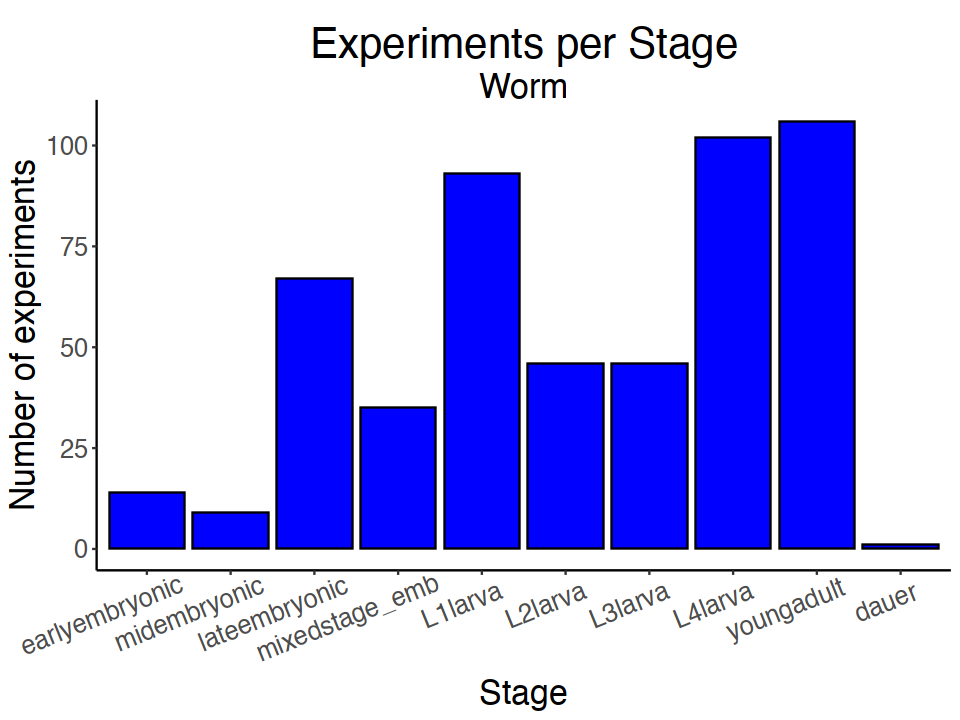

In [130]:
ggplot(worm_stage_counts, aes(x = new_stage, y = n))  +
geom_bar(stat = "identity", color = "#000000", fill = "blue") + 
theme_classic() + 
  labs(
    title = "Experiments per Stage",
      subtitle = "Worm",
    x = "Stage",
    y = "Number of experiments"
  ) +
#xlab("Number of experiments per stage") +
#ylab("Stage") +
theme_classic() +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 15, angle = 22, vjust = 0.9, hjust = 0.8), 
      axis.text.y= element_text(size = 15), axis.title= element_text(size = 20))

In [131]:
f1 = ggplot(worm_stage_counts, aes(x = new_stage, y = n))  +
geom_bar(stat = "identity", color = "#000000", fill = "blue") + 
theme_classic() + 
  labs(
    title = "Experiments per Stage",
      subtitle = "Worm",
    x = "Stage",
    y = "Number of experiments"
  ) +
#xlab("Number of experiments per stage") +
#ylab("Stage") +
theme_classic() +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 15, angle = 22, vjust = 0.9, hjust = 0.8), 
      axis.text.y= element_text(size = 15), axis.title= element_text(size = 20))

In [132]:
pdf("Figure1_experiments_per_stage.pdf", width = 8, height = 6)
print(f1)
dev.off()

pdf 
  2

In [133]:
png("Figure1_experiments_per_stage.png", width = 800, height = 600)
print(f1)
dev.off()

pdf 
  2

In [134]:
jpeg("Figure1_experiments_per_stage.jpg", width = 800, height = 600)
print(f1)
dev.off()

pdf 
  2

In [135]:
figure1a = function(worm_peaks_TF){

stage_strain = as.tibble(worm_peaks_TF)[,1] %>%  
    separate(peakID, into = c("TF", "Strain", "stage"), sep = "_") 
    worm_peaks_TF_stage = cbind(worm_peaks_TF, stage_strain  %>% select("Strain", "stage"))
    
worm_stage_counts = worm_peaks_TF_stage  %>% count(exp, stage)  %>% count(stage)
worm_peaks_TF_stage_adj = worm_peaks_TF_stage  %>% 
        mutate(new_stage = ifelse(stage == "mixedstage", "mixedstage_emb", stage)) 
    
worm_stage_counts = worm_peaks_TF_stage_adj  %>% count(exp, new_stage)  %>% count(new_stage)
worm_stage_counts$new_stage = factor(worm_stage_counts$new_stage,
                                   levels = c("earlyembryonic", "midembryonic", "lateembryonic", "mixedstage_emb",
                                              "L1larva", "L2larva", "L3larva", "L4larva", "youngadult", "dauer"))

f1 = ggplot(worm_stage_counts, aes(x = new_stage, y = n))  +
geom_bar(stat = "identity", color = "#000000", fill = "blue") + 
theme_classic() + 
  labs(
    title = "Experiments per Stage",
      subtitle = "Worm",
    x = "Stage",
    y = "Number of experiments"
  ) +
#xlab("Number of experiments per stage") +
#ylab("Stage") +
theme_classic() +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 15, angle = 22, vjust = 0.9, hjust = 0.8), 
      axis.text.y= element_text(size = 15), axis.title= element_text(size = 20))
    
pdf("Figure1_experiments_per_stage.pdf", width = 8, height = 6)
print(f1)
dev.off()
    
png("Figure1_experiments_per_stage.png", width = 800, height = 600)
print(f1)
dev.off()

jpeg("Figure1_experiments_per_stage.jpg", width = 800, height = 600)
print(f1)
dev.off()
    
}

In [136]:
save(worm_peaks_TF, figure1a, f1, file = "data/worm_figure1a.RData")

In [488]:
load("data/worm_figure1a.RData")

In [489]:
worm_stage_counts

ERROR: Error in eval(expr, envir, enclos): object 'worm_stage_counts' not found


In [28]:
mean((worm_peaks_TF  %>% count(exp))$n)

[1] 1735.746

In [29]:
median((worm_peaks_TF  %>% count(exp))$n)

[1] 1130

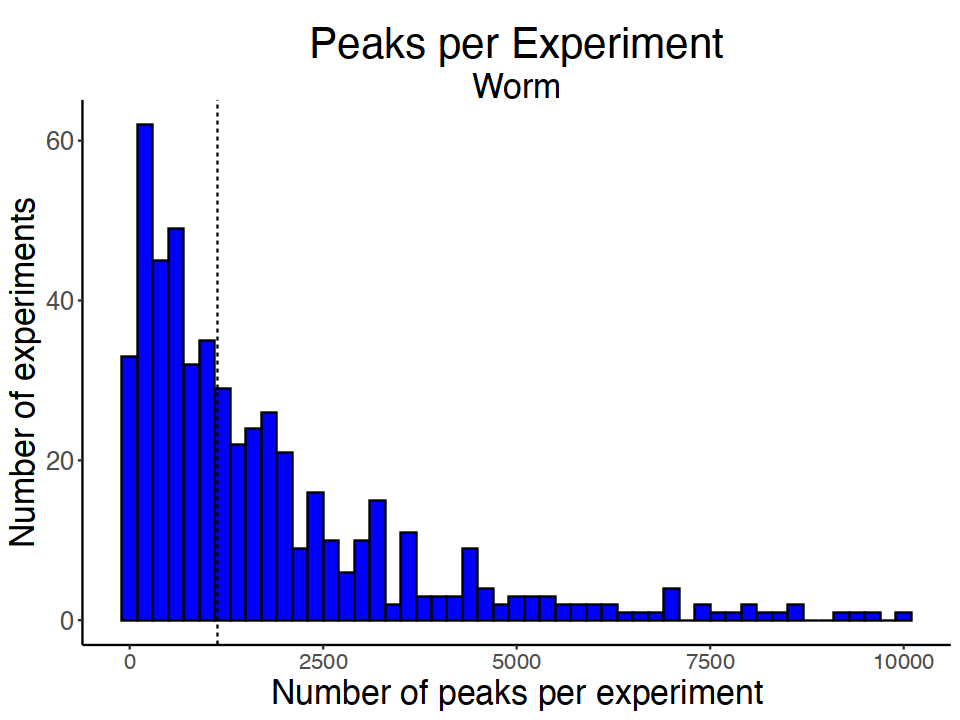

In [30]:
ggplot(worm_peaks_TF  %>% count(exp), aes(x=n)) + 
geom_histogram(binwidth = 200, color = "#000000", fill = "blue")+
geom_vline(xintercept = 1130, linetype = "dashed") +
  labs(
    title = "Peaks per Experiment",
      subtitle = "Worm",
    x = "Number of peaks in experiment",
    y = "Number of experiments"
  ) +
xlab("Number of peaks per experiment") +
ylab("Number of experiments") +
theme_classic() +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 13), 
      axis.text.y= element_text(size = 15), 
      axis.title= element_text(size = 20))

In [31]:
f1c = ggplot(worm_peaks_TF  %>% count(exp), aes(x=n)) + 
geom_histogram(binwidth = 200, color = "#000000", fill = "blue")+
geom_vline(xintercept = 1130, linetype = "dashed") +
  labs(
    title = "Peaks per Experiment",
      subtitle = "Worm",
    x = "Number of peaks in experiment",
    y = "Number of experiments"
  ) +
xlab("Number of peaks per experiment") +
ylab("Number of experiments") +
theme_classic() +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 13), 
      axis.text.y= element_text(size = 15), 
      axis.title= element_text(size = 20))

In [36]:
pdf("Figure1_peaks_per_experiment.pdf", width = 8, height = 6)
print(f1c)
dev.off()

pdf 
  2

In [37]:
png("Figure1_peaks_per_experiment.png", width = 800, height = 600)
print(f1c)
dev.off()

pdf 
  2

In [38]:
jpeg("Figure1_peaks_per_experiment.jpg", width = 800, height = 600)
print(f1c)
dev.off()

pdf 
  2

In [44]:
figure1c = function(worm_peaks_TF){
    median((worm_peaks_TF  %>% count(exp))$n)
    
f1c = ggplot(worm_peaks_TF  %>% count(exp), aes(x=n)) + 
geom_histogram(binwidth = 200, color = "#000000", fill = "blue")+
geom_vline(xintercept = 1130, linetype = "dashed") +
  labs(
    title = "Peaks per Experiment",
      subtitle = "Worm",
    x = "Number of peaks in experiment",
    y = "Number of experiments"
  ) +
xlab("Number of peaks per experiment") +
ylab("Number of experiments") +
theme_classic() +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 13), 
      axis.text.y= element_text(size = 15), 
      axis.title= element_text(size = 20))

pdf("Figure1_peaks_per_experiment.pdf", width = 8, height = 6)
print(f1c)
dev.off()
    
png("Figure1_peaks_per_experiment.png", width = 800, height = 600)
print(f1c)
dev.off()
    
jpeg("Figure1_peaks_per_experiment.jpg", width = 800, height = 600)
print(f1c)
dev.off()
}

In [89]:
save(worm_peaks_TF, figure1c, f1c, file = "data/worm_figure1c.RData")

## Figure supplement 1

In [47]:
worm_peak_spans = worm_peaks_TF  %>% mutate(peak_span = end.x - start.x)

In [50]:
worm_peak_spans  %>% arrange(peak_span) 

peakID,absDist,chromo.x,start.x,end.x,exp,score,strand.x,apexS.x,apexE.x,⋯,TranscriptLoc,Gene,GeneLoc,GeneExons,TranscriptNo,UniqueGeneTSSs,GeneTranscripts,rank,TF,peak_span
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
rnt-1_OP462_L1larva_2chrI11934264:11934316,3551,chrI,11934264,11934316,rnt-1_OP462_L1larva_2,1000,.,11934314,11934318,⋯,3P,R06C1.4,3P,3,1,1,1,0.9607155,rnt-1,52
rnt-1_OP462_L1larva_2chrI13688720:13688772,1180,chrI,13688720,13688772,rnt-1_OP462_L1larva_2,1000,.,13688764,13688768,⋯,5P,W04A4.6,5P,2,1,1,1,0.8889863,rnt-1,52
rnt-1_OP462_L1larva_2chrI2864099:2864151,2393,chrI,2864099,2864151,rnt-1_OP462_L1larva_2,1000,.,2864111,2864115,⋯,5P,Y71F9AL.10,5P,6,0,3,5,0.8288320,rnt-1,52
rnt-1_OP462_L1larva_2chrI6314868:6314920,328,chrI,6314868,6314920,rnt-1_OP462_L1larva_2,1000,.,6314903,6314907,⋯,5P,ima-2,5P,5,1,1,1,0.9291477,rnt-1,52
rnt-1_OP462_L1larva_2chrI7283803:7283855,77,chrI,7283803,7283855,rnt-1_OP462_L1larva_2,1000,.,7283837,7283841,⋯,5P,pfd-6,5P,4,1,1,1,0.9063486,rnt-1,52
rnt-1_OP462_L1larva_2chrI8223165:8223217,192,chrI,8223165,8223217,rnt-1_OP462_L1larva_2,1000,.,8223199,8223203,⋯,5P,T02E1.2,I1,12,1,2,2,0.9279200,rnt-1,52
rnt-1_OP462_L1larva_2chrII10785241:10785293,161,chrII,10785241,10785293,rnt-1_OP462_L1larva_2,1000,.,10785289,10785293,⋯,5P,cdl-1,5P,5,1,1,1,0.7916521,rnt-1,52
rnt-1_OP462_L1larva_2chrII11874846:11874898,90,chrII,11874846,11874898,rnt-1_OP462_L1larva_2,1000,.,11874876,11874880,⋯,5P,npp-3,5P,16,1,1,1,0.9566819,rnt-1,52
rnt-1_OP462_L1larva_2chrII15194066:15194118,2626,chrII,15194066,15194118,rnt-1_OP462_L1larva_2,1000,.,15194105,15194109,⋯,5P,spsb-1,5P,10,1,6,9,0.8786391,rnt-1,52


In [51]:
worm_peak_spans  %>% filter(peak_span > 1000)  %>% dim

[1] 250  34

In [48]:
options(repr.plot.width = 8, repr.plot.height = 6)

Warning message:
“Removed 250 rows containing non-finite values (`stat_bin()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


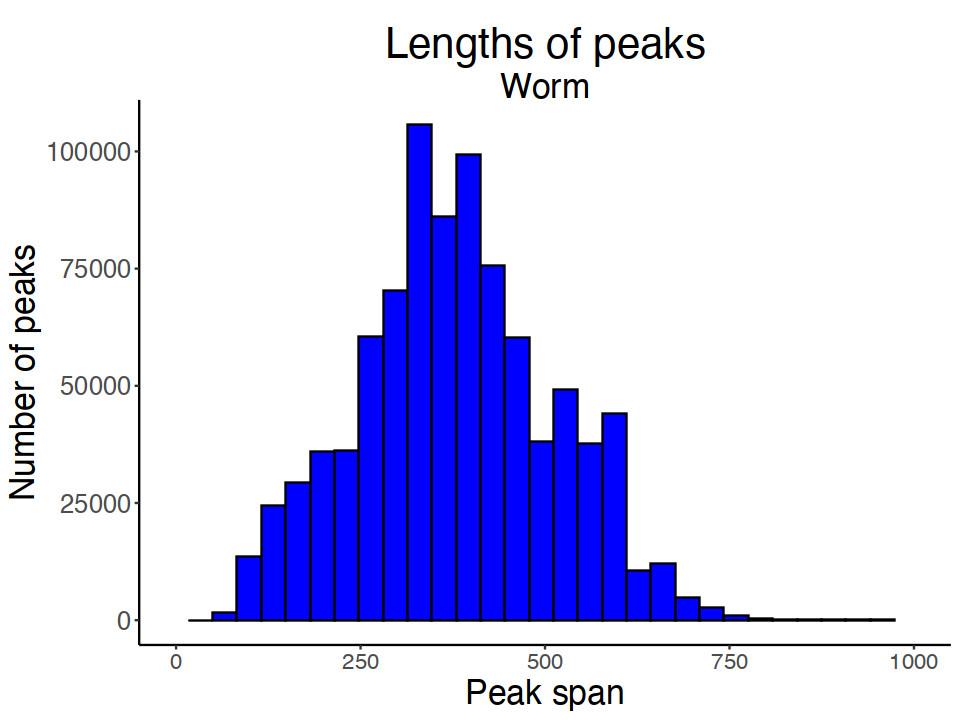

In [78]:
ggplot(worm_peak_spans,   
       #filter(nPeaks > 602), 
       aes(x = peak_span)) +
       geom_histogram(binwidth = 33, color = "#000000", fill = "blue") + 
  labs(
    title = "Lengths of peaks",
      subtitle = "Worm",
    x = "Peak span",
    y = "Number of peaks"
  ) +
theme_classic() + 
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 13), 
      axis.text.y= element_text(size = 15), 
      axis.title= element_text(size = 20)) + 
xlim(0, 1000)

In [79]:
fs1a = ggplot(worm_peak_spans,   
       #filter(nPeaks > 602), 
       aes(x = peak_span)) +
       geom_histogram(binwidth = 33, color = "#000000", fill = "blue") + 
  labs(
    title = "Lengths of peaks",
      subtitle = "Worm",
    x = "Peak span",
    y = "Number of peaks"
  ) +
theme_classic() + 
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 13), 
      axis.text.y= element_text(size = 15), 
      axis.title= element_text(size = 20)) + 
xlim(0, 1000)

In [84]:
pdf("Figures/Supplemental_Figure1_peaks_lengths.pdf", width = 8, height = 6)
print(fs1a)
dev.off()

Warning message:
“Removed 250 rows containing non-finite values (`stat_bin()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


pdf 
  2

In [85]:
png("Figures/Supplemental_Figure1_peaks_lengths.png", width = 800, height = 600)
print(fs1a)
dev.off()

Warning message:
“Removed 250 rows containing non-finite values (`stat_bin()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


pdf 
  2

In [86]:
jpeg("Figures/Supplemental_Figure1_peaks_lengths.jpg", width = 800, height = 600)
print(fs1a)
dev.off()

Warning message:
“Removed 250 rows containing non-finite values (`stat_bin()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


pdf 
  2

In [87]:
figures1a = function(worm_peaks_TF){
    
    worm_peak_spans = worm_peaks_TF  %>% mutate(peak_span = end.x - start.x)
    
fs1a = ggplot(worm_peak_spans,   
       #filter(nPeaks > 602), 
       aes(x = peak_span)) +
       geom_histogram(binwidth = 33, color = "#000000", fill = "blue") + 
  labs(
    title = "Lengths of peaks",
      subtitle = "Worm",
    x = "Peak span",
    y = "Number of peaks"
  ) +
theme_classic() + 
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 13), 
      axis.text.y= element_text(size = 15), 
      axis.title= element_text(size = 20)) + 
xlim(0, 1000)
    
    pdf("Figures/Suplemental_Figure1_peaks_lengths.pdf", width = 8, height = 6)
        print(fs1a)
    dev.off()
    
    png("Figures/Suplemental_Figure1_peaks_lengths.png", width = 800, height = 600)
        print(fs1a)
    dev.off()
    
    jpeg("Figures/Suplemental_Figure1_peaks_lengths.jpg", width = 800, height = 600)
        print(fs1a)
    dev.off()
    
    
}

In [88]:
save(worm_peak_spans, fs1a, figures1a, file = "data/worm_figure_s1a.RData")

## Figure supplement s1c

In [63]:
worm_clusters = worm_peaks_TF  %>% 
count(cluster, start.y, end.y, nPeaks)  %>% mutate(cluster_span = end.y - start.y)

In [99]:
worm_clusters  %>% filter(cluster_span > 3000)

cluster,start.y,end.y,nPeaks,n,cluster_span
<chr>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
2_narrowPeak11656,2213311,2224842,4,4,11531
2_narrowPeak12803,5166434,5170044,4,4,3610
2_narrowPeak13021,5693911,5698941,78,78,5030
2_narrowPeak13342,6534760,6537782,52,52,3022
2_narrowPeak14072,8710231,8713358,4,4,3127
2_narrowPeak14546,9942038,9947402,24,24,5364
2_narrowPeak14608,10162255,10167030,3,3,4775
2_narrowPeak14984,11120895,11124387,30,30,3492
2_narrowPeak15500,12322285,12325899,52,52,3614


Warning message:
“Removed 50 rows containing missing values (`geom_point()`).”


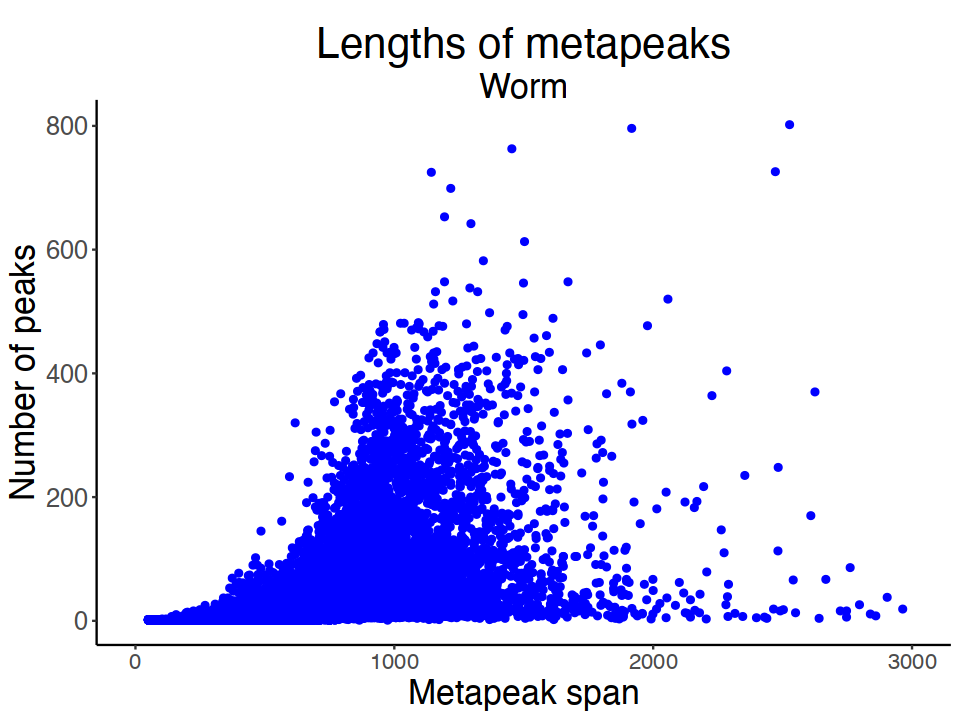

In [92]:
ggplot(worm_clusters, aes(x = cluster_span, y = nPeaks)) +
       geom_point(color = "blue", fill = "blue") + 
  labs(
    title = "Lengths of metapeaks",
      subtitle = "Worm",
    x = "Metapeak span",
    y = "Number of peaks"
  ) +
theme_classic() + xlim(0, 3000) +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 13), 
      axis.text.y= element_text(size = 15), 
      axis.title= element_text(size = 20)) 

In [93]:
fs1c = ggplot(worm_clusters, aes(x = cluster_span, y = nPeaks)) +
       geom_point(color = "blue", fill = "blue") + 
  labs(
    title = "Lengths of metapeaks",
      subtitle = "Worm",
    x = "Metapeak span",
    y = "Number of peaks"
  ) +
theme_classic() + xlim(0, 3000) +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 13), 
      axis.text.y= element_text(size = 15), 
      axis.title= element_text(size = 20)) 

In [94]:
pdf("Figures/Supplemental_Figure1c_metapeak_lengths.pdf", width = 8, height = 6)
print(fs1c)
dev.off()

Warning message:
“Removed 50 rows containing missing values (`geom_point()`).”


pdf 
  2

In [95]:
jpeg("Figures/Supplemental_Figure1c_metapeak_lengths.jpg", width = 800, height = 600)
print(fs1c)
dev.off()

Warning message:
“Removed 50 rows containing missing values (`geom_point()`).”


pdf 
  2

In [96]:
png("Figures/Supplemental_Figure1c_metapeak_lengths.png", width = 800, height = 600)
print(fs1c)
dev.off()

Warning message:
“Removed 50 rows containing missing values (`geom_point()`).”


pdf 
  2

In [97]:
figures1c = function(worm_peaks_TF){
    worm_clusters = worm_peaks_TF  %>% 
        count(cluster, start.y, end.y, nPeaks)  %>% mutate(cluster_span = end.y - start.y)
    fs1c = ggplot(worm_clusters, aes(x = cluster_span, y = nPeaks)) +
       geom_point(color = "blue", fill = "blue") + 
    labs(
        title = "Lengths of metapeaks",
          subtitle = "Worm",
        x = "Metapeak span",
        y = "Number of peaks"
      ) +
    theme_classic() + xlim(0, 3000) +
    theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 13), 
      axis.text.y= element_text(size = 15), 
      axis.title= element_text(size = 20)) 
    pdf("Figures/Supplemental_Figure1c_metapeak_lengths.pdf", width = 8, height = 6)
        print(fs1c)
    dev.off()
    
    jpeg("Figures/Supplemental_Figure1c_metapeak_lengths.jpg", width = 800, height = 600)
        print(fs1c)
    dev.off()
    
    png("Figures/Supplemental_Figure1c_metapeak_lengths.png", width = 800, height = 600)
        print(fs1c)
    dev.off()
}

In [98]:
save(worm_clusters, fs1c, figures1c, file = "data/worm_figure_s1c.RData")

## Figure 2 A

In [17]:
peaks_by_cluster_size = worm_peaks_TF  %>% count(cluster)  %>% count(n)  %>% mutate(peaks_sum = n*nn)

Storing counts in `nn`, as `n` already present in input
ℹ Use `name = "new_name"` to pick a new name.


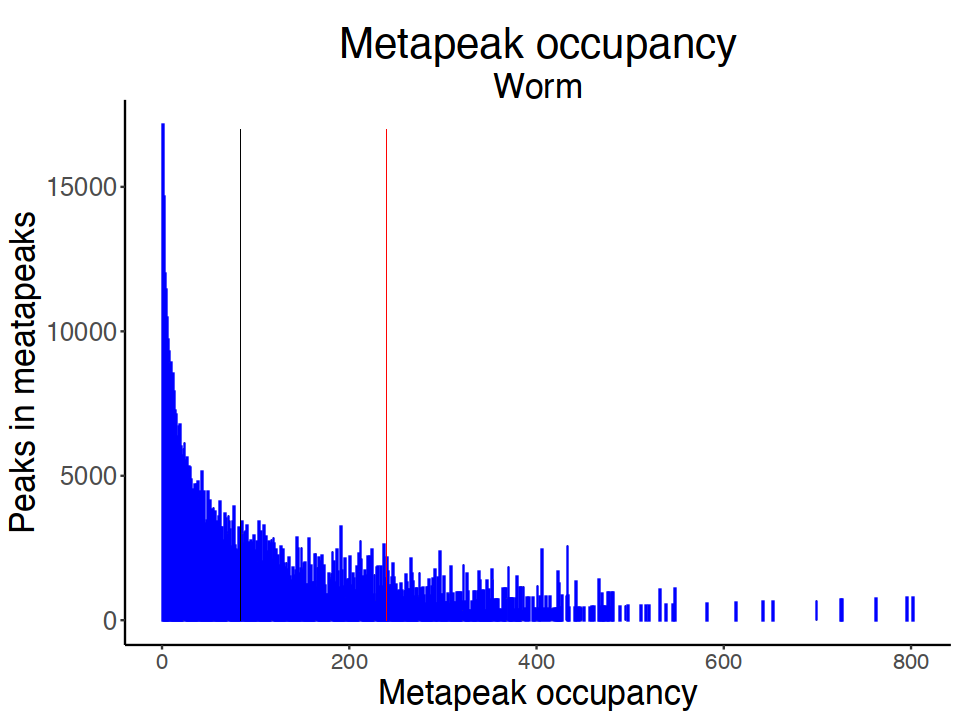

In [104]:
ggplot(peaks_by_cluster_size, aes(x = n, y = peaks_sum))  +
theme_classic() +
  labs(
    title = "Metapeak occupancy",
      subtitle = "Worm"
      ) +
 theme(axis.title = element_text(size = 20), axis.text.x= element_text(size = 13), axis.text.y= element_text(size = 15)) +
  geom_bar(stat="identity", color = "blue") + 
geom_segment(x = 84, y = 0, xend = 84, yend = 17000, col = "black", size = 0.1) +
geom_segment(x = 240, y = 0, xend = 240, yend = 17000, col = "red", size = 0.1)+
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 13), 
      axis.text.y= element_text(size = 15), 
      axis.title= element_text(size = 20)) +
xlab("Metapeak occupancy") +
ylab("Peaks in meatapeaks")

In [105]:
f2a = ggplot(peaks_by_cluster_size, aes(x = n, y = peaks_sum))  +
theme_classic() +
  labs(
    title = "Metapeak occupancy",
      subtitle = "Worm"
      ) +
 theme(axis.title = element_text(size = 20), axis.text.x= element_text(size = 13), axis.text.y= element_text(size = 15)) +
  geom_bar(stat="identity", color = "blue") + 
geom_segment(x = 84, y = 0, xend = 84, yend = 17000, col = "black", size = 0.1) +
geom_segment(x = 240, y = 0, xend = 240, yend = 17000, col = "red", size = 0.1)+
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 13), 
      axis.text.y= element_text(size = 15), 
      axis.title= element_text(size = 20)) +
xlab("Metapeak occupancy") +
ylab("Peaks in meatapeaks")

In [108]:
pdf("Figure2a_metapeak_occupancy.pdf", width = 8, height = 6)
print(f2a)
dev.off()

png("Figure2a_metapeak_occupancy.png", width = 800, height = 600)
print(f2a)
dev.off()

jpeg("Figure2a_metapeak_occupancy.jpg", width = 800, height = 600)
print(f2a)
dev.off()

pdf 
  2

pdf 
  2

pdf 
  2

In [110]:
figure2a = function(peaks_by_cluster_size) {
    peaks_by_cluster_size = worm_peaks_TF  %>% count(cluster)  %>% 
        count(n)  %>% mutate(peaks_sum = n*nn)
    f2a = ggplot(peaks_by_cluster_size, aes(x = n, y = peaks_sum))  +
theme_classic() +
  labs(
    title = "Metapeak occupancy",
      subtitle = "Worm"
      ) +
     theme(axis.title = element_text(size = 20), axis.text.x= element_text(size = 13), axis.text.y= element_text(size = 15)) +
      geom_bar(stat="identity", color = "blue") + 
    geom_segment(x = 84, y = 0, xend = 84, yend = 17000, col = "black", size = 0.1) +
    geom_segment(x = 240, y = 0, xend = 240, yend = 17000, col = "red", size = 0.1)+
    theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 13), 
      axis.text.y= element_text(size = 15), 
      axis.title= element_text(size = 20)) +
    xlab("Metapeak occupancy") +
    ylab("Peaks in meatapeaks")
    
    pdf("Figure2a_metapeak_occupancy.pdf", width = 8, height = 6)
        print(f2a)
    dev.off()

    png("Figure2a_metapeak_occupancy.png", width = 800, height = 600)
        print(f2a)
    dev.off()

    jpeg("Figure2a_metapeak_occupancy.jpg", width = 800, height = 600)
        print(f2a)
    dev.off()
    
}

In [111]:
save(worm_peaks_TF, peaks_by_cluster_size, f2a, figure2a, file = "data/worm_figure_2a.RData")

In [4]:
load("data/worm_figure_2a.RData")

## Figure 2C

In [5]:
load("data/worm_figure3.RData")

In [6]:
ls()

[1] "f2a"                   "figure2a"              "Figure3_worm_violin"  
[4] "peaks_by_cluster_size" "worm_peaks_TF"

In [115]:
Figure3_worm_violin

function(peak_file){
    worm_peaks_TF = peak_file
    worm_peaks_TF = worm_peaks_TF  %>% mutate(group =  ifelse(nPeaks == 1, "1",
                                            ifelse(nPeaks > 1 & nPeaks <=6, "2-6",
                                                  ifelse(nPeaks > 6 & nPeaks <=30, "7-30",
                                                        ifelse(nPeaks > 30 & nPeaks <=84, "31-84",
                                                              ifelse(nPeaks > 84 & nPeaks <=240, "85-240",
                                                                    ifelse(nPeaks > 240, "gt240", NA)))))))
    worm_peaks_TF$group = factor(worm_peaks_TF$group,
                                       levels = c("1", "2-6", "7-30", "31-84", "85-240", "gt240"  ))
    
    options(repr.plot.width=10, repr.plot.height=6)
    
    p = ggplot(worm_peaks_TF   , aes(x = group, y = rank,  fill = group)) +
geom_violin(show.legend = FALSE) +
stat_summary(fun=median, geom="point", size=4, color="black", show.legend = FALSE) +
labs(title="Peak quality vs metapeak occupancy",x="Peaks per metapeak", y = "Rank") +
theme_classic() +
theme(plot.title=element_text(hjust=0.5, size = 25), axis.title= element_text(size = 22),
      axis.text = element_text(size = 18))
    
}

In [120]:
options(repr.plot.width = 12, repr.plot.height = 8)

In [510]:
worm_peaks_TF = worm_peaks_TF %>% mutate(group = ifelse(nPeaks == 
        1, "1", ifelse(nPeaks > 1 & nPeaks <= 6, "2-6", ifelse(nPeaks > 
        6 & nPeaks <= 30, "7-30", ifelse(nPeaks > 30 & nPeaks <= 
        84, "31-84", ifelse(nPeaks > 84 & nPeaks <= 240, "85-240", 
        ifelse(nPeaks > 240, "gt240", NA)))))))
    worm_peaks_TF$group = factor(worm_peaks_TF$group, levels = c("1", 
        "2-6", "7-30", "31-84", "85-240", "gt240"))
    options(repr.plot.width = 12, repr.plot.height = 8)
    p = ggplot(worm_peaks_TF, aes(x = group, y = rank, fill = group)) + 
        geom_violin(show.legend = FALSE) + stat_summary(fun = median, 
        geom = "point", size = 4, color = "black", show.legend = FALSE) + 
        labs(title = "Peak quality vs metapeak occupancy", x = "Peaks per metapeak", 
            y = "Rank") + theme_classic() + 

theme(plot.title = element_text(hjust = 0.5, 
        size = 30, face = "bold"), axis.title = element_text(size = 23), 
      axis.text = element_text(size = 20))

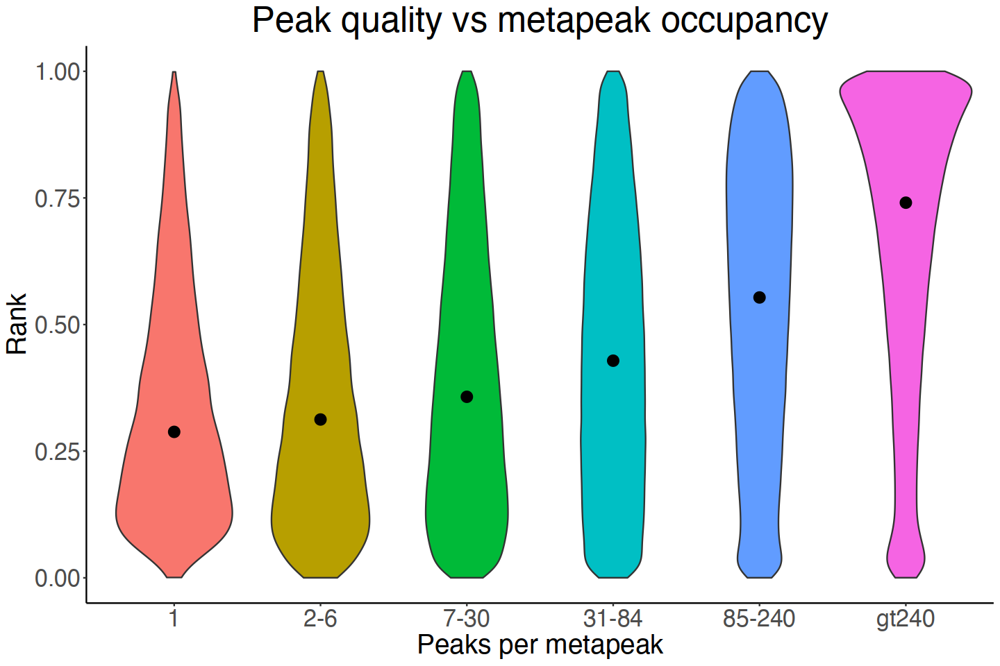

In [511]:
p

In [512]:
f2c = p

In [515]:
pdf("Figure2c_metapeak_occupancy_vs_rank.pdf", width = 12, height = 9)
print(f2c)
dev.off()

png("Figure2c_metapeak_occupancy_vs_rank.png", width = 1200, height = 900)
print(f2c)
dev.off()

jpeg("Figure2c_metapeak_occupancy_vs_rank.jpg", width = 1200, height = 900)
print(f2c)
dev.off()

pdf 
  2

pdf 
  2

pdf 
  2

In [142]:
worm_peaks_TF  %>% filter(nPeaks == 1)  %>% dim
worm_peaks_TF  %>% filter(nPeaks >= 2 & nPeaks <=6)  %>% dim
worm_peaks_TF  %>% filter(nPeaks >= 7 & nPeaks <=30)  %>% dim
worm_peaks_TF  %>% filter(nPeaks >= 31 & nPeaks <=84)  %>% dim
worm_peaks_TF  %>% filter(nPeaks >= 85 & nPeaks <=240)  %>% dim
worm_peaks_TF  %>% filter(nPeaks >240)  %>% dim

[1] 17153    34

[1] 58315    34

[1] 162346     34

[1] 193223     34

[1] 287735     34

[1] 182080     34

In [145]:
worm_peaks_TF  %>% filter(nPeaks == 1)  %>% count(cluster)  %>% dim
worm_peaks_TF  %>% filter(nPeaks >= 2 & nPeaks <=6)  %>% count(cluster) %>% dim
worm_peaks_TF  %>% filter(nPeaks >= 7 & nPeaks <=30) %>% count(cluster)  %>% dim
worm_peaks_TF  %>% filter(nPeaks >= 31 & nPeaks <=84) %>% count(cluster) %>% dim
worm_peaks_TF  %>% filter(nPeaks >= 85 & nPeaks <=240) %>% count(cluster) %>% dim
worm_peaks_TF  %>% filter(nPeaks >240) %>% count(cluster) %>% dim

[1] 17153     2

[1] 17913     2

[1] 11369     2

[1] 3823    2

[1] 2070    2

[1] 546   2

## Table 3 Redo number of targets of ultHOT HOT etc peaks

In [148]:
worm_peaks_TF  %>% filter(nPeaks > 240)  %>% count(Gene, nPeaks, cluster)  %>% arrange(cluster)

Gene,nPeaks,cluster,n
<chr>,<dbl>,<chr>,<int>
cebp-1,301,10_narrowPeak10724,301
ZK470.2,292,10_narrowPeak11093,292
T02E1.2,262,10_narrowPeak1221,262
T24B8.3,339,10_narrowPeak3300,339
hmg-1.1,259,10_narrowPeak4050,259
C17H12.2,268,10_narrowPeak7074,256
vha-8,268,10_narrowPeak7074,12
T28B11.1,292,10_narrowPeak9509,292
ZK546.19,246,11_narrowPeak2414,221


In [33]:
worm_peaks_TF  %>% filter(nPeaks > 84)  %>% count(Gene, nPeaks, cluster)  %>% 
group_by(cluster)   %>%  slice_max(order_by  = n, n=1, with_ties = FALSE)   %>% arrange(cluster)
## But this number has some genes as targets of 2 or more HOT regions

Gene,nPeaks,cluster,n
<chr>,<dbl>,<chr>,<int>
Y43F8B.2,90,10_narrowPeak10448,90
cebp-1,301,10_narrowPeak10724,301
F35A5.8,120,10_narrowPeak11036,120
ZK470.2,292,10_narrowPeak11093,292
act-4,144,10_narrowPeak11207,144
Y34B4A.7,110,10_narrowPeak11249,110
pck-2,116,10_narrowPeak1169,116
lin-14,169,10_narrowPeak12113,169
T02E1.2,262,10_narrowPeak1221,262


In [158]:
worm_peaks_TF  %>% filter(nPeaks >= 84)  %>% count(Gene, nPeaks, cluster)  %>% 
group_by(cluster)   %>%  slice_max(order_by  = n, )   %>% arrange(Gene)

Gene,nPeaks,cluster,n
<chr>,<dbl>,<chr>,<int>
AH10.4,160,2_narrowPeak25956,160
B0035.22,92,2_narrowPeak19779,49
B0041.8,163,4_narrowPeak1197,162
B0205.9,86,2_narrowPeak3957,86
B0228.7,152,2_narrowPeak7900,152
B0238.11,146,3_narrowPeak18408,130
B0261.1,111,2_narrowPeak2046,111
B0280.11,104,4_narrowPeak9121,104
B0280.11,157,7_narrowPeak6483,138


In [161]:
worm_peaks_TF  %>% filter(nPeaks > 84) %>% count( nPeaks, cluster) 
## This is exactly the same number of clusters > 84 that are in Lou's file
## AllWormPeaks.TF.noDups.clusters.distance.bed

nPeaks,cluster,n
<dbl>,<chr>,<int>
85,2_narrowPeak10412,85
85,2_narrowPeak11121,85
85,2_narrowPeak14045,85
85,2_narrowPeak14161,85
85,2_narrowPeak1420,85
85,2_narrowPeak14753,85
85,2_narrowPeak15061,85
85,2_narrowPeak16407,85
85,2_narrowPeak1671,85


In [189]:
Lou_targets = read.table("primaryHotTargets")

In [190]:
Lou_targets  = Lou_targets  %>% rename("Gene" = "V1")
dim(Lou_targets)

[1] 2268    1

In [170]:
HOT_targets = worm_peaks_TF  %>% filter(nPeaks > 84)  %>% count(Gene, nPeaks, cluster)  %>% 
group_by(cluster)   %>%  slice_max(order_by  = n, n=1, with_ties = FALSE)   %>% arrange(cluster)

In [171]:
left_join(Lou_targets, HOT_targets, by = "Gene")

Gene,nPeaks,cluster,n
<chr>,<dbl>,<chr>,<int>
AH10.4,160,2_narrowPeak25956,160
B0035.22,92,2_narrowPeak19779,49
B0041.8,163,4_narrowPeak1197,162
B0205.9,86,2_narrowPeak3957,86
B0228.7,152,2_narrowPeak7900,152
B0238.11,146,3_narrowPeak18408,130
B0261.1,111,2_narrowPeak2046,111
B0280.11,104,4_narrowPeak9121,104
B0280.11,157,7_narrowPeak6483,138


In [192]:
left_join(Lou_targets, HOT_targets, by = "Gene") %>% filter(is.na(nPeaks))  %>% count

n
<int>
52


In [174]:
unique(Lou_targets)

,Gene
,<chr>
1,AH10.4
2,B0035.22
3,B0041.8
4,B0205.9
5,B0228.7
6,B0238.11
7,B0261.1
8,B0280.11
9,B0284.3


In [180]:
HOT_targets_unique = as.data.frame(unique(HOT_targets$Gene))  

In [183]:
HOT_targets_unique = HOT_targets_unique  %>% rename("Gene" = "unique(HOT_targets$Gene)")

In [187]:
dim(HOT_targets_unique)
## for unclear reasons I have 2 fewer unique targets!!

[1] 2266    1

In [184]:
## these are genes where the alternate target has more peaks assigned in my list than what Lou has found as the primary target!!
setdiff(Lou_targets, HOT_targets_unique)
## makes it hard to find out why the 2 gene discrepancy

Gene
<chr>
C26C6.9
F25H9.6
F42A10.5
M163.5
R05F9.7
W04B5.3
Y24F12A.1
Y48A6B.3
Y48A6C.4


In [185]:
worm_peaks_TF  %>% filter(nPeaks > 84)  %>% count(Gene, nPeaks, cluster)  %>% filter(Gene == "C26C6.9")

Gene,nPeaks,cluster,n
<chr>,<dbl>,<chr>,<int>
C26C6.9,292,2_narrowPeak2848,106


In [186]:
worm_peaks_TF  %>% filter(nPeaks > 84)  %>% count(Gene, nPeaks, cluster)  %>% filter(cluster == "2_narrowPeak2848")

Gene,nPeaks,cluster,n
<chr>,<dbl>,<chr>,<int>
C26C6.9,292,2_narrowPeak2848,106
goa-1,292,2_narrowPeak2848,186


### start from here to get targets of metapeaks from Lou's files

In [34]:
cluster_nPeaks = read.table("AllWormPeaks.TF.noDups.clusters.distance.bed")

In [35]:
TSS_gene = read.table("AllWormPeaks.TF.noDups.clusters.peakTSSs")

In [36]:
head(cluster_nPeaks)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11
,<chr>,<int>,<int>,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<int>
1,chrI,826,1041,2_narrowPeak1,2,.,931,935,"0,0,255",Y74C9A.3.1::3P,9297
2,chrI,1521,1945,Singleton_1122,1,.,1731,1735,"0,0,0",Y74C9A.3.1::3P,8497
3,chrI,1994,2072,Singleton_1548,1,.,2002,2006,"0,0,0",Y74C9A.3.1::3P,8226
4,chrI,3437,4628,2_narrowPeak2,224,.,3899,3903,"0,255,0",Y74C9A.3.1::3P,6329
5,chrI,8291,8824,2_narrowPeak3,5,.,8692,8696,"255,0,0",Y74C9A.3.1::I2,1536
6,chrI,9107,9543,2_narrowPeak4,5,.,9317,9321,"0,0,255",Y74C9A.3.1::I2,911


In [37]:
head(TSS_gene)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,TargetID,TranscriptCoord,Transcript,TranscriptLoc,Gene,GeneLoc,GeneExons,TranscriptNo,UniqueGeneTSSs,GeneTranscripts
2,2L52.1a.1::5P,II:1848:5514:+,2L52.1a.1,5P,2L52.1,5P,7,1,2,2
3,2L52.1b.1::3P,II:3536:4663:+,2L52.1b.1,3P,2L52.1,3P,7,2,2,2
4,2L52.1b.1::E7,II:3536:4663:+,2L52.1b.1,E3,2L52.1,E7,7,2,2,2
5,2RSSE.1a.1::3P,II:15268212:15274345:+,2RSSE.1a.1,3P,rga-9,3P,9,2,2,3
6,2RSSE.1a.1::E1,II:15268212:15274345:+,2RSSE.1a.1,E1,rga-9,E1,9,2,2,3


In [198]:
unique(TSS_gene$V1)  %>% length
dim(TSS_gene)
## THIS MUST BE A LIST OF ALL TRANSCRIPTS with gene assignments

[1] 51682

[1] 51682    10

In [207]:
unique(TSS_gene$V1)  %>%  head(50)

[1] "TargetID"       "2L52.1a.1::5P"  "2L52.1b.1::3P"  "2L52.1b.1::E7" 
 [5] "2RSSE.1a.1::3P" "2RSSE.1a.1::E1" "2RSSE.1a.1::E2" "2RSSE.1a.1::E4"
 [9] "2RSSE.1a.1::E5" "2RSSE.1a.1::I6" "2RSSE.1b.1::5P" "3R5.1a.1::5P"  
[13] "4R79.1a.1::5P"  "4R79.1b.1::I3"  "4R79.2b.1::3P"  "AC3.10.2::3P"  
[17] "AC3.1a.1::5P"   "AC3.1b.1::3P"   "AC3.2.1::5P"    "AC3.5a.1::5P"  
[21] "AC3.5b.1::3P"   "AC3.6.1::5P"    "AC3.6.1::E3"    "AC3.7.1::3P"   
[25] "AC3.7.1::5P"    "AC3.7.1::I5"    "AC3.8.1::3P"    "AC3.8.1::5P"   
[29] "AC3.8.1::E3"    "AC7.1a.1::5P"   "AC7.1a.1::E1"   "AC7.1a.1::I2"  
[33] "AC7.1a.1::I3"   "AC7.2a.1::3P"   "AC7.2a.1::I4"   "AC7.2a.1::I6"  
[37] "AC7.2b.1::I2"   "AC7.2b.1::I4"   "AC7.2c.1::5P"   "AC7.2c.1::E1"  
[41] "AC7.3.1::3P"    "AC7.3.1::5P"    "AC8.10.1::5P"   "AH10.1.1::3P"  
[45] "AH10.1.1::5P"   "AH10.1.1::E5"   "AH10.1.1::E6"   "AH10.1.1::E7"  
[49] "AH10.2.1::3P"   "AH10.2.1::5P"

In [38]:
TSS_gene2 = TSS_gene  %>% select(V1, V5)

In [39]:
left_join(cluster_nPeaks, TSS_gene2, by = c("V10" = "V1"))  %>% head(20)
left_join(cluster_nPeaks, TSS_gene2, by = c("V10" = "V1"))  %>% tail(20)

,V1,V2,V3,V4,V5.x,V6,V7,V8,V9,V10,V11,V5.y
,<chr>,<int>,<int>,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<int>,<chr>
1,chrI,826,1041,2_narrowPeak1,2,.,931,935,"0,0,255",Y74C9A.3.1::3P,9297,homt-1
2,chrI,1521,1945,Singleton_1122,1,.,1731,1735,"0,0,0",Y74C9A.3.1::3P,8497,homt-1
3,chrI,1994,2072,Singleton_1548,1,.,2002,2006,"0,0,0",Y74C9A.3.1::3P,8226,homt-1
4,chrI,3437,4628,2_narrowPeak2,224,.,3899,3903,"0,255,0",Y74C9A.3.1::3P,6329,homt-1
5,chrI,8291,8824,2_narrowPeak3,5,.,8692,8696,"255,0,0",Y74C9A.3.1::I2,1536,homt-1
6,chrI,9107,9543,2_narrowPeak4,5,.,9317,9321,"0,0,255",Y74C9A.3.1::I2,911,homt-1
7,chrI,10706,10810,2_narrowPeak5,2,.,10756,10760,"0,255,0",Y74C9A.3.1::5P,-528,homt-1
8,chrI,10972,11755,2_narrowPeak6,25,.,11393,11397,"255,0,0",Y74C9A.2a.1::5P,-100,nlp-40
9,chrI,12622,13548,2_narrowPeak7,12,.,13029,13033,"0,0,255",Y74C9A.2a.2::I2,1413,nlp-40


,V1,V2,V3,V4,V5.x,V6,V7,V8,V9,V10,V11,V5.y
,<chr>,<int>,<int>,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<int>,<chr>
52855,chrX,17672390,17672530,2_narrowPeak33823,2,.,17672458,17672462,"0,255,0",T23E7.2d.5::I2,-924,T23E7.2
52856,chrX,17674304,17674848,2_narrowPeak33824,5,.,17674463,17674467,"255,0,0",T23E7.2d.6::E5,110,T23E7.2
52857,chrX,17675778,17676174,2_narrowPeak33825,4,.,17675884,17675888,"0,0,255",T23E7.2d.6::E8,1531,T23E7.2
52858,chrX,17676747,17676947,Singleton_14972,1,.,17676874,17676878,"0,0,0",T23E7.2c.1::E10,-789,T23E7.2
52859,chrX,17680081,17680637,Singleton_2623,1,.,17680357,17680361,"0,0,0",T23E7.6.2::3P,1946,T23E7.6
52860,chrX,17681532,17681959,2_narrowPeak33826,5,.,17681763,17681767,"0,255,0",T23E7.6.2::I2,540,T23E7.6
52861,chrX,17682358,17682643,2_narrowPeak33827,3,.,17682495,17682499,"255,0,0",T23E7.6.2::I1,-192,T23E7.6
52862,chrX,17683705,17684070,2_narrowPeak33828,3,.,17683988,17683992,"0,0,255",T23E7.6.1::I1,821,T23E7.6
52863,chrX,17684669,17685255,2_narrowPeak33829,42,.,17684947,17684951,"0,255,0",T23E7.6.1::5P,-138,T23E7.6


In [40]:
dim(cluster_nPeaks)
left_join(cluster_nPeaks, TSS_gene2, by = c("V10" = "V1"))  %>% dim

[1] 52874    11

[1] 52874    12

In [41]:
unique(cluster_nPeaks$V10)  %>% length

[1] 36173

In [42]:
cluster_nPeaks_genes = left_join(cluster_nPeaks, TSS_gene2, by = c("V10" = "V1"))

In [43]:
colnames(worm_peaks_TF)

[1] "peakID"          "absDist"         "chromo.x"        "start.x"        
 [5] "end.x"           "exp"             "score"           "strand.x"       
 [9] "apexS.x"         "apexE.x"         "color.x"         "cluster"        
[13] "target"          "targetDist"      "chromo.y"        "start.y"        
[17] "end.y"           "nPeaks"          "strand.y"        "apexS.y"        
[21] "apexE.y"         "color.y"         "TranscriptCoord" "Transcript"     
[25] "TranscriptLoc"   "Gene"            "GeneLoc"         "GeneExons"      
[29] "TranscriptNo"    "UniqueGeneTSSs"  "GeneTranscripts" "rank"           
[33] "TF"

### rename the columns

In [44]:
cluster_nPeaks_genes  %>% rename("chromo" = "V1",
                                "start" = "V2",
                                "end" = "V3",
                                "cluster" = "V4",
                                "nPeaks" = "V5.x",
                                "sign" = "V6",
                                "apexS" = "V7",
                                "apexE" = "V8",
                                "color" = "V9",
                                "Transcript" = "V10",
                                "targetDist" = "V11",
                                "Gene" = "V5.y")  %>% head

,chromo,start,end,cluster,nPeaks,sign,apexS,apexE,color,Transcript,targetDist,Gene
,<chr>,<int>,<int>,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<int>,<chr>
1,chrI,826,1041,2_narrowPeak1,2,.,931,935,"0,0,255",Y74C9A.3.1::3P,9297,homt-1
2,chrI,1521,1945,Singleton_1122,1,.,1731,1735,"0,0,0",Y74C9A.3.1::3P,8497,homt-1
3,chrI,1994,2072,Singleton_1548,1,.,2002,2006,"0,0,0",Y74C9A.3.1::3P,8226,homt-1
4,chrI,3437,4628,2_narrowPeak2,224,.,3899,3903,"0,255,0",Y74C9A.3.1::3P,6329,homt-1
5,chrI,8291,8824,2_narrowPeak3,5,.,8692,8696,"255,0,0",Y74C9A.3.1::I2,1536,homt-1
6,chrI,9107,9543,2_narrowPeak4,5,.,9317,9321,"0,0,255",Y74C9A.3.1::I2,911,homt-1


In [45]:
cluster_nPeaks_genes = cluster_nPeaks_genes  %>% rename("chromo" = "V1",
                                "start" = "V2",
                                "end" = "V3",
                                "cluster" = "V4",
                                "nPeaks" = "V5.x",
                                "sign" = "V6",
                                "apexS" = "V7",
                                "apexE" = "V8",
                                "color" = "V9",
                                "Transcript" = "V10",
                                "targetDist" = "V11",
                                "Gene" = "V5.y")

In [46]:
unique((cluster_nPeaks_genes$Gene))  %>% length

[1] 16314

In [47]:
cluster_nPeaks_genes  %>% filter(nPeaks > 240)  %>% count(Gene)  %>% count

n
<int>
518


In [48]:
gt240genes = (cluster_nPeaks_genes  %>% filter(nPeaks > 240))$Gene

In [49]:
cluster_nPeaks_genes  %>% filter(nPeaks > 84)  %>% count

n
<int>
2616


In [50]:
cluster_nPeaks_genes  %>% filter(nPeaks > 84 & !(Gene %in% gt240genes))  %>% count(Gene)  %>% count

n
<int>
1750


In [51]:
gt84lte240genes = (cluster_nPeaks_genes  %>% filter(nPeaks > 84 & !(Gene %in% gt240genes)))$Gene

In [52]:
cluster_nPeaks_genes  %>% filter(nPeaks > 30 & !(Gene %in% c(gt240genes,gt84lte240genes ))) %>% 
        count(Gene)  %>% count

n
<int>
2465


In [53]:
length(c(gt240genes,gt84lte240genes))
length(unique(c(gt240genes,gt84lte240genes)))

[1] 2511

[1] 2268

In [54]:
length(c(gt84lte240genes))
length(unique(c(gt84lte240genes)))

[1] 1965

[1] 1750

In [253]:
2511-2268

[1] 243

In [55]:
gt30lte84genes = (cluster_nPeaks_genes  %>% 
                  filter(nPeaks > 30 & !(Gene %in% c(gt240genes, gt84lte240genes ))))$Gene

In [56]:
length(gt30lte84genes)

[1] 2872

In [57]:
cluster_nPeaks_genes  %>% 
filter(nPeaks > 6 & !(Gene %in% c(gt240genes,gt84lte240genes, gt30lte84genes )))  %>% 
        count(Gene) %>% count

n
<int>
4868


In [58]:
length(c(gt240genes,gt84lte240genes, gt30lte84genes ))
length(unique(c(gt240genes,gt84lte240genes, gt30lte84genes )))

[1] 5383

[1] 4733

In [250]:
5383-4733

[1] 650

In [59]:
gt6lte30genes = (cluster_nPeaks_genes  %>% 
                filter(nPeaks > 6 & !(Gene %in% c(gt240genes,gt84lte240genes, gt30lte84genes ))))$Gene

In [60]:
length(gt6lte30genes)

[1] 6923

In [61]:
cluster_nPeaks_genes  %>% 
filter(nPeaks > 1 & !(Gene %in% c(gt240genes,gt84lte240genes, gt30lte84genes, gt6lte30genes))) %>% count(Gene)  %>% count

n
<int>
4291


In [64]:
gt1lte6genes = (cluster_nPeaks_genes  %>% 
filter(nPeaks > 1 & !(Gene %in% c(gt240genes,gt84lte240genes, gt30lte84genes, gt6lte30genes))))$Gene

In [66]:
cluster_nPeaks_genes  %>% 
filter(nPeaks == 1 & !(Gene %in% c(gt240genes,gt84lte240genes, 
                                   gt30lte84genes, gt6lte30genes, gt1lte6genes)))  %>% count(Gene) %>% count

n
<int>
2422


In [67]:
worm_intervals = c("1", "2-6", "7-30", "31-84", "85-240", "gt240")

In [68]:
worm_values = c(2422, 4291, 4868, 2465, 1750, 518)

In [69]:
target_numbers = data.frame(worm_intervals, worm_values)

In [70]:
target_numbers

worm_intervals,worm_values
<chr>,<dbl>
1,2422
2-6,4291
7-30,4868
31-84,2465
85-240,1750
gt240,518


In [71]:
sum(target_numbers$worm_values)

[1] 16314

In [72]:
fly_intervals = c("1", "2-8", "9-52", "53-277", "278-602", "gt602")
fly_values = c(779, 2247, 2652, 3953, 2147, 701)

In [73]:
target_numbers = data.frame(worm_intervals, worm_values, fly_intervals, fly_values)

### Table 3 numbers

In [74]:
target_numbers

worm_intervals,worm_values,fly_intervals,fly_values
<chr>,<dbl>,<chr>,<dbl>
1,2422,1,779
2-6,4291,2-8,2247
7-30,4868,9-52,2652
31-84,2465,53-277,3953
85-240,1750,278-602,2147
gt240,518,gt602,701


In [75]:
c(gt240genes,gt84lte240genes)  %>% length
unique(c(gt240genes,gt84lte240genes))  %>% length 
cluster_nPeaks_genes  %>% filter(nPeaks > 240)  %>% count(Gene)  %>% arrange(-n)
cluster_nPeaks_genes  %>% filter(nPeaks > 84)  %>% count(Gene)  %>% arrange(-n)  %>% head(2610)

[1] 2511

[1] 2268

Gene,n
<chr>,<int>
pqn-41,4
din-1,3
let-526,3
zfp-1,3
C30E1.4,2
F54F12.1,2
K08F11.1,2
T02E1.2,2
T26A8.4,2


,Gene,n
,<chr>,<int>
1,mdl-1,7
2,din-1,6
3,M01H9.3,5
4,aakg-1,5
5,daf-16,5
6,hlh-30,5
7,ppfr-1,5
8,vhp-1,5
9,T28B11.1,4


In [337]:
cluster_nPeaks_genes  %>% 
filter(nPeaks == 1 & !(Gene %in% c(gt240genes,gt84lte240genes, 
                                   gt30lt284genes, gt6lte30genes, gt1lte6genes)))  %>% 
count(Gene) %>% count

n
<int>
2422


In [338]:
cluster_nPeaks_genes  %>% 
filter(nPeaks == 1 & !(Gene %in% c(gt240genes,gt84lte240genes, 
                                   gt30lt284genes, gt6lte30genes, gt1lte6genes)))  %>% 
count(Gene) %>% filter(n ==1)  %>% count

n
<int>
1715


In [76]:
gt240genes = unique((cluster_nPeaks_genes  %>% filter(nPeaks > 240))$Gene)
gt84lte240genes = unique((cluster_nPeaks_genes  %>% filter(nPeaks > 84 & !(Gene %in% gt240genes)))$Gene)
gt30lte84genes = unique((cluster_nPeaks_genes  %>% 
                  filter(nPeaks > 30 & !(Gene %in% c(gt240genes, gt84lte240genes ))))$Gene)
gt6lte30genes = unique((cluster_nPeaks_genes  %>% 
                filter(nPeaks > 6 & !(Gene %in% c(gt240genes,gt84lte240genes, gt30lte84genes ))))$Gene)
gt1lte6genes = unique((cluster_nPeaks_genes  %>% 
    filter(nPeaks > 1 & !(Gene %in% c(gt240genes,gt84lte240genes, gt30lte84genes, gt6lte30genes))))$Gene)

eq1genes  = unique((cluster_nPeaks_genes  %>%  filter(nPeaks == 1 & 
                                  !(Gene %in% c(gt240genes,gt84lte240genes, 
                                   gt30lte84genes, gt6lte30genes, gt1lte6genes)))) $Gene)

In [78]:
length(gt240genes)
length(gt84lte240genes)
length(gt30lte84genes)
length(gt6lte30genes)
length(gt1lte6genes)
length(eq1genes)

[1] 518

[1] 1750

[1] 2465

[1] 4868

[1] 4291

[1] 2422

In [80]:
table2_function = function(worm_peaks_TF){
# files from Lou
cluster_nPeaks = read.table("AllWormPeaks.TF.noDups.clusters.distance.bed")
TSS_gene = read.table("AllWormPeaks.TF.noDups.clusters.peakTSSs")
# select the right columns to get the cluser name and target
TSS_gene2 = TSS_gene  %>% select(V1, V5)
# join the two
cluster_nPeaks_genes = left_join(cluster_nPeaks, TSS_gene2, by = c("V10" = "V1"))
# anme the columns
cluster_nPeaks_genes  %>% rename("chromo" = "V1",
                                "start" = "V2",
                                "end" = "V3",
                                "cluster" = "V4",
                                "nPeaks" = "V5.x",
                                "sign" = "V6",
                                "apexS" = "V7",
                                "apexE" = "V8",
                                "color" = "V9",
                                "Transcript" = "V10",
                                "targetDist" = "V11",
                                "Gene" = "V5.y")  %>% head
#start getting the targets of metapeaks by group

gt240genes = unique((cluster_nPeaks_genes  %>% filter(nPeaks > 240))$Gene)
gt84lte240genes = unique((cluster_nPeaks_genes  %>% filter(nPeaks > 84 & !(Gene %in% gt240genes)))$Gene)
gt30lte84genes = unique((cluster_nPeaks_genes  %>% 
                  filter(nPeaks > 30 & !(Gene %in% c(gt240genes, gt84lte240genes ))))$Gene)
gt6lte30genes = unique((cluster_nPeaks_genes  %>% 
                filter(nPeaks > 6 & !(Gene %in% c(gt240genes,gt84lte240genes, gt30lte84genes ))))$Gene)
gt1lte6genes = unique((cluster_nPeaks_genes  %>% 
    filter(nPeaks > 1 & !(Gene %in% c(gt240genes,gt84lte240genes, gt30lte84genes, gt6lte30genes))))$Gene)

eq1genes  = unique((cluster_nPeaks_genes  %>%  filter(nPeaks == 1 & 
                                  !(Gene %in% c(gt240genes,gt84lte240genes, 
                                   gt30lte84genes, gt6lte30genes, gt1lte6genes)))) $Gene)
length(gt240genes)
length(gt84lte240genes)
length(gt30lte84genes)
length(gt6lte30genes)
length(gt1lte6genes)
length(eq1genes)
    
# construct table
worm_intervals = c("1", "2-6", "7-30", "31-84", "85-240", "gt240")
worm_values = c(2422, 4291, 4868, 2465, 1750, 518)
target_numbers = data.frame(worm_intervals, worm_values)
# join with fly
fly_intervals = c("1", "2-8", "9-52", "53-277", "278-602", "gt602")
fly_values = c(779, 2247, 2652, 3953, 2147, 701)

target_numbers = data.frame(worm_intervals, worm_values, fly_intervals, fly_values)
    }


In [85]:
ls(pattern = "gt")

[1] "gt1lte6genes"    "gt240genes"      "gt30lte84genes"  "gt6lte30genes"  
[5] "gt84lte240genes"

In [614]:
save(table2_function, cluster_nPeaks_genes, gt1lte6genes, gt240genes,
     gt30lte84genes, gt6lte30genes, gt84lte240genes, target_numbers, file = "data/worm_Table3.RData")

In [7]:
load("data/worm_Table3.RData")

In [35]:
ls()

[1] "cbbPalette12"          "cluster_nPeaks_genes"  "f2a"                  
 [4] "f5b"                   "figure2a"              "Figure3_worm_violin"  
 [7] "figure5b"              "gene_clusters"         "gene_clusters_peaksum"
[10] "genes_peaks"           "gt1lte6genes"          "gt240genes"           
[13] "gt30lte84genes"        "gt6lte30genes"         "gt84lte240genes"      
[16] "peaks_by_cluster_size" "table2_function"       "target_numbers"       
[19] "TF_agg_plot2"          "wbg_hkg"               "worm_peaks_TF"        
[22] "ws245"

## Figure supplement 4

In [288]:
peaks_per_gene = worm_peaks_TF  %>% count(Gene)

In [290]:
peaks_per_gene = peaks_per_gene  %>% rename("tot_peaks" = "n")

In [293]:
peaks_per_gene  %>% arrange(-tot_peaks)  %>% head

,Gene,tot_peaks
,<chr>,<int>
1,mdl-1,1769
2,pqn-41,1502
3,ppfr-1,1490
4,mnk-1,1487
5,din-1,1433
6,egl-27,1381


In [302]:
peaks_per_gene  %>% filter(Gene == "aat-3")

Gene,tot_peaks
<chr>,<int>
aat-3,362


In [321]:
peaks_per_gene  %>% filter(tot_peaks == 1)  %>% dim
peaks_per_gene  %>% filter(tot_peaks > 500)  %>% dim

[1] 1700    2

[1] 149   2

In [335]:
peaks_per_gene  %>% filter(tot_peaks <10)  %>% dim
peaks_per_gene  %>% filter(tot_peaks >0)  %>% dim

[1] 6730    2

[1] 16822     2

In [329]:
options(repr.plot.width=8, repr.plot.height=6)

Warning message:
“Removed 568 rows containing non-finite values (`stat_count()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_bar()`).”


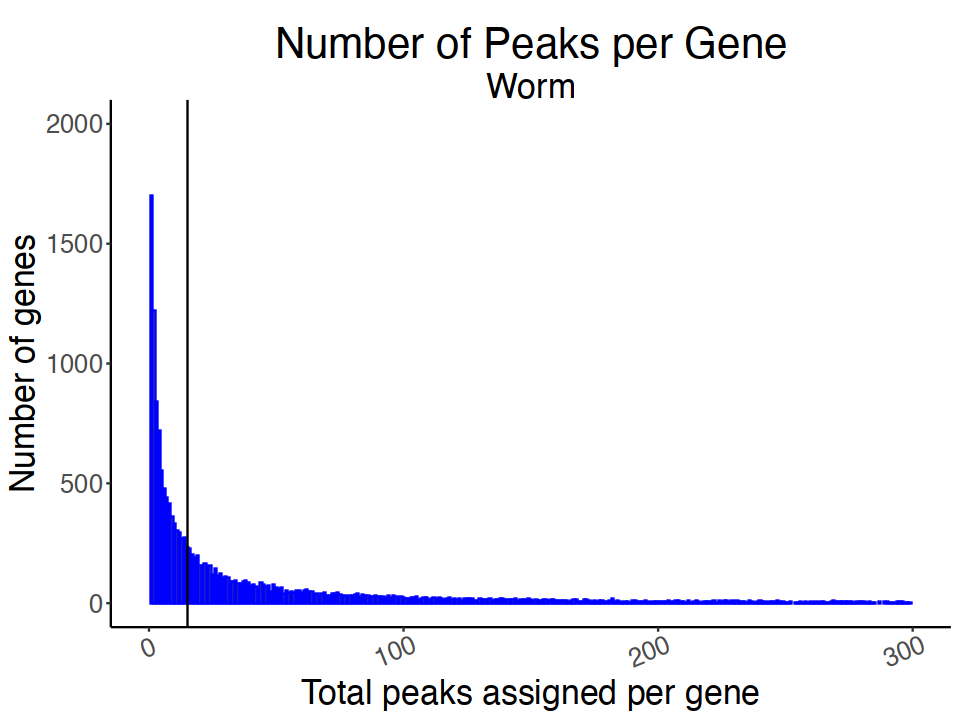

In [330]:
ggplot(peaks_per_gene, aes(x = tot_peaks)) +
geom_bar(color = "blue") + xlim(0, 300) + ylim(0, 2000) +
theme_classic() + 
  labs(
    title = "Number of Peaks per Gene",
      subtitle = "Worm",
    x = "Total peaks assigned per gene",
    y = "Number of genes"
  ) +
geom_vline(aes(xintercept=median(tot_peaks)) ) +
# xlab("Number of peaks per experiment") +
# ylab("Stage") +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 15, angle = 22, vjust = 0.9, hjust = 0.8), 
      axis.text.y= element_text(size = 15), axis.title= element_text(size = 20))


In [328]:
median(peaks_per_gene$tot_peaks)

[1] 15

In [331]:
fs4a = ggplot(peaks_per_gene, aes(x = tot_peaks)) +
geom_bar(color = "blue") + xlim(0, 300) + ylim(0, 2000) +
theme_classic() + 
  labs(
    title = "Number of Peaks per Gene",
      subtitle = "Worm",
    x = "Total peaks assigned per gene",
    y = "Number of genes"
  ) +
geom_vline(aes(xintercept=median(tot_peaks)) ) +
# xlab("Number of peaks per experiment") +
# ylab("Stage") +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 15, angle = 22, vjust = 0.9, hjust = 0.8), 
      axis.text.y= element_text(size = 15), axis.title= element_text(size = 20))

In [332]:
pdf("figures/Supplemental_figure_4a_worm_peaks_ger_gene.pdf", width = 8, height = 6)
print(fs4a)
dev.off()

png("figures/Supplemental_figure_4a_worm_peaks_ger_gene.png", width = 800, height = 600)
print(fs4a)
dev.off()

jpeg("figures/Supplemental_figure_4a_worm_peaks_ger_gene.jpg", width = 800, height = 600)
print(fs4a)
dev.off()

Warning message:
“Removed 568 rows containing non-finite values (`stat_count()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_bar()`).”


pdf 
  2

Warning message:
“Removed 568 rows containing non-finite values (`stat_count()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_bar()`).”


pdf 
  2

Warning message:
“Removed 568 rows containing non-finite values (`stat_count()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_bar()`).”


pdf 
  2

In [333]:
Sup_Figure4a = function(worm_peaks_TF){
    peaks_per_gene = worm_peaks_TF  %>% count(Gene)
    peaks_per_gene = peaks_per_gene  %>% rename("tot_peaks" = "n")
    
    median(peaks_per_gene$tot_peaks)
    options(repr.plot.width=8, repr.plot.height=6)
    
    fs4a = ggplot(peaks_per_gene, aes(x = tot_peaks)) +
geom_bar(color = "blue") + xlim(0, 300) + ylim(0, 2000) +
theme_classic() + 
  labs(
    title = "Number of Peaks per Gene",
      subtitle = "Worm",
    x = "Total peaks assigned per gene",
    y = "Number of genes"
  ) +
geom_vline(aes(xintercept=median(tot_peaks)) ) +
# xlab("Number of peaks per experiment") +
# ylab("Stage") +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 15, angle = 22, vjust = 0.9, hjust = 0.8), 
      axis.text.y= element_text(size = 15), axis.title= element_text(size = 20))
    
    pdf("figures/Supplemental_figure_4a_worm_peaks_ger_gene.pdf", width = 8, height = 6)
print(fs4a)
dev.off()

png("figures/Supplemental_figure_4a_worm_peaks_ger_gene.png", width = 800, height = 600)
print(fs4a)
dev.off()

jpeg("figures/Supplemental_figure_4a_worm_peaks_ger_gene.jpg", width = 800, height = 600)
print(fs4a)
dev.off()
    
    
}

In [334]:
save(worm_peaks_TF, peaks_per_gene, fs4a, Sup_Figure4a, file = "data/worm_figure_suppl_4a.RData")

## Figure 5  Is now Figure 6!

### Figure 5a

In [353]:
f5a <- ggplot(worm_peaks_TF  %>% filter(targetDist > -2000 & targetDist < 2000), aes(x=targetDist, color = "firebrick")) + 
  geom_density(show.legend = FALSE, size = 1.5)+
geom_vline(xintercept=0, linetype="dashed") + 
     labs(title="Peak proximity to TSS target",x="Distance of peak from nearest TSS", y = "Density") +

theme_classic() +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 15, angle = 22, vjust = 0.9, hjust = 0.8), 
      axis.text.y= element_text(size = 15), axis.title= element_text(size = 20))

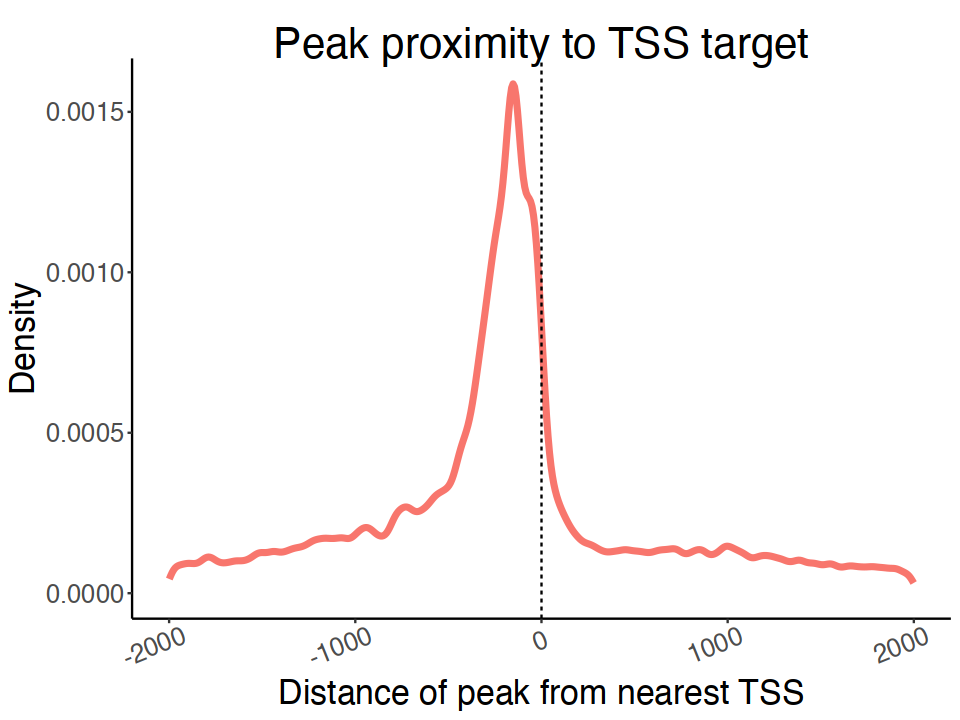

In [354]:
f5a

In [355]:
pdf("figures/Figure_5a_worm_peaks_distance.pdf", width = 8, height = 6)
print(f5a)
dev.off()

png("figures/Figure_5a_worm_peaks_distance.png", width = 800, height = 600)
print(f5a)
dev.off()

jpeg("figures/Figure_5a_worm_peaks_distance.jpg", width = 800, height = 600)
print(f5a)
dev.off()

pdf 
  2

pdf 
  2

pdf 
  2

In [359]:
figure5a = function(worm_peaks_TF){
    f5a <- ggplot(worm_peaks_TF  %>% filter(targetDist > -2000 & targetDist < 2000), aes(x=targetDist, color = "firebrick")) + 
  geom_density(show.legend = FALSE, size = 1.5)+
geom_vline(xintercept=0, linetype="dashed") + 
     labs(title="Peak proximity to TSS target",x="Distance of peak from nearest TSS", y = "Density") +

theme_classic() +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = -1),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 15, angle = 22, vjust = 0.9, hjust = 0.8), 
      axis.text.y= element_text(size = 15), axis.title= element_text(size = 20))
    
    pdf("figures/Figure_5a_worm_peaks_distance.pdf", width = 8, height = 6)
print(f5a)
dev.off()

png("figures/Figure_5a_worm_peaks_distance.png", width = 800, height = 600)
print(f5a)
dev.off()

jpeg("figures/Figure_5a_worm_peaks_distance.jpg", width = 800, height = 600)
print(f5a)
dev.off()
    
    
}

In [360]:
save(f5a, figure5a, file = "data/worm_figure_5a.RData")

### Figure 5c

In [349]:
cluster_nPeaks_genes = cluster_nPeaks_genes  %>% mutate(group =  ifelse(nPeaks == 1, "1",
                                        ifelse(nPeaks > 1 & nPeaks <=6, "2-6",
                                              ifelse(nPeaks > 6 & nPeaks <=30, "7-30",
                                                    ifelse(nPeaks > 30 & nPeaks <=84, "31-84",
                                                          ifelse(nPeaks > 84 & nPeaks <=240, "85-240",
                                                                ifelse(nPeaks > 240, "gt240", NA)))))))

In [350]:
cluster_nPeaks_genes$group = factor(cluster_nPeaks_genes$group, 
                                   levels = c("1", "2-6", "7-30", "31-84", "85-240", "gt240"  ))

In [356]:
f5b = ggplot(cluster_nPeaks_genes %>% filter(targetDist > -2000 & targetDist < 2000 & !is.na(group)), aes(x=targetDist, color = group)) + 
  geom_density(adjust = 1.4) +
geom_vline(xintercept=0, linetype="dashed") + 
     labs(title="Metapeak Occupancy vs 
Target distance",x="Distance of metapeak from nearest TSS", 
          y = "Density", color = "Occupancy") +
theme_classic() +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = 0.5),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 15, angle = 22, vjust = 0.9, hjust = 0.8), 
      axis.text.y= element_text(size = 15), axis.title= element_text(size = 20),
     legend.title = element_text(size=16),
     legend.text = element_text(size=12),) 

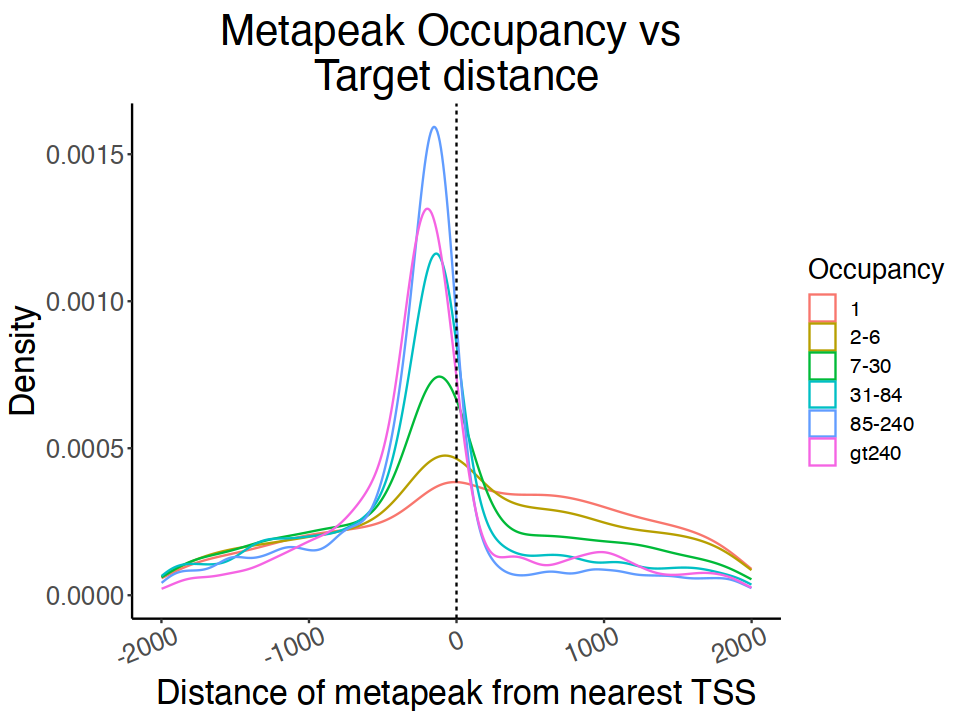

In [357]:
f5b

In [358]:
pdf("figures/Figure_5b_worm_metapeak_distance.pdf", width = 8, height = 6)
print(f5b)
dev.off()

png("figures/Figure_5b_worm_metapeak_distance.png", width = 800, height = 600)
print(f5b)
dev.off()

jpeg("figures/Figure_5b_worm_metapeak_distance.jpg", width = 800, height = 600)
print(f5b)
dev.off()

pdf 
  2

pdf 
  2

pdf 
  2

In [361]:
figure5b = function(worm_peaks_TF){
    cluster_nPeaks_genes = cluster_nPeaks_genes  %>% mutate(group =  ifelse(nPeaks == 1, "1",
                                        ifelse(nPeaks > 1 & nPeaks <=6, "2-6",
                                              ifelse(nPeaks > 6 & nPeaks <=30, "7-30",
                                                    ifelse(nPeaks > 30 & nPeaks <=84, "31-84",
                                                          ifelse(nPeaks > 84 & nPeaks <=240, "85-240",
                                                                ifelse(nPeaks > 240, "gt240", NA)))))))
    
    cluster_nPeaks_genes$group = factor(cluster_nPeaks_genes$group, 
                                   levels = c("1", "2-6", "7-30", "31-84", "85-240", "gt240"  ))
    
    f5b = ggplot(cluster_nPeaks_genes %>% filter(targetDist > -2000 & targetDist < 2000 & !is.na(group)), aes(x=targetDist, color = group)) + 
  geom_density(adjust = 1.4) +
geom_vline(xintercept=0, linetype="dashed") + 
     labs(title="Metapeak Occupancy vs 
Target distance",x="Distance of metapeak from nearest TSS", 
          y = "Density", color = "Occupancy") +
theme_classic() +
theme(plot.title = element_text( size = 25, face = "bold", hjust = 0.5, vjust = 0.5),
      plot.subtitle = element_text( size = 20, face = "bold", hjust = 0.5, vjust = -1),
    axis.text.x= element_text(size = 15, angle = 22, vjust = 0.9, hjust = 0.8), 
      axis.text.y= element_text(size = 15), axis.title= element_text(size = 20),
     legend.title = element_text(size=16),
     legend.text = element_text(size=12),) 
    
    pdf("figures/Figure_5b_worm_metapeak_distance.pdf", width = 8, height = 6)
print(f5b)
dev.off()

png("figures/Figure_5b_worm_metapeak_distance.png", width = 800, height = 600)
print(f5b)
dev.off()

jpeg("figures/Figure_5b_worm_metapeak_distance.jpg", width = 800, height = 600)
print(f5b)
dev.off()
}

In [362]:
save(f5b, figure5b, cluster_nPeaks_genes, file = "data/worm_figure_5a.RData")

In [8]:
load("data/worm_figure_5a.RData")

## Sup figure 5 
### Clusters per gene vs peaks per gene and housekeeping genes

In [363]:
cluster_nPeaks_genes  %>% head

,chromo,start,end,cluster,nPeaks,sign,apexS,apexE,color,Transcript,targetDist,Gene,group
,<chr>,<int>,<int>,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<int>,<chr>,<fct>
1,chrI,826,1041,2_narrowPeak1,2,.,931,935,"0,0,255",Y74C9A.3.1::3P,9297,homt-1,2-6
2,chrI,1521,1945,Singleton_1122,1,.,1731,1735,"0,0,0",Y74C9A.3.1::3P,8497,homt-1,1
3,chrI,1994,2072,Singleton_1548,1,.,2002,2006,"0,0,0",Y74C9A.3.1::3P,8226,homt-1,1
4,chrI,3437,4628,2_narrowPeak2,224,.,3899,3903,"0,255,0",Y74C9A.3.1::3P,6329,homt-1,85-240
5,chrI,8291,8824,2_narrowPeak3,5,.,8692,8696,"255,0,0",Y74C9A.3.1::I2,1536,homt-1,2-6
6,chrI,9107,9543,2_narrowPeak4,5,.,9317,9321,"0,0,255",Y74C9A.3.1::I2,911,homt-1,2-6


In [9]:
cluster_nPeaks_genes  %>% count(Gene)  %>% head
cluster_nPeaks_genes  %>% count(cluster, Gene)  %>% head
cluster_nPeaks_genes  %>% count(cluster, Gene, nPeaks)  %>% head

,Gene,n
,<chr>,<int>
1,2L52.1,2
2,AC3.5,3
3,AC7.3,5
4,AH10.2,3
5,AH10.4,4
6,AH9.1,2


,cluster,Gene,n
,<chr>,<chr>,<int>
1,10_narrowPeak10043,ric-7,1
2,10_narrowPeak10044,ric-7,1
3,10_narrowPeak10388,egas-1,1
4,10_narrowPeak10446,Y43F8B.2,1
5,10_narrowPeak10447,Y43F8B.2,1
6,10_narrowPeak10721,cebp-1,1


,cluster,Gene,nPeaks,n
,<chr>,<chr>,<int>,<int>
1,10_narrowPeak10043,ric-7,36,1
2,10_narrowPeak10044,ric-7,22,1
3,10_narrowPeak10388,egas-1,36,1
4,10_narrowPeak10446,Y43F8B.2,90,1
5,10_narrowPeak10447,Y43F8B.2,40,1
6,10_narrowPeak10721,cebp-1,20,1


In [10]:
cluster_nPeaks_genes  %>% count(cluster, Gene, nPeaks)  %>% 
    group_by(Gene)  %>% summarise(sum_peaks=sum(nPeaks))  %>% head
genes_peaks = cluster_nPeaks_genes  %>% count(cluster, Gene, nPeaks)  %>% 
    group_by(Gene)  %>% summarise(sum_peaks=sum(nPeaks)) 

Gene,sum_peaks
<chr>,<int>
2L52.1,15
AC3.5,15
AC7.3,21
AH10.2,28
AH10.4,196
AH9.1,7


In [375]:
cluster_nPeaks_genes  %>% count(cluster, Gene, nPeaks)  %>% filter(Gene == "AC7.3")

cluster,Gene,nPeaks,n
<chr>,<chr>,<int>,<int>
2_narrowPeak17856,AC7.3,3,1
2_narrowPeak17858,AC7.3,4,1
4_narrowPeak12006,AC7.3,9,1
4_narrowPeak12007,AC7.3,4,1
Singleton_686,AC7.3,1,1


In [11]:
gene_clusters = cluster_nPeaks_genes  %>% count(Gene)
gene_clusters = gene_clusters  %>% rename(clusters = n)

In [12]:
gene_clusters_peaksum = left_join(gene_clusters, genes_peaks, by = "Gene")

In [666]:
head(gene_clusters_peaksum)

,Gene,clusters,sum_peaks
,<chr>,<int>,<int>
1,2L52.1,2,15
2,AC3.5,3,15
3,AC7.3,5,21
4,AH10.2,3,28
5,AH10.4,4,196
6,AH9.1,2,7


In [13]:
library(ggrepel)

In [36]:
r = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters), label = Gene)  +
geom_point(color = "blue") +
        labs(title="Peaks vs metapeaks per target", x= "Peaks per target", y = "Metapeaks per target") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

In [37]:
r = r  + geom_text_repel(label = ifelse(gene_clusters_peaksum$clusters > 25 |
                                    log2(gene_clusters_peaksum$sum_peaks) > 10, 
                              gene_clusters_peaksum$Gene, NA), size = 6,
               hjust = 0, nudge_x = 0.05,
               check_overlap = TRUE) # check_overlap = TRUE

Warning message in geom_text_repel(label = ifelse(gene_clusters_peaksum$clusters > :
“Ignoring unknown parameters: `check_overlap`”


In [38]:
options(repr.plot.width=12, repr.plot.height=6)

Warning message:
“Removed 16270 rows containing missing values (`geom_text_repel()`).”
Warning message:
“ggrepel: 14 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


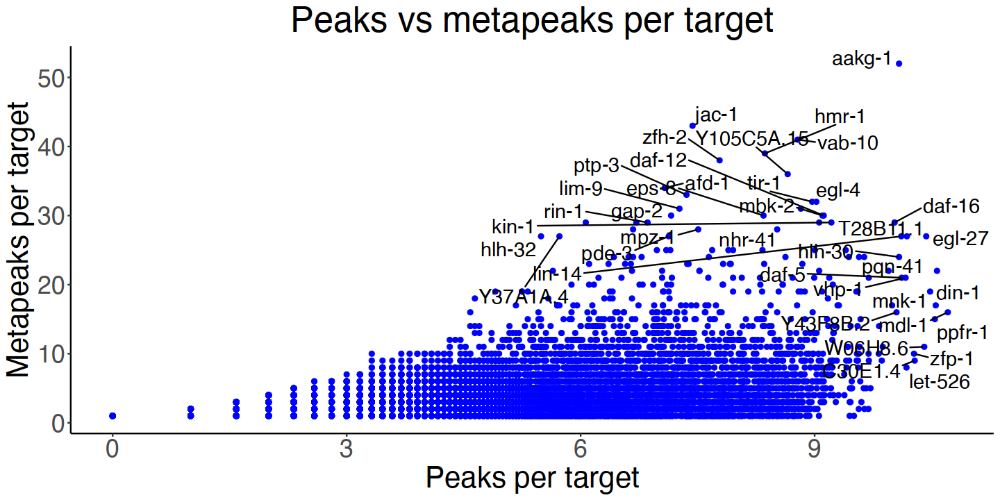

In [39]:
r

In [40]:
pdf("figures/Supplemental_Figure5a_worm_target_peaks_vs_metapeaks.pdf", width = 8, height = 6)
print(r)
dev.off()

png("figures/Supplemental_Figure5a_worm_target_peaks_vs_metapeaks.png", width = 800, height = 600)
print(r)
dev.off()

jpeg("figures/Supplemental_Figure5a_worm_target_peaks_vs_metapeaks.jpg", width = 800, height = 600)
print(r)
dev.off()

Warning message:
“Removed 16270 rows containing missing values (`geom_text_repel()`).”
Warning message:
“ggrepel: 14 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


pdf 
  2

Warning message:
“Removed 16270 rows containing missing values (`geom_text_repel()`).”
Warning message:
“ggrepel: 9 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


pdf 
  2

Warning message:
“Removed 16270 rows containing missing values (`geom_text_repel()`).”
Warning message:
“ggrepel: 9 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


pdf 
  2

In [41]:
ls()

[1] "cbbPalette12"          "cluster_nPeaks_genes"  "f2a"                  
 [4] "f5b"                   "figure2a"              "Figure3_worm_violin"  
 [7] "figure5b"              "gene_clusters"         "gene_clusters_peaksum"
[10] "genes_peaks"           "gt1lte6genes"          "gt240genes"           
[13] "gt30lte84genes"        "gt6lte30genes"         "gt84lte240genes"      
[16] "peaks_by_cluster_size" "r"                     "table2_function"      
[19] "target_numbers"        "TF_agg_plot2"          "wbg_hkg"              
[22] "worm_peaks_TF"         "ws245"

In [391]:
library(cowplot)

In [49]:
a = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters))  +
geom_point(aes(color = Gene %in% gt240genes), size = 0.1) +
labs(color = "gt240") +
theme_classic()

b = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters))  +
geom_point(aes(color = Gene %in% gt84lte240genes), size = 0.1) +
labs(color = "85_240") +
theme_classic()

c = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters))  +
geom_point(aes(color = Gene %in% gt30lte84genes), size = 0.1) +
labs(color = "31_84") +
theme_classic()

d = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters))  +
geom_point(aes(color = Gene %in% gt6lte30genes), size = 0.1) +
labs(color = "7_30") +
theme_classic()

e = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters))  +
geom_point(aes(color = Gene %in% gt1lte6genes), size = 0.1) +
labs(color = "1_6") +
theme_classic()

In [428]:
options(repr.plot.width=10, repr.plot.height=6)

### Plots of metapeak  groups

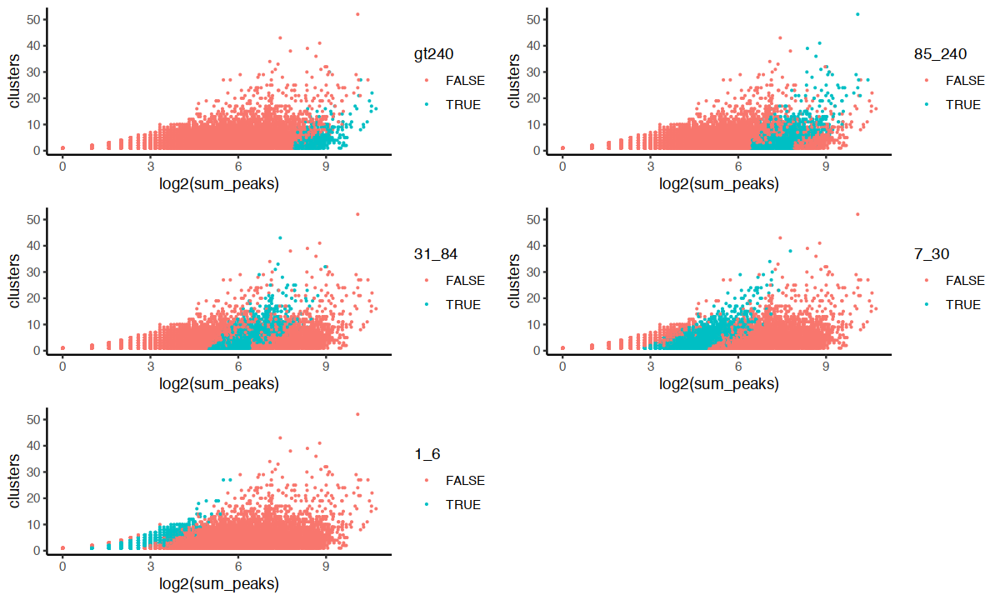

In [429]:
plot_grid(a, b, c, d, e,              # Draw grid of plots
          ncol = 2,
          align = "v")

In [708]:
hkg = c("act-2",
"aps-1",
"arf-1.2",
"arf-3",
"arx-3",
"asb-2",
"asg-1",
"asg-2",
"atp-2",
"atp-3",
"F23H11.5",
"cco-1",
"cct-5",
"cdc-42",
"cyn-7",
"daf-21",
"dlc-1",
"dli-1",
"dnc-2",
"dnj-12",
"dpy-30",
"eef-1A.2",
"fkb-6",
"fum-1",
"gsp-1",
"hrp-1",
"hsp-1",
"icd-1",
"iff-2",
"inf-1",
"isp-1",
"kin-3",
"kin-10",
"kin-19",
"let-60",
"let-70",
"let-92",
"let-754",
"lmn-1",
"lpd-5",
"mdh-2",
"mev-1",
"ntl-2",
"nuo-1",
"paa-1",
"pab-1",
"par-5",
"pas-2",
"pas-3",
"pas-4",
"pas-5",
"pas-6",
"pbs-1",
"pbs-2",
"pbs-3",
"pbs-4",
"pbs-5",
"pbs-6",
"pbs-7",
"plp-1",
"rab-1",
"rab-11.1",
"ran-1",
"rla-1",
"rla-2",
"rpl-1",
"rpl-2",
"rpl-3",
"rpl-4",
"rpl-5",
"rpl-6",
"rpl-7",
"rpl-7A",
"rpl-9",
"rpl-10",
"rpl-11.2",
"rpl-12",
"rpl-13",
"rpl-14",
"rpl-15",
"rpl-16",
"rpl-17",
"rpl-18",
"rpl-19",
"rpl-20",
"rpl-21",
"rpl-22",
"rpl-23",
"rpl-24.1",
"rpl-25.1",
"rpl-26",
"rpl-27",
"rpl-28",
"rpl-30",
"rpl-31",
"rpl-33",
"rpl-34",
"rpl-35",
"rpl-36",
"rpl-39",
"rpl-36.A",
"rpl-43",
"rpn-2",
"rpn-3",
"rpn-6.1",
"rpn-7",
"rpn-8",
"rps-0",
"rps-1",
"rps-2",
"rps-3",
"rps-4",
"rps-5",
"rps-6",
"rps-7",
"rps-9",
"rps-10",
"rps-11",
"rps-12",
"rps-13",
"rps-14",
"rps-15",
"rps-16",
"rps-17",
"rps-19",
"rps-20",
"rps-21",
"rps-22",
"rps-23",
"rps-25",
"rps-26",
"rps-27",
"rps-29",
"rpt-2",
"rpt-3",
"rpt-4",
"rpt-6",
"rsp-3",
"rsp-6",
"skr-1",
"spk-1",
"syx-5",
"sdhb-1",
"ant-1.1",
"tbb-1",
"uba-1",
"ubc-13",
"ubl-1",
"ubq-1",
"ubq-2",
"wwp-1",
"B0491.5",
"atp-5",
"pfd-1",
"C18E9.2",
"C18E9.4",
"C33A12.1",
"pyp-1",
"ril-1",
"D2030.4",
"eif-2A",
"f01G4.6",
"eef-1G",
"f21D5.7",
"nduf-6",
"dlat-1",
"ndk-1",
"tct-1",
"pyk-1",
"F26E4.6",
"F27D4.1",
"F36A2.7",
"idha-1",
"F44E5.1",
"F44G4.2",
"cope-1",
"F54C8.4",
"ddx-17",
"F59C6.5",
"copz-1",
"math-33",
"H28O16.1",
"rack-1",
"eif-2beta",
"dld-1",
"M01F1.3",
"chch-3",
"R04F11.2",
"R53.4",
"chc-1",
"nuo-6",
"W01D2.1",
"W09C5.8",
"nduf-7",
"pap-1",
"cco-2",
"vps-2",
"Y51H1A.3",
"nuo-3",
"kdp-1",
"ZK809.3",
"C14B9.10",
"C16A3.5",
"tiar-1",
"C34B2.8",
"C34B2.10",
"hecd-1",
"C37A2.7",
"C37C3.2",
"vps-32.1",
"akir-1",
"cyc-2.1",
"F23C8.5",
"did-2",
"F29B9.11",
"F29C4.2",
"hpo-18",
"F32D1.5",
"F37C12.3",
"F42G8.10",
"mtch-1",
"eef-1B.1",
"ucr-1",
"F58F12.1",
"eif-1.A",
"nuo-4",
"acdh-3",
"K08D12.3",
"sgt-1",
"T02H6.11",
"clic-1",
"atp-4",
"cct-7",
"nuo-2",
"T20B12.7",
"ogdh-1",
"eif-1",
"cytb-5.2",
"dlst-1",
"Y37E3.8",
"Y53G8AL.2",
"icd-2",
"Y69A2AR.18",
"Y71H2AM.5",
"Y82E9BR.3",
"ZC395.10",
"sar-1",
"snu-23")

In [14]:
wbg_hkg = read_tsv("~/network\ downloads/gene_name_sanitizer_results.txt")

Rows: 248 Columns: 10
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (9): Input, Status, Suggested Match, Public Name For, Sequence Name For,...
lgl (1): Merged Into

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [704]:
head(wbg_hkg)

Input,Status,Suggested Match,Public Name For,Sequence Name For,Molecular Name For,Other Name For,Split Into,Merged Into,History
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<chr>
act-2,Live - Unique,WBGene00000064,WBGene00000064,NA,NA,NA,NA,NA,Public name for WBGene00000064. History: N.A.
aps-1,Live - Unique,WBGene00000159,WBGene00000159,NA,NA,NA,NA,NA,Public name for WBGene00000159. History: N.A.
arf-1.2,Live - Unique,WBGene00000182,NA,NA,NA,WBGene00000182,NA,NA,Other name for WBGene00000182(arf-1). History: Renamed on 2020-09-10
arf-3,Live - Unique,WBGene00000183,NA,NA,NA,WBGene00000183,NA,NA,Other name for WBGene00000183(arf-5). History: Renamed on 2020-09-10
arx-3,Live - Unique,WBGene00000201,WBGene00000201,NA,NA,NA,NA,NA,Public name for WBGene00000201. History: N.A.
asb-2,Live - Unique,WBGene00000207,WBGene00000207,NA,NA,NA,NA,NA,Public name for WBGene00000207. History: N.A.


In [706]:
head(ws245)

,Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Y110A7A.10,aap-1,WBGene00000001,Y110A7A.10,aap-1,WBGene00000001,aap-1,aap-1
2,F27C8.1,aat-1,WBGene00000002,F27C8.1,aat-1,WBGene00000002,aat-1,aat-1
3,F07C3.7,aat-2,WBGene00000003,F07C3.7,aat-2,WBGene00000003,aat-2,aat-2
4,F52H2.2,aat-3,WBGene00000004,F52H2.2,aat-3,WBGene00000004,aat-3,aat-3
5,T13A10.10,aat-4,WBGene00000005,T13A10.10,aat-4,WBGene00000005,aat-4,aat-4
6,C55C2.5,aat-5,WBGene00000006,C55C2.5,aat-5,WBGene00000006,aat-5,aat-5


In [42]:
hkg_285 = left_join(wbg_hkg  %>% select("Suggested Match", "Input"), 
                    ws245  %>% select("WBGene285", "Common285new"), by = c("Suggested Match" = "WBGene285"))

In [43]:
hkg_285  %>% dim
## the difference in the number found in the list (248) and the ones found 
## in cluster list must be from lack of peaks!!!

[1] 248   3

In [18]:
head(gene_clusters_peaksum)
hkg_285  %>% head()

,Gene,clusters,sum_peaks
,<chr>,<int>,<int>
1,2L52.1,2,15
2,AC3.5,3,15
3,AC7.3,5,21
4,AH10.2,3,28
5,AH10.4,4,196
6,AH9.1,2,7


Suggested Match,Input,Common285new
<chr>,<chr>,<chr>
WBGene00000064,act-2,act-2
WBGene00000159,aps-1,aps-1
WBGene00000182,arf-1.2,arf-1
WBGene00000183,arf-3,arf-5
WBGene00000201,arx-3,arx-3
WBGene00000207,asb-2,asb-2


In [44]:
left_join(hkg_285, gene_clusters_peaksum, by = c("Common285new" = "Gene"))  %>% filter(is.na(clusters))

Suggested Match,Input,Common285new,clusters,sum_peaks
<chr>,<chr>,<chr>,<int>,<int>
WBGene00000159,aps-1,aps-1,NA,NA
WBGene00000209,asg-1,asg-1,NA,NA
WBGene00000263,F23H11.5,F23H11.5,NA,NA
WBGene00000883,cyn-7,cyn-7,NA,NA
WBGene00003924,pas-3,pas-3,NA,NA
WBGene00004440,rpl-26,rpl-26,NA,NA
WBGene00004448,rpl-34,rpl-34,NA,NA
WBGene00004450,rpl-36,rpl-36,NA,NA
WBGene00004454,rpl-36.A,rpl-36.A,NA,NA


In [707]:
ls()

[1] "agg_subtitle"                        
  [2] "agg_totals"                          
  [3] "angle"                               
  [4] "angleCosine"                         
  [5] "BWM"                                 
  [6] "cbbPalette"                          
  [7] "cbbPalette11"                        
  [8] "cbbPalette12"                        
  [9] "cds_jp"                              
 [10] "ChIP_larvae_TFs"                     
 [11] "ChIP_lineage_TFs"                    
 [12] "ChIP_YA_TFs"                         
 [13] "classes"                             
 [14] "cluster_nPeaks"                      
 [15] "cluster_nPeaks_genes"                
 [16] "compare"                             
 [17] "entropy"                             
 [18] "eq1genes"                            
 [19] "Excretory"                           
 [20] "exp_matrix"                          
 [21] "exp_matrix_emb_mean"                 
 [22] "exp_matrix_L2"                       
 [23] "exp_matrix_L2_mean"                  
 [24] "exp_matrix_lineage"                  
 [25] "exp_matrix_lineage_mean"             
 [26] "exp_matrix_mean"                     
 [27] "exp_matrix_mean_copy"                
 [28] "exp_matrix_mean_order"               
 [29] "exp_matrix_YA"                       
 [30] "exp_matrix_YA_mean"                  
 [31] "expression_name_change"              
 [32] "f5b"                                 
 [33] "figure5b"                            
 [34] "file_name"                           
 [35] "fly_intervals"                       
 [36] "fly_values"                          
 [37] "g"                                   
 [38] "gen"                                 
 [39] "gen_exp"                             
 [40] "gene_clusters"                       
 [41] "gene_clusters_peaksum"               
 [42] "gene_entropies"                      
 [43] "gene_entropies_max_mean_median"      
 [44] "gene_entropies_max_mean_median_group"
 [45] "gene_max_mean_entropy"               
 [46] "gene_max_mean_median"                
 [47] "genes_peaks"                         
 [48] "Germline"                            
 [49] "gg_agg"                              
 [50] "gg_both"                             
 [51] "gg_tf"                               
 [52] "Glia"                                
 [53] "gt1lte6genes"                        
 [54] "gt240genes"                          
 [55] "gt30lte84genes"                      
 [56] "gt6lte30genes"                       
 [57] "gt84lte240genes"                     
 [58] "hkg_285"                             
 [59] "hkg_noCluster"                       
 [60] "hypodermis"                          
 [61] "Hypodermis"                          
 [62] "Intestine"                           
 [63] "L2_classes"                          
 [64] "lb"                                  
 [65] "lineage_classes"                     
 [66] "list_data"                           
 [67] "meso"                                
 [68] "Murray_class_names"                  
 [69] "Murray_names"                        
 [70] "Neuron_glia"                         
 [71] "Neurons"                             
 [72] "number_targets"                      
 [73] "p"                                   
 [74] "Pharynx"                             
 [75] "q"                                   
 [76] "r"                                   
 [77] "ranklb"                              
 [78] "rankub"                              
 [79] "Rectal"                              
 [80] "reorder_column_names"                
 [81] "Seam"                                
 [82] "sub_mat"                             
 [83] "t_tf_values"                         
 [84] "t_tf_values_row"                     
 [85] "ta"                                  
 [86] "table2_function"                     
 [87] "tar"                                 
 [88] "target_numbers"                      
 [89] "target_set"                        

In [45]:
hkg_noCluster = (left_join(hkg_285, gene_clusters_peaksum, 
                           by = c("Common285new" = "Gene"))  %>% filter(is.na(clusters)))$Input

In [46]:
worm_peaks_TF  %>% filter(Gene %in% hkg_noCluster)  %>% count(Gene)

Gene,n
<chr>,<int>
D2030.4,2
F23H11.5,1
R53.4,3
aps-1,47
asg-1,2
atp-5,9
cyn-7,12
eif-1,3
math-33,12


In [ ]:
comment = c(
"aps-1 bad gene model",
    "asg-1 shared large peak with mrsp-15",
    "F23H11.5 shared peak with bra-1",
    "cyn-7 shared large peak with bath-36",
    "pas-3 has fake gene Y110A7A.14.2 closer to peak, 57 bases away from tss!!"
    "rpl-26 shares broad peak with F28C6.6 IGR 290 bases",
    "rpl-34 shared large peak with ppm-1 700 bases aprat",
    "rpl-36.A shared large peak with nuo-1 700 bases",
    "rpl-43 shared a very broad peak with xrn-2"
    
)

In [21]:
worm_peaks_TF  %>% filter(cluster == "2_narrowPeak3213")

peakID,absDist,chromo.x,start.x,end.x,exp,score,strand.x,apexS.x,apexE.x,⋯,Transcript,TranscriptLoc,Gene,GeneLoc,GeneExons,TranscriptNo,UniqueGeneTSSs,GeneTranscripts,rank,TF
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
alr-1_OP362_L1larva_1chrI8691979:8692403,306,chrI,8691979,8692403,alr-1_OP362_L1larva_1,784,.,8692189,8692193,⋯,K07A12.7.2,E3,mrps-15,E4,9,1,2,2,0.08442504,alr-1
alr-1_OP362_L1larva_1chrI8692189:8692613,96,chrI,8692189,8692613,alr-1_OP362_L1larva_1,784,.,8692399,8692403,⋯,K07A12.7.2,I1,mrps-15,I2,9,1,2,2,0.02328967,alr-1
blmp-1_OP109_L1larva_1chrI8692460:8692816,16,chrI,8692460,8692816,blmp-1_OP109_L1larva_1,747,.,8692636,8692640,⋯,K07A12.7.1,5P,mrps-15,5P,9,2,2,2,0.17034814,blmp-1
ceh-82_OP212_L1larva_2chrI8692505:8692789,25,chrI,8692505,8692789,ceh-82_OP212_L1larva_2,1000,.,8692645,8692649,⋯,K07A12.7.1,5P,mrps-15,5P,9,2,2,2,0.21337127,ceh-82
ces-1_OP174_mixedstage_embryonic_1chrI8692411:8692851,9,chrI,8692411,8692851,ces-1_OP174_mixedstage_embryonic_1,991,.,8692629,8692633,⋯,K07A12.7.1,5P,mrps-15,5P,9,2,2,2,0.42695883,ces-1
dpl-1_OP105_L4larva_1chrI8692480:8692830,33,chrI,8692480,8692830,dpl-1_OP105_L4larva_1,1000,.,8692653,8692657,⋯,K07A12.7.1,5P,mrps-15,5P,9,2,2,2,0.45454545,dpl-1
dpl-1_YL425_L1larva_2chrI8692487:8692817,30,chrI,8692487,8692817,dpl-1_YL425_L1larva_2,1000,.,8692650,8692654,⋯,K07A12.7.1,5P,mrps-15,5P,9,2,2,2,0.54123007,dpl-1
dpl-1_YL448_L1larva_1chrI8692471:8692795,11,chrI,8692471,8692795,dpl-1_YL448_L1larva_1,1000,.,8692631,8692635,⋯,K07A12.7.1,5P,mrps-15,5P,9,2,2,2,0.41016949,dpl-1
dpl-1_YL507_youngadult_1chrI8692479:8692809,22,chrI,8692479,8692809,dpl-1_YL507_youngadult_1,1000,.,8692642,8692646,⋯,K07A12.7.1,5P,mrps-15,5P,9,2,2,2,0.49774775,dpl-1


In [735]:
f = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters))  +
geom_point(aes(color = Gene %in% hkg_285$Common285new), 
           size = ifelse(gene_clusters_peaksum$Gene %in% hkg, 2.5, 0.1),
          show.legend = FALSE) +
labs(color = "housekeeping genes") +
theme_classic()

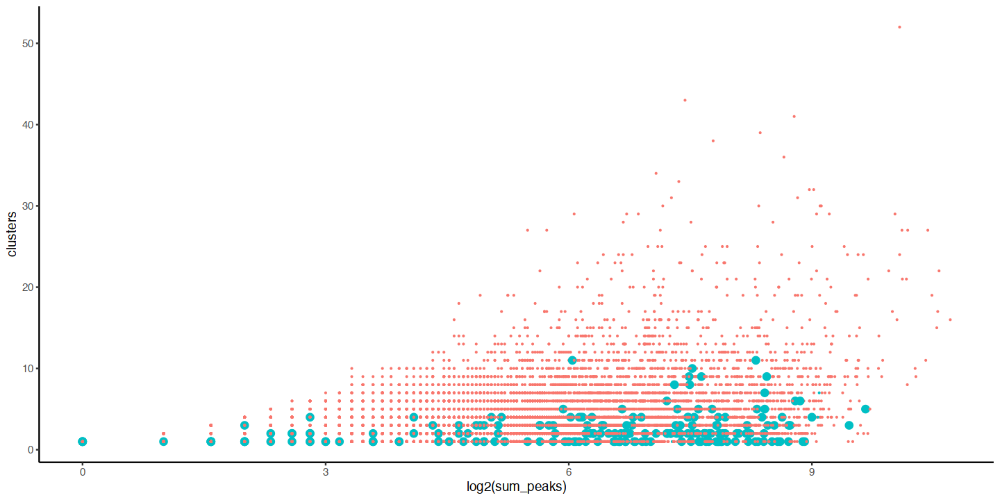

In [736]:
f

In [743]:
s = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters), label = Gene)  +
geom_point(aes(color = Gene %in% hkg_285$Common285new), 
           size = ifelse(gene_clusters_peaksum$Gene %in% hkg, 2.5, 0.2),
          show.legend = FALSE) +
        labs(title="Housekeeping genes have few metapeaks", x= "Peaks per target", y = "Metapeaks per target") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

In [744]:
s = s  + geom_text_repel(label = ifelse((gene_clusters_peaksum$clusters > 10 |
                                    log2(gene_clusters_peaksum$sum_peaks) > 9) &
                                     gene_clusters_peaksum$Gene %in% hkg_285$Common285new   , 
                              gene_clusters_peaksum$Gene, NA), size = 6,
               hjust = 0, nudge_x = 0.05,
               check_overlap = TRUE) # check_overlap = TRUE

Warning message in geom_text_repel(label = ifelse((gene_clusters_peaksum$clusters > :
“Ignoring unknown parameters: `check_overlap`”


In [1460]:
options(repr.plot.width=8, repr.plot.height=6)

Warning message:
“Removed 16308 rows containing missing values (`geom_text_repel()`).”


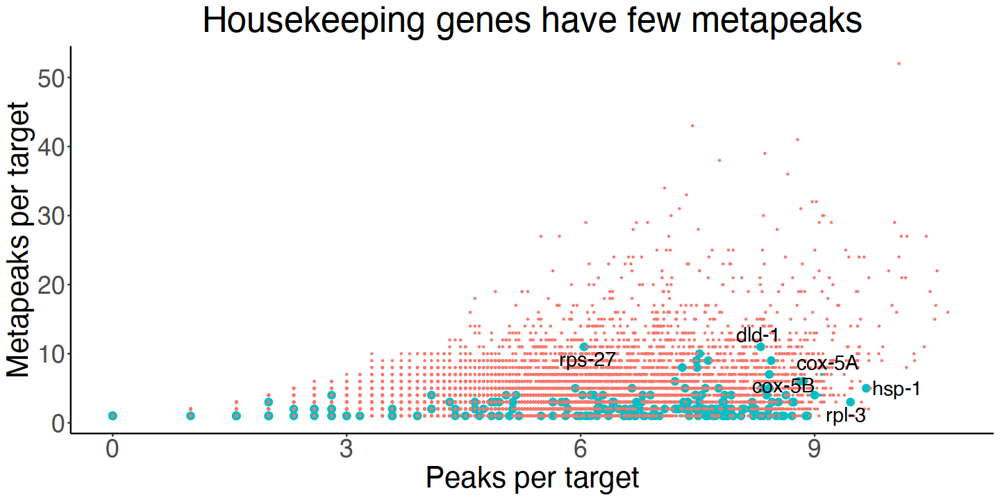

In [739]:
s

In [740]:
pdf("figures/Supplemental_Figure5c_worm_hkg_target_peaks_vs_metapeaks.pdf", width = 8, height = 6)
print(s)
dev.off()

png("figures/Supplemental_Figure5c_worm_hkg_target_peaks_vs_metapeaks.png", width = 800, height = 600)
print(s)
dev.off()

jpeg("figures/Supplemental_Figure5c_worm_hkg_target_peaks_vs_metapeaks.jpg", width = 800, height = 600)
print(s)
dev.off()

Warning message:
“Removed 16308 rows containing missing values (`geom_text_repel()`).”


pdf 
  2

Warning message:
“Removed 16308 rows containing missing values (`geom_text_repel()`).”


pdf 
  2

Warning message:
“Removed 16308 rows containing missing values (`geom_text_repel()`).”


pdf 
  2

### plot the targets with the most TSS's as in fly

In [50]:
worm_peaks_TF  %>% count(Gene, UniqueGeneTSSs)  %>% dim
worm_peaks_TF  %>% count(Gene, UniqueGeneTSSs)   %>% arrange(-UniqueGeneTSSs)  %>% head(20)

[1] 16822     3

,Gene,UniqueGeneTSSs,n
,<chr>,<dbl>,<int>
1,unc-43,20,508
2,hgap-2,18,114
3,spat-2,17,469
4,nurf-1,16,567
5,fln-2,15,133
6,gap-2,15,154
7,unc-62,15,547
8,ajm-1,14,459
9,egl-27,14,1381


In [51]:
complex_genes = (worm_peaks_TF  %>% count(Gene, UniqueGeneTSSs)   %>% 
                 arrange(-UniqueGeneTSSs)  %>% head(20))$Gene

In [52]:
t = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters), label = Gene)  +
geom_point(aes(color = Gene %in% complex_genes), 
           size = ifelse(gene_clusters_peaksum$Gene %in% complex_genes, 2.5, 0.2),
          show.legend = FALSE) +
        labs(title="Genes with multiple TSS's", x= "log2(Peaks per target)", y = "Metapeaks per target") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

In [53]:
t = t  + geom_text_repel(label = ifelse(
                                     gene_clusters_peaksum$Gene %in% complex_genes   , 
                              gene_clusters_peaksum$Gene, NA), size = 6,
               hjust = 0, nudge_x = 0.05,
               check_overlap = TRUE) # check_overlap = TRUE

Warning message in geom_text_repel(label = ifelse(gene_clusters_peaksum$Gene %in% :
“Ignoring unknown parameters: `check_overlap`”


Warning message:
“Removed 16294 rows containing missing values (`geom_text_repel()`).”


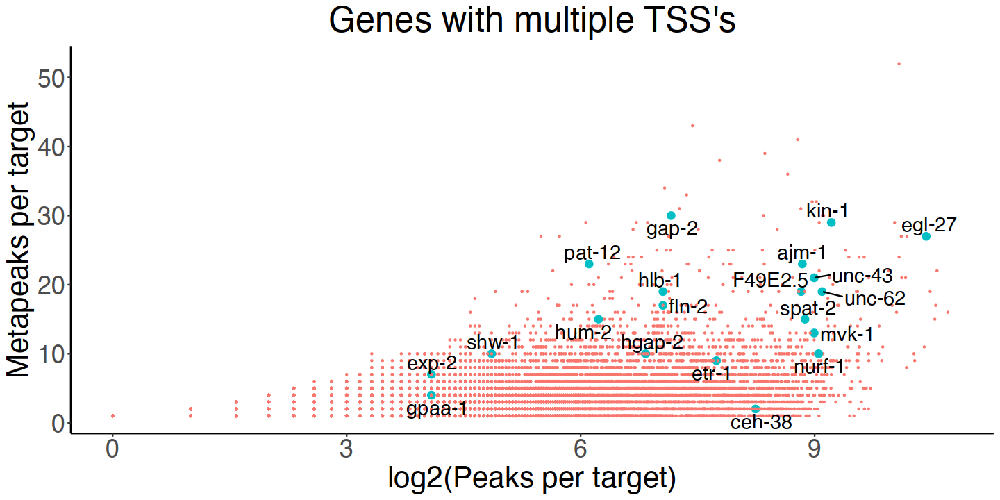

In [54]:
t

In [55]:
pdf("figures/Supplemental_Figure5d_worm_TSS_target_peaks_vs_metapeaks.pdf", width = 8, height = 6)
print(t)
dev.off()

png("figures/Supplemental_Figure5d_worm_TSS_target_peaks_vs_metapeaks.png", width = 800, height = 600)
print(t)
dev.off()

jpeg("figures/Supplemental_Figure5d_worm_TSS_target_peaks_vs_metapeaks.jpg", width = 800, height = 600)
print(t)
dev.off()

Warning message:
“Removed 16294 rows containing missing values (`geom_text_repel()`).”


pdf 
  2

Warning message:
“Removed 16294 rows containing missing values (`geom_text_repel()`).”


pdf 
  2

Warning message:
“Removed 16294 rows containing missing values (`geom_text_repel()`).”


pdf 
  2

In [57]:
complex_TF_genes = c("ceh-38", "daf-12", "daf-16", "dve-1", "egl-13", "egl-27", "egl-44", "gei-17", 
                  "hlh-30", "jun-1", "lir-1", "lsy-12", "nhr-179", "syd-9", "unc-62")

In [58]:
u = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters), label = Gene)  +
geom_point(aes(color = Gene %in% complex_TF_genes), 
           size = ifelse(gene_clusters_peaksum$Gene %in% complex_TF_genes, 2.5, 0.2),
          show.legend = FALSE) +
        labs(title="TFs with multiple metapeaks", x= "Peaks per target", y = "Metapeaks per target") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

In [59]:
u = u  + geom_text_repel(label = ifelse(
                                     gene_clusters_peaksum$Gene %in% complex_TF_genes   , 
                              gene_clusters_peaksum$Gene, NA), size = 6,
               hjust = 0, nudge_x = 0.05,
               check_overlap = TRUE) # check_overlap = TRUE

Warning message in geom_text_repel(label = ifelse(gene_clusters_peaksum$Gene %in% :
“Ignoring unknown parameters: `check_overlap`”


Warning message:
“Removed 16299 rows containing missing values (`geom_text_repel()`).”


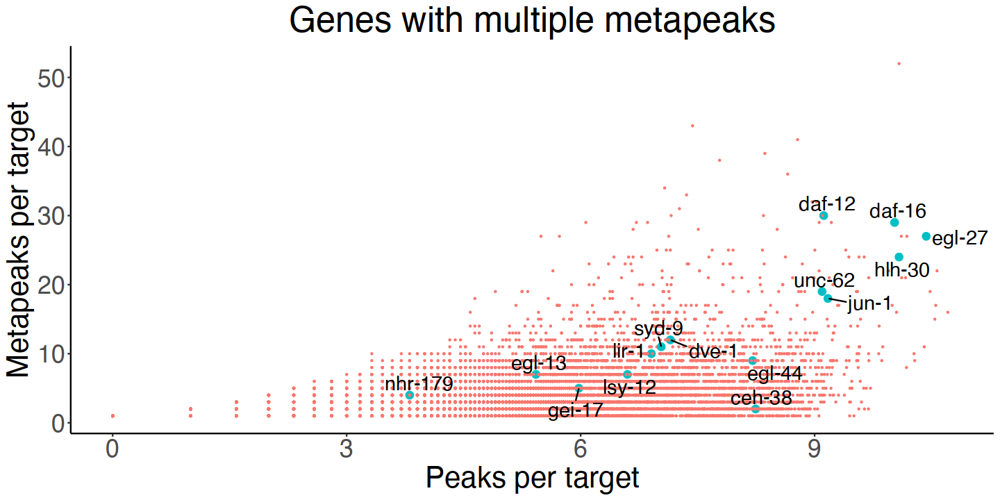

In [60]:
u

In [61]:
pdf("figures/Supplemental_Figure5f_worm_TF_target_peaks_vs_metapeaks.pdf", width = 8, height = 6)
print(u)
dev.off()

png("figures/Supplemental_Figure5f_worm_TF_target_peaks_vs_metapeaks.png", width = 800, height = 600)
print(u)
dev.off()

jpeg("figures/Supplemental_Figure5f_worm_TF_target_peaks_vs_metapeaks.jpg", width = 800, height = 600)
print(u)
dev.off()

Warning message:
“Removed 16299 rows containing missing values (`geom_text_repel()`).”


pdf 
  2

Warning message:
“Removed 16299 rows containing missing values (`geom_text_repel()`).”


pdf 
  2

Warning message:
“Removed 16299 rows containing missing values (`geom_text_repel()`).”


pdf 
  2

In [62]:
sf5_function = function(gene_clusters){
gene_clusters = cluster_nPeaks_genes  %>% count(Gene)
gene_clusters = gene_clusters  %>% rename(clusters = n)
gene_clusters_peaksum = left_join(gene_clusters, genes_peaks, by = "Gene")  
    
# do the plots of peaks versus cluster
    r = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters), label = Gene)  +
geom_point(color = "blue") +
        labs(title="Peaks vs metapeaks per target", x= "Peaks per target", y = "Metapeaks per target") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

    r = r  + geom_text_repel(label = ifelse(gene_clusters_peaksum$clusters > 25 |
                                    log2(gene_clusters_peaksum$sum_peaks) > 10, 
                              gene_clusters_peaksum$Gene, NA), size = 6,
               hjust = 0, nudge_x = 0.05,
               check_overlap = TRUE) # check_overlap = TRUE
    
    options(repr.plot.width=12, repr.plot.height=6)
    
    pdf("figures/Supplemental_Figure5a_worm_target_peaks_vs_metapeaks.pdf", width = 8, height = 6)
print(r)
dev.off()

png("figures/Supplemental_Figure5a_worm_target_peaks_vs_metapeaks.png", width = 800, height = 600)
print(r)
dev.off()

jpeg("figures/Supplemental_Figure5a_worm_target_peaks_vs_metapeaks.jpg", width = 800, height = 600)
print(r)
dev.off()
    
    # do housekeeping genes from Abbas
    wbg_hkg = read_tsv("~/network\ downloads/gene_name_sanitizer_results.txt")
    hkg_285 = left_join(wbg_hkg  %>% select("Suggested Match", "Input"), 
                        ws245  %>% select("WBGene285", "Common285new"), 
                        by = c("Suggested Match" = "WBGene285"))
    left_join(hkg_285, gene_clusters_peaksum, by = c("Common285new" = "Gene"))  %>% 
        filter(is.na(clusters))

    ## do plot of hkg   
    s = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters), label = Gene)  +
geom_point(aes(color = Gene %in% hkg_285$Common285new), 
           size = ifelse(gene_clusters_peaksum$Gene %in% hkg, 2.5, 0.2),
          show.legend = FALSE) +
        labs(title="Housekeeping genes have few metapeaks", x= "Peaks per target", y = "Metapeaks per target") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))
    
    s = s  + geom_text_repel(label = ifelse((gene_clusters_peaksum$clusters > 10 |
                                    log2(gene_clusters_peaksum$sum_peaks) > 9) &
                                     gene_clusters_peaksum$Gene %in% hkg_285$Common285new   , 
                              gene_clusters_peaksum$Gene, NA), size = 6,
               hjust = 0, nudge_x = 0.05,
               check_overlap = TRUE) # check_overlap = TRUE
    pdf("figures/Supplemental_Figure5c_worm_hkg_target_peaks_vs_metapeaks.pdf", width = 8, height = 6)
print(s)
dev.off()

png("figures/Supplemental_Figure5c_worm_hkg_target_peaks_vs_metapeaks.png", width = 800, height = 600)
print(s)
dev.off()

jpeg("figures/Supplemental_Figure5c_worm_hkg_target_peaks_vs_metapeaks.jpg", width = 800, height = 600)
print(s)
dev.off()
 
##    PLot the genes with lots of TSSs
    
    complex_genes = (worm_peaks_TF  %>% count(Gene, UniqueGeneTSSs)   %>% 
                 arrange(-UniqueGeneTSSs)  %>% head(20))$Gene
    
    t = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters), label = Gene)  +
geom_point(aes(color = Gene %in% complex_genes), 
           size = ifelse(gene_clusters_peaksum$Gene %in% complex_genes, 2.5, 0.2),
          show.legend = FALSE) +
        labs(title="Genes with multiple TSS's", x= "log2(Peaks per target)", y = "Metapeaks per target") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))
    
    t = t  + geom_text_repel(label = ifelse(
                                     gene_clusters_peaksum$Gene %in% complex_genes   , 
                              gene_clusters_peaksum$Gene, NA), size = 6,
               hjust = 0, nudge_x = 0.05,
               check_overlap = TRUE) # check_overlap = TRUE
    
    pdf("figures/Supplemental_Figure5d_worm_TSS_target_peaks_vs_metapeaks.pdf", width = 8, height = 6)
print(t)
dev.off()

png("figures/Supplemental_Figure5d_worm_TSS_target_peaks_vs_metapeaks.png", width = 800, height = 600)
print(t)
dev.off()

jpeg("figures/Supplemental_Figure5d_worm_TSS_target_peaks_vs_metapeaks.jpg", width = 800, height = 600)
print(t)
dev.off()
    # Plot complex TFs
    complex_TF_genes = c("ceh-38", "daf-12", "daf-16", "dve-1", "egl-13", "egl-27", "egl-44", "gei-17", 
                  "hlh-30", "jun-1", "lir-1", "lsy-12", "nhr-179", "syd-9", "unc-62")
    
u = ggplot(gene_clusters_peaksum, aes(x = log2(sum_peaks), y = clusters), label = Gene)  +
geom_point(aes(color = Gene %in% complex_TF_genes), 
           size = ifelse(gene_clusters_peaksum$Gene %in% complex_TF_genes, 2.5, 0.2),
          show.legend = FALSE) +
        labs(title="TFs with multiple metapeaks", x= "Peaks per target", y = "Metapeaks per target") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))
    
    u = u  + geom_text_repel(label = ifelse(
                                     gene_clusters_peaksum$Gene %in% complex_TF_genes   , 
                              gene_clusters_peaksum$Gene, NA), size = 6,
               hjust = 0, nudge_x = 0.05,
               check_overlap = TRUE) # check_overlap = TRUE
    
    pdf("figures/Supplemental_Figure5f_worm_TF_target_peaks_vs_metapeaks.pdf", width = 8, height = 6)
print(u)
dev.off()

png("figures/Supplemental_Figure5f_worm_TF_target_peaks_vs_metapeaks.png", width = 800, height = 600)
print(u)
dev.off()

jpeg("figures/Supplemental_Figure5f_worm_TF_target_peaks_vs_metapeaks.jpg", width = 800, height = 600)
print(u)
dev.off()
    
    }

In [63]:
save(cluster_nPeaks_genes, gene_clusters_peaksum, hkg_285, complex_genes, complex_TF_genes, sf5_function,
    file = "data/worm_supplemental_figure_5.RData")

## Figure 7 entropy vs metapeak size

In [47]:
ls()

[1] "cbbPalette12"          "cluster_nPeaks_genes"  "f2a"                  
 [4] "f5b"                   "figure2a"              "Figure3_worm_violin"  
 [7] "figure5b"              "gene_clusters"         "gene_clusters_peaksum"
[10] "genes_peaks"           "gt1lte6genes"          "gt240genes"           
[13] "gt30lte84genes"        "gt6lte30genes"         "gt84lte240genes"      
[16] "hkg_285"               "hkg_noCluster"         "peaks_by_cluster_size"
[19] "r"                     "table2_function"       "target_numbers"       
[22] "TF_agg_plot2"          "wbg_hkg"               "worm_peaks_TF"        
[25] "ws245"

In [48]:
## current version has the ws285 names
exp_matrix[row.names(exp_matrix) == "bcl-11", ]

ERROR: Error in eval(expr, envir, enclos): object 'exp_matrix' not found


In [119]:
gene_max_mean_median = exp_matrix  %>% as.data.frame   %>% rownames_to_column(var =  "gene")  %>% 
   rowwise()  %>% mutate(max_tpm = max(c_across(c(2:410))), 
                                       median_tpm = median(c_across(c(2:410))), 
                                       mean_tpm = mean(c_across(c(2:410))))  

In [120]:
head(gene_max_mean_median)

gene,ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,⋯,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650,max_tpm,median_tpm,mean_tpm
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aap-1,30.9,0.0,37.6,0.0,29.4,52.5,56.7,61.9,54.3,⋯,134.7,57.8,49.4,85.5,78.2,44.7,24.8,358.7,31.4,38.74328
aat-1,4.2,0.0,20.1,5.3,0.0,0.0,0.0,7.6,0.0,⋯,0.0,65.8,3.3,0.0,27.9,47.6,226.9,1924.1,1.2,54.79511
aat-2,60.6,18.4,235.4,10.6,188.8,21.5,334.9,483.5,195.8,⋯,0.0,0.0,0.0,206.6,23.6,30.8,29.7,1101.6,29.7,49.68704
aat-3,203.2,209.5,243.0,57.6,423.4,56.4,287.6,73.2,0.0,⋯,134.0,161.1,239.0,532.7,78.1,59.3,0.0,1813.6,89.5,148.44401
aat-4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.0,178.7,0.0,1.42934
aat-5,15.8,0.0,0.0,0.0,0.0,0.0,9.6,17.5,18.6,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.0,219.4,0.0,12.83790


In [121]:
gene_max_mean_median  %>% select(gene, max_tpm, mean_tpm, median_tpm) -> gene_max_mean_median

In [122]:
   entropy <- function(x){
      s <- sum(x)
      g <- 0
      for (i in 1:length(x)){
        if (x[i]!=0){
          p <- x[i]/s
          g <- g - p*log2(p)
        }
      }
       return(g)
        }

In [123]:
## calculate entropies
gene_entropies = data.frame("Entropy" = double())
for (gen in rownames(exp_matrix)) {
    gen_exp  = exp_matrix[gen, ]
    if(sum(gen_exp)){
g = entropy(gen_exp)
colnames(g) = c( "Entropy")
gene_entropies = rbind(gene_entropies,g)
    }
  #  print(gene_entropies)
}

In [344]:
dim((exp_matrix))

[1] 20048   409

In [345]:
log2(409)

[1] 8.675957

In [124]:
head(gene_entropies)

,Entropy
,<dbl>
aap-1,8.018875
aat-1,5.829583
aat-2,7.590198
aat-3,7.736375
aat-4,3.988438
aat-5,6.485724


In [125]:
gene_entropies  %>% rownames_to_column(var =  "gene") -> gene_entropies

In [126]:
left_join(gene_entropies, gene_max_mean_median, by = "gene")  -> gene_entropies_max_mean_median

In [127]:
gene_entropies_max_mean_median  %>% arrange(-Entropy )  %>% head
gene_entropies_max_mean_median  %>% arrange(Entropy )  %>% filter(max_tpm >100)  %>% head

,gene,Entropy,max_tpm,mean_tpm,median_tpm
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,ctc-2,8.601135,12684.7,5255.557,5252.9
2,nduo-6,8.591409,16607.3,6736.243,6449.3
3,ctc-1,8.575415,7837.1,3186.653,3125.1
4,ant-1.1,8.574877,10293.5,4134.403,4139.6
5,tos-1,8.567353,1735.1,721.791,731.0
6,nduo-1,8.558678,6303.0,2482.427,2349.2


,gene,Entropy,max_tpm,mean_tpm,median_tpm
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,srb-6,0.000000000,183.5,0.4486553,0
2,sri-65,0.000000000,115.1,0.2814181,0
3,str-211,0.000000000,115.3,0.2819071,0
4,T26H8.4,0.000000000,162.6,0.3975550,0
5,Y26G10.4,0.000000000,291.5,0.7127139,0
6,C08E8.6,0.006580387,187.0,0.4574572,0


In [640]:
ls()

[1] "agg_subtitle"                       
  [2] "agg_totals"                         
  [3] "angle"                              
  [4] "angleCosine"                        
  [5] "BWM"                                
  [6] "cbbPalette"                         
  [7] "cbbPalette11"                       
  [8] "cbbPalette12"                       
  [9] "cds_jp"                             
 [10] "ChIP_larvae_TFs"                    
 [11] "ChIP_lineage_TFs"                   
 [12] "ChIP_YA_TFs"                        
 [13] "classes"                            
 [14] "cluster_nPeaks"                     
 [15] "cluster_nPeaks_genes"               
 [16] "compare"                            
 [17] "entropy"                            
 [18] "eq1genes"                           
 [19] "Excretory"                          
 [20] "exp_matrix"                         
 [21] "exp_matrix_emb_mean"                
 [22] "exp_matrix_L2"                      
 [23] "exp_matrix_L2_mean"                 
 [24] "exp_matrix_lineage"                 
 [25] "exp_matrix_lineage_mean"            
 [26] "exp_matrix_mean"                    
 [27] "exp_matrix_mean_copy"               
 [28] "exp_matrix_mean_order"              
 [29] "exp_matrix_YA"                      
 [30] "exp_matrix_YA_mean"                 
 [31] "expression_name_change"             
 [32] "f5b"                                
 [33] "figure5b"                           
 [34] "file_name"                          
 [35] "fly_intervals"                      
 [36] "fly_values"                         
 [37] "g"                                  
 [38] "gen"                                
 [39] "gen_exp"                            
 [40] "gene_clusters"                      
 [41] "gene_clusters_peaksum"              
 [42] "gene_entropies"                     
 [43] "gene_entropies_max_mean_median"     
 [44] "gene_max_mean_entropy"              
 [45] "gene_max_mean_median"               
 [46] "genes_peaks"                        
 [47] "Germline"                           
 [48] "gg_agg"                             
 [49] "gg_both"                            
 [50] "gg_tf"                              
 [51] "Glia"                               
 [52] "gt1lte6genes"                       
 [53] "gt240genes"                         
 [54] "gt30lte84genes"                     
 [55] "gt6lte30genes"                      
 [56] "gt84lte240genes"                    
 [57] "hkg_285"                            
 [58] "hkg_noCluster"                      
 [59] "hypodermis"                         
 [60] "Hypodermis"                         
 [61] "Intestine"                          
 [62] "L2_classes"                         
 [63] "lb"                                 
 [64] "lineage_classes"                    
 [65] "list_data"                          
 [66] "meso"                               
 [67] "Murray_class_names"                 
 [68] "Murray_names"                       
 [69] "Neuron_glia"                        
 [70] "Neurons"                            
 [71] "number_targets"                     
 [72] "Pharynx"                            
 [73] "ranklb"                             
 [74] "rankub"                             
 [75] "Rectal"                             
 [76] "reorder_column_names"               
 [77] "Seam"                               
 [78] "sub_mat"                            
 [79] "t_tf_values"                        
 [80] "t_tf_values_row"                    
 [81] "ta"                                 
 [82] "table2_function"                    
 [83] "tar"                                
 [84] "target_numbers"                     
 [85] "target_set"                         
 [86] "tf"                                 
 [87] "TF_agg_L2_plot"                     
 [88] "TF_agg_lineage_plot"                
 [89] "TF_agg_plot"                        
 [90] "TF_agg_plot2"                       
 [91] "TF_agg_plot3"                      

In [128]:
gene_entropies_max_mean_median_group = gene_entropies_max_mean_median  %>% mutate(group = ifelse(gene %in% gt84lte240genes, "85-240", 
                                                     ifelse(gene %in% gt240genes, "gt240",
                                                            ifelse(gene %in% gt30lte84genes, "31-84",
                                                                   ifelse(gene %in% gt6lte30genes, "7-30",
                                                                          ifelse(gene %in% gt1lte6genes, "2-6",
                                                          "1"))))))

In [129]:
gene_entropies_max_mean_median_group$group = factor(gene_entropies_max_mean_median_group$group, 
                                                    levels = c("1", "2-6", "7-30", "31-84", 
                                                               "85-240", "gt240"))

In [130]:
p <- ggplot(gene_entropies_max_mean_median_group  %>% filter(Entropy > 0), 
                aes(x = group, y = Entropy,  fill = group)) + 
      geom_violin(show.legend = FALSE) +
      labs(title="Entropy vs metapeak occupancy", x= "Peaks per metapeak", y = "Entropy") +
    theme_classic() +
    theme(plot.title=element_text(hjust=0.5, size = 20), axis.title= element_text(size = 18),
         axis.text = element_text(size = 15))

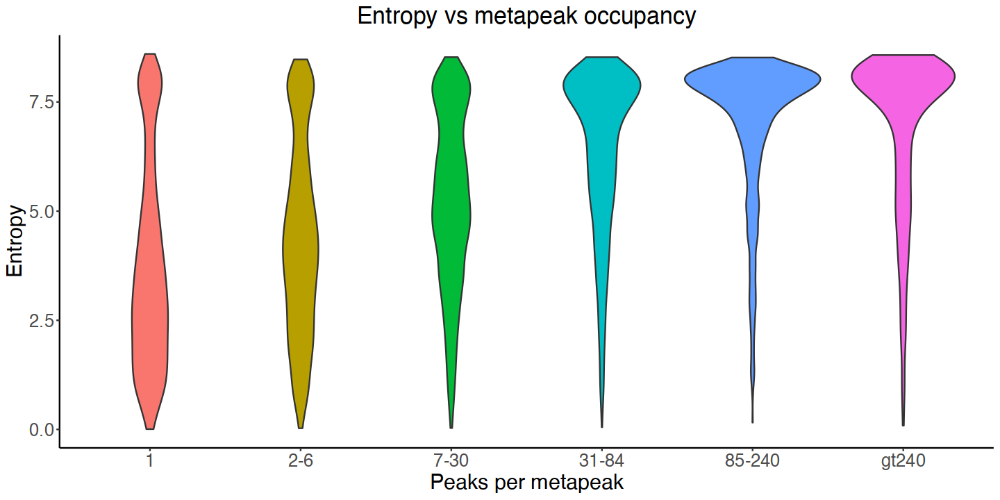

In [131]:
p

In [117]:
ls()

[1] "a"                                   "b"                                  
 [3] "c"                                   "cbbPalette12"                       
 [5] "cds_jp"                              "celltype_expr"                      
 [7] "cluster_nPeaks_genes"                "complex_genes"                      
 [9] "complex_TF_genes"                    "d"                                  
[11] "df_genes"                            "e"                                  
[13] "exp_matrix"                          "exp_matrix_emb_mean"                
[15] "exp_matrix_L2"                       "exp_matrix_L2_mean"                 
[17] "exp_matrix_lineage"                  "exp_matrix_lineage_mean"            
[19] "exp_matrix_mean"                     "exp_matrix_YA"                      
[21] "exp_matrix_YA_mean"                  "expression_name_change"             
[23] "f2a"                                 "f5b"                                
[25] "fig7_function"                       "figure2a"                           
[27] "Figure3_worm_violin"                 "figure5b"                           
[29] "gene_clusters"                       "gene_clusters_peaksum"              
[31] "genes_peaks"                         "gt1lte6genes"                       
[33] "gt240genes"                          "gt30lte84genes"                     
[35] "gt6lte30genes"                       "gt84lte240genes"                    
[37] "hkg_285"                             "hkg_noCluster"                      
[39] "peaks_by_cluster_size"               "r"                                  
[41] "sf5_function"                        "t"                                  
[43] "table2_function"                     "target_numbers"                     
[45] "temp"                                "TF_agg_plot2"                       
[47] "u"                                   "vector_angle_emb_2_noHOT_3_targets" 
[49] "vector_angle_emb_rank_0_targets"     "vector_angle_emb_rank_0.3_targets"  
[51] "vector_angle_emb_targets"            "vector_angle_L4_YA_rank_0_targets"  
[53] "vector_angle_L4_YA_targets"          "vector_angle_larvae_rank_0_targets" 
[55] "vector_angle_larvae_targets"         "vector_angle_lineage_rank_0_targets"
[57] "vector_angle_lineage_targets"        "vector_angles_all_worm"             
[59] "vector_angles_function"              "wbg_hkg"                            
[61] "worm_peaks_TF"                       "ws245"

In [653]:
q <- ggplot(gene_entropies_max_mean_median_group  %>% filter(Entropy > 0), 
                aes(x = group, y = Entropy,  fill = group)) +
geom_boxplot(show.legend = FALSE, notch = TRUE)+ 
        labs(title="Entropy vs metapeak occupancy", x= "Peaks per metapeak", y = "Entropy") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

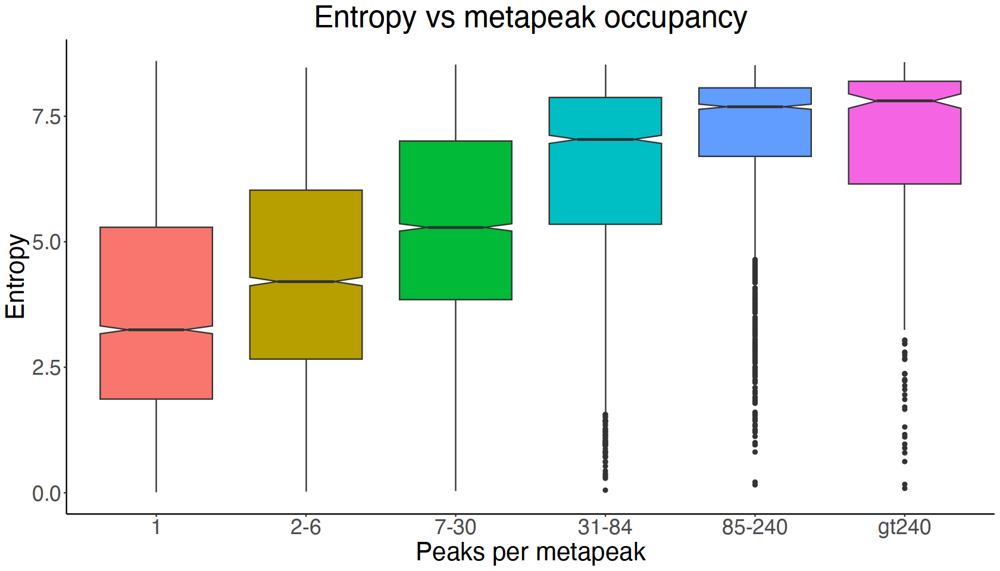

In [654]:
q

In [655]:
pdf("figures/Figure_7a_worm_metapeak_entropy.pdf", width = 8, height = 6)
print(q)
dev.off()

png("figures/Figure_7a_worm_metapeak_entropy.png", width = 800, height = 600)
print(q)
dev.off()

jpeg("figures/Figure_7a_worm_metapeak_entropy.jpg", width = 800, height = 600)
print(q)
dev.off()

pdf 
  2

pdf 
  2

pdf 
  2

In [341]:
gene_entropies_max_mean_median_group  %>%  head

,gene,Entropy,max_tpm,mean_tpm,median_tpm,group
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,aap-1,8.018875,358.7,38.74328,31.4,1
2,aat-1,5.829583,1924.1,54.79511,1.2,2-6
3,aat-2,7.590198,1101.6,49.68704,29.7,31-84
4,aat-3,7.736375,1813.6,148.44401,89.5,gt240
5,aat-4,3.988438,178.7,1.42934,0.0,1
6,aat-5,6.485724,219.4,12.83790,0.0,31-84


In [346]:
gene_entropies_max_mean_median_group  %>% mutate(norm_ent = Entropy/log2(409))      %>% head

,gene,Entropy,max_tpm,mean_tpm,median_tpm,group,norm_ent
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
1,aap-1,8.018875,358.7,38.74328,31.4,1,0.9242641
2,aat-1,5.829583,1924.1,54.79511,1.2,2-6,0.6719239
3,aat-2,7.590198,1101.6,49.68704,29.7,31-84,0.8748543
4,aat-3,7.736375,1813.6,148.44401,89.5,gt240,0.8917028
5,aat-4,3.988438,178.7,1.42934,0.0,1,0.4597116
6,aat-5,6.485724,219.4,12.83790,0.0,31-84,0.7475515


In [347]:
gene_entropies_max_mean_median_group = gene_entropies_max_mean_median_group  %>% mutate(norm_ent = Entropy/log2(409))

In [501]:
q <- ggplot(gene_entropies_max_mean_median_group  %>% filter(Entropy > 0), 
                aes(x = group, y = norm_ent,  fill = group)) +
geom_boxplot(show.legend = FALSE, notch = TRUE)+ 
        labs(title="Entropy vs metapeak occupancy", x= "Peaks per metapeak", y = "Normalized entropy") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

In [352]:
options()

$add.smooth
[1] TRUE

$ambiguousMethodSelection
function (cond) 
NULL
<environment: R_EmptyEnv>

$BioC
$Base
$urls
$urls$bioc
[1] "http://bioconductor.org"


$use.widgets
[1] FALSE

attr(,"class")
[1] "BioCPkg"

attr(,"class")
[1] "BioCOptions"

$bitmapType
[1] "cairo"

$browser
[1] "/usr/bin/open"

$browserNLdisabled
[1] FALSE

$callr.condition_handler_cli_message
function (msg) 
{
    custom_handler <- getOption("cli.default_handler")
    if (is.function(custom_handler)) {
        custom_handler(msg)
    }
    else {
        cli_server_default(msg)
    }
}
<bytecode: 0x7fd1614bc768>
<environment: namespace:cli>

$CBoundsCheck
[1] FALSE

$check.bounds
[1] FALSE

$citation.bibtex.max
[1] 1

$continue
[1] "+ "

$contrasts
        unordered           ordered 
"contr.treatment"      "contr.poly" 

$cpp11_preserve_xptr
<pointer: 0x7fd1648ff6d0>

$cpp11_should_unwind_protect
[1] TRUE

$crayon.enabled
[1] TRUE

$defaultPackages
[1] "datasets"  "utils"     "grDevices" "graphics"  "stats"     

In [354]:
options(repr.plot.width=10, repr.plot.height=8)

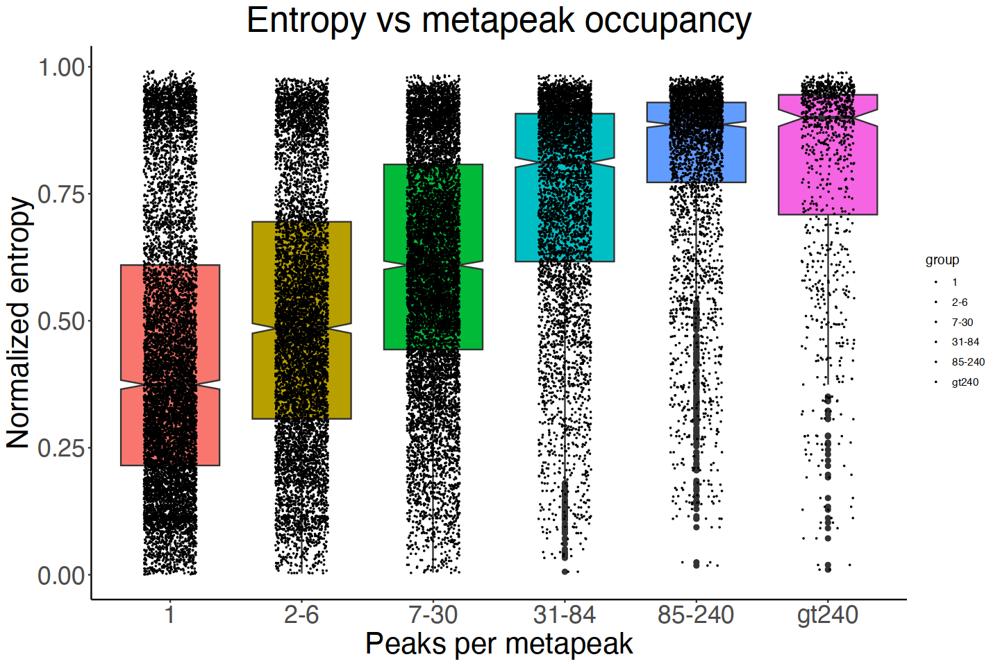

In [517]:
q + geom_jitter(shape=16, position=position_jitter(0.2), size = 0.4,  show.legend = FALSE)

In [503]:
q = q + geom_jitter(shape=16, position=position_jitter(0.2), size = 0.4)

In [518]:
q <- ggplot(gene_entropies_max_mean_median_group  %>% filter(Entropy > 0), 
                aes(x = group, y = norm_ent,  fill = group)) +
geom_boxplot(show.legend = FALSE, notch = TRUE)+ 
        labs(title="Entropy vs metapeak occupancy", x= "Peaks per metapeak", y = "Normalized entropy") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

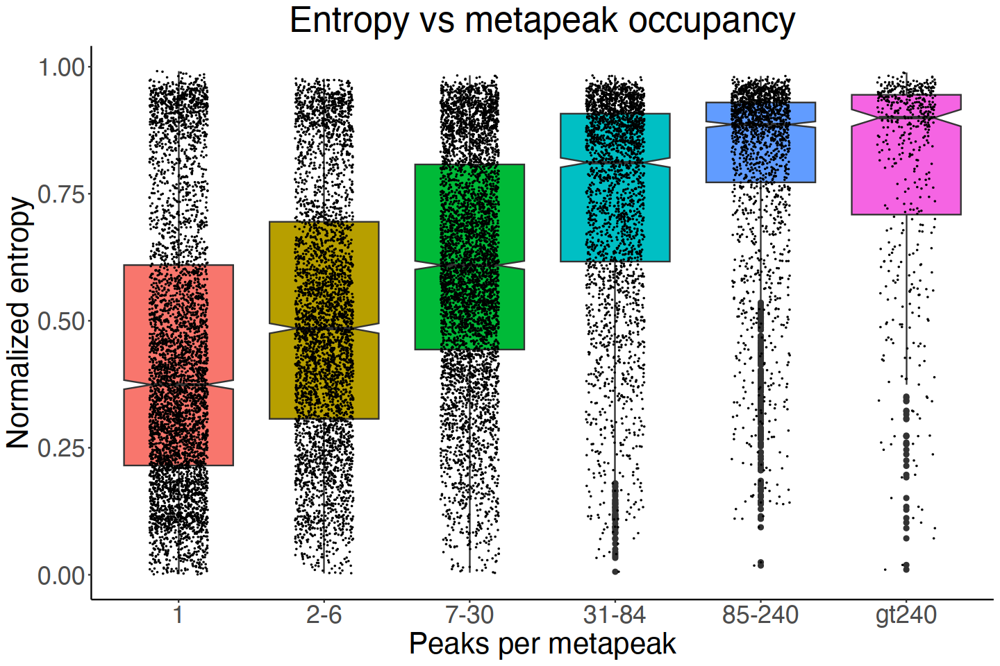

In [519]:
q + geom_jitter(shape=20, position=position_jitter(0.2), size = 0.1, show.legend = FALSE)

In [520]:
q = q + geom_jitter(shape=20, position=position_jitter(0.2), size = 0.1, show.legend = FALSE)

In [521]:
pdf("figures/Figure_7a_worm_metapeak_entropy.pdf", width = 8, height = 6)
print(q)
dev.off()

png("figures/Figure_7a_worm_metapeak_entropy.png", width = 800, height = 600)
print(q)
dev.off()

jpeg("figures/Figure_7a_worm_metapeak_entropy.jpg", width = 800, height = 600)
print(q)
dev.off()

pdf 
  2

pdf 
  2

pdf 
  2

In [359]:
fig7_function = function(exp_matrix){
    gene_max_mean_median = exp_matrix  %>% as.data.frame   %>% rownames_to_column(var =  "gene")  %>% 
   rowwise()  %>% mutate(max_tpm = max(c_across(c(2:410))), 
                                       median_tpm = median(c_across(c(2:86))), 
                                       mean_tpm = mean(c_across(c(2:86))))
    gene_max_mean_median  %>% select(gene, max_tpm, mean_tpm, median_tpm) -> gene_max_mean_median
    
    entropy <- function(x){
      s <- sum(x)
      g <- 0
      for (i in 1:length(x)){
        if (x[i]!=0){
          p <- x[i]/s
          g <- g - p*log2(p)
        }
      }
       return(g)
        }
    
    ## calculate teh entropies
     gene_entropies = data.frame("Entropy" = double())
for (gen in rownames(exp_matrix)) {
    gen_exp  = exp_matrix[gen, ]
    if(sum(gen_exp)){
g = entropy(gen_exp)
colnames(g) = c( "Entropy")
gene_entropies = rbind(gene_entropies,g)
    }
  #  print(gene_entropies)
}
    gene_entropies  %>% rownames_to_column(var =  "gene") -> gene_entropies
    
    left_join(gene_entropies, gene_max_mean_median, by = "gene")  -> gene_entropies_max_mean_median
    
    # add a column for the group
    gene_entropies_max_mean_median_group = gene_entropies_max_mean_median  %>% mutate(group = ifelse(gene %in% gt84lte240genes, "85-240", 
                                                     ifelse(gene %in% gt240genes, "gt240",
                                                            ifelse(gene %in% gt30lte84genes, "31-84",
                                                                   ifelse(gene %in% gt6lte30genes, "7-30",
                                                                          ifelse(gene %in% gt1lte6genes, "2-6",
                                                          "1"))))))
    # make factor with levels to keep order in plot
    gene_entropies_max_mean_median_group$group = factor(gene_entropies_max_mean_median_group$group, 
                                                    levels = c("1", "2-6", "7-30", "31-84", 
                                                               "85-240", "gt240"))
    
    # violin plot version not used
    # normalize the entropies so scale will be the same with fly 
    gene_entropies_max_mean_median_group = gene_entropies_max_mean_median_group  %>% 
                mutate(norm_ent = Entropy/log2(409))
    
    p <- ggplot(gene_entropies_max_mean_median_group  %>% filter(Entropy > 0), 
                aes(x = group, y = norm_ent,  fill = group)) + 
      geom_violin(show.legend = FALSE) +
      labs(title="Entropy vs metapeak occupancy", x= "Peaks per metapeak", y = "Normalized entropy") +
    theme_classic() +
    theme(plot.title=element_text(hjust=0.5, size = 20), axis.title= element_text(size = 18),
         axis.text = element_text(size = 15))
    
    # box plot version
    q <- ggplot(gene_entropies_max_mean_median_group  %>% filter(Entropy > 0), 
                aes(x = group, y = Entropy,  fill = group)) +
geom_boxplot(show.legend = FALSE, notch = TRUE)+ 
        labs(title="Entropy vs metapeak occupancy", x= "Peaks per metapeak", y = "Entropy") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))
    
    pdf("figures/Figure_7a_worm_metapeak_entropy.pdf", width = 8, height = 6)
print(q)
dev.off()

png("figures/Figure_7a_worm_metapeak_entropy.png", width = 800, height = 600)
print(q)
dev.off()

jpeg("figures/Figure_7a_worm_metapeak_entropy.jpg", width = 800, height = 600)
print(q)
dev.off()
}

In [360]:
save(exp_matrix, gene_entropies_max_mean_median, gene_entropies_max_mean_median_group, 
    fig7_function, file = "data/worm_figure_7.RData")

### Try tau to see what that shows

In [433]:
Tau <- function(in.df){
  # get the feature names over which the entropy is to be calculated
  features <- colnames(in.df) 
  
  # add a Gene column to the input data.frame, makes the rownames a column
  df <- mutate(in.df,Gene=row.names(in.df))  
  
  # transform the input data.frame into expanded form , 3 columns: Gene,Feature,Value
  df <- pivot_longer(df,all_of(features),names_to = "Feature",values_to = "Value")
  
  # total the values for each gene and attach as a column GeneMax to the expanded data.frame
  df <- group_by(df,Gene) %>% summarise(GeneMax=max(Value)) %>% left_join(df,by="Gene")
  
  # add a column of tau values for each individual feature,value
  df <- mutate(df,T = 1.0 -(Value/GeneMax) )
  
  # sum up the taus for each gene and return data.frame with two columns: Gene,Tau
  group_by(df,Gene) %>% summarise(Tau=sum(T)/(length(features)-1))
}

In [434]:
emb_tau = Tau(exp_matrix)

In [439]:
dim(emb_tau)
dim(gene_entropies_max_mean_median_group)

[1] 20048     2

[1] 18628     7

In [440]:
colnames(emb_tau)
colnames(gene_entropies_max_mean_median_group)

[1] "Gene" "Tau"

[1] "gene"       "Entropy"    "max_tpm"    "mean_tpm"   "median_tpm"
[6] "group"      "norm_ent"

In [441]:
gene_entropies_max_mean_median_group_tau = left_join(gene_entropies_max_mean_median_group, emb_tau, by = c("gene" = "Gene"))

In [442]:
q <- ggplot(gene_entropies_max_mean_median_group_tau, 
                aes(x = group, y = Tau,  fill = group)) +
geom_boxplot(show.legend = FALSE, notch = TRUE)+ 
        labs(title="Tau vs metapeak occupancy", x= "Peaks per metapeak", y = "Tau") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

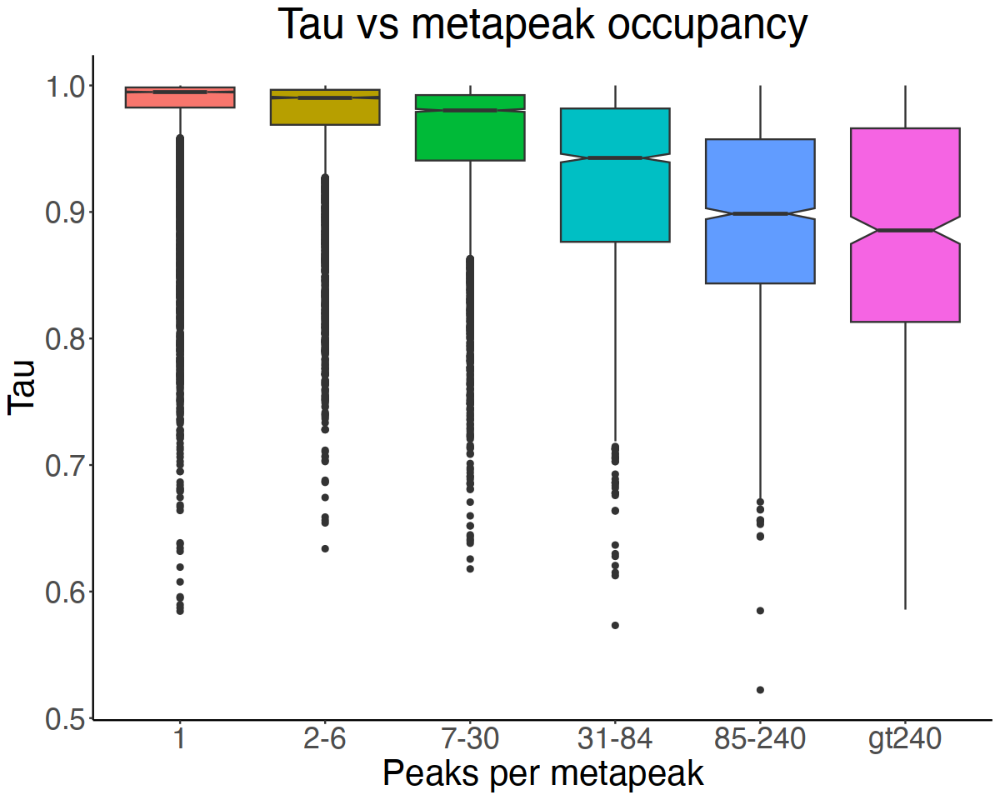

In [443]:
q

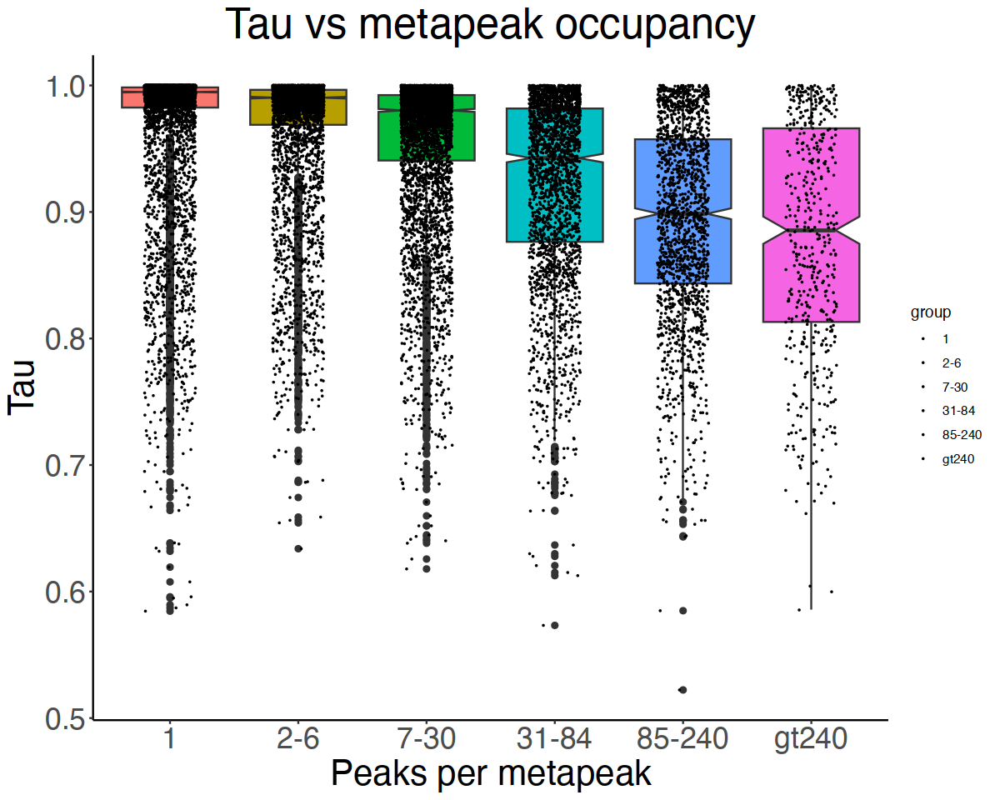

In [446]:
q + geom_jitter(shape=16, position=position_jitter(0.2), size = 0.4)

In [448]:
head(cluster_nPeaks_genes)

,chromo,start,end,cluster,nPeaks,sign,apexS,apexE,color,Transcript,targetDist,Gene,group
,<chr>,<int>,<int>,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<int>,<chr>,<fct>
1,chrI,826,1041,2_narrowPeak1,2,.,931,935,"0,0,255",Y74C9A.3.1::3P,9297,homt-1,2-6
2,chrI,1521,1945,Singleton_1122,1,.,1731,1735,"0,0,0",Y74C9A.3.1::3P,8497,homt-1,1
3,chrI,1994,2072,Singleton_1548,1,.,2002,2006,"0,0,0",Y74C9A.3.1::3P,8226,homt-1,1
4,chrI,3437,4628,2_narrowPeak2,224,.,3899,3903,"0,255,0",Y74C9A.3.1::3P,6329,homt-1,85-240
5,chrI,8291,8824,2_narrowPeak3,5,.,8692,8696,"255,0,0",Y74C9A.3.1::I2,1536,homt-1,2-6
6,chrI,9107,9543,2_narrowPeak4,5,.,9317,9321,"0,0,255",Y74C9A.3.1::I2,911,homt-1,2-6


In [449]:
genes_peaks = cluster_nPeaks_genes  %>% count(cluster, Gene, nPeaks)  %>% 
    group_by(Gene)  %>% summarise(sum_peaks=sum(nPeaks))

In [451]:
peaks_per_gene = worm_peaks_TF  %>% count(Gene) 

In [456]:
peaks_per_gene = peaks_per_gene  %>% rename("nPeaks" = "n")

In [457]:
gene_entropies_max_mean_median_group_tau_peaks = left_join(gene_entropies_max_mean_median_group_tau, 
                                                          peaks_per_gene, by = c("gene" = "Gene"))

In [458]:
gene_entropies_max_mean_median_group_tau_peaks_clusters = 
            left_join(gene_entropies_max_mean_median_group_tau_peaks, 
                                                          gene_clusters_peaksum, by = c("gene" = "Gene"))

In [459]:
q <- ggplot(gene_entropies_max_mean_median_group_tau_peaks, 
                aes(x = (nPeaks), y = Entropy,  fill = group)) +
geom_point(show.legend = FALSE, size = 0.2, stroke = 0.06)+ 
        labs(title="Entropy vs peaks", x= "Peaks per gene", y = "Entropy") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

Warning message:
“Removed 2805 rows containing missing values (`geom_point()`).”


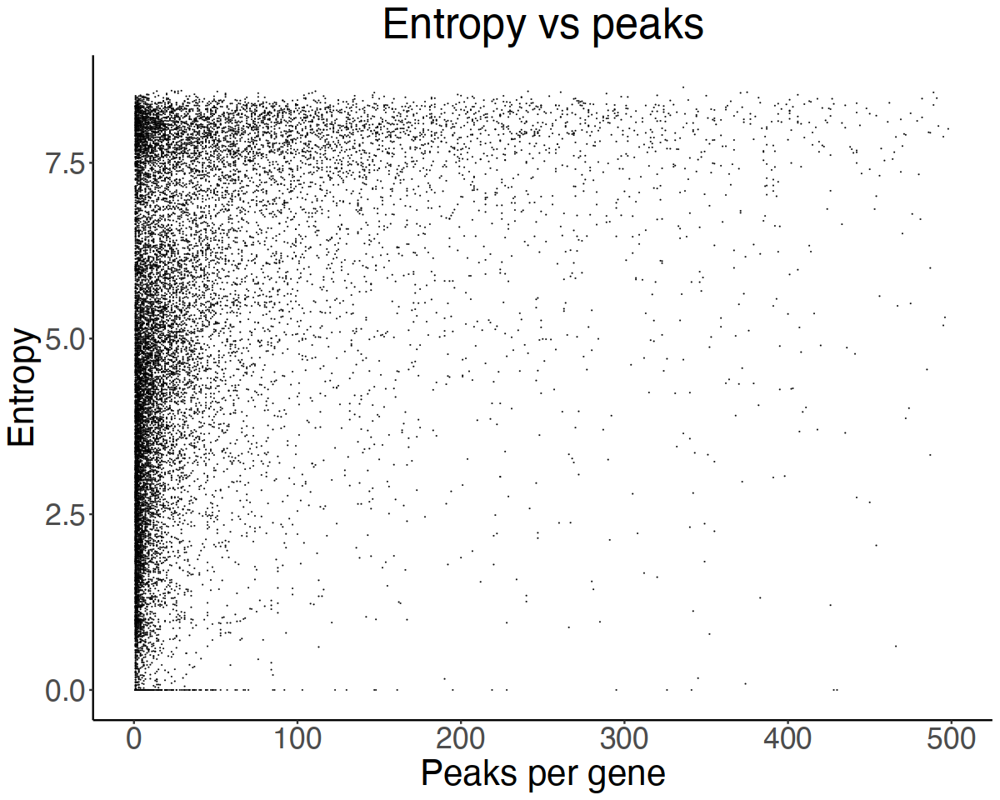

In [461]:
q + xlim(0, 500)

In [462]:
q <- ggplot(gene_entropies_max_mean_median_group_tau_peaks, 
                aes(x = (nPeaks), y = Tau,  fill = group)) +
geom_point(show.legend = FALSE, size = 0.2, stroke = 0.06)+ 
        labs(title="Tau vs peaks", x= "Peaks per gene", y = "Tau") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

Warning message:
“Removed 2805 rows containing missing values (`geom_point()`).”


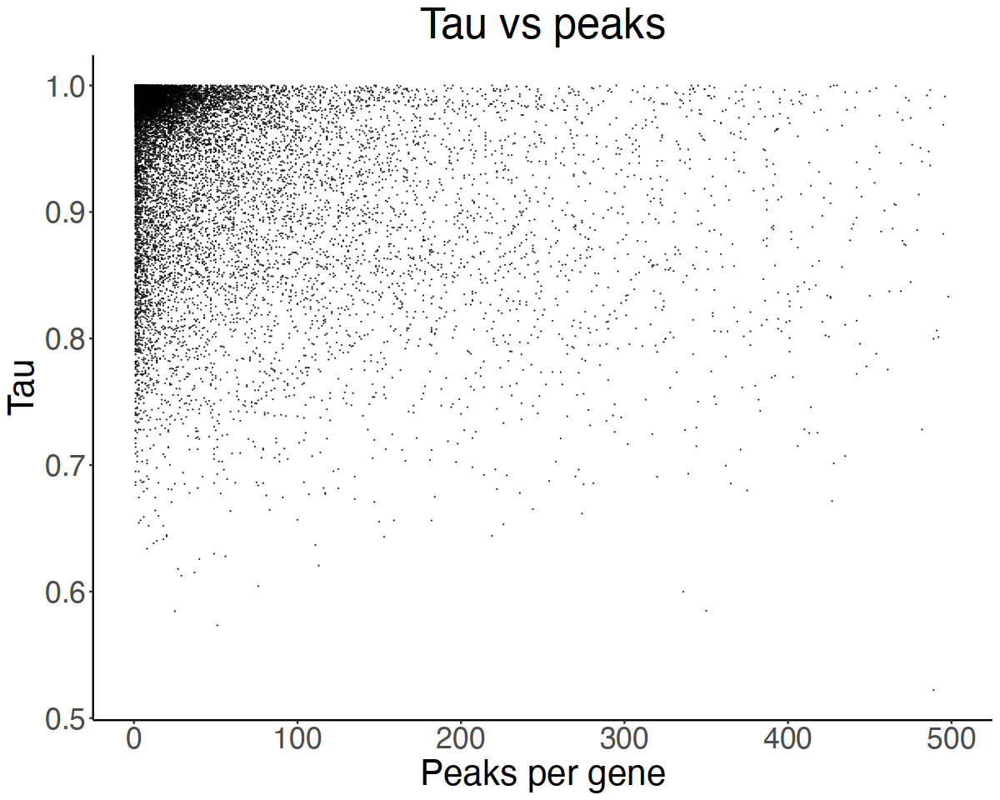

In [463]:
q + xlim(0, 500)

In [464]:
gene_entropies_max_mean_median_group_tau_peaks_clusters = 
            left_join(gene_entropies_max_mean_median_group_tau_peaks, 
                                                          gene_clusters_peaksum, by = c("gene" = "Gene"))

In [465]:
q <- ggplot(gene_entropies_max_mean_median_group_tau_peaks_clusters, 
                aes(x = clusters, y = Tau,  fill = group)) +
geom_point(show.legend = FALSE, size = 0.2, stroke = 0.06)+ 
        labs(title="Tau vs clusters", x= "clusters per gene", y = "Tau") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

Warning message:
“Removed 3137 rows containing missing values (`geom_point()`).”


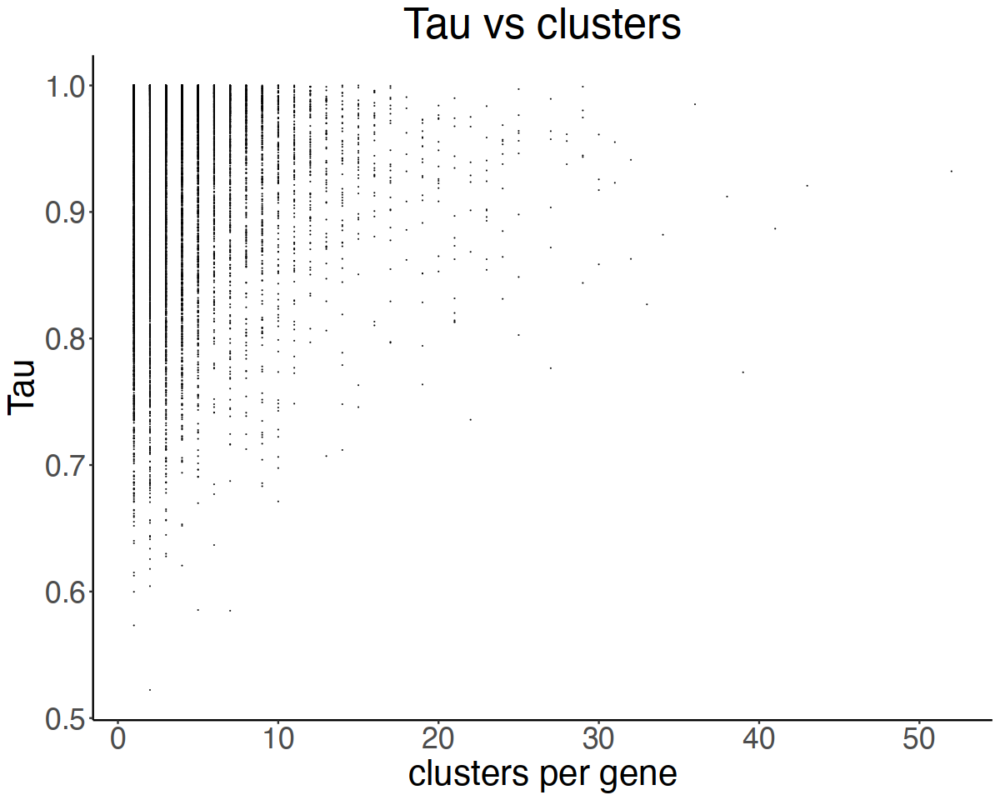

In [466]:
q

In [467]:
q <- ggplot(gene_entropies_max_mean_median_group_tau_peaks_clusters, 
                aes(x = clusters, y = Entropy,  fill = group)) +
geom_point(show.legend = FALSE, size = 0.2, stroke = 0.06)+ 
        labs(title="Entropy vs clusters", x= "clusters per gene", y = "Entropy") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

Warning message:
“Removed 3137 rows containing missing values (`geom_point()`).”


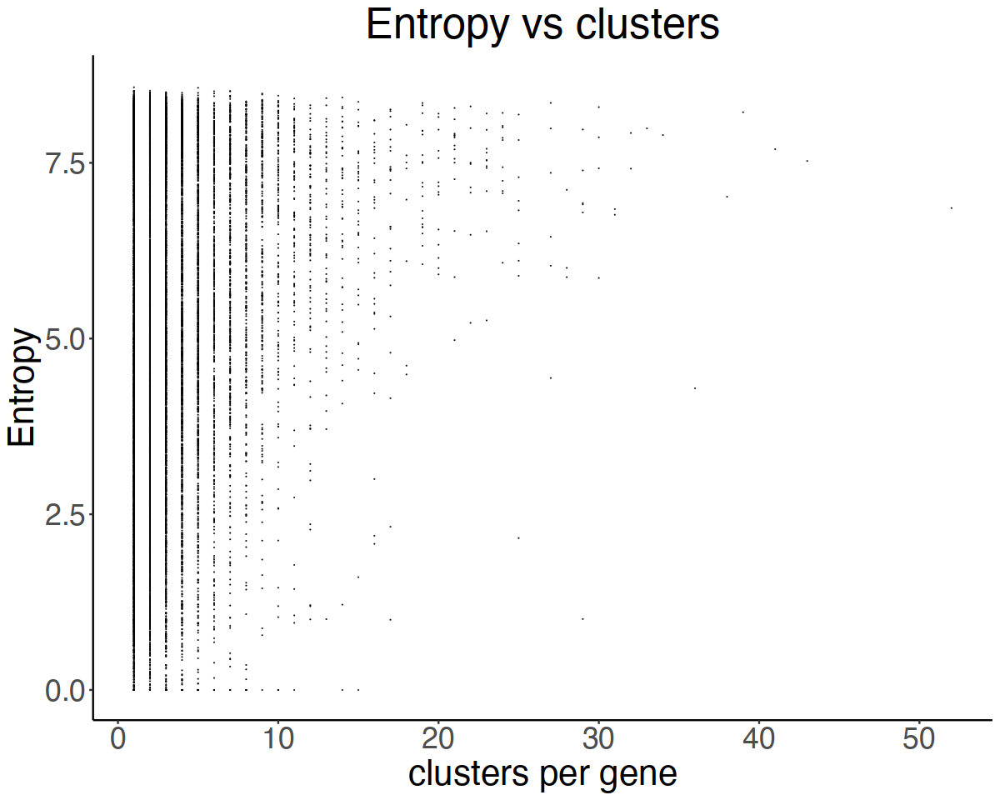

In [468]:
q

In [469]:
gene_max = cluster_nPeaks_genes  %>% count(cluster, Gene, nPeaks)  %>% 
    group_by(Gene)  %>% summarise(max_peaks=max(nPeaks)) 

In [470]:
gene_median = cluster_nPeaks_genes  %>% count(cluster, Gene, nPeaks)  %>% 
    group_by(Gene)  %>% summarise(median_peaks=median(nPeaks)) 

In [471]:
gene_entropies_max_mean_median_group_tau_peaks_clusters_max = left_join(
gene_entropies_max_mean_median_group_tau_peaks_clusters, gene_max, by = c("gene" = "Gene"))

In [472]:
gene_entropies_max_mean_median_group_tau_peaks_clusters_max_med = left_join(
gene_entropies_max_mean_median_group_tau_peaks_clusters_max, gene_median, by = c("gene" = "Gene"))

In [486]:
q <- ggplot(gene_entropies_max_mean_median_group_tau_peaks_clusters_max, 
                aes(x = max_peaks, y = Entropy,  fill = group)) +
geom_point(show.legend = FALSE, size = 0.5, stroke = 0.16)+ 
        labs(title="Entropy vs max_peaks", x= "max_peaks per gene", y = "Entropy") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

Warning message:
“Removed 3154 rows containing missing values (`geom_point()`).”


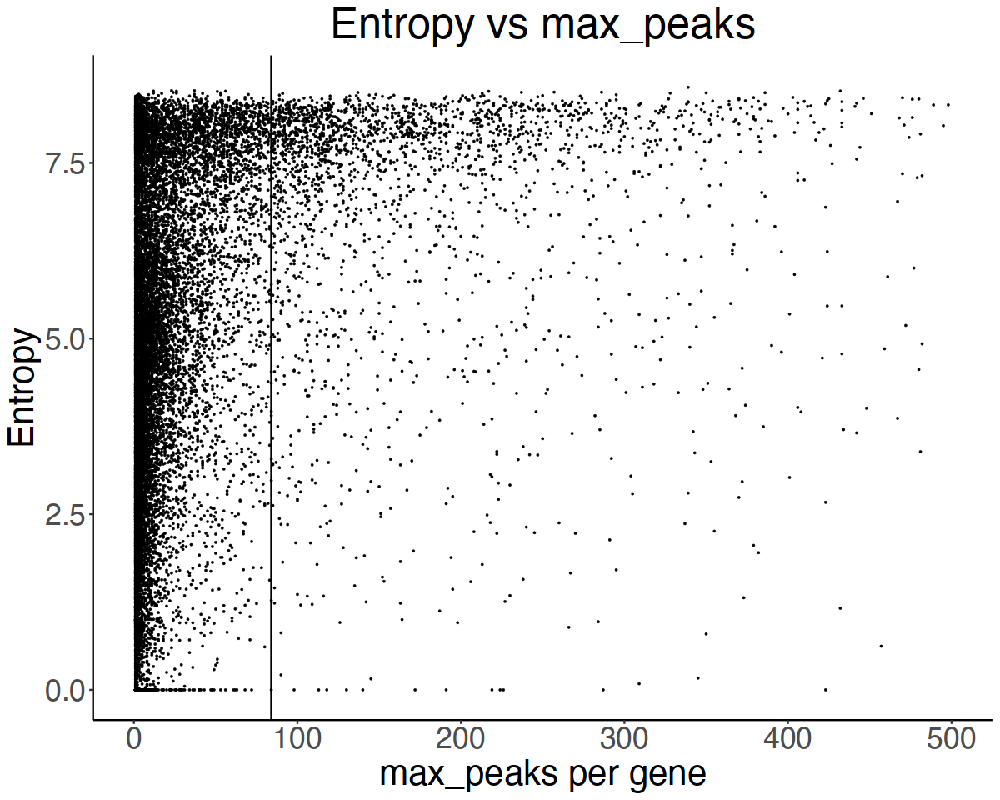

In [480]:
q + xlim(0,500) + geom_vline(xintercept = 84)

Warning message:
“Removed 3154 rows containing missing values (`geom_point()`).”


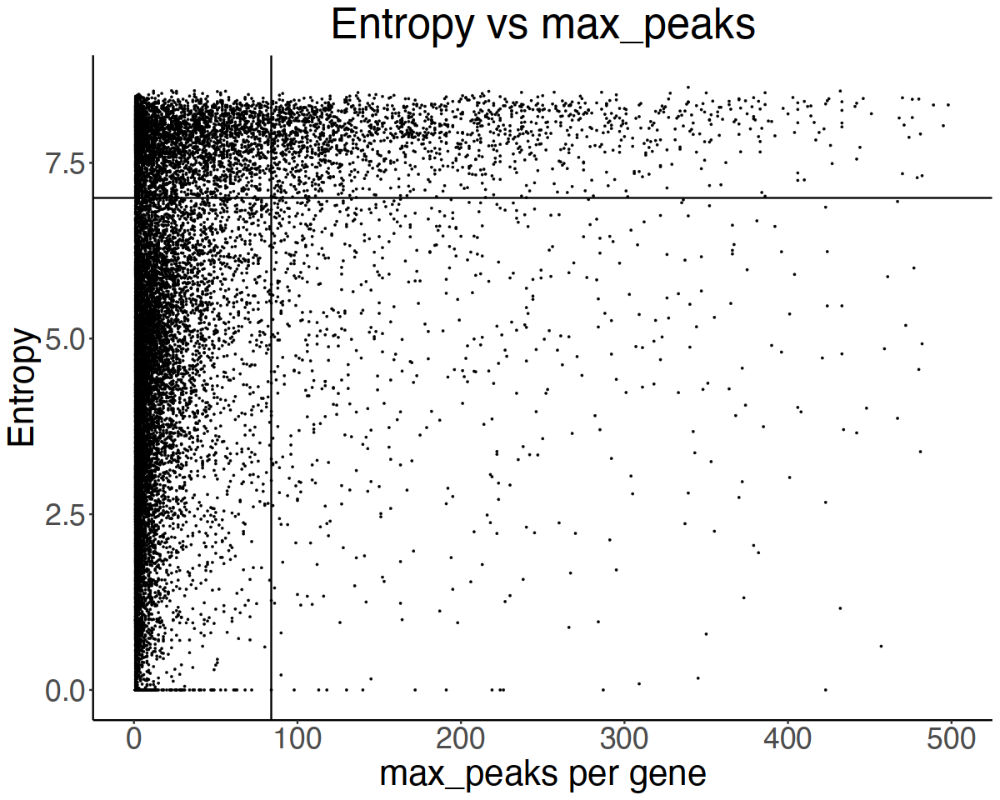

In [482]:
q + xlim(0,500) + geom_vline(xintercept = 84) + geom_hline(yintercept = 7)

In [476]:
q <- ggplot(gene_entropies_max_mean_median_group_tau_peaks_clusters_max_med, 
                aes(x = median_peaks, y = Entropy,  fill = group)) +
geom_point(show.legend = FALSE, size = 0.5, stroke = 0.16)+ 
        labs(title="Entropy vs median_peaks", x= "median_peaks per gene", y = "Entropy") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5, 
        size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

Warning message:
“Removed 3284 rows containing missing values (`geom_point()`).”


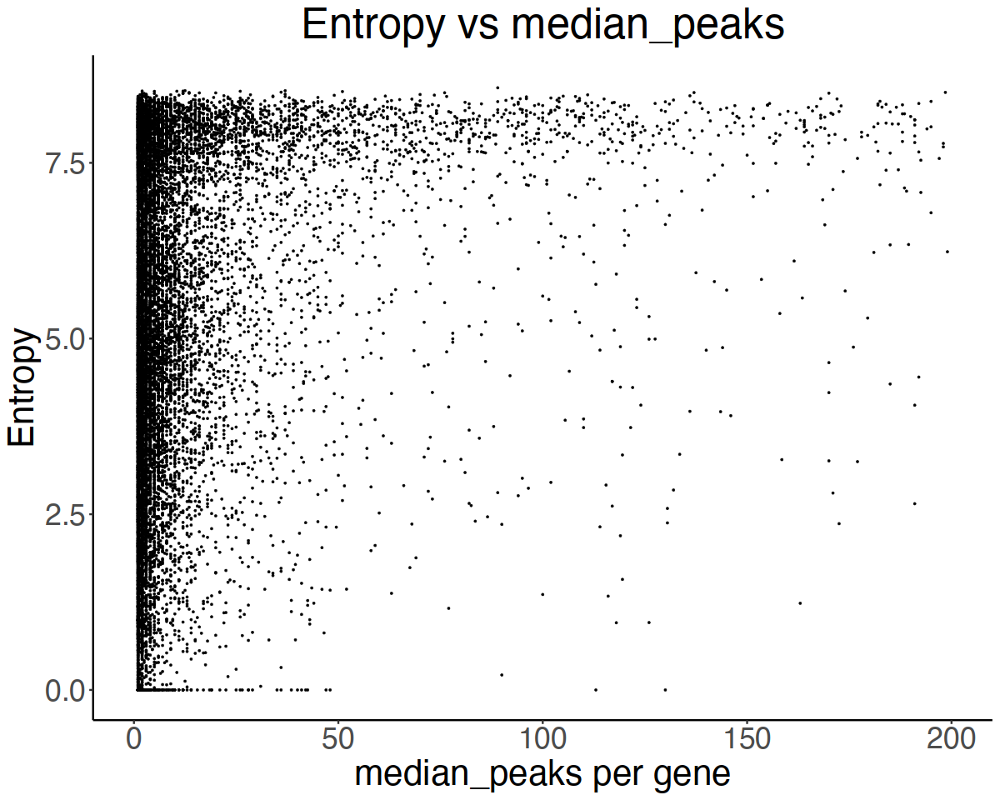

In [477]:
q + xlim(0,200)

In [478]:
gene_entropies_max_mean_median_group_tau_peaks_clusters_max  %>% filter(
    max_peaks <= 84 & Entropy < 7)  %>% dim

[1] 9854   12

In [485]:
gene_entropies_max_mean_median_group_tau_peaks_clusters_max  %>% filter(
    max_peaks <= 84 & Entropy >= 7)  %>% dim

[1] 3410   12

In [483]:
gene_entropies_max_mean_median_group_tau_peaks_clusters_max  %>% filter(
    max_peaks > 84 & Entropy < 7)  %>% dim

[1] 679  12

In [484]:
gene_entropies_max_mean_median_group_tau_peaks_clusters_max  %>% filter(
    max_peaks > 84 & Entropy >= 7)  %>% dim

[1] 1548   12

## Change the gene names to match the targets

In [16]:
ws245 = read.table("WS245_WS285.tsv", header = TRUE)

In [441]:
ws245  %>% head

,Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Y110A7A.10,aap-1,WBGene00000001,Y110A7A.10,aap-1,WBGene00000001
2,F27C8.1,aat-1,WBGene00000002,F27C8.1,aat-1,WBGene00000002
3,F07C3.7,aat-2,WBGene00000003,F07C3.7,aat-2,WBGene00000003
4,F52H2.2,aat-3,WBGene00000004,F52H2.2,aat-3,WBGene00000004
5,T13A10.10,aat-4,WBGene00000005,T13A10.10,aat-4,WBGene00000005
6,C55C2.5,aat-5,WBGene00000006,C55C2.5,aat-5,WBGene00000006


In [17]:
ws245  %>% mutate(Common245new = ifelse(Common245 == "null", Sequence245, Common245))  %>%  
count(Common245 == "null")
ws245  %>% mutate(Common245new = ifelse(Common245 == "null", Sequence245, Common245))  %>%  
count(Common245new == "null")

"Common245 == ""null""",n
<lgl>,<int>
FALSE,9635
TRUE,11180


"Common245new == ""null""",n
<lgl>,<int>
FALSE,20468
TRUE,347


In [18]:
ws245 = ws245  %>% mutate(Common245new = ifelse(Common245 == "null", Sequence245, Common245))

In [20]:
ws245  %>% mutate(Common285new = ifelse(Common285 == "null", Sequence285, Common285))  %>% tail

,Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
20810,null,null,null,T21G5.12,null,WBGene00306081,null,T21G5.12
20811,null,null,null,Y48G1BM.10,null,WBGene00306121,null,Y48G1BM.10
20812,null,null,null,Y97E10C.2,null,WBGene00306123,null,Y97E10C.2
20813,null,null,null,W04B5.9,null,WBGene00306124,null,W04B5.9
20814,null,null,null,F58B6.11,null,WBGene00306125,null,F58B6.11
20815,null,null,null,Y54F10AM.16,null,WBGene00306126,null,Y54F10AM.16


In [22]:
ws245 = ws245  %>% mutate(Common285new = ifelse(Common285 == "null", Sequence285, Common285))

In [23]:
ws245  %>% count(Common285new)  %>% arrange(-n)  %>% head

,Common285new,n
,<chr>,<int>
1,null,292
2,2L52.1,1
3,4R79.2,1
4,AC3.12,1
5,AC3.5,1
6,AC7.3,1


In [26]:
ws245  %>% filter(Common285new == "null")  %>% head
# these are dead genes so no need to include
# we will have mapped reads here, but they won't be legitimate and won't ever be targets of any peaks/clusters

,Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,T05G5.11,pqm-96,WBGene00004097,null,null,null,pqm-96,null
2,F46F11.3,tag-83,WBGene00006456,null,null,null,tag-83,null
3,6R55.2,null,WBGene00007069,null,null,null,6R55.2,null
4,AH10.3,null,WBGene00007084,null,null,null,AH10.3,null
5,C09H10.7,apc-17,WBGene00007501,null,null,null,apc-17,null
6,C11G10.2,null,WBGene00007526,null,null,null,C11G10.2,null


In [27]:
ws245  %>% count(Common245 == "null")
ws245  %>% count(Common245new == "null")
ws245  %>% count(Common285 == "null")
ws245  %>% count(Common285new == "null")

"Common245 == ""null""",n
<lgl>,<int>
FALSE,9635
TRUE,11180


"Common245new == ""null""",n
<lgl>,<int>
FALSE,20468
TRUE,347


"Common285 == ""null""",n
<lgl>,<int>
FALSE,10801
TRUE,10014


"Common285new == ""null""",n
<lgl>,<int>
FALSE,20523
TRUE,292


In [679]:
ws245  %>% filter(Common285 == "bcl-11")

Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
F13H6.1,null,WBGene00017430,F13H6.1,bcl-11,WBGene00017430,F13H6.1,bcl-11


In [680]:
celltype_expr = read.table("data/aax1971_Table_S7", header = TRUE, sep = "\t")

In [681]:
exp_matrix = celltype_expr[, c(1, 3, 6)]  %>%  
pivot_wider(names_from = "cell.bin", values_from = "bootstrap.median.tpm")

In [683]:
exp_matrix  %>% head

gene,ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,⋯,URX:390_510,URX:510_650,URX:gt_650,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aap-1,30.9,0.0,37.6,0.0,29.4,52.5,56.7,61.9,54.3,⋯,85.9,122.5,26.5,134.7,57.8,49.4,85.5,78.2,44.7,24.8
aat-1,4.2,0.0,20.1,5.3,0.0,0.0,0.0,7.6,0.0,⋯,12.3,39.2,139.5,0.0,65.8,3.3,0.0,27.9,47.6,226.9
aat-2,60.6,18.4,235.4,10.6,188.8,21.5,334.9,483.5,195.8,⋯,68.6,145.1,128.6,0.0,0.0,0.0,206.6,23.6,30.8,29.7
aat-3,203.2,209.5,243.0,57.6,423.4,56.4,287.6,73.2,0.0,⋯,81.5,27.9,48.6,134.0,161.1,239.0,532.7,78.1,59.3,0.0
aat-4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
aat-5,15.8,0.0,0.0,0.0,0.0,0.0,9.6,17.5,18.6,⋯,0.0,7.5,28.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [684]:
## but bcl-11 and maybe others don't have common names in WS245
## get WBG names for matrix genes from old cds
cds_jp = readRDS("data/all.cds.bg.corrected.actually.final.M3.rds")

In [686]:
df_genes = fData(cds_jp)  %>% as.data.frame   %>% select(id, gene_short_name)

In [687]:
dim(df_genes)

[1] 20222     2

In [64]:
## Commands to convert exp_matrix to WS285 names
celltype_expr = read.table("data/aax1971_Table_S7", header = TRUE, sep = "\t")
exp_matrix = celltype_expr[, c(1, 3, 6)]  %>%  
pivot_wider(names_from = "cell.bin", values_from = "bootstrap.median.tpm")

cds_jp = readRDS("data/all.cds.bg.corrected.actually.final.M3.rds")
df_genes = fData(cds_jp)  %>% as.data.frame   %>% select(id, gene_short_name)

exp_matrix = left_join(exp_matrix,df_genes , 
          by = c("gene" = "gene_short_name"))
exp_matrix = left_join(exp_matrix, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(!(is.na(Common285new)))

exp_matrix = column_to_rownames(exp_matrix, var = "Common285new")

exp_matrix$id = NULL

# The first run did not have ene = NULL so did tat separately, but now should work!
# and analogous code should work for other matrices in worm

exp_matrix$gene = NULL

exp_matrix_mean <-t(apply(exp_matrix,1, function(x) x - mean(x)))

Warning message in mean.default(x):
“argument is not numeric or logical: returning NA”


ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 't': non-numeric argument to binary operator


In [66]:
exp_matrix$gene = NULL

exp_matrix_mean <-t(apply(exp_matrix,1, function(x) x - mean(x)))

In [68]:
save(exp_matrix, exp_matrix_mean, file = "data/worm_embryo_expression_matrices_with_ws285_names.RData")

In [67]:
exp_matrix  %>% head

,ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,ADL:gt_650,⋯,URX:390_510,URX:510_650,URX:gt_650,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aap-1,30.9,0.0,37.6,0.0,29.4,52.5,56.7,61.9,54.3,41.9,⋯,85.9,122.5,26.5,134.7,57.8,49.4,85.5,78.2,44.7,24.8
aat-1,4.2,0.0,20.1,5.3,0.0,0.0,0.0,7.6,0.0,102.3,⋯,12.3,39.2,139.5,0.0,65.8,3.3,0.0,27.9,47.6,226.9
aat-2,60.6,18.4,235.4,10.6,188.8,21.5,334.9,483.5,195.8,0.0,⋯,68.6,145.1,128.6,0.0,0.0,0.0,206.6,23.6,30.8,29.7
aat-3,203.2,209.5,243.0,57.6,423.4,56.4,287.6,73.2,0.0,20.5,⋯,81.5,27.9,48.6,134.0,161.1,239.0,532.7,78.1,59.3,0.0
aat-4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
aat-5,15.8,0.0,0.0,0.0,0.0,0.0,9.6,17.5,18.6,28.8,⋯,0.0,7.5,28.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [688]:
left_join(exp_matrix,df_genes , 
          by = c("gene" = "gene_short_name"))  %>% dim

[1] 20222   411

In [689]:
exp_matrix = left_join(exp_matrix,df_genes , 
          by = c("gene" = "gene_short_name"))

In [690]:
exp_matrix$gene = NULL

In [691]:
exp_matrix  %>% head

ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,ADL:gt_650,⋯,URX:510_650,URX:gt_650,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650,id
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
30.9,0.0,37.6,0.0,29.4,52.5,56.7,61.9,54.3,41.9,⋯,122.5,26.5,134.7,57.8,49.4,85.5,78.2,44.7,24.8,WBGene00000001
4.2,0.0,20.1,5.3,0.0,0.0,0.0,7.6,0.0,102.3,⋯,39.2,139.5,0.0,65.8,3.3,0.0,27.9,47.6,226.9,WBGene00000002
60.6,18.4,235.4,10.6,188.8,21.5,334.9,483.5,195.8,0.0,⋯,145.1,128.6,0.0,0.0,0.0,206.6,23.6,30.8,29.7,WBGene00000003
203.2,209.5,243.0,57.6,423.4,56.4,287.6,73.2,0.0,20.5,⋯,27.9,48.6,134.0,161.1,239.0,532.7,78.1,59.3,0.0,WBGene00000004
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,WBGene00000005
15.8,0.0,0.0,0.0,0.0,0.0,9.6,17.5,18.6,28.8,⋯,7.5,28.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,WBGene00000006


In [698]:
dim(exp_matrix)

[1] 20222   410

In [692]:
ws245  %>%  head

,Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Y110A7A.10,aap-1,WBGene00000001,Y110A7A.10,aap-1,WBGene00000001,aap-1,aap-1
2,F27C8.1,aat-1,WBGene00000002,F27C8.1,aat-1,WBGene00000002,aat-1,aat-1
3,F07C3.7,aat-2,WBGene00000003,F07C3.7,aat-2,WBGene00000003,aat-2,aat-2
4,F52H2.2,aat-3,WBGene00000004,F52H2.2,aat-3,WBGene00000004,aat-3,aat-3
5,T13A10.10,aat-4,WBGene00000005,T13A10.10,aat-4,WBGene00000005,aat-4,aat-4
6,C55C2.5,aat-5,WBGene00000006,C55C2.5,aat-5,WBGene00000006,aat-5,aat-5


In [699]:
ws245  %>% select(WBGene285, Common285new)  %>% dim

[1] 20815     2

In [712]:
left_join(exp_matrix, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(!(is.na(Common285new)))    %>% dim
left_join(exp_matrix, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
 count(Common285new)  %>% dim

[1] 20048   411

[1] 20049     2

In [695]:
left_join(exp_matrix, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(Common285new != "null")  %>% count(Common285new)  %>% arrange(-n)  %>% head
# no duplicates!

Common285new,n
<chr>,<int>
2L52.1,1
4R79.2,1
AC3.12,1
AC3.5,1
AC7.3,1
AC8.10,1


In [713]:
exp_matrix = left_join(exp_matrix, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(!(is.na(Common285new)))


In [715]:
exp_matrix    %>% count(Common285new)  %>%  dim

[1] 20048     2

In [716]:
exp_matrix = column_to_rownames(exp_matrix, var = "Common285new")

In [722]:
exp_matrix$id = NULL

In [723]:
head(exp_matrix)

,ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,ADL:gt_650,⋯,URX:390_510,URX:510_650,URX:gt_650,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aap-1,30.9,0.0,37.6,0.0,29.4,52.5,56.7,61.9,54.3,41.9,⋯,85.9,122.5,26.5,134.7,57.8,49.4,85.5,78.2,44.7,24.8
aat-1,4.2,0.0,20.1,5.3,0.0,0.0,0.0,7.6,0.0,102.3,⋯,12.3,39.2,139.5,0.0,65.8,3.3,0.0,27.9,47.6,226.9
aat-2,60.6,18.4,235.4,10.6,188.8,21.5,334.9,483.5,195.8,0.0,⋯,68.6,145.1,128.6,0.0,0.0,0.0,206.6,23.6,30.8,29.7
aat-3,203.2,209.5,243.0,57.6,423.4,56.4,287.6,73.2,0.0,20.5,⋯,81.5,27.9,48.6,134.0,161.1,239.0,532.7,78.1,59.3,0.0
aat-4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
aat-5,15.8,0.0,0.0,0.0,0.0,0.0,9.6,17.5,18.6,28.8,⋯,0.0,7.5,28.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [724]:
exp_matrix_mean <-t(apply(exp_matrix,1, function(x) x - mean(x)))

## Vector angle embryo TFs and targets

In [151]:
angleCosine <- function(v1,v2){
  dp <- v1 %*% v2
  dp <- dp / (sqrt(sum(v1^2))*sqrt(sum(v2^2)))
  return(dp)
}

In [24]:
ls()

[1] "angleCosine"           "cluster_nPeaks_genes"  "exp_matrix"           
 [4] "exp_matrix_mean"       "f5b"                   "figure5b"             
 [7] "gene_clusters"         "gene_clusters_peaksum" "gene_max_mean_entropy"
[10] "genes_peaks"           "hkg_285"               "wbg_hkg"              
[13] "worm_peaks_TF"         "worm_peaks_TF_noHOT"   "ws245"

In [88]:
tf = "bcl-11"
tfn = gsub("-", "_", tf)
# won't use these
ranklb = 0.5
rankub = 1
## set the cluster size range
lb = 2
ub = 30

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & grepl("emb", exp)
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)


sub_mat = exp_matrix_mean[ rownames(exp_matrix_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

   tf_values = exp_matrix_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean) == tf)
#t_tf_values = as.data.frame(t(tf_values))
#t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
# colnames(t_tf_values_row) <- c("cell.type", "expr")


[1] 91


In [89]:
exp_matrix_mean  %>% as.data.frame  %>%  filter(rownames(exp_matrix_mean) == tf)

,ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,ADL:gt_650,⋯,URX:390_510,URX:510_650,URX:gt_650,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
bcl-11,-19.89144,-19.89144,-9.791443,-19.89144,-19.89144,10.80856,-15.19144,-19.89144,12.40856,0.9085575,⋯,-9.491443,-13.49144,16.30856,61.90856,-19.89144,-19.89144,-19.89144,-13.29144,-19.89144,8.408557


In [671]:
dim(exp_matrix_mean)

[1] 19478   409

In [678]:
ws245  %>% filter(Common285 == "bcl-11")

Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
F13H6.1,null,WBGene00017430,F13H6.1,bcl-11,WBGene00017430,F13H6.1,bcl-11


In [725]:
exp_matrix_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean) == "bcl-11")

,ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,ADL:gt_650,⋯,URX:390_510,URX:510_650,URX:gt_650,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
bcl-11,-19.89144,-19.89144,-9.791443,-19.89144,-19.89144,10.80856,-15.19144,-19.89144,12.40856,0.9085575,⋯,-9.491443,-13.49144,16.30856,61.90856,-19.89144,-19.89144,-19.89144,-13.29144,-19.89144,8.408557


In [90]:
tf = "bcl-11"
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0.3
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & grepl("emb", exp)
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



if(number_targets > 1){

    sub_mat = exp_matrix_mean[ rownames(exp_matrix_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_emb_targets[n, 1] = tfn
 #    vector_angle_emb_targets[n, 2] = angle
#    vector_angle_emb_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

    gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, , color = expr)) +
  geom_bar(stat="identity", color = "blue", fill = "blue") +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank()) 


    title = paste(tfn, "targets_from_embryo", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr ))  +
 geom_bar(stat="identity", color = "blue", fill = "blue") + 
ggtitle(title, subtitle = agg_subtitle) +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x= element_text(size = 2, angle = -90, hjust = 0))

    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    print(gg_both)
    
dev.off()

}

[1] 45


ERROR: Error in plot_grid(gg_tf, gg_agg, ncol = 1, align = "v"): could not find function "plot_grid"


In [670]:
tar  %>%  head
t_tf_values_row  %>%  head
tf_values  %>%  head

,cell.type,expr
,<chr>,<dbl>
1,ADE:390_510,-731.8186
2,ADEsh:390_510,621.1814
3,ADF:390_510,-7008.4186
4,ADF:510_650,-8324.9186
5,ADF_AWB_terminal_cells_but_undifferentiated,-1358.0186
6,ADF:gt_650,-8523.8186


,cell.type
,<chr>
1,ADE:390_510
2,ADEsh:390_510
3,ADF:390_510
4,ADF:510_650
5,ADF_AWB_terminal_cells_but_undifferentiated
6,ADF:gt_650


Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”


ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,ADL:gt_650,⋯,URX:390_510,URX:510_650,URX:gt_650,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>


In [652]:
options(repr.plot.width=12, repr.plot.height=6)

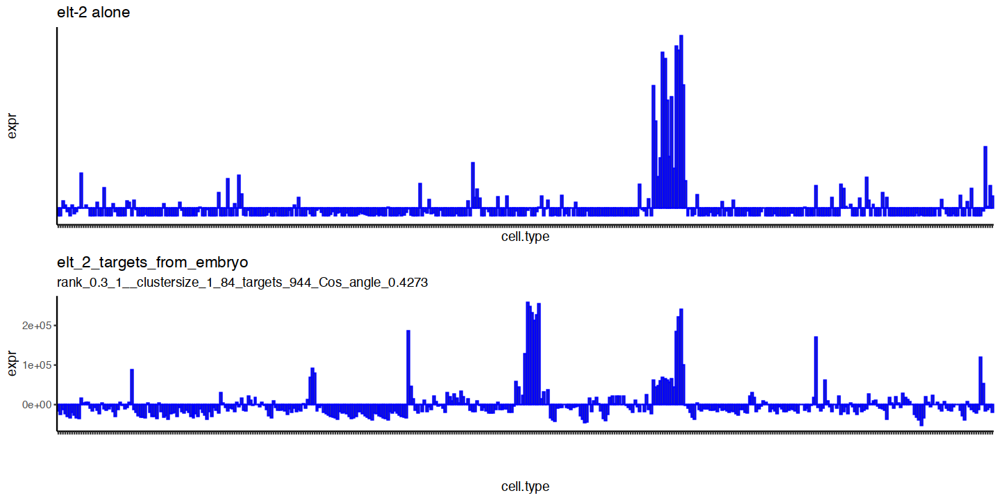

In [653]:
gg_both

In [655]:
pdf("test.pdf", width = 10, height = 6)
print(gg_both)
dev.off()

pdf 
  2

### Generation of embryo graphs for rank gt 0.3

In [779]:
unique((worm_peaks_TF  %>% filter(grepl("embry", exp)))$TF)  %>% length
ChIP_emb_TFs = unique((worm_peaks_TF  %>% filter(grepl("embry", exp)))$TF)

[1] 123

In [1391]:
vector_angle_emb_2_noHOT_3_targets <- data.frame(matrix(nrow = 10, ncol = 3))
colnames(vector_angle_emb_2_noHOT_3_targets) <- c("Gene", "Angle", "num_targets")
n = 0
for(tf in ChIP_emb_TFs  )
         {
message(tf)

tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0.3
rankub = 1
## set the cluster size range
lb = 1
#ub = "noHOT"

    file_name = paste(tfn, "aggreg_vs_TF_profile_2_noHOT_3", ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & 
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & grepl("emb", exp)
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



if(number_targets > 1){

    sub_mat = exp_matrix_mean[ rownames(exp_matrix_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
    print(angle)
    n = n+1
   print(n)
    vector_angle_emb_2_noHOT_3_targets[n, 1] = tfn
     vector_angle_emb_2_noHOT_3_targets[n, 2] = angle
    vector_angle_emb_2_noHOT_3_targets[n, 3] =number_targets
    
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

    gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, , color = expr)) +
  geom_bar(stat="identity", color = "blue", fill = "blue") +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank()) 


    title = paste(tfn, "targets_from_embryo", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr ))  +
 geom_bar(stat="identity", color = "blue", fill = "blue") + 
ggtitle(title, subtitle = agg_subtitle) +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x= element_text(size = 2, angle = -90, hjust = 0))

    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
           rel_heights = c(1.4,2),
          align = "v")
    print(gg_both)
    
dev.off()

tar_tf_table = left_join(tar, t_tf_values_row, by = "cell.type" )
colnames(tar_tf_table) = c("cell.type", "agg.expr", "tf.expr")
    
exp_table =  tar_tf_table  %>% arrange(-agg.expr)  
    table_name = paste(tfn, ub, ranklb, "target_expression_values_2_noHOT_3_emb.tsv", sep = "_")
 table_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", table_name, sep = "/")
 print(table_name)
    write.table(exp_table, file = table_name, quote = F, sep = "\t", col.names=NA)



}
    }

ahr-1



[1] 18
       [,1]
[1,] 0.0133
[1] 1
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ahr_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


B0310.2



[1] 25
        [,1]
[1,] -0.0341
[1] 2
[1] "worm_agg_emb_graphs_emb_targets_noHOT/B0310.2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


bcl-11



[1] 45
       [,1]
[1,] 0.1187
[1] 3
[1] "worm_agg_emb_graphs_emb_targets_noHOT/bcl_11_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


bed-3



[1] 23
       [,1]
[1,] 0.2805
[1] 4
[1] "worm_agg_emb_graphs_emb_targets_noHOT/bed_3_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


blmp-1



[1] 241
       [,1]
[1,] 0.6224
[1] 5
[1] "worm_agg_emb_graphs_emb_targets_noHOT/blmp_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


C38D4.7



[1] 21
        [,1]
[1,] -0.0415
[1] 6
[1] "worm_agg_emb_graphs_emb_targets_noHOT/C38D4.7_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-13



[1] 11
       [,1]
[1,] 0.0725
[1] 7
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_13_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-14



[1] 139
       [,1]
[1,] 0.0809
[1] 8
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_14_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-18



[1] 424
       [,1]
[1,] 0.2779
[1] 9
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_18_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-19



[1] 53
       [,1]
[1,] 0.0349
[1] 10
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_19_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-2



[1] 104
       [,1]
[1,] 0.0524
[1] 11
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-22



[1] 22
       [,1]
[1,] 0.1499
[1] 12
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_22_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-24



[1] 4
        [,1]
[1,] -0.0346
[1] 13
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_24_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-30



[1] 34
       [,1]
[1,] 0.0761
[1] 14
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_30_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-31



[1] 482
       [,1]
[1,] 0.2481
[1] 15
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_31_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-34



[1] 282
       [,1]
[1,] 0.1642
[1] 16
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_34_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-36



[1] 501
       [,1]
[1,] -0.033
[1] 17
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_36_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-39



[1] 442
       [,1]
[1,] 0.1903
[1] 18
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_39_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-43



[1] 79
       [,1]
[1,] 0.4557
[1] 19
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_43_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-45



[1] 59
        [,1]
[1,] -0.0204
[1] 20
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_45_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-48



[1] 474
      [,1]
[1,] 0.792
[1] 21
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_48_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-5



[1] 343
       [,1]
[1,] 0.1078
[1] 22
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_5_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-51



[1] 161
        [,1]
[1,] -0.0262
[1] 23
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_51_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-6



[1] 42
       [,1]
[1,] 0.0816
[1] 24
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_6_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-83



[1] 2482
        [,1]
[1,] -0.0434
[1] 25
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_83_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ceh-9



[1] 13
        [,1]
[1,] -0.0052
[1] 26
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_9_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ces-1



[1] 1984
       [,1]
[1,] 0.1282
[1] 27
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ces_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


che-1



[1] 31
       [,1]
[1,] 0.0283
[1] 28
[1] "worm_agg_emb_graphs_emb_targets_noHOT/che_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


cnd-1



[1] 267
       [,1]
[1,] 0.4271
[1] 29
[1] "worm_agg_emb_graphs_emb_targets_noHOT/cnd_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


cog-1



[1] 94
       [,1]
[1,] 0.0462
[1] 30
[1] "worm_agg_emb_graphs_emb_targets_noHOT/cog_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


dmd-4



[1] 976
        [,1]
[1,] -0.0694
[1] 31
[1] "worm_agg_emb_graphs_emb_targets_noHOT/dmd_4_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


drap-1



[1] 218
       [,1]
[1,] 0.0644
[1] 32
[1] "worm_agg_emb_graphs_emb_targets_noHOT/drap_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


dve-1



[1] 246
        [,1]
[1,] -0.0267
[1] 33
[1] "worm_agg_emb_graphs_emb_targets_noHOT/dve_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


elt-1



[1] 430
       [,1]
[1,] 0.3661
[1] 34
[1] "worm_agg_emb_graphs_emb_targets_noHOT/elt_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


elt-2



[1] 944
       [,1]
[1,] 0.4294
[1] 35
[1] "worm_agg_emb_graphs_emb_targets_noHOT/elt_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


elt-3



[1] 80
       [,1]
[1,] 0.5348
[1] 36
[1] "worm_agg_emb_graphs_emb_targets_noHOT/elt_3_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


elt-4



[1] 112
        [,1]
[1,] -0.0314
[1] 37
[1] "worm_agg_emb_graphs_emb_targets_noHOT/elt_4_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ets-4



[1] 112
       [,1]
[1,] 0.1315
[1] 38
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ets_4_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ets-7



[1] 52
       [,1]
[1,] -0.001
[1] 39
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ets_7_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


eyg-1



[1] 21
        [,1]
[1,] -0.0242
[1] 40
[1] "worm_agg_emb_graphs_emb_targets_noHOT/eyg_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


fax-1



[1] 52
       [,1]
[1,] 0.4001
[1] 41
[1] "worm_agg_emb_graphs_emb_targets_noHOT/fax_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


fkh-10



[1] 13
       [,1]
[1,] 0.1129
[1] 42
[1] "worm_agg_emb_graphs_emb_targets_noHOT/fkh_10_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


fkh-6



[1] 24
        [,1]
[1,] -0.0511
[1] 43
[1] "worm_agg_emb_graphs_emb_targets_noHOT/fkh_6_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


flh-1



[1] 7
       [,1]
[1,] 0.4886
[1] 44
[1] "worm_agg_emb_graphs_emb_targets_noHOT/flh_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


gmeb-2



[1] 24
        [,1]
[1,] -0.0587
[1] 45
[1] "worm_agg_emb_graphs_emb_targets_noHOT/gmeb_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ham-2



[1] 400
       [,1]
[1,] 0.3307
[1] 46
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ham_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


hlh-1



[1] 621
       [,1]
[1,] 0.4396
[1] 47
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hlh_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


hlh-13



[1] 11
        [,1]
[1,] -0.0898
[1] 48
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hlh_13_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


hlh-15



[1] 8
       [,1]
[1,] 0.0214
[1] 49
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hlh_15_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


hlh-30



[1] 347
      [,1]
[1,] 0.047
[1] 50
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hlh_30_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


hlh-6



[1] 225
        [,1]
[1,] -0.0508
[1] 51
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hlh_6_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


hlh-8



[1] 170
       [,1]
[1,] 0.3777
[1] 52
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hlh_8_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


hmbx-1



[1] 15
       [,1]
[1,] 0.0393
[1] 53
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hmbx_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


hmg-4



[1] 675
       [,1]
[1,] 0.0477
[1] 54
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hmg_4_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


hnd-1



[1] 47
        [,1]
[1,] -0.0194
[1] 55
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hnd_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


K09A11.1



[1] 50
       [,1]
[1,] 0.0985
[1] 56
[1] "worm_agg_emb_graphs_emb_targets_noHOT/K09A11.1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


klf-2



[1] 150
       [,1]
[1,] 0.0011
[1] 57
[1] "worm_agg_emb_graphs_emb_targets_noHOT/klf_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


lim-6



[1] 55
       [,1]
[1,] 0.2889
[1] 58
[1] "worm_agg_emb_graphs_emb_targets_noHOT/lim_6_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


lin-11



[1] 15
       [,1]
[1,] 0.0845
[1] 59
[1] "worm_agg_emb_graphs_emb_targets_noHOT/lin_11_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


lin-13



[1] 122
       [,1]
[1,] 0.3546
[1] 60
[1] "worm_agg_emb_graphs_emb_targets_noHOT/lin_13_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


lin-32



[1] 164
       [,1]
[1,] 0.0934
[1] 61
[1] "worm_agg_emb_graphs_emb_targets_noHOT/lin_32_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


lsy-2



[1] 673
       [,1]
[1,] 0.1334
[1] 62
[1] "worm_agg_emb_graphs_emb_targets_noHOT/lsy_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


M03D4.4



[1] 175
        [,1]
[1,] -0.0416
[1] 63
[1] "worm_agg_emb_graphs_emb_targets_noHOT/M03D4.4_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


mab-5



[1] 77
       [,1]
[1,] 0.1593
[1] 64
[1] "worm_agg_emb_graphs_emb_targets_noHOT/mab_5_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


madf-2



[1] 24
        [,1]
[1,] -0.0584
[1] 65
[1] "worm_agg_emb_graphs_emb_targets_noHOT/madf_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


mec-3



[1] 164
       [,1]
[1,] -0.001
[1] 66
[1] "worm_agg_emb_graphs_emb_targets_noHOT/mec_3_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


med-1



[1] 41
        [,1]
[1,] -0.0046
[1] 67
[1] "worm_agg_emb_graphs_emb_targets_noHOT/med_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


mep-1



[1] 444
       [,1]
[1,] 0.5283
[1] 68
[1] "worm_agg_emb_graphs_emb_targets_noHOT/mep_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


mls-2



[1] 300
       [,1]
[1,] 0.1555
[1] 69
[1] "worm_agg_emb_graphs_emb_targets_noHOT/mls_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


nfya-1



[1] 649
     [,1]
[1,] 0.02
[1] 70
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nfya_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


nhr-11



[1] 2
       [,1]
[1,] 0.0088
[1] 71
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_11_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


nhr-12



[1] 6
        [,1]
[1,] -0.0256
[1] 72
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_12_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


nhr-2



[1] 499
      [,1]
[1,] 0.087
[1] 73
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


nhr-232



[1] 30
        [,1]
[1,] -0.0324
[1] 74
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_232_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


nhr-237



[1] 74
       [,1]
[1,] -0.029
[1] 75
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_237_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


nhr-28



[1] 20
       [,1]
[1,] 0.2434
[1] 76
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_28_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


nhr-76



[1] 2
        [,1]
[1,] -0.1963
[1] 77
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_76_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


npax-4



[1] 4
        [,1]
[1,] -0.0133
[1] 78
[1] "worm_agg_emb_graphs_emb_targets_noHOT/npax_4_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


odd-2



[1] 226
       [,1]
[1,] 0.0023
[1] 79
[1] "worm_agg_emb_graphs_emb_targets_noHOT/odd_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


pag-3



[1] 44
       [,1]
[1,] 0.1569
[1] 80
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pag_3_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


pat-9



[1] 44
       [,1]
[1,] 0.5628
[1] 81
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pat_9_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


pax-1



[1] 105
       [,1]
[1,] 0.1704
[1] 82
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pax_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


pes-1



[1] 350
       [,1]
[1,] 0.0104
[1] 83
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pes_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


pha-2



[1] 34
       [,1]
[1,] 0.0861
[1] 84
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pha_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


pha-4



[1] 299
       [,1]
[1,] 0.2549
[1] 85
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pha_4_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


pop-1



[1] 173
       [,1]
[1,] 0.2281
[1] 86
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pop_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


pqm-1



[1] 65
       [,1]
[1,] 0.2688
[1] 87
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pqm_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


pros-1



[1] 33
       [,1]
[1,] 0.1837
[1] 88
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pros_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ref-1



[1] 90
        [,1]
[1,] -0.0076
[1] 89
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ref_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ref-2



[1] 1132
       [,1]
[1,] 0.1163
[1] 90
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ref_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


rnt-1



[1] 275
       [,1]
[1,] 0.4469
[1] 91
[1] "worm_agg_emb_graphs_emb_targets_noHOT/rnt_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


scrt-1



[1] 228
        [,1]
[1,] -0.0154
[1] 92
[1] "worm_agg_emb_graphs_emb_targets_noHOT/scrt_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


sea-1



[1] 211
       [,1]
[1,] 0.0107
[1] 93
[1] "worm_agg_emb_graphs_emb_targets_noHOT/sea_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


sem-2



[1] 45
       [,1]
[1,] 0.0982
[1] 94
[1] "worm_agg_emb_graphs_emb_targets_noHOT/sem_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


snai-1



[1] 17
        [,1]
[1,] -0.0627
[1] 95
[1] "worm_agg_emb_graphs_emb_targets_noHOT/snai_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


snpc-4



[1] 298
      [,1]
[1,] 0.044
[1] 96
[1] "worm_agg_emb_graphs_emb_targets_noHOT/snpc_4_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


sox-2



[1] 83
       [,1]
[1,] 0.1914
[1] 97
[1] "worm_agg_emb_graphs_emb_targets_noHOT/sox_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


sox-4



[1] 90
       [,1]
[1,] 0.0254
[1] 98
[1] "worm_agg_emb_graphs_emb_targets_noHOT/sox_4_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


sptf-1



[1] 988
       [,1]
[1,] 0.0116
[1] 99
[1] "worm_agg_emb_graphs_emb_targets_noHOT/sptf_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


syd-9



[1] 43
       [,1]
[1,] 0.3389
[1] 100
[1] "worm_agg_emb_graphs_emb_targets_noHOT/syd_9_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


T22C8.4



[1] 604
        [,1]
[1,] -0.0181
[1] 101
[1] "worm_agg_emb_graphs_emb_targets_noHOT/T22C8.4_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


T23F11.4



[1] 28
        [,1]
[1,] -0.1072
[1] 102
[1] "worm_agg_emb_graphs_emb_targets_noHOT/T23F11.4_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


tab-1



[1] 337
       [,1]
[1,] 0.0601
[1] 103
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tab_1_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


tbx-11



[1] 160
       [,1]
[1,] 0.0229
[1] 104
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tbx_11_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


tbx-2



[1] 283
       [,1]
[1,] 0.0745
[1] 105
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tbx_2_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


tbx-37



[1] 119
        [,1]
[1,] -0.0537
[1] 106
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tbx_37_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


tbx-7



[1] 73
       [,1]
[1,] 0.2148
[1] 107
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tbx_7_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


tbx-8



[1] 12
       [,1]
[1,] 0.0342
[1] 108
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tbx_8_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


tra-4



[1] 12
        [,1]
[1,] -0.0246
[1] 109
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tra_4_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ttx-3



[1] 64
       [,1]
[1,] 0.1347
[1] 110
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ttx_3_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


unc-120



[1] 569
       [,1]
[1,] 0.3944
[1] 111
[1] "worm_agg_emb_graphs_emb_targets_noHOT/unc_120_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


unc-3



[1] 74
       [,1]
[1,] 0.5207
[1] 112
[1] "worm_agg_emb_graphs_emb_targets_noHOT/unc_3_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


unc-39



[1] 11
       [,1]
[1,] 0.0512
[1] 113
[1] "worm_agg_emb_graphs_emb_targets_noHOT/unc_39_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


unc-42



[1] 949
      [,1]
[1,] 0.427
[1] 114
[1] "worm_agg_emb_graphs_emb_targets_noHOT/unc_42_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


unc-62



[1] 589
       [,1]
[1,] 0.1427
[1] 115
[1] "worm_agg_emb_graphs_emb_targets_noHOT/unc_62_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


unc-86



[1] 17
       [,1]
[1,] 0.1383
[1] 116
[1] "worm_agg_emb_graphs_emb_targets_noHOT/unc_86_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


Y22D7AL.16



[1] 11
        [,1]
[1,] -0.0042
[1] 117
[1] "worm_agg_emb_graphs_emb_targets_noHOT/Y22D7AL.16_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


zip-5



[1] 55
        [,1]
[1,] -0.1927
[1] 118
[1] "worm_agg_emb_graphs_emb_targets_noHOT/zip_5_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


zip-8



[1] 522
       [,1]
[1,] 0.0568
[1] 119
[1] "worm_agg_emb_graphs_emb_targets_noHOT/zip_8_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ztf-11



[1] 22
       [,1]
[1,] 0.2639
[1] 120
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ztf_11_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ztf-16



[1] 17
       [,1]
[1,] 0.1473
[1] 121
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ztf_16_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ztf-23



[1] 436
        [,1]
[1,] -0.0849
[1] 122
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ztf_23_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


ztf-29



[1] 208
       [,1]
[1,] 0.0386
[1] 123
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ztf_29_84_0.3_target_expression_values_2_noHOT_3_emb.tsv"


In [729]:
vector_angle_emb_targets

,Gene,Angle,num_targets
,<chr>,<dbl>,<int>
1,ahr_1,0.0133,18
2,B0310.2,-0.0341,25
3,bcl_11,0.1187,45
4,bed_3,0.2805,23
5,blmp_1,0.6224,241
6,C38D4.7,-0.0415,21
7,ceh_13,0.0725,11
8,ceh_14,0.0809,139
9,ceh_18,0.2779,424


In [1392]:
vector_angle_emb_2_noHOT_3_targets %>% arrange(-Angle)

Gene,Angle,num_targets
<chr>,<dbl>,<int>
ceh_48,0.7920,474
blmp_1,0.6224,241
pat_9,0.5628,44
elt_3,0.5348,80
mep_1,0.5283,444
unc_3,0.5207,74
flh_1,0.4886,7
ceh_43,0.4557,79
rnt_1,0.4469,275


In [731]:
vector_angle_emb_targets  %>% arrange(-Angle)

Gene,Angle,num_targets
<chr>,<dbl>,<int>
ceh_48,0.7920,474
blmp_1,0.6224,241
pat_9,0.5628,44
elt_3,0.5348,80
mep_1,0.5283,444
unc_3,0.5207,74
flh_1,0.4886,7
ceh_43,0.4557,79
rnt_1,0.4469,275


In [733]:
vector_angle_emb_targets  %>% filter(Angle > 0.1) %>% arrange(-Angle)

Gene,Angle,num_targets
<chr>,<dbl>,<int>
ceh_48,0.7920,474
blmp_1,0.6224,241
pat_9,0.5628,44
elt_3,0.5348,80
mep_1,0.5283,444
unc_3,0.5207,74
flh_1,0.4886,7
ceh_43,0.4557,79
rnt_1,0.4469,275


### Generation of embryo graphs for rank gt 0

In [991]:
vector_angle_emb_rank_0_targets <- data.frame(matrix(nrow = 10, ncol = 3))
colnames(vector_angle_emb_targets) <- c("Gene", "Angle", "num_targets")
n = 0
for(tf in ChIP_emb_TFs  )
         {
message(tf)

tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & grepl("emb", exp)
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



if(number_targets > 1){

    sub_mat = exp_matrix_mean[ rownames(exp_matrix_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
    print(angle)
    n = n+1
   print(n)
    vector_angle_emb_rank_0_targets[n, 1] = tfn
     vector_angle_emb_rank_0_targets[n, 2] = angle
    vector_angle_emb_rank_0_targets[n, 3] =number_targets
    
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

    gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, , color = expr)) +
  geom_bar(stat="identity", color = "blue", fill = "blue") +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank()) 


    title = paste(tfn, "targets_from_embryo", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr ))  +
 geom_bar(stat="identity", color = "blue", fill = "blue") + 
ggtitle(title, subtitle = agg_subtitle) +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x= element_text(size = 2, angle = -90, hjust = 0))

    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
           rel_heights = c(1.4,2),
          align = "v")
    print(gg_both)
    
dev.off()

tar_tf_table = left_join(tar, t_tf_values_row, by = "cell.type" )
colnames(tar_tf_table) = c("cell.type", "agg.expr", "tf.expr")
    
exp_table =  tar_tf_table  %>% arrange(-agg.expr)  
    table_name = paste(tfn, ub, ranklb, "target_expression_values_emb.tsv", sep = "_")
 table_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", table_name, sep = "/")
 print(table_name)
    write.table(exp_table, file = table_name, quote = F, sep = "\t", col.names=NA)



}
    }

ahr-1



[1] 35
       [,1]
[1,] 0.0176
[1] 1
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ahr_1_84_0_target_expression_values_emb.tsv"


B0310.2



[1] 51
       [,1]
[1,] 0.2547
[1] 2
[1] "worm_agg_emb_graphs_emb_targets_noHOT/B0310.2_84_0_target_expression_values_emb.tsv"


bcl-11



[1] 90
      [,1]
[1,] 0.192
[1] 3
[1] "worm_agg_emb_graphs_emb_targets_noHOT/bcl_11_84_0_target_expression_values_emb.tsv"


bed-3



[1] 45
       [,1]
[1,] 0.2766
[1] 4
[1] "worm_agg_emb_graphs_emb_targets_noHOT/bed_3_84_0_target_expression_values_emb.tsv"


blmp-1



[1] 310
       [,1]
[1,] 0.5101
[1] 5
[1] "worm_agg_emb_graphs_emb_targets_noHOT/blmp_1_84_0_target_expression_values_emb.tsv"


C38D4.7



[1] 51
        [,1]
[1,] -0.0627
[1] 6
[1] "worm_agg_emb_graphs_emb_targets_noHOT/C38D4.7_84_0_target_expression_values_emb.tsv"


ceh-13



[1] 29
       [,1]
[1,] 0.0883
[1] 7
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_13_84_0_target_expression_values_emb.tsv"


ceh-14



[1] 248
       [,1]
[1,] 0.0834
[1] 8
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_14_84_0_target_expression_values_emb.tsv"


ceh-18



[1] 699
       [,1]
[1,] 0.2756
[1] 9
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_18_84_0_target_expression_values_emb.tsv"


ceh-19



[1] 114
        [,1]
[1,] -0.0036
[1] 10
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_19_84_0_target_expression_values_emb.tsv"


ceh-2



[1] 187
       [,1]
[1,] 0.0843
[1] 11
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_2_84_0_target_expression_values_emb.tsv"


ceh-22



[1] 31
       [,1]
[1,] 0.1737
[1] 12
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_22_84_0_target_expression_values_emb.tsv"


ceh-24



[1] 12
        [,1]
[1,] -0.0277
[1] 13
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_24_84_0_target_expression_values_emb.tsv"


ceh-30



[1] 45
       [,1]
[1,] 0.0144
[1] 14
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_30_84_0_target_expression_values_emb.tsv"


ceh-31



[1] 832
       [,1]
[1,] 0.2447
[1] 15
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_31_84_0_target_expression_values_emb.tsv"


ceh-34



[1] 414
       [,1]
[1,] 0.1842
[1] 16
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_34_84_0_target_expression_values_emb.tsv"


ceh-36



[1] 656
        [,1]
[1,] -0.0266
[1] 17
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_36_84_0_target_expression_values_emb.tsv"


ceh-39



[1] 588
       [,1]
[1,] 0.1905
[1] 18
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_39_84_0_target_expression_values_emb.tsv"


ceh-43



[1] 129
       [,1]
[1,] 0.4029
[1] 19
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_43_84_0_target_expression_values_emb.tsv"


ceh-45



[1] 113
        [,1]
[1,] -0.0278
[1] 20
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_45_84_0_target_expression_values_emb.tsv"


ceh-48



[1] 633
       [,1]
[1,] 0.6476
[1] 21
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_48_84_0_target_expression_values_emb.tsv"


ceh-5



[1] 601
       [,1]
[1,] 0.1175
[1] 22
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_5_84_0_target_expression_values_emb.tsv"


ceh-51



[1] 245
       [,1]
[1,] 0.0059
[1] 23
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_51_84_0_target_expression_values_emb.tsv"


ceh-6



[1] 95
      [,1]
[1,] 0.054
[1] 24
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_6_84_0_target_expression_values_emb.tsv"


ceh-83



[1] 3234
       [,1]
[1,] -0.047
[1] 25
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_83_84_0_target_expression_values_emb.tsv"


ceh-9



[1] 25
        [,1]
[1,] -0.0047
[1] 26
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ceh_9_84_0_target_expression_values_emb.tsv"


ces-1



[1] 2552
       [,1]
[1,] 0.1368
[1] 27
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ces_1_84_0_target_expression_values_emb.tsv"


che-1



[1] 72
        [,1]
[1,] -0.0091
[1] 28
[1] "worm_agg_emb_graphs_emb_targets_noHOT/che_1_84_0_target_expression_values_emb.tsv"


cnd-1



[1] 406
       [,1]
[1,] 0.4144
[1] 29
[1] "worm_agg_emb_graphs_emb_targets_noHOT/cnd_1_84_0_target_expression_values_emb.tsv"


cog-1



[1] 174
      [,1]
[1,] 0.051
[1] 30
[1] "worm_agg_emb_graphs_emb_targets_noHOT/cog_1_84_0_target_expression_values_emb.tsv"


dmd-4



[1] 1362
      [,1]
[1,] -0.03
[1] 31
[1] "worm_agg_emb_graphs_emb_targets_noHOT/dmd_4_84_0_target_expression_values_emb.tsv"


drap-1



[1] 373
       [,1]
[1,] 0.1407
[1] 32
[1] "worm_agg_emb_graphs_emb_targets_noHOT/drap_1_84_0_target_expression_values_emb.tsv"


dve-1



[1] 311
        [,1]
[1,] -0.0263
[1] 33
[1] "worm_agg_emb_graphs_emb_targets_noHOT/dve_1_84_0_target_expression_values_emb.tsv"


elt-1



[1] 550
       [,1]
[1,] 0.3483
[1] 34
[1] "worm_agg_emb_graphs_emb_targets_noHOT/elt_1_84_0_target_expression_values_emb.tsv"


elt-2



[1] 1233
       [,1]
[1,] 0.4825
[1] 35
[1] "worm_agg_emb_graphs_emb_targets_noHOT/elt_2_84_0_target_expression_values_emb.tsv"


elt-3



[1] 121
       [,1]
[1,] 0.5607
[1] 36
[1] "worm_agg_emb_graphs_emb_targets_noHOT/elt_3_84_0_target_expression_values_emb.tsv"


elt-4



[1] 152
       [,1]
[1,] -0.035
[1] 37
[1] "worm_agg_emb_graphs_emb_targets_noHOT/elt_4_84_0_target_expression_values_emb.tsv"


ets-4



[1] 177
       [,1]
[1,] 0.1173
[1] 38
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ets_4_84_0_target_expression_values_emb.tsv"


ets-7



[1] 82
       [,1]
[1,] -9e-04
[1] 39
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ets_7_84_0_target_expression_values_emb.tsv"


eyg-1



[1] 38
        [,1]
[1,] -0.0092
[1] 40
[1] "worm_agg_emb_graphs_emb_targets_noHOT/eyg_1_84_0_target_expression_values_emb.tsv"


fax-1



[1] 90
       [,1]
[1,] 0.2521
[1] 41
[1] "worm_agg_emb_graphs_emb_targets_noHOT/fax_1_84_0_target_expression_values_emb.tsv"


fkh-10



[1] 19
       [,1]
[1,] 0.2535
[1] 42
[1] "worm_agg_emb_graphs_emb_targets_noHOT/fkh_10_84_0_target_expression_values_emb.tsv"


fkh-6



[1] 74
       [,1]
[1,] -0.055
[1] 43
[1] "worm_agg_emb_graphs_emb_targets_noHOT/fkh_6_84_0_target_expression_values_emb.tsv"


flh-1



[1] 18
       [,1]
[1,] 0.1908
[1] 44
[1] "worm_agg_emb_graphs_emb_targets_noHOT/flh_1_84_0_target_expression_values_emb.tsv"


gmeb-2



[1] 52
       [,1]
[1,] -0.088
[1] 45
[1] "worm_agg_emb_graphs_emb_targets_noHOT/gmeb_2_84_0_target_expression_values_emb.tsv"


ham-2



[1] 589
       [,1]
[1,] 0.3439
[1] 46
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ham_2_84_0_target_expression_values_emb.tsv"


hlh-1



[1] 849
       [,1]
[1,] 0.4161
[1] 47
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hlh_1_84_0_target_expression_values_emb.tsv"


hlh-13



[1] 32
        [,1]
[1,] -0.0845
[1] 48
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hlh_13_84_0_target_expression_values_emb.tsv"


hlh-15



[1] 20
       [,1]
[1,] 0.0626
[1] 49
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hlh_15_84_0_target_expression_values_emb.tsv"


hlh-30



[1] 568
       [,1]
[1,] 0.0214
[1] 50
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hlh_30_84_0_target_expression_values_emb.tsv"


hlh-6



[1] 351
        [,1]
[1,] -0.0571
[1] 51
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hlh_6_84_0_target_expression_values_emb.tsv"


hlh-8



[1] 238
       [,1]
[1,] 0.3874
[1] 52
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hlh_8_84_0_target_expression_values_emb.tsv"


hmbx-1



[1] 30
       [,1]
[1,] 0.0078
[1] 53
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hmbx_1_84_0_target_expression_values_emb.tsv"


hmg-4



[1] 1021
       [,1]
[1,] 0.0704
[1] 54
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hmg_4_84_0_target_expression_values_emb.tsv"


hnd-1



[1] 87
       [,1]
[1,] 0.0279
[1] 55
[1] "worm_agg_emb_graphs_emb_targets_noHOT/hnd_1_84_0_target_expression_values_emb.tsv"


K09A11.1



[1] 76
       [,1]
[1,] 0.1327
[1] 56
[1] "worm_agg_emb_graphs_emb_targets_noHOT/K09A11.1_84_0_target_expression_values_emb.tsv"


klf-2



[1] 271
        [,1]
[1,] -0.0511
[1] 57
[1] "worm_agg_emb_graphs_emb_targets_noHOT/klf_2_84_0_target_expression_values_emb.tsv"


lim-6



[1] 93
       [,1]
[1,] 0.3062
[1] 58
[1] "worm_agg_emb_graphs_emb_targets_noHOT/lim_6_84_0_target_expression_values_emb.tsv"


lin-11



[1] 33
        [,1]
[1,] -0.0034
[1] 59
[1] "worm_agg_emb_graphs_emb_targets_noHOT/lin_11_84_0_target_expression_values_emb.tsv"


lin-13



[1] 273
       [,1]
[1,] 0.3751
[1] 60
[1] "worm_agg_emb_graphs_emb_targets_noHOT/lin_13_84_0_target_expression_values_emb.tsv"


lin-32



[1] 236
       [,1]
[1,] 0.0815
[1] 61
[1] "worm_agg_emb_graphs_emb_targets_noHOT/lin_32_84_0_target_expression_values_emb.tsv"


lsy-2



[1] 979
       [,1]
[1,] 0.0163
[1] 62
[1] "worm_agg_emb_graphs_emb_targets_noHOT/lsy_2_84_0_target_expression_values_emb.tsv"


M03D4.4



[1] 277
       [,1]
[1,] 0.1477
[1] 63
[1] "worm_agg_emb_graphs_emb_targets_noHOT/M03D4.4_84_0_target_expression_values_emb.tsv"


mab-5



[1] 101
       [,1]
[1,] 0.1884
[1] 64
[1] "worm_agg_emb_graphs_emb_targets_noHOT/mab_5_84_0_target_expression_values_emb.tsv"


madf-2



[1] 49
        [,1]
[1,] -0.0487
[1] 65
[1] "worm_agg_emb_graphs_emb_targets_noHOT/madf_2_84_0_target_expression_values_emb.tsv"


mec-3



[1] 290
        [,1]
[1,] -0.0048
[1] 66
[1] "worm_agg_emb_graphs_emb_targets_noHOT/mec_3_84_0_target_expression_values_emb.tsv"


med-1



[1] 84
      [,1]
[1,] 0.029
[1] 67
[1] "worm_agg_emb_graphs_emb_targets_noHOT/med_1_84_0_target_expression_values_emb.tsv"


mep-1



[1] 761
       [,1]
[1,] 0.5744
[1] 68
[1] "worm_agg_emb_graphs_emb_targets_noHOT/mep_1_84_0_target_expression_values_emb.tsv"


mls-2



[1] 469
       [,1]
[1,] 0.1456
[1] 69
[1] "worm_agg_emb_graphs_emb_targets_noHOT/mls_2_84_0_target_expression_values_emb.tsv"


nfya-1



[1] 1051
      [,1]
[1,] 0.008
[1] 70
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nfya_1_84_0_target_expression_values_emb.tsv"


nhr-11



[1] 4
        [,1]
[1,] -0.0124
[1] 71
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_11_84_0_target_expression_values_emb.tsv"


nhr-12



[1] 9
        [,1]
[1,] -0.0348
[1] 72
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_12_84_0_target_expression_values_emb.tsv"


nhr-2



[1] 623
       [,1]
[1,] 0.0991
[1] 73
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_2_84_0_target_expression_values_emb.tsv"


nhr-232



[1] 64
        [,1]
[1,] -0.0381
[1] 74
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_232_84_0_target_expression_values_emb.tsv"


nhr-237



[1] 142
        [,1]
[1,] -0.0415
[1] 75
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_237_84_0_target_expression_values_emb.tsv"


nhr-28



[1] 32
        [,1]
[1,] -0.0637
[1] 76
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_28_84_0_target_expression_values_emb.tsv"


nhr-76



[1] 5
        [,1]
[1,] -0.1492
[1] 77
[1] "worm_agg_emb_graphs_emb_targets_noHOT/nhr_76_84_0_target_expression_values_emb.tsv"


npax-4



[1] 9
       [,1]
[1,] -0.064
[1] 78
[1] "worm_agg_emb_graphs_emb_targets_noHOT/npax_4_84_0_target_expression_values_emb.tsv"


odd-2



[1] 326
        [,1]
[1,] -0.0048
[1] 79
[1] "worm_agg_emb_graphs_emb_targets_noHOT/odd_2_84_0_target_expression_values_emb.tsv"


pag-3



[1] 64
       [,1]
[1,] 0.2438
[1] 80
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pag_3_84_0_target_expression_values_emb.tsv"


pat-9



[1] 70
       [,1]
[1,] 0.5607
[1] 81
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pat_9_84_0_target_expression_values_emb.tsv"


pax-1



[1] 128
       [,1]
[1,] 0.2045
[1] 82
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pax_1_84_0_target_expression_values_emb.tsv"


pes-1



[1] 550
        [,1]
[1,] -0.0651
[1] 83
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pes_1_84_0_target_expression_values_emb.tsv"


pha-2



[1] 65
       [,1]
[1,] 0.0268
[1] 84
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pha_2_84_0_target_expression_values_emb.tsv"


pha-4



[1] 550
       [,1]
[1,] 0.3156
[1] 85
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pha_4_84_0_target_expression_values_emb.tsv"


pop-1



[1] 272
       [,1]
[1,] 0.2875
[1] 86
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pop_1_84_0_target_expression_values_emb.tsv"


pqm-1



[1] 104
       [,1]
[1,] 0.3088
[1] 87
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pqm_1_84_0_target_expression_values_emb.tsv"


pros-1



[1] 69
       [,1]
[1,] 0.1279
[1] 88
[1] "worm_agg_emb_graphs_emb_targets_noHOT/pros_1_84_0_target_expression_values_emb.tsv"


ref-1



[1] 171
        [,1]
[1,] -0.0048
[1] 89
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ref_1_84_0_target_expression_values_emb.tsv"


ref-2



[1] 1643
      [,1]
[1,] 0.087
[1] 90
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ref_2_84_0_target_expression_values_emb.tsv"


rnt-1



[1] 442
       [,1]
[1,] 0.4647
[1] 91
[1] "worm_agg_emb_graphs_emb_targets_noHOT/rnt_1_84_0_target_expression_values_emb.tsv"


scrt-1



[1] 395
        [,1]
[1,] -0.0326
[1] 92
[1] "worm_agg_emb_graphs_emb_targets_noHOT/scrt_1_84_0_target_expression_values_emb.tsv"


sea-1



[1] 336
        [,1]
[1,] -0.0166
[1] 93
[1] "worm_agg_emb_graphs_emb_targets_noHOT/sea_1_84_0_target_expression_values_emb.tsv"


sem-2



[1] 100
       [,1]
[1,] 0.0887
[1] 94
[1] "worm_agg_emb_graphs_emb_targets_noHOT/sem_2_84_0_target_expression_values_emb.tsv"


snai-1



[1] 40
        [,1]
[1,] -0.0603
[1] 95
[1] "worm_agg_emb_graphs_emb_targets_noHOT/snai_1_84_0_target_expression_values_emb.tsv"


snpc-4



[1] 376
       [,1]
[1,] 0.0704
[1] 96
[1] "worm_agg_emb_graphs_emb_targets_noHOT/snpc_4_84_0_target_expression_values_emb.tsv"


sox-2



[1] 135
       [,1]
[1,] 0.2124
[1] 97
[1] "worm_agg_emb_graphs_emb_targets_noHOT/sox_2_84_0_target_expression_values_emb.tsv"


sox-4



[1] 168
       [,1]
[1,] -0.034
[1] 98
[1] "worm_agg_emb_graphs_emb_targets_noHOT/sox_4_84_0_target_expression_values_emb.tsv"


sptf-1



[1] 1495
        [,1]
[1,] -0.0145
[1] 99
[1] "worm_agg_emb_graphs_emb_targets_noHOT/sptf_1_84_0_target_expression_values_emb.tsv"


syd-9



[1] 96
       [,1]
[1,] 0.0107
[1] 100
[1] "worm_agg_emb_graphs_emb_targets_noHOT/syd_9_84_0_target_expression_values_emb.tsv"


T22C8.4



[1] 825
        [,1]
[1,] -0.0167
[1] 101
[1] "worm_agg_emb_graphs_emb_targets_noHOT/T22C8.4_84_0_target_expression_values_emb.tsv"


T23F11.4



[1] 63
        [,1]
[1,] -0.1232
[1] 102
[1] "worm_agg_emb_graphs_emb_targets_noHOT/T23F11.4_84_0_target_expression_values_emb.tsv"


tab-1



[1] 527
      [,1]
[1,] 0.052
[1] 103
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tab_1_84_0_target_expression_values_emb.tsv"


tbx-11



[1] 270
       [,1]
[1,] 0.0657
[1] 104
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tbx_11_84_0_target_expression_values_emb.tsv"


tbx-2



[1] 511
       [,1]
[1,] 0.0966
[1] 105
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tbx_2_84_0_target_expression_values_emb.tsv"


tbx-37



[1] 237
      [,1]
[1,] 0.046
[1] 106
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tbx_37_84_0_target_expression_values_emb.tsv"


tbx-7



[1] 109
       [,1]
[1,] 0.2108
[1] 107
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tbx_7_84_0_target_expression_values_emb.tsv"


tbx-8



[1] 22
       [,1]
[1,] 0.0309
[1] 108
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tbx_8_84_0_target_expression_values_emb.tsv"


tra-4



[1] 20
      [,1]
[1,] 0.006
[1] 109
[1] "worm_agg_emb_graphs_emb_targets_noHOT/tra_4_84_0_target_expression_values_emb.tsv"


ttx-3



[1] 124
       [,1]
[1,] 0.2064
[1] 110
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ttx_3_84_0_target_expression_values_emb.tsv"


unc-120



[1] 839
       [,1]
[1,] 0.3976
[1] 111
[1] "worm_agg_emb_graphs_emb_targets_noHOT/unc_120_84_0_target_expression_values_emb.tsv"


unc-3



[1] 151
       [,1]
[1,] 0.4471
[1] 112
[1] "worm_agg_emb_graphs_emb_targets_noHOT/unc_3_84_0_target_expression_values_emb.tsv"


unc-39



[1] 17
       [,1]
[1,] 0.0524
[1] 113
[1] "worm_agg_emb_graphs_emb_targets_noHOT/unc_39_84_0_target_expression_values_emb.tsv"


unc-42



[1] 1267
       [,1]
[1,] 0.3961
[1] 114
[1] "worm_agg_emb_graphs_emb_targets_noHOT/unc_42_84_0_target_expression_values_emb.tsv"


unc-62



[1] 801
       [,1]
[1,] 0.1041
[1] 115
[1] "worm_agg_emb_graphs_emb_targets_noHOT/unc_62_84_0_target_expression_values_emb.tsv"


unc-86



[1] 47
       [,1]
[1,] 0.1493
[1] 116
[1] "worm_agg_emb_graphs_emb_targets_noHOT/unc_86_84_0_target_expression_values_emb.tsv"


Y22D7AL.16



[1] 30
       [,1]
[1,] 0.0209
[1] 117
[1] "worm_agg_emb_graphs_emb_targets_noHOT/Y22D7AL.16_84_0_target_expression_values_emb.tsv"


zip-5



[1] 89
        [,1]
[1,] -0.1783
[1] 118
[1] "worm_agg_emb_graphs_emb_targets_noHOT/zip_5_84_0_target_expression_values_emb.tsv"


zip-8



[1] 710
       [,1]
[1,] 0.0277
[1] 119
[1] "worm_agg_emb_graphs_emb_targets_noHOT/zip_8_84_0_target_expression_values_emb.tsv"


ztf-11



[1] 45
       [,1]
[1,] 0.2583
[1] 120
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ztf_11_84_0_target_expression_values_emb.tsv"


ztf-16



[1] 33
       [,1]
[1,] 0.1516
[1] 121
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ztf_16_84_0_target_expression_values_emb.tsv"


ztf-23



[1] 714
        [,1]
[1,] -0.0126
[1] 122
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ztf_23_84_0_target_expression_values_emb.tsv"


ztf-29



[1] 323
       [,1]
[1,] -0.007
[1] 123
[1] "worm_agg_emb_graphs_emb_targets_noHOT/ztf_29_84_0_target_expression_values_emb.tsv"


In [1005]:
vector_angle_emb_rank_0_targets  %>% arrange(-X2)

X1,X2,X3
<chr>,<dbl>,<int>
ceh_48,0.6476,633
mep_1,0.5744,761
elt_3,0.5607,121
pat_9,0.5607,70
blmp_1,0.5101,310
elt_2,0.4825,1233
rnt_1,0.4647,442
unc_3,0.4471,151
hlh_1,0.4161,849


In [1393]:
head(vector_angle_emb_rank_0_targets)

,Gene,Angle,nPeaks
,<chr>,<dbl>,<int>
1,ahr-1,0.0176,35
2,B0310.2,0.2547,51
3,bcl-11,0.1920,90
4,bed-3,0.2766,45
5,blmp-1,0.5101,310
6,C38D4.7,-0.0627,51


## Vector Angles L2 TFs and targets

In [735]:
rm(cds_jp)

In [737]:
L2_expr = read.table("data/NIHMS1604359-supplement-Table_S14", header = TRUE, sep = "\t")

In [739]:
L2_expr  %>%  head

,gene,gene.id,cell.type,raw.tpm.estimate,adjusted.tpm.estimate,bootstrap.median.tpm,ci.95p.lb,ci.80p.lb,ci.80p.ub,ci.95p.ub
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,aap-1,WBGene00000001,ADE_CEP_PDE,0.0,0,0.0,0,0,0.0,0.0
2,aap-1,WBGene00000001,ADF,0.0,0,0.0,0,0,0.0,0.0
3,aap-1,WBGene00000001,ADL,19.7,0,19.7,0,0,39.8,59.8
4,aap-1,WBGene00000001,AFD,0.0,0,0.0,0,0,0.0,0.0
5,aap-1,WBGene00000001,AIA,0.0,0,0.0,0,0,0.0,0.0
6,aap-1,WBGene00000001,AIB,122.1,0,121.3,0,0,248.0,374.0


In [746]:
exp_matrix_L2 = L2_expr[, c(1, 3, 6)]  %>%  
pivot_wider(names_from = "cell.type", values_from = "bootstrap.median.tpm")

In [747]:
exp_matrix_L2  %>% head

gene,ADE_CEP_PDE,ADF,ADL,AFD,AIA,AIB,AIM,AIN,AIY,⋯,Sex_myoblast,SIA_SIB,SMB,SMD,Somatic_gonad_precursor,Tail_hypodermis_bin_1_late_L2,Tail_hypodermis_bin_2_around_L2_molt,Vulval_precursor_bin_1_late_L2,Vulval_precursor_bin_2_early_L3,XXX
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aap-1,0.0,0.0,19.7,0.0,0,121.3,72.2,0,0,⋯,15.6,0.0,0.0,0.0,47.2,0,0.0,18.4,50.2,104.6
aat-1,0.0,0.0,79.5,0.0,0,0.0,0.0,0,0,⋯,171.7,0.0,110.9,62.5,96.2,0,0.0,6.2,3.1,0.0
aat-2,12.9,0.0,0.0,0.0,0,0.0,214.4,0,0,⋯,135.4,23.0,0.0,0.0,46.0,0,38.2,0.0,1.5,0.0
aat-3,177.7,0.0,37.0,0.0,0,0.0,0.0,0,0,⋯,67.9,80.2,0.0,29.8,76.2,0,56.7,6.1,33.9,36.2
aat-4,0.0,0.0,0.0,0.0,0,0.0,0.0,0,0,⋯,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0
aat-5,58.6,82.4,3.6,413.2,827,857.2,146.3,0,0,⋯,125.1,580.5,238.5,167.7,0.0,0,4.0,0.0,0.0,0.0


In [748]:
exp_matrix_L2  %>% filter(gene == "bcl-11")
# so has the same WSversion as embryo

gene,ADE_CEP_PDE,ADF,ADL,AFD,AIA,AIB,AIM,AIN,AIY,⋯,Sex_myoblast,SIA_SIB,SMB,SMD,Somatic_gonad_precursor,Tail_hypodermis_bin_1_late_L2,Tail_hypodermis_bin_2_around_L2_molt,Vulval_precursor_bin_1_late_L2,Vulval_precursor_bin_2_early_L3,XXX
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
bcl-11,214.9,328.8,112.8,98.6,30.7,139.6,93.5,133,0,⋯,9.7,104.8,149.2,421.2,5.6,1169.7,101.6,474.7,22.6,368.9


In [749]:
dim(df_genes)

[1] 20222     2

In [751]:
left_join(exp_matrix_L2,df_genes , 
          by = c("gene" = "gene_short_name"))  %>% dim

[1] 20222   118

In [752]:
exp_matrix_L2 = left_join(exp_matrix_L2,df_genes , 
          by = c("gene" = "gene_short_name"))

In [753]:
exp_matrix_L2  %>% head

gene,ADE_CEP_PDE,ADF,ADL,AFD,AIA,AIB,AIM,AIN,AIY,⋯,SIA_SIB,SMB,SMD,Somatic_gonad_precursor,Tail_hypodermis_bin_1_late_L2,Tail_hypodermis_bin_2_around_L2_molt,Vulval_precursor_bin_1_late_L2,Vulval_precursor_bin_2_early_L3,XXX,id
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
aap-1,0.0,0.0,19.7,0.0,0,121.3,72.2,0,0,⋯,0.0,0.0,0.0,47.2,0,0.0,18.4,50.2,104.6,WBGene00000001
aat-1,0.0,0.0,79.5,0.0,0,0.0,0.0,0,0,⋯,0.0,110.9,62.5,96.2,0,0.0,6.2,3.1,0.0,WBGene00000002
aat-2,12.9,0.0,0.0,0.0,0,0.0,214.4,0,0,⋯,23.0,0.0,0.0,46.0,0,38.2,0.0,1.5,0.0,WBGene00000003
aat-3,177.7,0.0,37.0,0.0,0,0.0,0.0,0,0,⋯,80.2,0.0,29.8,76.2,0,56.7,6.1,33.9,36.2,WBGene00000004
aat-4,0.0,0.0,0.0,0.0,0,0.0,0.0,0,0,⋯,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,WBGene00000005
aat-5,58.6,82.4,3.6,413.2,827,857.2,146.3,0,0,⋯,580.5,238.5,167.7,0.0,0,4.0,0.0,0.0,0.0,WBGene00000006


In [692]:
ws245  %>%  head

,Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Y110A7A.10,aap-1,WBGene00000001,Y110A7A.10,aap-1,WBGene00000001,aap-1,aap-1
2,F27C8.1,aat-1,WBGene00000002,F27C8.1,aat-1,WBGene00000002,aat-1,aat-1
3,F07C3.7,aat-2,WBGene00000003,F07C3.7,aat-2,WBGene00000003,aat-2,aat-2
4,F52H2.2,aat-3,WBGene00000004,F52H2.2,aat-3,WBGene00000004,aat-3,aat-3
5,T13A10.10,aat-4,WBGene00000005,T13A10.10,aat-4,WBGene00000005,aat-4,aat-4
6,C55C2.5,aat-5,WBGene00000006,C55C2.5,aat-5,WBGene00000006,aat-5,aat-5


In [699]:
ws245  %>% select(WBGene285, Common285new)  %>% dim

[1] 20815     2

In [754]:
left_join(exp_matrix_L2, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(!(is.na(Common285new)))    %>% dim
left_join(exp_matrix_L2, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
 count(Common285new)  %>% dim

[1] 20048   119

[1] 20049     2

In [755]:
left_join(exp_matrix_L2, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(Common285new != "null")  %>% count(Common285new)  %>% arrange(-n)  %>% head
# no duplicates!

Common285new,n
<chr>,<int>
2L52.1,1
4R79.2,1
AC3.12,1
AC3.5,1
AC7.3,1
AC8.10,1


In [756]:
exp_matrix_L2 = left_join(exp_matrix_L2, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(!(is.na(Common285new)))


In [757]:
exp_matrix_L2    %>% count(Common285new)  %>%  dim

[1] 20048     2

In [758]:
exp_matrix_L2$gene = NULL

In [759]:
exp_matrix_L2 = column_to_rownames(exp_matrix_L2, var = "Common285new")

In [760]:
exp_matrix_L2$id = NULL

In [761]:
head(exp_matrix_L2)

,ADE_CEP_PDE,ADF,ADL,AFD,AIA,AIB,AIM,AIN,AIY,ALA,⋯,Sex_myoblast,SIA_SIB,SMB,SMD,Somatic_gonad_precursor,Tail_hypodermis_bin_1_late_L2,Tail_hypodermis_bin_2_around_L2_molt,Vulval_precursor_bin_1_late_L2,Vulval_precursor_bin_2_early_L3,XXX
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aap-1,0.0,0.0,19.7,0.0,0,121.3,72.2,0,0,0.0,⋯,15.6,0.0,0.0,0.0,47.2,0,0.0,18.4,50.2,104.6
aat-1,0.0,0.0,79.5,0.0,0,0.0,0.0,0,0,0.0,⋯,171.7,0.0,110.9,62.5,96.2,0,0.0,6.2,3.1,0.0
aat-2,12.9,0.0,0.0,0.0,0,0.0,214.4,0,0,0.0,⋯,135.4,23.0,0.0,0.0,46.0,0,38.2,0.0,1.5,0.0
aat-3,177.7,0.0,37.0,0.0,0,0.0,0.0,0,0,0.0,⋯,67.9,80.2,0.0,29.8,76.2,0,56.7,6.1,33.9,36.2
aat-4,0.0,0.0,0.0,0.0,0,0.0,0.0,0,0,0.0,⋯,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0
aat-5,58.6,82.4,3.6,413.2,827,857.2,146.3,0,0,96.9,⋯,125.1,580.5,238.5,167.7,0.0,0,4.0,0.0,0.0,0.0


In [762]:
exp_matrix_L2_mean <-t(apply(exp_matrix_L2,1, function(x) x - mean(x)))

In [784]:
exp_matrix_L2_mean  %>% head
exp_matrix_L2_mean  %>% dim

,ADE_CEP_PDE,ADF,ADL,AFD,AIA,AIB,AIM,AIN,AIY,ALA,⋯,Sex_myoblast,SIA_SIB,SMB,SMD,Somatic_gonad_precursor,Tail_hypodermis_bin_1_late_L2,Tail_hypodermis_bin_2_around_L2_molt,Vulval_precursor_bin_1_late_L2,Vulval_precursor_bin_2_early_L3,XXX
aap-1,-14.215517,-14.21552,5.484483,-14.21552,-14.21552,107.08448,57.98448,-14.21552,-14.21552,-14.21552,⋯,1.384483,-14.215517,-14.21552,-14.21552,32.98448,-14.21552,-14.21552,4.184483,35.984483,90.384483
aat-1,-45.948276,-45.94828,33.551724,-45.94828,-45.94828,-45.94828,-45.94828,-45.94828,-45.94828,-45.94828,⋯,125.751724,-45.948276,64.95172,16.55172,50.25172,-45.94828,-45.94828,-39.748276,-42.848276,-45.948276
aat-2,-6.728448,-19.62845,-19.628448,-19.62845,-19.62845,-19.62845,194.77155,-19.62845,-19.62845,-19.62845,⋯,115.771552,3.371552,-19.62845,-19.62845,26.37155,-19.62845,18.57155,-19.628448,-18.128448,-19.628448
aat-3,137.184483,-40.51552,-3.515517,-40.51552,-40.51552,-40.51552,-40.51552,-40.51552,-40.51552,-40.51552,⋯,27.384483,39.684483,-40.51552,-10.71552,35.68448,-40.51552,16.18448,-34.415517,-6.615517,-4.315517
aat-4,-0.450000,-0.45000,-0.450000,-0.45000,-0.45000,-0.45000,-0.45000,-0.45000,-0.45000,-0.45000,⋯,-0.450000,-0.450000,-0.45000,-0.45000,-0.45000,-0.45000,-0.45000,-0.450000,-0.450000,-0.450000
aat-5,-73.976724,-50.17672,-128.976724,280.62328,694.42328,724.62328,13.72328,-132.57672,-132.57672,-35.67672,⋯,-7.476724,447.923276,105.92328,35.12328,-132.57672,-132.57672,-128.57672,-132.576724,-132.576724,-132.576724


[1] 20048   116

In [777]:
unique((worm_peaks_TF  %>% filter(grepl("L1", exp) | grepl("L2", exp) | grepl("L3", exp)))$TF) %>% length

[1] 116

In [836]:
worm_peaks_TF_copy = worm_peaks_TF

In [837]:
## Because I got the TF names from the experiment file names, znf-622 was C16A3.4 at the time of the experiment
## But is znf-622 in the target list!
## change the TF name in the worm_peaks_TF file
   worm_peaks_TF$TF  =    gsub("C16A3.4", "znf-622", worm_peaks_TF$TF)  

In [ ]:
ws245

In [849]:
worm_peaks_TF$TF  =    gsub("Y55F3AM.14", "znf-782", worm_peaks_TF$TF)  

In [850]:
worm_peaks_TF  %>% count(TF)

TF,n
<chr>,<int>
B0261.1,2503
B0310.2,418
C04F5.9,1085
C34B4.2,181
C38D4.7,510
D1046.2,1641
D2030.7,3082
F10B5.3,808
F10E7.11,268


In [903]:
unique((worm_peaks_TF  %>% filter(grepl("L1", exp) | grepl("L2", exp) | grepl("L3", exp)))$TF)  %>% length
ChIP_larvae_TFs = unique((worm_peaks_TF  %>% 
                          filter(grepl("L1", exp) | grepl("L2", exp) | grepl("L3", exp)))$TF)

[1] 116

In [853]:
ChIP_larvae_TFs

[1] "aha-1"   "alr-1"   "bcl-11"  "blmp-1"  "C04F5.9" "znf-622" "C34B4.2"
  [8] "ceh-16"  "ceh-37"  "ceh-38"  "ceh-63"  "ceh-8"   "ceh-82"  "ceh-88" 
 [15] "ceh-9"   "ceh-90"  "ces-1"   "crh-2"   "daf-12"  "dmd-4"   "dpl-1"  
 [22] "dsc-1"   "efl-1"   "efl-3"   "egl-13"  "egl-27"  "egl-5"   "elt-1"  
 [29] "elt-2"   "elt-3"   "eor-1"   "ets-5"   "fkh-10"  "fkh-2"   "fkh-4"  
 [36] "fkh-7"   "fkh-8"   "fos-1"   "gmeb-1"  "grh-1"   "hlh-17"  "hlh-4"  
 [43] "hmg-11"  "irx-1"   "jun-1"   "lin-11"  "lin-13"  "lin-14"  "lin-15B"
 [50] "lin-39"  "lir-3"   "lsy-12"  "lsy-2"   "mab-5"   "mab-9"   "mbf-1"  
 [57] "mdl-1"   "mef-2"   "mep-1"   "mml-1"   "nfya-1"  "nhr-10"  "nhr-11" 
 [64] "nhr-12"  "nhr-129" "nhr-19"  "nhr-20"  "nhr-21"  "nhr-23"  "nhr-237"
 [71] "nhr-25"  "nhr-28"  "nhr-43"  "nhr-47"  "nhr-6"   "nhr-67"  "nhr-71" 
 [78] "nhr-76"  "nhr-77"  "nhr-84"  "nhr-85"  "nhr-90"  "pag-3"   "pax-3"  
 [85] "peb-1"   "pha-4"   "pqm-1"   "R02D3.7" "rnt-1"   "sea-2"   "sem-4"  
 [92] "skn-1"   "sma-3"   "sma-9"   "snpc-4"  "snu-23"  "sox-4"   "sup-37" 
 [99] "swsn-7"  "tbx-2"   "tlp-1"   "unc-130" "unc-30"  "unc-39"  "unc-55" 
[106] "unc-62"  "unc-86"  "vab-15"  "xbp-1"   "znf-782" "zag-1"   "zip-4"  
[113] "ZK546.5" "ztf-1"   "ztf-11"  "ztf-4"

In [831]:
tf = "C16A3.4"

In [817]:
target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf  & 
                                   rank >= ranklb & rank <= ub  &
                               #    nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                  # & (grepl("L1", exp) | grepl("L2", exp) | grepl("L3", exp))
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)


[1] 252


In [827]:
tf = "znf-622"

### Generation of L2 graphs for rank gt 0.3

In [820]:
tf_values = exp_matrix_L2_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_L2_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")


In [854]:
vector_angle_larvae_targets <- data.frame(matrix(nrow = 10, ncol = 3))
colnames(vector_angle_larvae_targets) <- c("Gene", "Angle", "num_targets")
n = 0
for(tf in ChIP_larvae_TFs  )
         {
message(tf)

tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0.3
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_larvae_graphs_larvae_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & (grepl("L1", exp) | grepl("L2", exp) | grepl("L3", exp))
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_L2_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_L2_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



if(number_targets > 1){

    sub_mat = exp_matrix_L2_mean[ rownames(exp_matrix_L2_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
    print(angle)
    n = n+1
   print(n)
    vector_angle_larvae_targets[n, 1] = tfn
     vector_angle_larvae_targets[n, 2] = angle
    vector_angle_larvae_targets[n, 3] =number_targets
    
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

    gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, , color = expr)) +
  geom_bar(stat="identity", color = "blue", fill = "blue") +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank()) 


    title = paste(tfn, "targets_from_larvae", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr ))  +
 geom_bar(stat="identity", color = "blue", fill = "blue") + 
ggtitle(title, subtitle = agg_subtitle) +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x= element_text(size = 6, angle = -90, hjust = 0))

    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
           rel_heights = c(1,2),
          align = "v")
    print(gg_both)
    
dev.off()

tar_tf_table = left_join(tar, t_tf_values_row, by = "cell.type" )
colnames(tar_tf_table) = c("cell.type", "agg.expr", "tf.expr")
    
exp_table =  tar_tf_table  %>% arrange(-agg.expr)  
    table_name = paste(tfn, ub, ranklb, "target_expression_values.tsv", sep = "_")
 table_name = paste("worm_agg_larvae_graphs_larvae_targets_noHOT", table_name, sep = "/")
 print(table_name)
    write.table(exp_table, file = table_name, quote = F, sep = "\t", col.names=NA)



}
    }

aha-1



[1] 23
       [,1]
[1,] 0.3417
[1] 1
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/aha_1_84_0.3_target_expression_values.tsv"


alr-1



[1] 415
       [,1]
[1,] 0.0879
[1] 2
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/alr_1_84_0.3_target_expression_values.tsv"


bcl-11



[1] 699
       [,1]
[1,] 0.2077
[1] 3
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/bcl_11_84_0.3_target_expression_values.tsv"


blmp-1



[1] 2317
       [,1]
[1,] 0.5774
[1] 4
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/blmp_1_84_0.3_target_expression_values.tsv"


C04F5.9



[1] 73
       [,1]
[1,] 0.2157
[1] 5
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/C04F5.9_84_0.3_target_expression_values.tsv"


znf-622



[1] 252
       [,1]
[1,] 0.3411
[1] 6
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/znf_622_84_0.3_target_expression_values.tsv"


C34B4.2



[1] 10
       [,1]
[1,] 0.0037
[1] 7
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/C34B4.2_84_0.3_target_expression_values.tsv"


ceh-16



[1] 209
       [,1]
[1,] 0.3089
[1] 8
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_16_84_0.3_target_expression_values.tsv"


ceh-37



[1] 87
      [,1]
[1,] 0.185
[1] 9
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_37_84_0.3_target_expression_values.tsv"


ceh-38



[1] 656
       [,1]
[1,] 0.1443
[1] 10
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_38_84_0.3_target_expression_values.tsv"


ceh-63



[1] 442
       [,1]
[1,] 0.2307
[1] 11
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_63_84_0.3_target_expression_values.tsv"


ceh-8



[1] 238
       [,1]
[1,] 0.0503
[1] 12
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_8_84_0.3_target_expression_values.tsv"


ceh-82



[1] 640
        [,1]
[1,] -0.0172
[1] 13
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_82_84_0.3_target_expression_values.tsv"


ceh-88



[1] 69
       [,1]
[1,] 0.0233
[1] 14
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_88_84_0.3_target_expression_values.tsv"


ceh-9



[1] 0


ceh-90



[1] 152
       [,1]
[1,] 0.0575
[1] 15
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_90_84_0.3_target_expression_values.tsv"


ces-1



[1] 42
       [,1]
[1,] 0.3066
[1] 16
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ces_1_84_0.3_target_expression_values.tsv"


crh-2



[1] 1206
      [,1]
[1,] 0.253
[1] 17
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/crh_2_84_0.3_target_expression_values.tsv"


daf-12



[1] 2
       [,1]
[1,] 0.0201
[1] 18
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/daf_12_84_0.3_target_expression_values.tsv"


dmd-4



[1] 14
        [,1]
[1,] -0.0524
[1] 19
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/dmd_4_84_0.3_target_expression_values.tsv"


dpl-1



[1] 1451
       [,1]
[1,] 0.5151
[1] 20
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/dpl_1_84_0.3_target_expression_values.tsv"


dsc-1



[1] 964
       [,1]
[1,] 0.2623
[1] 21
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/dsc_1_84_0.3_target_expression_values.tsv"


efl-1



[1] 1697
       [,1]
[1,] 0.2291
[1] 22
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/efl_1_84_0.3_target_expression_values.tsv"


efl-3



[1] 13
       [,1]
[1,] 0.3868
[1] 23
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/efl_3_84_0.3_target_expression_values.tsv"


egl-13



[1] 109
       [,1]
[1,] 0.0958
[1] 24
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/egl_13_84_0.3_target_expression_values.tsv"


egl-27



[1] 198
       [,1]
[1,] 0.1471
[1] 25
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/egl_27_84_0.3_target_expression_values.tsv"


egl-5



[1] 343
       [,1]
[1,] 0.1633
[1] 26
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/egl_5_84_0.3_target_expression_values.tsv"


elt-1



[1] 456
       [,1]
[1,] 0.5058
[1] 27
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/elt_1_84_0.3_target_expression_values.tsv"


elt-2



[1] 2866
      [,1]
[1,] 0.641
[1] 28
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/elt_2_84_0.3_target_expression_values.tsv"


elt-3



[1] 1213
       [,1]
[1,] 0.5212
[1] 29
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/elt_3_84_0.3_target_expression_values.tsv"


eor-1



[1] 43
        [,1]
[1,] -0.1357
[1] 30
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/eor_1_84_0.3_target_expression_values.tsv"


ets-5



[1] 57
       [,1]
[1,] 0.0553
[1] 31
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ets_5_84_0.3_target_expression_values.tsv"


fkh-10



[1] 526
       [,1]
[1,] 0.3325
[1] 32
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/fkh_10_84_0.3_target_expression_values.tsv"


fkh-2



[1] 7
       [,1]
[1,] 0.0513
[1] 33
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/fkh_2_84_0.3_target_expression_values.tsv"


fkh-4



[1] 124
        [,1]
[1,] -0.0488
[1] 34
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/fkh_4_84_0.3_target_expression_values.tsv"


fkh-7



[1] 102
       [,1]
[1,] 0.0864
[1] 35
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/fkh_7_84_0.3_target_expression_values.tsv"


fkh-8



[1] 607
       [,1]
[1,] 0.4227
[1] 36
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/fkh_8_84_0.3_target_expression_values.tsv"


fos-1



[1] 2222
       [,1]
[1,] 0.3128
[1] 37
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/fos_1_84_0.3_target_expression_values.tsv"


gmeb-1



[1] 968
        [,1]
[1,] -0.0699
[1] 38
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/gmeb_1_84_0.3_target_expression_values.tsv"


grh-1



[1] 424
       [,1]
[1,] 0.3735
[1] 39
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/grh_1_84_0.3_target_expression_values.tsv"


hlh-17



[1] 73
        [,1]
[1,] -0.0381
[1] 40
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/hlh_17_84_0.3_target_expression_values.tsv"


hlh-4



[1] 106
      [,1]
[1,] 0.038
[1] 41
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/hlh_4_84_0.3_target_expression_values.tsv"


hmg-11



[1] 1100
       [,1]
[1,] 0.4484
[1] 42
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/hmg_11_84_0.3_target_expression_values.tsv"


irx-1



[1] 104
        [,1]
[1,] -0.0607
[1] 43
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/irx_1_84_0.3_target_expression_values.tsv"


jun-1



[1] 370
       [,1]
[1,] 0.1423
[1] 44
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/jun_1_84_0.3_target_expression_values.tsv"


lin-11



[1] 185
       [,1]
[1,] 0.3034
[1] 45
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lin_11_84_0.3_target_expression_values.tsv"


lin-13



[1] 685
       [,1]
[1,] 0.3215
[1] 46
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lin_13_84_0.3_target_expression_values.tsv"


lin-14



[1] 2457
       [,1]
[1,] 0.0755
[1] 47
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lin_14_84_0.3_target_expression_values.tsv"


lin-15B



[1] 733
      [,1]
[1,] 0.285
[1] 48
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lin_15B_84_0.3_target_expression_values.tsv"


lin-39



[1] 922
       [,1]
[1,] 0.2376
[1] 49
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lin_39_84_0.3_target_expression_values.tsv"


lir-3



[1] 312
       [,1]
[1,] 0.0995
[1] 50
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lir_3_84_0.3_target_expression_values.tsv"


lsy-12



[1] 162
        [,1]
[1,] -0.1582
[1] 51
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lsy_12_84_0.3_target_expression_values.tsv"


lsy-2



[1] 2613
       [,1]
[1,] 0.1401
[1] 52
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lsy_2_84_0.3_target_expression_values.tsv"


mab-5



[1] 316
       [,1]
[1,] 0.3386
[1] 53
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mab_5_84_0.3_target_expression_values.tsv"


mab-9



[1] 141
       [,1]
[1,] 0.1697
[1] 54
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mab_9_84_0.3_target_expression_values.tsv"


mbf-1



[1] 4
       [,1]
[1,] 0.2697
[1] 55
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mbf_1_84_0.3_target_expression_values.tsv"


mdl-1



[1] 805
       [,1]
[1,] 0.1944
[1] 56
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mdl_1_84_0.3_target_expression_values.tsv"


mef-2



[1] 29
       [,1]
[1,] 0.3516
[1] 57
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mef_2_84_0.3_target_expression_values.tsv"


mep-1



[1] 961
       [,1]
[1,] 0.1295
[1] 58
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mep_1_84_0.3_target_expression_values.tsv"


mml-1



[1] 11
       [,1]
[1,] 0.2735
[1] 59
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mml_1_84_0.3_target_expression_values.tsv"


nfya-1



[1] 2137
      [,1]
[1,] 0.103
[1] 60
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nfya_1_84_0.3_target_expression_values.tsv"


nhr-10



[1] 10
       [,1]
[1,] 0.0138
[1] 61
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_10_84_0.3_target_expression_values.tsv"


nhr-11



[1] 321
       [,1]
[1,] 0.1017
[1] 62
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_11_84_0.3_target_expression_values.tsv"


nhr-12



[1] 8
        [,1]
[1,] -0.0231
[1] 63
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_12_84_0.3_target_expression_values.tsv"


nhr-129



[1] 1294
        [,1]
[1,] -0.1055
[1] 64
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_129_84_0.3_target_expression_values.tsv"


nhr-19



[1] 787
       [,1]
[1,] 0.2344
[1] 65
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_19_84_0.3_target_expression_values.tsv"


nhr-20



[1] 1113
       [,1]
[1,] 0.1639
[1] 66
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_20_84_0.3_target_expression_values.tsv"


nhr-21



[1] 495
       [,1]
[1,] 0.0464
[1] 67
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_21_84_0.3_target_expression_values.tsv"


nhr-23



[1] 1053
       [,1]
[1,] 0.7008
[1] 68
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_23_84_0.3_target_expression_values.tsv"


nhr-237



[1] 34
       [,1]
[1,] 0.8849
[1] 69
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_237_84_0.3_target_expression_values.tsv"


nhr-25



[1] 1400
       [,1]
[1,] 0.5356
[1] 70
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_25_84_0.3_target_expression_values.tsv"


nhr-28



[1] 21
       [,1]
[1,] 0.0415
[1] 71
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_28_84_0.3_target_expression_values.tsv"


nhr-43



[1] 251
       [,1]
[1,] 0.6848
[1] 72
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_43_84_0.3_target_expression_values.tsv"


nhr-47



[1] 1256
       [,1]
[1,] 0.2859
[1] 73
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_47_84_0.3_target_expression_values.tsv"


nhr-6



[1] 287
       [,1]
[1,] 0.2004
[1] 74
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_6_84_0.3_target_expression_values.tsv"


nhr-67



[1] 2
        [,1]
[1,] -0.1282
[1] 75
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_67_84_0.3_target_expression_values.tsv"


nhr-71



[1] 2099
       [,1]
[1,] 0.1651
[1] 76
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_71_84_0.3_target_expression_values.tsv"


nhr-76



[1] 30
       [,1]
[1,] 0.0233
[1] 77
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_76_84_0.3_target_expression_values.tsv"


nhr-77



[1] 141
     [,1]
[1,]  NaN
[1] 78
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_77_84_0.3_target_expression_values.tsv"


nhr-84



[1] 18
       [,1]
[1,] 0.1376
[1] 79
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_84_84_0.3_target_expression_values.tsv"


nhr-85



[1] 320
       [,1]
[1,] 0.7906
[1] 80
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_85_84_0.3_target_expression_values.tsv"


nhr-90



[1] 355
       [,1]
[1,] 0.7472
[1] 81
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_90_84_0.3_target_expression_values.tsv"


pag-3



[1] 380
        [,1]
[1,] -0.1393
[1] 82
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/pag_3_84_0.3_target_expression_values.tsv"


pax-3



[1] 122
        [,1]
[1,] -0.1031
[1] 83
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/pax_3_84_0.3_target_expression_values.tsv"


peb-1



[1] 21
       [,1]
[1,] 0.0449
[1] 84
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/peb_1_84_0.3_target_expression_values.tsv"


pha-4



[1] 2389
       [,1]
[1,] 0.7145
[1] 85
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/pha_4_84_0.3_target_expression_values.tsv"


pqm-1



[1] 1489
       [,1]
[1,] 0.9098
[1] 86
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/pqm_1_84_0.3_target_expression_values.tsv"


R02D3.7



[1] 174
       [,1]
[1,] 0.0909
[1] 87
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/R02D3.7_84_0.3_target_expression_values.tsv"


rnt-1



[1] 1319
      [,1]
[1,] 0.593
[1] 88
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/rnt_1_84_0.3_target_expression_values.tsv"


sea-2



[1] 6
       [,1]
[1,] 0.0189
[1] 89
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/sea_2_84_0.3_target_expression_values.tsv"


sem-4



[1] 314
       [,1]
[1,] 0.1993
[1] 90
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/sem_4_84_0.3_target_expression_values.tsv"


skn-1



[1] 518
       [,1]
[1,] 0.1284
[1] 91
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/skn_1_84_0.3_target_expression_values.tsv"


sma-3



[1] 837
       [,1]
[1,] 0.2262
[1] 92
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/sma_3_84_0.3_target_expression_values.tsv"


sma-9



[1] 1777
       [,1]
[1,] 0.1186
[1] 93
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/sma_9_84_0.3_target_expression_values.tsv"


snpc-4



[1] 603
       [,1]
[1,] 0.0354
[1] 94
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/snpc_4_84_0.3_target_expression_values.tsv"


snu-23



[1] 2144
        [,1]
[1,] -0.0833
[1] 95
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/snu_23_84_0.3_target_expression_values.tsv"


sox-4



[1] 117
       [,1]
[1,] 0.3402
[1] 96
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/sox_4_84_0.3_target_expression_values.tsv"


sup-37



[1] 31
       [,1]
[1,] 0.1507
[1] 97
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/sup_37_84_0.3_target_expression_values.tsv"


swsn-7



[1] 721
       [,1]
[1,] 0.0013
[1] 98
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/swsn_7_84_0.3_target_expression_values.tsv"


tbx-2



[1] 1186
       [,1]
[1,] 0.0439
[1] 99
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/tbx_2_84_0.3_target_expression_values.tsv"


tlp-1



[1] 72
      [,1]
[1,] 0.085
[1] 100
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/tlp_1_84_0.3_target_expression_values.tsv"


unc-130



[1] 394
       [,1]
[1,] 0.3206
[1] 101
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/unc_130_84_0.3_target_expression_values.tsv"


unc-30



[1] 11
       [,1]
[1,] 0.2251
[1] 102
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/unc_30_84_0.3_target_expression_values.tsv"


unc-39



[1] 7
        [,1]
[1,] -0.0955
[1] 103
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/unc_39_84_0.3_target_expression_values.tsv"


unc-55



[1] 1702
       [,1]
[1,] 0.2053
[1] 104
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/unc_55_84_0.3_target_expression_values.tsv"


unc-62



[1] 64
       [,1]
[1,] 0.0275
[1] 105
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/unc_62_84_0.3_target_expression_values.tsv"


unc-86



[1] 326
       [,1]
[1,] 0.2461
[1] 106
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/unc_86_84_0.3_target_expression_values.tsv"


vab-15



[1] 75
       [,1]
[1,] 0.0416
[1] 107
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/vab_15_84_0.3_target_expression_values.tsv"


xbp-1



[1] 347
       [,1]
[1,] 0.4428
[1] 108
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/xbp_1_84_0.3_target_expression_values.tsv"


znf-782



[1] 64
        [,1]
[1,] -0.0513
[1] 109
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/znf_782_84_0.3_target_expression_values.tsv"


zag-1



[1] 167
       [,1]
[1,] 0.3122
[1] 110
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/zag_1_84_0.3_target_expression_values.tsv"


zip-4



[1] 132
       [,1]
[1,] 0.0596
[1] 111
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/zip_4_84_0.3_target_expression_values.tsv"


ZK546.5



[1] 23
       [,1]
[1,] 0.1793
[1] 112
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ZK546.5_84_0.3_target_expression_values.tsv"


ztf-1



[1] 36
        [,1]
[1,] -0.0561
[1] 113
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ztf_1_84_0.3_target_expression_values.tsv"


ztf-11



[1] 79
       [,1]
[1,] 0.1904
[1] 114
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ztf_11_84_0.3_target_expression_values.tsv"


ztf-4



[1] 208
        [,1]
[1,] -0.0833
[1] 115
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ztf_4_84_0.3_target_expression_values.tsv"


In [855]:
#  ceh-9 had no targets!
vector_angle_larvae_targets  %>% arrange(-Angle)

Gene,Angle,num_targets
<chr>,<dbl>,<int>
pqm_1,0.9098,1489
nhr_237,0.8849,34
nhr_85,0.7906,320
nhr_90,0.7472,355
pha_4,0.7145,2389
nhr_23,0.7008,1053
nhr_43,0.6848,251
elt_2,0.6410,2866
rnt_1,0.5930,1319


In [860]:
exp_matrix_L2_mean[ rownames(exp_matrix_L2_mean) %in% c("nhr-77"),  ] %>% sort
# so no expression of nhr-77!!  Worked correctly.

ADE_CEP_PDE 
                                             0 
                                           ADF 
                                             0 
                                           ADL 
                                             0 
                                           AFD 
                                             0 
                                           AIA 
                                             0 
                                           AIB 
                                             0 
                                           AIM 
                                             0 
                                           AIN 
                                             0 
                                           AIY 
                                             0 
                                           ALA 
                                             0 
                               ALM_PLM_AVM_PVM 
                                             0 
                                   ALN_PLN_SDQ 
                                             0 
                                          AMsh 
                                             0 
                                     AMso_PHso 
                                             0 
          Anterior_arcade_bin_1_mid_to_late_L2 
                                             0 
          Anterior_arcade_bin_2_around_L2_molt 
                                             0 
                Anterior_arcade_bin_3_early_L3 
                                             0 
                                   AQR_PQR_URX 
                                             0 
                             AS_DA_DB_VA_VB_VC 
                                             0 
                                          ASEL 
                                             0 
                                          ASER 
                                             0 
                                           ASG 
                                             0 
                                   ASH_PHA_PHB 
                                             0 
                                           ASI 
                                             0 
                                           ASJ 
                                             0 
                                           ASK 
                                             0 
                                       AVA_AVE 
                                             0 
                                           AVB 
                                             0 
                                       AVD_PVC 
                                             0 
                                           AVG 
                                             0 
                                           AVH 
                                             0 
                                           AVJ 
                                             0 
                                           AVK 
                                             0 
                                           AVL 
                                             0 
                                           AWA 
                                             0 
                                           AWB 
                                             0 
                                           AWC 
                                             0 
                                           BAG 
                                             0 
                                  BWM_anterior 
                                             0 
                             BWM_far_posterior 
                                             0 
                                      BWM_head 
                                             0 
                      BWM_middle_and_posterior 
                                             0 
   

### Generation of L2 graphs for rank gt 0

In [992]:
vector_angle_larvae_rank_0_targets <- data.frame(matrix(nrow = 10, ncol = 3))
colnames(vector_angle_larvae_targets) <- c("Gene", "Angle", "num_targets")
n = 0
for(tf in ChIP_larvae_TFs  )
         {
message(tf)

tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_larvae_graphs_larvae_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & (grepl("L1", exp) | grepl("L2", exp) | grepl("L3", exp))
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_L2_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_L2_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



if(number_targets > 1){

    sub_mat = exp_matrix_L2_mean[ rownames(exp_matrix_L2_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
    print(angle)
    n = n+1
   print(n)
    vector_angle_larvae_rank_0_targets[n, 1] = tfn
     vector_angle_larvae_rank_0_targets[n, 2] = angle
    vector_angle_larvae_rank_0_targets[n, 3] =number_targets
    
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

    gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, , color = expr)) +
  geom_bar(stat="identity", color = "blue", fill = "blue") +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank()) 


    title = paste(tfn, "targets_from_larvae", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr ))  +
 geom_bar(stat="identity", color = "blue", fill = "blue") + 
ggtitle(title, subtitle = agg_subtitle) +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x= element_text(size = 6, angle = -90, hjust = 0))

    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
           rel_heights = c(1,2),
          align = "v")
    print(gg_both)
    
dev.off()

tar_tf_table = left_join(tar, t_tf_values_row, by = "cell.type" )
colnames(tar_tf_table) = c("cell.type", "agg.expr", "tf.expr")
    
exp_table =  tar_tf_table  %>% arrange(-agg.expr)  
    table_name = paste(tfn, ub, ranklb, "target_expression_values.tsv", sep = "_")
 table_name = paste("worm_agg_larvae_graphs_larvae_targets_noHOT", table_name, sep = "/")
 print(table_name)
    write.table(exp_table, file = table_name, quote = F, sep = "\t", col.names=NA)



}
    }

aha-1



[1] 32
       [,1]
[1,] 0.3186
[1] 1
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/aha_1_84_0_target_expression_values.tsv"


alr-1



[1] 546
      [,1]
[1,] 0.106
[1] 2
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/alr_1_84_0_target_expression_values.tsv"


bcl-11



[1] 1183
       [,1]
[1,] 0.2555
[1] 3
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/bcl_11_84_0_target_expression_values.tsv"


blmp-1



[1] 3027
       [,1]
[1,] 0.5398
[1] 4
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/blmp_1_84_0_target_expression_values.tsv"


C04F5.9



[1] 134
      [,1]
[1,] 0.267
[1] 5
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/C04F5.9_84_0_target_expression_values.tsv"


znf-622



[1] 523
      [,1]
[1,] 0.301
[1] 6
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/znf_622_84_0_target_expression_values.tsv"


C34B4.2



[1] 19
        [,1]
[1,] -0.0038
[1] 7
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/C34B4.2_84_0_target_expression_values.tsv"


ceh-16



[1] 281
       [,1]
[1,] 0.3163
[1] 8
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_16_84_0_target_expression_values.tsv"


ceh-37



[1] 174
      [,1]
[1,] 0.188
[1] 9
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_37_84_0_target_expression_values.tsv"


ceh-38



[1] 939
       [,1]
[1,] 0.1184
[1] 10
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_38_84_0_target_expression_values.tsv"


ceh-63



[1] 622
       [,1]
[1,] 0.2058
[1] 11
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_63_84_0_target_expression_values.tsv"


ceh-8



[1] 310
      [,1]
[1,] 0.052
[1] 12
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_8_84_0_target_expression_values.tsv"


ceh-82



[1] 1229
        [,1]
[1,] -0.0293
[1] 13
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_82_84_0_target_expression_values.tsv"


ceh-88



[1] 153
       [,1]
[1,] 0.1406
[1] 14
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_88_84_0_target_expression_values.tsv"


ceh-9



[1] 0


ceh-90



[1] 210
       [,1]
[1,] 0.0489
[1] 15
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ceh_90_84_0_target_expression_values.tsv"


ces-1



[1] 57
       [,1]
[1,] 0.2676
[1] 16
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ces_1_84_0_target_expression_values.tsv"


crh-2



[1] 1838
       [,1]
[1,] 0.2001
[1] 17
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/crh_2_84_0_target_expression_values.tsv"


daf-12



[1] 5
        [,1]
[1,] -0.1283
[1] 18
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/daf_12_84_0_target_expression_values.tsv"


dmd-4



[1] 21
        [,1]
[1,] -0.0436
[1] 19
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/dmd_4_84_0_target_expression_values.tsv"


dpl-1



[1] 2322
       [,1]
[1,] 0.3954
[1] 20
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/dpl_1_84_0_target_expression_values.tsv"


dsc-1



[1] 1264
      [,1]
[1,] 0.243
[1] 21
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/dsc_1_84_0_target_expression_values.tsv"


efl-1



[1] 2675
       [,1]
[1,] 0.1148
[1] 22
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/efl_1_84_0_target_expression_values.tsv"


efl-3



[1] 17
       [,1]
[1,] 0.0531
[1] 23
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/efl_3_84_0_target_expression_values.tsv"


egl-13



[1] 223
       [,1]
[1,] 0.0802
[1] 24
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/egl_13_84_0_target_expression_values.tsv"


egl-27



[1] 378
       [,1]
[1,] 0.1219
[1] 25
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/egl_27_84_0_target_expression_values.tsv"


egl-5



[1] 527
       [,1]
[1,] 0.1347
[1] 26
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/egl_5_84_0_target_expression_values.tsv"


elt-1



[1] 613
      [,1]
[1,] 0.476
[1] 27
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/elt_1_84_0_target_expression_values.tsv"


elt-2



[1] 3697
       [,1]
[1,] 0.6207
[1] 28
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/elt_2_84_0_target_expression_values.tsv"


elt-3



[1] 1629
       [,1]
[1,] 0.5064
[1] 29
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/elt_3_84_0_target_expression_values.tsv"


eor-1



[1] 65
        [,1]
[1,] -0.1009
[1] 30
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/eor_1_84_0_target_expression_values.tsv"


ets-5



[1] 80
       [,1]
[1,] 0.0321
[1] 31
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ets_5_84_0_target_expression_values.tsv"


fkh-10



[1] 713
       [,1]
[1,] 0.3312
[1] 32
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/fkh_10_84_0_target_expression_values.tsv"


fkh-2



[1] 15
       [,1]
[1,] 0.2234
[1] 33
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/fkh_2_84_0_target_expression_values.tsv"


fkh-4



[1] 190
        [,1]
[1,] -0.0288
[1] 34
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/fkh_4_84_0_target_expression_values.tsv"


fkh-7



[1] 169
       [,1]
[1,] 0.0591
[1] 35
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/fkh_7_84_0_target_expression_values.tsv"


fkh-8



[1] 943
      [,1]
[1,] 0.403
[1] 36
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/fkh_8_84_0_target_expression_values.tsv"


fos-1



[1] 3091
       [,1]
[1,] 0.3083
[1] 37
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/fos_1_84_0_target_expression_values.tsv"


gmeb-1



[1] 1501
        [,1]
[1,] -0.0377
[1] 38
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/gmeb_1_84_0_target_expression_values.tsv"


grh-1



[1] 680
       [,1]
[1,] 0.2465
[1] 39
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/grh_1_84_0_target_expression_values.tsv"


hlh-17



[1] 98
        [,1]
[1,] -0.0243
[1] 40
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/hlh_17_84_0_target_expression_values.tsv"


hlh-4



[1] 132
      [,1]
[1,] 0.051
[1] 41
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/hlh_4_84_0_target_expression_values.tsv"


hmg-11



[1] 1552
       [,1]
[1,] 0.4531
[1] 42
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/hmg_11_84_0_target_expression_values.tsv"


irx-1



[1] 208
       [,1]
[1,] 0.1326
[1] 43
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/irx_1_84_0_target_expression_values.tsv"


jun-1



[1] 641
       [,1]
[1,] 0.0199
[1] 44
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/jun_1_84_0_target_expression_values.tsv"


lin-11



[1] 379
       [,1]
[1,] 0.3557
[1] 45
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lin_11_84_0_target_expression_values.tsv"


lin-13



[1] 1157
       [,1]
[1,] 0.1995
[1] 46
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lin_13_84_0_target_expression_values.tsv"


lin-14



[1] 3262
       [,1]
[1,] 0.0518
[1] 47
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lin_14_84_0_target_expression_values.tsv"


lin-15B



[1] 1212
       [,1]
[1,] 0.2936
[1] 48
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lin_15B_84_0_target_expression_values.tsv"


lin-39



[1] 1399
       [,1]
[1,] 0.2628
[1] 49
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lin_39_84_0_target_expression_values.tsv"


lir-3



[1] 570
       [,1]
[1,] -0.071
[1] 50
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lir_3_84_0_target_expression_values.tsv"


lsy-12



[1] 248
        [,1]
[1,] -0.2182
[1] 51
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lsy_12_84_0_target_expression_values.tsv"


lsy-2



[1] 3647
       [,1]
[1,] 0.1487
[1] 52
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/lsy_2_84_0_target_expression_values.tsv"


mab-5



[1] 498
       [,1]
[1,] 0.3246
[1] 53
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mab_5_84_0_target_expression_values.tsv"


mab-9



[1] 275
       [,1]
[1,] 0.2092
[1] 54
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mab_9_84_0_target_expression_values.tsv"


mbf-1



[1] 8
       [,1]
[1,] 0.1734
[1] 55
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mbf_1_84_0_target_expression_values.tsv"


mdl-1



[1] 1430
       [,1]
[1,] 0.3191
[1] 56
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mdl_1_84_0_target_expression_values.tsv"


mef-2



[1] 43
       [,1]
[1,] 0.3322
[1] 57
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mef_2_84_0_target_expression_values.tsv"


mep-1



[1] 1472
       [,1]
[1,] 0.1275
[1] 58
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mep_1_84_0_target_expression_values.tsv"


mml-1



[1] 13
       [,1]
[1,] 0.2896
[1] 59
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/mml_1_84_0_target_expression_values.tsv"


nfya-1



[1] 2952
      [,1]
[1,] 0.102
[1] 60
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nfya_1_84_0_target_expression_values.tsv"


nhr-10



[1] 10
       [,1]
[1,] 0.0138
[1] 61
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_10_84_0_target_expression_values.tsv"


nhr-11



[1] 556
       [,1]
[1,] 0.0498
[1] 62
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_11_84_0_target_expression_values.tsv"


nhr-12



[1] 10
       [,1]
[1,] 0.0694
[1] 63
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_12_84_0_target_expression_values.tsv"


nhr-129



[1] 2025
        [,1]
[1,] -0.1262
[1] 64
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_129_84_0_target_expression_values.tsv"


nhr-19



[1] 1419
       [,1]
[1,] 0.2391
[1] 65
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_19_84_0_target_expression_values.tsv"


nhr-20



[1] 1789
       [,1]
[1,] 0.1569
[1] 66
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_20_84_0_target_expression_values.tsv"


nhr-21



[1] 794
       [,1]
[1,] 0.0383
[1] 67
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_21_84_0_target_expression_values.tsv"


nhr-23



[1] 1616
       [,1]
[1,] 0.6233
[1] 68
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_23_84_0_target_expression_values.tsv"


nhr-237



[1] 59
       [,1]
[1,] 0.8293
[1] 69
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_237_84_0_target_expression_values.tsv"


nhr-25



[1] 2000
       [,1]
[1,] 0.5728
[1] 70
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_25_84_0_target_expression_values.tsv"


nhr-28



[1] 30
       [,1]
[1,] 0.0457
[1] 71
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_28_84_0_target_expression_values.tsv"


nhr-43



[1] 419
       [,1]
[1,] 0.7262
[1] 72
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_43_84_0_target_expression_values.tsv"


nhr-47



[1] 1947
       [,1]
[1,] 0.2194
[1] 73
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_47_84_0_target_expression_values.tsv"


nhr-6



[1] 460
       [,1]
[1,] 0.1288
[1] 74
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_6_84_0_target_expression_values.tsv"


nhr-67



[1] 2
        [,1]
[1,] -0.1282
[1] 75
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_67_84_0_target_expression_values.tsv"


nhr-71



[1] 2914
       [,1]
[1,] 0.1804
[1] 76
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_71_84_0_target_expression_values.tsv"


nhr-76



[1] 46
       [,1]
[1,] 0.0145
[1] 77
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_76_84_0_target_expression_values.tsv"


nhr-77



[1] 274
     [,1]
[1,]  NaN
[1] 78
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_77_84_0_target_expression_values.tsv"


nhr-84



[1] 25
       [,1]
[1,] 0.0969
[1] 79
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_84_84_0_target_expression_values.tsv"


nhr-85



[1] 505
       [,1]
[1,] 0.7794
[1] 80
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_85_84_0_target_expression_values.tsv"


nhr-90



[1] 707
       [,1]
[1,] 0.6609
[1] 81
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/nhr_90_84_0_target_expression_values.tsv"


pag-3



[1] 491
        [,1]
[1,] -0.1427
[1] 82
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/pag_3_84_0_target_expression_values.tsv"


pax-3



[1] 192
        [,1]
[1,] -0.1186
[1] 83
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/pax_3_84_0_target_expression_values.tsv"


peb-1



[1] 27
       [,1]
[1,] 0.0383
[1] 84
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/peb_1_84_0_target_expression_values.tsv"


pha-4



[1] 3102
       [,1]
[1,] 0.7748
[1] 85
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/pha_4_84_0_target_expression_values.tsv"


pqm-1



[1] 1973
       [,1]
[1,] 0.8961
[1] 86
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/pqm_1_84_0_target_expression_values.tsv"


R02D3.7



[1] 286
       [,1]
[1,] 0.0785
[1] 87
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/R02D3.7_84_0_target_expression_values.tsv"


rnt-1



[1] 2030
       [,1]
[1,] 0.5786
[1] 88
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/rnt_1_84_0_target_expression_values.tsv"


sea-2



[1] 11
       [,1]
[1,] 0.0298
[1] 89
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/sea_2_84_0_target_expression_values.tsv"


sem-4



[1] 550
       [,1]
[1,] 0.3685
[1] 90
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/sem_4_84_0_target_expression_values.tsv"


skn-1



[1] 876
       [,1]
[1,] 0.1365
[1] 91
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/skn_1_84_0_target_expression_values.tsv"


sma-3



[1] 1297
       [,1]
[1,] 0.2869
[1] 92
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/sma_3_84_0_target_expression_values.tsv"


sma-9



[1] 2664
       [,1]
[1,] 0.1133
[1] 93
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/sma_9_84_0_target_expression_values.tsv"


snpc-4



[1] 1060
       [,1]
[1,] 0.0357
[1] 94
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/snpc_4_84_0_target_expression_values.tsv"


snu-23



[1] 2936
        [,1]
[1,] -0.0732
[1] 95
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/snu_23_84_0_target_expression_values.tsv"


sox-4



[1] 196
      [,1]
[1,] 0.405
[1] 96
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/sox_4_84_0_target_expression_values.tsv"


sup-37



[1] 60
       [,1]
[1,] 0.0994
[1] 97
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/sup_37_84_0_target_expression_values.tsv"


swsn-7



[1] 1321
        [,1]
[1,] -0.0233
[1] 98
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/swsn_7_84_0_target_expression_values.tsv"


tbx-2



[1] 1882
       [,1]
[1,] 0.0212
[1] 99
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/tbx_2_84_0_target_expression_values.tsv"


tlp-1



[1] 102
       [,1]
[1,] 0.1099
[1] 100
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/tlp_1_84_0_target_expression_values.tsv"


unc-130



[1] 681
       [,1]
[1,] 0.3181
[1] 101
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/unc_130_84_0_target_expression_values.tsv"


unc-30



[1] 18
       [,1]
[1,] 0.2257
[1] 102
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/unc_30_84_0_target_expression_values.tsv"


unc-39



[1] 15
       [,1]
[1,] -0.017
[1] 103
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/unc_39_84_0_target_expression_values.tsv"


unc-55



[1] 2321
       [,1]
[1,] 0.2057
[1] 104
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/unc_55_84_0_target_expression_values.tsv"


unc-62



[1] 107
       [,1]
[1,] 0.1346
[1] 105
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/unc_62_84_0_target_expression_values.tsv"


unc-86



[1] 583
       [,1]
[1,] 0.2605
[1] 106
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/unc_86_84_0_target_expression_values.tsv"


vab-15



[1] 114
       [,1]
[1,] 0.0284
[1] 107
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/vab_15_84_0_target_expression_values.tsv"


xbp-1



[1] 692
       [,1]
[1,] 0.4865
[1] 108
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/xbp_1_84_0_target_expression_values.tsv"


znf-782



[1] 129
        [,1]
[1,] -0.0765
[1] 109
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/znf_782_84_0_target_expression_values.tsv"


zag-1



[1] 280
       [,1]
[1,] 0.3091
[1] 110
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/zag_1_84_0_target_expression_values.tsv"


zip-4



[1] 193
       [,1]
[1,] 0.0226
[1] 111
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/zip_4_84_0_target_expression_values.tsv"


ZK546.5



[1] 50
      [,1]
[1,] 0.268
[1] 112
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ZK546.5_84_0_target_expression_values.tsv"


ztf-1



[1] 50
       [,1]
[1,] -0.087
[1] 113
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ztf_1_84_0_target_expression_values.tsv"


ztf-11



[1] 135
       [,1]
[1,] 0.1785
[1] 114
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ztf_11_84_0_target_expression_values.tsv"


ztf-4



[1] 376
        [,1]
[1,] -0.0836
[1] 115
[1] "worm_agg_larvae_graphs_larvae_targets_noHOT/ztf_4_84_0_target_expression_values.tsv"


In [1003]:
vector_angle_larvae_rank_0_targets  %>% arrange(-X2)

X1,X2,X3
<chr>,<dbl>,<int>
pqm_1,0.8961,1973
nhr_237,0.8293,59
nhr_85,0.7794,505
pha_4,0.7748,3102
nhr_43,0.7262,419
nhr_90,0.6609,707
nhr_23,0.6233,1616
elt_2,0.6207,3697
rnt_1,0.5786,2030


In [1396]:
vector_angle_larvae_rank_0_targets = vector_angle_larvae_rank_0_targets %>% 
    rename("Gene" = "X1", "Angle" = "X2", "num_targets" = "X3")

## Vector Angles  Young adult l4 set

In [866]:
YA_exp_matrix = read.table(
    "/Users/watersto/research/modencode_research/transcriptome/rkm/single_cells/300-500_embryo3_monocle3/YA.prcnt_tpm_bootstrap_v2.csv", 
    sep = ",", header = TRUE)

In [874]:
head(YA_exp_matrix)

,X.2,gene_ID,cell_type,X.1,X,gene_short_name,scaled_TPM,percent_cells,bootstrap_median_scaled_TPM,ci_95p_LB,ci_95p_UB,ci_80p_LB,ci_80p_UB,percent_cells_rounding
,<int>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,WBGene00000001,ADF,3061,3061,aap-1,8.298277,0,8.292623,0.0000000,24.930374,0.000000,16.682939,1.3157895
2,2,WBGene00000001,ADL,3062,3062,aap-1,4.138947,0,4.127776,0.0000000,10.864368,0.000000,8.182976,0.9302326
3,3,WBGene00000001,AFD,3063,3063,aap-1,9.902472,0,9.844006,0.0000000,35.173860,0.000000,20.869392,1.6666667
4,4,WBGene00000001,AIA,3064,3064,aap-1,1.498348,0,1.494438,0.0000000,4.505503,0.000000,3.007903,0.0000000
5,5,WBGene00000001,AIB,3065,3065,aap-1,6.792542,0,6.283958,0.2396045,18.503766,1.202425,13.503435,0.3921569
6,6,WBGene00000001,AIM,3066,3066,aap-1,8.642500,0,8.586132,0.0000000,22.486163,0.000000,17.240519,1.1976048


In [876]:
exp_matrix_YA = YA_exp_matrix[, c( 3, 6, 9)]  %>%  
pivot_wider(names_from = "cell_type", values_from =  "bootstrap_median_scaled_TPM")

In [877]:
exp_matrix_YA  %>% head

gene_short_name,ADF,ADL,AFD,AIA,AIB,AIM,AIN,AIY,AIZ,⋯,Uterine muscle,Uterine seam cells,Uterine toroid,VC,VC_4_5,VD_DD,vm1 (vulval muscle),vm2 (vulval muscle),Vulval cells,XXX
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aap-1,8.292623,4.127776,9.844006,1.494438,6.283958,8.586132,13.551912,10.55782,6.512343,⋯,5.0675538,1.977405e+00,4.7875767,18.224330,0.000000,10.511050,2.0146376,6.441589,9.6848862,16.58392
aat-1,11.547116,31.511177,0.000000,12.599352,1.755407,3.401186,11.708108,21.14322,0.000000,⋯,0.2694083,3.237921e+00,7.8171990,4.612358,0.000000,9.051861,0.1889081,1.555456,0.0000000,0.00000
aat-2,0.000000,0.000000,0.000000,9.466587,9.998021,25.820205,11.181246,12.19319,0.000000,⋯,13.9307196,1.859809e+00,0.7345453,9.071885,12.987420,8.841684,33.0282603,4.465269,0.2107641,59.05467
aat-3,20.323672,2.362369,84.586707,46.486893,28.231929,93.478173,33.999858,15.23593,44.896383,⋯,1.5941292,2.642921e+00,6.2191562,5.144508,8.886915,453.095921,0.9287690,15.191159,7.0114561,49.55732
aat-4,0.000000,0.000000,0.000000,3.625390,12.582539,5.153575,6.127877,0.00000,0.000000,⋯,0.2096768,4.922252e-14,0.6098021,1.618934,0.000000,3.495006,3.7599012,0.000000,1.4112195,0.00000
aat-5,38.729208,53.052804,36.453263,134.877579,227.339288,116.532094,19.321955,307.55852,410.357309,⋯,17.2796834,2.720390e-01,1.1218347,77.026343,103.060113,86.608745,25.6768981,33.114243,5.4703316,0.00000


In [879]:
exp_matrix_YA  %>% filter(gene_short_name == "bcl-11")
# so has the same WSversion as embryo

gene_short_name,ADF,ADL,AFD,AIA,AIB,AIM,AIN,AIY,AIZ,⋯,Uterine muscle,Uterine seam cells,Uterine toroid,VC,VC_4_5,VD_DD,vm1 (vulval muscle),vm2 (vulval muscle),Vulval cells,XXX
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
bcl-11,45.91901,16.47371,0,0,4.875302,27.52375,2.821982,20.85231,0,⋯,5.619456,34.84036,6.549342,19.09507,162.7,26.45107,7.89432,28.58013,14.0096,62.62087


In [880]:
dim(df_genes)
head(df_genes)

[1] 20222     2

,id,gene_short_name
,<chr>,<chr>
WBGene00010957,WBGene00010957,nduo-6
WBGene00010958,WBGene00010958,ndfl-4
WBGene00010959,WBGene00010959,nduo-1
WBGene00010960,WBGene00010960,atp-6
WBGene00010961,WBGene00010961,nduo-2
WBGene00000829,WBGene00000829,ctb-1


In [881]:
left_join(exp_matrix_YA,df_genes , 
          by = c("gene_short_name" = "gene_short_name"))  %>% dim

[1] 20222   182

In [882]:
exp_matrix_YA = left_join(exp_matrix_YA,df_genes , 
          by = c("gene_short_name" = "gene_short_name"))

In [883]:
exp_matrix_YA  %>% head

gene_short_name,ADF,ADL,AFD,AIA,AIB,AIM,AIN,AIY,AIZ,⋯,Uterine seam cells,Uterine toroid,VC,VC_4_5,VD_DD,vm1 (vulval muscle),vm2 (vulval muscle),Vulval cells,XXX,id
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
aap-1,8.292623,4.127776,9.844006,1.494438,6.283958,8.586132,13.551912,10.55782,6.512343,⋯,1.977405e+00,4.7875767,18.224330,0.000000,10.511050,2.0146376,6.441589,9.6848862,16.58392,WBGene00000001
aat-1,11.547116,31.511177,0.000000,12.599352,1.755407,3.401186,11.708108,21.14322,0.000000,⋯,3.237921e+00,7.8171990,4.612358,0.000000,9.051861,0.1889081,1.555456,0.0000000,0.00000,WBGene00000002
aat-2,0.000000,0.000000,0.000000,9.466587,9.998021,25.820205,11.181246,12.19319,0.000000,⋯,1.859809e+00,0.7345453,9.071885,12.987420,8.841684,33.0282603,4.465269,0.2107641,59.05467,WBGene00000003
aat-3,20.323672,2.362369,84.586707,46.486893,28.231929,93.478173,33.999858,15.23593,44.896383,⋯,2.642921e+00,6.2191562,5.144508,8.886915,453.095921,0.9287690,15.191159,7.0114561,49.55732,WBGene00000004
aat-4,0.000000,0.000000,0.000000,3.625390,12.582539,5.153575,6.127877,0.00000,0.000000,⋯,4.922252e-14,0.6098021,1.618934,0.000000,3.495006,3.7599012,0.000000,1.4112195,0.00000,WBGene00000005
aat-5,38.729208,53.052804,36.453263,134.877579,227.339288,116.532094,19.321955,307.55852,410.357309,⋯,2.720390e-01,1.1218347,77.026343,103.060113,86.608745,25.6768981,33.114243,5.4703316,0.00000,WBGene00000006


In [884]:
ws245  %>%  head

,Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Y110A7A.10,aap-1,WBGene00000001,Y110A7A.10,aap-1,WBGene00000001,aap-1,aap-1
2,F27C8.1,aat-1,WBGene00000002,F27C8.1,aat-1,WBGene00000002,aat-1,aat-1
3,F07C3.7,aat-2,WBGene00000003,F07C3.7,aat-2,WBGene00000003,aat-2,aat-2
4,F52H2.2,aat-3,WBGene00000004,F52H2.2,aat-3,WBGene00000004,aat-3,aat-3
5,T13A10.10,aat-4,WBGene00000005,T13A10.10,aat-4,WBGene00000005,aat-4,aat-4
6,C55C2.5,aat-5,WBGene00000006,C55C2.5,aat-5,WBGene00000006,aat-5,aat-5


In [699]:
ws245  %>% select(WBGene285, Common285new)  %>% dim

[1] 20815     2

In [886]:
left_join(exp_matrix_YA, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(!(is.na(Common285new)))    %>% dim
left_join(exp_matrix_YA, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
 count(Common285new)  %>% dim

[1] 20048   183

[1] 20049     2

In [887]:
left_join(exp_matrix_YA, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(Common285new != "null")  %>% count(Common285new)  %>% arrange(-n)  %>% head
# no duplicates!

Common285new,n
<chr>,<int>
2L52.1,1
4R79.2,1
AC3.12,1
AC3.5,1
AC7.3,1
AC8.10,1


In [888]:
exp_matrix_YA = left_join(exp_matrix_YA, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(!(is.na(Common285new)))


In [889]:
exp_matrix_YA    %>% count(Common285new)  %>%  dim

[1] 20048     2

In [895]:
exp_matrix_YA$gene_short_name = NULL

In [891]:
exp_matrix_YA = column_to_rownames(exp_matrix_YA, var = "Common285new")

In [892]:
exp_matrix_YA$id = NULL

In [893]:
head(exp_matrix_YA)

,gene_short_name,ADF,ADL,AFD,AIA,AIB,AIM,AIN,AIY,AIZ,⋯,Uterine muscle,Uterine seam cells,Uterine toroid,VC,VC_4_5,VD_DD,vm1 (vulval muscle),vm2 (vulval muscle),Vulval cells,XXX
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aap-1,aap-1,8.292623,4.127776,9.844006,1.494438,6.283958,8.586132,13.551912,10.55782,6.512343,⋯,5.0675538,1.977405e+00,4.7875767,18.224330,0.000000,10.511050,2.0146376,6.441589,9.6848862,16.58392
aat-1,aat-1,11.547116,31.511177,0.000000,12.599352,1.755407,3.401186,11.708108,21.14322,0.000000,⋯,0.2694083,3.237921e+00,7.8171990,4.612358,0.000000,9.051861,0.1889081,1.555456,0.0000000,0.00000
aat-2,aat-2,0.000000,0.000000,0.000000,9.466587,9.998021,25.820205,11.181246,12.19319,0.000000,⋯,13.9307196,1.859809e+00,0.7345453,9.071885,12.987420,8.841684,33.0282603,4.465269,0.2107641,59.05467
aat-3,aat-3,20.323672,2.362369,84.586707,46.486893,28.231929,93.478173,33.999858,15.23593,44.896383,⋯,1.5941292,2.642921e+00,6.2191562,5.144508,8.886915,453.095921,0.9287690,15.191159,7.0114561,49.55732
aat-4,aat-4,0.000000,0.000000,0.000000,3.625390,12.582539,5.153575,6.127877,0.00000,0.000000,⋯,0.2096768,4.922252e-14,0.6098021,1.618934,0.000000,3.495006,3.7599012,0.000000,1.4112195,0.00000
aat-5,aat-5,38.729208,53.052804,36.453263,134.877579,227.339288,116.532094,19.321955,307.55852,410.357309,⋯,17.2796834,2.720390e-01,1.1218347,77.026343,103.060113,86.608745,25.6768981,33.114243,5.4703316,0.00000


In [896]:
exp_matrix_YA_mean <-t(apply(exp_matrix_YA,1, function(x) x - mean(x)))

In [897]:
exp_matrix_YA_mean  %>% head
exp_matrix_YA_mean  %>% dim

,ADF,ADL,AFD,AIA,AIB,AIM,AIN,AIY,AIZ,ALA,⋯,Uterine muscle,Uterine seam cells,Uterine toroid,VC,VC_4_5,VD_DD,vm1 (vulval muscle),vm2 (vulval muscle),Vulval cells,XXX
aap-1,-6.164746,-10.329593,-4.613364,-12.9629317,-8.173411,-5.871237,-0.9054577,-3.899553,-7.945026,-9.374155,⋯,-9.389816,-12.479965,-9.669793,3.7669609,-14.457369,-3.9463196,-12.442732,-8.015781,-4.772483,2.126547
aat-1,-13.031177,6.932884,-24.578293,-11.9789417,-22.822887,-21.177107,-12.8701856,-3.435074,-24.578293,-24.578293,⋯,-24.308885,-21.340372,-16.761094,-19.9659353,-24.578293,-15.5264321,-24.389385,-23.022837,-24.578293,-24.578293
aat-2,-8.529746,-8.529746,-8.529746,0.9368405,1.468274,17.290459,2.6514996,3.663443,-8.529746,6.721836,⋯,5.400973,-6.669938,-7.795201,0.5421391,4.457674,0.3119373,24.498514,-4.064477,-8.318982,50.524922
aat-3,-3.176203,-21.137506,61.086832,22.9870179,4.732054,69.978298,10.4999830,-8.263944,21.396508,61.927667,⋯,-21.905746,-20.856954,-17.280719,-18.3553673,-14.612960,429.5960461,-22.571106,-8.308716,-16.488419,26.057440
aat-4,-11.357424,-11.357424,-11.357424,-7.7320336,1.225115,-6.203849,-5.2295469,-11.357424,-11.357424,-11.357424,⋯,-11.147747,-11.357424,-10.747622,-9.7384896,-11.357424,-7.8624184,-7.597523,-11.357424,-9.946204,-11.357424
aat-5,-19.886730,-5.563133,-22.162675,76.2616417,168.723351,57.916157,-39.2939828,248.942579,351.741372,-1.161734,⋯,-41.336254,-58.343898,-57.494103,18.4104055,44.444175,27.9928072,-32.939039,-25.501694,-53.145606,-58.615937


[1] 20048   180

In [898]:
unique((worm_peaks_TF  %>% filter(grepl("L4", exp) | grepl("dult", exp) ))$TF) %>% length

[1] 185

In [836]:
worm_peaks_TF_copy = worm_peaks_TF

In [837]:
## Because I got the TF names from the experiment file names, znf-622 was C16A3.4 at the time of the experiment
## But is znf-622 in the target list!
## change the TF anme in the worm_peaks_TF file
   worm_peaks_TF$TF  =    gsub("C16A3.4", "znf-622", worm_peaks_TF$TF)  

In [ ]:
ws245

In [849]:
worm_peaks_TF$TF  =    gsub("Y55F3AM.14", "znf-782", worm_peaks_TF$TF)  

In [909]:
worm_peaks_TF$TF  =    gsub("dox-1", "dxbp-1", worm_peaks_TF$TF)

In [913]:
worm_peaks_TF$TF  =    gsub("F39B2.1", "mtx-1", worm_peaks_TF$TF)

In [917]:
worm_peaks_TF$TF  =    gsub("tag-97", "svh-5", worm_peaks_TF$TF)

In [921]:
worm_peaks_TF$TF  =    gsub("Y56A3A.18", "znf-593", worm_peaks_TF$TF)

In [925]:
worm_peaks_TF$TF  =    gsub("Y95B8A.8", "zfr-1", worm_peaks_TF$TF)

In [929]:
worm_peaks_TF$TF  =    gsub("ZK337.2", "klu-1", worm_peaks_TF$TF)

In [ ]:
## all th corrections to the TF names in worm_peaks_TF
worm_peaks_TF$TF  =    gsub("C16A3.4", "znf-622", worm_peaks_TF$TF)
worm_peaks_TF$TF  =    gsub("Y55F3AM.14", "znf-782", worm_peaks_TF$TF)  
worm_peaks_TF$TF  =    gsub("dox-1", "dxbp-1", worm_peaks_TF$TF)
worm_peaks_TF$TF  =    gsub("F39B2.1", "mtx-1", worm_peaks_TF$TF)
worm_peaks_TF$TF  =    gsub("tag-97", "svh-5", worm_peaks_TF$TF)
worm_peaks_TF$TF  =    gsub("Y56A3A.18", "znf-593", worm_peaks_TF$TF)
worm_peaks_TF$TF  =    gsub("Y95B8A.8", "zfr-1", worm_peaks_TF$TF)

worm_peaks_TF$TF  =    gsub("ZK337.2", "klu-1", worm_peaks_TF$TF)

In [899]:
worm_peaks_TF  %>% count(TF)

TF,n
<chr>,<int>
B0261.1,2503
B0310.2,418
C04F5.9,1085
C34B4.2,181
C38D4.7,510
D1046.2,1641
D2030.7,3082
F10B5.3,808
F10E7.11,268


In [993]:
unique((worm_peaks_TF  %>% filter(grepl("L4", exp) | grepl("dult", exp) ))$TF)  %>% length
ChIP_L4_YA_TFs = unique((worm_peaks_TF  %>% 
                          filter(grepl("L4", exp) | grepl("dult", exp)))$TF)

[1] 185

In [931]:
ChIP_L4_YA_TFs

[1] "aha-1"      "aptf-2"     "aptf-3"     "arid-1"     "atf-7"     
  [6] "athp-1"     "attf-3"     "attf-4"     "attf-5"     "attf-6"    
 [11] "B0261.1"    "bed-1"      "bed-2"      "cebp-1"     "cebp-2"    
 [16] "ceh-100"    "ceh-20"     "ceh-27"     "ceh-32"     "ceh-38"    
 [21] "ceh-40"     "ceh-44"     "ceh-58"     "ceh-62"     "ceh-79"    
 [26] "ceh-91"     "ces-1"      "ctbp-1"     "D1046.2"    "D2030.7"   
 [31] "daf-12"     "daf-16"     "daf-19"     "daf-8"      "die-1"     
 [36] "dmd-6"      "dmd-8"      "dmd-9"      "dxbp-1"     "dpff-1"    
 [41] "dpl-1"      "duxl-1"     "dve-1"      "efl-1"      "egl-18"    
 [46] "egl-27"     "egl-43"     "egl-44"     "egrh-3"     "ekl-4"     
 [51] "ets-4"      "F10B5.3"    "F10E7.11"   "F22D6.2"    "F23B12.7"  
 [56] "F26F4.8"    "F33H1.4"    "F37B4.10"   "mtx-1"      "F44E2.7"   
 [61] "F52B5.7"    "F57C9.4"    "fkh-10"     "fkh-3"      "fos-1"     
 [66] "gei-17"     "gei-8"      "hif-1"      "hlh-11"     "hlh-12"    
 [71] "hlh-26"     "hlh-30"     "hmg-1.1"    "hmg-20"     "hsf-1"     
 [76] "jun-1"      "K11D2.4"    "K12H6.12"   "lag-1"      "let-526"   
 [81] "let-607"    "lim-7"      "lin-1"      "lin-13"     "lin-15B"   
 [86] "lin-26"     "lin-29"     "lin-38"     "lin-39"     "lin-40"    
 [91] "lin-54"     "lir-1"      "lir-3"      "lsl-1"      "lsy-2"     
 [96] "lsy-27"     "madf-10"    "madf-3"     "madf-5"     "madf-6"    
[101] "madf-8"     "madf-9"     "mcd-1"      "mdl-1"      "mel-28"    
[106] "mep-1"      "mxl-1"      "mxl-2"      "mxl-3"      "nfya-1"    
[111] "nfya-2"     "nfyb-1"     "nhr-10"     "nhr-102"    "nhr-11"    
[116] "nhr-111"    "nhr-120"    "nhr-179"    "nhr-237"    "nhr-25"    
[121] "nhr-270"    "nhr-28"     "nhr-41"     "nhr-42"     "nhr-48"    
[126] "nhr-6"      "nhr-76"     "nhr-77"     "nhr-80"     "nhr-90"    
[131] "pha-4"      "php-3"      "pqm-1"      "R02D3.7"    "rcor-1"    
[136] "repo-1"     "row-1"      "saeg-2"     "sdz-12"     "sdz-38"    
[141] "sea-2"      "skn-1"      "sma-3"      "sma-4"      "snpc-4"    
[146] "somi-1"     "spr-3"      "sptf-2"     "T07F8.4"    "T20F7.1"   
[151] "svh-5"      "tbx-9"      "tra-1"      "unc-130"    "unc-39"    
[156] "unc-62"     "vab-7"      "Y105C5A.15" "Y48G9A.11"  "Y53G8AR.9" 
[161] "znf-593"    "Y5F2A.4"    "Y67H2A.10"  "Y75B8A.6"   "Y79H2A.3"  
[166] "zfr-1"      "zag-1"      "zfh-2"      "zfp-2"      "zim-3"     
[171] "zip-11"     "zip-2"      "ZK185.1"    "klu-1"      "ZK546.5"   
[176] "znf-207"    "ztf-11"     "ztf-18"     "ztf-22"     "ztf-25"    
[181] "ztf-26"     "ztf-28"     "ztf-3"      "ztf-6"      "ztf-7"

### Generation of YA graphs for rank gt 0.3

In [995]:
vector_angle_L4_YA_targets <- data.frame(matrix(nrow = 10, ncol = 3))
colnames(vector_angle_L4_YA_targets) <- c("Gene", "Angle", "num_targets")
n = 0
for(tf in ChIP_L4_YA_TFs )
         {
message(tf)

tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0.3
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile_L4_YA", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_L4_YA_graphs_L4_YA_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & (grepl("L4", exp) | grepl("dult", exp) )
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_YA_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_YA_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



if(number_targets > 1){

    sub_mat = exp_matrix_YA_mean[ rownames(exp_matrix_YA_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
    print(angle)
    n = n+1
   print(n)
    vector_angle_L4_YA_targets[n, 1] = tfn
     vector_angle_L4_YA_targets[n, 2] = angle
    vector_angle_L4_YA_targets[n, 3] =number_targets
    
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

    gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, , color = expr)) +
  geom_bar(stat="identity", color = "blue", fill = "blue") +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank()) 


    title = paste(tfn, "targets_from_L4_YA", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr ))  +
 geom_bar(stat="identity", color = "blue", fill = "blue") + 
ggtitle(title, subtitle = agg_subtitle) +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x= element_text(size = 4, angle = -90, hjust = 0))

    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
           rel_heights = c(1,2),
          align = "v")
    print(gg_both)
    
dev.off()

tar_tf_table = left_join(tar, t_tf_values_row, by = "cell.type" )
colnames(tar_tf_table) = c("cell.type", "agg.expr", "tf.expr")
    
exp_table =  tar_tf_table  %>% arrange(-agg.expr)  
    table_name = paste(tfn, ub, ranklb, "target_expression_values.tsv", sep = "_")
 table_name = paste("worm_agg_L4_YA_graphs_L4_YA_targets_noHOT", table_name, sep = "/")
 print(table_name)
    write.table(exp_table, file = table_name, quote = F, sep = "\t", col.names=NA)



}
    }

aha-1



[1] 25
       [,1]
[1,] 0.3697
[1] 1
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/aha_1_84_0.3_target_expression_values.tsv"


aptf-2



[1] 176
       [,1]
[1,] 0.3264
[1] 2
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/aptf_2_84_0.3_target_expression_values.tsv"


aptf-3



[1] 207
       [,1]
[1,] 0.4243
[1] 3
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/aptf_3_84_0.3_target_expression_values.tsv"


arid-1



[1] 322
       [,1]
[1,] 0.3047
[1] 4
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/arid_1_84_0.3_target_expression_values.tsv"


atf-7



[1] 232
       [,1]
[1,] 0.4047
[1] 5
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/atf_7_84_0.3_target_expression_values.tsv"


athp-1



[1] 146
       [,1]
[1,] 0.6351
[1] 6
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/athp_1_84_0.3_target_expression_values.tsv"


attf-3



[1] 386
       [,1]
[1,] 0.1035
[1] 7
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/attf_3_84_0.3_target_expression_values.tsv"


attf-4



[1] 2
        [,1]
[1,] -0.0882
[1] 8
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/attf_4_84_0.3_target_expression_values.tsv"


attf-5



[1] 288
       [,1]
[1,] 0.2418
[1] 9
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/attf_5_84_0.3_target_expression_values.tsv"


attf-6



[1] 580
      [,1]
[1,] 0.291
[1] 10
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/attf_6_84_0.3_target_expression_values.tsv"


B0261.1



[1] 395
        [,1]
[1,] -0.0948
[1] 11
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/B0261.1_84_0.3_target_expression_values.tsv"


bed-1



[1] 137
        [,1]
[1,] -0.1415
[1] 12
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/bed_1_84_0.3_target_expression_values.tsv"


bed-2



[1] 69
       [,1]
[1,] 0.0905
[1] 13
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/bed_2_84_0.3_target_expression_values.tsv"


cebp-1



[1] 1451
       [,1]
[1,] 0.3363
[1] 14
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/cebp_1_84_0.3_target_expression_values.tsv"


cebp-2



[1] 332
       [,1]
[1,] 0.0609
[1] 15
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/cebp_2_84_0.3_target_expression_values.tsv"


ceh-100



[1] 342
       [,1]
[1,] 0.4317
[1] 16
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_100_84_0.3_target_expression_values.tsv"


ceh-20



[1] 416
       [,1]
[1,] 0.2807
[1] 17
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_20_84_0.3_target_expression_values.tsv"


ceh-27



[1] 175
       [,1]
[1,] 0.3308
[1] 18
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_27_84_0.3_target_expression_values.tsv"


ceh-32



[1] 10
       [,1]
[1,] 0.2094
[1] 19
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_32_84_0.3_target_expression_values.tsv"


ceh-38



[1] 403
       [,1]
[1,] 0.2276
[1] 20
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_38_84_0.3_target_expression_values.tsv"


ceh-40



[1] 154
       [,1]
[1,] 0.0211
[1] 21
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_40_84_0.3_target_expression_values.tsv"


ceh-44



[1] 119
       [,1]
[1,] 0.0185
[1] 22
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_44_84_0.3_target_expression_values.tsv"


ceh-58



[1] 214
       [,1]
[1,] -0.097
[1] 23
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_58_84_0.3_target_expression_values.tsv"


ceh-62



[1] 1


ceh-79



[1] 17
        [,1]
[1,] -0.1981
[1] 24
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_79_84_0.3_target_expression_values.tsv"


ceh-91



[1] 515
       [,1]
[1,] 0.4229
[1] 25
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_91_84_0.3_target_expression_values.tsv"


ces-1



[1] 191
       [,1]
[1,] 0.1281
[1] 26
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ces_1_84_0.3_target_expression_values.tsv"


ctbp-1



[1] 450
       [,1]
[1,] 0.3923
[1] 27
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ctbp_1_84_0.3_target_expression_values.tsv"


D1046.2



[1] 338
       [,1]
[1,] 0.0308
[1] 28
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/D1046.2_84_0.3_target_expression_values.tsv"


D2030.7



[1] 882
       [,1]
[1,] 0.7377
[1] 29
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/D2030.7_84_0.3_target_expression_values.tsv"


daf-12



[1] 0


daf-16



[1] 2219
       [,1]
[1,] 0.1948
[1] 30
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/daf_16_84_0.3_target_expression_values.tsv"


daf-19



[1] 145
      [,1]
[1,] 0.016
[1] 31
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/daf_19_84_0.3_target_expression_values.tsv"


daf-8



[1] 27
       [,1]
[1,] 0.0299
[1] 32
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/daf_8_84_0.3_target_expression_values.tsv"


die-1



[1] 141
      [,1]
[1,] 0.157
[1] 33
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/die_1_84_0.3_target_expression_values.tsv"


dmd-6



[1] 1993
        [,1]
[1,] -0.0365
[1] 34
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dmd_6_84_0.3_target_expression_values.tsv"


dmd-8



[1] 358
        [,1]
[1,] -0.0023
[1] 35
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dmd_8_84_0.3_target_expression_values.tsv"


dmd-9



[1] 158
       [,1]
[1,] 0.1304
[1] 36
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dmd_9_84_0.3_target_expression_values.tsv"


dxbp-1



[1] 1040
       [,1]
[1,] 0.2764
[1] 37
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dxbp_1_84_0.3_target_expression_values.tsv"


dpff-1



[1] 30
       [,1]
[1,] 0.1256
[1] 38
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dpff_1_84_0.3_target_expression_values.tsv"


dpl-1



[1] 1590
       [,1]
[1,] 0.5791
[1] 39
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dpl_1_84_0.3_target_expression_values.tsv"


duxl-1



[1] 149
      [,1]
[1,] 0.054
[1] 40
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/duxl_1_84_0.3_target_expression_values.tsv"


dve-1



[1] 1896
       [,1]
[1,] 0.1928
[1] 41
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dve_1_84_0.3_target_expression_values.tsv"


efl-1



[1] 1856
       [,1]
[1,] 0.5536
[1] 42
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/efl_1_84_0.3_target_expression_values.tsv"


egl-18



[1] 96
       [,1]
[1,] 0.1753
[1] 43
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/egl_18_84_0.3_target_expression_values.tsv"


egl-27



[1] 2
       [,1]
[1,] 0.4843
[1] 44
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/egl_27_84_0.3_target_expression_values.tsv"


egl-43



[1] 740
       [,1]
[1,] -3e-04
[1] 45
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/egl_43_84_0.3_target_expression_values.tsv"


egl-44



[1] 224
        [,1]
[1,] -0.0011
[1] 46
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/egl_44_84_0.3_target_expression_values.tsv"


egrh-3



[1] 987
        [,1]
[1,] -0.0012
[1] 47
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/egrh_3_84_0.3_target_expression_values.tsv"


ekl-4



[1] 628
       [,1]
[1,] 0.4382
[1] 48
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ekl_4_84_0.3_target_expression_values.tsv"


ets-4



[1] 147
       [,1]
[1,] 0.5895
[1] 49
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ets_4_84_0.3_target_expression_values.tsv"


F10B5.3



[1] 47
        [,1]
[1,] -0.0151
[1] 50
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F10B5.3_84_0.3_target_expression_values.tsv"


F10E7.11



[1] 27
       [,1]
[1,] 0.3965
[1] 51
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F10E7.11_84_0.3_target_expression_values.tsv"


F22D6.2



[1] 27
        [,1]
[1,] -0.0806
[1] 52
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F22D6.2_84_0.3_target_expression_values.tsv"


F23B12.7



[1] 299
       [,1]
[1,] 0.6383
[1] 53
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F23B12.7_84_0.3_target_expression_values.tsv"


F26F4.8



[1] 247
       [,1]
[1,] 0.2352
[1] 54
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F26F4.8_84_0.3_target_expression_values.tsv"


F33H1.4



[1] 997
       [,1]
[1,] 0.4948
[1] 55
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F33H1.4_84_0.3_target_expression_values.tsv"


F37B4.10



[1] 233
       [,1]
[1,] 0.0729
[1] 56
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F37B4.10_84_0.3_target_expression_values.tsv"


mtx-1



[1] 154
       [,1]
[1,] 0.4764
[1] 57
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mtx_1_84_0.3_target_expression_values.tsv"


F44E2.7



[1] 193
       [,1]
[1,] 0.3819
[1] 58
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F44E2.7_84_0.3_target_expression_values.tsv"


F52B5.7



[1] 238
      [,1]
[1,] 0.023
[1] 59
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F52B5.7_84_0.3_target_expression_values.tsv"


F57C9.4



[1] 11
      [,1]
[1,] 0.538
[1] 60
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F57C9.4_84_0.3_target_expression_values.tsv"


fkh-10



[1] 263
      [,1]
[1,] 0.234
[1] 61
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/fkh_10_84_0.3_target_expression_values.tsv"


fkh-3



[1] 36
        [,1]
[1,] -0.0107
[1] 62
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/fkh_3_84_0.3_target_expression_values.tsv"


fos-1



[1] 2
        [,1]
[1,] -0.1786
[1] 63
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/fos_1_84_0.3_target_expression_values.tsv"


gei-17



[1] 67
       [,1]
[1,] 0.1339
[1] 64
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/gei_17_84_0.3_target_expression_values.tsv"


gei-8



[1] 111
        [,1]
[1,] -0.1882
[1] 65
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/gei_8_84_0.3_target_expression_values.tsv"


hif-1



[1] 543
       [,1]
[1,] 0.4363
[1] 66
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hif_1_84_0.3_target_expression_values.tsv"


hlh-11



[1] 2095
       [,1]
[1,] 0.1161
[1] 67
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hlh_11_84_0.3_target_expression_values.tsv"


hlh-12



[1] 1


hlh-26



[1] 7
        [,1]
[1,] -0.0165
[1] 68
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hlh_26_84_0.3_target_expression_values.tsv"


hlh-30



[1] 1645
       [,1]
[1,] 0.3248
[1] 69
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hlh_30_84_0.3_target_expression_values.tsv"


hmg-1.1



[1] 752
      [,1]
[1,] 0.316
[1] 70
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hmg_1.1_84_0.3_target_expression_values.tsv"


hmg-20



[1] 94
       [,1]
[1,] 0.4045
[1] 71
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hmg_20_84_0.3_target_expression_values.tsv"


hsf-1



[1] 842
      [,1]
[1,] 0.205
[1] 72
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hsf_1_84_0.3_target_expression_values.tsv"


jun-1



[1] 41
      [,1]
[1,] 0.189
[1] 73
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/jun_1_84_0.3_target_expression_values.tsv"


K11D2.4



[1] 179
       [,1]
[1,] 0.0415
[1] 74
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/K11D2.4_84_0.3_target_expression_values.tsv"


K12H6.12



[1] 93
        [,1]
[1,] -0.0221
[1] 75
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/K12H6.12_84_0.3_target_expression_values.tsv"


lag-1



[1] 50
        [,1]
[1,] -0.0023
[1] 76
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lag_1_84_0.3_target_expression_values.tsv"


let-526



[1] 117
       [,1]
[1,] 0.2417
[1] 77
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/let_526_84_0.3_target_expression_values.tsv"


let-607



[1] 345
       [,1]
[1,] 0.0471
[1] 78
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/let_607_84_0.3_target_expression_values.tsv"


lim-7



[1] 409
       [,1]
[1,] 0.0823
[1] 79
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lim_7_84_0.3_target_expression_values.tsv"


lin-1



[1] 432
       [,1]
[1,] 0.1108
[1] 80
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_1_84_0.3_target_expression_values.tsv"


lin-13



[1] 153
       [,1]
[1,] 0.1463
[1] 81
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_13_84_0.3_target_expression_values.tsv"


lin-15B



[1] 7
       [,1]
[1,] 0.1534
[1] 82
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_15B_84_0.3_target_expression_values.tsv"


lin-26



[1] 804
       [,1]
[1,] 0.2282
[1] 83
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_26_84_0.3_target_expression_values.tsv"


lin-29



[1] 58
        [,1]
[1,] -0.0479
[1] 84
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_29_84_0.3_target_expression_values.tsv"


lin-38



[1] 1486
       [,1]
[1,] 0.2169
[1] 85
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_38_84_0.3_target_expression_values.tsv"


lin-39



[1] 21
       [,1]
[1,] 0.1766
[1] 86
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_39_84_0.3_target_expression_values.tsv"


lin-40



[1] 975
        [,1]
[1,] -0.0337
[1] 87
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_40_84_0.3_target_expression_values.tsv"


lin-54



[1] 805
       [,1]
[1,] 0.5817
[1] 88
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_54_84_0.3_target_expression_values.tsv"


lir-1



[1] 90
       [,1]
[1,] 0.3615
[1] 89
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lir_1_84_0.3_target_expression_values.tsv"


lir-3



[1] 23
        [,1]
[1,] -0.0123
[1] 90
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lir_3_84_0.3_target_expression_values.tsv"


lsl-1



[1] 1073
       [,1]
[1,] 0.7277
[1] 91
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lsl_1_84_0.3_target_expression_values.tsv"


lsy-2



[1] 1517
       [,1]
[1,] 0.3891
[1] 92
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lsy_2_84_0.3_target_expression_values.tsv"


lsy-27



[1] 15
      [,1]
[1,] 0.279
[1] 93
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lsy_27_84_0.3_target_expression_values.tsv"


madf-10



[1] 242
        [,1]
[1,] -0.0136
[1] 94
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/madf_10_84_0.3_target_expression_values.tsv"


madf-3



[1] 729
       [,1]
[1,] 0.1164
[1] 95
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/madf_3_84_0.3_target_expression_values.tsv"


madf-5



[1] 311
        [,1]
[1,] -0.0342
[1] 96
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/madf_5_84_0.3_target_expression_values.tsv"


madf-6



[1] 1698
       [,1]
[1,] 0.6135
[1] 97
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/madf_6_84_0.3_target_expression_values.tsv"


madf-8



[1] 722
       [,1]
[1,] 0.6427
[1] 98
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/madf_8_84_0.3_target_expression_values.tsv"


madf-9



[1] 155
        [,1]
[1,] -0.0483
[1] 99
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/madf_9_84_0.3_target_expression_values.tsv"


mcd-1



[1] 993
       [,1]
[1,] 0.3389
[1] 100
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mcd_1_84_0.3_target_expression_values.tsv"


mdl-1



[1] 684
       [,1]
[1,] 0.2112
[1] 101
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mdl_1_84_0.3_target_expression_values.tsv"


mel-28



[1] 11
        [,1]
[1,] -0.0273
[1] 102
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mel_28_84_0.3_target_expression_values.tsv"


mep-1



[1] 1441
       [,1]
[1,] 0.3213
[1] 103
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mep_1_84_0.3_target_expression_values.tsv"


mxl-1



[1] 15
       [,1]
[1,] 0.0182
[1] 104
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mxl_1_84_0.3_target_expression_values.tsv"


mxl-2



[1] 137
       [,1]
[1,] 0.1451
[1] 105
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mxl_2_84_0.3_target_expression_values.tsv"


mxl-3



[1] 895
      [,1]
[1,] 0.324
[1] 106
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mxl_3_84_0.3_target_expression_values.tsv"


nfya-1



[1] 106
        [,1]
[1,] -0.0059
[1] 107
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nfya_1_84_0.3_target_expression_values.tsv"


nfya-2



[1] 121
       [,1]
[1,] 0.1182
[1] 108
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nfya_2_84_0.3_target_expression_values.tsv"


nfyb-1



[1] 884
     [,1]
[1,] 0.23
[1] 109
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nfyb_1_84_0.3_target_expression_values.tsv"


nhr-10



[1] 31
       [,1]
[1,] 0.0852
[1] 110
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_10_84_0.3_target_expression_values.tsv"


nhr-102



[1] 685
      [,1]
[1,] 0.255
[1] 111
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_102_84_0.3_target_expression_values.tsv"


nhr-11



[1] 224
        [,1]
[1,] -0.0196
[1] 112
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_11_84_0.3_target_expression_values.tsv"


nhr-111



[1] 19
        [,1]
[1,] -0.0045
[1] 113
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_111_84_0.3_target_expression_values.tsv"


nhr-120



[1] 136
       [,1]
[1,] 0.0982
[1] 114
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_120_84_0.3_target_expression_values.tsv"


nhr-179



[1] 12
       [,1]
[1,] 0.4406
[1] 115
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_179_84_0.3_target_expression_values.tsv"


nhr-237



[1] 2
      [,1]
[1,] 0.028
[1] 116
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_237_84_0.3_target_expression_values.tsv"


nhr-25



[1] 183
       [,1]
[1,] 0.5354
[1] 117
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_25_84_0.3_target_expression_values.tsv"


nhr-270



[1] 20
        [,1]
[1,] -0.0229
[1] 118
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_270_84_0.3_target_expression_values.tsv"


nhr-28



[1] 2325
       [,1]
[1,] 0.3181
[1] 119
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_28_84_0.3_target_expression_values.tsv"


nhr-41



[1] 186
       [,1]
[1,] 0.1349
[1] 120
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_41_84_0.3_target_expression_values.tsv"


nhr-42



[1] 231
        [,1]
[1,] -0.0209
[1] 121
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_42_84_0.3_target_expression_values.tsv"


nhr-48



[1] 516
        [,1]
[1,] -0.0239
[1] 122
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_48_84_0.3_target_expression_values.tsv"


nhr-6



[1] 178
        [,1]
[1,] -0.1044
[1] 123
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_6_84_0.3_target_expression_values.tsv"


nhr-76



[1] 39
      [,1]
[1,] 0.066
[1] 124
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_76_84_0.3_target_expression_values.tsv"


nhr-77



[1] 716
     [,1]
[1,]  NaN
[1] 125
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_77_84_0.3_target_expression_values.tsv"


nhr-80



[1] 2934
       [,1]
[1,] 0.6742
[1] 126
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_80_84_0.3_target_expression_values.tsv"


nhr-90



[1] 394
       [,1]
[1,] 0.5212
[1] 127
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_90_84_0.3_target_expression_values.tsv"


pha-4



[1] 729
      [,1]
[1,] 0.308
[1] 128
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/pha_4_84_0.3_target_expression_values.tsv"


php-3



[1] 1034
       [,1]
[1,] 0.0027
[1] 129
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/php_3_84_0.3_target_expression_values.tsv"


pqm-1



[1] 1531
       [,1]
[1,] 0.4663
[1] 130
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/pqm_1_84_0.3_target_expression_values.tsv"


R02D3.7



[1] 98
       [,1]
[1,] 0.3601
[1] 131
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/R02D3.7_84_0.3_target_expression_values.tsv"


rcor-1



[1] 411
      [,1]
[1,] 0.547
[1] 132
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/rcor_1_84_0.3_target_expression_values.tsv"


repo-1



[1] 355
       [,1]
[1,] 0.1488
[1] 133
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/repo_1_84_0.3_target_expression_values.tsv"


row-1



[1] 118
        [,1]
[1,] -0.0058
[1] 134
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/row_1_84_0.3_target_expression_values.tsv"


saeg-2



[1] 159
       [,1]
[1,] 0.0163
[1] 135
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/saeg_2_84_0.3_target_expression_values.tsv"


sdz-12



[1] 136
       [,1]
[1,] 0.0223
[1] 136
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/sdz_12_84_0.3_target_expression_values.tsv"


sdz-38



[1] 5
        [,1]
[1,] -0.0748
[1] 137
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/sdz_38_84_0.3_target_expression_values.tsv"


sea-2



[1] 67
        [,1]
[1,] -0.0287
[1] 138
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/sea_2_84_0.3_target_expression_values.tsv"


skn-1



[1] 4
       [,1]
[1,] 0.1295
[1] 139
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/skn_1_84_0.3_target_expression_values.tsv"


sma-3



[1] 87
       [,1]
[1,] 0.0888
[1] 140
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/sma_3_84_0.3_target_expression_values.tsv"


sma-4



[1] 286
     [,1]
[1,] 0.28
[1] 141
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/sma_4_84_0.3_target_expression_values.tsv"


snpc-4



[1] 1314
      [,1]
[1,] 0.269
[1] 142
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/snpc_4_84_0.3_target_expression_values.tsv"


somi-1



[1] 70
      [,1]
[1,] 0.231
[1] 143
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/somi_1_84_0.3_target_expression_values.tsv"


spr-3



[1] 124
        [,1]
[1,] -0.0069
[1] 144
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/spr_3_84_0.3_target_expression_values.tsv"


sptf-2



[1] 22
       [,1]
[1,] 0.0412
[1] 145
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/sptf_2_84_0.3_target_expression_values.tsv"


T07F8.4



[1] 36
       [,1]
[1,] 0.3128
[1] 146
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/T07F8.4_84_0.3_target_expression_values.tsv"


T20F7.1



[1] 781
      [,1]
[1,] 3e-04
[1] 147
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/T20F7.1_84_0.3_target_expression_values.tsv"


svh-5



[1] 44
        [,1]
[1,] -0.0655
[1] 148
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/svh_5_84_0.3_target_expression_values.tsv"


tbx-9



[1] 34
       [,1]
[1,] 0.0695
[1] 149
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/tbx_9_84_0.3_target_expression_values.tsv"


tra-1



[1] 655
       [,1]
[1,] 0.2546
[1] 150
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/tra_1_84_0.3_target_expression_values.tsv"


unc-130



[1] 331
      [,1]
[1,] -0.05
[1] 151
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/unc_130_84_0.3_target_expression_values.tsv"


unc-39



[1] 0


unc-62



[1] 155
       [,1]
[1,] 0.0171
[1] 152
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/unc_62_84_0.3_target_expression_values.tsv"


vab-7



[1] 261
       [,1]
[1,] 0.1207
[1] 153
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/vab_7_84_0.3_target_expression_values.tsv"


Y105C5A.15



[1] 197
        [,1]
[1,] -0.0463
[1] 154
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y105C5A.15_84_0.3_target_expression_values.tsv"


Y48G9A.11



[1] 612
       [,1]
[1,] 0.2894
[1] 155
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y48G9A.11_84_0.3_target_expression_values.tsv"


Y53G8AR.9



[1] 642
       [,1]
[1,] 0.2208
[1] 156
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y53G8AR.9_84_0.3_target_expression_values.tsv"


znf-593



[1] 377
       [,1]
[1,] 0.1492
[1] 157
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/znf_593_84_0.3_target_expression_values.tsv"


Y5F2A.4



[1] 23
       [,1]
[1,] 0.3853
[1] 158
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y5F2A.4_84_0.3_target_expression_values.tsv"


Y67H2A.10



[1] 67
       [,1]
[1,] 0.4321
[1] 159
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y67H2A.10_84_0.3_target_expression_values.tsv"


Y75B8A.6



[1] 124
       [,1]
[1,] 0.1335
[1] 160
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y75B8A.6_84_0.3_target_expression_values.tsv"


Y79H2A.3



[1] 268
       [,1]
[1,] 0.2265
[1] 161
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y79H2A.3_84_0.3_target_expression_values.tsv"


zfr-1



[1] 375
       [,1]
[1,] 0.2441
[1] 162
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zfr_1_84_0.3_target_expression_values.tsv"


zag-1



[1] 2
        [,1]
[1,] -0.0742
[1] 163
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zag_1_84_0.3_target_expression_values.tsv"


zfh-2



[1] 1956
        [,1]
[1,] -0.0556
[1] 164
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zfh_2_84_0.3_target_expression_values.tsv"


zfp-2



[1] 25
       [,1]
[1,] 0.1588
[1] 165
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zfp_2_84_0.3_target_expression_values.tsv"


zim-3



[1] 461
       [,1]
[1,] 0.3097
[1] 166
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zim_3_84_0.3_target_expression_values.tsv"


zip-11



[1] 29
       [,1]
[1,] 0.0547
[1] 167
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zip_11_84_0.3_target_expression_values.tsv"


zip-2



[1] 77
       [,1]
[1,] 0.1294
[1] 168
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zip_2_84_0.3_target_expression_values.tsv"


ZK185.1



[1] 112
       [,1]
[1,] 0.1179
[1] 169
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ZK185.1_84_0.3_target_expression_values.tsv"


klu-1



[1] 124
       [,1]
[1,] 0.0766
[1] 170
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/klu_1_84_0.3_target_expression_values.tsv"


ZK546.5



[1] 10
       [,1]
[1,] 0.2901
[1] 171
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ZK546.5_84_0.3_target_expression_values.tsv"


znf-207



[1] 54
       [,1]
[1,] 0.0123
[1] 172
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/znf_207_84_0.3_target_expression_values.tsv"


ztf-11



[1] 0


ztf-18



[1] 325
       [,1]
[1,] 0.4149
[1] 173
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_18_84_0.3_target_expression_values.tsv"


ztf-22



[1] 86
       [,1]
[1,] 0.1485
[1] 174
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_22_84_0.3_target_expression_values.tsv"


ztf-25



[1] 330
       [,1]
[1,] 0.1137
[1] 175
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_25_84_0.3_target_expression_values.tsv"


ztf-26



[1] 108
       [,1]
[1,] 0.0029
[1] 176
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_26_84_0.3_target_expression_values.tsv"


ztf-28



[1] 213
       [,1]
[1,] 0.1755
[1] 177
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_28_84_0.3_target_expression_values.tsv"


ztf-3



[1] 8
        [,1]
[1,] -0.0566
[1] 178
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_3_84_0.3_target_expression_values.tsv"


ztf-6



[1] 47
        [,1]
[1,] -0.0061
[1] 179
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_6_84_0.3_target_expression_values.tsv"


ztf-7



[1] 328
       [,1]
[1,] 0.0699
[1] 180
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_7_84_0.3_target_expression_values.tsv"


In [ ]:
# ceh-62 had only 1 target so no data
# daf-12 had 0 targets left so no data
# hlh-12 had0 targets so no data
# unc-39 had 0 targets so no data
# ztf-11 had 0 targets so no data
# these account for the loss of 5 TFs from vector angles

In [994]:
#  ceh-9 had no targets!
vector_angle_L4_YA_targets  %>% arrange(-Angle)

Gene,Angle,num_targets
<chr>,<dbl>,<int>
D2030.7,0.7377,882
lsl_1,0.7277,1073
nhr_80,0.6742,2934
madf_8,0.6427,722
F23B12.7,0.6383,299
athp_1,0.6351,146
madf_6,0.6135,1698
ets_4,0.5895,147
lin_54,0.5817,805


### Generation of YA graphs for rank gt 0

In [997]:
vector_angle_L4_YA_rank_0_targets <- data.frame(matrix(nrow = 10, ncol = 3))
colnames(vector_angle_L4_YA_targets) <- c("Gene", "Angle", "num_targets")
n = 0
for(tf in ChIP_L4_YA_TFs )
         {
message(tf)

tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile_L4_YA", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_L4_YA_graphs_L4_YA_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & (grepl("L4", exp) | grepl("dult", exp) )
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_YA_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_YA_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



if(number_targets > 1){

    sub_mat = exp_matrix_YA_mean[ rownames(exp_matrix_YA_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
    print(angle)
    n = n+1
   print(n)
    vector_angle_L4_YA_rank_0_targets[n, 1] = tfn
     vector_angle_L4_YA_rank_0_targets[n, 2] = angle
    vector_angle_L4_YA_rank_0_targets[n, 3] =number_targets
    
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

    gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, , color = expr)) +
  geom_bar(stat="identity", color = "blue", fill = "blue") +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank()) 


    title = paste(tfn, "targets_from_L4_YA", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr ))  +
 geom_bar(stat="identity", color = "blue", fill = "blue") + 
ggtitle(title, subtitle = agg_subtitle) +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x= element_text(size = 4, angle = -90, hjust = 0))

    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
           rel_heights = c(1,2),
          align = "v")
    print(gg_both)
    
dev.off()

tar_tf_table = left_join(tar, t_tf_values_row, by = "cell.type" )
colnames(tar_tf_table) = c("cell.type", "agg.expr", "tf.expr")
    
exp_table =  tar_tf_table  %>% arrange(-agg.expr)  
    table_name = paste(tfn, ub, ranklb, "target_expression_values.tsv", sep = "_")
 table_name = paste("worm_agg_L4_YA_graphs_L4_YA_targets_noHOT", table_name, sep = "/")
 print(table_name)
    write.table(exp_table, file = table_name, quote = F, sep = "\t", col.names=NA)



}
    }

aha-1



[1] 34
       [,1]
[1,] 0.3495
[1] 1
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/aha_1_84_0_target_expression_values.tsv"


aptf-2



[1] 269
       [,1]
[1,] 0.0758
[1] 2
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/aptf_2_84_0_target_expression_values.tsv"


aptf-3



[1] 301
       [,1]
[1,] 0.3511
[1] 3
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/aptf_3_84_0_target_expression_values.tsv"


arid-1



[1] 580
      [,1]
[1,] 0.313
[1] 4
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/arid_1_84_0_target_expression_values.tsv"


atf-7



[1] 346
       [,1]
[1,] 0.3945
[1] 5
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/atf_7_84_0_target_expression_values.tsv"


athp-1



[1] 224
       [,1]
[1,] 0.2402
[1] 6
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/athp_1_84_0_target_expression_values.tsv"


attf-3



[1] 527
       [,1]
[1,] 0.1652
[1] 7
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/attf_3_84_0_target_expression_values.tsv"


attf-4



[1] 2
        [,1]
[1,] -0.0882
[1] 8
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/attf_4_84_0_target_expression_values.tsv"


attf-5



[1] 511
       [,1]
[1,] 0.1877
[1] 9
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/attf_5_84_0_target_expression_values.tsv"


attf-6



[1] 765
       [,1]
[1,] 0.3456
[1] 10
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/attf_6_84_0_target_expression_values.tsv"


B0261.1



[1] 545
        [,1]
[1,] -0.0268
[1] 11
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/B0261.1_84_0_target_expression_values.tsv"


bed-1



[1] 200
        [,1]
[1,] -0.0115
[1] 12
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/bed_1_84_0_target_expression_values.tsv"


bed-2



[1] 116
       [,1]
[1,] 0.0702
[1] 13
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/bed_2_84_0_target_expression_values.tsv"


cebp-1



[1] 2050
       [,1]
[1,] 0.2695
[1] 14
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/cebp_1_84_0_target_expression_values.tsv"


cebp-2



[1] 507
        [,1]
[1,] -0.0329
[1] 15
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/cebp_2_84_0_target_expression_values.tsv"


ceh-100



[1] 514
       [,1]
[1,] 0.4254
[1] 16
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_100_84_0_target_expression_values.tsv"


ceh-20



[1] 663
       [,1]
[1,] 0.3177
[1] 17
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_20_84_0_target_expression_values.tsv"


ceh-27



[1] 367
       [,1]
[1,] 0.2518
[1] 18
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_27_84_0_target_expression_values.tsv"


ceh-32



[1] 17
       [,1]
[1,] 0.1038
[1] 19
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_32_84_0_target_expression_values.tsv"


ceh-38



[1] 505
       [,1]
[1,] 0.3338
[1] 20
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_38_84_0_target_expression_values.tsv"


ceh-40



[1] 249
       [,1]
[1,] 0.0169
[1] 21
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_40_84_0_target_expression_values.tsv"


ceh-44



[1] 223
       [,1]
[1,] 0.0766
[1] 22
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_44_84_0_target_expression_values.tsv"


ceh-58



[1] 305
        [,1]
[1,] -0.1227
[1] 23
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_58_84_0_target_expression_values.tsv"


ceh-62



[1] 1


ceh-79



[1] 37
        [,1]
[1,] -0.1767
[1] 24
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_79_84_0_target_expression_values.tsv"


ceh-91



[1] 713
       [,1]
[1,] 0.2678
[1] 25
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ceh_91_84_0_target_expression_values.tsv"


ces-1



[1] 253
       [,1]
[1,] 0.1321
[1] 26
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ces_1_84_0_target_expression_values.tsv"


ctbp-1



[1] 757
       [,1]
[1,] 0.3133
[1] 27
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ctbp_1_84_0_target_expression_values.tsv"


D1046.2



[1] 531
       [,1]
[1,] 0.0431
[1] 28
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/D1046.2_84_0_target_expression_values.tsv"


D2030.7



[1] 1267
       [,1]
[1,] 0.6235
[1] 29
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/D2030.7_84_0_target_expression_values.tsv"


daf-12



[1] 0


daf-16



[1] 2943
       [,1]
[1,] 0.2096
[1] 30
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/daf_16_84_0_target_expression_values.tsv"


daf-19



[1] 227
       [,1]
[1,] 0.0058
[1] 31
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/daf_19_84_0_target_expression_values.tsv"


daf-8



[1] 50
        [,1]
[1,] -0.0297
[1] 32
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/daf_8_84_0_target_expression_values.tsv"


die-1



[1] 237
       [,1]
[1,] 0.1189
[1] 33
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/die_1_84_0_target_expression_values.tsv"


dmd-6



[1] 2721
        [,1]
[1,] -0.0208
[1] 34
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dmd_6_84_0_target_expression_values.tsv"


dmd-8



[1] 557
       [,1]
[1,] -0.006
[1] 35
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dmd_8_84_0_target_expression_values.tsv"


dmd-9



[1] 293
       [,1]
[1,] 0.1558
[1] 36
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dmd_9_84_0_target_expression_values.tsv"


dxbp-1



[1] 1623
       [,1]
[1,] 0.2703
[1] 37
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dxbp_1_84_0_target_expression_values.tsv"


dpff-1



[1] 44
       [,1]
[1,] 0.1545
[1] 38
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dpff_1_84_0_target_expression_values.tsv"


dpl-1



[1] 2613
       [,1]
[1,] 0.3929
[1] 39
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dpl_1_84_0_target_expression_values.tsv"


duxl-1



[1] 252
       [,1]
[1,] 0.0378
[1] 40
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/duxl_1_84_0_target_expression_values.tsv"


dve-1



[1] 2626
       [,1]
[1,] 0.2586
[1] 41
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/dve_1_84_0_target_expression_values.tsv"


efl-1



[1] 2732
       [,1]
[1,] 0.4445
[1] 42
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/efl_1_84_0_target_expression_values.tsv"


egl-18



[1] 172
       [,1]
[1,] 0.1481
[1] 43
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/egl_18_84_0_target_expression_values.tsv"


egl-27



[1] 4
       [,1]
[1,] 0.5629
[1] 44
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/egl_27_84_0_target_expression_values.tsv"


egl-43



[1] 1170
        [,1]
[1,] -0.0377
[1] 45
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/egl_43_84_0_target_expression_values.tsv"


egl-44



[1] 380
       [,1]
[1,] 0.0726
[1] 46
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/egl_44_84_0_target_expression_values.tsv"


egrh-3



[1] 1336
        [,1]
[1,] -0.0187
[1] 47
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/egrh_3_84_0_target_expression_values.tsv"


ekl-4



[1] 969
       [,1]
[1,] 0.4005
[1] 48
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ekl_4_84_0_target_expression_values.tsv"


ets-4



[1] 210
       [,1]
[1,] 0.5833
[1] 49
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ets_4_84_0_target_expression_values.tsv"


F10B5.3



[1] 81
       [,1]
[1,] -0.006
[1] 50
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F10B5.3_84_0_target_expression_values.tsv"


F10E7.11



[1] 51
       [,1]
[1,] 0.2679
[1] 51
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F10E7.11_84_0_target_expression_values.tsv"


F22D6.2



[1] 73
        [,1]
[1,] -0.0824
[1] 52
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F22D6.2_84_0_target_expression_values.tsv"


F23B12.7



[1] 458
       [,1]
[1,] 0.6343
[1] 53
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F23B12.7_84_0_target_expression_values.tsv"


F26F4.8



[1] 402
       [,1]
[1,] 0.1013
[1] 54
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F26F4.8_84_0_target_expression_values.tsv"


F33H1.4



[1] 1368
       [,1]
[1,] 0.4715
[1] 55
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F33H1.4_84_0_target_expression_values.tsv"


F37B4.10



[1] 344
       [,1]
[1,] 0.0399
[1] 56
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F37B4.10_84_0_target_expression_values.tsv"


mtx-1



[1] 241
       [,1]
[1,] 0.3728
[1] 57
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mtx_1_84_0_target_expression_values.tsv"


F44E2.7



[1] 297
       [,1]
[1,] 0.2604
[1] 58
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F44E2.7_84_0_target_expression_values.tsv"


F52B5.7



[1] 366
       [,1]
[1,] 0.0174
[1] 59
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F52B5.7_84_0_target_expression_values.tsv"


F57C9.4



[1] 23
       [,1]
[1,] 0.1376
[1] 60
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/F57C9.4_84_0_target_expression_values.tsv"


fkh-10



[1] 368
      [,1]
[1,] 0.336
[1] 61
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/fkh_10_84_0_target_expression_values.tsv"


fkh-3



[1] 62
       [,1]
[1,] 0.0384
[1] 62
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/fkh_3_84_0_target_expression_values.tsv"


fos-1



[1] 4
        [,1]
[1,] -0.1657
[1] 63
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/fos_1_84_0_target_expression_values.tsv"


gei-17



[1] 112
       [,1]
[1,] 0.0728
[1] 64
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/gei_17_84_0_target_expression_values.tsv"


gei-8



[1] 180
        [,1]
[1,] -0.1359
[1] 65
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/gei_8_84_0_target_expression_values.tsv"


hif-1



[1] 852
       [,1]
[1,] 0.4727
[1] 66
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hif_1_84_0_target_expression_values.tsv"


hlh-11



[1] 2848
       [,1]
[1,] 0.1062
[1] 67
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hlh_11_84_0_target_expression_values.tsv"


hlh-12



[1] 5
       [,1]
[1,] 0.0798
[1] 68
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hlh_12_84_0_target_expression_values.tsv"


hlh-26



[1] 14
        [,1]
[1,] -0.0143
[1] 69
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hlh_26_84_0_target_expression_values.tsv"


hlh-30



[1] 2428
       [,1]
[1,] 0.2119
[1] 70
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hlh_30_84_0_target_expression_values.tsv"


hmg-1.1



[1] 1269
       [,1]
[1,] 0.3482
[1] 71
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hmg_1.1_84_0_target_expression_values.tsv"


hmg-20



[1] 187
       [,1]
[1,] 0.2691
[1] 72
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hmg_20_84_0_target_expression_values.tsv"


hsf-1



[1] 1183
       [,1]
[1,] 0.3223
[1] 73
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/hsf_1_84_0_target_expression_values.tsv"


jun-1



[1] 73
      [,1]
[1,] 0.228
[1] 74
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/jun_1_84_0_target_expression_values.tsv"


K11D2.4



[1] 320
       [,1]
[1,] -0.003
[1] 75
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/K11D2.4_84_0_target_expression_values.tsv"


K12H6.12



[1] 162
        [,1]
[1,] -0.0356
[1] 76
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/K12H6.12_84_0_target_expression_values.tsv"


lag-1



[1] 84
        [,1]
[1,] -0.0644
[1] 77
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lag_1_84_0_target_expression_values.tsv"


let-526



[1] 207
       [,1]
[1,] 0.2842
[1] 78
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/let_526_84_0_target_expression_values.tsv"


let-607



[1] 501
       [,1]
[1,] 0.0124
[1] 79
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/let_607_84_0_target_expression_values.tsv"


lim-7



[1] 651
        [,1]
[1,] -0.0069
[1] 80
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lim_7_84_0_target_expression_values.tsv"


lin-1



[1] 666
       [,1]
[1,] 0.1083
[1] 81
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_1_84_0_target_expression_values.tsv"


lin-13



[1] 287
       [,1]
[1,] 0.0539
[1] 82
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_13_84_0_target_expression_values.tsv"


lin-15B



[1] 8
       [,1]
[1,] -0.029
[1] 83
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_15B_84_0_target_expression_values.tsv"


lin-26



[1] 1131
       [,1]
[1,] 0.2173
[1] 84
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_26_84_0_target_expression_values.tsv"


lin-29



[1] 126
        [,1]
[1,] -0.0051
[1] 85
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_29_84_0_target_expression_values.tsv"


lin-38



[1] 2140
       [,1]
[1,] 0.2088
[1] 86
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_38_84_0_target_expression_values.tsv"


lin-39



[1] 25
      [,1]
[1,] 0.179
[1] 87
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_39_84_0_target_expression_values.tsv"


lin-40



[1] 1433
       [,1]
[1,] 0.0155
[1] 88
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_40_84_0_target_expression_values.tsv"


lin-54



[1] 1197
       [,1]
[1,] 0.5816
[1] 89
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lin_54_84_0_target_expression_values.tsv"


lir-1



[1] 164
     [,1]
[1,] 0.24
[1] 90
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lir_1_84_0_target_expression_values.tsv"


lir-3



[1] 51
        [,1]
[1,] -0.0279
[1] 91
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lir_3_84_0_target_expression_values.tsv"


lsl-1



[1] 1400
      [,1]
[1,] 0.663
[1] 92
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lsl_1_84_0_target_expression_values.tsv"


lsy-2



[1] 2176
       [,1]
[1,] 0.3442
[1] 93
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lsy_2_84_0_target_expression_values.tsv"


lsy-27



[1] 23
       [,1]
[1,] 0.1737
[1] 94
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/lsy_27_84_0_target_expression_values.tsv"


madf-10



[1] 415
       [,1]
[1,] 0.0686
[1] 95
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/madf_10_84_0_target_expression_values.tsv"


madf-3



[1] 1032
       [,1]
[1,] 0.1078
[1] 96
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/madf_3_84_0_target_expression_values.tsv"


madf-5



[1] 519
        [,1]
[1,] -0.0236
[1] 97
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/madf_5_84_0_target_expression_values.tsv"


madf-6



[1] 2246
       [,1]
[1,] 0.6079
[1] 98
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/madf_6_84_0_target_expression_values.tsv"


madf-8



[1] 971
       [,1]
[1,] 0.4471
[1] 99
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/madf_8_84_0_target_expression_values.tsv"


madf-9



[1] 314
       [,1]
[1,] -0.028
[1] 100
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/madf_9_84_0_target_expression_values.tsv"


mcd-1



[1] 1565
       [,1]
[1,] 0.1773
[1] 101
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mcd_1_84_0_target_expression_values.tsv"


mdl-1



[1] 1092
      [,1]
[1,] 0.317
[1] 102
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mdl_1_84_0_target_expression_values.tsv"


mel-28



[1] 17
        [,1]
[1,] -0.0186
[1] 103
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mel_28_84_0_target_expression_values.tsv"


mep-1



[1] 2147
       [,1]
[1,] 0.3566
[1] 104
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mep_1_84_0_target_expression_values.tsv"


mxl-1



[1] 38
       [,1]
[1,] 0.0699
[1] 105
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mxl_1_84_0_target_expression_values.tsv"


mxl-2



[1] 238
       [,1]
[1,] 0.1472
[1] 106
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mxl_2_84_0_target_expression_values.tsv"


mxl-3



[1] 1337
       [,1]
[1,] 0.3278
[1] 107
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/mxl_3_84_0_target_expression_values.tsv"


nfya-1



[1] 138
       [,1]
[1,] 0.0067
[1] 108
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nfya_1_84_0_target_expression_values.tsv"


nfya-2



[1] 189
       [,1]
[1,] 0.0887
[1] 109
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nfya_2_84_0_target_expression_values.tsv"


nfyb-1



[1] 1306
       [,1]
[1,] 0.1319
[1] 110
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nfyb_1_84_0_target_expression_values.tsv"


nhr-10



[1] 57
       [,1]
[1,] 0.1114
[1] 111
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_10_84_0_target_expression_values.tsv"


nhr-102



[1] 1036
       [,1]
[1,] 0.2584
[1] 112
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_102_84_0_target_expression_values.tsv"


nhr-11



[1] 416
        [,1]
[1,] -0.0169
[1] 113
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_11_84_0_target_expression_values.tsv"


nhr-111



[1] 34
        [,1]
[1,] -0.0086
[1] 114
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_111_84_0_target_expression_values.tsv"


nhr-120



[1] 206
       [,1]
[1,] 0.1081
[1] 115
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_120_84_0_target_expression_values.tsv"


nhr-179



[1] 16
       [,1]
[1,] 0.2585
[1] 116
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_179_84_0_target_expression_values.tsv"


nhr-237



[1] 9
      [,1]
[1,] 0.043
[1] 117
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_237_84_0_target_expression_values.tsv"


nhr-25



[1] 278
       [,1]
[1,] 0.5537
[1] 118
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_25_84_0_target_expression_values.tsv"


nhr-270



[1] 37
        [,1]
[1,] -0.0225
[1] 119
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_270_84_0_target_expression_values.tsv"


nhr-28



[1] 3164
       [,1]
[1,] 0.3211
[1] 120
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_28_84_0_target_expression_values.tsv"


nhr-41



[1] 283
       [,1]
[1,] 0.2191
[1] 121
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_41_84_0_target_expression_values.tsv"


nhr-42



[1] 416
       [,1]
[1,] 0.1095
[1] 122
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_42_84_0_target_expression_values.tsv"


nhr-48



[1] 765
        [,1]
[1,] -0.0399
[1] 123
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_48_84_0_target_expression_values.tsv"


nhr-6



[1] 302
        [,1]
[1,] -0.0879
[1] 124
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_6_84_0_target_expression_values.tsv"


nhr-76



[1] 47
       [,1]
[1,] 0.0701
[1] 125
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_76_84_0_target_expression_values.tsv"


nhr-77



[1] 1058
     [,1]
[1,]  NaN
[1] 126
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_77_84_0_target_expression_values.tsv"


nhr-80



[1] 3519
       [,1]
[1,] 0.6741
[1] 127
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_80_84_0_target_expression_values.tsv"


nhr-90



[1] 572
       [,1]
[1,] 0.5199
[1] 128
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/nhr_90_84_0_target_expression_values.tsv"


pha-4



[1] 1122
       [,1]
[1,] 0.2508
[1] 129
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/pha_4_84_0_target_expression_values.tsv"


php-3



[1] 1438
       [,1]
[1,] 0.0104
[1] 130
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/php_3_84_0_target_expression_values.tsv"


pqm-1



[1] 1987
       [,1]
[1,] 0.4335
[1] 131
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/pqm_1_84_0_target_expression_values.tsv"


R02D3.7



[1] 122
      [,1]
[1,] 0.431
[1] 132
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/R02D3.7_84_0_target_expression_values.tsv"


rcor-1



[1] 659
       [,1]
[1,] 0.4763
[1] 133
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/rcor_1_84_0_target_expression_values.tsv"


repo-1



[1] 499
       [,1]
[1,] 0.1261
[1] 134
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/repo_1_84_0_target_expression_values.tsv"


row-1



[1] 243
       [,1]
[1,] 0.0468
[1] 135
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/row_1_84_0_target_expression_values.tsv"


saeg-2



[1] 272
       [,1]
[1,] 0.0234
[1] 136
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/saeg_2_84_0_target_expression_values.tsv"


sdz-12



[1] 199
       [,1]
[1,] 0.0207
[1] 137
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/sdz_12_84_0_target_expression_values.tsv"


sdz-38



[1] 11
        [,1]
[1,] -0.0037
[1] 138
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/sdz_38_84_0_target_expression_values.tsv"


sea-2



[1] 104
       [,1]
[1,] 0.1314
[1] 139
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/sea_2_84_0_target_expression_values.tsv"


skn-1



[1] 6
       [,1]
[1,] 0.2601
[1] 140
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/skn_1_84_0_target_expression_values.tsv"


sma-3



[1] 169
       [,1]
[1,] 0.1673
[1] 141
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/sma_3_84_0_target_expression_values.tsv"


sma-4



[1] 465
       [,1]
[1,] 0.3227
[1] 142
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/sma_4_84_0_target_expression_values.tsv"


snpc-4



[1] 1785
       [,1]
[1,] 0.3056
[1] 143
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/snpc_4_84_0_target_expression_values.tsv"


somi-1



[1] 114
      [,1]
[1,] 0.151
[1] 144
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/somi_1_84_0_target_expression_values.tsv"


spr-3



[1] 206
       [,1]
[1,] 0.0789
[1] 145
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/spr_3_84_0_target_expression_values.tsv"


sptf-2



[1] 44
       [,1]
[1,] 0.0173
[1] 146
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/sptf_2_84_0_target_expression_values.tsv"


T07F8.4



[1] 61
       [,1]
[1,] 0.3767
[1] 147
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/T07F8.4_84_0_target_expression_values.tsv"


T20F7.1



[1] 1124
        [,1]
[1,] -0.0049
[1] 148
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/T20F7.1_84_0_target_expression_values.tsv"


svh-5



[1] 68
       [,1]
[1,] -0.059
[1] 149
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/svh_5_84_0_target_expression_values.tsv"


tbx-9



[1] 49
      [,1]
[1,] 0.079
[1] 150
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/tbx_9_84_0_target_expression_values.tsv"


tra-1



[1] 1015
       [,1]
[1,] 0.2154
[1] 151
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/tra_1_84_0_target_expression_values.tsv"


unc-130



[1] 515
        [,1]
[1,] -0.0165
[1] 152
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/unc_130_84_0_target_expression_values.tsv"


unc-39



[1] 1


unc-62



[1] 215
       [,1]
[1,] 0.0105
[1] 153
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/unc_62_84_0_target_expression_values.tsv"


vab-7



[1] 432
       [,1]
[1,] 0.0682
[1] 154
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/vab_7_84_0_target_expression_values.tsv"


Y105C5A.15



[1] 325
       [,1]
[1,] -0.025
[1] 155
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y105C5A.15_84_0_target_expression_values.tsv"


Y48G9A.11



[1] 882
      [,1]
[1,] 0.174
[1] 156
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y48G9A.11_84_0_target_expression_values.tsv"


Y53G8AR.9



[1] 880
       [,1]
[1,] 0.2049
[1] 157
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y53G8AR.9_84_0_target_expression_values.tsv"


znf-593



[1] 553
       [,1]
[1,] 0.1943
[1] 158
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/znf_593_84_0_target_expression_values.tsv"


Y5F2A.4



[1] 37
       [,1]
[1,] 0.4549
[1] 159
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y5F2A.4_84_0_target_expression_values.tsv"


Y67H2A.10



[1] 111
       [,1]
[1,] 0.4269
[1] 160
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y67H2A.10_84_0_target_expression_values.tsv"


Y75B8A.6



[1] 229
       [,1]
[1,] 0.1264
[1] 161
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y75B8A.6_84_0_target_expression_values.tsv"


Y79H2A.3



[1] 390
      [,1]
[1,] 0.277
[1] 162
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/Y79H2A.3_84_0_target_expression_values.tsv"


zfr-1



[1] 571
       [,1]
[1,] 0.2512
[1] 163
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zfr_1_84_0_target_expression_values.tsv"


zag-1



[1] 2
        [,1]
[1,] -0.0742
[1] 164
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zag_1_84_0_target_expression_values.tsv"


zfh-2



[1] 2463
        [,1]
[1,] -0.0729
[1] 165
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zfh_2_84_0_target_expression_values.tsv"


zfp-2



[1] 45
      [,1]
[1,] 0.203
[1] 166
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zfp_2_84_0_target_expression_values.tsv"


zim-3



[1] 648
       [,1]
[1,] 0.2035
[1] 167
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zim_3_84_0_target_expression_values.tsv"


zip-11



[1] 53
       [,1]
[1,] 0.0739
[1] 168
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zip_11_84_0_target_expression_values.tsv"


zip-2



[1] 96
       [,1]
[1,] 0.0836
[1] 169
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/zip_2_84_0_target_expression_values.tsv"


ZK185.1



[1] 212
       [,1]
[1,] 0.1797
[1] 170
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ZK185.1_84_0_target_expression_values.tsv"


klu-1



[1] 238
        [,1]
[1,] -0.0606
[1] 171
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/klu_1_84_0_target_expression_values.tsv"


ZK546.5



[1] 16
       [,1]
[1,] 0.0548
[1] 172
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ZK546.5_84_0_target_expression_values.tsv"


znf-207



[1] 91
       [,1]
[1,] 0.0444
[1] 173
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/znf_207_84_0_target_expression_values.tsv"


ztf-11



[1] 0


ztf-18



[1] 512
       [,1]
[1,] 0.4886
[1] 174
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_18_84_0_target_expression_values.tsv"


ztf-22



[1] 114
       [,1]
[1,] 0.2005
[1] 175
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_22_84_0_target_expression_values.tsv"


ztf-25



[1] 524
       [,1]
[1,] 0.1219
[1] 176
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_25_84_0_target_expression_values.tsv"


ztf-26



[1] 166
        [,1]
[1,] -0.0205
[1] 177
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_26_84_0_target_expression_values.tsv"


ztf-28



[1] 358
       [,1]
[1,] 0.1854
[1] 178
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_28_84_0_target_expression_values.tsv"


ztf-3



[1] 18
       [,1]
[1,] -0.057
[1] 179
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_3_84_0_target_expression_values.tsv"


ztf-6



[1] 82
       [,1]
[1,] 0.0732
[1] 180
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_6_84_0_target_expression_values.tsv"


ztf-7



[1] 502
       [,1]
[1,] 0.0656
[1] 181
[1] "worm_agg_L4_YA_graphs_L4_YA_targets_noHOT/ztf_7_84_0_target_expression_values.tsv"


In [ ]:
# ceh-62 had only 1 target so no data
# daf-12 had 0 targets left so no data
# hlh-12 had 5 targets so data this time!
# unc-39 had 1 targets so no data
# ztf-11 had 0 targets so no data
# these account for the loss of 4 TFs from vector angles

In [1397]:
vector_angle_L4_YA_rank_0_targets  %>% arrange(-X2)

X1,X2,X3
<chr>,<dbl>,<int>
nhr_80,0.6741,3519
lsl_1,0.6630,1400
F23B12.7,0.6343,458
D2030.7,0.6235,1267
madf_6,0.6079,2246
ets_4,0.5833,210
lin_54,0.5816,1197
egl_27,0.5629,4
nhr_25,0.5537,278


In [1398]:
vector_angle_L4_YA_rank_0_targets = vector_angle_L4_YA_rank_0_targets  %>% 
    rename("Gene" = "X1", "Angle" = "X2", "num_targets" = "X3")

## Vector Angles for lineage TF and Targets

In [934]:
lineage_expr = read.table("data/aax1971_Table_S8", header = TRUE, sep = "\t")

In [938]:
head(lineage_expr)

,gene,gene.id,lineage,raw.tpm.estimate,adjusted.tpm.estimate,bootstrap.median.tpm,ci.95p.lb,ci.80p.lb,ci.80p.ub,ci.95p.ub
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,aap-1,WBGene00000001,28_cell_or_earlier,47.9,38.0,46.6,7.6,18.7,77.2,97.9
2,aap-1,WBGene00000001,ABalaaaa,47.7,42.9,46.5,7.6,18.5,77.4,91.8
3,aap-1,WBGene00000001,ABalaaaal,3.1,0.0,2.8,0.0,0.0,10.6,17.4
4,aap-1,WBGene00000001,ABalaaaala/ABalaapaaa,14.3,3.1,14.0,0.0,0.0,34.4,48.6
5,aap-1,WBGene00000001,ABalaaaalal/ABalaapaaar,92.1,55.9,89.4,0.0,0.0,190.1,243.1
6,aap-1,WBGene00000001,ABalaaaalp/ABalaapaap,60.6,45.6,57.8,16.3,30.1,95.7,117.1


In [942]:
exp_matrix_lineage = lineage_expr[, c(1, 3, 6)]  %>%  
pivot_wider(names_from = "lineage", values_from =  "bootstrap.median.tpm")

In [943]:
exp_matrix_lineage  %>% head

gene,28_cell_or_earlier,ABalaaaa,ABalaaaal,ABalaaaala/ABalaapaaa,ABalaaaalal/ABalaapaaar,ABalaaaalp/ABalaapaap,ABalaaaar,ABalaaaarx,ABalaaaarxp/ABalapppaap/ABplpappaaa,⋯,MSxpppaa,MSxpppap,MSxpppax,MSxpppp,MSxppppa,MSxppppp,MSxppppx,Z2/Z3:pseudotime_bin_1,Z2/Z3:pseudotime_bin_2,Z2/Z3:pseudotime_bin_3
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aap-1,46.6,46.5,2.8,14.0,89.4,57.8,45.2,67.7,83.9,⋯,29.5,56.2,45.7,43.8,23.6,21.2,22.3,80.4,211.4,225.2
aat-1,0.0,9.2,0.0,0.0,0.0,7.7,0.0,6.0,6.9,⋯,5.4,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.3,0.0
aat-2,0.0,3.9,30.7,21.0,11.0,25.4,16.9,17.1,30.6,⋯,186.4,192.2,81.7,76.2,284.2,158.9,141.6,1.4,3.1,0.4
aat-3,30.6,18.9,82.7,86.3,100.2,142.0,25.7,121.8,392.6,⋯,122.4,71.7,20.8,74.4,38.6,54.0,65.9,33.4,8.8,0.0
aat-4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
aat-5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.9,⋯,10.6,0.0,0.0,3.4,0.0,0.0,0.0,0.4,0.2,2.1


In [945]:
exp_matrix_lineage  %>% filter(gene == "bcl-11")
# so has the same WSversion as embryo

gene,28_cell_or_earlier,ABalaaaa,ABalaaaal,ABalaaaala/ABalaapaaa,ABalaaaalal/ABalaapaaar,ABalaaaalp/ABalaapaap,ABalaaaar,ABalaaaarx,ABalaaaarxp/ABalapppaap/ABplpappaaa,⋯,MSxpppaa,MSxpppap,MSxpppax,MSxpppp,MSxppppa,MSxppppp,MSxppppx,Z2/Z3:pseudotime_bin_1,Z2/Z3:pseudotime_bin_2,Z2/Z3:pseudotime_bin_3
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
bcl-11,0,0,0,0,0,0,0,0,13.5,⋯,0,14,0,0,0,0,0,0,0,0


In [946]:
dim(df_genes)
head(df_genes)

[1] 20222     2

,id,gene_short_name
,<chr>,<chr>
WBGene00010957,WBGene00010957,nduo-6
WBGene00010958,WBGene00010958,ndfl-4
WBGene00010959,WBGene00010959,nduo-1
WBGene00010960,WBGene00010960,atp-6
WBGene00010961,WBGene00010961,nduo-2
WBGene00000829,WBGene00000829,ctb-1


In [947]:
left_join(exp_matrix_lineage,df_genes , 
          by = c("gene" = "gene_short_name"))  %>% dim

[1] 20222   516

In [948]:
exp_matrix_lineage = left_join(exp_matrix_lineage,df_genes , 
          by = c("gene" = "gene_short_name"))

In [949]:
exp_matrix_lineage  %>% head

gene,28_cell_or_earlier,ABalaaaa,ABalaaaal,ABalaaaala/ABalaapaaa,ABalaaaalal/ABalaapaaar,ABalaaaalp/ABalaapaap,ABalaaaar,ABalaaaarx,ABalaaaarxp/ABalapppaap/ABplpappaaa,⋯,MSxpppap,MSxpppax,MSxpppp,MSxppppa,MSxppppp,MSxppppx,Z2/Z3:pseudotime_bin_1,Z2/Z3:pseudotime_bin_2,Z2/Z3:pseudotime_bin_3,id
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
aap-1,46.6,46.5,2.8,14.0,89.4,57.8,45.2,67.7,83.9,⋯,56.2,45.7,43.8,23.6,21.2,22.3,80.4,211.4,225.2,WBGene00000001
aat-1,0.0,9.2,0.0,0.0,0.0,7.7,0.0,6.0,6.9,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.3,0.0,WBGene00000002
aat-2,0.0,3.9,30.7,21.0,11.0,25.4,16.9,17.1,30.6,⋯,192.2,81.7,76.2,284.2,158.9,141.6,1.4,3.1,0.4,WBGene00000003
aat-3,30.6,18.9,82.7,86.3,100.2,142.0,25.7,121.8,392.6,⋯,71.7,20.8,74.4,38.6,54.0,65.9,33.4,8.8,0.0,WBGene00000004
aat-4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,WBGene00000005
aat-5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.9,⋯,0.0,0.0,3.4,0.0,0.0,0.0,0.4,0.2,2.1,WBGene00000006


In [950]:
ws245  %>%  head

,Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Y110A7A.10,aap-1,WBGene00000001,Y110A7A.10,aap-1,WBGene00000001,aap-1,aap-1
2,F27C8.1,aat-1,WBGene00000002,F27C8.1,aat-1,WBGene00000002,aat-1,aat-1
3,F07C3.7,aat-2,WBGene00000003,F07C3.7,aat-2,WBGene00000003,aat-2,aat-2
4,F52H2.2,aat-3,WBGene00000004,F52H2.2,aat-3,WBGene00000004,aat-3,aat-3
5,T13A10.10,aat-4,WBGene00000005,T13A10.10,aat-4,WBGene00000005,aat-4,aat-4
6,C55C2.5,aat-5,WBGene00000006,C55C2.5,aat-5,WBGene00000006,aat-5,aat-5


In [699]:
ws245  %>% select(WBGene285, Common285new)  %>% dim

[1] 20815     2

In [951]:
left_join(exp_matrix_lineage, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(!(is.na(Common285new)))    %>% dim
left_join(exp_matrix_lineage, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
 count(Common285new)  %>% dim

[1] 20048   517

[1] 20049     2

In [952]:
left_join(exp_matrix_lineage, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(Common285new != "null")  %>% count(Common285new)  %>% arrange(-n)  %>% head
# no duplicates!

Common285new,n
<chr>,<int>
2L52.1,1
4R79.2,1
AC3.12,1
AC3.5,1
AC7.3,1
AC8.10,1


In [953]:
exp_matrix_lineage = left_join(exp_matrix_lineage, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(!(is.na(Common285new)))


In [954]:
exp_matrix_lineage    %>% count(Common285new)  %>%  dim

[1] 20048     2

In [955]:
exp_matrix_lineage$gene = NULL

In [956]:
exp_matrix_lineage = column_to_rownames(exp_matrix_lineage, var = "Common285new")

In [957]:
exp_matrix_lineage$id = NULL

In [958]:
head(exp_matrix_lineage)

,28_cell_or_earlier,ABalaaaa,ABalaaaal,ABalaaaala/ABalaapaaa,ABalaaaalal/ABalaapaaar,ABalaaaalp/ABalaapaap,ABalaaaar,ABalaaaarx,ABalaaaarxp/ABalapppaap/ABplpappaaa,ABalaaap,⋯,MSxpppaa,MSxpppap,MSxpppax,MSxpppp,MSxppppa,MSxppppp,MSxppppx,Z2/Z3:pseudotime_bin_1,Z2/Z3:pseudotime_bin_2,Z2/Z3:pseudotime_bin_3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aap-1,46.6,46.5,2.8,14.0,89.4,57.8,45.2,67.7,83.9,61.9,⋯,29.5,56.2,45.7,43.8,23.6,21.2,22.3,80.4,211.4,225.2
aat-1,0.0,9.2,0.0,0.0,0.0,7.7,0.0,6.0,6.9,0.0,⋯,5.4,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.3,0.0
aat-2,0.0,3.9,30.7,21.0,11.0,25.4,16.9,17.1,30.6,4.3,⋯,186.4,192.2,81.7,76.2,284.2,158.9,141.6,1.4,3.1,0.4
aat-3,30.6,18.9,82.7,86.3,100.2,142.0,25.7,121.8,392.6,139.5,⋯,122.4,71.7,20.8,74.4,38.6,54.0,65.9,33.4,8.8,0.0
aat-4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
aat-5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.9,5.8,⋯,10.6,0.0,0.0,3.4,0.0,0.0,0.0,0.4,0.2,2.1


In [959]:
exp_matrix_lineage_mean <-t(apply(exp_matrix_lineage,1, function(x) x - mean(x)))

In [960]:
exp_matrix_lineage_mean  %>% head
exp_matrix_lineage_mean  %>% dim

,28_cell_or_earlier,ABalaaaa,ABalaaaal,ABalaaaala/ABalaapaaa,ABalaaaalal/ABalaapaaar,ABalaaaalp/ABalaapaap,ABalaaaar,ABalaaaarx,ABalaaaarxp/ABalapppaap/ABplpappaaa,ABalaaap,⋯,MSxpppaa,MSxpppap,MSxpppax,MSxpppp,MSxppppa,MSxppppp,MSxppppx,Z2/Z3:pseudotime_bin_1,Z2/Z3:pseudotime_bin_2,Z2/Z3:pseudotime_bin_3
aap-1,-7.5745136,-7.6745136,-51.3745136,-40.1745136,35.2254864,3.6254864,-8.9745136,13.5254864,29.7254864,7.7254864,⋯,-24.6745136,2.0254864,-8.4745136,-10.3745136,-30.5745136,-32.9745136,-31.8745136,26.2254864,157.2254864,171.0254864
aat-1,-16.9859922,-7.7859922,-16.9859922,-16.9859922,-16.9859922,-9.2859922,-16.9859922,-10.9859922,-10.0859922,-16.9859922,⋯,-11.5859922,-16.9859922,-16.9859922,-16.9859922,-16.9859922,-16.9859922,-16.9859922,-16.7859922,-16.6859922,-16.9859922
aat-2,-32.2943580,-28.3943580,-1.5943580,-11.2943580,-21.2943580,-6.8943580,-15.3943580,-15.1943580,-1.6943580,-27.9943580,⋯,154.1056420,159.9056420,49.4056420,43.9056420,251.9056420,126.6056420,109.3056420,-30.8943580,-29.1943580,-31.8943580
aat-3,-125.5159533,-137.2159533,-73.4159533,-69.8159533,-55.9159533,-14.1159533,-130.4159533,-34.3159533,236.4840467,-16.6159533,⋯,-33.7159533,-84.4159533,-135.3159533,-81.7159533,-117.5159533,-102.1159533,-90.2159533,-122.7159533,-147.3159533,-156.1159533
aat-4,-0.8480545,-0.8480545,-0.8480545,-0.8480545,-0.8480545,-0.8480545,-0.8480545,-0.8480545,-0.8480545,-0.8480545,⋯,-0.8480545,-0.8480545,-0.8480545,-0.8480545,-0.8480545,-0.8480545,-0.8480545,-0.8480545,-0.8480545,-0.8480545
aat-5,-1.6813230,-1.6813230,-1.6813230,-1.6813230,-1.6813230,-1.6813230,-1.6813230,-1.6813230,3.2186770,4.1186770,⋯,8.9186770,-1.6813230,-1.6813230,1.7186770,-1.6813230,-1.6813230,-1.6813230,-1.2813230,-1.4813230,0.4186770


[1] 20048   514

In [961]:
unique((worm_peaks_TF  %>% filter(grepl("emb", exp) ))$TF) %>% length

[1] 123

In [836]:
worm_peaks_TF_copy = worm_peaks_TF

In [837]:
## Because I got the TF names from the experiment file names, znf-622 was C16A3.4 at the time of the experiment
## But is znf-622 in the TF list! # target list should be okay.
## change the TF anme in the worm_peaks_TF file
   worm_peaks_TF$TF  =    gsub("C16A3.4", "znf-622", worm_peaks_TF$TF)  

In [ ]:
ws245

In [849]:
worm_peaks_TF$TF  =    gsub("Y55F3AM.14", "znf-782", worm_peaks_TF$TF)  

In [909]:
worm_peaks_TF$TF  =    gsub("dox-1", "dxbp-1", worm_peaks_TF$TF)

In [913]:
worm_peaks_TF$TF  =    gsub("F39B2.1", "mtx-1", worm_peaks_TF$TF)

In [917]:
worm_peaks_TF$TF  =    gsub("tag-97", "svh-5", worm_peaks_TF$TF)

In [ ]:
worm_peaks_TF$TF  =    gsub("C16A3.4", "znf-622", worm_peaks_TF$TF)
worm_peaks_TF$TF  =    gsub("Y55F3AM.14", "znf-782", worm_peaks_TF$TF)
worm_peaks_TF$TF  =    gsub("dox-1", "dxbp-1", worm_peaks_TF$TF)
worm_peaks_TF$TF  =    gsub("F39B2.1", "mtx-1", worm_peaks_TF$TF)
worm_peaks_TF$TF  =    gsub("tag-97", "svh-5", worm_peaks_TF$TF)


In [899]:
worm_peaks_TF  %>% count(TF)

TF,n
<chr>,<int>
B0261.1,2503
B0310.2,418
C04F5.9,1085
C34B4.2,181
C38D4.7,510
D1046.2,1641
D2030.7,3082
F10B5.3,808
F10E7.11,268


In [962]:
unique((worm_peaks_TF  %>% filter(grepl("emb", exp)  ))$TF)  %>% length
ChIP_lineage_TFs = unique((worm_peaks_TF  %>% 
                          filter(grepl("emb", exp) ))$TF)

[1] 123

In [963]:
ChIP_lineage_TFs

[1] "ahr-1"      "B0310.2"    "bcl-11"     "bed-3"      "blmp-1"    
  [6] "C38D4.7"    "ceh-13"     "ceh-14"     "ceh-18"     "ceh-19"    
 [11] "ceh-2"      "ceh-22"     "ceh-24"     "ceh-30"     "ceh-31"    
 [16] "ceh-34"     "ceh-36"     "ceh-39"     "ceh-43"     "ceh-45"    
 [21] "ceh-48"     "ceh-5"      "ceh-51"     "ceh-6"      "ceh-83"    
 [26] "ceh-9"      "ces-1"      "che-1"      "cnd-1"      "cog-1"     
 [31] "dmd-4"      "drap-1"     "dve-1"      "elt-1"      "elt-2"     
 [36] "elt-3"      "elt-4"      "ets-4"      "ets-7"      "eyg-1"     
 [41] "fax-1"      "fkh-10"     "fkh-6"      "flh-1"      "gmeb-2"    
 [46] "ham-2"      "hlh-1"      "hlh-13"     "hlh-15"     "hlh-30"    
 [51] "hlh-6"      "hlh-8"      "hmbx-1"     "hmg-4"      "hnd-1"     
 [56] "K09A11.1"   "klf-2"      "lim-6"      "lin-11"     "lin-13"    
 [61] "lin-32"     "lsy-2"      "M03D4.4"    "mab-5"      "madf-2"    
 [66] "mec-3"      "med-1"      "mep-1"      "mls-2"      "nfya-1"    
 [71] "nhr-11"     "nhr-12"     "nhr-2"      "nhr-232"    "nhr-237"   
 [76] "nhr-28"     "nhr-76"     "npax-4"     "odd-2"      "pag-3"     
 [81] "pat-9"      "pax-1"      "pes-1"      "pha-2"      "pha-4"     
 [86] "pop-1"      "pqm-1"      "pros-1"     "ref-1"      "ref-2"     
 [91] "rnt-1"      "scrt-1"     "sea-1"      "sem-2"      "snai-1"    
 [96] "snpc-4"     "sox-2"      "sox-4"      "sptf-1"     "syd-9"     
[101] "T22C8.4"    "T23F11.4"   "tab-1"      "tbx-11"     "tbx-2"     
[106] "tbx-37"     "tbx-7"      "tbx-8"      "tra-4"      "ttx-3"     
[111] "unc-120"    "unc-3"      "unc-39"     "unc-42"     "unc-62"    
[116] "unc-86"     "Y22D7AL.16" "zip-5"      "zip-8"      "ztf-11"    
[121] "ztf-16"     "ztf-23"     "ztf-29"

### Generation of lineage graphs for rank gt 0.3

In [975]:
vector_angle_lineage_targets <- data.frame(matrix(nrow = 10, ncol = 3))
colnames(vector_angle_lineage_targets) <- c("Gene", "Angle", "num_targets")
n = 0
for(tf in ChIP_lineage_TFs )
         {
message(tf)

tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0.3
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile_lineage", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_lineage_graphs_lineage_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & (grepl("emb", exp) )
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_lineage_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_lineage_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



if(number_targets > 1){

    sub_mat = exp_matrix_lineage_mean[ rownames(exp_matrix_lineage_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
    print(angle)
    n = n+1
   print(n)
    vector_angle_lineage_targets[n, 1] = tfn
     vector_angle_lineage_targets[n, 2] = angle
    vector_angle_lineage_targets[n, 3] =number_targets
    
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

    gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, , color = expr)) +
  geom_bar(stat="identity", color = "blue", fill = "blue") +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank()) 


    title = paste(tfn, "targets_from_lineage", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr ))  +
 geom_bar(stat="identity", color = "blue", fill = "blue") + 
ggtitle(title, subtitle = agg_subtitle) +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x= element_text(size = 1.3, angle = -90, hjust = 0))

    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
           rel_heights = c(1,1.2),
          align = "v")
    print(gg_both)
    
dev.off()

tar_tf_table = left_join(tar, t_tf_values_row, by = "cell.type" )
colnames(tar_tf_table) = c("cell.type", "agg.expr", "tf.expr")
    
exp_table =  tar_tf_table  %>% arrange(-agg.expr)  
    table_name = paste(tfn, ub, ranklb, "target_expression_values_lineage.tsv", sep = "_")
 table_name = paste("worm_agg_lineage_graphs_lineage_targets_noHOT", table_name, sep = "/")
 print(table_name)
    write.table(exp_table, file = table_name, quote = F, sep = "\t", col.names=NA)



}
    }

ahr-1



[1] 18
       [,1]
[1,] 0.0019
[1] 1
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ahr_1_84_0.3_target_expression_values_lineage.tsv"


B0310.2



[1] 25
       [,1]
[1,] 0.0377
[1] 2
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/B0310.2_84_0.3_target_expression_values_lineage.tsv"


bcl-11



[1] 45
        [,1]
[1,] -0.0135
[1] 3
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/bcl_11_84_0.3_target_expression_values_lineage.tsv"


bed-3



[1] 23
       [,1]
[1,] 0.1745
[1] 4
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/bed_3_84_0.3_target_expression_values_lineage.tsv"


blmp-1



[1] 241
      [,1]
[1,] 0.766
[1] 5
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/blmp_1_84_0.3_target_expression_values_lineage.tsv"


C38D4.7



[1] 21
        [,1]
[1,] -0.0513
[1] 6
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/C38D4.7_84_0.3_target_expression_values_lineage.tsv"


ceh-13



[1] 11
        [,1]
[1,] -0.0554
[1] 7
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_13_84_0.3_target_expression_values_lineage.tsv"


ceh-14



[1] 139
       [,1]
[1,] 0.1855
[1] 8
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_14_84_0.3_target_expression_values_lineage.tsv"


ceh-18



[1] 424
       [,1]
[1,] 0.0088
[1] 9
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_18_84_0.3_target_expression_values_lineage.tsv"


ceh-19



[1] 53
       [,1]
[1,] 0.0773
[1] 10
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_19_84_0.3_target_expression_values_lineage.tsv"


ceh-2



[1] 104
       [,1]
[1,] 0.0321
[1] 11
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_2_84_0.3_target_expression_values_lineage.tsv"


ceh-22



[1] 22
       [,1]
[1,] 0.1007
[1] 12
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_22_84_0.3_target_expression_values_lineage.tsv"


ceh-24



[1] 4
        [,1]
[1,] -0.0238
[1] 13
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_24_84_0.3_target_expression_values_lineage.tsv"


ceh-30



[1] 34
       [,1]
[1,] 0.0033
[1] 14
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_30_84_0.3_target_expression_values_lineage.tsv"


ceh-31



[1] 482
       [,1]
[1,] 0.2513
[1] 15
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_31_84_0.3_target_expression_values_lineage.tsv"


ceh-34



[1] 282
       [,1]
[1,] 0.0906
[1] 16
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_34_84_0.3_target_expression_values_lineage.tsv"


ceh-36



[1] 501
        [,1]
[1,] -0.1302
[1] 17
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_36_84_0.3_target_expression_values_lineage.tsv"


ceh-39



[1] 442
       [,1]
[1,] 0.1335
[1] 18
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_39_84_0.3_target_expression_values_lineage.tsv"


ceh-43



[1] 79
       [,1]
[1,] 0.1616
[1] 19
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_43_84_0.3_target_expression_values_lineage.tsv"


ceh-45



[1] 59
        [,1]
[1,] -0.0661
[1] 20
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_45_84_0.3_target_expression_values_lineage.tsv"


ceh-48



[1] 474
       [,1]
[1,] 0.8658
[1] 21
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_48_84_0.3_target_expression_values_lineage.tsv"


ceh-5



[1] 343
       [,1]
[1,] 0.1194
[1] 22
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_5_84_0.3_target_expression_values_lineage.tsv"


ceh-51



[1] 161
        [,1]
[1,] -0.0449
[1] 23
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_51_84_0.3_target_expression_values_lineage.tsv"


ceh-6



[1] 42
      [,1]
[1,] 0.016
[1] 24
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_6_84_0.3_target_expression_values_lineage.tsv"


ceh-83



[1] 2482
        [,1]
[1,] -0.2005
[1] 25
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_83_84_0.3_target_expression_values_lineage.tsv"


ceh-9



[1] 13
       [,1]
[1,] 0.0103
[1] 26
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_9_84_0.3_target_expression_values_lineage.tsv"


ces-1



[1] 1984
       [,1]
[1,] 0.0621
[1] 27
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ces_1_84_0.3_target_expression_values_lineage.tsv"


che-1



[1] 31
       [,1]
[1,] 0.0183
[1] 28
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/che_1_84_0.3_target_expression_values_lineage.tsv"


cnd-1



[1] 267
       [,1]
[1,] 0.3417
[1] 29
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/cnd_1_84_0.3_target_expression_values_lineage.tsv"


cog-1



[1] 94
       [,1]
[1,] 0.1535
[1] 30
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/cog_1_84_0.3_target_expression_values_lineage.tsv"


dmd-4



[1] 976
        [,1]
[1,] -0.0218
[1] 31
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/dmd_4_84_0.3_target_expression_values_lineage.tsv"


drap-1



[1] 218
       [,1]
[1,] 0.2606
[1] 32
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/drap_1_84_0.3_target_expression_values_lineage.tsv"


dve-1



[1] 246
       [,1]
[1,] 0.0024
[1] 33
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/dve_1_84_0.3_target_expression_values_lineage.tsv"


elt-1



[1] 430
       [,1]
[1,] 0.6104
[1] 34
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/elt_1_84_0.3_target_expression_values_lineage.tsv"


elt-2



[1] 944
       [,1]
[1,] 0.7465
[1] 35
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/elt_2_84_0.3_target_expression_values_lineage.tsv"


elt-3



[1] 80
       [,1]
[1,] 0.7407
[1] 36
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/elt_3_84_0.3_target_expression_values_lineage.tsv"


elt-4



[1] 112
        [,1]
[1,] -0.0895
[1] 37
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/elt_4_84_0.3_target_expression_values_lineage.tsv"


ets-4



[1] 112
        [,1]
[1,] -0.2169
[1] 38
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ets_4_84_0.3_target_expression_values_lineage.tsv"


ets-7



[1] 52
        [,1]
[1,] -0.1254
[1] 39
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ets_7_84_0.3_target_expression_values_lineage.tsv"


eyg-1



[1] 21
       [,1]
[1,] 0.0071
[1] 40
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/eyg_1_84_0.3_target_expression_values_lineage.tsv"


fax-1



[1] 52
       [,1]
[1,] 0.1223
[1] 41
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/fax_1_84_0.3_target_expression_values_lineage.tsv"


fkh-10



[1] 13
       [,1]
[1,] 0.1246
[1] 42
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/fkh_10_84_0.3_target_expression_values_lineage.tsv"


fkh-6



[1] 24
        [,1]
[1,] -0.0514
[1] 43
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/fkh_6_84_0.3_target_expression_values_lineage.tsv"


flh-1



[1] 7
       [,1]
[1,] 0.6729
[1] 44
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/flh_1_84_0.3_target_expression_values_lineage.tsv"


gmeb-2



[1] 24
       [,1]
[1,] 0.0116
[1] 45
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/gmeb_2_84_0.3_target_expression_values_lineage.tsv"


ham-2



[1] 400
       [,1]
[1,] 0.5567
[1] 46
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ham_2_84_0.3_target_expression_values_lineage.tsv"


hlh-1



[1] 621
       [,1]
[1,] 0.5999
[1] 47
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hlh_1_84_0.3_target_expression_values_lineage.tsv"


hlh-13



[1] 11
      [,1]
[1,] -0.13
[1] 48
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hlh_13_84_0.3_target_expression_values_lineage.tsv"


hlh-15



[1] 8
        [,1]
[1,] -0.0628
[1] 49
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hlh_15_84_0.3_target_expression_values_lineage.tsv"


hlh-30



[1] 347
        [,1]
[1,] -0.1001
[1] 50
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hlh_30_84_0.3_target_expression_values_lineage.tsv"


hlh-6



[1] 225
        [,1]
[1,] -0.0435
[1] 51
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hlh_6_84_0.3_target_expression_values_lineage.tsv"


hlh-8



[1] 170
       [,1]
[1,] 0.1483
[1] 52
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hlh_8_84_0.3_target_expression_values_lineage.tsv"


hmbx-1



[1] 15
        [,1]
[1,] -0.0404
[1] 53
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hmbx_1_84_0.3_target_expression_values_lineage.tsv"


hmg-4



[1] 675
        [,1]
[1,] -0.4388
[1] 54
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hmg_4_84_0.3_target_expression_values_lineage.tsv"


hnd-1



[1] 47
        [,1]
[1,] -0.0895
[1] 55
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hnd_1_84_0.3_target_expression_values_lineage.tsv"


K09A11.1



[1] 50
       [,1]
[1,] 0.1808
[1] 56
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/K09A11.1_84_0.3_target_expression_values_lineage.tsv"


klf-2



[1] 150
       [,1]
[1,] 0.0294
[1] 57
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/klf_2_84_0.3_target_expression_values_lineage.tsv"


lim-6



[1] 55
       [,1]
[1,] 0.1972
[1] 58
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/lim_6_84_0.3_target_expression_values_lineage.tsv"


lin-11



[1] 15
       [,1]
[1,] 0.0619
[1] 59
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/lin_11_84_0.3_target_expression_values_lineage.tsv"


lin-13



[1] 122
       [,1]
[1,] 0.4164
[1] 60
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/lin_13_84_0.3_target_expression_values_lineage.tsv"


lin-32



[1] 164
       [,1]
[1,] 0.1673
[1] 61
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/lin_32_84_0.3_target_expression_values_lineage.tsv"


lsy-2



[1] 673
        [,1]
[1,] -0.0946
[1] 62
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/lsy_2_84_0.3_target_expression_values_lineage.tsv"


M03D4.4



[1] 175
       [,1]
[1,] 0.0782
[1] 63
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/M03D4.4_84_0.3_target_expression_values_lineage.tsv"


mab-5



[1] 77
       [,1]
[1,] 0.2113
[1] 64
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/mab_5_84_0.3_target_expression_values_lineage.tsv"


madf-2



[1] 24
       [,1]
[1,] 0.1809
[1] 65
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/madf_2_84_0.3_target_expression_values_lineage.tsv"


mec-3



[1] 164
       [,1]
[1,] 0.0397
[1] 66
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/mec_3_84_0.3_target_expression_values_lineage.tsv"


med-1



[1] 41
       [,1]
[1,] 0.0781
[1] 67
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/med_1_84_0.3_target_expression_values_lineage.tsv"


mep-1



[1] 444
       [,1]
[1,] 0.6433
[1] 68
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/mep_1_84_0.3_target_expression_values_lineage.tsv"


mls-2



[1] 300
       [,1]
[1,] 0.2347
[1] 69
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/mls_2_84_0.3_target_expression_values_lineage.tsv"


nfya-1



[1] 649
        [,1]
[1,] -0.1209
[1] 70
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nfya_1_84_0.3_target_expression_values_lineage.tsv"


nhr-11



[1] 2
        [,1]
[1,] -0.0772
[1] 71
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_11_84_0.3_target_expression_values_lineage.tsv"


nhr-12



[1] 6
        [,1]
[1,] -0.0868
[1] 72
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_12_84_0.3_target_expression_values_lineage.tsv"


nhr-2



[1] 499
        [,1]
[1,] -0.2128
[1] 73
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_2_84_0.3_target_expression_values_lineage.tsv"


nhr-232



[1] 30
        [,1]
[1,] -0.1519
[1] 74
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_232_84_0.3_target_expression_values_lineage.tsv"


nhr-237



[1] 74
        [,1]
[1,] -0.0817
[1] 75
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_237_84_0.3_target_expression_values_lineage.tsv"


nhr-28



[1] 20
       [,1]
[1,] 0.4183
[1] 76
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_28_84_0.3_target_expression_values_lineage.tsv"


nhr-76



[1] 2
        [,1]
[1,] -0.1443
[1] 77
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_76_84_0.3_target_expression_values_lineage.tsv"


npax-4



[1] 4
      [,1]
[1,] 0.009
[1] 78
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/npax_4_84_0.3_target_expression_values_lineage.tsv"


odd-2



[1] 226
        [,1]
[1,] -0.0041
[1] 79
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/odd_2_84_0.3_target_expression_values_lineage.tsv"


pag-3



[1] 44
       [,1]
[1,] 0.2238
[1] 80
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pag_3_84_0.3_target_expression_values_lineage.tsv"


pat-9



[1] 44
      [,1]
[1,] 0.706
[1] 81
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pat_9_84_0.3_target_expression_values_lineage.tsv"


pax-1



[1] 105
       [,1]
[1,] 0.2686
[1] 82
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pax_1_84_0.3_target_expression_values_lineage.tsv"


pes-1



[1] 350
       [,1]
[1,] 0.0426
[1] 83
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pes_1_84_0.3_target_expression_values_lineage.tsv"


pha-2



[1] 34
       [,1]
[1,] 0.0103
[1] 84
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pha_2_84_0.3_target_expression_values_lineage.tsv"


pha-4



[1] 299
       [,1]
[1,] 0.2505
[1] 85
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pha_4_84_0.3_target_expression_values_lineage.tsv"


pop-1



[1] 173
       [,1]
[1,] 0.1928
[1] 86
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pop_1_84_0.3_target_expression_values_lineage.tsv"


pqm-1



[1] 65
       [,1]
[1,] 0.2276
[1] 87
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pqm_1_84_0.3_target_expression_values_lineage.tsv"


pros-1



[1] 33
       [,1]
[1,] 0.2456
[1] 88
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pros_1_84_0.3_target_expression_values_lineage.tsv"


ref-1



[1] 90
       [,1]
[1,] -0.088
[1] 89
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ref_1_84_0.3_target_expression_values_lineage.tsv"


ref-2



[1] 1132
       [,1]
[1,] 0.1591
[1] 90
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ref_2_84_0.3_target_expression_values_lineage.tsv"


rnt-1



[1] 275
       [,1]
[1,] 0.4463
[1] 91
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/rnt_1_84_0.3_target_expression_values_lineage.tsv"


scrt-1



[1] 228
        [,1]
[1,] -0.0729
[1] 92
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/scrt_1_84_0.3_target_expression_values_lineage.tsv"


sea-1



[1] 211
        [,1]
[1,] -0.0799
[1] 93
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/sea_1_84_0.3_target_expression_values_lineage.tsv"


sem-2



[1] 45
        [,1]
[1,] -0.0312
[1] 94
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/sem_2_84_0.3_target_expression_values_lineage.tsv"


snai-1



[1] 17
        [,1]
[1,] -0.0683
[1] 95
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/snai_1_84_0.3_target_expression_values_lineage.tsv"


snpc-4



[1] 298
        [,1]
[1,] -0.0564
[1] 96
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/snpc_4_84_0.3_target_expression_values_lineage.tsv"


sox-2



[1] 83
       [,1]
[1,] 0.4514
[1] 97
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/sox_2_84_0.3_target_expression_values_lineage.tsv"


sox-4



[1] 90
       [,1]
[1,] 0.1628
[1] 98
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/sox_4_84_0.3_target_expression_values_lineage.tsv"


sptf-1



[1] 988
        [,1]
[1,] -0.0787
[1] 99
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/sptf_1_84_0.3_target_expression_values_lineage.tsv"


syd-9



[1] 43
       [,1]
[1,] 0.6515
[1] 100
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/syd_9_84_0.3_target_expression_values_lineage.tsv"


T22C8.4



[1] 604
        [,1]
[1,] -0.2356
[1] 101
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/T22C8.4_84_0.3_target_expression_values_lineage.tsv"


T23F11.4



[1] 28
       [,1]
[1,] 0.6172
[1] 102
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/T23F11.4_84_0.3_target_expression_values_lineage.tsv"


tab-1



[1] 337
       [,1]
[1,] 0.0395
[1] 103
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tab_1_84_0.3_target_expression_values_lineage.tsv"


tbx-11



[1] 160
        [,1]
[1,] -0.0929
[1] 104
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tbx_11_84_0.3_target_expression_values_lineage.tsv"


tbx-2



[1] 283
       [,1]
[1,] -0.086
[1] 105
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tbx_2_84_0.3_target_expression_values_lineage.tsv"


tbx-37



[1] 119
       [,1]
[1,] -0.042
[1] 106
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tbx_37_84_0.3_target_expression_values_lineage.tsv"


tbx-7



[1] 73
       [,1]
[1,] 0.0777
[1] 107
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tbx_7_84_0.3_target_expression_values_lineage.tsv"


tbx-8



[1] 12
       [,1]
[1,] 0.0064
[1] 108
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tbx_8_84_0.3_target_expression_values_lineage.tsv"


tra-4



[1] 12
       [,1]
[1,] 0.1049
[1] 109
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tra_4_84_0.3_target_expression_values_lineage.tsv"


ttx-3



[1] 64
       [,1]
[1,] 0.1681
[1] 110
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ttx_3_84_0.3_target_expression_values_lineage.tsv"


unc-120



[1] 569
       [,1]
[1,] 0.7301
[1] 111
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/unc_120_84_0.3_target_expression_values_lineage.tsv"


unc-3



[1] 74
       [,1]
[1,] 0.2368
[1] 112
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/unc_3_84_0.3_target_expression_values_lineage.tsv"


unc-39



[1] 11
       [,1]
[1,] 0.3048
[1] 113
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/unc_39_84_0.3_target_expression_values_lineage.tsv"


unc-42



[1] 949
       [,1]
[1,] 0.5298
[1] 114
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/unc_42_84_0.3_target_expression_values_lineage.tsv"


unc-62



[1] 589
       [,1]
[1,] 0.3964
[1] 115
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/unc_62_84_0.3_target_expression_values_lineage.tsv"


unc-86



[1] 17
        [,1]
[1,] -0.1017
[1] 116
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/unc_86_84_0.3_target_expression_values_lineage.tsv"


Y22D7AL.16



[1] 11
      [,1]
[1,] 0.055
[1] 117
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/Y22D7AL.16_84_0.3_target_expression_values_lineage.tsv"


zip-5



[1] 55
        [,1]
[1,] -0.0754
[1] 118
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/zip_5_84_0.3_target_expression_values_lineage.tsv"


zip-8



[1] 522
       [,1]
[1,] -0.107
[1] 119
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/zip_8_84_0.3_target_expression_values_lineage.tsv"


ztf-11



[1] 22
       [,1]
[1,] 0.1352
[1] 120
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ztf_11_84_0.3_target_expression_values_lineage.tsv"


ztf-16



[1] 17
        [,1]
[1,] -0.1091
[1] 121
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ztf_16_84_0.3_target_expression_values_lineage.tsv"


ztf-23



[1] 436
        [,1]
[1,] -0.0277
[1] 122
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ztf_23_84_0.3_target_expression_values_lineage.tsv"


ztf-29



[1] 208
       [,1]
[1,] -0.182
[1] 123
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ztf_29_84_0.3_target_expression_values_lineage.tsv"


In [977]:
#  ceh-9 had no targets!
vector_angle_lineage_targets  %>% arrange(-Angle)

Gene,Angle,num_targets
<chr>,<dbl>,<int>
ceh_48,0.8658,474
blmp_1,0.7660,241
elt_2,0.7465,944
elt_3,0.7407,80
unc_120,0.7301,569
pat_9,0.7060,44
flh_1,0.6729,7
syd_9,0.6515,43
mep_1,0.6433,444


### Generation of lineage graphs for rank gt 0

In [1001]:
vector_angle_lineage_rank_0_targets <- data.frame(matrix(nrow = 10, ncol = 3))
colnames(vector_angle_lineage_rank_0_targets) <- c("Gene", "Angle", "num_targets")
n = 0
for(tf in ChIP_lineage_TFs )
         {
message(tf)

tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile_lineage", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_lineage_graphs_lineage_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & (grepl("emb", exp) )
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_lineage_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_lineage_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



if(number_targets > 1){

    sub_mat = exp_matrix_lineage_mean[ rownames(exp_matrix_lineage_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
    print(angle)
    n = n+1
   print(n)
    vector_angle_lineage_rank_0_targets[n, 1] = tfn
     vector_angle_lineage_rank_0_targets[n, 2] = angle
    vector_angle_lineage_rank_0_targets[n, 3] =number_targets
    
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

    gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, , color = expr)) +
  geom_bar(stat="identity", color = "blue", fill = "blue") +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank()) 


    title = paste(tfn, "targets_from_lineage", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr ))  +
 geom_bar(stat="identity", color = "blue", fill = "blue") + 
ggtitle(title, subtitle = agg_subtitle) +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x= element_text(size = 1.3, angle = -90, hjust = 0))

    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
           rel_heights = c(1,1.2),
          align = "v")
    print(gg_both)
    
dev.off()

tar_tf_table = left_join(tar, t_tf_values_row, by = "cell.type" )
colnames(tar_tf_table) = c("cell.type", "agg.expr", "tf.expr")
    
exp_table =  tar_tf_table  %>% arrange(-agg.expr)  
    table_name = paste(tfn, ub, ranklb, "target_expression_values_lineage.tsv", sep = "_")
 table_name = paste("worm_agg_lineage_graphs_lineage_targets_noHOT", table_name, sep = "/")
 print(table_name)
    write.table(exp_table, file = table_name, quote = F, sep = "\t", col.names=NA)



}
    }

ahr-1



[1] 35
       [,1]
[1,] 0.0199
[1] 1
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ahr_1_84_0_target_expression_values_lineage.tsv"


B0310.2



[1] 51
       [,1]
[1,] 0.2066
[1] 2
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/B0310.2_84_0_target_expression_values_lineage.tsv"


bcl-11



[1] 90
       [,1]
[1,] 0.0352
[1] 3
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/bcl_11_84_0_target_expression_values_lineage.tsv"


bed-3



[1] 45
       [,1]
[1,] 0.1882
[1] 4
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/bed_3_84_0_target_expression_values_lineage.tsv"


blmp-1



[1] 310
       [,1]
[1,] 0.7791
[1] 5
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/blmp_1_84_0_target_expression_values_lineage.tsv"


C38D4.7



[1] 51
        [,1]
[1,] -0.0654
[1] 6
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/C38D4.7_84_0_target_expression_values_lineage.tsv"


ceh-13



[1] 29
        [,1]
[1,] -0.0775
[1] 7
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_13_84_0_target_expression_values_lineage.tsv"


ceh-14



[1] 248
       [,1]
[1,] 0.1919
[1] 8
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_14_84_0_target_expression_values_lineage.tsv"


ceh-18



[1] 699
       [,1]
[1,] 0.0461
[1] 9
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_18_84_0_target_expression_values_lineage.tsv"


ceh-19



[1] 114
      [,1]
[1,] 0.052
[1] 10
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_19_84_0_target_expression_values_lineage.tsv"


ceh-2



[1] 187
       [,1]
[1,] 0.0482
[1] 11
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_2_84_0_target_expression_values_lineage.tsv"


ceh-22



[1] 31
       [,1]
[1,] 0.1056
[1] 12
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_22_84_0_target_expression_values_lineage.tsv"


ceh-24



[1] 12
       [,1]
[1,] 0.0216
[1] 13
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_24_84_0_target_expression_values_lineage.tsv"


ceh-30



[1] 45
        [,1]
[1,] -0.0189
[1] 14
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_30_84_0_target_expression_values_lineage.tsv"


ceh-31



[1] 832
       [,1]
[1,] 0.2733
[1] 15
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_31_84_0_target_expression_values_lineage.tsv"


ceh-34



[1] 414
       [,1]
[1,] 0.0792
[1] 16
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_34_84_0_target_expression_values_lineage.tsv"


ceh-36



[1] 656
        [,1]
[1,] -0.1222
[1] 17
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_36_84_0_target_expression_values_lineage.tsv"


ceh-39



[1] 588
       [,1]
[1,] 0.1392
[1] 18
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_39_84_0_target_expression_values_lineage.tsv"


ceh-43



[1] 129
      [,1]
[1,] 0.611
[1] 19
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_43_84_0_target_expression_values_lineage.tsv"


ceh-45



[1] 113
       [,1]
[1,] -0.085
[1] 20
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_45_84_0_target_expression_values_lineage.tsv"


ceh-48



[1] 633
       [,1]
[1,] 0.7787
[1] 21
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_48_84_0_target_expression_values_lineage.tsv"


ceh-5



[1] 601
       [,1]
[1,] 0.1243
[1] 22
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_5_84_0_target_expression_values_lineage.tsv"


ceh-51



[1] 245
        [,1]
[1,] -0.0252
[1] 23
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_51_84_0_target_expression_values_lineage.tsv"


ceh-6



[1] 95
       [,1]
[1,] 0.0904
[1] 24
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_6_84_0_target_expression_values_lineage.tsv"


ceh-83



[1] 3234
        [,1]
[1,] -0.1288
[1] 25
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_83_84_0_target_expression_values_lineage.tsv"


ceh-9



[1] 25
       [,1]
[1,] 0.0103
[1] 26
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ceh_9_84_0_target_expression_values_lineage.tsv"


ces-1



[1] 2552
       [,1]
[1,] 0.0647
[1] 27
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ces_1_84_0_target_expression_values_lineage.tsv"


che-1



[1] 72
       [,1]
[1,] 0.0207
[1] 28
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/che_1_84_0_target_expression_values_lineage.tsv"


cnd-1



[1] 406
       [,1]
[1,] 0.3408
[1] 29
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/cnd_1_84_0_target_expression_values_lineage.tsv"


cog-1



[1] 174
       [,1]
[1,] 0.1451
[1] 30
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/cog_1_84_0_target_expression_values_lineage.tsv"


dmd-4



[1] 1362
       [,1]
[1,] 0.0396
[1] 31
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/dmd_4_84_0_target_expression_values_lineage.tsv"


drap-1



[1] 373
       [,1]
[1,] 0.2986
[1] 32
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/drap_1_84_0_target_expression_values_lineage.tsv"


dve-1



[1] 311
       [,1]
[1,] 0.0369
[1] 33
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/dve_1_84_0_target_expression_values_lineage.tsv"


elt-1



[1] 550
       [,1]
[1,] 0.6143
[1] 34
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/elt_1_84_0_target_expression_values_lineage.tsv"


elt-2



[1] 1233
       [,1]
[1,] 0.7385
[1] 35
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/elt_2_84_0_target_expression_values_lineage.tsv"


elt-3



[1] 121
       [,1]
[1,] 0.7168
[1] 36
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/elt_3_84_0_target_expression_values_lineage.tsv"


elt-4



[1] 152
        [,1]
[1,] -0.0392
[1] 37
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/elt_4_84_0_target_expression_values_lineage.tsv"


ets-4



[1] 177
        [,1]
[1,] -0.1336
[1] 38
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ets_4_84_0_target_expression_values_lineage.tsv"


ets-7



[1] 82
        [,1]
[1,] -0.1373
[1] 39
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ets_7_84_0_target_expression_values_lineage.tsv"


eyg-1



[1] 38
      [,1]
[1,] 0.009
[1] 40
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/eyg_1_84_0_target_expression_values_lineage.tsv"


fax-1



[1] 90
       [,1]
[1,] 0.0835
[1] 41
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/fax_1_84_0_target_expression_values_lineage.tsv"


fkh-10



[1] 19
       [,1]
[1,] 0.2228
[1] 42
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/fkh_10_84_0_target_expression_values_lineage.tsv"


fkh-6



[1] 74
        [,1]
[1,] -0.0491
[1] 43
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/fkh_6_84_0_target_expression_values_lineage.tsv"


flh-1



[1] 18
        [,1]
[1,] -0.0384
[1] 44
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/flh_1_84_0_target_expression_values_lineage.tsv"


gmeb-2



[1] 52
      [,1]
[1,] 0.042
[1] 45
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/gmeb_2_84_0_target_expression_values_lineage.tsv"


ham-2



[1] 589
      [,1]
[1,] 0.562
[1] 46
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ham_2_84_0_target_expression_values_lineage.tsv"


hlh-1



[1] 849
       [,1]
[1,] 0.5869
[1] 47
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hlh_1_84_0_target_expression_values_lineage.tsv"


hlh-13



[1] 32
        [,1]
[1,] -0.1146
[1] 48
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hlh_13_84_0_target_expression_values_lineage.tsv"


hlh-15



[1] 20
       [,1]
[1,] 0.0775
[1] 49
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hlh_15_84_0_target_expression_values_lineage.tsv"


hlh-30



[1] 568
        [,1]
[1,] -0.1886
[1] 50
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hlh_30_84_0_target_expression_values_lineage.tsv"


hlh-6



[1] 351
        [,1]
[1,] -0.0566
[1] 51
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hlh_6_84_0_target_expression_values_lineage.tsv"


hlh-8



[1] 238
       [,1]
[1,] 0.1597
[1] 52
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hlh_8_84_0_target_expression_values_lineage.tsv"


hmbx-1



[1] 30
        [,1]
[1,] -0.0127
[1] 53
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hmbx_1_84_0_target_expression_values_lineage.tsv"


hmg-4



[1] 1021
        [,1]
[1,] -0.4412
[1] 54
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hmg_4_84_0_target_expression_values_lineage.tsv"


hnd-1



[1] 87
       [,1]
[1,] 0.0438
[1] 55
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/hnd_1_84_0_target_expression_values_lineage.tsv"


K09A11.1



[1] 76
      [,1]
[1,] 0.039
[1] 56
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/K09A11.1_84_0_target_expression_values_lineage.tsv"


klf-2



[1] 271
       [,1]
[1,] 0.0449
[1] 57
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/klf_2_84_0_target_expression_values_lineage.tsv"


lim-6



[1] 93
       [,1]
[1,] 0.2257
[1] 58
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/lim_6_84_0_target_expression_values_lineage.tsv"


lin-11



[1] 33
     [,1]
[1,] 0.04
[1] 59
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/lin_11_84_0_target_expression_values_lineage.tsv"


lin-13



[1] 273
      [,1]
[1,] 0.375
[1] 60
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/lin_13_84_0_target_expression_values_lineage.tsv"


lin-32



[1] 236
       [,1]
[1,] 0.1442
[1] 61
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/lin_32_84_0_target_expression_values_lineage.tsv"


lsy-2



[1] 979
        [,1]
[1,] -0.1892
[1] 62
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/lsy_2_84_0_target_expression_values_lineage.tsv"


M03D4.4



[1] 277
       [,1]
[1,] 0.4996
[1] 63
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/M03D4.4_84_0_target_expression_values_lineage.tsv"


mab-5



[1] 101
       [,1]
[1,] 0.1661
[1] 64
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/mab_5_84_0_target_expression_values_lineage.tsv"


madf-2



[1] 49
       [,1]
[1,] 0.1998
[1] 65
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/madf_2_84_0_target_expression_values_lineage.tsv"


mec-3



[1] 290
       [,1]
[1,] 0.0312
[1] 66
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/mec_3_84_0_target_expression_values_lineage.tsv"


med-1



[1] 84
        [,1]
[1,] -0.0242
[1] 67
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/med_1_84_0_target_expression_values_lineage.tsv"


mep-1



[1] 761
       [,1]
[1,] 0.6284
[1] 68
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/mep_1_84_0_target_expression_values_lineage.tsv"


mls-2



[1] 469
       [,1]
[1,] 0.2269
[1] 69
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/mls_2_84_0_target_expression_values_lineage.tsv"


nfya-1



[1] 1051
        [,1]
[1,] -0.1191
[1] 70
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nfya_1_84_0_target_expression_values_lineage.tsv"


nhr-11



[1] 4
        [,1]
[1,] -0.0731
[1] 71
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_11_84_0_target_expression_values_lineage.tsv"


nhr-12



[1] 9
        [,1]
[1,] -0.1337
[1] 72
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_12_84_0_target_expression_values_lineage.tsv"


nhr-2



[1] 623
        [,1]
[1,] -0.2027
[1] 73
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_2_84_0_target_expression_values_lineage.tsv"


nhr-232



[1] 64
        [,1]
[1,] -0.1794
[1] 74
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_232_84_0_target_expression_values_lineage.tsv"


nhr-237



[1] 142
       [,1]
[1,] 0.0602
[1] 75
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_237_84_0_target_expression_values_lineage.tsv"


nhr-28



[1] 32
       [,1]
[1,] 0.0683
[1] 76
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_28_84_0_target_expression_values_lineage.tsv"


nhr-76



[1] 5
        [,1]
[1,] -0.1066
[1] 77
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/nhr_76_84_0_target_expression_values_lineage.tsv"


npax-4



[1] 9
        [,1]
[1,] -0.0622
[1] 78
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/npax_4_84_0_target_expression_values_lineage.tsv"


odd-2



[1] 326
       [,1]
[1,] 0.0176
[1] 79
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/odd_2_84_0_target_expression_values_lineage.tsv"


pag-3



[1] 64
       [,1]
[1,] 0.2111
[1] 80
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pag_3_84_0_target_expression_values_lineage.tsv"


pat-9



[1] 70
       [,1]
[1,] 0.7039
[1] 81
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pat_9_84_0_target_expression_values_lineage.tsv"


pax-1



[1] 128
       [,1]
[1,] 0.2961
[1] 82
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pax_1_84_0_target_expression_values_lineage.tsv"


pes-1



[1] 550
        [,1]
[1,] -0.0132
[1] 83
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pes_1_84_0_target_expression_values_lineage.tsv"


pha-2



[1] 65
        [,1]
[1,] -0.0079
[1] 84
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pha_2_84_0_target_expression_values_lineage.tsv"


pha-4



[1] 550
       [,1]
[1,] 0.3536
[1] 85
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pha_4_84_0_target_expression_values_lineage.tsv"


pop-1



[1] 272
       [,1]
[1,] 0.2121
[1] 86
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pop_1_84_0_target_expression_values_lineage.tsv"


pqm-1



[1] 104
       [,1]
[1,] 0.2642
[1] 87
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pqm_1_84_0_target_expression_values_lineage.tsv"


pros-1



[1] 69
       [,1]
[1,] 0.1596
[1] 88
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/pros_1_84_0_target_expression_values_lineage.tsv"


ref-1



[1] 171
        [,1]
[1,] -0.0539
[1] 89
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ref_1_84_0_target_expression_values_lineage.tsv"


ref-2



[1] 1643
       [,1]
[1,] 0.1249
[1] 90
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ref_2_84_0_target_expression_values_lineage.tsv"


rnt-1



[1] 442
       [,1]
[1,] 0.4218
[1] 91
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/rnt_1_84_0_target_expression_values_lineage.tsv"


scrt-1



[1] 395
        [,1]
[1,] -0.0592
[1] 92
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/scrt_1_84_0_target_expression_values_lineage.tsv"


sea-1



[1] 336
        [,1]
[1,] -0.1639
[1] 93
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/sea_1_84_0_target_expression_values_lineage.tsv"


sem-2



[1] 100
        [,1]
[1,] -0.0475
[1] 94
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/sem_2_84_0_target_expression_values_lineage.tsv"


snai-1



[1] 40
       [,1]
[1,] -0.063
[1] 95
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/snai_1_84_0_target_expression_values_lineage.tsv"


snpc-4



[1] 376
       [,1]
[1,] 0.0681
[1] 96
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/snpc_4_84_0_target_expression_values_lineage.tsv"


sox-2



[1] 135
       [,1]
[1,] 0.4755
[1] 97
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/sox_2_84_0_target_expression_values_lineage.tsv"


sox-4



[1] 168
       [,1]
[1,] 0.1183
[1] 98
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/sox_4_84_0_target_expression_values_lineage.tsv"


sptf-1



[1] 1495
        [,1]
[1,] -0.0313
[1] 99
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/sptf_1_84_0_target_expression_values_lineage.tsv"


syd-9



[1] 96
       [,1]
[1,] 0.6979
[1] 100
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/syd_9_84_0_target_expression_values_lineage.tsv"


T22C8.4



[1] 825
       [,1]
[1,] -0.246
[1] 101
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/T22C8.4_84_0_target_expression_values_lineage.tsv"


T23F11.4



[1] 63
       [,1]
[1,] 0.1706
[1] 102
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/T23F11.4_84_0_target_expression_values_lineage.tsv"


tab-1



[1] 527
      [,1]
[1,] 0.061
[1] 103
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tab_1_84_0_target_expression_values_lineage.tsv"


tbx-11



[1] 270
       [,1]
[1,] -0.129
[1] 104
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tbx_11_84_0_target_expression_values_lineage.tsv"


tbx-2



[1] 511
        [,1]
[1,] -0.0555
[1] 105
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tbx_2_84_0_target_expression_values_lineage.tsv"


tbx-37



[1] 237
        [,1]
[1,] -0.0112
[1] 106
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tbx_37_84_0_target_expression_values_lineage.tsv"


tbx-7



[1] 109
       [,1]
[1,] 0.0895
[1] 107
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tbx_7_84_0_target_expression_values_lineage.tsv"


tbx-8



[1] 22
      [,1]
[1,] 0.002
[1] 108
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tbx_8_84_0_target_expression_values_lineage.tsv"


tra-4



[1] 20
       [,1]
[1,] 0.0391
[1] 109
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/tra_4_84_0_target_expression_values_lineage.tsv"


ttx-3



[1] 124
       [,1]
[1,] 0.2834
[1] 110
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ttx_3_84_0_target_expression_values_lineage.tsv"


unc-120



[1] 839
       [,1]
[1,] 0.6875
[1] 111
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/unc_120_84_0_target_expression_values_lineage.tsv"


unc-3



[1] 151
       [,1]
[1,] 0.1827
[1] 112
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/unc_3_84_0_target_expression_values_lineage.tsv"


unc-39



[1] 17
       [,1]
[1,] 0.3239
[1] 113
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/unc_39_84_0_target_expression_values_lineage.tsv"


unc-42



[1] 1267
       [,1]
[1,] 0.5025
[1] 114
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/unc_42_84_0_target_expression_values_lineage.tsv"


unc-62



[1] 801
      [,1]
[1,] 0.335
[1] 115
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/unc_62_84_0_target_expression_values_lineage.tsv"


unc-86



[1] 47
      [,1]
[1,] 0.048
[1] 116
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/unc_86_84_0_target_expression_values_lineage.tsv"


Y22D7AL.16



[1] 30
       [,1]
[1,] 0.0411
[1] 117
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/Y22D7AL.16_84_0_target_expression_values_lineage.tsv"


zip-5



[1] 89
       [,1]
[1,] -0.077
[1] 118
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/zip_5_84_0_target_expression_values_lineage.tsv"


zip-8



[1] 710
        [,1]
[1,] -0.0746
[1] 119
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/zip_8_84_0_target_expression_values_lineage.tsv"


ztf-11



[1] 45
       [,1]
[1,] 0.3235
[1] 120
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ztf_11_84_0_target_expression_values_lineage.tsv"


ztf-16



[1] 33
        [,1]
[1,] -0.0309
[1] 121
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ztf_16_84_0_target_expression_values_lineage.tsv"


ztf-23



[1] 714
        [,1]
[1,] -0.0395
[1] 122
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ztf_23_84_0_target_expression_values_lineage.tsv"


ztf-29



[1] 323
        [,1]
[1,] -0.0423
[1] 123
[1] "worm_agg_lineage_graphs_lineage_targets_noHOT/ztf_29_84_0_target_expression_values_lineage.tsv"


In [1400]:
vector_angle_lineage_rank_0_targets  %>% head

,Gene,Angle,num_targets
,<chr>,<dbl>,<int>
1,ahr_1,0.0199,35
2,B0310.2,0.2066,51
3,bcl_11,0.0352,90
4,bed_3,0.1882,45
5,blmp_1,0.7791,310
6,C38D4.7,-0.0654,51


In [ ]:
vector_angle_L4_YA_rank_0_targets

In [979]:
temp = rbind(vector_angle_emb_targets, vector_angle_L4_YA_targets)

In [981]:
temp = rbind(temp, vector_angle_larvae_targets)

In [982]:
temp = rbind(temp, vector_angle_lineage_targets)

In [986]:
unique((temp  %>% filter(Angle < -0.2))$Gene) %>% length

[1] 5

In [1402]:
ls()

[1] "a"                                  
  [2] "agg_subtitle"                       
  [3] "agg_totals"                         
  [4] "allExpr"                            
  [5] "alltfExpr"                          
  [6] "angle"                              
  [7] "angleCosine"                        
  [8] "angles"                             
  [9] "b"                                  
 [10] "blmp_genes"                         
 [11] "blmp_genes_function"                
 [12] "c"                                  
 [13] "celltype_expr"                      
 [14] "ChIP_emb_TFs"                       
 [15] "ChIP_L4_YA_TFs"                     
 [16] "ChIP_larvae_TFs"                    
 [17] "ChIP_lineage_TFs"                   
 [18] "chiS"                               
 [19] "cluster_nPeaks"                     
 [20] "cluster_nPeaks_genes"               
 [21] "compare"                            
 [22] "counts"                             
 [23] "d"                                  
 [24] "df"                                 
 [25] "df_genes"                           
 [26] "e"                                  
 [27] "emb_jsd"                            
 [28] "exp_matrix"                         
 [29] "exp_matrix_emb_mean"                
 [30] "exp_matrix_L2"                      
 [31] "exp_matrix_L2_mean"                 
 [32] "exp_matrix_lineage"                 
 [33] "exp_matrix_lineage_mean"            
 [34] "exp_matrix_mean"                    
 [35] "exp_matrix_YA"                      
 [36] "exp_matrix_YA_mean"                 
 [37] "exp_table"                          
 [38] "f"                                  
 [39] "f1"                                 
 [40] "f1c"                                
 [41] "f2a"                                
 [42] "f2c"                                
 [43] "f5a"                                
 [44] "f5b"                                
 [45] "figure1a"                           
 [46] "figure1c"                           
 [47] "figure2a"                           
 [48] "Figure3_worm_violin"                
 [49] "figure5a"                           
 [50] "figure5b"                           
 [51] "figures1a"                          
 [52] "figures1c"                          
 [53] "file_name"                          
 [54] "file_name_random"                   
 [55] "file_name_target"                   
 [56] "fly_intervals"                      
 [57] "fly_values"                         
 [58] "fs1a"                               
 [59] "fs1c"                               
 [60] "fs4a"                               
 [61] "gene_clusters"                      
 [62] "gene_clusters_peaksum"              
 [63] "gene_max_mean_entropy"              
 [64] "genes"                              
 [65] "genes_peaks"                        
 [66] "gg_agg"                             
 [67] "gg_both"                            
 [68] "gg_tf"                              
 [69] "group"                              
 [70] "gt1lte6genes"                       
 [71] "gt240genes"                         
 [72] "gt30lt284genes"                     
 [73] "gt30lte84genes"                     
 [74] "gt6lte30genes"                      
 [75] "gt84lte240genes"                    
 [76] "hkg"                                
 [77] "HOT_targets"                        
 [78] "HOT_targets_unique"                 
 [79] "i"                                  
 [80] "intervals"                          
 [81] "j"                                  
 [82] "js"                                 
 [83] "l"                                  
 [84] "L2_expr"                            
 [85] "label"                              
 [86] "lb"                                 
 [87] "lineage_expr"                       
 [88] "Lou_targets"                        
 [89] "matrix_gene"                        
 [90] "matrix_genes"                       
 [91] "minPeakCount"                      

In [1410]:
expression_name_change = function(expression_values){
# Load the expression tables for each of the stages and change the names to agree with WS285
    # load Lou's translation table
    
    ws245 = read.table("WS245_WS285.tsv", header = TRUE)
    # add the sequence name to the common name column where there is no common name
    ws245 = ws245  %>% mutate(Common245new = ifelse(Common245 == "null", Sequence245, Common245))
    ws245 = ws245  %>% mutate(Common285new = ifelse(Common285 == "null", Sequence285, Common285))
    ## read in expression table for embryo termainal cells
    celltype_expr = read.table("data/aax1971_Table_S7", header = TRUE, sep = "\t")
    # L2 table
    L2_expr = read.table("data/NIHMS1604359-supplement-Table_S14", header = TRUE, sep = "\t")
    # YA table
    YA_exp_matrix = read.table(
    "/Users/watersto/research/modencode_research/transcriptome/rkm/single_cells/300-500_embryo3_monocle3/YA.prcnt_tpm_bootstrap_v2.csv", 
    sep = ",", header = TRUE)
    # lineage
    lineage_expr = read.table("data/aax1971_Table_S8", header = TRUE, sep = "\t")
    

    exp_matrix = celltype_expr[, c(1, 3, 6)]  %>%  
    pivot_wider(names_from = "cell.bin", values_from = "bootstrap.median.tpm")
    # get the WBG names for the gene names used in expression table
    cds_jp = readRDS("data/all.cds.bg.corrected.actually.final.M3.rds")
    df_genes = fData(cds_jp)  %>% as.data.frame   %>% select(id, gene_short_name)
    # get the wbg id for the genes in the expression table
    exp_matrix = left_join(exp_matrix,df_genes , 
          by = c("gene" = "gene_short_name"))
    ## get the ws285 name for these genes based on shared WBG names
    exp_matrix = left_join(exp_matrix, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
        filter(!(is.na(Common285new)))
    # get column as row names
    exp_matrix = column_to_rownames(exp_matrix, var = "Common285new")
    # get rid of extra column
    exp_matrix$id = NULL
    exp_matrix$gene = NULL
    
    # get the mean centered values for the expression matrix 
exp_matrix_mean <-t(apply(exp_matrix,1, function(x) x - mean(x)))
    
}

In [1411]:
vector_angles_function = function(worm_peaks_TF){
# fix TF names since they come from experiment names and some are outdated
     worm_peaks_TF$TF  =    gsub("C16A3.4", "znf-622", worm_peaks_TF$TF)
    worm_peaks_TF$TF  =    gsub("Y55F3AM.14", "znf-782", worm_peaks_TF$TF)  
    worm_peaks_TF$TF  =    gsub("dox-1", "dxbp-1", worm_peaks_TF$TF)
    worm_peaks_TF$TF  =    gsub("F39B2.1", "mtx-1", worm_peaks_TF$TF)
    worm_peaks_TF$TF  =    gsub("tag-97", "svh-5", worm_peaks_TF$TF)
    worm_peaks_TF$TF  =    gsub("Y56A3A.18", "znf-593", worm_peaks_TF$TF)
    worm_peaks_TF$TF  =    gsub("Y95B8A.8", "zfr-1", worm_peaks_TF$TF)
    worm_peaks_TF$TF  =    gsub("ZK337.2", "klu-1", worm_peaks_TF$TF)
    # generate list of tfs for each group
    unique((worm_peaks_TF  %>% filter(grepl("emb", exp)  ))$TF)  %>% length
    ChIP_lineage_TFs = unique((worm_peaks_TF  %>% 
                          filter(grepl("emb", exp) ))$TF)
    unique((worm_peaks_TF  %>% filter(grepl("L1", exp) | grepl("L2", exp) | grepl("L3", exp)))$TF)  %>% length
    ChIP_larvae_TFs = unique((worm_peaks_TF  %>% 
                          filter(grepl("L1", exp) | grepl("L2", exp) | grepl("L3", exp)))$TF)
    unique((worm_peaks_TF  %>% filter(grepl("L4", exp) | grepl("dult", exp) ))$TF)  %>% length
    ChIP_L4_YA_TFs = unique((worm_peaks_TF  %>% 
                          filter(grepl("L4", exp) | grepl("dult", exp)))$TF)
    unique((worm_peaks_TF  %>% filter(grepl("embry", exp)))$TF)  %>% length
    ChIP_emb_TFs = unique((worm_peaks_TF  %>% filter(grepl("embry", exp)))$TF)
    
    ## main code below to generate angles of TF with  aggregate targets
    ## Need to substitute the stage in the vector angle names, the output files 
    ## importantly use the same selection criteria for the stages as for the TF list
    ## Did not use the nPeaks ub because that may hit some alternate targets with very HOT sites split
            # between two targets
    ## use gt240genes, gt84lte240genes as the primary filter
    
    vector_angle_lineage_rank_0_targets <- data.frame(matrix(nrow = 10, ncol = 3))
colnames(vector_angle_lineage_rank_0_targets) <- c("Gene", "Angle", "num_targets")
n = 0
for(tf in ChIP_lineage_TFs )
         {
message(tf)

tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile_lineage", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_lineage_graphs_lineage_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb  & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & (grepl("emb", exp) )
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_lineage_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_lineage_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



if(number_targets > 1){

    sub_mat = exp_matrix_lineage_mean[ rownames(exp_matrix_lineage_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
    print(angle)
    n = n+1
   print(n)
    vector_angle_lineage_rank_0_targets[n, 1] = tfn
     vector_angle_lineage_rank_0_targets[n, 2] = angle
    vector_angle_lineage_rank_0_targets[n, 3] =number_targets
    
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

    gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, , color = expr)) +
  geom_bar(stat="identity", color = "blue", fill = "blue") +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank()) 


    title = paste(tfn, "targets_from_lineage", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr ))  +
 geom_bar(stat="identity", color = "blue", fill = "blue") + 
ggtitle(title, subtitle = agg_subtitle) +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x= element_text(size = 1.3, angle = -90, hjust = 0))

    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
           rel_heights = c(1,1.2),
          align = "v")
    print(gg_both)
    
dev.off()

tar_tf_table = left_join(tar, t_tf_values_row, by = "cell.type" )
colnames(tar_tf_table) = c("cell.type", "agg.expr", "tf.expr")
    
exp_table =  tar_tf_table  %>% arrange(-agg.expr)  
    table_name = paste(tfn, ub, ranklb, "target_expression_values_lineage.tsv", sep = "_")
 table_name = paste("worm_agg_lineage_graphs_lineage_targets_noHOT", table_name, sep = "/")
 print(table_name)
    write.table(exp_table, file = table_name, quote = F, sep = "\t", col.names=NA)



}
    }
}

In [1412]:
save(exp_matrix, exp_matrix_emb_mean, exp_matrix_L2, exp_matrix_L2_mean, 
     exp_matrix_lineage, exp_matrix_lineage_mean, exp_matrix_mean, exp_matrix_YA, 
     exp_matrix_YA_mean, vector_angle_emb_2_noHOT_3_targets, vector_angle_emb_rank_0_targets, 
vector_angle_emb_rank_0.3_targets, vector_angle_emb_targets, vector_angle_L4_YA_rank_0_targets, 
vector_angle_L4_YA_targets, vector_angle_larvae_rank_0_targets, vector_angle_larvae_targets, 
vector_angle_lineage_rank_0_targets, vector_angle_lineage_targets, worm_peaks_TF, expression_name_change,
    gt240genes, gt84lte240genes, expression_name_change, vector_angles_function, 
     file = "data/vector_angle_figures.RData")

In [69]:
ls()

[1] "a"                     "b"                     "c"                    
 [4] "cbbPalette12"          "cds_jp"                "celltype_expr"        
 [7] "cluster_nPeaks_genes"  "complex_genes"         "complex_TF_genes"     
[10] "d"                     "df_genes"              "e"                    
[13] "exp_matrix"            "exp_matrix_mean"       "f2a"                  
[16] "f5b"                   "figure2a"              "Figure3_worm_violin"  
[19] "figure5b"              "gene_clusters"         "gene_clusters_peaksum"
[22] "genes_peaks"           "gt1lte6genes"          "gt240genes"           
[25] "gt30lte84genes"        "gt6lte30genes"         "gt84lte240genes"      
[28] "hkg_285"               "hkg_noCluster"         "peaks_by_cluster_size"
[31] "r"                     "sf5_function"          "t"                    
[34] "table2_function"       "target_numbers"        "TF_agg_plot2"         
[37] "u"                     "wbg_hkg"               "worm_peaks_TF"        
[40] "ws245"

In [1413]:
vector_angle_emb_targets  %>% arrange(-Angle)  %>% head(20)

,Gene,Angle,num_targets
,<chr>,<dbl>,<int>
1,ceh-48,0.7920,474
2,blmp-1,0.6224,241
3,pat-9,0.5628,44
4,elt-3,0.5348,80
5,mep-1,0.5283,444
6,unc-3,0.5207,74
7,flh-1,0.4886,7
8,ceh-43,0.4557,79
9,rnt-1,0.4469,275


## Make table of vector angles for all stages combined

In [70]:
load("data/vector_angle_figures.RData")

In [71]:
ls(pattern = "vector")

[1] "vector_angle_emb_2_noHOT_3_targets"  "vector_angle_emb_rank_0_targets"    
 [3] "vector_angle_emb_rank_0.3_targets"   "vector_angle_emb_targets"           
 [5] "vector_angle_L4_YA_rank_0_targets"   "vector_angle_L4_YA_targets"         
 [7] "vector_angle_larvae_rank_0_targets"  "vector_angle_larvae_targets"        
 [9] "vector_angle_lineage_rank_0_targets" "vector_angle_lineage_targets"       
[11] "vector_angles_function"

In [97]:
head(vector_angle_larvae_rank_0_targets)
head(vector_angle_emb_rank_0_targets)
head(vector_angle_lineage_rank_0_targets)
head(vector_angle_L4_YA_rank_0_targets)
# used _ insead of - for larvae and lineage!

,Gene,Angle,num_targets
,<chr>,<dbl>,<int>
1,aha-1,0.3186,32
2,alr-1,0.1060,546
3,bcl-11,0.2555,1183
4,blmp-1,0.5398,3027
5,C04F5.9,0.2670,134
6,znf-622,0.3010,523


,Gene,Angle,nPeaks
,<chr>,<dbl>,<int>
1,ahr-1,0.0176,35
2,B0310.2,0.2547,51
3,bcl-11,0.1920,90
4,bed-3,0.2766,45
5,blmp-1,0.5101,310
6,C38D4.7,-0.0627,51


,Gene,Angle,num_targets
,<chr>,<dbl>,<int>
1,ahr-1,0.0199,35
2,B0310.2,0.2066,51
3,bcl-11,0.0352,90
4,bed-3,0.1882,45
5,blmp-1,0.7791,310
6,C38D4.7,-0.0654,51


,Gene,Angle,num_targets
,<chr>,<dbl>,<int>
1,aha-1,0.3495,34
2,aptf-2,0.0758,269
3,aptf-3,0.3511,301
4,arid-1,0.3130,580
5,atf-7,0.3945,346
6,athp-1,0.2402,224


## Table 4

In [250]:
vector_angle_emb_rank_0_targets  %>% head

,Gene,Angle,nPeaks
,<chr>,<dbl>,<int>
1,ahr-1,0.0176,35
2,B0310.2,0.2547,51
3,bcl-11,0.1920,90
4,bed-3,0.2766,45
5,blmp-1,0.5101,310
6,C38D4.7,-0.0627,51


In [251]:
vector_angle_emb_rank_0_targets  %>% arrange(-Angle)  %>% head(20)

,Gene,Angle,nPeaks
,<chr>,<dbl>,<int>
1,ceh-48,0.6476,633
2,mep-1,0.5744,761
3,elt-3,0.5607,121
4,pat-9,0.5607,70
5,blmp-1,0.5101,310
6,elt-2,0.4825,1233
7,rnt-1,0.4647,442
8,unc-3,0.4471,151
9,hlh-1,0.4161,849


In [90]:
vector_angle_larvae_rank_0_targets$Gene = gsub("_", "-", vector_angle_larvae_rank_0_targets$Gene)

In [92]:
vector_angle_lineage_rank_0_targets$Gene = gsub("_", "-", vector_angle_lineage_rank_0_targets$Gene)

In [95]:
vector_angle_L4_YA_rank_0_targets$Gene = gsub("_", "-", vector_angle_L4_YA_rank_0_targets$Gene)

In [100]:
unique(c(vector_angle_emb_rank_0_targets$Gene, vector_angle_lineage_rank_0_targets$Gene,
 vector_angle_larvae_rank_0_targets$Gene, vector_angle_L4_YA_rank_0_targets$Gene))   %>% length

[1] 349

In [105]:
temp = full_join(vector_angle_emb_rank_0_targets, vector_angle_lineage_rank_0_targets, by = "Gene")

In [106]:
temp = full_join(temp, vector_angle_larvae_rank_0_targets, by = "Gene")

In [107]:
temp = full_join(temp, vector_angle_L4_YA_rank_0_targets, by = "Gene")

In [109]:
head(temp)

,Gene,Angle.x,nPeaks,Angle.y,num_targets.x,Angle.x.x,num_targets.y,Angle.y.y,num_targets
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>
1,ahr-1,0.0176,35,0.0199,35,NA,NA,NA,NA
2,B0310.2,0.2547,51,0.2066,51,NA,NA,NA,NA
3,bcl-11,0.1920,90,0.0352,90,0.2555,1183,NA,NA
4,bed-3,0.2766,45,0.1882,45,NA,NA,NA,NA
5,blmp-1,0.5101,310,0.7791,310,0.5398,3027,NA,NA
6,C38D4.7,-0.0627,51,-0.0654,51,NA,NA,NA,NA


In [112]:
temp  %>% rename("Angle.emb" = "Angle.x",
                "nTarget.emb" = "nPeaks",
                 "Angle.lineage" = "Angle.y",
                 "nTarget.lineage" = "num_targets.x",
                 "Angle.larvae" = "Angle.x.x",
                 "nTarget.larvae" = "num_targets.y",
                 "Angle.L4_YA" = "Angle.y.y",
                 "nTarget.L4_YA" = "num_targets"
                 
                )  %>% head

,Gene,Angle.emb,nTarget.emb,Angle.lineage,nTarget.lineage,Angle.larvae,nTarget.larvae,Angle.L4_YA,nTarget.L4_YA
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>
1,ahr-1,0.0176,35,0.0199,35,NA,NA,NA,NA
2,B0310.2,0.2547,51,0.2066,51,NA,NA,NA,NA
3,bcl-11,0.1920,90,0.0352,90,0.2555,1183,NA,NA
4,bed-3,0.2766,45,0.1882,45,NA,NA,NA,NA
5,blmp-1,0.5101,310,0.7791,310,0.5398,3027,NA,NA
6,C38D4.7,-0.0627,51,-0.0654,51,NA,NA,NA,NA


In [113]:
vector_angles_all_worm = temp  %>% rename("Angle.emb" = "Angle.x",
                "nTarget.emb" = "nPeaks",
                 "Angle.lineage" = "Angle.y",
                 "nTarget.lineage" = "num_targets.x",
                 "Angle.larvae" = "Angle.x.x",
                 "nTarget.larvae" = "num_targets.y",
                 "Angle.L4_YA" = "Angle.y.y",
                 "nTarget.L4_YA" = "num_targets"
                 
                ) 

In [114]:
vector_angles_all_worm  %>% filter(Angle.emb > 0.2 | Angle.larvae > 0.2 |
                                  Angle.lineage > 0.2 | Angle.L4_YA > 0.2)

Gene,Angle.emb,nTarget.emb,Angle.lineage,nTarget.lineage,Angle.larvae,nTarget.larvae,Angle.L4_YA,nTarget.L4_YA
<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>
B0310.2,0.2547,51,0.2066,51,NA,NA,NA,NA
bcl-11,0.1920,90,0.0352,90,0.2555,1183,NA,NA
bed-3,0.2766,45,0.1882,45,NA,NA,NA,NA
blmp-1,0.5101,310,0.7791,310,0.5398,3027,NA,NA
ceh-18,0.2756,699,0.0461,699,NA,NA,NA,NA
ceh-31,0.2447,832,0.2733,832,NA,NA,NA,NA
ceh-43,0.4029,129,0.6110,129,NA,NA,NA,NA
ceh-48,0.6476,633,0.7787,633,NA,NA,NA,NA
ces-1,0.1368,2552,0.0647,2552,0.2676,57,0.1321,253


In [525]:
options()

$add.smooth
[1] TRUE

$ambiguousMethodSelection
function (cond) 
NULL
<environment: R_EmptyEnv>

$BioC
$Base
$urls
$urls$bioc
[1] "http://bioconductor.org"


$use.widgets
[1] FALSE

attr(,"class")
[1] "BioCPkg"

attr(,"class")
[1] "BioCOptions"

$bitmapType
[1] "cairo"

$browser
[1] "/usr/bin/open"

$browserNLdisabled
[1] FALSE

$callr.condition_handler_cli_message
function (msg) 
{
    custom_handler <- getOption("cli.default_handler")
    if (is.function(custom_handler)) {
        custom_handler(msg)
    }
    else {
        cli_server_default(msg)
    }
}
<bytecode: 0x7fd1614bc768>
<environment: namespace:cli>

$CBoundsCheck
[1] FALSE

$check.bounds
[1] FALSE

$citation.bibtex.max
[1] 1

$continue
[1] "+ "

$contrasts
        unordered           ordered 
"contr.treatment"      "contr.poly" 

$cpp11_preserve_xptr
<pointer: 0x7fd1648ff6d0>

$cpp11_should_unwind_protect
[1] TRUE

$crayon.enabled
[1] TRUE

$defaultPackages
[1] "datasets"  "utils"     "grDevices" "graphics"  "stats"     

In [526]:
options(repr.matrix.max.rows = 175)

In [528]:
vector_angles_all_worm  %>% tail(175)

,Gene,Angle.emb,nTarget.emb,Angle.lineage,nTarget.lineage,Angle.larvae,nTarget.larvae,Angle.L4_YA,nTarget.L4_YA
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>
175,nhr-23,NA,NA,NA,NA,0.6233,1616,NA,NA
176,nhr-25,NA,NA,NA,NA,0.5728,2000,0.5537,278
177,nhr-43,NA,NA,NA,NA,0.7262,419,NA,NA
178,nhr-47,NA,NA,NA,NA,0.2194,1947,NA,NA
179,nhr-6,NA,NA,NA,NA,0.1288,460,-0.0879,302
180,nhr-67,NA,NA,NA,NA,-0.1282,2,NA,NA
181,nhr-71,NA,NA,NA,NA,0.1804,2914,NA,NA
182,nhr-77,NA,NA,NA,NA,NaN,274,NaN,1058
183,nhr-84,NA,NA,NA,NA,0.0969,25,NA,NA


### see lethal phenotypes

In [264]:
neutral_TFs = (vector_angles_all_worm  %>% filter(Angle.emb < 0.1 & Angle.emb > -0.1))$Gene
length(neutral_TFs)

[1] 70

In [265]:
gt2_TFs = (vector_angles_all_worm  %>% filter(Angle.emb > 0.2))$Gene
length(gt2_TFs)

[1] 33

In [253]:
RNA_var_lets = read.table("lethal_phenotypes/genes_direct_for_WBPhenotype_0000062.txt")

In [267]:
var_lets = read.table("lethal_phenotypes/genes_variation_direct_for_WBPhenotype_0000062.txt")

In [254]:
head(RNA_var_lets)

,V1,V2
,<chr>,<chr>
1,WBGene00001204,egl-38
2,WBGene00008073,C43F9.5
3,WBGene00023409,mbd-2
4,WBGene00016606,exoc-7
5,WBGene00007433,swsn-7
6,WBGene00004312,rba-1


In [258]:
RNA_var_lets = RNA_var_lets  %>% rename( "WBGname" ="V1", "seqName" = "V2")

In [270]:
RNA_var_lets  %>% filter(seqName %in% neutral_TFs)   

WBGname,seqName
<chr>,<chr>
WBGene00006543,tbx-2
WBGene00044068,syd-9
WBGene00022837,ceh-45
WBGene00000447,ceh-24
WBGene00000457,ceh-36
WBGene00007776,dmd-4
WBGene00004335,ref-2
WBGene00013583,ceh-51
WBGene00022861,dve-1


In [271]:
RNA_var_lets  %>% filter(seqName %in% gt2_TFs)  

WBGname,seqName
<chr>,<chr>
WBGene00000463,ceh-43
WBGene00001948,hlh-1
WBGene00004949,sox-2
WBGene00001250,elt-2
WBGene00003218,mep-1
WBGene00001249,elt-1
WBGene00003937,pax-1
WBGene00009939,ztf-11
WBGene00006844,unc-120


In [272]:
var_lets  %>% filter(V2 %in% gt2_TFs)   

V1,V2,V3,V4
<chr>,<chr>,<chr>,<chr>
WBGene00006844,unc-120,Caenorhabditis,elegans
WBGene00000463,ceh-43,Caenorhabditis,elegans
WBGene00004949,sox-2,Caenorhabditis,elegans
WBGene00004013,pha-4,Caenorhabditis,elegans
WBGene00001948,hlh-1,Caenorhabditis,elegans
WBGene00001953,hlh-8,Caenorhabditis,elegans
WBGene00003218,mep-1,Caenorhabditis,elegans
WBGene00001250,elt-2,Caenorhabditis,elegans
WBGene00009939,ztf-11,Caenorhabditis,elegans


In [273]:
var_lets  %>% filter(V2 %in% neutral_TFs)  

V1,V2,V3,V4
<chr>,<chr>,<chr>,<chr>
WBGene00044068,syd-9,Caenorhabditis,elegans
WBGene00022837,ceh-45,Caenorhabditis,elegans
WBGene00003846,odd-2,Caenorhabditis,elegans
WBGene00017755,zip-8,Caenorhabditis,elegans
WBGene00009743,sptf-1,Caenorhabditis,elegans
WBGene00000431,ceh-6,Caenorhabditis,elegans
WBGene00006543,tbx-2,Caenorhabditis,elegans
WBGene00000457,ceh-36,Caenorhabditis,elegans
WBGene00001568,snpc-4,Caenorhabditis,elegans


## Use Lou's code to get the angles of individual targets vs random

In [1031]:
library(philentropy)


Attaching package: ‘philentropy’


The following object is masked from ‘package:SummarizedExperiment’:

    distance


The following object is masked from ‘package:GenomicRanges’:

    distance


The following object is masked from ‘package:IRanges’:

    distance




In [1032]:
exp_matrix_emb_mean = exp_matrix_mean

In [1033]:
ls(pattern = "exp_matrix")

[1] "exp_matrix"              "exp_matrix_emb_mean"    
 [3] "exp_matrix_L2"           "exp_matrix_L2_mean"     
 [5] "exp_matrix_lineage"      "exp_matrix_lineage_mean"
 [7] "exp_matrix_mean"         "exp_matrix_YA"          
 [9] "exp_matrix_YA_mean"      "YA_exp_matrix"

In [1048]:
# save the matrices to read back in with Lou's code
saveRDS(exp_matrix_emb_mean, "data/exp_matrix_emb_mean.rds")
saveRDS(exp_matrix_L2_mean, "data/exp_matrix_L2_mean.rds")
saveRDS(exp_matrix_YA_mean, "data/exp_matrix_YA_mean.rds")

### Individual TF_target angles and jsd with significance all stages Rank > 0

In [1034]:
stageGroups <- list("emb"=list("earlyembryonic","mixedstage","midembryonic","lateembryonic"),
             "L2"=list("L1larva","L2larva","L3larva","dauer"),
             "YA"=list("youngadult","L4larva","L4youngadult"),
             "lineage"=list("earlyembryonic","mixedstage","midembryonic","lateembryonic"))

In [1274]:
worm_TF_targets = worm_peaks_TF  %>% select(c(peakID, TF, exp, Gene, nPeaks, rank))
minPeakCount <- 2
worm_TF_targets <- filter(worm_TF_targets,nPeaks >= minPeakCount) %>% filter( 
                                   !(Gene %in% c(gt240genes, gt84lte240genes)))
minRank <- 0
worm_TF_targets <- filter(worm_TF_targets,rank>=minRank)

# split out the lifeStage from the id
worm_TF_targets <- mutate(worm_TF_targets,lifeStage=str_split_i(peakID,"_",3)) 
#worm_TF_targets <- distinct(worm_TF_targets,TF,Gene,.keep_all = TRUE) # This give very low numbers for blmp-1

In [1369]:
for (group in names(stageGroups)){
  print(group)
  label <- str_c(group,as.integer(10*minRank),sep="_")
#    print(label)
    
      # filter the peaks for the life stage
  stageTargets <- filter(worm_TF_targets,lifeStage %in% stageGroups[[group]])
    allExpr <- readRDS(file=str_c("data/exp_matrix_",group,"_mean.rds",sep=""))

     genes <- rownames(allExpr)
    
      allExpr <- as.data.frame(allExpr) 
  allExpr <- mutate(allExpr,gene=genes,.before=1)
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="dxbp-1","dox-1"))
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="svh-5","tag-97"))
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="hinf-1","F39B2.1"))
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="klu-1","ZK337.2"))
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="B0035.1","znf-207"))

  tfs <- distinct(stageTargets,TF)
  alltfExpr <- left_join(tfs,allExpr,by=c("TF"="gene"))  
  
# i <- 1
  l <- list()
  rl <- list()
  for (i in 1:nrow(tfs)) {
    tf <- tfs[i,1]
    print(c(i,tf))
    
    # get the tpm values for the tf
    tfExpr <- filter(alltfExpr,TF==tf)
    tfExpr <-  pivot_longer(tfExpr,cols = 2:ncol(tfExpr),names_to = "cellType",values_to="TF_TPM")
    
    # get the TPM values for the targets
    targets <- filter(stageTargets,TF==tf)
      targets <- targets  %>% distinct(TF, Gene, .keep_all = TRUE)
    targetExpr <- left_join(select(targets,"TF","Gene"),allExpr,by=c("Gene"="gene")) 
    targetExpr <- na.omit(targetExpr)
    nTargets <- nrow(targetExpr)
    targetExpr <- pivot_longer(targetExpr,cols = 3:ncol(targetExpr),names_to = "cellType",values_to="targetTPM")
    
    j <- left_join(targetExpr,tfExpr,by=c("TF","cellType"))
    angles <- group_by(j,Gene) %>% summarize(CosineAngle=as.vector(angleCosine(targetTPM,TF_TPM))) %>% mutate(TF=tf)
    l[[tf]] <- left_join(angles,targets)
    
    # do the same for random targets
    randomExpr <- sample_n(allExpr,nTargets) %>% dplyr::rename(Gene=gene)
    randomExpr <- pivot_longer(randomExpr,cols = 2:ncol(randomExpr),names_to = "cellType",values_to="targetTPM") 
    j <- left_join(randomExpr,tfExpr,by=c("cellType"))
    randomAngles <- group_by(j,Gene) %>% summarize(CosineRandomAngle=as.vector(angleCosine(targetTPM,TF_TPM))) %>% mutate(TF=tf)
    rl[[tf]] <- randomAngles      
    
  a <- bind_rows(l) %>%  filter(!is.na(CosineAngle))
   # print(head(a))
  ra <- bind_rows(rl)  %>%  filter(!is.na(CosineRandomAngle))
    
  write_tsv(a,file=str_c("vector_data/TF_TargetAngles_2_84_",label,".tsv",sep=""))
  write_tsv(ra,file=str_c("vector_data/TF_RandomAngles_2_84_",label,".tsv",sep=""))


    
  a <- dplyr::rename(a,Angle = CosineAngle) %>% mutate(Source="Target") 
  ra <- dplyr::rename(ra,Angle = CosineRandomAngle) %>% mutate(Source="Random") 
  a <- bind_rows(a,ra)
  write_tsv(a,file=str_c("vector_data/TF_Angle_2_noHOT_",label,".tsv",sep=""))    
}
}   


[1] "emb"
[1] "1"     "ahr-1"


Joining with `by = join_by(Gene, TF)`


[1] "2"       "B0310.2"


Joining with `by = join_by(Gene, TF)`


[1] "3"      "bcl-11"


Joining with `by = join_by(Gene, TF)`


[1] "4"     "bed-3"


Joining with `by = join_by(Gene, TF)`


[1] "5"      "blmp-1"


Joining with `by = join_by(Gene, TF)`


[1] "6"       "C38D4.7"


Joining with `by = join_by(Gene, TF)`


[1] "7"      "ceh-13"


Joining with `by = join_by(Gene, TF)`


[1] "8"      "ceh-14"


Joining with `by = join_by(Gene, TF)`


[1] "9"      "ceh-18"


Joining with `by = join_by(Gene, TF)`


[1] "10"     "ceh-19"


Joining with `by = join_by(Gene, TF)`


[1] "11"    "ceh-2"


Joining with `by = join_by(Gene, TF)`


[1] "12"     "ceh-22"


Joining with `by = join_by(Gene, TF)`


[1] "13"     "ceh-24"


Joining with `by = join_by(Gene, TF)`


[1] "14"     "ceh-30"


Joining with `by = join_by(Gene, TF)`


[1] "15"     "ceh-31"


Joining with `by = join_by(Gene, TF)`


[1] "16"     "ceh-34"


Joining with `by = join_by(Gene, TF)`


[1] "17"     "ceh-36"


Joining with `by = join_by(Gene, TF)`


[1] "18"     "ceh-39"


Joining with `by = join_by(Gene, TF)`


[1] "19"     "ceh-43"


Joining with `by = join_by(Gene, TF)`


[1] "20"     "ceh-45"


Joining with `by = join_by(Gene, TF)`


[1] "21"     "ceh-48"


Joining with `by = join_by(Gene, TF)`


[1] "22"    "ceh-5"


Joining with `by = join_by(Gene, TF)`


[1] "23"     "ceh-51"


Joining with `by = join_by(Gene, TF)`


[1] "24"    "ceh-6"


Joining with `by = join_by(Gene, TF)`


[1] "25"     "ceh-83"


Joining with `by = join_by(Gene, TF)`


[1] "26"    "ceh-9"


Joining with `by = join_by(Gene, TF)`


[1] "27"    "ces-1"


Joining with `by = join_by(Gene, TF)`


[1] "28"    "che-1"


Joining with `by = join_by(Gene, TF)`


[1] "29"    "cnd-1"


Joining with `by = join_by(Gene, TF)`


[1] "30"    "cog-1"


Joining with `by = join_by(Gene, TF)`


[1] "31"    "dmd-4"


Joining with `by = join_by(Gene, TF)`


[1] "32"     "drap-1"


Joining with `by = join_by(Gene, TF)`


[1] "33"    "dve-1"


Joining with `by = join_by(Gene, TF)`


[1] "34"    "elt-1"


Joining with `by = join_by(Gene, TF)`


[1] "35"    "elt-2"


Joining with `by = join_by(Gene, TF)`


[1] "36"    "elt-3"


Joining with `by = join_by(Gene, TF)`


[1] "37"    "elt-4"


Joining with `by = join_by(Gene, TF)`


[1] "38"    "ets-4"


Joining with `by = join_by(Gene, TF)`


[1] "39"    "ets-7"


Joining with `by = join_by(Gene, TF)`


[1] "40"    "eyg-1"


Joining with `by = join_by(Gene, TF)`


[1] "41"    "fax-1"


Joining with `by = join_by(Gene, TF)`


[1] "42"     "fkh-10"


Joining with `by = join_by(Gene, TF)`


[1] "43"    "fkh-6"


Joining with `by = join_by(Gene, TF)`


[1] "44"    "flh-1"


Joining with `by = join_by(Gene, TF)`


[1] "45"     "gmeb-2"


Joining with `by = join_by(Gene, TF)`


[1] "46"    "ham-2"


Joining with `by = join_by(Gene, TF)`


[1] "47"    "hlh-1"


Joining with `by = join_by(Gene, TF)`


[1] "48"     "hlh-13"


Joining with `by = join_by(Gene, TF)`


[1] "49"     "hlh-15"


Joining with `by = join_by(Gene, TF)`


[1] "50"     "hlh-30"


Joining with `by = join_by(Gene, TF)`


[1] "51"    "hlh-6"


Joining with `by = join_by(Gene, TF)`


[1] "52"    "hlh-8"


Joining with `by = join_by(Gene, TF)`


[1] "53"     "hmbx-1"


Joining with `by = join_by(Gene, TF)`


[1] "54"    "hmg-4"


Joining with `by = join_by(Gene, TF)`


[1] "55"    "hnd-1"


Joining with `by = join_by(Gene, TF)`


[1] "56"       "K09A11.1"


Joining with `by = join_by(Gene, TF)`


[1] "57"    "klf-2"


Joining with `by = join_by(Gene, TF)`


[1] "58"    "lim-6"


Joining with `by = join_by(Gene, TF)`


[1] "59"     "lin-11"


Joining with `by = join_by(Gene, TF)`


[1] "60"     "lin-13"


Joining with `by = join_by(Gene, TF)`


[1] "61"     "lin-32"


Joining with `by = join_by(Gene, TF)`


[1] "62"    "lsy-2"


Joining with `by = join_by(Gene, TF)`


[1] "63"      "M03D4.4"


Joining with `by = join_by(Gene, TF)`


[1] "64"    "mab-5"


Joining with `by = join_by(Gene, TF)`


[1] "65"     "madf-2"


Joining with `by = join_by(Gene, TF)`


[1] "66"    "mec-3"


Joining with `by = join_by(Gene, TF)`


[1] "67"    "med-1"


Joining with `by = join_by(Gene, TF)`


[1] "68"    "mep-1"


Joining with `by = join_by(Gene, TF)`


[1] "69"    "mls-2"


Joining with `by = join_by(Gene, TF)`


[1] "70"     "nfya-1"


Joining with `by = join_by(Gene, TF)`


[1] "71"     "nhr-11"


Joining with `by = join_by(Gene, TF)`


[1] "72"     "nhr-12"


Joining with `by = join_by(Gene, TF)`


[1] "73"    "nhr-2"


Joining with `by = join_by(Gene, TF)`


[1] "74"      "nhr-232"


Joining with `by = join_by(Gene, TF)`


[1] "75"      "nhr-237"


Joining with `by = join_by(Gene, TF)`


[1] "76"     "nhr-28"


Joining with `by = join_by(Gene, TF)`


[1] "77"     "nhr-76"


Joining with `by = join_by(Gene, TF)`


[1] "78"     "npax-4"


Joining with `by = join_by(Gene, TF)`


[1] "79"    "odd-2"


Joining with `by = join_by(Gene, TF)`


[1] "80"    "pag-3"


Joining with `by = join_by(Gene, TF)`


[1] "81"    "pat-9"


Joining with `by = join_by(Gene, TF)`


[1] "82"    "pax-1"


Joining with `by = join_by(Gene, TF)`


[1] "83"    "pes-1"


Joining with `by = join_by(Gene, TF)`


[1] "84"    "pha-2"


Joining with `by = join_by(Gene, TF)`


[1] "85"    "pha-4"


Joining with `by = join_by(Gene, TF)`


[1] "86"    "pop-1"


Joining with `by = join_by(Gene, TF)`


[1] "87"    "pqm-1"


Joining with `by = join_by(Gene, TF)`


[1] "88"     "pros-1"


Joining with `by = join_by(Gene, TF)`


[1] "89"    "ref-1"


Joining with `by = join_by(Gene, TF)`


[1] "90"    "ref-2"


Joining with `by = join_by(Gene, TF)`


[1] "91"    "rnt-1"


Joining with `by = join_by(Gene, TF)`


[1] "92"     "scrt-1"


Joining with `by = join_by(Gene, TF)`


[1] "93"    "sea-1"


Joining with `by = join_by(Gene, TF)`


[1] "94"    "sem-2"


Joining with `by = join_by(Gene, TF)`


[1] "95"     "snai-1"


Joining with `by = join_by(Gene, TF)`


[1] "96"     "snpc-4"


Joining with `by = join_by(Gene, TF)`


[1] "97"    "sox-2"


Joining with `by = join_by(Gene, TF)`


[1] "98"    "sox-4"


Joining with `by = join_by(Gene, TF)`


[1] "99"     "sptf-1"


Joining with `by = join_by(Gene, TF)`


[1] "100"   "syd-9"


Joining with `by = join_by(Gene, TF)`


[1] "101"     "T22C8.4"


Joining with `by = join_by(Gene, TF)`


[1] "102"      "T23F11.4"


Joining with `by = join_by(Gene, TF)`


[1] "103"   "tab-1"


Joining with `by = join_by(Gene, TF)`


[1] "104"    "tbx-11"


Joining with `by = join_by(Gene, TF)`


[1] "105"   "tbx-2"


Joining with `by = join_by(Gene, TF)`


[1] "106"    "tbx-37"


Joining with `by = join_by(Gene, TF)`


[1] "107"   "tbx-7"


Joining with `by = join_by(Gene, TF)`


[1] "108"   "tbx-8"


Joining with `by = join_by(Gene, TF)`


[1] "109"   "tra-4"


Joining with `by = join_by(Gene, TF)`


[1] "110"   "ttx-3"


Joining with `by = join_by(Gene, TF)`


[1] "111"     "unc-120"


Joining with `by = join_by(Gene, TF)`


[1] "112"   "unc-3"


Joining with `by = join_by(Gene, TF)`


[1] "113"    "unc-39"


Joining with `by = join_by(Gene, TF)`


[1] "114"    "unc-42"


Joining with `by = join_by(Gene, TF)`


[1] "115"    "unc-62"


Joining with `by = join_by(Gene, TF)`


[1] "116"    "unc-86"


Joining with `by = join_by(Gene, TF)`


[1] "117"        "Y22D7AL.16"


Joining with `by = join_by(Gene, TF)`


[1] "118"   "zip-5"


Joining with `by = join_by(Gene, TF)`


[1] "119"   "zip-8"


Joining with `by = join_by(Gene, TF)`


[1] "120"    "ztf-11"


Joining with `by = join_by(Gene, TF)`


[1] "121"    "ztf-16"


Joining with `by = join_by(Gene, TF)`


[1] "122"    "ztf-23"


Joining with `by = join_by(Gene, TF)`


[1] "123"    "ztf-29"


Joining with `by = join_by(Gene, TF)`


[1] "L2"
[1] "1"     "aha-1"


Joining with `by = join_by(Gene, TF)`


[1] "2"     "alr-1"


Joining with `by = join_by(Gene, TF)`


[1] "3"      "bcl-11"


Joining with `by = join_by(Gene, TF)`


[1] "4"      "blmp-1"


Joining with `by = join_by(Gene, TF)`


[1] "5"       "C04F5.9"


Joining with `by = join_by(Gene, TF)`


[1] "6"       "znf-622"


Joining with `by = join_by(Gene, TF)`


[1] "7"       "C34B4.2"


Joining with `by = join_by(Gene, TF)`


[1] "8"      "ceh-16"


Joining with `by = join_by(Gene, TF)`


[1] "9"      "ceh-37"


Joining with `by = join_by(Gene, TF)`


[1] "10"     "ceh-38"


Joining with `by = join_by(Gene, TF)`


[1] "11"     "ceh-63"


Joining with `by = join_by(Gene, TF)`


[1] "12"    "ceh-8"


Joining with `by = join_by(Gene, TF)`


[1] "13"     "ceh-82"


Joining with `by = join_by(Gene, TF)`


[1] "14"     "ceh-88"


Joining with `by = join_by(Gene, TF)`


[1] "15"     "ceh-90"


Joining with `by = join_by(Gene, TF)`


[1] "16"    "ces-1"


Joining with `by = join_by(Gene, TF)`


[1] "17"    "crh-2"


Joining with `by = join_by(Gene, TF)`


[1] "18"     "daf-12"


Joining with `by = join_by(Gene, TF)`


[1] "19"    "dmd-4"


Joining with `by = join_by(Gene, TF)`


[1] "20"    "dpl-1"


Joining with `by = join_by(Gene, TF)`


[1] "21"    "dsc-1"


Joining with `by = join_by(Gene, TF)`


[1] "22"    "efl-1"


Joining with `by = join_by(Gene, TF)`


[1] "23"    "efl-3"


Joining with `by = join_by(Gene, TF)`


[1] "24"     "egl-13"


Joining with `by = join_by(Gene, TF)`


[1] "25"     "egl-27"


Joining with `by = join_by(Gene, TF)`


[1] "26"    "egl-5"


Joining with `by = join_by(Gene, TF)`


[1] "27"    "elt-1"


Joining with `by = join_by(Gene, TF)`


[1] "28"    "elt-2"


Joining with `by = join_by(Gene, TF)`


[1] "29"    "elt-3"


Joining with `by = join_by(Gene, TF)`


[1] "30"    "eor-1"


Joining with `by = join_by(Gene, TF)`


[1] "31"    "ets-5"


Joining with `by = join_by(Gene, TF)`


[1] "32"     "fkh-10"


Joining with `by = join_by(Gene, TF)`


[1] "33"    "fkh-2"


Joining with `by = join_by(Gene, TF)`


[1] "34"    "fkh-4"


Joining with `by = join_by(Gene, TF)`


[1] "35"    "fkh-7"


Joining with `by = join_by(Gene, TF)`


[1] "36"    "fkh-8"


Joining with `by = join_by(Gene, TF)`


[1] "37"    "fos-1"


Joining with `by = join_by(Gene, TF)`


[1] "38"     "gmeb-1"


Joining with `by = join_by(Gene, TF)`


[1] "39"    "grh-1"


Joining with `by = join_by(Gene, TF)`


[1] "40"     "hlh-17"


Joining with `by = join_by(Gene, TF)`


[1] "41"    "hlh-4"


Joining with `by = join_by(Gene, TF)`


[1] "42"     "hmg-11"


Joining with `by = join_by(Gene, TF)`


[1] "43"    "irx-1"


Joining with `by = join_by(Gene, TF)`


[1] "44"    "jun-1"


Joining with `by = join_by(Gene, TF)`


[1] "45"     "lin-11"


Joining with `by = join_by(Gene, TF)`


[1] "46"     "lin-13"


Joining with `by = join_by(Gene, TF)`


[1] "47"     "lin-14"


Joining with `by = join_by(Gene, TF)`


[1] "48"      "lin-15B"


Joining with `by = join_by(Gene, TF)`


[1] "49"     "lin-39"


Joining with `by = join_by(Gene, TF)`


[1] "50"    "lir-3"


Joining with `by = join_by(Gene, TF)`


[1] "51"     "lsy-12"


Joining with `by = join_by(Gene, TF)`


[1] "52"    "lsy-2"


Joining with `by = join_by(Gene, TF)`


[1] "53"    "mab-5"


Joining with `by = join_by(Gene, TF)`


[1] "54"    "mab-9"


Joining with `by = join_by(Gene, TF)`


[1] "55"    "mbf-1"


Joining with `by = join_by(Gene, TF)`


[1] "56"    "mdl-1"


Joining with `by = join_by(Gene, TF)`


[1] "57"    "mef-2"


Joining with `by = join_by(Gene, TF)`


[1] "58"    "mep-1"


Joining with `by = join_by(Gene, TF)`


[1] "59"    "mml-1"


Joining with `by = join_by(Gene, TF)`


[1] "60"     "nfya-1"


Joining with `by = join_by(Gene, TF)`


[1] "61"     "nhr-10"


Joining with `by = join_by(Gene, TF)`


[1] "62"     "nhr-11"


Joining with `by = join_by(Gene, TF)`


[1] "63"     "nhr-12"


Joining with `by = join_by(Gene, TF)`


[1] "64"      "nhr-129"


Joining with `by = join_by(Gene, TF)`


[1] "65"     "nhr-19"


Joining with `by = join_by(Gene, TF)`


[1] "66"     "nhr-20"


Joining with `by = join_by(Gene, TF)`


[1] "67"     "nhr-21"


Joining with `by = join_by(Gene, TF)`


[1] "68"     "nhr-23"


Joining with `by = join_by(Gene, TF)`


[1] "69"      "nhr-237"


Joining with `by = join_by(Gene, TF)`


[1] "70"     "nhr-25"


Joining with `by = join_by(Gene, TF)`


[1] "71"     "nhr-28"


Joining with `by = join_by(Gene, TF)`


[1] "72"     "nhr-43"


Joining with `by = join_by(Gene, TF)`


[1] "73"     "nhr-47"


Joining with `by = join_by(Gene, TF)`


[1] "74"    "nhr-6"


Joining with `by = join_by(Gene, TF)`


[1] "75"     "nhr-67"


Joining with `by = join_by(Gene, TF)`


[1] "76"     "nhr-71"


Joining with `by = join_by(Gene, TF)`


[1] "77"     "nhr-76"


Joining with `by = join_by(Gene, TF)`


[1] "78"     "nhr-77"


Joining with `by = join_by(Gene, TF)`


[1] "79"     "nhr-84"


Joining with `by = join_by(Gene, TF)`


[1] "80"     "nhr-85"


Joining with `by = join_by(Gene, TF)`


[1] "81"     "nhr-90"


Joining with `by = join_by(Gene, TF)`


[1] "82"    "pag-3"


Joining with `by = join_by(Gene, TF)`


[1] "83"    "pax-3"


Joining with `by = join_by(Gene, TF)`


[1] "84"    "peb-1"


Joining with `by = join_by(Gene, TF)`


[1] "85"    "pha-4"


Joining with `by = join_by(Gene, TF)`


[1] "86"    "pqm-1"


Joining with `by = join_by(Gene, TF)`


[1] "87"      "R02D3.7"


Joining with `by = join_by(Gene, TF)`


[1] "88"    "rnt-1"


Joining with `by = join_by(Gene, TF)`


[1] "89"    "sea-2"


Joining with `by = join_by(Gene, TF)`


[1] "90"    "sem-4"


Joining with `by = join_by(Gene, TF)`


[1] "91"    "skn-1"


Joining with `by = join_by(Gene, TF)`


[1] "92"    "sma-3"


Joining with `by = join_by(Gene, TF)`


[1] "93"    "sma-9"


Joining with `by = join_by(Gene, TF)`


[1] "94"     "snpc-4"


Joining with `by = join_by(Gene, TF)`


[1] "95"     "snu-23"


Joining with `by = join_by(Gene, TF)`


[1] "96"    "sox-4"


Joining with `by = join_by(Gene, TF)`


[1] "97"     "sup-37"


Joining with `by = join_by(Gene, TF)`


[1] "98"     "swsn-7"


Joining with `by = join_by(Gene, TF)`


[1] "99"    "tbx-2"


Joining with `by = join_by(Gene, TF)`


[1] "100"   "tlp-1"


Joining with `by = join_by(Gene, TF)`


[1] "101"     "unc-130"


Joining with `by = join_by(Gene, TF)`


[1] "102"    "unc-30"


Joining with `by = join_by(Gene, TF)`


[1] "103"    "unc-39"


Joining with `by = join_by(Gene, TF)`


[1] "104"    "unc-55"


Joining with `by = join_by(Gene, TF)`


[1] "105"    "unc-62"


Joining with `by = join_by(Gene, TF)`


[1] "106"    "unc-86"


Joining with `by = join_by(Gene, TF)`


[1] "107"    "vab-15"


Joining with `by = join_by(Gene, TF)`


[1] "108"   "xbp-1"


Joining with `by = join_by(Gene, TF)`


[1] "109"     "znf-782"


Joining with `by = join_by(Gene, TF)`


[1] "110"   "zag-1"


Joining with `by = join_by(Gene, TF)`


[1] "111"   "zip-4"


Joining with `by = join_by(Gene, TF)`


[1] "112"     "ZK546.5"


Joining with `by = join_by(Gene, TF)`


[1] "113"   "ztf-1"


Joining with `by = join_by(Gene, TF)`


[1] "114"    "ztf-11"


Joining with `by = join_by(Gene, TF)`


[1] "115"   "ztf-4"


Joining with `by = join_by(Gene, TF)`


[1] "YA"
[1] "1"     "aha-1"


Joining with `by = join_by(Gene, TF)`


[1] "2"      "aptf-2"


Joining with `by = join_by(Gene, TF)`


[1] "3"      "aptf-3"


Joining with `by = join_by(Gene, TF)`


[1] "4"      "arid-1"


Joining with `by = join_by(Gene, TF)`


[1] "5"     "atf-7"


Joining with `by = join_by(Gene, TF)`


[1] "6"      "athp-1"


Joining with `by = join_by(Gene, TF)`


[1] "7"      "attf-3"


Joining with `by = join_by(Gene, TF)`


[1] "8"      "attf-4"


Joining with `by = join_by(Gene, TF)`


[1] "9"      "attf-5"


Joining with `by = join_by(Gene, TF)`


[1] "10"     "attf-6"


Joining with `by = join_by(Gene, TF)`


[1] "11"      "B0261.1"


Joining with `by = join_by(Gene, TF)`


[1] "12"    "bed-1"


Joining with `by = join_by(Gene, TF)`


[1] "13"    "bed-2"


Joining with `by = join_by(Gene, TF)`


[1] "14"     "cebp-1"


Joining with `by = join_by(Gene, TF)`


[1] "15"     "cebp-2"


Joining with `by = join_by(Gene, TF)`


[1] "16"      "ceh-100"


Joining with `by = join_by(Gene, TF)`


[1] "17"     "ceh-20"


Joining with `by = join_by(Gene, TF)`


[1] "18"     "ceh-27"


Joining with `by = join_by(Gene, TF)`


[1] "19"     "ceh-32"


Joining with `by = join_by(Gene, TF)`


[1] "20"     "ceh-38"


Joining with `by = join_by(Gene, TF)`


[1] "21"     "ceh-40"


Joining with `by = join_by(Gene, TF)`


[1] "22"     "ceh-44"


Joining with `by = join_by(Gene, TF)`


[1] "23"     "ceh-58"


Joining with `by = join_by(Gene, TF)`


[1] "24"     "ceh-62"


Joining with `by = join_by(Gene, TF)`


[1] "25"     "ceh-79"


Joining with `by = join_by(Gene, TF)`


[1] "26"     "ceh-91"


Joining with `by = join_by(Gene, TF)`


[1] "27"    "ces-1"


Joining with `by = join_by(Gene, TF)`


[1] "28"     "ctbp-1"


Joining with `by = join_by(Gene, TF)`


[1] "29"      "D1046.2"


Joining with `by = join_by(Gene, TF)`


[1] "30"      "D2030.7"


Joining with `by = join_by(Gene, TF)`


[1] "31"     "daf-16"


Joining with `by = join_by(Gene, TF)`


[1] "32"     "daf-19"


Joining with `by = join_by(Gene, TF)`


[1] "33"    "daf-8"


Joining with `by = join_by(Gene, TF)`


[1] "34"    "die-1"


Joining with `by = join_by(Gene, TF)`


[1] "35"    "dmd-6"


Joining with `by = join_by(Gene, TF)`


[1] "36"    "dmd-8"


Joining with `by = join_by(Gene, TF)`


[1] "37"    "dmd-9"


Joining with `by = join_by(Gene, TF)`


[1] "38"     "dxbp-1"


Joining with `by = join_by(Gene, TF)`


[1] "39"     "dpff-1"


Joining with `by = join_by(Gene, TF)`


[1] "40"    "dpl-1"


Joining with `by = join_by(Gene, TF)`


[1] "41"     "duxl-1"


Joining with `by = join_by(Gene, TF)`


[1] "42"    "dve-1"


Joining with `by = join_by(Gene, TF)`


[1] "43"    "efl-1"


Joining with `by = join_by(Gene, TF)`


[1] "44"     "egl-18"


Joining with `by = join_by(Gene, TF)`


[1] "45"     "egl-27"


Joining with `by = join_by(Gene, TF)`


[1] "46"     "egl-43"


Joining with `by = join_by(Gene, TF)`


[1] "47"     "egl-44"


Joining with `by = join_by(Gene, TF)`


[1] "48"     "egrh-3"


Joining with `by = join_by(Gene, TF)`


[1] "49"    "ekl-4"


Joining with `by = join_by(Gene, TF)`


[1] "50"    "ets-4"


Joining with `by = join_by(Gene, TF)`


[1] "51"      "F10B5.3"


Joining with `by = join_by(Gene, TF)`


[1] "52"       "F10E7.11"


Joining with `by = join_by(Gene, TF)`


[1] "53"      "F22D6.2"


Joining with `by = join_by(Gene, TF)`


[1] "54"       "F23B12.7"


Joining with `by = join_by(Gene, TF)`


[1] "55"      "F26F4.8"


Joining with `by = join_by(Gene, TF)`


[1] "56"      "F33H1.4"


Joining with `by = join_by(Gene, TF)`


[1] "57"       "F37B4.10"


Joining with `by = join_by(Gene, TF)`


[1] "58"    "mtx-1"


Joining with `by = join_by(Gene, TF)`


[1] "59"      "F44E2.7"


Joining with `by = join_by(Gene, TF)`


[1] "60"      "F52B5.7"


Joining with `by = join_by(Gene, TF)`


[1] "61"      "F57C9.4"


Joining with `by = join_by(Gene, TF)`


[1] "62"     "fkh-10"


Joining with `by = join_by(Gene, TF)`


[1] "63"    "fkh-3"


Joining with `by = join_by(Gene, TF)`


[1] "64"    "fos-1"


Joining with `by = join_by(Gene, TF)`


[1] "65"     "gei-17"


Joining with `by = join_by(Gene, TF)`


[1] "66"    "gei-8"


Joining with `by = join_by(Gene, TF)`


[1] "67"    "hif-1"


Joining with `by = join_by(Gene, TF)`


[1] "68"     "hlh-11"


Joining with `by = join_by(Gene, TF)`


[1] "69"     "hlh-12"


Joining with `by = join_by(Gene, TF)`


[1] "70"     "hlh-26"


Joining with `by = join_by(Gene, TF)`


[1] "71"     "hlh-30"


Joining with `by = join_by(Gene, TF)`


[1] "72"      "hmg-1.1"


Joining with `by = join_by(Gene, TF)`


[1] "73"     "hmg-20"


Joining with `by = join_by(Gene, TF)`


[1] "74"    "hsf-1"


Joining with `by = join_by(Gene, TF)`


[1] "75"    "jun-1"


Joining with `by = join_by(Gene, TF)`


[1] "76"      "K11D2.4"


Joining with `by = join_by(Gene, TF)`


[1] "77"       "K12H6.12"


Joining with `by = join_by(Gene, TF)`


[1] "78"    "lag-1"


Joining with `by = join_by(Gene, TF)`


[1] "79"      "let-526"


Joining with `by = join_by(Gene, TF)`


[1] "80"      "let-607"


Joining with `by = join_by(Gene, TF)`


[1] "81"    "lim-7"


Joining with `by = join_by(Gene, TF)`


[1] "82"    "lin-1"


Joining with `by = join_by(Gene, TF)`


[1] "83"     "lin-13"


Joining with `by = join_by(Gene, TF)`


[1] "84"      "lin-15B"


Joining with `by = join_by(Gene, TF)`


[1] "85"     "lin-26"


Joining with `by = join_by(Gene, TF)`


[1] "86"     "lin-29"


Joining with `by = join_by(Gene, TF)`


[1] "87"     "lin-38"


Joining with `by = join_by(Gene, TF)`


[1] "88"     "lin-39"


Joining with `by = join_by(Gene, TF)`


[1] "89"     "lin-40"


Joining with `by = join_by(Gene, TF)`


[1] "90"     "lin-54"


Joining with `by = join_by(Gene, TF)`


[1] "91"    "lir-1"


Joining with `by = join_by(Gene, TF)`


[1] "92"    "lir-3"


Joining with `by = join_by(Gene, TF)`


[1] "93"    "lsl-1"


Joining with `by = join_by(Gene, TF)`


[1] "94"    "lsy-2"


Joining with `by = join_by(Gene, TF)`


[1] "95"     "lsy-27"


Joining with `by = join_by(Gene, TF)`


[1] "96"      "madf-10"


Joining with `by = join_by(Gene, TF)`


[1] "97"     "madf-3"


Joining with `by = join_by(Gene, TF)`


[1] "98"     "madf-5"


Joining with `by = join_by(Gene, TF)`


[1] "99"     "madf-6"


Joining with `by = join_by(Gene, TF)`


[1] "100"    "madf-8"


Joining with `by = join_by(Gene, TF)`


[1] "101"    "madf-9"


Joining with `by = join_by(Gene, TF)`


[1] "102"   "mcd-1"


Joining with `by = join_by(Gene, TF)`


[1] "103"   "mdl-1"


Joining with `by = join_by(Gene, TF)`


[1] "104"    "mel-28"


Joining with `by = join_by(Gene, TF)`


[1] "105"   "mep-1"


Joining with `by = join_by(Gene, TF)`


[1] "106"   "mxl-1"


Joining with `by = join_by(Gene, TF)`


[1] "107"   "mxl-2"


Joining with `by = join_by(Gene, TF)`


[1] "108"   "mxl-3"


Joining with `by = join_by(Gene, TF)`


[1] "109"    "nfya-1"


Joining with `by = join_by(Gene, TF)`


[1] "110"    "nfya-2"


Joining with `by = join_by(Gene, TF)`


[1] "111"    "nfyb-1"


Joining with `by = join_by(Gene, TF)`


[1] "112"    "nhr-10"


Joining with `by = join_by(Gene, TF)`


[1] "113"     "nhr-102"


Joining with `by = join_by(Gene, TF)`


[1] "114"    "nhr-11"


Joining with `by = join_by(Gene, TF)`


[1] "115"     "nhr-111"


Joining with `by = join_by(Gene, TF)`


[1] "116"     "nhr-120"


Joining with `by = join_by(Gene, TF)`


[1] "117"     "nhr-179"


Joining with `by = join_by(Gene, TF)`


[1] "118"     "nhr-237"


Joining with `by = join_by(Gene, TF)`


[1] "119"    "nhr-25"


Joining with `by = join_by(Gene, TF)`


[1] "120"     "nhr-270"


Joining with `by = join_by(Gene, TF)`


[1] "121"    "nhr-28"


Joining with `by = join_by(Gene, TF)`


[1] "122"    "nhr-41"


Joining with `by = join_by(Gene, TF)`


[1] "123"    "nhr-42"


Joining with `by = join_by(Gene, TF)`


[1] "124"    "nhr-48"


Joining with `by = join_by(Gene, TF)`


[1] "125"   "nhr-6"


Joining with `by = join_by(Gene, TF)`


[1] "126"    "nhr-76"


Joining with `by = join_by(Gene, TF)`


[1] "127"    "nhr-77"


Joining with `by = join_by(Gene, TF)`


[1] "128"    "nhr-80"


Joining with `by = join_by(Gene, TF)`


[1] "129"    "nhr-90"


Joining with `by = join_by(Gene, TF)`


[1] "130"   "pha-4"


Joining with `by = join_by(Gene, TF)`


[1] "131"   "php-3"


Joining with `by = join_by(Gene, TF)`


[1] "132"   "pqm-1"


Joining with `by = join_by(Gene, TF)`


[1] "133"     "R02D3.7"


Joining with `by = join_by(Gene, TF)`


[1] "134"    "rcor-1"


Joining with `by = join_by(Gene, TF)`


[1] "135"    "repo-1"


Joining with `by = join_by(Gene, TF)`


[1] "136"   "row-1"


Joining with `by = join_by(Gene, TF)`


[1] "137"    "saeg-2"


Joining with `by = join_by(Gene, TF)`


[1] "138"    "sdz-12"


Joining with `by = join_by(Gene, TF)`


[1] "139"    "sdz-38"


Joining with `by = join_by(Gene, TF)`


[1] "140"   "sea-2"


Joining with `by = join_by(Gene, TF)`


[1] "141"   "skn-1"


Joining with `by = join_by(Gene, TF)`


[1] "142"   "sma-3"


Joining with `by = join_by(Gene, TF)`


[1] "143"   "sma-4"


Joining with `by = join_by(Gene, TF)`


[1] "144"    "snpc-4"


Joining with `by = join_by(Gene, TF)`


[1] "145"    "somi-1"


Joining with `by = join_by(Gene, TF)`


[1] "146"   "spr-3"


Joining with `by = join_by(Gene, TF)`


[1] "147"    "sptf-2"


Joining with `by = join_by(Gene, TF)`


[1] "148"     "T07F8.4"


Joining with `by = join_by(Gene, TF)`


[1] "149"     "T20F7.1"


Joining with `by = join_by(Gene, TF)`


[1] "150"   "svh-5"


Joining with `by = join_by(Gene, TF)`


[1] "151"   "tbx-9"


Joining with `by = join_by(Gene, TF)`


[1] "152"   "tra-1"


Joining with `by = join_by(Gene, TF)`


[1] "153"     "unc-130"


Joining with `by = join_by(Gene, TF)`


[1] "154"    "unc-39"


Joining with `by = join_by(Gene, TF)`


[1] "155"    "unc-62"


Joining with `by = join_by(Gene, TF)`


[1] "156"   "vab-7"


Joining with `by = join_by(Gene, TF)`


[1] "157"        "Y105C5A.15"


Joining with `by = join_by(Gene, TF)`


[1] "158"       "Y48G9A.11"


Joining with `by = join_by(Gene, TF)`


[1] "159"       "Y53G8AR.9"


Joining with `by = join_by(Gene, TF)`


[1] "160"     "znf-593"


Joining with `by = join_by(Gene, TF)`


[1] "161"     "Y5F2A.4"


Joining with `by = join_by(Gene, TF)`


[1] "162"       "Y67H2A.10"


Joining with `by = join_by(Gene, TF)`


[1] "163"      "Y75B8A.6"


Joining with `by = join_by(Gene, TF)`


[1] "164"      "Y79H2A.3"


Joining with `by = join_by(Gene, TF)`


[1] "165"   "zfr-1"


Joining with `by = join_by(Gene, TF)`


[1] "166"   "zag-1"


Joining with `by = join_by(Gene, TF)`


[1] "167"   "zfh-2"


Joining with `by = join_by(Gene, TF)`


[1] "168"   "zfp-2"


Joining with `by = join_by(Gene, TF)`


[1] "169"   "zim-3"


Joining with `by = join_by(Gene, TF)`


[1] "170"    "zip-11"


Joining with `by = join_by(Gene, TF)`


[1] "171"   "zip-2"


Joining with `by = join_by(Gene, TF)`


[1] "172"     "ZK185.1"


Joining with `by = join_by(Gene, TF)`


[1] "173"   "klu-1"


Joining with `by = join_by(Gene, TF)`


[1] "174"     "ZK546.5"


Joining with `by = join_by(Gene, TF)`


[1] "175"     "znf-207"


Joining with `by = join_by(Gene, TF)`


[1] "176"    "ztf-18"


Joining with `by = join_by(Gene, TF)`


[1] "177"    "ztf-22"


Joining with `by = join_by(Gene, TF)`


[1] "178"    "ztf-25"


Joining with `by = join_by(Gene, TF)`


[1] "179"    "ztf-26"


Joining with `by = join_by(Gene, TF)`


[1] "180"    "ztf-28"


Joining with `by = join_by(Gene, TF)`


[1] "181"   "ztf-3"


Joining with `by = join_by(Gene, TF)`


[1] "182"   "ztf-6"


Joining with `by = join_by(Gene, TF)`


[1] "183"   "ztf-7"


Joining with `by = join_by(Gene, TF)`


[1] "lineage"
[1] "1"     "ahr-1"


Joining with `by = join_by(Gene, TF)`


[1] "2"       "B0310.2"


Joining with `by = join_by(Gene, TF)`


[1] "3"      "bcl-11"


Joining with `by = join_by(Gene, TF)`


[1] "4"     "bed-3"


Joining with `by = join_by(Gene, TF)`


[1] "5"      "blmp-1"


Joining with `by = join_by(Gene, TF)`


[1] "6"       "C38D4.7"


Joining with `by = join_by(Gene, TF)`


[1] "7"      "ceh-13"


Joining with `by = join_by(Gene, TF)`


[1] "8"      "ceh-14"


Joining with `by = join_by(Gene, TF)`


[1] "9"      "ceh-18"


Joining with `by = join_by(Gene, TF)`


[1] "10"     "ceh-19"


Joining with `by = join_by(Gene, TF)`


[1] "11"    "ceh-2"


Joining with `by = join_by(Gene, TF)`


[1] "12"     "ceh-22"


Joining with `by = join_by(Gene, TF)`


[1] "13"     "ceh-24"


Joining with `by = join_by(Gene, TF)`


[1] "14"     "ceh-30"


Joining with `by = join_by(Gene, TF)`


[1] "15"     "ceh-31"


Joining with `by = join_by(Gene, TF)`


[1] "16"     "ceh-34"


Joining with `by = join_by(Gene, TF)`


[1] "17"     "ceh-36"


Joining with `by = join_by(Gene, TF)`


[1] "18"     "ceh-39"


Joining with `by = join_by(Gene, TF)`


[1] "19"     "ceh-43"


Joining with `by = join_by(Gene, TF)`


[1] "20"     "ceh-45"


Joining with `by = join_by(Gene, TF)`


[1] "21"     "ceh-48"


Joining with `by = join_by(Gene, TF)`


[1] "22"    "ceh-5"


Joining with `by = join_by(Gene, TF)`


[1] "23"     "ceh-51"


Joining with `by = join_by(Gene, TF)`


[1] "24"    "ceh-6"


Joining with `by = join_by(Gene, TF)`


[1] "25"     "ceh-83"


Joining with `by = join_by(Gene, TF)`


[1] "26"    "ceh-9"


Joining with `by = join_by(Gene, TF)`


[1] "27"    "ces-1"


Joining with `by = join_by(Gene, TF)`


[1] "28"    "che-1"


Joining with `by = join_by(Gene, TF)`


[1] "29"    "cnd-1"


Joining with `by = join_by(Gene, TF)`


[1] "30"    "cog-1"


Joining with `by = join_by(Gene, TF)`


[1] "31"    "dmd-4"


Joining with `by = join_by(Gene, TF)`


[1] "32"     "drap-1"


Joining with `by = join_by(Gene, TF)`


[1] "33"    "dve-1"


Joining with `by = join_by(Gene, TF)`


[1] "34"    "elt-1"


Joining with `by = join_by(Gene, TF)`


[1] "35"    "elt-2"


Joining with `by = join_by(Gene, TF)`


[1] "36"    "elt-3"


Joining with `by = join_by(Gene, TF)`


[1] "37"    "elt-4"


Joining with `by = join_by(Gene, TF)`


[1] "38"    "ets-4"


Joining with `by = join_by(Gene, TF)`


[1] "39"    "ets-7"


Joining with `by = join_by(Gene, TF)`


[1] "40"    "eyg-1"


Joining with `by = join_by(Gene, TF)`


[1] "41"    "fax-1"


Joining with `by = join_by(Gene, TF)`


[1] "42"     "fkh-10"


Joining with `by = join_by(Gene, TF)`


[1] "43"    "fkh-6"


Joining with `by = join_by(Gene, TF)`


[1] "44"    "flh-1"


Joining with `by = join_by(Gene, TF)`


[1] "45"     "gmeb-2"


Joining with `by = join_by(Gene, TF)`


[1] "46"    "ham-2"


Joining with `by = join_by(Gene, TF)`


[1] "47"    "hlh-1"


Joining with `by = join_by(Gene, TF)`


[1] "48"     "hlh-13"


Joining with `by = join_by(Gene, TF)`


[1] "49"     "hlh-15"


Joining with `by = join_by(Gene, TF)`


[1] "50"     "hlh-30"


Joining with `by = join_by(Gene, TF)`


[1] "51"    "hlh-6"


Joining with `by = join_by(Gene, TF)`


[1] "52"    "hlh-8"


Joining with `by = join_by(Gene, TF)`


[1] "53"     "hmbx-1"


Joining with `by = join_by(Gene, TF)`


[1] "54"    "hmg-4"


Joining with `by = join_by(Gene, TF)`


[1] "55"    "hnd-1"


Joining with `by = join_by(Gene, TF)`


[1] "56"       "K09A11.1"


Joining with `by = join_by(Gene, TF)`


[1] "57"    "klf-2"


Joining with `by = join_by(Gene, TF)`


[1] "58"    "lim-6"


Joining with `by = join_by(Gene, TF)`


[1] "59"     "lin-11"


Joining with `by = join_by(Gene, TF)`


[1] "60"     "lin-13"


Joining with `by = join_by(Gene, TF)`


[1] "61"     "lin-32"


Joining with `by = join_by(Gene, TF)`


[1] "62"    "lsy-2"


Joining with `by = join_by(Gene, TF)`


[1] "63"      "M03D4.4"


Joining with `by = join_by(Gene, TF)`


[1] "64"    "mab-5"


Joining with `by = join_by(Gene, TF)`


[1] "65"     "madf-2"


Joining with `by = join_by(Gene, TF)`


[1] "66"    "mec-3"


Joining with `by = join_by(Gene, TF)`


[1] "67"    "med-1"


Joining with `by = join_by(Gene, TF)`


[1] "68"    "mep-1"


Joining with `by = join_by(Gene, TF)`


[1] "69"    "mls-2"


Joining with `by = join_by(Gene, TF)`


[1] "70"     "nfya-1"


Joining with `by = join_by(Gene, TF)`


[1] "71"     "nhr-11"


Joining with `by = join_by(Gene, TF)`


[1] "72"     "nhr-12"


Joining with `by = join_by(Gene, TF)`


[1] "73"    "nhr-2"


Joining with `by = join_by(Gene, TF)`


[1] "74"      "nhr-232"


Joining with `by = join_by(Gene, TF)`


[1] "75"      "nhr-237"


Joining with `by = join_by(Gene, TF)`


[1] "76"     "nhr-28"


Joining with `by = join_by(Gene, TF)`


[1] "77"     "nhr-76"


Joining with `by = join_by(Gene, TF)`


[1] "78"     "npax-4"


Joining with `by = join_by(Gene, TF)`


[1] "79"    "odd-2"


Joining with `by = join_by(Gene, TF)`


[1] "80"    "pag-3"


Joining with `by = join_by(Gene, TF)`


[1] "81"    "pat-9"


Joining with `by = join_by(Gene, TF)`


[1] "82"    "pax-1"


Joining with `by = join_by(Gene, TF)`


[1] "83"    "pes-1"


Joining with `by = join_by(Gene, TF)`


[1] "84"    "pha-2"


Joining with `by = join_by(Gene, TF)`


[1] "85"    "pha-4"


Joining with `by = join_by(Gene, TF)`


[1] "86"    "pop-1"


Joining with `by = join_by(Gene, TF)`


[1] "87"    "pqm-1"


Joining with `by = join_by(Gene, TF)`


[1] "88"     "pros-1"


Joining with `by = join_by(Gene, TF)`


[1] "89"    "ref-1"


Joining with `by = join_by(Gene, TF)`


[1] "90"    "ref-2"


Joining with `by = join_by(Gene, TF)`


[1] "91"    "rnt-1"


Joining with `by = join_by(Gene, TF)`


[1] "92"     "scrt-1"


Joining with `by = join_by(Gene, TF)`


[1] "93"    "sea-1"


Joining with `by = join_by(Gene, TF)`


[1] "94"    "sem-2"


Joining with `by = join_by(Gene, TF)`


[1] "95"     "snai-1"


Joining with `by = join_by(Gene, TF)`


[1] "96"     "snpc-4"


Joining with `by = join_by(Gene, TF)`


[1] "97"    "sox-2"


Joining with `by = join_by(Gene, TF)`


[1] "98"    "sox-4"


Joining with `by = join_by(Gene, TF)`


[1] "99"     "sptf-1"


Joining with `by = join_by(Gene, TF)`


[1] "100"   "syd-9"


Joining with `by = join_by(Gene, TF)`


[1] "101"     "T22C8.4"


Joining with `by = join_by(Gene, TF)`


[1] "102"      "T23F11.4"


Joining with `by = join_by(Gene, TF)`


[1] "103"   "tab-1"


Joining with `by = join_by(Gene, TF)`


[1] "104"    "tbx-11"


Joining with `by = join_by(Gene, TF)`


[1] "105"   "tbx-2"


Joining with `by = join_by(Gene, TF)`


[1] "106"    "tbx-37"


Joining with `by = join_by(Gene, TF)`


[1] "107"   "tbx-7"


Joining with `by = join_by(Gene, TF)`


[1] "108"   "tbx-8"


Joining with `by = join_by(Gene, TF)`


[1] "109"   "tra-4"


Joining with `by = join_by(Gene, TF)`


[1] "110"   "ttx-3"


Joining with `by = join_by(Gene, TF)`


[1] "111"     "unc-120"


Joining with `by = join_by(Gene, TF)`


[1] "112"   "unc-3"


Joining with `by = join_by(Gene, TF)`


[1] "113"    "unc-39"


Joining with `by = join_by(Gene, TF)`


[1] "114"    "unc-42"


Joining with `by = join_by(Gene, TF)`


[1] "115"    "unc-62"


Joining with `by = join_by(Gene, TF)`


[1] "116"    "unc-86"


Joining with `by = join_by(Gene, TF)`


[1] "117"        "Y22D7AL.16"


Joining with `by = join_by(Gene, TF)`


[1] "118"   "zip-5"


Joining with `by = join_by(Gene, TF)`


[1] "119"   "zip-8"


Joining with `by = join_by(Gene, TF)`


[1] "120"    "ztf-11"


Joining with `by = join_by(Gene, TF)`


[1] "121"    "ztf-16"


Joining with `by = join_by(Gene, TF)`


[1] "122"    "ztf-23"


Joining with `by = join_by(Gene, TF)`


[1] "123"    "ztf-29"


Joining with `by = join_by(Gene, TF)`


In [1370]:
for (group in names(stageGroups)){
  print(group)
  label <- str_c(group,as.integer(10*minRank),sep="_")
  a <- read_tsv(file=str_c("vector_data/TF_Angle_2_noHOT_",label,".tsv",sep="")) 
  tfs <- distinct(a,TF)
  
  # do a t-test , wilcox and chi square test for each tf
  
  tlist <- list()
  for (i in 1:nrow(tfs)) {

    tf <- as.character(tfs[i,1])
    print(c(i,tf))
    targetAngles <- filter(a,TF==tf,Source=="Target")
    randomAngles <- filter(a,TF==tf,Source=="Random")
    if (nrow(targetAngles) > 2 & nrow(randomAngles) > 2){
      
      # do jsd of target vs random angles
      targetHist <- hist(targetAngles$Angle,breaks=seq(-1,1,.1),plot=FALSE)
      targetDist <- targetHist$counts/sum(targetHist$counts)
      randomHist <- hist(randomAngles$Angle,breaks=seq(-1,1,.1),plot=FALSE)
      randomDist <- randomHist$counts/sum(randomHist$counts)
      js <- jensen_shannon(targetDist,randomDist,testNA=FALSE,unit="log")
      
      
      df <- filter(a,TF==tf)
      t <- t.test(Angle ~ Source, data=df)
      w <- wilcox.test(Angle ~ Source, data=df)
      
      q<-quantile(df$Angle , seq(from=0, to=1.0, .07))
      df$outcome_bin <- cut(df$Angle, breaks=q, include.lowest=T)
      tab<-with(df, table(outcome_bin, Source))
      chiS <- chisq.test(tab)
      
      tlist[[tf]] <- tibble(TF=tf,nTargets=nrow(targetAngles),JSD=sqrt(js),wilcoxP=w$p.value,chiP=chiS$p.value,
                            t_test_p=t$p.value,targetMean=t$estimate[2],randomMean=t$estimate[1])  
    }
  }
  ttest <- bind_rows(tlist)
  saveRDS(ttest,str_c("vector_data/Worm_",label,"_JSD_ChiSquare_ttest.rds",sep=""))
}


[1] "emb"


Rows: 80662 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): Gene, TF, peakID, exp, lifeStage, Source
dbl (3): Angle, nPeaks, rank

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "1"     "ahr-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "2"       "B0310.2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "3"      "bcl-11"
[1] "4"     "bed-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "5"      "blmp-1"
[1] "6"       "C38D4.7"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "7"      "ceh-13"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "8"      "ceh-14"
[1] "9"      "ceh-18"
[1] "10"     "ceh-19"
[1] "11"    "ceh-2"
[1] "12"     "ceh-22"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "13"     "ceh-24"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "14"     "ceh-30"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "15"     "ceh-31"
[1] "16"     "ceh-34"
[1] "17"     "ceh-36"
[1] "18"     "ceh-39"
[1] "19"     "ceh-43"
[1] "20"     "ceh-45"
[1] "21"     "ceh-48"
[1] "22"    "ceh-5"
[1] "23"     "ceh-51"
[1] "24"    "ceh-6"
[1] "25"     "ceh-83"
[1] "26"    "ceh-9"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "27"    "ces-1"
[1] "28"    "che-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "29"    "cnd-1"
[1] "30"    "cog-1"
[1] "31"    "dmd-4"
[1] "32"     "drap-1"
[1] "33"    "dve-1"
[1] "34"    "elt-1"
[1] "35"    "elt-2"
[1] "36"    "elt-3"
[1] "37"    "elt-4"
[1] "38"    "ets-4"
[1] "39"    "ets-7"
[1] "40"    "eyg-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "41"    "fax-1"
[1] "42"     "fkh-10"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "43"    "fkh-6"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "44"    "flh-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "45"     "gmeb-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "46"    "ham-2"
[1] "47"    "hlh-1"
[1] "48"     "hlh-13"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "49"     "hlh-15"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "50"     "hlh-30"
[1] "51"    "hlh-6"
[1] "52"    "hlh-8"
[1] "53"     "hmbx-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "54"    "hmg-4"
[1] "55"    "hnd-1"
[1] "56"       "K09A11.1"
[1] "57"    "klf-2"
[1] "58"    "lim-6"
[1] "59"     "lin-11"


Warning message in wilcox.test.default(x = c(-0.0177056398018696, 0.143385633111089, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "60"     "lin-13"
[1] "61"     "lin-32"
[1] "62"    "lsy-2"
[1] "63"      "M03D4.4"
[1] "64"    "mab-5"
[1] "65"     "madf-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "66"    "mec-3"
[1] "67"    "med-1"
[1] "68"    "mep-1"
[1] "69"    "mls-2"
[1] "70"     "nfya-1"
[1] "71"     "nhr-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "72"     "nhr-12"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "73"    "nhr-2"
[1] "74"      "nhr-232"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "75"      "nhr-237"
[1] "76"     "nhr-28"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "77"     "nhr-76"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "78"     "npax-4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "79"    "odd-2"
[1] "80"    "pag-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "81"    "pat-9"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "82"    "pax-1"
[1] "83"    "pes-1"
[1] "84"    "pha-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "85"    "pha-4"
[1] "86"    "pop-1"
[1] "87"    "pqm-1"
[1] "88"     "pros-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "89"    "ref-1"
[1] "90"    "ref-2"
[1] "91"    "rnt-1"
[1] "92"     "scrt-1"
[1] "93"    "sea-1"
[1] "94"    "sem-2"
[1] "95"     "snai-1"


Warning message in wilcox.test.default(x = c(-0.0550921596215823, -0.039474572029792, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "96"     "snpc-4"
[1] "97"    "sox-2"
[1] "98"    "sox-4"
[1] "99"     "sptf-1"
[1] "100"   "syd-9"
[1] "101"     "T22C8.4"
[1] "102"      "T23F11.4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "103"   "tab-1"
[1] "104"    "tbx-11"
[1] "105"   "tbx-2"
[1] "106"    "tbx-37"
[1] "107"   "tbx-7"
[1] "108"   "tbx-8"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "109"   "tra-4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "110"   "ttx-3"
[1] "111"     "unc-120"
[1] "112"   "unc-3"
[1] "113"    "unc-39"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "114"    "unc-42"
[1] "115"    "unc-62"
[1] "116"    "unc-86"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "117"        "Y22D7AL.16"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "118"   "zip-5"
[1] "119"   "zip-8"
[1] "120"    "ztf-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "121"    "ztf-16"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "122"    "ztf-23"
[1] "123"    "ztf-29"
[1] "L2"


Rows: 187608 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): Gene, TF, peakID, exp, lifeStage, Source
dbl (3): Angle, nPeaks, rank

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "1"     "aha-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "2"     "alr-1"
[1] "3"      "bcl-11"
[1] "4"      "blmp-1"
[1] "5"       "C04F5.9"
[1] "6"       "znf-622"
[1] "7"       "C34B4.2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "8"      "ceh-16"
[1] "9"      "ceh-37"
[1] "10"     "ceh-38"
[1] "11"     "ceh-63"
[1] "12"    "ceh-8"
[1] "13"     "ceh-82"
[1] "14"     "ceh-88"
[1] "15"     "ceh-90"
[1] "16"    "ces-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "17"    "crh-2"
[1] "18"     "daf-12"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "19"    "dmd-4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "20"    "dpl-1"
[1] "21"    "dsc-1"
[1] "22"    "efl-1"
[1] "23"    "efl-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "24"     "egl-13"
[1] "25"     "egl-27"
[1] "26"    "egl-5"
[1] "27"    "elt-1"
[1] "28"    "elt-2"
[1] "29"    "elt-3"
[1] "30"    "eor-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "31"    "ets-5"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "32"     "fkh-10"
[1] "33"    "fkh-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "34"    "fkh-4"
[1] "35"    "fkh-7"
[1] "36"    "fkh-8"
[1] "37"    "fos-1"
[1] "38"     "gmeb-1"
[1] "39"    "grh-1"
[1] "40"     "hlh-17"
[1] "41"    "hlh-4"
[1] "42"     "hmg-11"
[1] "43"    "irx-1"
[1] "44"    "jun-1"
[1] "45"     "lin-11"
[1] "46"     "lin-13"
[1] "47"     "lin-14"
[1] "48"      "lin-15B"
[1] "49"     "lin-39"
[1] "50"    "lir-3"
[1] "51"     "lsy-12"
[1] "52"    "lsy-2"
[1] "53"    "mab-5"
[1] "54"    "mab-9"
[1] "55"    "mbf-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "56"    "mdl-1"
[1] "57"    "mef-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "58"    "mep-1"
[1] "59"    "mml-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "60"     "nfya-1"
[1] "61"     "nhr-10"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "62"     "nhr-11"
[1] "63"     "nhr-12"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "64"      "nhr-129"
[1] "65"     "nhr-19"
[1] "66"     "nhr-20"
[1] "67"     "nhr-21"
[1] "68"     "nhr-23"
[1] "69"      "nhr-237"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "70"     "nhr-25"
[1] "71"     "nhr-28"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "72"     "nhr-43"
[1] "73"     "nhr-47"
[1] "74"    "nhr-6"
[1] "75"     "nhr-67"
[1] "76"     "nhr-71"
[1] "77"     "nhr-76"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "78"     "nhr-84"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "79"     "nhr-85"
[1] "80"     "nhr-90"
[1] "81"    "pag-3"
[1] "82"    "pax-3"
[1] "83"    "peb-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "84"    "pha-4"
[1] "85"    "pqm-1"
[1] "86"      "R02D3.7"
[1] "87"    "rnt-1"
[1] "88"    "sea-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "89"    "sem-4"
[1] "90"    "skn-1"
[1] "91"    "sma-3"
[1] "92"    "sma-9"
[1] "93"     "snpc-4"
[1] "94"     "snu-23"
[1] "95"    "sox-4"
[1] "96"     "sup-37"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "97"     "swsn-7"
[1] "98"    "tbx-2"
[1] "99"    "tlp-1"
[1] "100"     "unc-130"
[1] "101"    "unc-30"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "102"    "unc-39"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "103"    "unc-55"
[1] "104"    "unc-62"
[1] "105"    "unc-86"
[1] "106"    "vab-15"
[1] "107"   "xbp-1"
[1] "108"     "znf-782"
[1] "109"   "zag-1"
[1] "110"   "zip-4"
[1] "111"     "ZK546.5"


Warning message in wilcox.test.default(x = c(0.0402333281949368, -0.0707327027174215, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "112"   "ztf-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "113"    "ztf-11"
[1] "114"   "ztf-4"
[1] "YA"


Rows: 204370 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): Gene, TF, peakID, exp, lifeStage, Source
dbl (3): Angle, nPeaks, rank

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "1"     "aha-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "2"      "aptf-2"
[1] "3"      "aptf-3"
[1] "4"      "arid-1"
[1] "5"     "atf-7"
[1] "6"      "athp-1"
[1] "7"      "attf-3"
[1] "8"      "attf-4"
[1] "9"      "attf-5"
[1] "10"     "attf-6"
[1] "11"      "B0261.1"
[1] "12"    "bed-1"
[1] "13"    "bed-2"
[1] "14"     "cebp-1"
[1] "15"     "cebp-2"
[1] "16"      "ceh-100"
[1] "17"     "ceh-20"
[1] "18"     "ceh-27"
[1] "19"     "ceh-32"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "20"     "ceh-38"
[1] "21"     "ceh-40"
[1] "22"     "ceh-44"
[1] "23"     "ceh-58"
[1] "24"     "ceh-62"
[1] "25"     "ceh-79"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "26"     "ceh-91"
[1] "27"    "ces-1"
[1] "28"     "ctbp-1"
[1] "29"      "D1046.2"
[1] "30"      "D2030.7"
[1] "31"     "daf-16"
[1] "32"     "daf-19"
[1] "33"    "daf-8"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "34"    "die-1"
[1] "35"    "dmd-6"
[1] "36"    "dmd-8"
[1] "37"    "dmd-9"
[1] "38"     "dpff-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "39"    "dpl-1"
[1] "40"     "duxl-1"
[1] "41"    "dve-1"
[1] "42"    "efl-1"
[1] "43"     "egl-18"
[1] "44"     "egl-27"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "45"     "egl-43"
[1] "46"     "egl-44"
[1] "47"     "egrh-3"
[1] "48"    "ekl-4"
[1] "49"    "ets-4"
[1] "50"      "F10B5.3"
[1] "51"       "F10E7.11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "52"      "F22D6.2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "53"       "F23B12.7"
[1] "54"      "F26F4.8"
[1] "55"      "F33H1.4"
[1] "56"       "F37B4.10"
[1] "57"    "mtx-1"
[1] "58"      "F44E2.7"
[1] "59"      "F52B5.7"
[1] "60"      "F57C9.4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "61"     "fkh-10"
[1] "62"    "fkh-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "63"    "fos-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "64"     "gei-17"
[1] "65"    "gei-8"
[1] "66"    "hif-1"
[1] "67"     "hlh-11"
[1] "68"     "hlh-12"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "69"     "hlh-26"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "70"     "hlh-30"
[1] "71"      "hmg-1.1"
[1] "72"     "hmg-20"
[1] "73"    "hsf-1"
[1] "74"    "jun-1"
[1] "75"      "K11D2.4"
[1] "76"       "K12H6.12"
[1] "77"    "lag-1"
[1] "78"      "let-526"
[1] "79"      "let-607"
[1] "80"    "lim-7"
[1] "81"    "lin-1"
[1] "82"     "lin-13"
[1] "83"      "lin-15B"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "84"     "lin-26"
[1] "85"     "lin-29"
[1] "86"     "lin-38"
[1] "87"     "lin-39"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "88"     "lin-40"
[1] "89"     "lin-54"
[1] "90"    "lir-1"
[1] "91"    "lir-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "92"    "lsl-1"
[1] "93"    "lsy-2"
[1] "94"     "lsy-27"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "95"      "madf-10"
[1] "96"     "madf-3"
[1] "97"     "madf-5"
[1] "98"     "madf-6"
[1] "99"     "madf-8"
[1] "100"    "madf-9"
[1] "101"   "mcd-1"
[1] "102"   "mdl-1"
[1] "103"    "mel-28"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "104"   "mep-1"
[1] "105"   "mxl-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "106"   "mxl-2"
[1] "107"   "mxl-3"
[1] "108"    "nfya-1"
[1] "109"    "nfya-2"
[1] "110"    "nfyb-1"
[1] "111"    "nhr-10"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "112"     "nhr-102"
[1] "113"    "nhr-11"
[1] "114"     "nhr-111"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "115"     "nhr-120"
[1] "116"     "nhr-179"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "117"     "nhr-237"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "118"    "nhr-25"
[1] "119"     "nhr-270"


Warning message in wilcox.test.default(x = c(-0.102436378617534, 0.0153421724592892, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "120"    "nhr-28"
[1] "121"    "nhr-41"
[1] "122"    "nhr-42"
[1] "123"    "nhr-48"
[1] "124"   "nhr-6"
[1] "125"    "nhr-76"


Warning message in wilcox.test.default(x = c(0.0266922426966359, -0.0364012926651397, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "126"    "nhr-80"
[1] "127"    "nhr-90"
[1] "128"   "pha-4"
[1] "129"   "php-3"
[1] "130"   "pqm-1"
[1] "131"     "R02D3.7"
[1] "132"    "rcor-1"
[1] "133"    "repo-1"
[1] "134"   "row-1"
[1] "135"    "saeg-2"
[1] "136"    "sdz-12"
[1] "137"    "sdz-38"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "138"   "sea-2"
[1] "139"   "skn-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "140"   "sma-3"
[1] "141"   "sma-4"
[1] "142"    "snpc-4"
[1] "143"    "somi-1"
[1] "144"   "spr-3"
[1] "145"    "sptf-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "146"     "T07F8.4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "147"     "T20F7.1"
[1] "148"   "tbx-9"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "149"   "tra-1"
[1] "150"     "unc-130"
[1] "151"    "unc-39"
[1] "152"    "unc-62"
[1] "153"   "vab-7"
[1] "154"        "Y105C5A.15"
[1] "155"       "Y48G9A.11"
[1] "156"       "Y53G8AR.9"
[1] "157"     "znf-593"
[1] "158"     "Y5F2A.4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "159"       "Y67H2A.10"
[1] "160"      "Y75B8A.6"
[1] "161"      "Y79H2A.3"
[1] "162"   "zfr-1"
[1] "163"   "zag-1"
[1] "164"   "zfh-2"
[1] "165"   "zfp-2"


Warning message in wilcox.test.default(x = c(-0.150161219164279, -0.107100096595318, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "166"   "zim-3"
[1] "167"    "zip-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "168"   "zip-2"
[1] "169"     "ZK185.1"
[1] "170"     "ZK546.5"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "171"     "znf-207"
[1] "172"    "ztf-18"
[1] "173"    "ztf-22"
[1] "174"    "ztf-25"
[1] "175"    "ztf-26"
[1] "176"    "ztf-28"
[1] "177"   "ztf-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "178"   "ztf-6"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "179"   "ztf-7"
[1] "lineage"


Rows: 75601 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): Gene, TF, peakID, exp, lifeStage, Source
dbl (3): Angle, nPeaks, rank

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "1"     "ahr-1"


Warning message in wilcox.test.default(x = c(-0.00991683080615178, -0.0128190676502359, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "2"       "B0310.2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "3"      "bcl-11"
[1] "4"     "bed-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "5"      "blmp-1"
[1] "6"       "C38D4.7"


Warning message in wilcox.test.default(x = c(-0.011832054627677, -0.029094797258543, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "7"      "ceh-13"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "8"      "ceh-14"
[1] "9"      "ceh-18"
[1] "10"     "ceh-19"
[1] "11"    "ceh-2"
[1] "12"     "ceh-22"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "13"     "ceh-24"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "14"     "ceh-30"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "15"     "ceh-31"
[1] "16"     "ceh-34"
[1] "17"     "ceh-36"
[1] "18"     "ceh-39"
[1] "19"     "ceh-43"
[1] "20"     "ceh-45"
[1] "21"     "ceh-48"
[1] "22"    "ceh-5"
[1] "23"     "ceh-51"
[1] "24"    "ceh-6"
[1] "25"     "ceh-83"
[1] "26"    "ceh-9"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "27"    "ces-1"
[1] "28"    "che-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "29"    "cnd-1"
[1] "30"    "cog-1"
[1] "31"    "dmd-4"
[1] "32"     "drap-1"
[1] "33"    "dve-1"
[1] "34"    "elt-1"
[1] "35"    "elt-2"
[1] "36"    "elt-3"
[1] "37"    "elt-4"
[1] "38"    "ets-4"
[1] "39"    "ets-7"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "40"    "eyg-1"


Warning message in wilcox.test.default(x = c(-0.00113006159940956, 0.0434581472007964, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "41"    "fax-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "42"     "fkh-10"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "43"    "fkh-6"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "44"    "flh-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "45"     "gmeb-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "46"    "ham-2"
[1] "47"    "hlh-1"
[1] "48"     "hlh-13"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "49"     "hlh-15"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "50"     "hlh-30"
[1] "51"    "hlh-6"
[1] "52"    "hlh-8"
[1] "53"     "hmbx-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "54"    "hmg-4"
[1] "55"    "hnd-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "56"       "K09A11.1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "57"    "klf-2"
[1] "58"    "lim-6"
[1] "59"     "lin-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "60"     "lin-13"
[1] "61"     "lin-32"
[1] "62"    "lsy-2"
[1] "63"      "M03D4.4"
[1] "64"    "mab-5"
[1] "65"     "madf-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "66"    "mec-3"
[1] "67"    "med-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "68"    "mep-1"
[1] "69"    "mls-2"
[1] "70"     "nfya-1"
[1] "71"     "nhr-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "72"     "nhr-12"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "73"    "nhr-2"
[1] "74"      "nhr-232"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "75"      "nhr-237"
[1] "76"     "nhr-28"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "77"     "nhr-76"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "78"     "npax-4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "79"    "odd-2"
[1] "80"    "pag-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "81"    "pat-9"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "82"    "pax-1"
[1] "83"    "pes-1"
[1] "84"    "pha-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "85"    "pha-4"
[1] "86"    "pop-1"
[1] "87"    "pqm-1"
[1] "88"     "pros-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "89"    "ref-1"
[1] "90"    "ref-2"
[1] "91"    "rnt-1"
[1] "92"     "scrt-1"
[1] "93"    "sea-1"
[1] "94"    "sem-2"
[1] "95"     "snai-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "96"     "snpc-4"
[1] "97"    "sox-2"
[1] "98"    "sox-4"
[1] "99"     "sptf-1"
[1] "100"   "syd-9"
[1] "101"     "T22C8.4"
[1] "102"      "T23F11.4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "103"   "tab-1"
[1] "104"    "tbx-11"
[1] "105"   "tbx-2"
[1] "106"    "tbx-37"
[1] "107"   "tbx-7"
[1] "108"   "tbx-8"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "109"   "tra-4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "110"   "ttx-3"
[1] "111"     "unc-120"
[1] "112"   "unc-3"
[1] "113"    "unc-39"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "114"    "unc-42"
[1] "115"    "unc-62"
[1] "116"    "unc-86"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "117"        "Y22D7AL.16"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "118"   "zip-5"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "119"   "zip-8"
[1] "120"    "ztf-11"


Warning message in wilcox.test.default(x = c(-0.0711493981663114, -0.0250063879207053, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "121"    "ztf-16"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "122"    "ztf-23"
[1] "123"    "ztf-29"


In [1415]:
indiviual_targets = function(worm_TF_peaks){
    # using files generated in vector_angles
    exp_matrix_emb_mean = exp_matrix_mean
    # do this at start
    saveRDS(exp_matrix_emb_mean, "data/exp_matrix_emb_mean.rds")
    saveRDS(exp_matrix_L2_mean, "data/exp_matrix_L2_mean.rds")
    saveRDS(exp_matrix_YA_mean, "data/exp_matrix_YA_mean.rds")
    saveRDS(exp_matrix_lineage_mean, "data/exp_matrix_lineage_mean.rds")
    
    stageGroups <- list("emb"=list("earlyembryonic","mixedstage","midembryonic","lateembryonic"),
             "L2"=list("L1larva","L2larva","L3larva","dauer"),
             "YA"=list("youngadult","L4larva","L4youngadult"),
             "lineage"=list("earlyembryonic","mixedstage","midembryonic","lateembryonic"))

    # do initial global filtering on peak file  
    # this version uses a rank limit of 0!!
    worm_TF_targets = worm_peaks_TF  %>% select(c(peakID, TF, exp, Gene, nPeaks, rank))
        minPeakCount <- 2
    worm_TF_targets <- filter(worm_TF_targets,nPeaks >= minPeakCount) %>% filter( 
                                   !(Gene %in% c(gt240genes, gt84lte240genes)))
    minRank <- 0
    worm_TF_targets <- filter(worm_TF_targets,rank>=minRank)

    # split out the lifeStage from the id and add as column
    worm_TF_targets <- mutate(worm_TF_targets,lifeStage=str_split_i(peakID,"_",3)) 
    
## get the angles between the TF and each of its targets along with a similar number of random targets
    for (group in names(stageGroups)){
  print(group)
  label <- str_c(group,as.integer(10*minRank),sep="_")
#    print(label)
    
      # filter the peaks for the life stage
  stageTargets <- filter(worm_TF_targets,lifeStage %in% stageGroups[[group]])
    allExpr <- readRDS(file=str_c("data/exp_matrix_",group,"_mean.rds",sep=""))

     genes <- rownames(allExpr)
    
      allExpr <- as.data.frame(allExpr) 
  allExpr <- mutate(allExpr,gene=genes,.before=1)
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="dxbp-1","dox-1"))
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="svh-5","tag-97"))
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="hinf-1","F39B2.1"))
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="klu-1","ZK337.2"))
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="B0035.1","znf-207"))

  tfs <- distinct(stageTargets,TF)
  alltfExpr <- left_join(tfs,allExpr,by=c("TF"="gene"))  
  
# i <- 1
  l <- list()
  rl <- list()
  for (i in 1:nrow(tfs)) {
    tf <- tfs[i,1]
    print(c(i,tf))
    
    # get the tpm values for the tf
    tfExpr <- filter(alltfExpr,TF==tf)
    tfExpr <-  pivot_longer(tfExpr,cols = 2:ncol(tfExpr),names_to = "cellType",values_to="TF_TPM")
    
    # get the TPM values for the targets
    targets <- filter(stageTargets,TF==tf)
      ## did the distinct step here instead of earlier since that removed too many for unclear reasons
      targets <- targets  %>% distinct(TF, Gene, .keep_all = TRUE)
    targetExpr <- left_join(select(targets,"TF","Gene"),allExpr,by=c("Gene"="gene")) 
    targetExpr <- na.omit(targetExpr)
    nTargets <- nrow(targetExpr)
    targetExpr <- pivot_longer(targetExpr,cols = 3:ncol(targetExpr),names_to = "cellType",values_to="targetTPM")
    
    j <- left_join(targetExpr,tfExpr,by=c("TF","cellType"))
    angles <- group_by(j,Gene) %>% summarize(CosineAngle=as.vector(angleCosine(targetTPM,TF_TPM))) %>% mutate(TF=tf)
    l[[tf]] <- left_join(angles,targets)
    
    # do the same for random targets
    randomExpr <- sample_n(allExpr,nTargets) %>% dplyr::rename(Gene=gene)
    randomExpr <- pivot_longer(randomExpr,cols = 2:ncol(randomExpr),names_to = "cellType",values_to="targetTPM") 
    j <- left_join(randomExpr,tfExpr,by=c("cellType"))
    randomAngles <- group_by(j,Gene) %>% summarize(CosineRandomAngle=as.vector(angleCosine(targetTPM,TF_TPM))) %>% mutate(TF=tf)
    rl[[tf]] <- randomAngles      
    
  a <- bind_rows(l) %>%  filter(!is.na(CosineAngle))
   # print(head(a))
  ra <- bind_rows(rl)  %>%  filter(!is.na(CosineRandomAngle))
    
  write_tsv(a,file=str_c("vector_data/TF_TargetAngles_2_84_",label,".tsv",sep=""))
  write_tsv(ra,file=str_c("vector_data/TF_RandomAngles_2_84_",label,".tsv",sep=""))


    
  a <- dplyr::rename(a,Angle = CosineAngle) %>% mutate(Source="Target") 
  ra <- dplyr::rename(ra,Angle = CosineRandomAngle) %>% mutate(Source="Random") 
  a <- bind_rows(a,ra)
  write_tsv(a,file=str_c("vector_data/TF_Angle_2_noHOT_",label,".tsv",sep=""))    
}
}   

        # now get the stats and jsd for the distributions of target and random angles
    for (group in names(stageGroups)){
  print(group)
  label <- str_c(group,as.integer(10*minRank),sep="_")
  a <- read_tsv(file=str_c("vector_data/TF_Angle_2_noHOT_",label,".tsv",sep="")) 
  tfs <- distinct(a,TF)
  
  # do a t-test , wilcox and chi square test for each tf
  
  tlist <- list()
  for (i in 1:nrow(tfs)) {

    tf <- as.character(tfs[i,1])
    print(c(i,tf))
    targetAngles <- filter(a,TF==tf,Source=="Target")
    randomAngles <- filter(a,TF==tf,Source=="Random")
    if (nrow(targetAngles) > 2 & nrow(randomAngles) > 2){
      
      # do jsd of target vs random angles
      targetHist <- hist(targetAngles$Angle,breaks=seq(-1,1,.1),plot=FALSE)
      targetDist <- targetHist$counts/sum(targetHist$counts)
      randomHist <- hist(randomAngles$Angle,breaks=seq(-1,1,.1),plot=FALSE)
      randomDist <- randomHist$counts/sum(randomHist$counts)
      js <- jensen_shannon(targetDist,randomDist,testNA=FALSE,unit="log")
      
      
      df <- filter(a,TF==tf)
      t <- t.test(Angle ~ Source, data=df)
      w <- wilcox.test(Angle ~ Source, data=df)
      
      q<-quantile(df$Angle , seq(from=0, to=1.0, .07))
      df$outcome_bin <- cut(df$Angle, breaks=q, include.lowest=T)
      tab<-with(df, table(outcome_bin, Source))
      chiS <- chisq.test(tab)
      
      tlist[[tf]] <- tibble(TF=tf,nTargets=nrow(targetAngles),JSD=sqrt(js),wilcoxP=w$p.value,chiP=chiS$p.value,
                            t_test_p=t$p.value,targetMean=t$estimate[2],randomMean=t$estimate[1])  
    }
  }
  ttest <- bind_rows(tlist)
  saveRDS(ttest,str_c("vector_data/Worm_",label,"_JSD_ChiSquare_ttest.rds",sep=""))
}

    
  ##  Repeat above for rank > 0.3
    worm_TF_targets = worm_peaks_TF  %>% select(c(peakID, TF, exp, Gene, nPeaks, rank))
minPeakCount <- 2
worm_TF_targets <- filter(worm_TF_targets,nPeaks >= minPeakCount) %>% filter( 
                                   !(Gene %in% c(gt240genes, gt84lte240genes)))
minRank <- 0.3
worm_TF_targets <- filter(worm_TF_targets,rank>=minRank)

# split out the lifeStage from the id
worm_TF_targets <- mutate(worm_TF_targets,lifeStage=str_split_i(peakID,"_",3)) 
    
    for (group in names(stageGroups)){
  print(group)
  label <- str_c(group,as.integer(10*minRank),sep="_")
  a <- read_tsv(file=str_c("vector_data/TF_Angle_2_noHOT_",label,".tsv",sep="")) 
  tfs <- distinct(a,TF)
  
  # do a t-test , wilcox and chi square test for each tf
  
  tlist <- list()
  for (i in 1:nrow(tfs)) {

    tf <- as.character(tfs[i,1])
    print(c(i,tf))
    targetAngles <- filter(a,TF==tf,Source=="Target")
    randomAngles <- filter(a,TF==tf,Source=="Random")
    if (nrow(targetAngles) > 2 & nrow(randomAngles) > 2){
      
      # do jsd of target vs random angles
      targetHist <- hist(targetAngles$Angle,breaks=seq(-1,1,.1),plot=FALSE)
      targetDist <- targetHist$counts/sum(targetHist$counts)
      randomHist <- hist(randomAngles$Angle,breaks=seq(-1,1,.1),plot=FALSE)
      randomDist <- randomHist$counts/sum(randomHist$counts)
      js <- jensen_shannon(targetDist,randomDist,testNA=FALSE,unit="log")
      
      
      df <- filter(a,TF==tf)
      t <- t.test(Angle ~ Source, data=df)
      w <- wilcox.test(Angle ~ Source, data=df)
      
      q<-quantile(df$Angle , seq(from=0, to=1.0, .07))
      df$outcome_bin <- cut(df$Angle, breaks=q, include.lowest=T)
      tab<-with(df, table(outcome_bin, Source))
      chiS <- chisq.test(tab)
      
      tlist[[tf]] <- tibble(TF=tf,nTargets=nrow(targetAngles),JSD=sqrt(js),wilcoxP=w$p.value,chiP=chiS$p.value,
                            t_test_p=t$p.value,targetMean=t$estimate[2],randomMean=t$estimate[1])  
    }
  }
  ttest <- bind_rows(tlist)
  saveRDS(ttest,str_c("vector_data/Worm_",label,"_JSD_ChiSquare_ttest.rds",sep=""))
}

    
}


In [423]:
ls()

[1] "agg_subtitle"                       
  [2] "agg_totals"                         
  [3] "angle"                              
  [4] "angleCosine"                        
  [5] "BWM"                                
  [6] "cbbPalette"                         
  [7] "cbbPalette11"                       
  [8] "cbbPalette12"                       
  [9] "cds_jp"                             
 [10] "ChIP_larvae_TFs"                    
 [11] "classes"                            
 [12] "cluster_nPeaks"                     
 [13] "cluster_nPeaks_genes"               
 [14] "compare"                            
 [15] "eq1genes"                           
 [16] "Excretory"                          
 [17] "exp_matrix"                         
 [18] "exp_matrix_emb_mean"                
 [19] "exp_matrix_L2"                      
 [20] "exp_matrix_L2_mean"                 
 [21] "exp_matrix_lineage"                 
 [22] "exp_matrix_lineage_mean"            
 [23] "exp_matrix_mean"                    
 [24] "exp_matrix_mean_copy"               
 [25] "exp_matrix_mean_order"              
 [26] "exp_matrix_YA"                      
 [27] "exp_matrix_YA_mean"                 
 [28] "expression_name_change"             
 [29] "f5b"                                
 [30] "figure5b"                           
 [31] "file_name"                          
 [32] "fly_intervals"                      
 [33] "fly_values"                         
 [34] "gene_clusters"                      
 [35] "gene_clusters_peaksum"              
 [36] "gene_max_mean_entropy"              
 [37] "genes_peaks"                        
 [38] "Germline"                           
 [39] "gg_agg"                             
 [40] "gg_both"                            
 [41] "gg_tf"                              
 [42] "Glia"                               
 [43] "gt1lte6genes"                       
 [44] "gt240genes"                         
 [45] "gt30lte84genes"                     
 [46] "gt6lte30genes"                      
 [47] "gt84lte240genes"                    
 [48] "hkg_285"                            
 [49] "hkg_noCluster"                      
 [50] "hypodermis"                         
 [51] "Hypodermis"                         
 [52] "Intestine"                          
 [53] "L2_classes"                         
 [54] "lb"                                 
 [55] "meso"                               
 [56] "Neurons"                            
 [57] "number_targets"                     
 [58] "Pharynx"                            
 [59] "ranklb"                             
 [60] "rankub"                             
 [61] "Rectal"                             
 [62] "reorder_column_names"               
 [63] "Seam"                               
 [64] "sub_mat"                            
 [65] "t_tf_values"                        
 [66] "t_tf_values_row"                    
 [67] "ta"                                 
 [68] "table2_function"                    
 [69] "tar"                                
 [70] "target_numbers"                     
 [71] "target_set"                         
 [72] "tf"                                 
 [73] "TF_agg_L2_plot"                     
 [74] "TF_agg_plot"                        
 [75] "TF_agg_plot2"                       
 [76] "TF_agg_plot3"                       
 [77] "tf_title"                           
 [78] "tf_values"                          
 [79] "tfn"                                
 [80] "title"                              
 [81] "TSS_gene"                           
 [82] "TSS_gene2"                          
 [83] "ub"                                 
 [84] "vector_angle_emb_2_noHOT_3_targets" 
 [85] "vector_angle_emb_rank_0_targets"    
 [86] "vector_angle_emb_rank_0.3_targets"  
 [87] "vector_angle_emb_targets"           
 [88] "vector_angle_L4_YA_rank_0_targets"  
 [89] "vector_angle_L4_YA_targets"         
 [90] "vector_angle_larvae_rank_0_targets" 
 [91] "vector_angle_larvae_targets"       

In [1416]:
save(indiviual_targets, worm_TF_targets, exp_matrix_emb_mean, exp_matrix_L2_mean, exp_matrix_lineage_mean, 
    file = "data/individual_targets_and_random_figure.RData")

In [1371]:
emb_jsd = readRDS("vector_data/Worm_emb_0_JSD_ChiSquare_ttest.rds")

In [1372]:
emb_jsd  %>% head

TF,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ahr-1,35,0.2092367,5.418940e-01,1.351642e-01,4.147873e-01,-0.004942825,0.007095830
B0310.2,50,0.1781949,4.109957e-01,2.517599e-01,8.494669e-01,-0.002754795,-0.005855845
bcl-11,90,0.2412161,1.070359e-04,1.791366e-03,1.753543e-01,-0.039592184,-0.016332971
bed-3,46,0.2355161,8.218806e-01,7.518209e-01,2.248131e-01,0.008027336,-0.027207441
blmp-1,306,0.3164750,1.679808e-20,9.902814e-18,4.409100e-23,0.118977290,-0.016939005
C38D4.7,47,0.1259138,9.842382e-01,9.129482e-02,7.395850e-01,0.005661860,0.001706920


In [1373]:
vector_angle_emb_rank_0_targets  %>% head

,Gene,Angle,nPeaks
,<chr>,<dbl>,<int>
1,ahr-1,0.0176,35
2,B0310.2,0.2547,51
3,bcl-11,0.1920,90
4,bed-3,0.2766,45
5,blmp-1,0.5101,310
6,C38D4.7,-0.0627,51


In [1220]:
vector_angle_emb_rank_0_targets = vector_angle_emb_rank_0_targets  %>% rename("Gene" = "X1", "Angle" = "X2",  "nPeaks" ="X3")

In [1222]:
# need to replace the _ with - to get gene nanmes to match.
vector_angle_emb_rank_0_targets$Gene = gsub("_", "-", vector_angle_emb_targets$Gene)

In [1374]:
left_join(vector_angle_emb_rank_0_targets, emb_jsd, by = c("Gene" = "TF"))  %>% head

,Gene,Angle,nPeaks,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
,<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ahr-1,0.0176,35,35,0.2092367,5.418940e-01,1.351642e-01,4.147873e-01,-0.004942825,0.007095830
2,B0310.2,0.2547,51,50,0.1781949,4.109957e-01,2.517599e-01,8.494669e-01,-0.002754795,-0.005855845
3,bcl-11,0.1920,90,90,0.2412161,1.070359e-04,1.791366e-03,1.753543e-01,-0.039592184,-0.016332971
4,bed-3,0.2766,45,46,0.2355161,8.218806e-01,7.518209e-01,2.248131e-01,0.008027336,-0.027207441
5,blmp-1,0.5101,310,306,0.3164750,1.679808e-20,9.902814e-18,4.409100e-23,0.118977290,-0.016939005
6,C38D4.7,-0.0627,51,47,0.1259138,9.842382e-01,9.129482e-02,7.395850e-01,0.005661860,0.001706920


In [1375]:
vector_angle_emb_targets_jsd = left_join(vector_angle_emb_rank_0_targets, emb_jsd, by = c("Gene" = "TF"))

In [1376]:
vector_angle_emb_targets_jsd  %>% arrange(-Angle)  %>% head(60)

,Gene,Angle,nPeaks,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
,<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ceh-48,0.6476,633,619,0.29244198,1.263159e-36,6.867017e-29,2.422774e-41,0.163270338,9.003560e-03
2,mep-1,0.5744,761,750,0.27716688,2.130916e-47,1.229034e-38,1.028879e-43,0.129297182,2.815426e-02
3,elt-3,0.5607,121,121,0.40374824,7.033857e-15,1.525798e-09,2.391149e-14,0.169365127,-2.613750e-02
4,pat-9,0.5607,70,68,0.38131757,1.990404e-04,4.109947e-04,1.730468e-06,0.135567877,-2.028948e-02
5,blmp-1,0.5101,310,306,0.31647496,1.679808e-20,9.902814e-18,4.409100e-23,0.118977290,-1.693901e-02
6,elt-2,0.4825,1233,1215,0.25397034,3.094619e-41,4.056830e-56,7.322524e-54,0.159883989,2.565290e-02
7,rnt-1,0.4647,442,436,0.28999805,4.541720e-08,7.635660e-20,1.089743e-17,0.053088482,-2.045734e-02
8,unc-3,0.4471,151,149,0.28721499,9.753872e-05,3.574802e-04,2.464799e-06,0.069764029,1.575524e-03
9,hlh-1,0.4161,849,832,0.28693263,7.182114e-33,1.596306e-44,4.058467e-44,0.093150329,-2.495146e-03


### Individual TF_target angles and jsd with significance all stages Rank  > 0.3

In [1377]:
worm_TF_targets = worm_peaks_TF  %>% select(c(peakID, TF, exp, Gene, nPeaks, rank))
minPeakCount <- 2
worm_TF_targets <- filter(worm_TF_targets,nPeaks >= minPeakCount) %>% filter( 
                                   !(Gene %in% c(gt240genes, gt84lte240genes)))
minRank <- 0.3
worm_TF_targets <- filter(worm_TF_targets,rank>=minRank)

# split out the lifeStage from the id
worm_TF_targets <- mutate(worm_TF_targets,lifeStage=str_split_i(peakID,"_",3)) 
#worm_TF_targets <- distinct(worm_TF_targets,TF,Gene,.keep_all = TRUE) # This give very low numbers for blmp-1

In [1378]:
for (group in names(stageGroups)){
  print(group)
  label <- str_c(group,as.integer(10*minRank),sep="_")
#    print(label)
    
      # filter the peaks for the life stage
  stageTargets <- filter(worm_TF_targets,lifeStage %in% stageGroups[[group]])
    allExpr <- readRDS(file=str_c("data/exp_matrix_",group,"_mean.rds",sep=""))

     genes <- rownames(allExpr)
    
      allExpr <- as.data.frame(allExpr) 
  allExpr <- mutate(allExpr,gene=genes,.before=1)
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="dxbp-1","dox-1"))
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="svh-5","tag-97"))
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="hinf-1","F39B2.1"))
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="klu-1","ZK337.2"))
  allExpr <- mutate(allExpr,gene=replace(gene,gene=="B0035.1","znf-207"))

  tfs <- distinct(stageTargets,TF)
  alltfExpr <- left_join(tfs,allExpr,by=c("TF"="gene"))  
  
# i <- 1
  l <- list()
  rl <- list()
  for (i in 1:nrow(tfs)) {
    tf <- tfs[i,1]
    print(c(i,tf))
    
    # get the tpm values for the tf
    tfExpr <- filter(alltfExpr,TF==tf)
    tfExpr <-  pivot_longer(tfExpr,cols = 2:ncol(tfExpr),names_to = "cellType",values_to="TF_TPM")
    
    # get the TPM values for the targets
    targets <- filter(stageTargets,TF==tf)
      targets <- targets  %>% distinct(TF, Gene, .keep_all = TRUE)
    targetExpr <- left_join(select(targets,"TF","Gene"),allExpr,by=c("Gene"="gene")) 
    targetExpr <- na.omit(targetExpr)
    nTargets <- nrow(targetExpr)
    targetExpr <- pivot_longer(targetExpr,cols = 3:ncol(targetExpr),names_to = "cellType",values_to="targetTPM")
    
    j <- left_join(targetExpr,tfExpr,by=c("TF","cellType"))
    angles <- group_by(j,Gene) %>% summarize(CosineAngle=as.vector(angleCosine(targetTPM,TF_TPM))) %>% mutate(TF=tf)
    l[[tf]] <- left_join(angles,targets)
    
    # do the same for random targets
    randomExpr <- sample_n(allExpr,nTargets) %>% dplyr::rename(Gene=gene)
    randomExpr <- pivot_longer(randomExpr,cols = 2:ncol(randomExpr),names_to = "cellType",values_to="targetTPM") 
    j <- left_join(randomExpr,tfExpr,by=c("cellType"))
    randomAngles <- group_by(j,Gene) %>% summarize(CosineRandomAngle=as.vector(angleCosine(targetTPM,TF_TPM))) %>% mutate(TF=tf)
    rl[[tf]] <- randomAngles      
    
  a <- bind_rows(l) %>%  filter(!is.na(CosineAngle))
   # print(head(a))
  ra <- bind_rows(rl)  %>%  filter(!is.na(CosineRandomAngle))
    
  write_tsv(a,file=str_c("vector_data/TF_TargetAngles_2_84_",label,".tsv",sep=""))
  write_tsv(ra,file=str_c("vector_data/TF_RandomAngles_2_84_",label,".tsv",sep=""))


    
  a <- dplyr::rename(a,Angle = CosineAngle) %>% mutate(Source="Target") 
  ra <- dplyr::rename(ra,Angle = CosineRandomAngle) %>% mutate(Source="Random") 
  a <- bind_rows(a,ra)
  write_tsv(a,file=str_c("vector_data/TF_Angle_2_noHOT_",label,".tsv",sep=""))    
}
}   


[1] "emb"
[1] "1"     "ahr-1"


Joining with `by = join_by(Gene, TF)`


[1] "2"       "B0310.2"


Joining with `by = join_by(Gene, TF)`


[1] "3"      "bcl-11"


Joining with `by = join_by(Gene, TF)`


[1] "4"     "bed-3"


Joining with `by = join_by(Gene, TF)`


[1] "5"      "blmp-1"


Joining with `by = join_by(Gene, TF)`


[1] "6"       "C38D4.7"


Joining with `by = join_by(Gene, TF)`


[1] "7"      "ceh-13"


Joining with `by = join_by(Gene, TF)`


[1] "8"      "ceh-14"


Joining with `by = join_by(Gene, TF)`


[1] "9"      "ceh-18"


Joining with `by = join_by(Gene, TF)`


[1] "10"     "ceh-19"


Joining with `by = join_by(Gene, TF)`


[1] "11"    "ceh-2"


Joining with `by = join_by(Gene, TF)`


[1] "12"     "ceh-22"


Joining with `by = join_by(Gene, TF)`


[1] "13"     "ceh-24"


Joining with `by = join_by(Gene, TF)`


[1] "14"     "ceh-30"


Joining with `by = join_by(Gene, TF)`


[1] "15"     "ceh-31"


Joining with `by = join_by(Gene, TF)`


[1] "16"     "ceh-34"


Joining with `by = join_by(Gene, TF)`


[1] "17"     "ceh-36"


Joining with `by = join_by(Gene, TF)`


[1] "18"     "ceh-39"


Joining with `by = join_by(Gene, TF)`


[1] "19"     "ceh-43"


Joining with `by = join_by(Gene, TF)`


[1] "20"     "ceh-45"


Joining with `by = join_by(Gene, TF)`


[1] "21"     "ceh-48"


Joining with `by = join_by(Gene, TF)`


[1] "22"    "ceh-5"


Joining with `by = join_by(Gene, TF)`


[1] "23"     "ceh-51"


Joining with `by = join_by(Gene, TF)`


[1] "24"    "ceh-6"


Joining with `by = join_by(Gene, TF)`


[1] "25"     "ceh-83"


Joining with `by = join_by(Gene, TF)`


[1] "26"    "ceh-9"


Joining with `by = join_by(Gene, TF)`


[1] "27"    "ces-1"


Joining with `by = join_by(Gene, TF)`


[1] "28"    "che-1"


Joining with `by = join_by(Gene, TF)`


[1] "29"    "cnd-1"


Joining with `by = join_by(Gene, TF)`


[1] "30"    "cog-1"


Joining with `by = join_by(Gene, TF)`


[1] "31"    "dmd-4"


Joining with `by = join_by(Gene, TF)`


[1] "32"     "drap-1"


Joining with `by = join_by(Gene, TF)`


[1] "33"    "dve-1"


Joining with `by = join_by(Gene, TF)`


[1] "34"    "elt-1"


Joining with `by = join_by(Gene, TF)`


[1] "35"    "elt-2"


Joining with `by = join_by(Gene, TF)`


[1] "36"    "elt-3"


Joining with `by = join_by(Gene, TF)`


[1] "37"    "elt-4"


Joining with `by = join_by(Gene, TF)`


[1] "38"    "ets-4"


Joining with `by = join_by(Gene, TF)`


[1] "39"    "ets-7"


Joining with `by = join_by(Gene, TF)`


[1] "40"    "eyg-1"


Joining with `by = join_by(Gene, TF)`


[1] "41"    "fax-1"


Joining with `by = join_by(Gene, TF)`


[1] "42"     "fkh-10"


Joining with `by = join_by(Gene, TF)`


[1] "43"    "fkh-6"


Joining with `by = join_by(Gene, TF)`


[1] "44"    "flh-1"


Joining with `by = join_by(Gene, TF)`


[1] "45"     "gmeb-2"


Joining with `by = join_by(Gene, TF)`


[1] "46"    "ham-2"


Joining with `by = join_by(Gene, TF)`


[1] "47"    "hlh-1"


Joining with `by = join_by(Gene, TF)`


[1] "48"     "hlh-13"


Joining with `by = join_by(Gene, TF)`


[1] "49"     "hlh-15"


Joining with `by = join_by(Gene, TF)`


[1] "50"     "hlh-30"


Joining with `by = join_by(Gene, TF)`


[1] "51"    "hlh-6"


Joining with `by = join_by(Gene, TF)`


[1] "52"    "hlh-8"


Joining with `by = join_by(Gene, TF)`


[1] "53"     "hmbx-1"


Joining with `by = join_by(Gene, TF)`


[1] "54"    "hmg-4"


Joining with `by = join_by(Gene, TF)`


[1] "55"    "hnd-1"


Joining with `by = join_by(Gene, TF)`


[1] "56"       "K09A11.1"


Joining with `by = join_by(Gene, TF)`


[1] "57"    "klf-2"


Joining with `by = join_by(Gene, TF)`


[1] "58"    "lim-6"


Joining with `by = join_by(Gene, TF)`


[1] "59"     "lin-11"


Joining with `by = join_by(Gene, TF)`


[1] "60"     "lin-13"


Joining with `by = join_by(Gene, TF)`


[1] "61"     "lin-32"


Joining with `by = join_by(Gene, TF)`


[1] "62"    "lsy-2"


Joining with `by = join_by(Gene, TF)`


[1] "63"      "M03D4.4"


Joining with `by = join_by(Gene, TF)`


[1] "64"    "mab-5"


Joining with `by = join_by(Gene, TF)`


[1] "65"     "madf-2"


Joining with `by = join_by(Gene, TF)`


[1] "66"    "mec-3"


Joining with `by = join_by(Gene, TF)`


[1] "67"    "med-1"


Joining with `by = join_by(Gene, TF)`


[1] "68"    "mep-1"


Joining with `by = join_by(Gene, TF)`


[1] "69"    "mls-2"


Joining with `by = join_by(Gene, TF)`


[1] "70"     "nfya-1"


Joining with `by = join_by(Gene, TF)`


[1] "71"     "nhr-11"


Joining with `by = join_by(Gene, TF)`


[1] "72"     "nhr-12"


Joining with `by = join_by(Gene, TF)`


[1] "73"    "nhr-2"


Joining with `by = join_by(Gene, TF)`


[1] "74"      "nhr-232"


Joining with `by = join_by(Gene, TF)`


[1] "75"      "nhr-237"


Joining with `by = join_by(Gene, TF)`


[1] "76"     "nhr-28"


Joining with `by = join_by(Gene, TF)`


[1] "77"     "nhr-76"


Joining with `by = join_by(Gene, TF)`


[1] "78"     "npax-4"


Joining with `by = join_by(Gene, TF)`


[1] "79"    "odd-2"


Joining with `by = join_by(Gene, TF)`


[1] "80"    "pag-3"


Joining with `by = join_by(Gene, TF)`


[1] "81"    "pat-9"


Joining with `by = join_by(Gene, TF)`


[1] "82"    "pax-1"


Joining with `by = join_by(Gene, TF)`


[1] "83"    "pes-1"


Joining with `by = join_by(Gene, TF)`


[1] "84"    "pha-2"


Joining with `by = join_by(Gene, TF)`


[1] "85"    "pha-4"


Joining with `by = join_by(Gene, TF)`


[1] "86"    "pop-1"


Joining with `by = join_by(Gene, TF)`


[1] "87"    "pqm-1"


Joining with `by = join_by(Gene, TF)`


[1] "88"     "pros-1"


Joining with `by = join_by(Gene, TF)`


[1] "89"    "ref-1"


Joining with `by = join_by(Gene, TF)`


[1] "90"    "ref-2"


Joining with `by = join_by(Gene, TF)`


[1] "91"    "rnt-1"


Joining with `by = join_by(Gene, TF)`


[1] "92"     "scrt-1"


Joining with `by = join_by(Gene, TF)`


[1] "93"    "sea-1"


Joining with `by = join_by(Gene, TF)`


[1] "94"    "sem-2"


Joining with `by = join_by(Gene, TF)`


[1] "95"     "snai-1"


Joining with `by = join_by(Gene, TF)`


[1] "96"     "snpc-4"


Joining with `by = join_by(Gene, TF)`


[1] "97"    "sox-2"


Joining with `by = join_by(Gene, TF)`


[1] "98"    "sox-4"


Joining with `by = join_by(Gene, TF)`


[1] "99"     "sptf-1"


Joining with `by = join_by(Gene, TF)`


[1] "100"   "syd-9"


Joining with `by = join_by(Gene, TF)`


[1] "101"     "T22C8.4"


Joining with `by = join_by(Gene, TF)`


[1] "102"      "T23F11.4"


Joining with `by = join_by(Gene, TF)`


[1] "103"   "tab-1"


Joining with `by = join_by(Gene, TF)`


[1] "104"    "tbx-11"


Joining with `by = join_by(Gene, TF)`


[1] "105"   "tbx-2"


Joining with `by = join_by(Gene, TF)`


[1] "106"    "tbx-37"


Joining with `by = join_by(Gene, TF)`


[1] "107"   "tbx-7"


Joining with `by = join_by(Gene, TF)`


[1] "108"   "tbx-8"


Joining with `by = join_by(Gene, TF)`


[1] "109"   "tra-4"


Joining with `by = join_by(Gene, TF)`


[1] "110"   "ttx-3"


Joining with `by = join_by(Gene, TF)`


[1] "111"     "unc-120"


Joining with `by = join_by(Gene, TF)`


[1] "112"   "unc-3"


Joining with `by = join_by(Gene, TF)`


[1] "113"    "unc-39"


Joining with `by = join_by(Gene, TF)`


[1] "114"    "unc-42"


Joining with `by = join_by(Gene, TF)`


[1] "115"    "unc-62"


Joining with `by = join_by(Gene, TF)`


[1] "116"    "unc-86"


Joining with `by = join_by(Gene, TF)`


[1] "117"        "Y22D7AL.16"


Joining with `by = join_by(Gene, TF)`


[1] "118"   "zip-5"


Joining with `by = join_by(Gene, TF)`


[1] "119"   "zip-8"


Joining with `by = join_by(Gene, TF)`


[1] "120"    "ztf-11"


Joining with `by = join_by(Gene, TF)`


[1] "121"    "ztf-16"


Joining with `by = join_by(Gene, TF)`


[1] "122"    "ztf-23"


Joining with `by = join_by(Gene, TF)`


[1] "123"    "ztf-29"


Joining with `by = join_by(Gene, TF)`


[1] "L2"
[1] "1"     "aha-1"


Joining with `by = join_by(Gene, TF)`


[1] "2"     "alr-1"


Joining with `by = join_by(Gene, TF)`


[1] "3"      "bcl-11"


Joining with `by = join_by(Gene, TF)`


[1] "4"      "blmp-1"


Joining with `by = join_by(Gene, TF)`


[1] "5"       "C04F5.9"


Joining with `by = join_by(Gene, TF)`


[1] "6"       "znf-622"


Joining with `by = join_by(Gene, TF)`


[1] "7"       "C34B4.2"


Joining with `by = join_by(Gene, TF)`


[1] "8"      "ceh-16"


Joining with `by = join_by(Gene, TF)`


[1] "9"      "ceh-37"


Joining with `by = join_by(Gene, TF)`


[1] "10"     "ceh-38"


Joining with `by = join_by(Gene, TF)`


[1] "11"     "ceh-63"


Joining with `by = join_by(Gene, TF)`


[1] "12"    "ceh-8"


Joining with `by = join_by(Gene, TF)`


[1] "13"     "ceh-82"


Joining with `by = join_by(Gene, TF)`


[1] "14"     "ceh-88"


Joining with `by = join_by(Gene, TF)`


[1] "15"     "ceh-90"


Joining with `by = join_by(Gene, TF)`


[1] "16"    "ces-1"


Joining with `by = join_by(Gene, TF)`


[1] "17"    "crh-2"


Joining with `by = join_by(Gene, TF)`


[1] "18"     "daf-12"


Joining with `by = join_by(Gene, TF)`


[1] "19"    "dmd-4"


Joining with `by = join_by(Gene, TF)`


[1] "20"    "dpl-1"


Joining with `by = join_by(Gene, TF)`


[1] "21"    "dsc-1"


Joining with `by = join_by(Gene, TF)`


[1] "22"    "efl-1"


Joining with `by = join_by(Gene, TF)`


[1] "23"    "efl-3"


Joining with `by = join_by(Gene, TF)`


[1] "24"     "egl-13"


Joining with `by = join_by(Gene, TF)`


[1] "25"     "egl-27"


Joining with `by = join_by(Gene, TF)`


[1] "26"    "egl-5"


Joining with `by = join_by(Gene, TF)`


[1] "27"    "elt-1"


Joining with `by = join_by(Gene, TF)`


[1] "28"    "elt-2"


Joining with `by = join_by(Gene, TF)`


[1] "29"    "elt-3"


Joining with `by = join_by(Gene, TF)`


[1] "30"    "eor-1"


Joining with `by = join_by(Gene, TF)`


[1] "31"    "ets-5"


Joining with `by = join_by(Gene, TF)`


[1] "32"     "fkh-10"


Joining with `by = join_by(Gene, TF)`


[1] "33"    "fkh-2"


Joining with `by = join_by(Gene, TF)`


[1] "34"    "fkh-4"


Joining with `by = join_by(Gene, TF)`


[1] "35"    "fkh-7"


Joining with `by = join_by(Gene, TF)`


[1] "36"    "fkh-8"


Joining with `by = join_by(Gene, TF)`


[1] "37"    "fos-1"


Joining with `by = join_by(Gene, TF)`


[1] "38"     "gmeb-1"


Joining with `by = join_by(Gene, TF)`


[1] "39"    "grh-1"


Joining with `by = join_by(Gene, TF)`


[1] "40"     "hlh-17"


Joining with `by = join_by(Gene, TF)`


[1] "41"    "hlh-4"


Joining with `by = join_by(Gene, TF)`


[1] "42"     "hmg-11"


Joining with `by = join_by(Gene, TF)`


[1] "43"    "irx-1"


Joining with `by = join_by(Gene, TF)`


[1] "44"    "jun-1"


Joining with `by = join_by(Gene, TF)`


[1] "45"     "lin-11"


Joining with `by = join_by(Gene, TF)`


[1] "46"     "lin-13"


Joining with `by = join_by(Gene, TF)`


[1] "47"     "lin-14"


Joining with `by = join_by(Gene, TF)`


[1] "48"      "lin-15B"


Joining with `by = join_by(Gene, TF)`


[1] "49"     "lin-39"


Joining with `by = join_by(Gene, TF)`


[1] "50"    "lir-3"


Joining with `by = join_by(Gene, TF)`


[1] "51"     "lsy-12"


Joining with `by = join_by(Gene, TF)`


[1] "52"    "lsy-2"


Joining with `by = join_by(Gene, TF)`


[1] "53"    "mab-5"


Joining with `by = join_by(Gene, TF)`


[1] "54"    "mab-9"


Joining with `by = join_by(Gene, TF)`


[1] "55"    "mbf-1"


Joining with `by = join_by(Gene, TF)`


[1] "56"    "mdl-1"


Joining with `by = join_by(Gene, TF)`


[1] "57"    "mef-2"


Joining with `by = join_by(Gene, TF)`


[1] "58"    "mep-1"


Joining with `by = join_by(Gene, TF)`


[1] "59"    "mml-1"


Joining with `by = join_by(Gene, TF)`


[1] "60"     "nfya-1"


Joining with `by = join_by(Gene, TF)`


[1] "61"     "nhr-10"


Joining with `by = join_by(Gene, TF)`


[1] "62"     "nhr-11"


Joining with `by = join_by(Gene, TF)`


[1] "63"     "nhr-12"


Joining with `by = join_by(Gene, TF)`


[1] "64"      "nhr-129"


Joining with `by = join_by(Gene, TF)`


[1] "65"     "nhr-19"


Joining with `by = join_by(Gene, TF)`


[1] "66"     "nhr-20"


Joining with `by = join_by(Gene, TF)`


[1] "67"     "nhr-21"


Joining with `by = join_by(Gene, TF)`


[1] "68"     "nhr-23"


Joining with `by = join_by(Gene, TF)`


[1] "69"      "nhr-237"


Joining with `by = join_by(Gene, TF)`


[1] "70"     "nhr-25"


Joining with `by = join_by(Gene, TF)`


[1] "71"     "nhr-28"


Joining with `by = join_by(Gene, TF)`


[1] "72"     "nhr-43"


Joining with `by = join_by(Gene, TF)`


[1] "73"     "nhr-47"


Joining with `by = join_by(Gene, TF)`


[1] "74"    "nhr-6"


Joining with `by = join_by(Gene, TF)`


[1] "75"     "nhr-67"


Joining with `by = join_by(Gene, TF)`


[1] "76"     "nhr-71"


Joining with `by = join_by(Gene, TF)`


[1] "77"     "nhr-76"


Joining with `by = join_by(Gene, TF)`


[1] "78"     "nhr-77"


Joining with `by = join_by(Gene, TF)`


[1] "79"     "nhr-84"


Joining with `by = join_by(Gene, TF)`


[1] "80"     "nhr-85"


Joining with `by = join_by(Gene, TF)`


[1] "81"     "nhr-90"


Joining with `by = join_by(Gene, TF)`


[1] "82"    "pag-3"


Joining with `by = join_by(Gene, TF)`


[1] "83"    "pax-3"


Joining with `by = join_by(Gene, TF)`


[1] "84"    "peb-1"


Joining with `by = join_by(Gene, TF)`


[1] "85"    "pha-4"


Joining with `by = join_by(Gene, TF)`


[1] "86"    "pqm-1"


Joining with `by = join_by(Gene, TF)`


[1] "87"      "R02D3.7"


Joining with `by = join_by(Gene, TF)`


[1] "88"    "rnt-1"


Joining with `by = join_by(Gene, TF)`


[1] "89"    "sea-2"


Joining with `by = join_by(Gene, TF)`


[1] "90"    "sem-4"


Joining with `by = join_by(Gene, TF)`


[1] "91"    "skn-1"


Joining with `by = join_by(Gene, TF)`


[1] "92"    "sma-3"


Joining with `by = join_by(Gene, TF)`


[1] "93"    "sma-9"


Joining with `by = join_by(Gene, TF)`


[1] "94"     "snpc-4"


Joining with `by = join_by(Gene, TF)`


[1] "95"     "snu-23"


Joining with `by = join_by(Gene, TF)`


[1] "96"    "sox-4"


Joining with `by = join_by(Gene, TF)`


[1] "97"     "sup-37"


Joining with `by = join_by(Gene, TF)`


[1] "98"     "swsn-7"


Joining with `by = join_by(Gene, TF)`


[1] "99"    "tbx-2"


Joining with `by = join_by(Gene, TF)`


[1] "100"   "tlp-1"


Joining with `by = join_by(Gene, TF)`


[1] "101"     "unc-130"


Joining with `by = join_by(Gene, TF)`


[1] "102"    "unc-30"


Joining with `by = join_by(Gene, TF)`


[1] "103"    "unc-39"


Joining with `by = join_by(Gene, TF)`


[1] "104"    "unc-55"


Joining with `by = join_by(Gene, TF)`


[1] "105"    "unc-62"


Joining with `by = join_by(Gene, TF)`


[1] "106"    "unc-86"


Joining with `by = join_by(Gene, TF)`


[1] "107"    "vab-15"


Joining with `by = join_by(Gene, TF)`


[1] "108"   "xbp-1"


Joining with `by = join_by(Gene, TF)`


[1] "109"     "znf-782"


Joining with `by = join_by(Gene, TF)`


[1] "110"   "zag-1"


Joining with `by = join_by(Gene, TF)`


[1] "111"   "zip-4"


Joining with `by = join_by(Gene, TF)`


[1] "112"     "ZK546.5"


Joining with `by = join_by(Gene, TF)`


[1] "113"   "ztf-1"


Joining with `by = join_by(Gene, TF)`


[1] "114"    "ztf-11"


Joining with `by = join_by(Gene, TF)`


[1] "115"   "ztf-4"


Joining with `by = join_by(Gene, TF)`


[1] "YA"
[1] "1"     "aha-1"


Joining with `by = join_by(Gene, TF)`


[1] "2"      "aptf-2"


Joining with `by = join_by(Gene, TF)`


[1] "3"      "aptf-3"


Joining with `by = join_by(Gene, TF)`


[1] "4"      "arid-1"


Joining with `by = join_by(Gene, TF)`


[1] "5"     "atf-7"


Joining with `by = join_by(Gene, TF)`


[1] "6"      "athp-1"


Joining with `by = join_by(Gene, TF)`


[1] "7"      "attf-3"


Joining with `by = join_by(Gene, TF)`


[1] "8"      "attf-4"


Joining with `by = join_by(Gene, TF)`


[1] "9"      "attf-5"


Joining with `by = join_by(Gene, TF)`


[1] "10"     "attf-6"


Joining with `by = join_by(Gene, TF)`


[1] "11"      "B0261.1"


Joining with `by = join_by(Gene, TF)`


[1] "12"    "bed-1"


Joining with `by = join_by(Gene, TF)`


[1] "13"    "bed-2"


Joining with `by = join_by(Gene, TF)`


[1] "14"     "cebp-1"


Joining with `by = join_by(Gene, TF)`


[1] "15"     "cebp-2"


Joining with `by = join_by(Gene, TF)`


[1] "16"      "ceh-100"


Joining with `by = join_by(Gene, TF)`


[1] "17"     "ceh-20"


Joining with `by = join_by(Gene, TF)`


[1] "18"     "ceh-27"


Joining with `by = join_by(Gene, TF)`


[1] "19"     "ceh-32"


Joining with `by = join_by(Gene, TF)`


[1] "20"     "ceh-38"


Joining with `by = join_by(Gene, TF)`


[1] "21"     "ceh-40"


Joining with `by = join_by(Gene, TF)`


[1] "22"     "ceh-44"


Joining with `by = join_by(Gene, TF)`


[1] "23"     "ceh-58"


Joining with `by = join_by(Gene, TF)`


[1] "24"     "ceh-62"


Joining with `by = join_by(Gene, TF)`


[1] "25"     "ceh-79"


Joining with `by = join_by(Gene, TF)`


[1] "26"     "ceh-91"


Joining with `by = join_by(Gene, TF)`


[1] "27"    "ces-1"


Joining with `by = join_by(Gene, TF)`


[1] "28"     "ctbp-1"


Joining with `by = join_by(Gene, TF)`


[1] "29"      "D1046.2"


Joining with `by = join_by(Gene, TF)`


[1] "30"      "D2030.7"


Joining with `by = join_by(Gene, TF)`


[1] "31"     "daf-16"


Joining with `by = join_by(Gene, TF)`


[1] "32"     "daf-19"


Joining with `by = join_by(Gene, TF)`


[1] "33"    "daf-8"


Joining with `by = join_by(Gene, TF)`


[1] "34"    "die-1"


Joining with `by = join_by(Gene, TF)`


[1] "35"    "dmd-6"


Joining with `by = join_by(Gene, TF)`


[1] "36"    "dmd-8"


Joining with `by = join_by(Gene, TF)`


[1] "37"    "dmd-9"


Joining with `by = join_by(Gene, TF)`


[1] "38"     "dxbp-1"


Joining with `by = join_by(Gene, TF)`


[1] "39"     "dpff-1"


Joining with `by = join_by(Gene, TF)`


[1] "40"    "dpl-1"


Joining with `by = join_by(Gene, TF)`


[1] "41"     "duxl-1"


Joining with `by = join_by(Gene, TF)`


[1] "42"    "dve-1"


Joining with `by = join_by(Gene, TF)`


[1] "43"    "efl-1"


Joining with `by = join_by(Gene, TF)`


[1] "44"     "egl-18"


Joining with `by = join_by(Gene, TF)`


[1] "45"     "egl-27"


Joining with `by = join_by(Gene, TF)`


[1] "46"     "egl-43"


Joining with `by = join_by(Gene, TF)`


[1] "47"     "egl-44"


Joining with `by = join_by(Gene, TF)`


[1] "48"     "egrh-3"


Joining with `by = join_by(Gene, TF)`


[1] "49"    "ekl-4"


Joining with `by = join_by(Gene, TF)`


[1] "50"    "ets-4"


Joining with `by = join_by(Gene, TF)`


[1] "51"      "F10B5.3"


Joining with `by = join_by(Gene, TF)`


[1] "52"       "F10E7.11"


Joining with `by = join_by(Gene, TF)`


[1] "53"      "F22D6.2"


Joining with `by = join_by(Gene, TF)`


[1] "54"       "F23B12.7"


Joining with `by = join_by(Gene, TF)`


[1] "55"      "F26F4.8"


Joining with `by = join_by(Gene, TF)`


[1] "56"      "F33H1.4"


Joining with `by = join_by(Gene, TF)`


[1] "57"       "F37B4.10"


Joining with `by = join_by(Gene, TF)`


[1] "58"    "mtx-1"


Joining with `by = join_by(Gene, TF)`


[1] "59"      "F44E2.7"


Joining with `by = join_by(Gene, TF)`


[1] "60"      "F52B5.7"


Joining with `by = join_by(Gene, TF)`


[1] "61"      "F57C9.4"


Joining with `by = join_by(Gene, TF)`


[1] "62"     "fkh-10"


Joining with `by = join_by(Gene, TF)`


[1] "63"    "fkh-3"


Joining with `by = join_by(Gene, TF)`


[1] "64"    "fos-1"


Joining with `by = join_by(Gene, TF)`


[1] "65"     "gei-17"


Joining with `by = join_by(Gene, TF)`


[1] "66"    "gei-8"


Joining with `by = join_by(Gene, TF)`


[1] "67"    "hif-1"


Joining with `by = join_by(Gene, TF)`


[1] "68"     "hlh-11"


Joining with `by = join_by(Gene, TF)`


[1] "69"     "hlh-12"


Joining with `by = join_by(Gene, TF)`


[1] "70"     "hlh-26"


Joining with `by = join_by(Gene, TF)`


[1] "71"     "hlh-30"


Joining with `by = join_by(Gene, TF)`


[1] "72"      "hmg-1.1"


Joining with `by = join_by(Gene, TF)`


[1] "73"     "hmg-20"


Joining with `by = join_by(Gene, TF)`


[1] "74"    "hsf-1"


Joining with `by = join_by(Gene, TF)`


[1] "75"    "jun-1"


Joining with `by = join_by(Gene, TF)`


[1] "76"      "K11D2.4"


Joining with `by = join_by(Gene, TF)`


[1] "77"       "K12H6.12"


Joining with `by = join_by(Gene, TF)`


[1] "78"    "lag-1"


Joining with `by = join_by(Gene, TF)`


[1] "79"      "let-526"


Joining with `by = join_by(Gene, TF)`


[1] "80"      "let-607"


Joining with `by = join_by(Gene, TF)`


[1] "81"    "lim-7"


Joining with `by = join_by(Gene, TF)`


[1] "82"    "lin-1"


Joining with `by = join_by(Gene, TF)`


[1] "83"     "lin-13"


Joining with `by = join_by(Gene, TF)`


[1] "84"      "lin-15B"


Joining with `by = join_by(Gene, TF)`


[1] "85"     "lin-26"


Joining with `by = join_by(Gene, TF)`


[1] "86"     "lin-29"


Joining with `by = join_by(Gene, TF)`


[1] "87"     "lin-38"


Joining with `by = join_by(Gene, TF)`


[1] "88"     "lin-39"


Joining with `by = join_by(Gene, TF)`


[1] "89"     "lin-40"


Joining with `by = join_by(Gene, TF)`


[1] "90"     "lin-54"


Joining with `by = join_by(Gene, TF)`


[1] "91"    "lir-1"


Joining with `by = join_by(Gene, TF)`


[1] "92"    "lir-3"


Joining with `by = join_by(Gene, TF)`


[1] "93"    "lsl-1"


Joining with `by = join_by(Gene, TF)`


[1] "94"    "lsy-2"


Joining with `by = join_by(Gene, TF)`


[1] "95"     "lsy-27"


Joining with `by = join_by(Gene, TF)`


[1] "96"      "madf-10"


Joining with `by = join_by(Gene, TF)`


[1] "97"     "madf-3"


Joining with `by = join_by(Gene, TF)`


[1] "98"     "madf-5"


Joining with `by = join_by(Gene, TF)`


[1] "99"     "madf-6"


Joining with `by = join_by(Gene, TF)`


[1] "100"    "madf-8"


Joining with `by = join_by(Gene, TF)`


[1] "101"    "madf-9"


Joining with `by = join_by(Gene, TF)`


[1] "102"   "mcd-1"


Joining with `by = join_by(Gene, TF)`


[1] "103"   "mdl-1"


Joining with `by = join_by(Gene, TF)`


[1] "104"    "mel-28"


Joining with `by = join_by(Gene, TF)`


[1] "105"   "mep-1"


Joining with `by = join_by(Gene, TF)`


[1] "106"   "mxl-1"


Joining with `by = join_by(Gene, TF)`


[1] "107"   "mxl-2"


Joining with `by = join_by(Gene, TF)`


[1] "108"   "mxl-3"


Joining with `by = join_by(Gene, TF)`


[1] "109"    "nfya-1"


Joining with `by = join_by(Gene, TF)`


[1] "110"    "nfya-2"


Joining with `by = join_by(Gene, TF)`


[1] "111"    "nfyb-1"


Joining with `by = join_by(Gene, TF)`


[1] "112"    "nhr-10"


Joining with `by = join_by(Gene, TF)`


[1] "113"     "nhr-102"


Joining with `by = join_by(Gene, TF)`


[1] "114"    "nhr-11"


Joining with `by = join_by(Gene, TF)`


[1] "115"     "nhr-111"


Joining with `by = join_by(Gene, TF)`


[1] "116"     "nhr-120"


Joining with `by = join_by(Gene, TF)`


[1] "117"     "nhr-179"


Joining with `by = join_by(Gene, TF)`


[1] "118"     "nhr-237"


Joining with `by = join_by(Gene, TF)`


[1] "119"    "nhr-25"


Joining with `by = join_by(Gene, TF)`


[1] "120"     "nhr-270"


Joining with `by = join_by(Gene, TF)`


[1] "121"    "nhr-28"


Joining with `by = join_by(Gene, TF)`


[1] "122"    "nhr-41"


Joining with `by = join_by(Gene, TF)`


[1] "123"    "nhr-42"


Joining with `by = join_by(Gene, TF)`


[1] "124"    "nhr-48"


Joining with `by = join_by(Gene, TF)`


[1] "125"   "nhr-6"


Joining with `by = join_by(Gene, TF)`


[1] "126"    "nhr-76"


Joining with `by = join_by(Gene, TF)`


[1] "127"    "nhr-77"


Joining with `by = join_by(Gene, TF)`


[1] "128"    "nhr-80"


Joining with `by = join_by(Gene, TF)`


[1] "129"    "nhr-90"


Joining with `by = join_by(Gene, TF)`


[1] "130"   "pha-4"


Joining with `by = join_by(Gene, TF)`


[1] "131"   "php-3"


Joining with `by = join_by(Gene, TF)`


[1] "132"   "pqm-1"


Joining with `by = join_by(Gene, TF)`


[1] "133"     "R02D3.7"


Joining with `by = join_by(Gene, TF)`


[1] "134"    "rcor-1"


Joining with `by = join_by(Gene, TF)`


[1] "135"    "repo-1"


Joining with `by = join_by(Gene, TF)`


[1] "136"   "row-1"


Joining with `by = join_by(Gene, TF)`


[1] "137"    "saeg-2"


Joining with `by = join_by(Gene, TF)`


[1] "138"    "sdz-12"


Joining with `by = join_by(Gene, TF)`


[1] "139"    "sdz-38"


Joining with `by = join_by(Gene, TF)`


[1] "140"   "sea-2"


Joining with `by = join_by(Gene, TF)`


[1] "141"   "skn-1"


Joining with `by = join_by(Gene, TF)`


[1] "142"   "sma-3"


Joining with `by = join_by(Gene, TF)`


[1] "143"   "sma-4"


Joining with `by = join_by(Gene, TF)`


[1] "144"    "snpc-4"


Joining with `by = join_by(Gene, TF)`


[1] "145"    "somi-1"


Joining with `by = join_by(Gene, TF)`


[1] "146"   "spr-3"


Joining with `by = join_by(Gene, TF)`


[1] "147"    "sptf-2"


Joining with `by = join_by(Gene, TF)`


[1] "148"     "T07F8.4"


Joining with `by = join_by(Gene, TF)`


[1] "149"     "T20F7.1"


Joining with `by = join_by(Gene, TF)`


[1] "150"   "svh-5"


Joining with `by = join_by(Gene, TF)`


[1] "151"   "tbx-9"


Joining with `by = join_by(Gene, TF)`


[1] "152"   "tra-1"


Joining with `by = join_by(Gene, TF)`


[1] "153"     "unc-130"


Joining with `by = join_by(Gene, TF)`


[1] "154"    "unc-62"


Joining with `by = join_by(Gene, TF)`


[1] "155"   "vab-7"


Joining with `by = join_by(Gene, TF)`


[1] "156"        "Y105C5A.15"


Joining with `by = join_by(Gene, TF)`


[1] "157"       "Y48G9A.11"


Joining with `by = join_by(Gene, TF)`


[1] "158"       "Y53G8AR.9"


Joining with `by = join_by(Gene, TF)`


[1] "159"     "znf-593"


Joining with `by = join_by(Gene, TF)`


[1] "160"     "Y5F2A.4"


Joining with `by = join_by(Gene, TF)`


[1] "161"       "Y67H2A.10"


Joining with `by = join_by(Gene, TF)`


[1] "162"      "Y75B8A.6"


Joining with `by = join_by(Gene, TF)`


[1] "163"      "Y79H2A.3"


Joining with `by = join_by(Gene, TF)`


[1] "164"   "zfr-1"


Joining with `by = join_by(Gene, TF)`


[1] "165"   "zag-1"


Joining with `by = join_by(Gene, TF)`


[1] "166"   "zfh-2"


Joining with `by = join_by(Gene, TF)`


[1] "167"   "zfp-2"


Joining with `by = join_by(Gene, TF)`


[1] "168"   "zim-3"


Joining with `by = join_by(Gene, TF)`


[1] "169"    "zip-11"


Joining with `by = join_by(Gene, TF)`


[1] "170"   "zip-2"


Joining with `by = join_by(Gene, TF)`


[1] "171"     "ZK185.1"


Joining with `by = join_by(Gene, TF)`


[1] "172"   "klu-1"


Joining with `by = join_by(Gene, TF)`


[1] "173"     "ZK546.5"


Joining with `by = join_by(Gene, TF)`


[1] "174"     "znf-207"


Joining with `by = join_by(Gene, TF)`


[1] "175"    "ztf-18"


Joining with `by = join_by(Gene, TF)`


[1] "176"    "ztf-22"


Joining with `by = join_by(Gene, TF)`


[1] "177"    "ztf-25"


Joining with `by = join_by(Gene, TF)`


[1] "178"    "ztf-26"


Joining with `by = join_by(Gene, TF)`


[1] "179"    "ztf-28"


Joining with `by = join_by(Gene, TF)`


[1] "180"   "ztf-3"


Joining with `by = join_by(Gene, TF)`


[1] "181"   "ztf-6"


Joining with `by = join_by(Gene, TF)`


[1] "182"   "ztf-7"


Joining with `by = join_by(Gene, TF)`


[1] "lineage"
[1] "1"     "ahr-1"


Joining with `by = join_by(Gene, TF)`


[1] "2"       "B0310.2"


Joining with `by = join_by(Gene, TF)`


[1] "3"      "bcl-11"


Joining with `by = join_by(Gene, TF)`


[1] "4"     "bed-3"


Joining with `by = join_by(Gene, TF)`


[1] "5"      "blmp-1"


Joining with `by = join_by(Gene, TF)`


[1] "6"       "C38D4.7"


Joining with `by = join_by(Gene, TF)`


[1] "7"      "ceh-13"


Joining with `by = join_by(Gene, TF)`


[1] "8"      "ceh-14"


Joining with `by = join_by(Gene, TF)`


[1] "9"      "ceh-18"


Joining with `by = join_by(Gene, TF)`


[1] "10"     "ceh-19"


Joining with `by = join_by(Gene, TF)`


[1] "11"    "ceh-2"


Joining with `by = join_by(Gene, TF)`


[1] "12"     "ceh-22"


Joining with `by = join_by(Gene, TF)`


[1] "13"     "ceh-24"


Joining with `by = join_by(Gene, TF)`


[1] "14"     "ceh-30"


Joining with `by = join_by(Gene, TF)`


[1] "15"     "ceh-31"


Joining with `by = join_by(Gene, TF)`


[1] "16"     "ceh-34"


Joining with `by = join_by(Gene, TF)`


[1] "17"     "ceh-36"


Joining with `by = join_by(Gene, TF)`


[1] "18"     "ceh-39"


Joining with `by = join_by(Gene, TF)`


[1] "19"     "ceh-43"


Joining with `by = join_by(Gene, TF)`


[1] "20"     "ceh-45"


Joining with `by = join_by(Gene, TF)`


[1] "21"     "ceh-48"


Joining with `by = join_by(Gene, TF)`


[1] "22"    "ceh-5"


Joining with `by = join_by(Gene, TF)`


[1] "23"     "ceh-51"


Joining with `by = join_by(Gene, TF)`


[1] "24"    "ceh-6"


Joining with `by = join_by(Gene, TF)`


[1] "25"     "ceh-83"


Joining with `by = join_by(Gene, TF)`


[1] "26"    "ceh-9"


Joining with `by = join_by(Gene, TF)`


[1] "27"    "ces-1"


Joining with `by = join_by(Gene, TF)`


[1] "28"    "che-1"


Joining with `by = join_by(Gene, TF)`


[1] "29"    "cnd-1"


Joining with `by = join_by(Gene, TF)`


[1] "30"    "cog-1"


Joining with `by = join_by(Gene, TF)`


[1] "31"    "dmd-4"


Joining with `by = join_by(Gene, TF)`


[1] "32"     "drap-1"


Joining with `by = join_by(Gene, TF)`


[1] "33"    "dve-1"


Joining with `by = join_by(Gene, TF)`


[1] "34"    "elt-1"


Joining with `by = join_by(Gene, TF)`


[1] "35"    "elt-2"


Joining with `by = join_by(Gene, TF)`


[1] "36"    "elt-3"


Joining with `by = join_by(Gene, TF)`


[1] "37"    "elt-4"


Joining with `by = join_by(Gene, TF)`


[1] "38"    "ets-4"


Joining with `by = join_by(Gene, TF)`


[1] "39"    "ets-7"


Joining with `by = join_by(Gene, TF)`


[1] "40"    "eyg-1"


Joining with `by = join_by(Gene, TF)`


[1] "41"    "fax-1"


Joining with `by = join_by(Gene, TF)`


[1] "42"     "fkh-10"


Joining with `by = join_by(Gene, TF)`


[1] "43"    "fkh-6"


Joining with `by = join_by(Gene, TF)`


[1] "44"    "flh-1"


Joining with `by = join_by(Gene, TF)`


[1] "45"     "gmeb-2"


Joining with `by = join_by(Gene, TF)`


[1] "46"    "ham-2"


Joining with `by = join_by(Gene, TF)`


[1] "47"    "hlh-1"


Joining with `by = join_by(Gene, TF)`


[1] "48"     "hlh-13"


Joining with `by = join_by(Gene, TF)`


[1] "49"     "hlh-15"


Joining with `by = join_by(Gene, TF)`


[1] "50"     "hlh-30"


Joining with `by = join_by(Gene, TF)`


[1] "51"    "hlh-6"


Joining with `by = join_by(Gene, TF)`


[1] "52"    "hlh-8"


Joining with `by = join_by(Gene, TF)`


[1] "53"     "hmbx-1"


Joining with `by = join_by(Gene, TF)`


[1] "54"    "hmg-4"


Joining with `by = join_by(Gene, TF)`


[1] "55"    "hnd-1"


Joining with `by = join_by(Gene, TF)`


[1] "56"       "K09A11.1"


Joining with `by = join_by(Gene, TF)`


[1] "57"    "klf-2"


Joining with `by = join_by(Gene, TF)`


[1] "58"    "lim-6"


Joining with `by = join_by(Gene, TF)`


[1] "59"     "lin-11"


Joining with `by = join_by(Gene, TF)`


[1] "60"     "lin-13"


Joining with `by = join_by(Gene, TF)`


[1] "61"     "lin-32"


Joining with `by = join_by(Gene, TF)`


[1] "62"    "lsy-2"


Joining with `by = join_by(Gene, TF)`


[1] "63"      "M03D4.4"


Joining with `by = join_by(Gene, TF)`


[1] "64"    "mab-5"


Joining with `by = join_by(Gene, TF)`


[1] "65"     "madf-2"


Joining with `by = join_by(Gene, TF)`


[1] "66"    "mec-3"


Joining with `by = join_by(Gene, TF)`


[1] "67"    "med-1"


Joining with `by = join_by(Gene, TF)`


[1] "68"    "mep-1"


Joining with `by = join_by(Gene, TF)`


[1] "69"    "mls-2"


Joining with `by = join_by(Gene, TF)`


[1] "70"     "nfya-1"


Joining with `by = join_by(Gene, TF)`


[1] "71"     "nhr-11"


Joining with `by = join_by(Gene, TF)`


[1] "72"     "nhr-12"


Joining with `by = join_by(Gene, TF)`


[1] "73"    "nhr-2"


Joining with `by = join_by(Gene, TF)`


[1] "74"      "nhr-232"


Joining with `by = join_by(Gene, TF)`


[1] "75"      "nhr-237"


Joining with `by = join_by(Gene, TF)`


[1] "76"     "nhr-28"


Joining with `by = join_by(Gene, TF)`


[1] "77"     "nhr-76"


Joining with `by = join_by(Gene, TF)`


[1] "78"     "npax-4"


Joining with `by = join_by(Gene, TF)`


[1] "79"    "odd-2"


Joining with `by = join_by(Gene, TF)`


[1] "80"    "pag-3"


Joining with `by = join_by(Gene, TF)`


[1] "81"    "pat-9"


Joining with `by = join_by(Gene, TF)`


[1] "82"    "pax-1"


Joining with `by = join_by(Gene, TF)`


[1] "83"    "pes-1"


Joining with `by = join_by(Gene, TF)`


[1] "84"    "pha-2"


Joining with `by = join_by(Gene, TF)`


[1] "85"    "pha-4"


Joining with `by = join_by(Gene, TF)`


[1] "86"    "pop-1"


Joining with `by = join_by(Gene, TF)`


[1] "87"    "pqm-1"


Joining with `by = join_by(Gene, TF)`


[1] "88"     "pros-1"


Joining with `by = join_by(Gene, TF)`


[1] "89"    "ref-1"


Joining with `by = join_by(Gene, TF)`


[1] "90"    "ref-2"


Joining with `by = join_by(Gene, TF)`


[1] "91"    "rnt-1"


Joining with `by = join_by(Gene, TF)`


[1] "92"     "scrt-1"


Joining with `by = join_by(Gene, TF)`


[1] "93"    "sea-1"


Joining with `by = join_by(Gene, TF)`


[1] "94"    "sem-2"


Joining with `by = join_by(Gene, TF)`


[1] "95"     "snai-1"


Joining with `by = join_by(Gene, TF)`


[1] "96"     "snpc-4"


Joining with `by = join_by(Gene, TF)`


[1] "97"    "sox-2"


Joining with `by = join_by(Gene, TF)`


[1] "98"    "sox-4"


Joining with `by = join_by(Gene, TF)`


[1] "99"     "sptf-1"


Joining with `by = join_by(Gene, TF)`


[1] "100"   "syd-9"


Joining with `by = join_by(Gene, TF)`


[1] "101"     "T22C8.4"


Joining with `by = join_by(Gene, TF)`


[1] "102"      "T23F11.4"


Joining with `by = join_by(Gene, TF)`


[1] "103"   "tab-1"


Joining with `by = join_by(Gene, TF)`


[1] "104"    "tbx-11"


Joining with `by = join_by(Gene, TF)`


[1] "105"   "tbx-2"


Joining with `by = join_by(Gene, TF)`


[1] "106"    "tbx-37"


Joining with `by = join_by(Gene, TF)`


[1] "107"   "tbx-7"


Joining with `by = join_by(Gene, TF)`


[1] "108"   "tbx-8"


Joining with `by = join_by(Gene, TF)`


[1] "109"   "tra-4"


Joining with `by = join_by(Gene, TF)`


[1] "110"   "ttx-3"


Joining with `by = join_by(Gene, TF)`


[1] "111"     "unc-120"


Joining with `by = join_by(Gene, TF)`


[1] "112"   "unc-3"


Joining with `by = join_by(Gene, TF)`


[1] "113"    "unc-39"


Joining with `by = join_by(Gene, TF)`


[1] "114"    "unc-42"


Joining with `by = join_by(Gene, TF)`


[1] "115"    "unc-62"


Joining with `by = join_by(Gene, TF)`


[1] "116"    "unc-86"


Joining with `by = join_by(Gene, TF)`


[1] "117"        "Y22D7AL.16"


Joining with `by = join_by(Gene, TF)`


[1] "118"   "zip-5"


Joining with `by = join_by(Gene, TF)`


[1] "119"   "zip-8"


Joining with `by = join_by(Gene, TF)`


[1] "120"    "ztf-11"


Joining with `by = join_by(Gene, TF)`


[1] "121"    "ztf-16"


Joining with `by = join_by(Gene, TF)`


[1] "122"    "ztf-23"


Joining with `by = join_by(Gene, TF)`


[1] "123"    "ztf-29"


Joining with `by = join_by(Gene, TF)`


In [1379]:
for (group in names(stageGroups)){
  print(group)
  label <- str_c(group,as.integer(10*minRank),sep="_")
  a <- read_tsv(file=str_c("vector_data/TF_Angle_2_noHOT_",label,".tsv",sep="")) 
  tfs <- distinct(a,TF)
  
  # do a t-test , wilcox and chi square test for each tf
  
  tlist <- list()
  for (i in 1:nrow(tfs)) {

    tf <- as.character(tfs[i,1])
    print(c(i,tf))
    targetAngles <- filter(a,TF==tf,Source=="Target")
    randomAngles <- filter(a,TF==tf,Source=="Random")
    if (nrow(targetAngles) > 2 & nrow(randomAngles) > 2){
      
      # do jsd of target vs random angles
      targetHist <- hist(targetAngles$Angle,breaks=seq(-1,1,.1),plot=FALSE)
      targetDist <- targetHist$counts/sum(targetHist$counts)
      randomHist <- hist(randomAngles$Angle,breaks=seq(-1,1,.1),plot=FALSE)
      randomDist <- randomHist$counts/sum(randomHist$counts)
      js <- jensen_shannon(targetDist,randomDist,testNA=FALSE,unit="log")
      
      
      df <- filter(a,TF==tf)
      t <- t.test(Angle ~ Source, data=df)
      w <- wilcox.test(Angle ~ Source, data=df)
      
      q<-quantile(df$Angle , seq(from=0, to=1.0, .07))
      df$outcome_bin <- cut(df$Angle, breaks=q, include.lowest=T)
      tab<-with(df, table(outcome_bin, Source))
      chiS <- chisq.test(tab)
      
      tlist[[tf]] <- tibble(TF=tf,nTargets=nrow(targetAngles),JSD=sqrt(js),wilcoxP=w$p.value,chiP=chiS$p.value,
                            t_test_p=t$p.value,targetMean=t$estimate[2],randomMean=t$estimate[1])  
    }
  }
  ttest <- bind_rows(tlist)
  saveRDS(ttest,str_c("vector_data/Worm_",label,"_JSD_ChiSquare_ttest.rds",sep=""))
}


[1] "emb"


Rows: 54183 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): Gene, TF, peakID, exp, lifeStage, Source
dbl (3): Angle, nPeaks, rank

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "1"     "ahr-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "2"       "B0310.2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "3"      "bcl-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "4"     "bed-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "5"      "blmp-1"
[1] "6"       "C38D4.7"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "7"      "ceh-13"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "8"      "ceh-14"
[1] "9"      "ceh-18"
[1] "10"     "ceh-19"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "11"    "ceh-2"
[1] "12"     "ceh-22"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "13"     "ceh-24"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "14"     "ceh-30"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "15"     "ceh-31"
[1] "16"     "ceh-34"
[1] "17"     "ceh-36"
[1] "18"     "ceh-39"
[1] "19"     "ceh-43"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "20"     "ceh-45"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "21"     "ceh-48"
[1] "22"    "ceh-5"
[1] "23"     "ceh-51"
[1] "24"    "ceh-6"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "25"     "ceh-83"
[1] "26"    "ceh-9"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "27"    "ces-1"
[1] "28"    "che-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "29"    "cnd-1"
[1] "30"    "cog-1"
[1] "31"    "dmd-4"
[1] "32"     "drap-1"
[1] "33"    "dve-1"
[1] "34"    "elt-1"
[1] "35"    "elt-2"
[1] "36"    "elt-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "37"    "elt-4"
[1] "38"    "ets-4"
[1] "39"    "ets-7"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "40"    "eyg-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "41"    "fax-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "42"     "fkh-10"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "43"    "fkh-6"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "44"    "flh-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "45"     "gmeb-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "46"    "ham-2"
[1] "47"    "hlh-1"
[1] "48"     "hlh-13"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "49"     "hlh-15"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "50"     "hlh-30"
[1] "51"    "hlh-6"
[1] "52"    "hlh-8"
[1] "53"     "hmbx-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "54"    "hmg-4"
[1] "55"    "hnd-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "56"       "K09A11.1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "57"    "klf-2"
[1] "58"    "lim-6"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "59"     "lin-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "60"     "lin-13"
[1] "61"     "lin-32"
[1] "62"    "lsy-2"
[1] "63"      "M03D4.4"
[1] "64"    "mab-5"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "65"     "madf-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "66"    "mec-3"
[1] "67"    "med-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "68"    "mep-1"
[1] "69"    "mls-2"
[1] "70"     "nfya-1"
[1] "71"     "nhr-11"
[1] "72"     "nhr-12"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "73"    "nhr-2"
[1] "74"      "nhr-232"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "75"      "nhr-237"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "76"     "nhr-28"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "77"     "nhr-76"
[1] "78"     "npax-4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "79"    "odd-2"
[1] "80"    "pag-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "81"    "pat-9"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "82"    "pax-1"
[1] "83"    "pes-1"
[1] "84"    "pha-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "85"    "pha-4"
[1] "86"    "pop-1"
[1] "87"    "pqm-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "88"     "pros-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "89"    "ref-1"
[1] "90"    "ref-2"
[1] "91"    "rnt-1"
[1] "92"     "scrt-1"
[1] "93"    "sea-1"
[1] "94"    "sem-2"


Warning message in wilcox.test.default(x = c(-0.0299417885025578, 0.204846548419921, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "95"     "snai-1"


Warning message in wilcox.test.default(x = c(-0.0456950123509411, -0.0436292484126052, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "96"     "snpc-4"
[1] "97"    "sox-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "98"    "sox-4"
[1] "99"     "sptf-1"
[1] "100"   "syd-9"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "101"     "T22C8.4"
[1] "102"      "T23F11.4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "103"   "tab-1"
[1] "104"    "tbx-11"
[1] "105"   "tbx-2"
[1] "106"    "tbx-37"
[1] "107"   "tbx-7"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "108"   "tbx-8"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "109"   "tra-4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "110"   "ttx-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "111"     "unc-120"
[1] "112"   "unc-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "113"    "unc-39"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "114"    "unc-42"
[1] "115"    "unc-62"
[1] "116"    "unc-86"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "117"        "Y22D7AL.16"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "118"   "zip-5"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "119"   "zip-8"
[1] "120"    "ztf-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "121"    "ztf-16"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "122"    "ztf-23"
[1] "123"    "ztf-29"
[1] "L2"


Rows: 125374 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): Gene, TF, peakID, exp, lifeStage, Source
dbl (3): Angle, nPeaks, rank

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "1"     "aha-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "2"     "alr-1"
[1] "3"      "bcl-11"
[1] "4"      "blmp-1"
[1] "5"       "C04F5.9"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "6"       "znf-622"
[1] "7"       "C34B4.2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "8"      "ceh-16"
[1] "9"      "ceh-37"
[1] "10"     "ceh-38"
[1] "11"     "ceh-63"
[1] "12"    "ceh-8"
[1] "13"     "ceh-82"
[1] "14"     "ceh-88"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "15"     "ceh-90"
[1] "16"    "ces-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "17"    "crh-2"
[1] "18"     "daf-12"
[1] "19"    "dmd-4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "20"    "dpl-1"
[1] "21"    "dsc-1"
[1] "22"    "efl-1"
[1] "23"    "efl-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "24"     "egl-13"
[1] "25"     "egl-27"
[1] "26"    "egl-5"
[1] "27"    "elt-1"
[1] "28"    "elt-2"
[1] "29"    "elt-3"
[1] "30"    "eor-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "31"    "ets-5"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "32"     "fkh-10"
[1] "33"    "fkh-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "34"    "fkh-4"
[1] "35"    "fkh-7"
[1] "36"    "fkh-8"
[1] "37"    "fos-1"
[1] "38"     "gmeb-1"
[1] "39"    "grh-1"
[1] "40"     "hlh-17"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "41"    "hlh-4"
[1] "42"     "hmg-11"
[1] "43"    "irx-1"
[1] "44"    "jun-1"
[1] "45"     "lin-11"
[1] "46"     "lin-13"
[1] "47"     "lin-14"
[1] "48"      "lin-15B"
[1] "49"     "lin-39"
[1] "50"    "lir-3"
[1] "51"     "lsy-12"
[1] "52"    "lsy-2"
[1] "53"    "mab-5"
[1] "54"    "mab-9"
[1] "55"    "mbf-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "56"    "mdl-1"
[1] "57"    "mef-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "58"    "mep-1"
[1] "59"    "mml-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "60"     "nfya-1"
[1] "61"     "nhr-10"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "62"     "nhr-11"
[1] "63"     "nhr-12"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "64"      "nhr-129"
[1] "65"     "nhr-19"
[1] "66"     "nhr-20"
[1] "67"     "nhr-21"
[1] "68"     "nhr-23"
[1] "69"      "nhr-237"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "70"     "nhr-25"
[1] "71"     "nhr-28"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "72"     "nhr-43"
[1] "73"     "nhr-47"
[1] "74"    "nhr-6"
[1] "75"     "nhr-67"
[1] "76"     "nhr-71"
[1] "77"     "nhr-76"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "78"     "nhr-84"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "79"     "nhr-85"
[1] "80"     "nhr-90"
[1] "81"    "pag-3"
[1] "82"    "pax-3"
[1] "83"    "peb-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "84"    "pha-4"
[1] "85"    "pqm-1"
[1] "86"      "R02D3.7"
[1] "87"    "rnt-1"
[1] "88"    "sea-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "89"    "sem-4"
[1] "90"    "skn-1"
[1] "91"    "sma-3"
[1] "92"    "sma-9"
[1] "93"     "snpc-4"
[1] "94"     "snu-23"
[1] "95"    "sox-4"
[1] "96"     "sup-37"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "97"     "swsn-7"
[1] "98"    "tbx-2"
[1] "99"    "tlp-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "100"     "unc-130"
[1] "101"    "unc-30"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "102"    "unc-39"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "103"    "unc-55"
[1] "104"    "unc-62"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "105"    "unc-86"
[1] "106"    "vab-15"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "107"   "xbp-1"
[1] "108"     "znf-782"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "109"   "zag-1"
[1] "110"   "zip-4"
[1] "111"     "ZK546.5"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "112"   "ztf-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "113"    "ztf-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "114"   "ztf-4"
[1] "YA"


Rows: 140250 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): Gene, TF, peakID, exp, lifeStage, Source
dbl (3): Angle, nPeaks, rank

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "1"     "aha-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "2"      "aptf-2"
[1] "3"      "aptf-3"
[1] "4"      "arid-1"
[1] "5"     "atf-7"
[1] "6"      "athp-1"
[1] "7"      "attf-3"
[1] "8"      "attf-4"
[1] "9"      "attf-5"
[1] "10"     "attf-6"
[1] "11"      "B0261.1"
[1] "12"    "bed-1"
[1] "13"    "bed-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "14"     "cebp-1"
[1] "15"     "cebp-2"
[1] "16"      "ceh-100"
[1] "17"     "ceh-20"
[1] "18"     "ceh-27"
[1] "19"     "ceh-32"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "20"     "ceh-38"
[1] "21"     "ceh-40"
[1] "22"     "ceh-44"
[1] "23"     "ceh-58"
[1] "24"     "ceh-62"
[1] "25"     "ceh-79"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "26"     "ceh-91"
[1] "27"    "ces-1"
[1] "28"     "ctbp-1"
[1] "29"      "D1046.2"
[1] "30"      "D2030.7"
[1] "31"     "daf-16"
[1] "32"     "daf-19"
[1] "33"    "daf-8"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "34"    "die-1"
[1] "35"    "dmd-6"
[1] "36"    "dmd-8"
[1] "37"    "dmd-9"
[1] "38"     "dpff-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "39"    "dpl-1"
[1] "40"     "duxl-1"
[1] "41"    "dve-1"
[1] "42"    "efl-1"
[1] "43"     "egl-18"
[1] "44"     "egl-27"
[1] "45"     "egl-43"
[1] "46"     "egl-44"
[1] "47"     "egrh-3"
[1] "48"    "ekl-4"
[1] "49"    "ets-4"
[1] "50"      "F10B5.3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "51"       "F10E7.11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "52"      "F22D6.2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "53"       "F23B12.7"
[1] "54"      "F26F4.8"
[1] "55"      "F33H1.4"
[1] "56"       "F37B4.10"
[1] "57"    "mtx-1"
[1] "58"      "F44E2.7"
[1] "59"      "F52B5.7"
[1] "60"      "F57C9.4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "61"     "fkh-10"
[1] "62"    "fkh-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "63"    "fos-1"
[1] "64"     "gei-17"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "65"    "gei-8"
[1] "66"    "hif-1"
[1] "67"     "hlh-11"
[1] "68"     "hlh-12"
[1] "69"     "hlh-26"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "70"     "hlh-30"
[1] "71"      "hmg-1.1"
[1] "72"     "hmg-20"
[1] "73"    "hsf-1"
[1] "74"    "jun-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "75"      "K11D2.4"
[1] "76"       "K12H6.12"
[1] "77"    "lag-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "78"      "let-526"
[1] "79"      "let-607"
[1] "80"    "lim-7"
[1] "81"    "lin-1"
[1] "82"     "lin-13"
[1] "83"      "lin-15B"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "84"     "lin-26"
[1] "85"     "lin-29"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "86"     "lin-38"
[1] "87"     "lin-39"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "88"     "lin-40"
[1] "89"     "lin-54"
[1] "90"    "lir-1"
[1] "91"    "lir-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "92"    "lsl-1"
[1] "93"    "lsy-2"
[1] "94"     "lsy-27"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "95"      "madf-10"
[1] "96"     "madf-3"
[1] "97"     "madf-5"
[1] "98"     "madf-6"
[1] "99"     "madf-8"
[1] "100"    "madf-9"
[1] "101"   "mcd-1"
[1] "102"   "mdl-1"
[1] "103"    "mel-28"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "104"   "mep-1"
[1] "105"   "mxl-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "106"   "mxl-2"
[1] "107"   "mxl-3"
[1] "108"    "nfya-1"
[1] "109"    "nfya-2"
[1] "110"    "nfyb-1"
[1] "111"    "nhr-10"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "112"     "nhr-102"
[1] "113"    "nhr-11"
[1] "114"     "nhr-111"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "115"     "nhr-120"
[1] "116"     "nhr-179"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "117"     "nhr-237"
[1] "118"    "nhr-25"
[1] "119"     "nhr-270"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "120"    "nhr-28"
[1] "121"    "nhr-41"
[1] "122"    "nhr-42"
[1] "123"    "nhr-48"
[1] "124"   "nhr-6"
[1] "125"    "nhr-76"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "126"    "nhr-80"
[1] "127"    "nhr-90"
[1] "128"   "pha-4"
[1] "129"   "php-3"
[1] "130"   "pqm-1"
[1] "131"     "R02D3.7"
[1] "132"    "rcor-1"
[1] "133"    "repo-1"
[1] "134"   "row-1"
[1] "135"    "saeg-2"
[1] "136"    "sdz-12"
[1] "137"    "sdz-38"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "138"   "sea-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "139"   "skn-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "140"   "sma-3"
[1] "141"   "sma-4"
[1] "142"    "snpc-4"
[1] "143"    "somi-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "144"   "spr-3"
[1] "145"    "sptf-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "146"     "T07F8.4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "147"     "T20F7.1"
[1] "148"   "tbx-9"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "149"   "tra-1"
[1] "150"     "unc-130"
[1] "151"    "unc-62"
[1] "152"   "vab-7"
[1] "153"        "Y105C5A.15"
[1] "154"       "Y48G9A.11"
[1] "155"       "Y53G8AR.9"
[1] "156"     "znf-593"
[1] "157"     "Y5F2A.4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "158"       "Y67H2A.10"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "159"      "Y75B8A.6"
[1] "160"      "Y79H2A.3"
[1] "161"   "zfr-1"
[1] "162"   "zag-1"
[1] "163"   "zfh-2"
[1] "164"   "zfp-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "165"   "zim-3"
[1] "166"    "zip-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "167"   "zip-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "168"     "ZK185.1"
[1] "169"     "ZK546.5"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "170"     "znf-207"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "171"    "ztf-18"
[1] "172"    "ztf-22"
[1] "173"    "ztf-25"
[1] "174"    "ztf-26"
[1] "175"    "ztf-28"
[1] "176"   "ztf-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "177"   "ztf-6"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "178"   "ztf-7"
[1] "lineage"


Rows: 50883 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): Gene, TF, peakID, exp, lifeStage, Source
dbl (3): Angle, nPeaks, rank

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "1"     "ahr-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "2"       "B0310.2"


Warning message in wilcox.test.default(x = c(-0.0351866940988573, 0.0113304244445152, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "3"      "bcl-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "4"     "bed-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "5"      "blmp-1"
[1] "6"       "C38D4.7"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "7"      "ceh-13"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "8"      "ceh-14"
[1] "9"      "ceh-18"
[1] "10"     "ceh-19"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "11"    "ceh-2"
[1] "12"     "ceh-22"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "13"     "ceh-24"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "14"     "ceh-30"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "15"     "ceh-31"
[1] "16"     "ceh-34"
[1] "17"     "ceh-36"
[1] "18"     "ceh-39"
[1] "19"     "ceh-43"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "20"     "ceh-45"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "21"     "ceh-48"
[1] "22"    "ceh-5"
[1] "23"     "ceh-51"
[1] "24"    "ceh-6"


Warning message in wilcox.test.default(x = c(-0.0145287137144771, -0.0239826547686045, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "25"     "ceh-83"
[1] "26"    "ceh-9"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "27"    "ces-1"
[1] "28"    "che-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "29"    "cnd-1"
[1] "30"    "cog-1"
[1] "31"    "dmd-4"
[1] "32"     "drap-1"
[1] "33"    "dve-1"
[1] "34"    "elt-1"
[1] "35"    "elt-2"
[1] "36"    "elt-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "37"    "elt-4"
[1] "38"    "ets-4"
[1] "39"    "ets-7"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "40"    "eyg-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "41"    "fax-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "42"     "fkh-10"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "43"    "fkh-6"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "44"    "flh-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "45"     "gmeb-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "46"    "ham-2"
[1] "47"    "hlh-1"
[1] "48"     "hlh-13"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "49"     "hlh-15"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "50"     "hlh-30"
[1] "51"    "hlh-6"
[1] "52"    "hlh-8"
[1] "53"     "hmbx-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "54"    "hmg-4"
[1] "55"    "hnd-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "56"       "K09A11.1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "57"    "klf-2"
[1] "58"    "lim-6"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "59"     "lin-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "60"     "lin-13"
[1] "61"     "lin-32"
[1] "62"    "lsy-2"
[1] "63"      "M03D4.4"
[1] "64"    "mab-5"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "65"     "madf-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "66"    "mec-3"
[1] "67"    "med-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "68"    "mep-1"
[1] "69"    "mls-2"
[1] "70"     "nfya-1"
[1] "71"     "nhr-11"
[1] "72"     "nhr-12"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "73"    "nhr-2"
[1] "74"      "nhr-232"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "75"      "nhr-237"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "76"     "nhr-28"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "77"     "nhr-76"
[1] "78"     "npax-4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "79"    "odd-2"
[1] "80"    "pag-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "81"    "pat-9"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "82"    "pax-1"
[1] "83"    "pes-1"
[1] "84"    "pha-2"


Warning message in wilcox.test.default(x = c(-0.00754308747528222, -0.0045575394877778, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "85"    "pha-4"
[1] "86"    "pop-1"
[1] "87"    "pqm-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "88"     "pros-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "89"    "ref-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "90"    "ref-2"
[1] "91"    "rnt-1"
[1] "92"     "scrt-1"
[1] "93"    "sea-1"
[1] "94"    "sem-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "95"     "snai-1"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "96"     "snpc-4"
[1] "97"    "sox-2"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "98"    "sox-4"
[1] "99"     "sptf-1"
[1] "100"   "syd-9"


Warning message in wilcox.test.default(x = c(0.0916690333206304, -0.0104133537236121, :
“cannot compute exact p-value with ties”
Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "101"     "T22C8.4"
[1] "102"      "T23F11.4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "103"   "tab-1"
[1] "104"    "tbx-11"
[1] "105"   "tbx-2"
[1] "106"    "tbx-37"
[1] "107"   "tbx-7"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "108"   "tbx-8"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "109"   "tra-4"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "110"   "ttx-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "111"     "unc-120"
[1] "112"   "unc-3"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "113"    "unc-39"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "114"    "unc-42"
[1] "115"    "unc-62"
[1] "116"    "unc-86"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "117"        "Y22D7AL.16"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "118"   "zip-5"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "119"   "zip-8"
[1] "120"    "ztf-11"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "121"    "ztf-16"


Warning message in chisq.test(tab):
“Chi-squared approximation may be incorrect”


[1] "122"    "ztf-23"
[1] "123"    "ztf-29"


In [1380]:
emb_jsd = readRDS("vector_data/Worm_emb_3_JSD_ChiSquare_ttest.rds")

In [1381]:
emb_jsd  %>% head

TF,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ahr-1,18,0.2049229,4.812295e-01,3.990018e-01,6.209394e-01,-0.006575883,-0.0135534769
B0310.2,25,0.2173583,8.061872e-01,5.842651e-01,5.756469e-01,-0.002632688,-0.0155852477
bcl-11,46,0.2679824,3.220755e-04,4.362130e-03,3.116161e-01,-0.033230921,-0.0048447840
bed-3,24,0.2271737,8.301666e-01,2.498888e-01,6.226518e-01,0.025115393,-0.0002640638
blmp-1,237,0.3421181,1.103194e-19,9.936358e-15,5.693188e-23,0.135468851,-0.0193760701
C38D4.7,19,0.2718036,4.611230e-01,6.095438e-01,4.988925e-01,0.006530772,-0.0020218620


In [1382]:
ls(pattern = "vector_ang")

[1] "vector_angle_emb_rank_0_targets"     "vector_angle_emb_targets"           
[3] "vector_angle_emb_targets_jsd"        "vector_angle_L4_YA_rank_0_targets"  
[5] "vector_angle_L4_YA_targets"          "vector_angle_larvae_rank_0_targets" 
[7] "vector_angle_larvae_targets"         "vector_angle_lineage_rank_0_targets"
[9] "vector_angle_lineage_targets"

In [1385]:
head(vector_angle_emb_targets)

,Gene,Angle,num_targets
,<chr>,<dbl>,<int>
1,ahr-1,0.0133,18
2,B0310.2,-0.0341,25
3,bcl-11,0.1187,45
4,bed-3,0.2805,23
5,blmp-1,0.6224,241
6,C38D4.7,-0.0415,21


In [1386]:
vector_angle_emb_rank_0.3_targets = vector_angle_emb_targets

In [1387]:
vector_angle_emb_rank_0.3_targets  %>% head

,Gene,Angle,num_targets
,<chr>,<dbl>,<int>
1,ahr-1,0.0133,18
2,B0310.2,-0.0341,25
3,bcl-11,0.1187,45
4,bed-3,0.2805,23
5,blmp-1,0.6224,241
6,C38D4.7,-0.0415,21


In [1220]:
# vector_angle_emb_rank_0.3_targets = vector_angle_emb_rank_0.3_targets  %>% rename("Gene" = "X1", "Angle" = "X2",  "nPeaks" ="X3")

In [1222]:
# need to replace the _ with - to get gene nanmes to match.
vector_angle_emb_rank_0.3_targets$Gene = gsub("_", "-", vector_angle_emb_targets$Gene)

In [1388]:
left_join(vector_angle_emb_rank_0.3_targets, emb_jsd, by = c("Gene" = "TF"))  %>% head

,Gene,Angle,num_targets,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
,<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ahr-1,0.0133,18,18,0.2049229,4.812295e-01,3.990018e-01,6.209394e-01,-0.006575883,-0.0135534769
2,B0310.2,-0.0341,25,25,0.2173583,8.061872e-01,5.842651e-01,5.756469e-01,-0.002632688,-0.0155852477
3,bcl-11,0.1187,45,46,0.2679824,3.220755e-04,4.362130e-03,3.116161e-01,-0.033230921,-0.0048447840
4,bed-3,0.2805,23,24,0.2271737,8.301666e-01,2.498888e-01,6.226518e-01,0.025115393,-0.0002640638
5,blmp-1,0.6224,241,237,0.3421181,1.103194e-19,9.936358e-15,5.693188e-23,0.135468851,-0.0193760701
6,C38D4.7,-0.0415,21,19,0.2718036,4.611230e-01,6.095438e-01,4.988925e-01,0.006530772,-0.0020218620


In [1389]:
vector_angle_emb_targets_0.3_jsd = left_join(vector_angle_emb_rank_0.3_targets, emb_jsd, by = c("Gene" = "TF"))

In [1390]:
vector_angle_emb_targets_0.3_jsd  %>% arrange(-Angle)  %>% head(60)

,Gene,Angle,num_targets,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
,<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ceh-48,0.7920,474,464,0.32345769,6.045709e-35,1.855811e-27,1.232731e-38,0.188248196,0.0102180868
2,blmp-1,0.6224,241,237,0.34211808,1.103194e-19,9.936358e-15,5.693188e-23,0.135468851,-0.0193760701
3,pat-9,0.5628,44,42,0.47589974,1.282158e-04,5.676614e-03,5.196851e-06,0.182014576,-0.0225329448
4,elt-3,0.5348,80,81,0.44434629,2.285867e-10,2.097297e-05,8.103669e-10,0.176101761,-0.0287227411
5,mep-1,0.5283,444,438,0.29214711,4.243049e-31,1.651663e-21,3.162561e-31,0.134411566,0.0255940167
6,unc-3,0.5207,74,73,0.30117460,6.065877e-05,1.129602e-02,5.192652e-05,0.093085240,-0.0023246519
7,flh-1,0.4886,7,6,0.42623537,3.095238e-01,NaN,1.413250e-01,0.173212220,0.0253056795
8,ceh-43,0.4557,79,80,0.24838805,6.974361e-02,4.216812e-02,1.381934e-02,0.056083033,-0.0005696188
9,rnt-1,0.4469,275,271,0.31502686,1.810538e-07,4.289176e-17,3.004771e-15,0.065417781,-0.0228222422


In [1177]:
worm_TF_targets_copy = worm_TF_targets

In [1209]:
emb_jsd = readRDS("vector_data/Worm_emb_0_JSD_ChiSquare_ttest.rds")

In [1210]:
emb_jsd

TF,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ahr-1,35,0.27683884,5.500182e-01,1.835653e-01,6.950528e-01,-0.004942825,-0.0100492601
B0310.2,52,0.18194053,7.263810e-01,7.948353e-01,9.099506e-01,-0.004675920,-0.0065392786
bcl-11,91,0.23349746,9.063505e-04,6.842058e-03,1.641497e-01,-0.039225798,-0.0131984712
bed-3,46,0.20278195,4.038800e-01,7.422181e-01,1.778539e-01,0.008027336,-0.0294146673
blmp-1,308,0.32970133,5.780586e-21,4.406365e-19,7.257489e-25,0.118679259,-0.0211526358
C38D4.7,49,0.13733009,4.525643e-01,7.293017e-01,4.411442e-01,0.005987513,0.0155482233
ceh-13,29,0.28961092,7.192582e-03,4.738763e-01,5.441299e-02,0.064732239,-0.0073755724
ceh-14,247,0.20531082,3.975724e-06,2.189750e-05,2.031864e-06,0.035486248,0.0039534637
ceh-18,685,0.25694782,1.097735e-23,2.882863e-32,1.628808e-28,0.047888347,-0.0161074240


In [1217]:
vector_angle_emb_rank_0_targets  %>% head

,X1,X2,X3
,<chr>,<dbl>,<int>
1,ahr_1,0.0176,35
2,B0310.2,0.2547,51
3,bcl_11,0.1920,90
4,bed_3,0.2766,45
5,blmp_1,0.5101,310
6,C38D4.7,-0.0627,51


In [1220]:
vector_angle_emb_rank_0_targets = vector_angle_emb_rank_0_targets  %>% rename("Gene" = "X1", "Angle" = "X2",  "nPeaks" ="X3")

In [1222]:
# need to replace the _ with - to get gene nanmes to match.
vector_angle_emb_rank_0_targets$Gene = gsub("_", "-", vector_angle_emb_targets$Gene)

In [1223]:
left_join(vector_angle_emb_rank_0_targets, emb_jsd, by = c("Gene" = "TF"))

Gene,Angle,nPeaks,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ahr-1,0.0176,35,35,0.27683884,5.500182e-01,1.835653e-01,6.950528e-01,-0.004942825,-0.0100492601
B0310.2,0.2547,51,52,0.18194053,7.263810e-01,7.948353e-01,9.099506e-01,-0.004675920,-0.0065392786
bcl-11,0.1920,90,91,0.23349746,9.063505e-04,6.842058e-03,1.641497e-01,-0.039225798,-0.0131984712
bed-3,0.2766,45,46,0.20278195,4.038800e-01,7.422181e-01,1.778539e-01,0.008027336,-0.0294146673
blmp-1,0.5101,310,308,0.32970133,5.780586e-21,4.406365e-19,7.257489e-25,0.118679259,-0.0211526358
C38D4.7,-0.0627,51,49,0.13733009,4.525643e-01,7.293017e-01,4.411442e-01,0.005987513,0.0155482233
ceh-13,0.0883,29,29,0.28961092,7.192582e-03,4.738763e-01,5.441299e-02,0.064732239,-0.0073755724
ceh-14,0.0834,248,247,0.20531082,3.975724e-06,2.189750e-05,2.031864e-06,0.035486248,0.0039534637
ceh-18,0.2756,699,685,0.25694782,1.097735e-23,2.882863e-32,1.628808e-28,0.047888347,-0.0161074240


In [1224]:
vector_angle_emb_targets_jsd = left_join(vector_angle_emb_rank_0_targets, emb_jsd, by = c("Gene" = "TF"))

In [1226]:
vector_angle_emb_targets_jsd  %>% arrange(-Angle)  %>% head(60)

,Gene,Angle,nPeaks,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
,<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ceh-48,0.6476,633,626,0.28748918,1.066809e-35,2.754899e-28,3.018743e-39,0.163583397,1.307705e-02
2,mep-1,0.5744,761,751,0.28395180,1.139092e-49,5.460690e-43,1.730486e-44,0.129299469,2.507034e-02
3,elt-3,0.5607,121,122,0.41306777,1.114871e-16,1.308325e-11,2.344981e-14,0.167694343,-2.738557e-02
4,pat-9,0.5607,70,68,0.45395858,1.104751e-03,8.491463e-05,2.593550e-05,0.135567877,-5.630170e-03
5,blmp-1,0.5101,310,308,0.32970133,5.780586e-21,4.406365e-19,7.257489e-25,0.118679259,-2.115264e-02
6,elt-2,0.4825,1233,1249,0.25314630,2.732528e-39,1.039437e-55,1.864169e-57,0.159003089,2.347036e-02
7,rnt-1,0.4647,442,436,0.27908620,4.429382e-07,1.426493e-20,3.869259e-16,0.053088482,-1.753039e-02
8,unc-3,0.4471,151,154,0.24068830,4.301756e-05,1.653631e-02,1.609059e-05,0.068760853,6.198178e-03
9,hlh-1,0.4161,849,866,0.29401868,1.064125e-35,1.393254e-47,7.752555e-46,0.095237855,-2.102248e-03


In [1232]:
read_tsv("vector_data/TF_Angle_2_noHOT_emb_0.tsv") %>%  filter(TF == "ceh-48")  %>% arrange(-Angle)

Rows: 87393 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): Gene, TF, peakID, exp, lifeStage, Source
dbl (3): Angle, nPeaks, rank

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Gene,Angle,TF,peakID,exp,nPeaks,rank,lifeStage,Source
<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
ceh-48,1.0000000,ceh-48,ceh-48_OP631_lateembryonic_1chrIV6809635:6810119,ceh-48_OP631_lateembryonic_1,80,0.8742331,lateembryonic,Target
F11C1.7,0.7966163,ceh-48,ceh-48_OP631_lateembryonic_1chrX12989332:12989561,ceh-48_OP631_lateembryonic_1,39,0.8062372,lateembryonic,Target
bkip-1,0.7670471,ceh-48,ceh-48_OP631_lateembryonic_1chrII14102097:14102581,ceh-48_OP631_lateembryonic_1,12,0.7612474,lateembryonic,Target
blos-8,0.7613292,ceh-48,ceh-48_OP631_lateembryonic_1chrX15431040:15431283,ceh-48_OP631_lateembryonic_1,9,0.9038855,lateembryonic,Target
apm-3,0.7285641,ceh-48,ceh-48_OP631_lateembryonic_1chrX954573:955057,ceh-48_OP631_lateembryonic_1,50,0.4928425,lateembryonic,Target
ZK287.1,0.7283740,ceh-48,ceh-48_OP631_lateembryonic_1chrV9664576:9665060,ceh-48_OP631_lateembryonic_1,45,0.2750511,lateembryonic,Target
F52B10.3,0.7254075,ceh-48,ceh-48_OP631_lateembryonic_1chrX2898226:2898357,ceh-48_OP631_lateembryonic_1,6,0.6866053,lateembryonic,Target
tbc-7,0.7225941,ceh-48,ceh-48_OP631_lateembryonic_1chrX5140071:5140555,ceh-48_OP631_lateembryonic_1,49,0.6349693,lateembryonic,Target
gtf-2E2,0.6999660,ceh-48,ceh-48_OP631_lateembryonic_1chrII11542497:11542622,ceh-48_OP631_lateembryonic_1,58,0.6799591,lateembryonic,Target


In [1172]:
oldjsd = readRDS("data/Worm_emb_JSD_ChiSquare_ttest.rds")

In [1173]:
oldjsd  %>% filter(TF == "blmp-1")

TF,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
blmp-1,345,0.312024,3.102005e-21,1.734166e-20,1.826067e-21,0.1060197,-0.0176457


## Look at jsd wilcoxP and angle for 0.3 vs 0

In [1440]:
L2_jsd = readRDS("vector_data/Worm_L2_0_JSD_ChiSquare_ttest.rds")

In [1442]:
ls(pattern = "vector_angle")

[1] "vector_angle_emb_0.3_targets"          
 [2] "vector_angle_emb_2_noHOT_3_targets"    
 [3] "vector_angle_emb_rank_0_targets"       
 [4] "vector_angle_emb_rank_0.3_targets"     
 [5] "vector_angle_emb_targets"              
 [6] "vector_angle_emb_targets_0_jsd_slim"   
 [7] "vector_angle_emb_targets_0.3_jsd"      
 [8] "vector_angle_emb_targets_0.3_jsd_slim" 
 [9] "vector_angle_emb_targets_both_jsd_slim"
[10] "vector_angle_emb_targets_jsd"          
[11] "vector_angle_L4_YA_rank_0_targets"     
[12] "vector_angle_L4_YA_targets"            
[13] "vector_angle_larvae_rank_0_targets"    
[14] "vector_angle_larvae_targets"           
[15] "vector_angle_lineage_rank_0_targets"   
[16] "vector_angle_lineage_targets"          
[17] "vector_angles_function"

In [1445]:
# need to replace the _ with - to get gene nanmes to match.
vector_angle_larvae_rank_0_targets$Gene = gsub("_", "-", vector_angle_larvae_rank_0_targets$Gene)

In [1446]:
left_join(vector_angle_larvae_rank_0_targets, L2_jsd, by = c("Gene" = "TF"))

Gene,Angle,num_targets,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aha-1,0.3186,32,30,0.29367492,4.580912e-01,3.073528e-01,1.230793e-01,0.031814750,-0.0127670245
alr-1,0.1060,546,536,0.10653412,8.339179e-02,6.645373e-07,1.274281e-02,0.009690213,-0.0062683870
bcl-11,0.2555,1183,1160,0.13382976,1.006464e-01,1.155886e-16,1.561088e-07,0.020573423,-0.0131987300
blmp-1,0.5398,3027,2972,0.17180839,6.228139e-60,3.115200e-64,1.423602e-65,0.101489615,0.0304416010
C04F5.9,0.2670,134,133,0.28965300,1.331425e-07,1.777342e-04,2.517441e-06,0.099286729,0.0260453894
znf-622,0.3010,523,520,0.16547274,3.516299e-10,2.632248e-09,5.653594e-11,0.089299872,0.0355776163
C34B4.2,-0.0038,19,19,0.44765211,1.000000e+00,2.827663e-02,8.365729e-01,0.028676762,0.0196468135
ceh-16,0.3163,281,278,0.26366575,2.509008e-08,8.663581e-15,6.860306e-11,0.081413763,0.0100005086
ceh-37,0.1880,174,169,0.14923250,1.524538e-01,4.875567e-02,5.024711e-01,0.040494843,0.0304851928


In [1447]:
vector_angle_larvae_targets_jsd = left_join(vector_angle_larvae_rank_0_targets, L2_jsd, by = c("Gene" = "TF"))

In [1448]:
ls(pattern = "jsd")

[1] "emb_jsd"                               
[2] "L2_jsd"                                
[3] "oldjsd"                                
[4] "vector_angle_emb_targets_0_jsd_slim"   
[5] "vector_angle_emb_targets_0.3_jsd"      
[6] "vector_angle_emb_targets_0.3_jsd_slim" 
[7] "vector_angle_emb_targets_both_jsd_slim"
[8] "vector_angle_emb_targets_jsd"          
[9] "vector_angle_larvae_targets_jsd"

In [1449]:
vector_angle_larvae_targets_0.3_jsd  %>%  head
vector_angle_larvae_targets_jsd  %>%  head

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'vector_angle_larvae_targets_0.3_jsd' not found


In [1428]:
vector_angle_larvae_targets_0.3_jsd  %>% select( Gene, Angle, num_targets, nTargets, JSD, wilcoxP)  %>% 
rename("Angle0.3" = "Angle",  "number_targets_0.3" = "num_targets",
      "nTargets0.3" = "nTargets", "JSD0.3" = "JSD", "wilcoxP0.3" = "wilcoxP")  %>%  head

,Gene,Angle0.3,number_targets_0.3,nTargets0.3,JSD0.3,wilcoxP0.3
,<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>
1,ahr-1,0.0133,18,18,0.2049229,4.812295e-01
2,B0310.2,-0.0341,25,25,0.2173583,8.061872e-01
3,bcl-11,0.1187,45,46,0.2679824,3.220755e-04
4,bed-3,0.2805,23,24,0.2271737,8.301666e-01
5,blmp-1,0.6224,241,237,0.3421181,1.103194e-19
6,C38D4.7,-0.0415,21,19,0.2718036,4.611230e-01


In [1429]:
vector_angle_larvae_targets_0.3_jsd_slim = vector_angle_larvae_targets_0.3_jsd  %>% select( Gene, Angle, num_targets, nTargets, JSD, wilcoxP)  %>% 
rename("Angle0.3" = "Angle",  "number_targets_0.3" = "num_targets",
      "nTargets0.3" = "nTargets", "JSD0.3" = "JSD", "wilcoxP0.3" = "wilcoxP") 

In [1433]:
vector_angle_larvae_targets_0_jsd_slim = vector_angle_larvae_targets_jsd  %>% select( Gene, Angle, nPeaks, nTargets, JSD, wilcoxP)  %>% 
rename("Angle0" = "Angle",  "number_targets_0" = "nPeaks",
      "nTargets0" = "nTargets", "JSD0" = "JSD", "wilcoxP0" = "wilcoxP") 

In [1434]:
left_join(vector_angle_larvae_targets_0_jsd_slim, vector_angle_larvae_targets_0.3_jsd_slim , by = "Gene")  %>%  head

,Gene,Angle0,number_targets_0,nTargets0,JSD0,wilcoxP0,Angle0.3,number_targets_0.3,nTargets0.3,JSD0.3,wilcoxP0.3
,<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
1,ahr-1,0.0176,35,35,0.2092367,5.418940e-01,0.0133,18,18,0.2049229,4.812295e-01
2,B0310.2,0.2547,51,50,0.1781949,4.109957e-01,-0.0341,25,25,0.2173583,8.061872e-01
3,bcl-11,0.1920,90,90,0.2412161,1.070359e-04,0.1187,45,46,0.2679824,3.220755e-04
4,bed-3,0.2766,45,46,0.2355161,8.218806e-01,0.2805,23,24,0.2271737,8.301666e-01
5,blmp-1,0.5101,310,306,0.3164750,1.679808e-20,0.6224,241,237,0.3421181,1.103194e-19
6,C38D4.7,-0.0627,51,47,0.1259138,9.842382e-01,-0.0415,21,19,0.2718036,4.611230e-01


In [1435]:
vector_angle_larvae_targets_both_jsd_slim = left_join(vector_angle_larvae_targets_0_jsd_slim, vector_angle_larvae_targets_0.3_jsd_slim , by = "Gene")

In [1436]:
vector_angle_larvae_targets_both_jsd_slim = vector_angle_larvae_targets_both_jsd_slim  %>% mutate(Angle_diff = Angle0 - Angle0.3)

In [1437]:
vector_angle_larvae_targets_both_jsd_slim  %>% arrange(-Angle_diff)

Gene,Angle0,number_targets_0,nTargets0,JSD0,wilcoxP0,Angle0.3,number_targets_0.3,nTargets0.3,JSD0.3,wilcoxP0.3,Angle_diff
<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>
B0310.2,0.2547,51,50,0.17819493,4.109957e-01,-0.0341,25,25,0.21735834,8.061872e-01,0.2888
M03D4.4,0.1477,277,270,0.18859362,7.066631e-02,-0.0416,175,171,0.18029814,2.986433e-01,0.1893
fkh-10,0.2535,19,18,0.33048442,1.949291e-01,0.1129,13,12,0.36381258,4.865030e-01,0.1406
tbx-37,0.0460,237,229,0.10176664,9.595395e-02,-0.0537,119,115,0.05963440,6.506995e-01,0.0997
pag-3,0.2438,64,58,0.11615254,4.878103e-01,0.1569,44,39,0.15978441,3.488906e-01,0.0869
drap-1,0.1407,373,362,0.08739954,3.804991e-02,0.0644,218,213,0.11173341,2.895486e-01,0.0763
bcl-11,0.1920,90,90,0.24121614,1.070359e-04,0.1187,45,46,0.26798244,3.220755e-04,0.0733
ztf-23,-0.0126,714,688,0.10009043,1.325429e-02,-0.0849,436,420,0.11482087,5.854364e-04,0.0723
ttx-3,0.2064,124,122,0.18344267,2.021232e-01,0.1347,64,64,0.27018075,2.702444e-01,0.0717


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


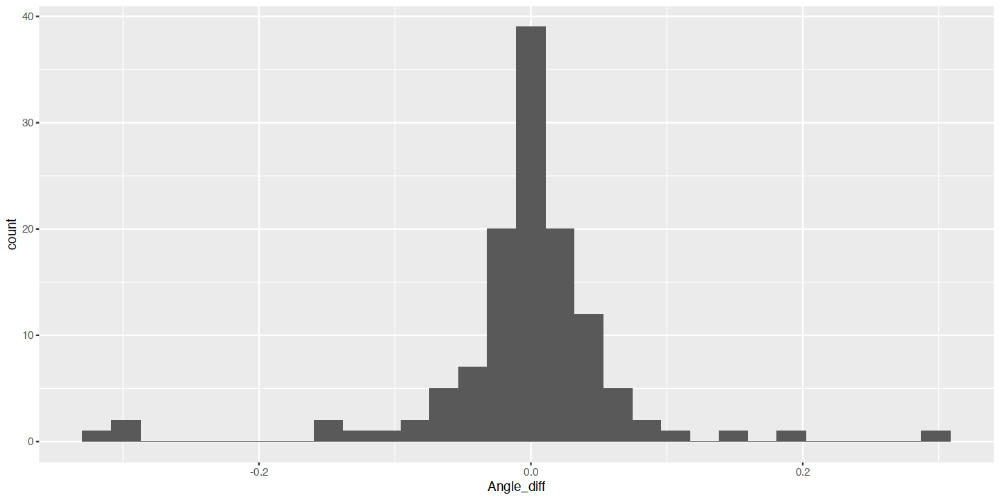

In [1438]:
ggplot(vector_angle_larvae_targets_both_jsd_slim, aes(x = Angle_diff)) +
geom_histogram()

### now with L2

In [1420]:
vector_angle_emb_targets_0.3_jsd  %>%  head
vector_angle_emb_targets_jsd  %>%  head

,Gene,Angle,num_targets,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
,<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ahr-1,0.0133,18,18,0.2049229,4.812295e-01,3.990018e-01,6.209394e-01,-0.006575883,-0.0135534769
2,B0310.2,-0.0341,25,25,0.2173583,8.061872e-01,5.842651e-01,5.756469e-01,-0.002632688,-0.0155852477
3,bcl-11,0.1187,45,46,0.2679824,3.220755e-04,4.362130e-03,3.116161e-01,-0.033230921,-0.0048447840
4,bed-3,0.2805,23,24,0.2271737,8.301666e-01,2.498888e-01,6.226518e-01,0.025115393,-0.0002640638
5,blmp-1,0.6224,241,237,0.3421181,1.103194e-19,9.936358e-15,5.693188e-23,0.135468851,-0.0193760701
6,C38D4.7,-0.0415,21,19,0.2718036,4.611230e-01,6.095438e-01,4.988925e-01,0.006530772,-0.0020218620


,Gene,Angle,nPeaks,nTargets,JSD,wilcoxP,chiP,t_test_p,targetMean,randomMean
,<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ahr-1,0.0176,35,35,0.2092367,5.418940e-01,1.351642e-01,4.147873e-01,-0.004942825,0.007095830
2,B0310.2,0.2547,51,50,0.1781949,4.109957e-01,2.517599e-01,8.494669e-01,-0.002754795,-0.005855845
3,bcl-11,0.1920,90,90,0.2412161,1.070359e-04,1.791366e-03,1.753543e-01,-0.039592184,-0.016332971
4,bed-3,0.2766,45,46,0.2355161,8.218806e-01,7.518209e-01,2.248131e-01,0.008027336,-0.027207441
5,blmp-1,0.5101,310,306,0.3164750,1.679808e-20,9.902814e-18,4.409100e-23,0.118977290,-0.016939005
6,C38D4.7,-0.0627,51,47,0.1259138,9.842382e-01,9.129482e-02,7.395850e-01,0.005661860,0.001706920


In [1428]:
vector_angle_emb_targets_0.3_jsd  %>% select( Gene, Angle, num_targets, nTargets, JSD, wilcoxP)  %>% 
rename("Angle0.3" = "Angle",  "number_targets_0.3" = "num_targets",
      "nTargets0.3" = "nTargets", "JSD0.3" = "JSD", "wilcoxP0.3" = "wilcoxP")  %>%  head

,Gene,Angle0.3,number_targets_0.3,nTargets0.3,JSD0.3,wilcoxP0.3
,<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>
1,ahr-1,0.0133,18,18,0.2049229,4.812295e-01
2,B0310.2,-0.0341,25,25,0.2173583,8.061872e-01
3,bcl-11,0.1187,45,46,0.2679824,3.220755e-04
4,bed-3,0.2805,23,24,0.2271737,8.301666e-01
5,blmp-1,0.6224,241,237,0.3421181,1.103194e-19
6,C38D4.7,-0.0415,21,19,0.2718036,4.611230e-01


In [1429]:
vector_angle_emb_targets_0.3_jsd_slim = vector_angle_emb_targets_0.3_jsd  %>% select( Gene, Angle, num_targets, nTargets, JSD, wilcoxP)  %>% 
rename("Angle0.3" = "Angle",  "number_targets_0.3" = "num_targets",
      "nTargets0.3" = "nTargets", "JSD0.3" = "JSD", "wilcoxP0.3" = "wilcoxP") 

In [1433]:
vector_angle_emb_targets_0_jsd_slim = vector_angle_emb_targets_jsd  %>% select( Gene, Angle, nPeaks, nTargets, JSD, wilcoxP)  %>% 
rename("Angle0" = "Angle",  "number_targets_0" = "nPeaks",
      "nTargets0" = "nTargets", "JSD0" = "JSD", "wilcoxP0" = "wilcoxP") 

In [1434]:
left_join(vector_angle_emb_targets_0_jsd_slim, vector_angle_emb_targets_0.3_jsd_slim , by = "Gene")  %>%  head

,Gene,Angle0,number_targets_0,nTargets0,JSD0,wilcoxP0,Angle0.3,number_targets_0.3,nTargets0.3,JSD0.3,wilcoxP0.3
,<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
1,ahr-1,0.0176,35,35,0.2092367,5.418940e-01,0.0133,18,18,0.2049229,4.812295e-01
2,B0310.2,0.2547,51,50,0.1781949,4.109957e-01,-0.0341,25,25,0.2173583,8.061872e-01
3,bcl-11,0.1920,90,90,0.2412161,1.070359e-04,0.1187,45,46,0.2679824,3.220755e-04
4,bed-3,0.2766,45,46,0.2355161,8.218806e-01,0.2805,23,24,0.2271737,8.301666e-01
5,blmp-1,0.5101,310,306,0.3164750,1.679808e-20,0.6224,241,237,0.3421181,1.103194e-19
6,C38D4.7,-0.0627,51,47,0.1259138,9.842382e-01,-0.0415,21,19,0.2718036,4.611230e-01


In [1435]:
vector_angle_emb_targets_both_jsd_slim = left_join(vector_angle_emb_targets_0_jsd_slim, vector_angle_emb_targets_0.3_jsd_slim , by = "Gene")

In [1436]:
vector_angle_emb_targets_both_jsd_slim = vector_angle_emb_targets_both_jsd_slim  %>% mutate(Angle_diff = Angle0 - Angle0.3)

In [1437]:
vector_angle_emb_targets_both_jsd_slim  %>% arrange(-Angle_diff)

Gene,Angle0,number_targets_0,nTargets0,JSD0,wilcoxP0,Angle0.3,number_targets_0.3,nTargets0.3,JSD0.3,wilcoxP0.3,Angle_diff
<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>
B0310.2,0.2547,51,50,0.17819493,4.109957e-01,-0.0341,25,25,0.21735834,8.061872e-01,0.2888
M03D4.4,0.1477,277,270,0.18859362,7.066631e-02,-0.0416,175,171,0.18029814,2.986433e-01,0.1893
fkh-10,0.2535,19,18,0.33048442,1.949291e-01,0.1129,13,12,0.36381258,4.865030e-01,0.1406
tbx-37,0.0460,237,229,0.10176664,9.595395e-02,-0.0537,119,115,0.05963440,6.506995e-01,0.0997
pag-3,0.2438,64,58,0.11615254,4.878103e-01,0.1569,44,39,0.15978441,3.488906e-01,0.0869
drap-1,0.1407,373,362,0.08739954,3.804991e-02,0.0644,218,213,0.11173341,2.895486e-01,0.0763
bcl-11,0.1920,90,90,0.24121614,1.070359e-04,0.1187,45,46,0.26798244,3.220755e-04,0.0733
ztf-23,-0.0126,714,688,0.10009043,1.325429e-02,-0.0849,436,420,0.11482087,5.854364e-04,0.0723
ttx-3,0.2064,124,122,0.18344267,2.021232e-01,0.1347,64,64,0.27018075,2.702444e-01,0.0717


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


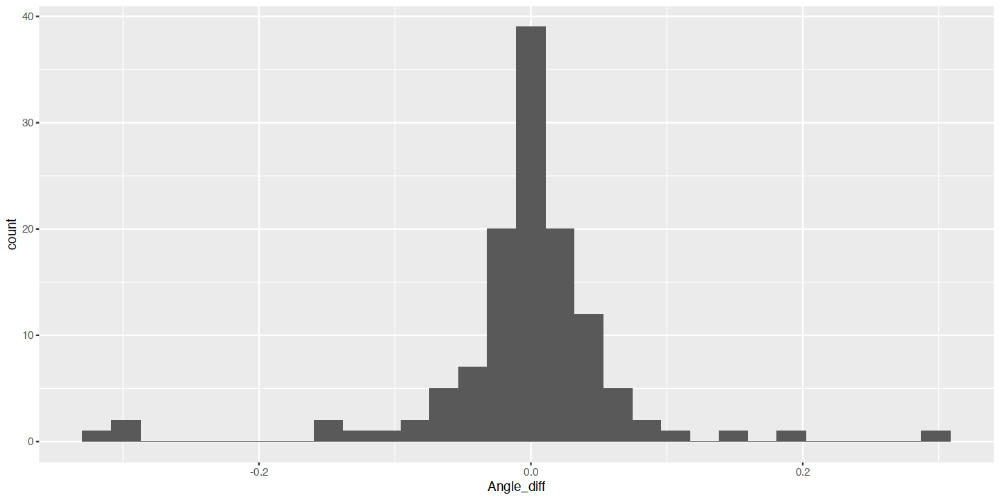

In [1438]:
ggplot(vector_angle_emb_targets_both_jsd_slim, aes(x = Angle_diff)) +
geom_histogram()

## Check matrix names - all seem fine

In [1233]:
ws245old = ws245

In [440]:
ws245 = read.table("WS245_WS285.tsv", header = TRUE)

In [1234]:
T# this looks fine
ws245  %>% head

,Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Y110A7A.10,aap-1,WBGene00000001,Y110A7A.10,aap-1,WBGene00000001,aap-1,aap-1
2,F27C8.1,aat-1,WBGene00000002,F27C8.1,aat-1,WBGene00000002,aat-1,aat-1
3,F07C3.7,aat-2,WBGene00000003,F07C3.7,aat-2,WBGene00000003,aat-2,aat-2
4,F52H2.2,aat-3,WBGene00000004,F52H2.2,aat-3,WBGene00000004,aat-3,aat-3
5,T13A10.10,aat-4,WBGene00000005,T13A10.10,aat-4,WBGene00000005,aat-4,aat-4
6,C55C2.5,aat-5,WBGene00000006,C55C2.5,aat-5,WBGene00000006,aat-5,aat-5


In [1235]:
ws245  %>% count(Common245 == "null")
ws245  %>% count(Common245new == "null")
ws245  %>% count(Common285 == "null")
ws245  %>% count(Common285new == "null")

"Common245 == ""null""",n
<lgl>,<int>
FALSE,9635
TRUE,11180


"Common245new == ""null""",n
<lgl>,<int>
FALSE,20468
TRUE,347


"Common285 == ""null""",n
<lgl>,<int>
FALSE,10801
TRUE,10014


"Common285new == ""null""",n
<lgl>,<int>
FALSE,20523
TRUE,292


In [1236]:
ws245  %>% filter(Common285 == "bcl-11")

Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
F13H6.1,null,WBGene00017430,F13H6.1,bcl-11,WBGene00017430,F13H6.1,bcl-11


In [680]:
celltype_expr = read.table("data/aax1971_Table_S7", header = TRUE, sep = "\t")

In [681]:
exp_matrix = celltype_expr[, c(1, 3, 6)]  %>%  
pivot_wider(names_from = "cell.bin", values_from = "bootstrap.median.tpm")

In [683]:
exp_matrix  %>% head

gene,ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,⋯,URX:390_510,URX:510_650,URX:gt_650,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aap-1,30.9,0.0,37.6,0.0,29.4,52.5,56.7,61.9,54.3,⋯,85.9,122.5,26.5,134.7,57.8,49.4,85.5,78.2,44.7,24.8
aat-1,4.2,0.0,20.1,5.3,0.0,0.0,0.0,7.6,0.0,⋯,12.3,39.2,139.5,0.0,65.8,3.3,0.0,27.9,47.6,226.9
aat-2,60.6,18.4,235.4,10.6,188.8,21.5,334.9,483.5,195.8,⋯,68.6,145.1,128.6,0.0,0.0,0.0,206.6,23.6,30.8,29.7
aat-3,203.2,209.5,243.0,57.6,423.4,56.4,287.6,73.2,0.0,⋯,81.5,27.9,48.6,134.0,161.1,239.0,532.7,78.1,59.3,0.0
aat-4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
aat-5,15.8,0.0,0.0,0.0,0.0,0.0,9.6,17.5,18.6,⋯,0.0,7.5,28.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [684]:

## get WBG names for matrix genes from old cds
cds_jp = readRDS("data/all.cds.bg.corrected.actually.final.M3.rds")

In [686]:
df_genes = fData(cds_jp)  %>% as.data.frame   %>% select(id, gene_short_name)

In [1237]:
dim(df_genes)

[1] 20222     2

### Use the gene table from Jonathan's cds to get WBG name for all the embryo genes

In [688]:
left_join(exp_matrix,df_genes , 
          by = c("gene" = "gene_short_name"))  %>% dim

[1] 20222   411

In [689]:
exp_matrix = left_join(exp_matrix,df_genes , 
          by = c("gene" = "gene_short_name"))

In [690]:
exp_matrix$gene = NULL

In [691]:
# now has the wbg name and not the short name
exp_matrix  %>% head

ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,ADL:gt_650,⋯,URX:510_650,URX:gt_650,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650,id
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
30.9,0.0,37.6,0.0,29.4,52.5,56.7,61.9,54.3,41.9,⋯,122.5,26.5,134.7,57.8,49.4,85.5,78.2,44.7,24.8,WBGene00000001
4.2,0.0,20.1,5.3,0.0,0.0,0.0,7.6,0.0,102.3,⋯,39.2,139.5,0.0,65.8,3.3,0.0,27.9,47.6,226.9,WBGene00000002
60.6,18.4,235.4,10.6,188.8,21.5,334.9,483.5,195.8,0.0,⋯,145.1,128.6,0.0,0.0,0.0,206.6,23.6,30.8,29.7,WBGene00000003
203.2,209.5,243.0,57.6,423.4,56.4,287.6,73.2,0.0,20.5,⋯,27.9,48.6,134.0,161.1,239.0,532.7,78.1,59.3,0.0,WBGene00000004
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,WBGene00000005
15.8,0.0,0.0,0.0,0.0,0.0,9.6,17.5,18.6,28.8,⋯,7.5,28.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,WBGene00000006


In [698]:
dim(exp_matrix)

[1] 20222   410

In [692]:
ws245  %>%  head

,Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Y110A7A.10,aap-1,WBGene00000001,Y110A7A.10,aap-1,WBGene00000001,aap-1,aap-1
2,F27C8.1,aat-1,WBGene00000002,F27C8.1,aat-1,WBGene00000002,aat-1,aat-1
3,F07C3.7,aat-2,WBGene00000003,F07C3.7,aat-2,WBGene00000003,aat-2,aat-2
4,F52H2.2,aat-3,WBGene00000004,F52H2.2,aat-3,WBGene00000004,aat-3,aat-3
5,T13A10.10,aat-4,WBGene00000005,T13A10.10,aat-4,WBGene00000005,aat-4,aat-4
6,C55C2.5,aat-5,WBGene00000006,C55C2.5,aat-5,WBGene00000006,aat-5,aat-5


In [699]:
ws245  %>% select(WBGene285, Common285new)  %>% dim

[1] 20815     2

In [712]:
left_join(exp_matrix, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(!(is.na(Common285new)))    %>% dim
left_join(exp_matrix, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
 count(Common285new)  %>% dim

[1] 20048   411

[1] 20049     2

In [695]:
left_join(exp_matrix, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(Common285new != "null")  %>% count(Common285new)  %>% arrange(-n)  %>% head
# no duplicates!

Common285new,n
<chr>,<int>
2L52.1,1
4R79.2,1
AC3.12,1
AC3.5,1
AC7.3,1
AC8.10,1


In [713]:
exp_matrix = left_join(exp_matrix, ws245  %>% select(WBGene285, Common285new), by = c("id" = "WBGene285"))  %>% 
filter(!(is.na(Common285new)))


In [715]:
exp_matrix    %>% count(Common285new)  %>%  dim

[1] 20048     2

In [716]:
exp_matrix

In [722]:
exp_matrix$id = NULL

In [723]:
head(exp_matrix)

,ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,ADL:gt_650,⋯,URX:390_510,URX:510_650,URX:gt_650,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
aap-1,30.9,0.0,37.6,0.0,29.4,52.5,56.7,61.9,54.3,41.9,⋯,85.9,122.5,26.5,134.7,57.8,49.4,85.5,78.2,44.7,24.8
aat-1,4.2,0.0,20.1,5.3,0.0,0.0,0.0,7.6,0.0,102.3,⋯,12.3,39.2,139.5,0.0,65.8,3.3,0.0,27.9,47.6,226.9
aat-2,60.6,18.4,235.4,10.6,188.8,21.5,334.9,483.5,195.8,0.0,⋯,68.6,145.1,128.6,0.0,0.0,0.0,206.6,23.6,30.8,29.7
aat-3,203.2,209.5,243.0,57.6,423.4,56.4,287.6,73.2,0.0,20.5,⋯,81.5,27.9,48.6,134.0,161.1,239.0,532.7,78.1,59.3,0.0
aat-4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,⋯,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
aat-5,15.8,0.0,0.0,0.0,0.0,0.0,9.6,17.5,18.6,28.8,⋯,0.0,7.5,28.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1314]:
## See how matrix names match the target names
target_genes = unique(as.data.frame(worm_peaks_TF$Gene))  

In [1321]:
head(target_genes)

,worm_peaks_TF$Gene
,<chr>
1,F59C6.18
2,ndk-1
3,vps-4
4,R06C1.4
6,F58D5.5
7,K11D2.4


In [1326]:
target_genes = target_genes  %>% rename(gene = "worm_peaks_TF$Gene")  

In [1330]:
matrix_genes = ((exp_matrix  %>% rownames_to_column("gene"))$gene)

In [1335]:
matrix_gene = as.data.frame(matrix_genes)  %>% rename(gene = matrix_genes)
head(matrix_gene)

,gene
,<chr>
1,aap-1
2,aat-1
3,aat-2
4,aat-3
5,aat-4
6,aat-5


In [1341]:
setdiff(target_genes, matrix_gene)  
setdiff(matrix_gene, target_genes)  
# these all look to be new genes in WS285 that won't be in the matrix.  

gene
<chr>
W02H5.19
K11D12.14
C49F8.15
Y41G9A.17
H12C20.7
W09G10.9
Y62E10A.23
F55C5.17
C04C11.25


gene
<chr>
aat-4
abf-3
abf-4
abt-1
abu-1
abu-2
abu-6
abu-7
abu-9


In [1343]:
TF_TargetAngles_2_84_emb_0 = read_tsv("vector_data/TF_TargetAngles_2_84_emb_0.tsv")

Rows: 41508 Columns: 8
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): Gene, TF, peakID, exp, lifeStage
dbl (3): CosineAngle, nPeaks, rank

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [1345]:
TF_TargetAngles_2_84_emb_0  %>% filter(TF == "blmp-1")  %>% dim
# so 4 are missing

[1] 306   8

In [1347]:
blmp_genes = (TF_TargetAngles_2_84_emb_0  %>% filter(TF == "blmp-1"))$Gene

In [1349]:
blmp_genes = as.data.frame(blmp_genes)

In [1352]:
blmp_genes = blmp_genes  %>% rename(gene = blmp_genes)

In [1353]:
head(blmp_genes)

,gene
,<chr>
1,B0205.4
2,B0334.20
3,B0334.6
4,B0353.1
5,B0454.6
6,C01A2.2


In [1354]:
setdiff(blmp_genes, target_genes) 

gene
<chr>


In [1358]:
blmp_genes_function = as.data.frame(blmp_genes_function)  %>% rename(gene = "blmp_genes_function")

In [1359]:
setdiff(blmp_genes_function, blmp_genes) 

gene
<chr>
Y110A2AL.5
C55C3.73
T06E8.2
F55D1.1


In [1367]:
exp_matrix [ "F55D1.1",  ]  %>% rowwise  %>% mutate(mx = max(c_across(1:409)))

ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,ADL:gt_650,⋯,URX:510_650,URX:gt_650,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650,mx
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [26]:
ls()

[1] "angleCosine"           "cluster_nPeaks_genes"  "exp_matrix"           
 [4] "exp_matrix_mean"       "f5b"                   "figure5b"             
 [7] "file_name"             "gene_clusters"         "gene_clusters_peaksum"
[10] "gene_max_mean_entropy" "genes_peaks"           "hkg_285"              
[13] "lb"                    "ranklb"                "rankub"               
[16] "tf"                    "tfn"                   "ub"                   
[19] "wbg_hkg"               "worm_peaks_TF"         "worm_peaks_TF_noHOT"  
[22] "ws245"

In [28]:
cds_jp = readRDS("data/all.cds.bg.corrected.actually.final.M3.rds")

## Making colored bargraphs of the TF and aggregate expression

### embryo

In [32]:
unique((colData(cds_jp)  %>% as.data.frame)$plot.cell.type)  %>% sort

[1] "ABarpaaa_lineage"                         
  [2] "ADA_ADE_grandparent"                      
  [3] "ADE"                                      
  [4] "ADEsh"                                    
  [5] "ADF"                                      
  [6] "ADF_AWB"                                  
  [7] "ADL"                                      
  [8] "ADL_parent"                               
  [9] "AFD"                                      
 [10] "AIA"                                      
 [11] "AIB"                                      
 [12] "AIM"                                      
 [13] "AIN"                                      
 [14] "AIN_parent"                               
 [15] "AIY"                                      
 [16] "AIZ"                                      
 [17] "ALA"                                      
 [18] "ALM_BDU"                                  
 [19] "ALM_PLM"                                  
 [20] "ALN"                                      
 [21] "AMsh"                                     
 [22] "AMso"                                     
 [23] "AMso_parent"                              
 [24] "ant_arc_V"                                
 [25] "Anterior_arcade_cell"                     
 [26] "Arcade_cell_anterior_and_posterior"       
 [27] "ASE"                                      
 [28] "ASE_parent"                               
 [29] "ASG"                                      
 [30] "ASG_AWA"                                  
 [31] "ASH"                                      
 [32] "ASI"                                      
 [33] "ASI_parent"                               
 [34] "ASJ"                                      
 [35] "ASK"                                      
 [36] "ASK_parent"                               
 [37] "AUA"                                      
 [38] "AVA"                                      
 [39] "AVB"                                      
 [40] "AVD"                                      
 [41] "AVE"                                      
 [42] "AVG"                                      
 [43] "AVH"                                      
 [44] "AVH_parent"                               
 [45] "AVJ"                                      
 [46] "AVK"                                      
 [47] "AVL"                                      
 [48] "AWA"                                      
 [49] "AWB"                                      
 [50] "AWC"                                      
 [51] "B"                                        
 [52] "B_F_K_Kp_U_Y"                             
 [53] "BAG"                                      
 [54] "Body_wall_muscle"                         
 [55] "BWM_anterior"                             
 [56] "BWM_far_posterior"                        
 [57] "BWM_head_row_1"                           
 [58] "BWM_head_row_2"                           
 [59] "BWM_posterior"                            
 [60] "CAN"                                      
 [61] "CEP"                                      
 [62] "CEPsh"                                    
 [63] "CEPso"                                    
 [64] "Ciliated_amphid_neuron"                   
 [65] "Ciliated_non_amphid_neuron"               
 [66] "Coelomocyte"                              
 [67] "DA"                                       
 [68] "DA_DB"                                    
 [69] "DB"                                       
 [70] "DD"                                       
 [71] "DVA"                                      
 [72] "DVC"                                      
 [73] "DVC_parent"                               
 [74] "Excretory_cell"                           
 [75] "Excretory_cell_parent"                    
 [76] "Excretory_duct_and_pore"                  
 [77] "Excretory_gland"                          
 [78] "F_U"                                      
 [79] "FLP"                                      
 [80] "g1A"                                      
 [

In [346]:
ls()

[1] "agg_subtitle"                        "agg_totals"                         
 [3] "angle"                               "angleCosine"                        
 [5] "BWM"                                 "cbbPalette"                         
 [7] "cbbPalette11"                        "cbbPalette12"                       
 [9] "cds_jp"                              "ChIP_larvae_TFs"                    
[11] "classes"                             "cluster_nPeaks"                     
[13] "cluster_nPeaks_genes"                "compare"                            
[15] "eq1genes"                            "Excretory"                          
[17] "exp_matrix"                          "exp_matrix_emb_mean"                
[19] "exp_matrix_L2"                       "exp_matrix_L2_mean"                 
[21] "exp_matrix_lineage"                  "exp_matrix_lineage_mean"            
[23] "exp_matrix_mean"                     "exp_matrix_YA"                      
[25] "exp_matrix_YA_mean"                  "expression_name_change"             
[27] "f5b"                                 "figure5b"                           
[29] "file_name"                           "fly_intervals"                      
[31] "fly_values"                          "gene_clusters"                      
[33] "gene_clusters_peaksum"               "gene_max_mean_entropy"              
[35] "genes_peaks"                         "Germline"                           
[37] "gg_agg"                              "gg_both"                            
[39] "gg_tf"                               "Glia"                               
[41] "gt1lte6genes"                        "gt240genes"                         
[43] "gt30lte84genes"                      "gt6lte30genes"                      
[45] "gt84lte240genes"                     "hkg_285"                            
[47] "hkg_noCluster"                       "hypodermis"                         
[49] "Hypodermis"                          "Intestine"                          
[51] "L2_classes"                          "lb"                                 
[53] "meso"                                "Neurons"                            
[55] "number_targets"                      "Pharynx"                            
[57] "ranklb"                              "rankub"                             
[59] "Rectal"                              "Seam"                               
[61] "sub_mat"                             "t_tf_values"                        
[63] "t_tf_values_row"                     "ta"                                 
[65] "table2_function"                     "tar"                                
[67] "target_numbers"                      "target_set"                         
[69] "tf"                                  "TF_agg_L2_plot"                     
[71] "TF_agg_plot"                         "tf_title"                           
[73] "tf_values"                           "tfn"                                
[75] "title"                               "TSS_gene"                           
[77] "TSS_gene2"                           "ub"                                 
[79] "vector_angle_emb_2_noHOT_3_targets"  "vector_angle_emb_rank_0_targets"    
[81] "vector_angle_emb_rank_0.3_targets"   "vector_angle_emb_targets"           
[83] "vector_angle_L4_YA_rank_0_targets"   "vector_angle_L4_YA_targets"         
[85] "vector_angle_larvae_rank_0_targets"  "vector_angle_larvae_targets"        
[87] "vector_angle_lineage_rank_0_targets" "vector_angle_lineage_targets"       
[89] "vector_angles_function"              "wbg_hkg"                            
[91] "worm_intervals"                      "worm_peaks_TF"                      
[93] "worm_peaks_TF_noHOT"                 "worm_values"                        
[95] "ws245"

In [135]:
classes = read.table("plot.cell.type_with_broad cell class.txt", header = FALSE)

In [136]:
classes = classes  %>% rename("cell.type.bin" = "V1", "broad_class" = "V2")
head(classes)

,cell.type.bin,broad_class
,<chr>,<chr>
1,ADE:390_510,Neurons
2,ADEsh:390_510,Neurons
3,ADF:390_510,Neurons
4,ADF:510_650,Neurons
5,ADF_AWB_terminal_cells_but_undifferentiated,Neurons
6,ADF:gt_650,Neurons


In [201]:
classes  %>% count(broad_class)

broad_class,n
<chr>,<int>
BlastCells,2
BodyWallMuscle,38
Excretory,14
Germline,3
Glia,21
Hypodermis,33
Intestine,14
Mesoderm,32
Neurons,180


In [126]:
classes  %>% filter(cell.type.bin == "BodyWallMuscle")

cell.type.bin,broad_class
<chr>,<chr>


In [321]:
BWM = (classes  %>% filter(broad_class == "BodyWallMuscle"))$cell.type.bin
meso = (classes  %>% filter(broad_class == "Mesoderm"))$cell.type.bin
Neurons = (classes  %>% filter(broad_class == "Neurons"))$cell.type.bin
Pharynx = (classes  %>% filter(broad_class == "Pharynx"))$cell.type.bin
Hypodermis = (classes  %>% filter(broad_class == "Hypodermis"))$cell.type.bin
Intestine = (classes  %>% filter(broad_class == "Intestine"))$cell.type.bin
Glia = (classes  %>% filter(broad_class == "Glia"))$cell.type.bin
Seam = (classes  %>% filter(broad_class == "Seam"))$cell.type.bin
Excretory = (classes  %>% filter(broad_class == "Excretory"))$cell.type.bin
Rectal = (classes  %>% filter(broad_class == "Rectal"))$cell.type.bin
Germline = (classes  %>% filter(broad_class == "Germline"))$cell.type.bin

In [157]:
options(repr.plot.width=14, repr.plot.height=8)

In [ ]:
#> $safe
#>      safe_blue       safe_red    safe_yellow     safe_green 
#>      "#88CCEE"      "#CC6677"      "#DDCC77"      "#117733" 
#>    safe_violet    safe_purple safe_bluegreen      safe_bush 
#>      "#332288"      "#AA4499"      "#44AA99"      "#999933" 
#>   safe_reddish      safe_wine   safe_skyblue 
#>      "#882255"      "#661100"      "#6699CC" 


In [206]:
length(BWM)
length(meso)
length(Neurons)
length(Pharynx)
length(Hypodermis)
length(Intestine)
length(Glia)
length(Seam)
length(Excretory)
length(Rectal)
length(Germline)

[1] 38

[1] 32

[1] 180

[1] 51

[1] 33

[1] 14

[1] 21

[1] 8

[1] 14

[1] 13

[1] 3

In [227]:
cbbPalette12 = c("#88CCEE", "#CC6677", "#DDCC77", "#117733", "#332288", "#AA4499", "#44AA99",
                 "#999933", "#000000", "#882255", "#661100","#6699CC")
cbbPalette <- c( "#D55E00", "#E69F00", "#56B4E9", 
                 "#F0E442", "#009E73", "#0072B2",  "#000000", "#CC79A7",  "#66CC99")

In [92]:
library(cowplot)

[1] 621


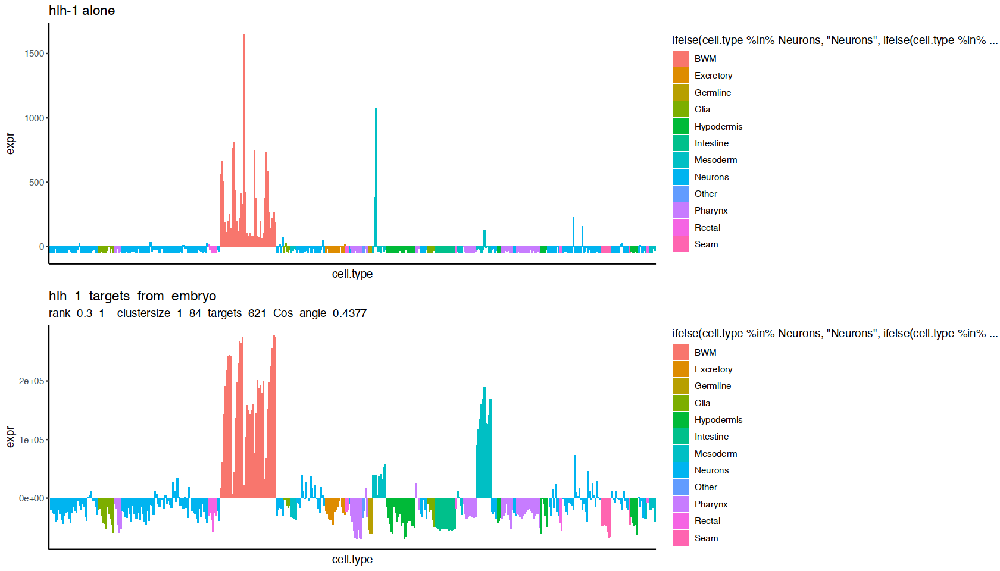

In [228]:
tf = "hlh-1"
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0.3
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & grepl("emb", exp)
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



# if(number_targets > 1){

    sub_mat = exp_matrix_mean[ rownames(exp_matrix_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_emb_targets[n, 1] = tfn
 #    vector_angle_emb_targets[n, 2] = angle
#    vector_angle_emb_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

    gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(),  legend.key.size = unit(0.6, 'cm')) 


    title = paste(tfn, "targets_from_embryo", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other")))))))))))))  +
 geom_bar(stat="identity", ) + 
ggtitle(title, subtitle = agg_subtitle) +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.6, 'cm'))

#    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    print(gg_both)
    
#dev.off()

#}

In [184]:
cbbPalette <- c( "#D55E00", "#E69F00", "#56B4E9", 
                 "#F0E442", "#009E73", "#0072B2",  "#000000", "#CC79A7",  "#66CC99")

[1] 241


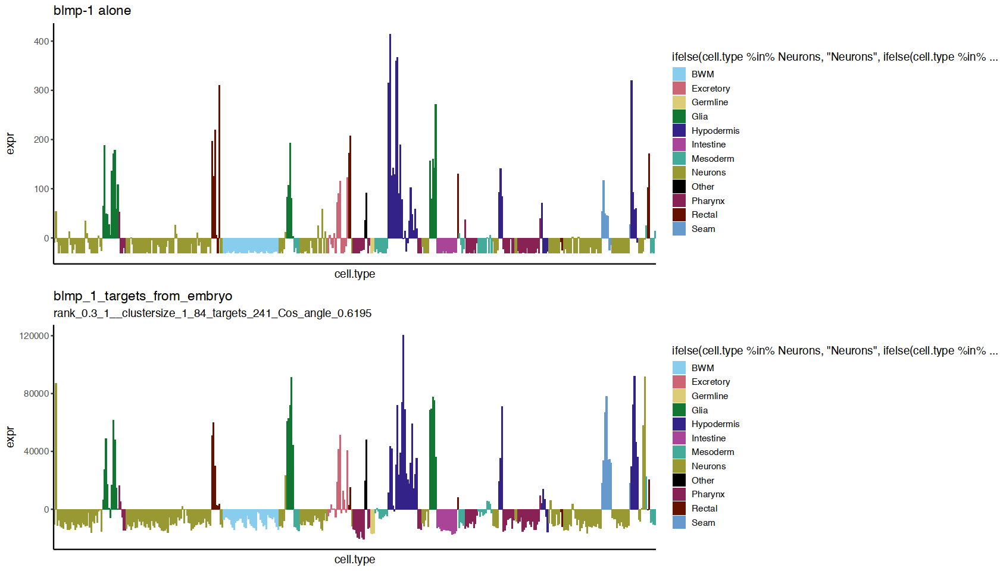

In [231]:
tf = "blmp-1"
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0.3
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & grepl("emb", exp)
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



# if(number_targets > 1){

    sub_mat = exp_matrix_mean[ rownames(exp_matrix_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_emb_targets[n, 1] = tfn
 #    vector_angle_emb_targets[n, 2] = angle
#    vector_angle_emb_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

   gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm')) +
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "goldenrod1", "blue", 
#                              "blueviolet", "black", "cyan3", "chartreuse")) 


    title = paste(tfn, "targets_from_embryo", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
 geom_bar(stat="identity", ) + 
ggtitle(title, subtitle = agg_subtitle) +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'))+
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "yellow", "blue", 
#                              "darkorchid1", "black", "cyan3", "chartreuse")) 

#    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    print(gg_both)
    
#dev.off()

#}

In [28]:
TF_agg_plot2 = function(gene, matrix){
    tf = gene
    exp_matrix_mean = matrix
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & grepl("emb", exp)
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



# if(number_targets > 1){

    sub_mat = exp_matrix_mean[ rownames(exp_matrix_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_emb_targets[n, 1] = tfn
 #    vector_angle_emb_targets[n, 2] = angle
#    vector_angle_emb_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

   gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
           # labs(color = "Cell class") +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
         legend.title=element_blank()) +
    guides(color = guide_legend(title = "Cell class")) +
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "goldenrod1", "blue", 
#                              "blueviolet", "black", "cyan3", "chartreuse")) 


    title = paste(tfn, "targets_from_embryo", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
 geom_bar(stat="identity", ) + 
ggtitle(title, subtitle = agg_subtitle) +
        labs(color = "Cell class") +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
                 legend.title=element_blank())+
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "yellow", "blue", 
#                              "darkorchid1", "black", "cyan3", "chartreuse")) 

#    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    print(gg_both)
    
#dev.off()

#}
}

In [349]:
vector_angle_emb_targets  %>% arrange(-Angle)  %>%  head(30)

,Gene,Angle,num_targets
,<chr>,<dbl>,<int>
1,ceh-48,0.7920,474
2,blmp-1,0.6224,241
3,pat-9,0.5628,44
4,elt-3,0.5348,80
5,mep-1,0.5283,444
6,unc-3,0.5207,74
7,flh-1,0.4886,7
8,ceh-43,0.4557,79
9,rnt-1,0.4469,275


In [29]:
cbbPalette12 = c("#882255", "#CC6677", "#DDCC77", "#117733", "#332288", "#AA4499", "#44AA99",
                 "#999933", "#000000", "#88CCEE", "#661100","#6699CC")
#cbbPalette <- c( "#D55E00", "#E69F00", "#56B4E9", 
 #                "#F0E442", "#009E73", "#0072B2",  "#000000", "#CC79A7",  "#66CC99")

In [32]:
ls()

[1] "cbbPalette12"          "cluster_nPeaks_genes"  "f2a"                  
 [4] "f5b"                   "figure2a"              "Figure3_worm_violin"  
 [7] "figure5b"              "gene_clusters"         "gene_clusters_peaksum"
[10] "genes_peaks"           "gt1lte6genes"          "gt240genes"           
[13] "gt30lte84genes"        "gt6lte30genes"         "gt84lte240genes"      
[16] "peaks_by_cluster_size" "table2_function"       "target_numbers"       
[19] "TF_agg_plot2"          "wbg_hkg"               "worm_peaks_TF"        
[22] "ws245"

In [31]:
TF_agg_plot2(gene = "che-1")

ERROR: Error in TF_agg_plot2(gene = "che-1"): argument "matrix" is missing, with no default


[1] 550


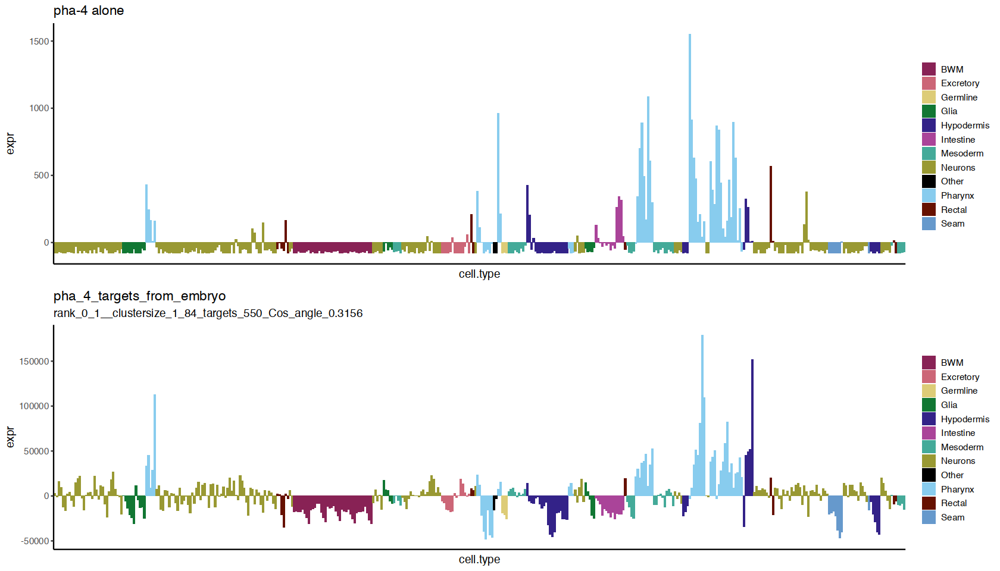

In [421]:
TF_agg_plot2(gene = "pha-4", exp_matrix_mean_order)

[1] 290


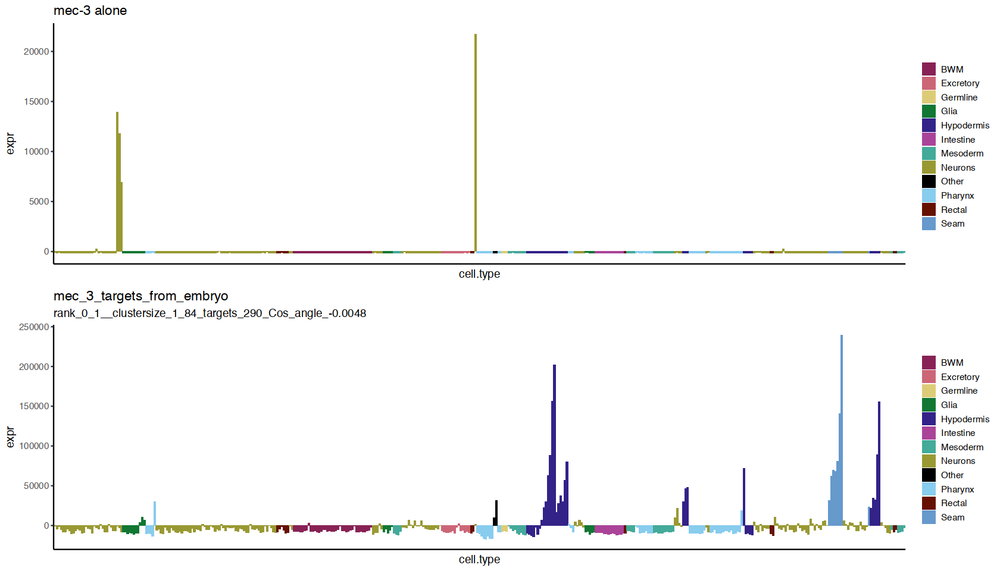

In [363]:
TF_agg_plot(gene = "mec-3")

[1] 0


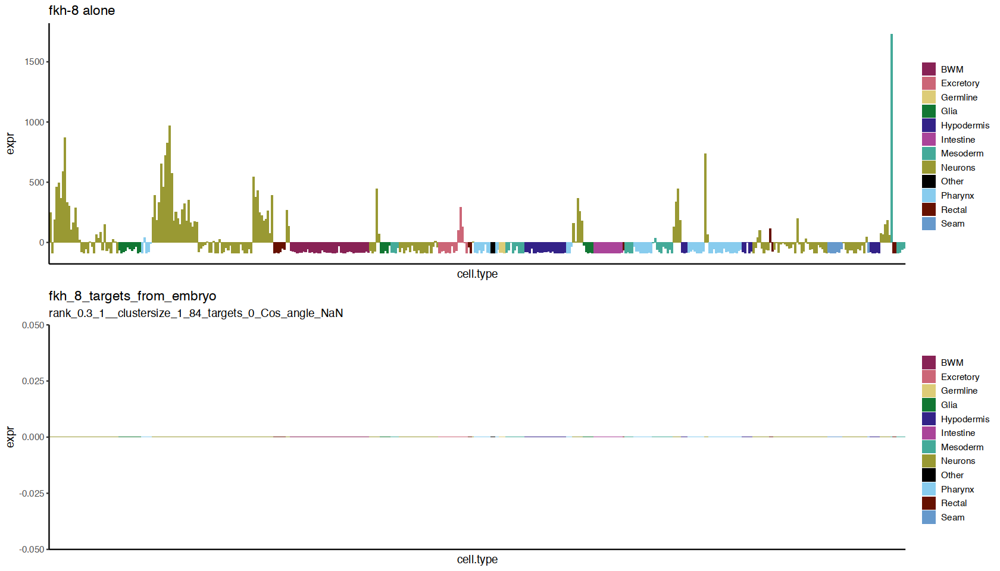

In [258]:
TF_agg_plot(gene = "fkh-8")

In [109]:
colnames(exp_matrix)  %>% tail(109)

[1] "OLQ:390_510"                                      
  [2] "OLQ:510_650"                                      
  [3] "P_cell:270_330"                                   
  [4] "P_cell:330_390"                                   
  [5] "P_cell:390_450"                                   
  [6] "Pharyngeal_intestinal_valve:210_270"              
  [7] "Pharyngeal_intestinal_valve:270_330"              
  [8] "Pharyngeal_intestinal_valve:330_390"              
  [9] "Pharyngeal_intestinal_valve:390_450"              
 [10] "Pharyngeal_intestinal_valve:450_510"              
 [11] "Pharyngeal_intestinal_valve:510_580"              
 [12] "Pharyngeal_intestinal_valve:580_650"              
 [13] "Pharyngeal_muscle_incomplete_dissociation:510_650"
 [14] "PHB_and_possibly_PHA:390_510"                     
 [15] "PHB_and_possibly_PHA:510_650"                     
 [16] "pm1_pm2:330_390"                                  
 [17] "pm1_pm2:390_450"                                  
 [18] "pm1_pm2:450_510"                                  
 [19] "pm3_pm4_pm5:210_270"                              
 [20] "pm3_pm4_pm5:270_330"                              
 [21] "pm3_pm4_pm5:330_390"                              
 [22] "pm3_pm4_pm5:390_450"                              
 [23] "pm3_pm4_pm5:450_510"                              
 [24] "pm3_pm4_pm5:510_580"                              
 [25] "pm6:330_390"                                      
 [26] "pm6:390_450"                                      
 [27] "pm7:270_330"                                      
 [28] "pm7:330_390"                                      
 [29] "pm7:390_450"                                      
 [30] "pm8:330_510"                                      
 [31] "Possibly_ant_arc_V:510_650"                       
 [32] "Possibly_hyp1V:510_650"                           
 [33] "Posterior_arcade_cell:390_450"                    
 [34] "Posterior_arcade_cell:450_510"                    
 [35] "Posterior_arcade_cell:510_580"                    
 [36] "Posterior_arcade_cell:580_650"                    
 [37] "PVP:330_390"                                      
 [38] "PVP:390_510"                                      
 [39] "PVP:510_650"                                      
 [40] "PVQ_and_possibly_PVC:330_390"                     
 [41] "PVQ_and_possibly_PVC:390_510"                     
 [42] "PVR:330_390"                                      
 [43] "PVT:510_650"                                      
 [44] "PVT:gt_650"                                       
 [45] "Rectal_gland:390_580"                             
 [46] "Rectal_gland:580_650"                             
 [47] "RIA:330_390"                                      
 [48] "RIA:390_510"                                      
 [49] "RIA:510_650"                                      
 [50] "RIA:gt_650"                                       
 [51] "RIB:390_510"                                      
 [52] "RIB:510_650"                                      
 [53] "RIC:390_510"                                      
 [54] "RIC:510_650"                                      
 [55] "RID:330_390"                                      
 [56] "RID:510_650"                                      
 [57] "RIH:390_510"                                      
 [58] "RIM:330_390"                                      
 [59] "RIM:390_510"                                      
 [60] "RIM:510_650"                                      
 [61] "RIS:390_510"                                      
 [62] "RIS:510_650"                                      
 [63] "RIS:gt_650"                                       
 [64] "RIV:330_390"                                      
 [65] "RIV:390_510"                                      
 [66] "RIV:510_650"                                      
 [67] "RMD:330_390"                                      
 [68] "RMD:390_510"                                      
 [69] "RMD:510_650"                                      


### change the order of the celltype to sort by class

In [372]:
reorder_column_names = (classes  %>% arrange(broad_class))$cell.type.bin

In [373]:
exp_matrix_mean_copy = exp_matrix_mean

In [375]:
exp_matrix_mean_order = exp_matrix_mean[,c(reorder_column_names)] 

In [406]:
# now have to chang the plot function to keep order
TF_agg_plot3 = function(gene){
    tf = gene
    # exp_matrix_mean_order = matrix
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & grepl("emb", exp)
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_mean_order  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean_order) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")

t_tf_values_row$cell.type = factor(t_tf_values_row$cell.type, levels = (c(reorder_column_names)))

# if(number_targets > 1){

    sub_mat = exp_matrix_mean_order[ rownames(exp_matrix_mean_order) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")
    
    tar$cell.type = factor(tar$cell.type, levels = (c(reorder_column_names)))

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_emb_targets[n, 1] = tfn
 #    vector_angle_emb_targets[n, 2] = angle
#    vector_angle_emb_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

   gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
           # labs(color = "Cell class") +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
         legend.title=element_blank()) +
    guides(color = guide_legend(title = "Cell class")) +
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "goldenrod1", "blue", 
#                              "blueviolet", "black", "cyan3", "chartreuse")) 

tar$cell.type = factor(tar$cell.type)
    title = paste(tfn, "targets_from_embryo", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
 geom_bar(stat="identity", ) + 
ggtitle(title, subtitle = agg_subtitle) +
        labs(color = "Cell class") +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
                 legend.title=element_blank())+
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "yellow", "blue", 
#                              "darkorchid1", "black", "cyan3", "chartreuse")) 

#    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    print(gg_both)
    
#dev.off()

#}
}

In [383]:
head(exp_matrix_mean_order)

,G2_and_W_blasts:270_330,G2_and_W_blasts:330_390,BWM_anterior:210_270,BWM_anterior:270_330,BWM_anterior:330_390,BWM_anterior:390_450,BWM_anterior:450_510,BWM_anterior:510_580,BWM_anterior:580_650,BWM_anterior:gt_650,⋯,Y:270_330,Y:330_390,Seam_cell:270_330,Seam_cell:330_390,Seam_cell:390_450,Seam_cell:450_510,Seam_cell:510_580,Seam_cell:580_650,Seam_cell:gt_650,T:270_330
aap-1,-22.04328,-38.74328,-10.34328,12.256724,-13.44328,-22.043276,-25.44328,-24.54328,-38.74328,-19.5432763,⋯,19.05672,10.65672,-2.243276,-19.64328,-20.44328,-31.2432763,-37.64328,-35.34328,-38.7432763,-3.843276
aat-1,-25.79511,-54.79511,-54.79511,-54.795110,-53.09511,-50.695110,-54.79511,-49.39511,-54.79511,-54.7951100,⋯,11.00489,-51.49511,19.804890,117.60489,151.00489,33.3048900,-52.39511,-54.79511,-3.7951100,-52.795110
aat-2,-49.68704,-49.68704,52.41296,28.312958,67.71296,54.112958,55.91296,44.61296,18.11296,0.9129584,⋯,-49.68704,-49.68704,-46.087042,-45.78704,-44.28704,-48.8870416,-46.18704,-49.68704,-49.6870416,-49.687042
aat-3,-71.64401,51.15599,10.35599,-44.244010,-24.54401,1.055990,129.15599,145.95599,-85.14401,-98.7440098,⋯,12.65599,90.55599,-3.144010,-42.14401,-92.64401,-145.9440098,-142.74401,-148.44401,-101.9440098,-116.244010
aat-4,-1.42934,-1.42934,-1.42934,-1.429340,-1.42934,-1.429340,-1.42934,-1.42934,-1.42934,-1.4293399,⋯,-1.42934,-1.42934,-1.429340,-1.42934,-1.42934,0.9706601,1.57066,-1.42934,-1.4293399,-1.429340
aat-5,-12.83790,-12.83790,-12.83790,-7.637897,-10.13790,-8.937897,23.16210,88.06210,132.16210,63.2621027,⋯,-12.83790,-12.83790,-12.237897,-12.33790,-12.83790,-12.8378973,-12.83790,-12.83790,0.7621027,-12.837897


In [195]:
TF_agg_plot3("blmp-1")

ERROR: Error in TF_agg_plot3("blmp-1"): could not find function "TF_agg_plot3"


In [402]:
tf_values = exp_matrix_mean_order  %>% as.data.frame  %>% 
        filter(rownames(exp_matrix_mean_order) == "hlh-1")
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")

t_tf_values_row$cell.type = factor(t_tf_values_row$cell.type, levels = (c(reorder_column_names)))

In [403]:
t_tf_values_row  %>% head

,cell.type,expr
,<fct>,<dbl>
1,G2_and_W_blasts:270_330,-49.37213
2,G2_and_W_blasts:330_390,-49.37213
3,BWM_anterior:210_270,558.12787
4,BWM_anterior:270_330,660.02787
5,BWM_anterior:330_390,506.92787
6,BWM_anterior:390_450,185.32787


In [404]:
   gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
           # labs(color = "Cell class") +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
         legend.title=element_blank()) +
    guides(color = guide_legend(title = "Cell class")) +
scale_fill_manual(values = cbbPalette12)


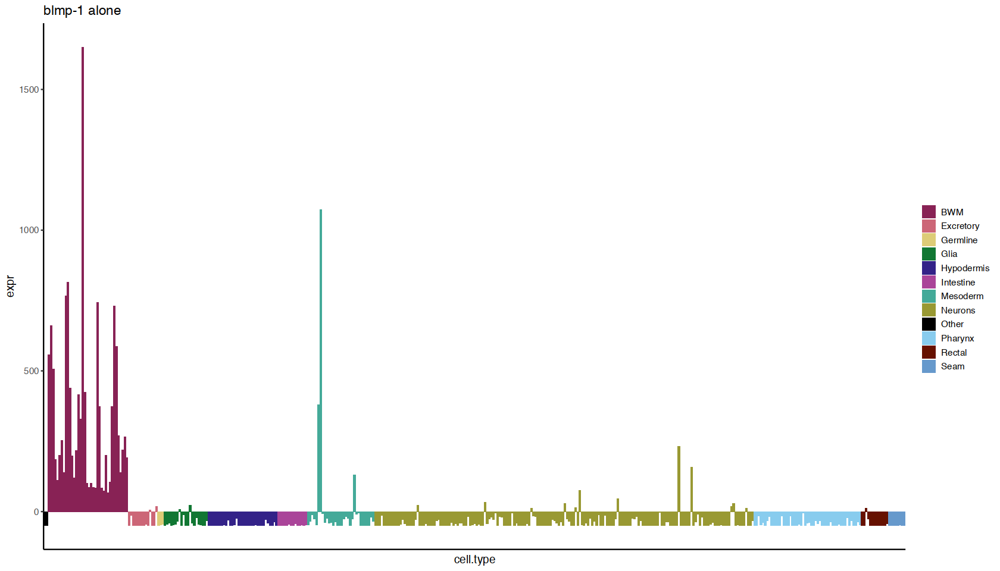

In [405]:
gg_tf

In [ ]:
df$team = factor(df$team, levels = c('C', 'A', 'B'))

### Redo the L2 

In [279]:
load("data/vector_angle_figures.RData")

In [299]:
ls()

[1] "agg_subtitle"                        "agg_totals"                         
 [3] "angle"                               "angleCosine"                        
 [5] "BWM"                                 "cbbPalette"                         
 [7] "cbbPalette11"                        "cbbPalette12"                       
 [9] "cds_jp"                              "ChIP_larvae_TFs"                    
[11] "classes"                             "cluster_nPeaks"                     
[13] "cluster_nPeaks_genes"                "compare"                            
[15] "eq1genes"                            "Excretory"                          
[17] "exp_matrix"                          "exp_matrix_emb_mean"                
[19] "exp_matrix_L2"                       "exp_matrix_L2_mean"                 
[21] "exp_matrix_lineage"                  "exp_matrix_lineage_mean"            
[23] "exp_matrix_mean"                     "exp_matrix_YA"                      
[25] "exp_matrix_YA_mean"                  "expression_name_change"             
[27] "f5b"                                 "figure5b"                           
[29] "file_name"                           "fly_intervals"                      
[31] "fly_values"                          "gene_clusters"                      
[33] "gene_clusters_peaksum"               "gene_max_mean_entropy"              
[35] "genes_peaks"                         "Germline"                           
[37] "gg_agg"                              "gg_both"                            
[39] "gg_tf"                               "Glia"                               
[41] "gt1lte6genes"                        "gt240genes"                         
[43] "gt30lte84genes"                      "gt6lte30genes"                      
[45] "gt84lte240genes"                     "hkg_285"                            
[47] "hypodermis"                          "Hypodermis"                         
[49] "Intestine"                           "L2_classes"                         
[51] "lb"                                  "meso"                               
[53] "Neurons"                             "number_targets"                     
[55] "Pharynx"                             "ranklb"                             
[57] "rankub"                              "Rectal"                             
[59] "Seam"                                "sub_mat"                            
[61] "t_tf_values"                         "t_tf_values_row"                    
[63] "ta"                                  "table2_function"                    
[65] "tar"                                 "target_numbers"                     
[67] "target_set"                          "tf"                                 
[69] "TF_agg_L2_plot"                      "TF_agg_plot"                        
[71] "tf_title"                            "tf_values"                          
[73] "tfn"                                 "title"                              
[75] "TSS_gene"                            "TSS_gene2"                          
[77] "ub"                                  "vector_angle_emb_2_noHOT_3_targets" 
[79] "vector_angle_emb_rank_0_targets"     "vector_angle_emb_rank_0.3_targets"  
[81] "vector_angle_emb_targets"            "vector_angle_L4_YA_rank_0_targets"  
[83] "vector_angle_L4_YA_targets"          "vector_angle_larvae_rank_0_targets" 
[85] "vector_angle_larvae_targets"         "vector_angle_lineage_rank_0_targets"
[87] "vector_angle_lineage_targets"        "vector_angles_function"             
[89] "wbg_hkg"                             "worm_intervals"                     
[91] "worm_peaks_TF"                       "worm_peaks_TF_noHOT"                
[93] "worm_values"                         "ws245"

In [280]:
unique(colnames(exp_matrix_L2))   %>%  sort

[1] "ADE_CEP_PDE"                                   
  [2] "ADF"                                           
  [3] "ADL"                                           
  [4] "AFD"                                           
  [5] "AIA"                                           
  [6] "AIB"                                           
  [7] "AIM"                                           
  [8] "AIN"                                           
  [9] "AIY"                                           
 [10] "ALA"                                           
 [11] "ALM_PLM_AVM_PVM"                               
 [12] "ALN_PLN_SDQ"                                   
 [13] "AMsh"                                          
 [14] "AMso_PHso"                                     
 [15] "Anterior_arcade_bin_1_mid_to_late_L2"          
 [16] "Anterior_arcade_bin_2_around_L2_molt"          
 [17] "Anterior_arcade_bin_3_early_L3"                
 [18] "AQR_PQR_URX"                                   
 [19] "AS_DA_DB_VA_VB_VC"                             
 [20] "ASEL"                                          
 [21] "ASER"                                          
 [22] "ASG"                                           
 [23] "ASH_PHA_PHB"                                   
 [24] "ASI"                                           
 [25] "ASJ"                                           
 [26] "ASK"                                           
 [27] "AVA_AVE"                                       
 [28] "AVB"                                           
 [29] "AVD_PVC"                                       
 [30] "AVG"                                           
 [31] "AVH"                                           
 [32] "AVJ"                                           
 [33] "AVK"                                           
 [34] "AVL"                                           
 [35] "AWA"                                           
 [36] "AWB"                                           
 [37] "AWC"                                           
 [38] "BAG"                                           
 [39] "BWM_anterior"                                  
 [40] "BWM_far_posterior"                             
 [41] "BWM_head"                                      
 [42] "BWM_middle_and_posterior"                      
 [43] "BWM_neck"                                      
 [44] "BWM_posterior"                                 
 [45] "CAN"                                           
 [46] "CEPsh"                                         
 [47] "Coelomocyte"                                   
 [48] "DD_VD"                                         
 [49] "Distal_tip_cell"                               
 [50] "DVA"                                           
 [51] "DVC_tentative"                                 
 [52] "Excretory_cell"                                
 [53] "Excretory_duct"                                
 [54] "Excretory_gland"                               
 [55] "FLP_PVD"                                       
 [56] "g1A"                                           
 [57] "g1P"                                           
 [58] "g2"                                            
 [59] "Germline"                                      
 [60] "GLR"                                           
 [61] "Head_hypodermis"                               
 [62] "hmc"                                           
 [63] "hyp_4_to_7_bin_1_mid_L2"                       
 [64] "hyp_4_to_7_bin_2_late_L2"                      
 [65] "hyp_4_to_7_bin_3_around_L2_molt"               
 [66] "I5"                                            
 [67] "IL1"                                           
 [68] "IL2"                                           
 [69] "Includes_CEPso_ILso"                           
 [70] "Intestine_anterior"                            
 [71] "Intestine_far_posterior"                       
 [72] "Intestine_middle_and_posterior"                
 [73] "Marginal_cell_bin_1_mid_to_late_L2"

In [281]:
L2_classes = read.table("L2.cell.type_with_broad cell class.txt", header = FALSE)

In [282]:
L2_classes = L2_classes  %>% rename("cell.type.bin" = "V1", "broad_class" = "V2")
head(L2_classes)

,cell.type.bin,broad_class
,<chr>,<chr>
1,ADE_CEP_PDE',Neurons
2,ADF,Neurons
3,ADL,Neurons
4,AFD,Neurons
5,AIA,Neurons
6,AIB,Neurons


In [283]:
L2_classes  %>% count(broad_class)

broad_class,n
<chr>,<int>
BodyWallMuscle,6
Excretory,3
Germline,1
Glia,5
Hypodermis,8
Intestine,3
Mesoderm,9
Neurons,58
Pharynx,18


In [284]:
L2_classes  %>% filter(cell.type.bin == "BodyWallMuscle")

cell.type.bin,broad_class
<chr>,<chr>


In [285]:
BWM = (L2_classes  %>% filter(broad_class == "BodyWallMuscle"))$cell.type.bin
meso = (L2_classes  %>% filter(broad_class == "Mesoderm"))$cell.type.bin
Neurons = (L2_classes  %>% filter(broad_class == "Neurons"))$cell.type.bin
Pharynx = (L2_classes  %>% filter(broad_class == "Pharynx"))$cell.type.bin
Hypodermis = (L2_classes  %>% filter(broad_class == "Hypodermis"))$cell.type.bin
Intestine = (L2_classes  %>% filter(broad_class == "Intestine"))$cell.type.bin
Glia = (L2_classes  %>% filter(broad_class == "Glia"))$cell.type.bin
Seam = (L2_classes  %>% filter(broad_class == "Seam"))$cell.type.bin
Excretory = (L2_classes  %>% filter(broad_class == "Excretory"))$cell.type.bin
Rectal = (L2_classes  %>% filter(broad_class == "Rectal"))$cell.type.bin
Germline = (L2_classes  %>% filter(broad_class == "Germline"))$cell.type.bin

In [286]:
length(BWM)
length(meso)
length(Neurons)
length(Pharynx)
length(Hypodermis)
length(Intestine)
length(Glia)
length(Seam)
length(Excretory)
length(Rectal)
length(Germline)

[1] 6

[1] 9

[1] 58

[1] 18

[1] 8

[1] 3

[1] 5

[1] 5

[1] 3

[1] 0

[1] 1

In [289]:
unique((worm_peaks_TF  %>% filter(grepl("L1", exp) | grepl("L2", exp) | grepl("L3", exp)))$TF)  %>% length
ChIP_larvae_TFs = unique((worm_peaks_TF  %>% 
                          filter(grepl("L1", exp) | grepl("L2", exp) | grepl("L3", exp)))$TF)

[1] 116

In [290]:
ChIP_larvae_TFs 

[1] "aha-1"   "alr-1"   "bcl-11"  "blmp-1"  "C04F5.9" "znf-622" "C34B4.2"
  [8] "ceh-16"  "ceh-37"  "ceh-38"  "ceh-63"  "ceh-8"   "ceh-82"  "ceh-88" 
 [15] "ceh-9"   "ceh-90"  "ces-1"   "crh-2"   "daf-12"  "dmd-4"   "dpl-1"  
 [22] "dsc-1"   "efl-1"   "efl-3"   "egl-13"  "egl-27"  "egl-5"   "elt-1"  
 [29] "elt-2"   "elt-3"   "eor-1"   "ets-5"   "fkh-10"  "fkh-2"   "fkh-4"  
 [36] "fkh-7"   "fkh-8"   "fos-1"   "gmeb-1"  "grh-1"   "hlh-17"  "hlh-4"  
 [43] "hmg-11"  "irx-1"   "jun-1"   "lin-11"  "lin-13"  "lin-14"  "lin-15B"
 [50] "lin-39"  "lir-3"   "lsy-12"  "lsy-2"   "mab-5"   "mab-9"   "mbf-1"  
 [57] "mdl-1"   "mef-2"   "mep-1"   "mml-1"   "nfya-1"  "nhr-10"  "nhr-11" 
 [64] "nhr-12"  "nhr-129" "nhr-19"  "nhr-20"  "nhr-21"  "nhr-23"  "nhr-237"
 [71] "nhr-25"  "nhr-28"  "nhr-43"  "nhr-47"  "nhr-6"   "nhr-67"  "nhr-71" 
 [78] "nhr-76"  "nhr-77"  "nhr-84"  "nhr-85"  "nhr-90"  "pag-3"   "pax-3"  
 [85] "peb-1"   "pha-4"   "pqm-1"   "R02D3.7" "rnt-1"   "sea-2"   "sem-4"  
 [92] "skn-1"   "sma-3"   "sma-9"   "snpc-4"  "snu-23"  "sox-4"   "sup-37" 
 [99] "swsn-7"  "tbx-2"   "tlp-1"   "unc-130" "unc-30"  "unc-39"  "unc-55" 
[106] "unc-62"  "unc-86"  "vab-15"  "xbp-1"   "znf-782" "zag-1"   "zip-4"  
[113] "ZK546.5" "ztf-1"   "ztf-11"  "ztf-4"

In [ ]:
cbbPalette12 = c("#88CCEE", "#CC6677", "#DDCC77", "#117733", "#332288", "#AA4499", "#44AA99",
                 "#999933", "#000000", "#882255", "#661100","#6699CC")
cbbPalette <- c( "#D55E00", "#E69F00", "#56B4E9", 
                 "#F0E442", "#009E73", "#0072B2",  "#000000", "#CC79A7",  "#66CC99")

In [306]:
TF_agg_L2_plot = function(gene){
    tf = gene
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_L2_graphs_L2_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & (grepl("L1", exp) | grepl("L2", exp) | grepl("L3", exp))
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_L2_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_L2_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



# if(number_targets > 1){

    sub_mat = exp_matrix_L2_mean[ rownames(exp_matrix_L2_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_L2_targets[n, 1] = tfn
 #    vector_angle_L2_targets[n, 2] = angle
#    vector_angle_L2_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

   gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                # ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other")))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
           # labs(color = "Cell class") +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
         legend.title=element_blank()) +
    guides(color = guide_legend(title = "Cell class")) +
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "goldenrod1", "blue", 
#                              "blueviolet", "black", "cyan3", "chartreuse")) 


    title = paste(tfn, "targets_from_L2", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                           #      ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other")))))))))))) +
 geom_bar(stat="identity", ) + 
ggtitle(title, subtitle = agg_subtitle) +
        labs(color = "Cell class") +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
                 legend.title=element_blank())+
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "yellow", "blue", 
#                              "darkorchid1", "black", "cyan3", "chartreuse")) 

#    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    print(gg_both)
    
#dev.off()

#}
}

In [ ]:
worm_peaks_TF  %>% filter(exp )

[1] 3697


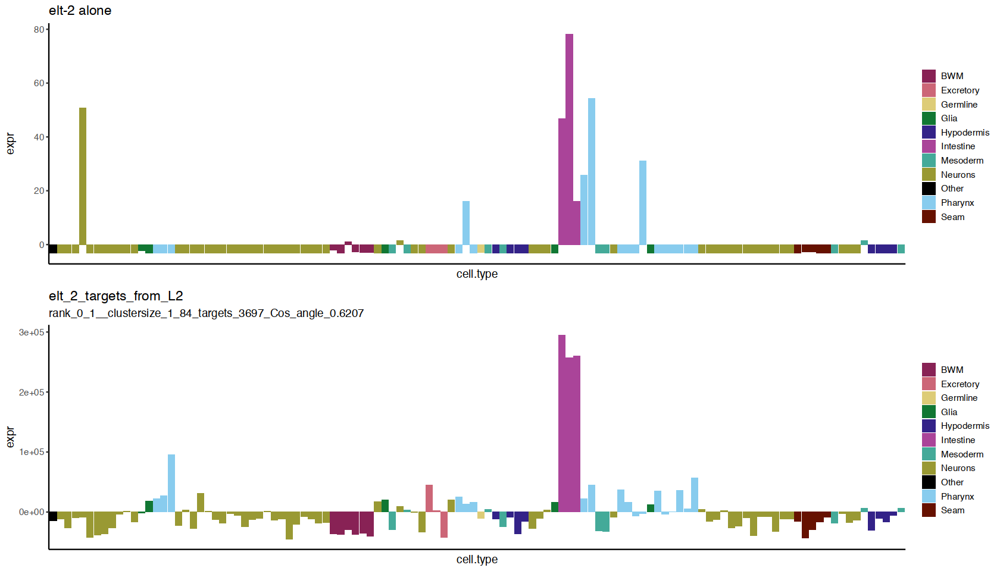

In [320]:
TF_agg_L2_plot("elt-2")

### Redo L4/YA with colors

In [424]:
unique(colnames(exp_matrix_YA))   %>%  sort

[1] "ADF"                                 
  [2] "ADL"                                 
  [3] "AFD"                                 
  [4] "AIA"                                 
  [5] "AIB"                                 
  [6] "AIM"                                 
  [7] "AIN"                                 
  [8] "AIY"                                 
  [9] "AIZ"                                 
 [10] "ALA"                                 
 [11] "Amphid sheath"                       
 [12] "Amphid socket"                       
 [13] "Anal muscle"                         
 [14] "Apoptotic germ cells"                
 [15] "Arcade cells"                        
 [16] "AS"                                  
 [17] "ASE"                                 
 [18] "ASG"                                 
 [19] "ASH"                                 
 [20] "ASI"                                 
 [21] "ASJ"                                 
 [22] "ASK"                                 
 [23] "AUA"                                 
 [24] "AVA"                                 
 [25] "AVB"                                 
 [26] "AVD"                                 
 [27] "AVE"                                 
 [28] "AVF"                                 
 [29] "AVH"                                 
 [30] "AVJ"                                 
 [31] "AVK"                                 
 [32] "AVL"                                 
 [33] "AVM"                                 
 [34] "AWA"                                 
 [35] "AWB"                                 
 [36] "AWC"                                 
 [37] "BAG"                                 
 [38] "BDU"                                 
 [39] "Body wall muscle anterior"           
 [40] "Body wall muscle middle"             
 [41] "Body wall muscle posterior"          
 [42] "CAN"                                 
 [43] "cat-4(+)ptps-1(+) intestine anterior"
 [44] "CEP_ADE_PDE"                         
 [45] "Cephalic and inner labial socket"    
 [46] "Cephalic sheath"                     
 [47] "Coelomocytes"                        
 [48] "DA_VA"                               
 [49] "DB_VB"                               
 [50] "Differentiated germ"                 
 [51] "Distal tip"                          
 [52] "Dorsal uterine cell"                 
 [53] "DVA"                                 
 [54] "DVB"                                 
 [55] "DVC"                                 
 [56] "e1_e3 (pharyngeal epithelium)"       
 [57] "e2 (pharyngeal epithelium)"          
 [58] "Embryonic cells"                     
 [59] "Excretory cells"                     
 [60] "Excretory duct"                      
 [61] "Excretory gland"                     
 [62] "g1A (pharyngeal gland)"              
 [63] "g1P (pharyngeal gland)"              
 [64] "g2 (pharyngeal gland)"               
 [65] "Glia_1"                              
 [66] "Glia_2"                              
 [67] "Glia_3"                              
 [68] "Glia_4"                              
 [69] "GLR"                                 
 [70] "hmc"                                 
 [71] "HSN"                                 
 [72] "hyp4_to_hyp6"                        
 [73] "hyp7 (hypodermis)"                   
 [74] "Hypodermis head"                     
 [75] "Hypodermis tail"                     
 [76] "I1"                                  
 [77] "I2"                                  
 [78] "I4"                                  
 [79] "I5"                                  
 [80] "IL1"                                 
 [81] "IL2"                                 
 [82] "Intestinal-rectal valve"             
 [83] "Intestine anterior"                  
 [84] "Intestine middle"                    
 [85] "Intestine posterior"                 
 [86] "LUA"                                 
 [87] "M1"                                  
 [88] "M2"                                  
 [89] "M3"                                

In [429]:
# YA_classes = read.table("YA.cell.type_with_broad cell class.txt", header = FALSE)

In [438]:
YA_classes = read_tsv("YA.cell.type_with_broad cell class.txt", col_names = FALSE)

Rows: 180 Columns: 2
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): X1, X2

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [439]:
head(YA_classes)

X1,X2
<chr>,<chr>
ADF,Neurons
ADL,Neurons
AFD,Neurons
AIA,Neurons
AIB,Neurons
AIM,Neurons


In [440]:
YA_classes = YA_classes  %>% rename("cell.type.bin" = "X1", "broad_class" = "X2")
head(YA_classes)

cell.type.bin,broad_class
<chr>,<chr>
ADF,Neurons
ADL,Neurons
AFD,Neurons
AIA,Neurons
AIB,Neurons
AIM,Neurons


In [443]:
YA_classes  %>% count(broad_class)

broad_class,n
<chr>,<int>
BodyWallMuscle,3
Excretory,3
Germline,9
Glia,10
Hypodermis,6
Intestine,4
Mesoderm,25
Neurons,104
Other,2


In [442]:
YA_classes  %>% filter(broad_class == "Seam")

cell.type.bin,broad_class
<chr>,<chr>
Seam cells (bus+),Seam
Seam cells (grd+),Seam


In [446]:
YA_classes  %>% filter(broad_class == "BodyWallMuscle")

cell.type.bin,broad_class
<chr>,<chr>
Body wall muscle anterior,BodyWallMuscle
Body wall muscle middle,BodyWallMuscle
Body wall muscle posterior,BodyWallMuscle


In [447]:
BWM = (YA_classes  %>% filter(broad_class == "BodyWallMuscle"))$cell.type.bin
meso = (YA_classes  %>% filter(broad_class == "Mesoderm"))$cell.type.bin
Neurons = (YA_classes  %>% filter(broad_class == "Neurons"))$cell.type.bin
Pharynx = (YA_classes  %>% filter(broad_class == "Pharynx"))$cell.type.bin
Hypodermis = (YA_classes  %>% filter(broad_class == "Hypodermis"))$cell.type.bin
Intestine = (YA_classes  %>% filter(broad_class == "Intestine"))$cell.type.bin
Glia = (YA_classes  %>% filter(broad_class == "Glia"))$cell.type.bin
Seam = (YA_classes  %>% filter(broad_class == "Seam"))$cell.type.bin
Excretory = (YA_classes  %>% filter(broad_class == "Excretory"))$cell.type.bin
Rectal = (YA_classes  %>% filter(broad_class == "Rectal"))$cell.type.bin
Germline = (YA_classes  %>% filter(broad_class == "Germline"))$cell.type.bin

In [448]:
length(BWM)
length(meso)
length(Neurons)
length(Pharynx)
length(Hypodermis)
length(Intestine)
length(Glia)
length(Seam)
length(Excretory)
length(Rectal)
length(Germline)

[1] 3

[1] 25

[1] 104

[1] 10

[1] 6

[1] 4

[1] 10

[1] 2

[1] 3

[1] 2

[1] 9

In [476]:
unique((worm_peaks_TF  %>% filter(grepl("L4", exp) | grepl("dult", exp) ))$TF)  %>% length
ChIP_YA_TFs = unique((worm_peaks_TF  %>% 
                          filter(grepl("L4", exp) | grepl("dult", exp) ))$TF)

[1] 185

In [477]:
ChIP_YA_TFs 

[1] "aha-1"      "aptf-2"     "aptf-3"     "arid-1"     "atf-7"     
  [6] "athp-1"     "attf-3"     "attf-4"     "attf-5"     "attf-6"    
 [11] "B0261.1"    "bed-1"      "bed-2"      "cebp-1"     "cebp-2"    
 [16] "ceh-100"    "ceh-20"     "ceh-27"     "ceh-32"     "ceh-38"    
 [21] "ceh-40"     "ceh-44"     "ceh-58"     "ceh-62"     "ceh-79"    
 [26] "ceh-91"     "ces-1"      "ctbp-1"     "D1046.2"    "D2030.7"   
 [31] "daf-12"     "daf-16"     "daf-19"     "daf-8"      "die-1"     
 [36] "dmd-6"      "dmd-8"      "dmd-9"      "dxbp-1"     "dpff-1"    
 [41] "dpl-1"      "duxl-1"     "dve-1"      "efl-1"      "egl-18"    
 [46] "egl-27"     "egl-43"     "egl-44"     "egrh-3"     "ekl-4"     
 [51] "ets-4"      "F10B5.3"    "F10E7.11"   "F22D6.2"    "F23B12.7"  
 [56] "F26F4.8"    "F33H1.4"    "F37B4.10"   "mtx-1"      "F44E2.7"   
 [61] "F52B5.7"    "F57C9.4"    "fkh-10"     "fkh-3"      "fos-1"     
 [66] "gei-17"     "gei-8"      "hif-1"      "hlh-11"     "hlh-12"    
 [71] "hlh-26"     "hlh-30"     "hmg-1.1"    "hmg-20"     "hsf-1"     
 [76] "jun-1"      "K11D2.4"    "K12H6.12"   "lag-1"      "let-526"   
 [81] "let-607"    "lim-7"      "lin-1"      "lin-13"     "lin-15B"   
 [86] "lin-26"     "lin-29"     "lin-38"     "lin-39"     "lin-40"    
 [91] "lin-54"     "lir-1"      "lir-3"      "lsl-1"      "lsy-2"     
 [96] "lsy-27"     "madf-10"    "madf-3"     "madf-5"     "madf-6"    
[101] "madf-8"     "madf-9"     "mcd-1"      "mdl-1"      "mel-28"    
[106] "mep-1"      "mxl-1"      "mxl-2"      "mxl-3"      "nfya-1"    
[111] "nfya-2"     "nfyb-1"     "nhr-10"     "nhr-102"    "nhr-11"    
[116] "nhr-111"    "nhr-120"    "nhr-179"    "nhr-237"    "nhr-25"    
[121] "nhr-270"    "nhr-28"     "nhr-41"     "nhr-42"     "nhr-48"    
[126] "nhr-6"      "nhr-76"     "nhr-77"     "nhr-80"     "nhr-90"    
[131] "pha-4"      "php-3"      "pqm-1"      "R02D3.7"    "rcor-1"    
[136] "repo-1"     "row-1"      "saeg-2"     "sdz-12"     "sdz-38"    
[141] "sea-2"      "skn-1"      "sma-3"      "sma-4"      "snpc-4"    
[146] "somi-1"     "spr-3"      "sptf-2"     "T07F8.4"    "T20F7.1"   
[151] "svh-5"      "tbx-9"      "tra-1"      "unc-130"    "unc-39"    
[156] "unc-62"     "vab-7"      "Y105C5A.15" "Y48G9A.11"  "Y53G8AR.9" 
[161] "znf-593"    "Y5F2A.4"    "Y67H2A.10"  "Y75B8A.6"   "Y79H2A.3"  
[166] "zfr-1"      "zag-1"      "zfh-2"      "zfp-2"      "zim-3"     
[171] "zip-11"     "zip-2"      "ZK185.1"    "klu-1"      "ZK546.5"   
[176] "znf-207"    "ztf-11"     "ztf-18"     "ztf-22"     "ztf-25"    
[181] "ztf-26"     "ztf-28"     "ztf-3"      "ztf-6"      "ztf-7"

In [452]:
cbbPalette12 = c("#88CCEE", "#CC6677", "#DDCC77", "#117733", "#332288", "#AA4499", "#44AA99",
                 "#999933", "#000000", "#882255", "#661100","#6699CC")
cbbPalette <- c( "#D55E00", "#E69F00", "#56B4E9", 
                 "#F0E442", "#009E73", "#0072B2",  "#000000", "#CC79A7",  "#66CC99")

In [478]:
TF_agg_YA_plot = function(gene){
    tf = gene
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_YA_graphs_YA_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & (grepl("L4", exp) | grepl("dult", exp) )
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_YA_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_YA_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



# if(number_targets > 1){

    sub_mat = exp_matrix_YA_mean[ rownames(exp_matrix_YA_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_YA_targets[n, 1] = tfn
 #    vector_angle_YA_targets[n, 2] = angle
#    vector_angle_YA_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

   gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                # ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other")))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
           # labs(color = "Cell class") +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
         legend.title=element_blank()) +
    guides(color = guide_legend(title = "Cell class")) +
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "goldenrod1", "blue", 
#                              "blueviolet", "black", "cyan3", "chartreuse")) 


    title = paste(tfn, "targets_from_YA", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                           #      ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other")))))))))))) +
 geom_bar(stat="identity", ) + 
ggtitle(title, subtitle = agg_subtitle) +
        labs(color = "Cell class") +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
                 legend.title=element_blank())+
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "yellow", "blue", 
#                              "darkorchid1", "black", "cyan3", "chartreuse")) 

#    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    print(gg_both)
    
#dev.off()

#}
}

[1] 278


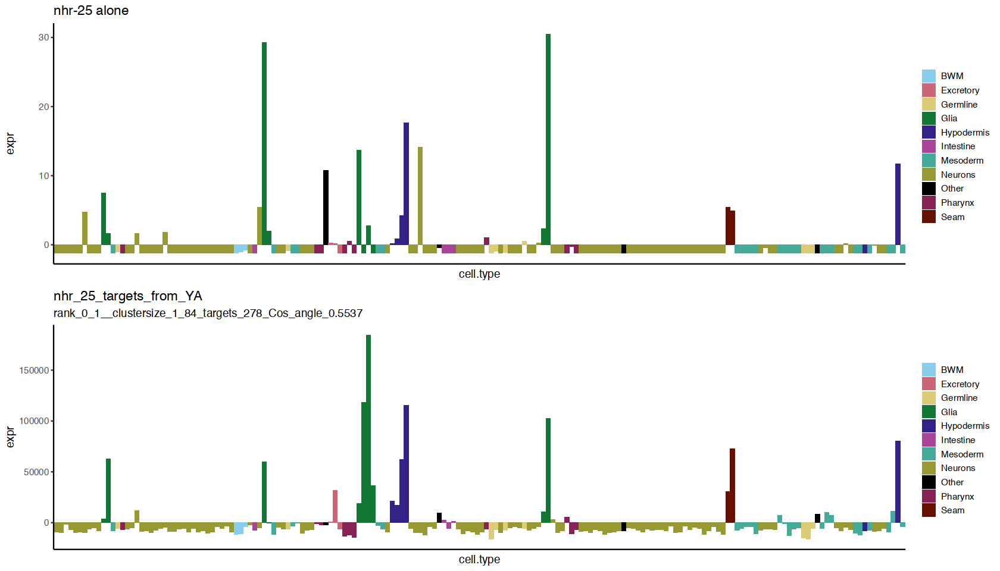

In [460]:
TF_agg_YA_plot("nhr-25")

In [466]:
YA_reorder_column_names = (YA_classes  %>% arrange(broad_class))$cell.type.bin

In [375]:
exp_matrix_YA_mean_order = exp_matrix_YA_mean[,c(YA_reorder_column_names)] 

In [479]:
TF_agg_YA_plot3 = function(gene){
    tf = gene
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_YA_graphs_YA_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & (grepl("L4", exp) | grepl("dult", exp) )
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_YA_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_YA_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")

    t_tf_values_row$cell.type = factor(t_tf_values_row$cell.type, levels = (c(YA_reorder_column_names)))


# if(number_targets > 1){

    sub_mat = exp_matrix_YA_mean[ rownames(exp_matrix_YA_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")
    
    tar$cell.type = factor(tar$cell.type, levels = (c(YA_reorder_column_names)))


        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_YA_targets[n, 1] = tfn
 #    vector_angle_YA_targets[n, 2] = angle
#    vector_angle_YA_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

   gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                # ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other")))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
           # labs(color = "Cell class") +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
         legend.title=element_blank()) +
    guides(color = guide_legend(title = "Cell class")) +
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "goldenrod1", "blue", 
#                              "blueviolet", "black", "cyan3", "chartreuse")) 


    title = paste(tfn, "targets_from_YA", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                           #      ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other")))))))))))) +
 geom_bar(stat="identity", ) + 
ggtitle(title, subtitle = agg_subtitle) +
        labs(color = "Cell class") +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
                 legend.title=element_blank())+
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "yellow", "blue", 
#                              "darkorchid1", "black", "cyan3", "chartreuse")) 

#    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    print(gg_both)
    
#dev.off()

#}
}

### plot target function for YA

[1] 1368


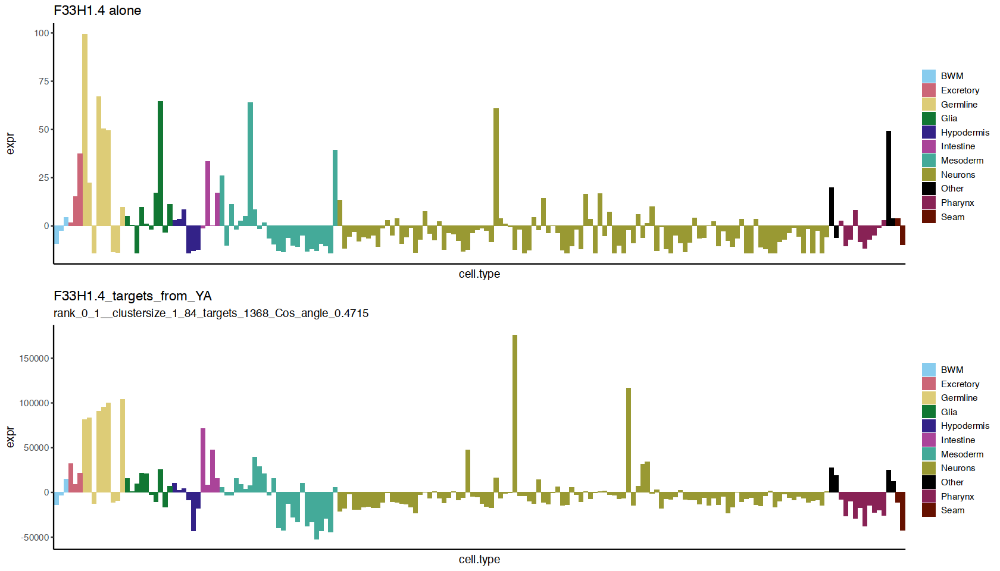

In [491]:
TF_agg_YA_plot3("F33H1.4")

In [488]:
vector_angle_L4_YA_rank_0_targets  %>% arrange(-Angle)  %>%  head(20)

,Gene,Angle,num_targets
,<chr>,<dbl>,<int>
1,nhr_80,0.6741,3519
2,lsl_1,0.6630,1400
3,F23B12.7,0.6343,458
4,D2030.7,0.6235,1267
5,madf_6,0.6079,2246
6,ets_4,0.5833,210
7,lin_54,0.5816,1197
8,egl_27,0.5629,4
9,nhr_25,0.5537,278


### Redo the lineage with class colors


In [564]:
lineage_classes = read_tsv("Murray_sulston_names_with_broad_classes.txt", col_names = FALSE)

Rows: 4007 Columns: 6
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): X1, X2, X3, X4, X5, X6

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [524]:
lineage_classes  %>% head

X1,X2,X3,X4,X5,X6
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ABalaaaa,ABalaaaa,ABalaaaarrp,RMER,ring motor neuron,Neuron_glia
ABalaaaa,ABalaaaa,ABalaaaarra,AB.alaaaarra,cell death,Neuron_glia
ABalaaaa,ABalaaaa,ABalaaaarlp,RMEL,ring motor neuron,Neuron_glia
ABalaaaa,ABalaaaa,ABalaaaarla,AB.alaaaarla,cell death,Neuron_glia
ABalaaaa,ABalaaaa,ABalaaaalpp,ILshL,inner labial sheath,Neuron_glia
ABalaaaa,ABalaaaa,ABalaaaalpa,AB.alaaaalpa,cell death,Neuron_glia


In [530]:
lineage_classes  %>% rename("Murray_name" = "X1", "Sulston" = "X2", "Terminal" = "X3",
                           "Cell_name" = "X4", "Cell_desriptor" = "X5", "Cell_class" = "X6")  %>%  head

Murray_name,Sulston,Terminal,Cell_name,Cell_desriptor,Cell_class
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ABalaaaa,ABalaaaa,ABalaaaarrp,RMER,ring motor neuron,Neuron_glia
ABalaaaa,ABalaaaa,ABalaaaarra,AB.alaaaarra,cell death,Neuron_glia
ABalaaaa,ABalaaaa,ABalaaaarlp,RMEL,ring motor neuron,Neuron_glia
ABalaaaa,ABalaaaa,ABalaaaarla,AB.alaaaarla,cell death,Neuron_glia
ABalaaaa,ABalaaaa,ABalaaaalpp,ILshL,inner labial sheath,Neuron_glia
ABalaaaa,ABalaaaa,ABalaaaalpa,AB.alaaaalpa,cell death,Neuron_glia


In [565]:
lineage_classes = lineage_classes  %>% rename("Murray_name" = "X1", "Sulston" = "X2", "Terminal" = "X3",
                           "Cell_name" = "X4", "Cell_desriptor" = "X5", "Cell_class" = "X6")

In [548]:
lineage_classes   %>% count(Murray_name, Cell_class)  %>% filter(!is.na(Cell_class))

Murray_name,Cell_class,n
<chr>,<chr>,<int>
ABalaaaa,Neuron_glia,8
ABalaaaal,Neuron_glia,4
ABalaaaala/ABalaapaaa,Neuron,4
ABalaaaalal/ABalaapaaar,Neuron,2
ABalaaaalp/ABalaapaap,Glia,4
ABalaaaar,Neuron,4
ABalaaaarx,Neuron,4
ABalaaaarxp/ABalapppaap/ABplpappaaa,Neuron,4
ABalaaap,Neuron_glia,8


In [496]:
lineage_classes    %>% count(X1, X6) %>% count(X6)

X6,n
<chr>,<int>
Glia,1
Hypodermis,2
Neuron,15
Neuron_glia,7
Pharynx,20
NA,465


In [498]:
lineage_classes    %>% count( X6) 

X6,n
<chr>,<int>
Glia,4
Hypodermis,6
Neuron,100
Neuron_glia,59
Pharynx,128
NA,3709


In [500]:
exp_matrix_lineage_mean = readRDS("data/exp_matrix_lineage_mean.rds")

In [503]:
Murray_names = as.data.frame(colnames(exp_matrix_lineage_mean))

In [504]:
colnames(Murray_names)

[1] "colnames(exp_matrix_lineage_mean)"

In [505]:
Murray_names  %>% rename("Murray_name" = "colnames(exp_matrix_lineage_mean)")  %>%  head

,Murray_name
,<chr>
1,28_cell_or_earlier
2,ABalaaaa
3,ABalaaaal
4,ABalaaaala/ABalaapaaa
5,ABalaaaalal/ABalaapaaar
6,ABalaaaalp/ABalaapaap


In [515]:
Murray_names = Murray_names  %>% rename("Murray_name" = "colnames(exp_matrix_lineage_mean)") 

ERROR: [1m[33mError[39m in `rename()`:[22m
[33m![39m Can't rename columns that don't exist.
[31m✖[39m Column `colnames(exp_matrix_lineage_mean)` doesn't exist.


In [533]:
left_join(Murray_names, lineage_classes  %>% count(Murray_name, Cell_class))  %>% head(30)

Joining with `by = join_by(Murray_name)`


,Murray_name,Cell_class,n
,<chr>,<chr>,<int>
1,28_cell_or_earlier,NA,NA
2,ABalaaaa,Neuron_glia,8
3,ABalaaaal,Neuron_glia,4
4,ABalaaaala/ABalaapaaa,Neuron,4
5,ABalaaaalal/ABalaapaaar,Neuron,2
6,ABalaaaalp/ABalaapaap,Glia,4
7,ABalaaaar,Neuron,4
8,ABalaaaarx,Neuron,4
9,ABalaaaarxp/ABalapppaap/ABplpappaaa,Neuron,4


In [512]:
Murray_names  %>% dim

[1] 514   1

In [568]:
Murray_class_names = left_join(Murray_names, lineage_classes  %>% count(Murray_name, Cell_class))

Joining with `by = join_by(Murray_name)`


In [569]:
dim(Murray_class_names)

[1] 514   3

In [557]:
lineage_classes  %>% count(Murray_name, Cell_class)

Murray_name,Cell_class,n
<chr>,<chr>,<int>
ABalaaaa,Neuron_glia,8
ABalaaaal,Neuron_glia,4
ABalaaaala/ABalaapaaa,Neuron,4
ABalaaaalal/ABalaapaaar,Neuron,2
ABalaaaalp/ABalaapaap,Glia,4
ABalaaaar,Neuron,4
ABalaaaarx,Neuron,4
ABalaaaarxp/ABalapppaap/ABplpappaaa,Neuron,4
ABalaaap,Neuron_glia,8


In [558]:
lineage_classes  %>% count(Murray_name, Cell_class) %>% count(Murray_name)  %>% arrange(-n)  %>% head(20)

Murray_name,n
<chr>,<int>
ABalaaaa,1
ABalaaaal,1
ABalaaaala/ABalaapaaa,1
ABalaaaalal/ABalaapaaar,1
ABalaaaalp/ABalaapaap,1
ABalaaaar,1
ABalaaaarx,1
ABalaaaarxp/ABalapppaap/ABplpappaaa,1
ABalaaap,1


In [545]:
lineage_classes  %>% count(Murray_name, Cell_class)  %>% filter(Murray_name == "ABalpppaap/ABpraaaaap")

Murray_name,Cell_class,n
<chr>,<chr>,<int>
ABalpppaap/ABpraaaaap,Glia,2
ABalpppaap/ABpraaaaap,NA,2


In [566]:
lineage_classes  %>% filter((is.na(Murray_name)))

Murray_name,Sulston,Terminal,Cell_name,Cell_desriptor,Cell_class
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
NA,NA,NA,NA,NA,Neuron_glia


In [567]:
lineage_classes = lineage_classes  %>% filter(!(is.na(Murray_name)))

In [563]:
Murray_class_names  %>% filter(Cell_class == "BWM")

Murray_name,Cell_class,n
<chr>,<chr>,<int>
Cxp,BWM,32
Cxpa,BWM,16
Cxpaa,BWM,8
Cxpaaa,BWM,4
Cxpaaax,BWM,4
Cxpaap,BWM,4
Cxpaapx,BWM,4
Cxpap,BWM,8
Cxpapa,BWM,4


In [570]:
Murray_class_names %>% count(Cell_class)

Cell_class,n
<chr>,<int>
BWM,62
Excretory,2
Glia,16
Hypodermis,37
Intestine,7
Mesoderm,9
Neuron,150
Neuron_glia,32
Other,1


In [598]:
save(lineage_classes, Murray_names, Murray_class_names, exp_matrix_lineage_mean, TF_agg_lineage_plot,
    vector_angle_lineage_rank_0_targets, file = "data/worm_lineage_TF_target_aggregate_plots.RData")

In [571]:
BWM = (Murray_class_names  %>% filter(Cell_class == "BWM"))$Murray_name
meso = (Murray_class_names  %>% filter(Cell_class == "Mesoderm"))$Murray_name
Neurons = (Murray_class_names  %>% filter(Cell_class == "Neuron"))$Murray_name
Pharynx = (Murray_class_names  %>% filter(Cell_class == "Pharynx"))$Murray_name
Hypodermis = (Murray_class_names  %>% filter(Cell_class == "Hypodermis"))$Murray_name
Intestine = (Murray_class_names  %>% filter(Cell_class == "Intestine"))$Murray_name
Glia = (Murray_class_names  %>% filter(Cell_class == "Glia"))$Murray_name
Seam = (Murray_class_names  %>% filter(Cell_class == "Seam"))$Murray_name
Excretory = (Murray_class_names  %>% filter(Cell_class == "Excretory"))$Murray_name
Rectal = (Murray_class_names  %>% filter(Cell_class == "Rectal"))$Murray_name
Neuron_glia = (Murray_class_names  %>% filter(Cell_class == "Neuron_glia"))$Murray_name

In [572]:
length(BWM)
length(meso)
length(Neurons)
length(Pharynx)
length(Hypodermis)
length(Intestine)
length(Glia)
length(Seam)
length(Excretory)
length(Rectal)
length(Neuron_glia)

[1] 62

[1] 9

[1] 150

[1] 71

[1] 37

[1] 7

[1] 16

[1] 11

[1] 2

[1] 8

[1] 32

In [574]:
unique((worm_peaks_TF  %>% filter(grepl("emb", exp)))$TF)  %>% length
ChIP_lineage_TFs = unique((worm_peaks_TF  %>% 
                          filter(grepl("emb", exp)))$TF)

[1] 123

In [575]:
ChIP_lineage_TFs 

[1] "ahr-1"      "B0310.2"    "bcl-11"     "bed-3"      "blmp-1"    
  [6] "C38D4.7"    "ceh-13"     "ceh-14"     "ceh-18"     "ceh-19"    
 [11] "ceh-2"      "ceh-22"     "ceh-24"     "ceh-30"     "ceh-31"    
 [16] "ceh-34"     "ceh-36"     "ceh-39"     "ceh-43"     "ceh-45"    
 [21] "ceh-48"     "ceh-5"      "ceh-51"     "ceh-6"      "ceh-83"    
 [26] "ceh-9"      "ces-1"      "che-1"      "cnd-1"      "cog-1"     
 [31] "dmd-4"      "drap-1"     "dve-1"      "elt-1"      "elt-2"     
 [36] "elt-3"      "elt-4"      "ets-4"      "ets-7"      "eyg-1"     
 [41] "fax-1"      "fkh-10"     "fkh-6"      "flh-1"      "gmeb-2"    
 [46] "ham-2"      "hlh-1"      "hlh-13"     "hlh-15"     "hlh-30"    
 [51] "hlh-6"      "hlh-8"      "hmbx-1"     "hmg-4"      "hnd-1"     
 [56] "K09A11.1"   "klf-2"      "lim-6"      "lin-11"     "lin-13"    
 [61] "lin-32"     "lsy-2"      "M03D4.4"    "mab-5"      "madf-2"    
 [66] "mec-3"      "med-1"      "mep-1"      "mls-2"      "nfya-1"    
 [71] "nhr-11"     "nhr-12"     "nhr-2"      "nhr-232"    "nhr-237"   
 [76] "nhr-28"     "nhr-76"     "npax-4"     "odd-2"      "pag-3"     
 [81] "pat-9"      "pax-1"      "pes-1"      "pha-2"      "pha-4"     
 [86] "pop-1"      "pqm-1"      "pros-1"     "ref-1"      "ref-2"     
 [91] "rnt-1"      "scrt-1"     "sea-1"      "sem-2"      "snai-1"    
 [96] "snpc-4"     "sox-2"      "sox-4"      "sptf-1"     "syd-9"     
[101] "T22C8.4"    "T23F11.4"   "tab-1"      "tbx-11"     "tbx-2"     
[106] "tbx-37"     "tbx-7"      "tbx-8"      "tra-4"      "ttx-3"     
[111] "unc-120"    "unc-3"      "unc-39"     "unc-42"     "unc-62"    
[116] "unc-86"     "Y22D7AL.16" "zip-5"      "zip-8"      "ztf-11"    
[121] "ztf-16"     "ztf-23"     "ztf-29"

In [576]:
cbbPalette12 = c("#88CCEE", "#CC6677", "#DDCC77", "#117733", "#332288", "#AA4499", "#44AA99",
                 "#999933", "#000000", "#882255", "#661100","#6699CC")
cbbPalette <- c( "#D55E00", "#E69F00", "#56B4E9", 
                 "#F0E442", "#009E73", "#0072B2",  "#000000", "#CC79A7",  "#66CC99")

In [578]:
TF_agg_lineage_plot = function(gene){
    tf = gene
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_lineage_graphs_lineage_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & (grepl("emb", exp))
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_lineage_mean  %>% as.data.frame  %>% filter(rownames(exp_matrix_lineage_mean) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")



# if(number_targets > 1){

    sub_mat = exp_matrix_lineage_mean[ rownames(exp_matrix_lineage_mean) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_lineage_targets[n, 1] = tfn
 #    vector_angle_lineage_targets[n, 2] = angle
#    vector_angle_lineage_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

   gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Neuron_glia",
                                                                                                        
                                                                            "Other"))))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
           # labs(color = "Cell class") +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
         legend.title=element_blank()) +
    guides(color = guide_legend(title = "Cell class")) +
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "goldenrod1", "blue", 
#                              "blueviolet", "black", "cyan3", "chartreuse")) 


    title = paste(tfn, "targets_from_lineage", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Neuron_glia",
                                                                                                        
                                                                            "Other"))))))))))))) +
 geom_bar(stat="identity", ) + 
ggtitle(title, subtitle = agg_subtitle) +
        labs(color = "Cell class") +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
                 legend.title=element_blank())+
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "yellow", "blue", 
#                              "darkorchid1", "black", "cyan3", "chartreuse")) 

#    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    print(gg_both)
    
#dev.off()

#}
}

In [ ]:
worm_peaks_TF  %>% filter(exp )

[1] 101


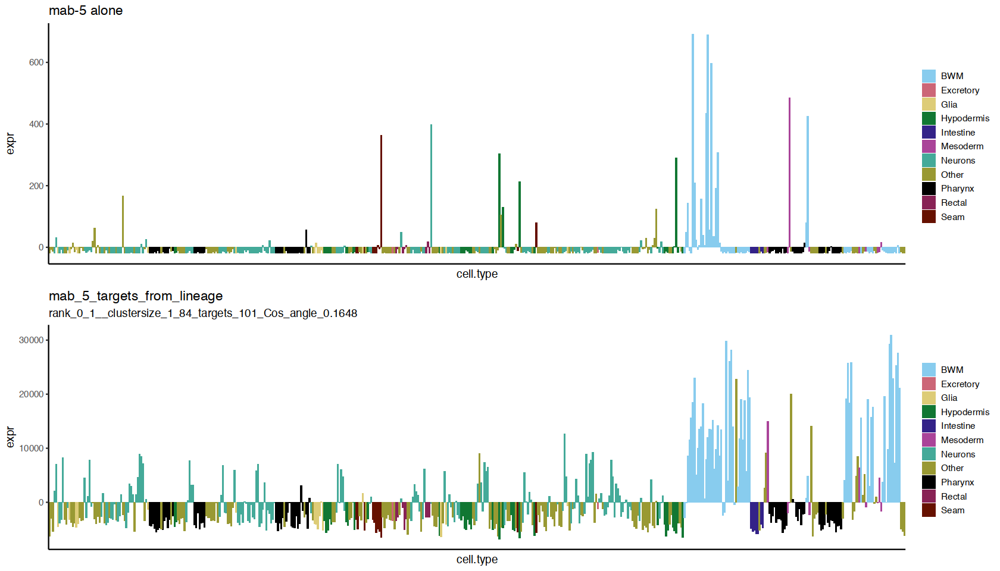

In [599]:
TF_agg_lineage_plot("mab-5")

In [583]:
vector_angle_lineage_rank_0_targets  %>% arrange(-Angle)  %>%  head(30)

,Gene,Angle,num_targets
,<chr>,<dbl>,<int>
1,blmp_1,0.7791,310
2,ceh_48,0.7787,633
3,elt_2,0.7385,1233
4,elt_3,0.7168,121
5,pat_9,0.7039,70
6,syd_9,0.6979,96
7,unc_120,0.6875,839
8,mep_1,0.6284,761
9,elt_1,0.6143,550


In [603]:
exp_matrix_emb_mean  %>% head

,ADE:390_510,ADEsh:390_510,ADF:390_510,ADF:510_650,ADF_AWB_terminal_cells_but_undifferentiated,ADF:gt_650,ADL:330_390,ADL:390_510,ADL:510_650,ADL:gt_650,⋯,URX:390_510,URX:510_650,URX:gt_650,XXX:330_450,Y:270_330,Y:330_390,Z1_Z4:270_330,Z1_Z4:330_390,Z1_Z4:390_450,Z1_Z4:gt_650
aap-1,-7.843276,-38.74328,-1.143276,-38.74328,-9.343276,13.75672,17.956724,23.156724,15.556724,3.156724,⋯,47.15672,83.756724,-12.24328,95.95672,19.05672,10.65672,46.75672,39.45672,5.956724,-13.94328
aat-1,-50.595110,-54.79511,-34.695110,-49.49511,-54.795110,-54.79511,-54.795110,-47.195110,-54.795110,47.504890,⋯,-42.49511,-15.595110,84.70489,-54.79511,11.00489,-51.49511,-54.79511,-26.89511,-7.195110,172.10489
aat-2,10.912958,-31.28704,185.712958,-39.08704,139.112958,-28.18704,285.212958,433.812958,146.112958,-49.687042,⋯,18.91296,95.412958,78.91296,-49.68704,-49.68704,-49.68704,156.91296,-26.08704,-18.887042,-19.98704
aat-3,54.755990,61.05599,94.555990,-90.84401,274.955990,-92.04401,139.155990,-75.244010,-148.444010,-127.944010,⋯,-66.94401,-120.544010,-99.84401,-14.44401,12.65599,90.55599,384.25599,-70.34401,-89.144010,-148.44401
aat-4,-1.429340,-1.42934,-1.429340,-1.42934,-1.429340,-1.42934,-1.429340,-1.429340,-1.429340,-1.429340,⋯,-1.42934,-1.429340,-1.42934,-1.42934,-1.42934,-1.42934,-1.42934,-1.42934,-1.429340,-1.42934
aat-5,2.962103,-12.83790,-12.837897,-12.83790,-12.837897,-12.83790,-3.237897,4.662103,5.762103,15.962103,⋯,-12.83790,-5.337897,15.36210,-12.83790,-12.83790,-12.83790,-12.83790,-12.83790,-12.837897,-12.83790


In [604]:
ls()

[1] "agg_subtitle"                       
  [2] "agg_totals"                         
  [3] "angle"                              
  [4] "angleCosine"                        
  [5] "BWM"                                
  [6] "cbbPalette"                         
  [7] "cbbPalette11"                       
  [8] "cbbPalette12"                       
  [9] "cds_jp"                             
 [10] "ChIP_larvae_TFs"                    
 [11] "ChIP_lineage_TFs"                   
 [12] "ChIP_YA_TFs"                        
 [13] "classes"                            
 [14] "cluster_nPeaks"                     
 [15] "cluster_nPeaks_genes"               
 [16] "compare"                            
 [17] "eq1genes"                           
 [18] "Excretory"                          
 [19] "exp_matrix"                         
 [20] "exp_matrix_emb_mean"                
 [21] "exp_matrix_L2"                      
 [22] "exp_matrix_L2_mean"                 
 [23] "exp_matrix_lineage"                 
 [24] "exp_matrix_lineage_mean"            
 [25] "exp_matrix_mean"                    
 [26] "exp_matrix_mean_copy"               
 [27] "exp_matrix_mean_order"              
 [28] "exp_matrix_YA"                      
 [29] "exp_matrix_YA_mean"                 
 [30] "expression_name_change"             
 [31] "f5b"                                
 [32] "figure5b"                           
 [33] "file_name"                          
 [34] "fly_intervals"                      
 [35] "fly_values"                         
 [36] "gene_clusters"                      
 [37] "gene_clusters_peaksum"              
 [38] "gene_max_mean_entropy"              
 [39] "genes_peaks"                        
 [40] "Germline"                           
 [41] "gg_agg"                             
 [42] "gg_both"                            
 [43] "gg_tf"                              
 [44] "Glia"                               
 [45] "gt1lte6genes"                       
 [46] "gt240genes"                         
 [47] "gt30lte84genes"                     
 [48] "gt6lte30genes"                      
 [49] "gt84lte240genes"                    
 [50] "hkg_285"                            
 [51] "hkg_noCluster"                      
 [52] "hypodermis"                         
 [53] "Hypodermis"                         
 [54] "Intestine"                          
 [55] "L2_classes"                         
 [56] "lb"                                 
 [57] "lineage_classes"                    
 [58] "list_data"                          
 [59] "meso"                               
 [60] "Murray_class_names"                 
 [61] "Murray_names"                       
 [62] "Neuron_glia"                        
 [63] "Neurons"                            
 [64] "number_targets"                     
 [65] "Pharynx"                            
 [66] "ranklb"                             
 [67] "rankub"                             
 [68] "Rectal"                             
 [69] "reorder_column_names"               
 [70] "Seam"                               
 [71] "sub_mat"                            
 [72] "t_tf_values"                        
 [73] "t_tf_values_row"                    
 [74] "ta"                                 
 [75] "table2_function"                    
 [76] "tar"                                
 [77] "target_numbers"                     
 [78] "target_set"                         
 [79] "tf"                                 
 [80] "TF_agg_L2_plot"                     
 [81] "TF_agg_lineage_plot"                
 [82] "TF_agg_plot"                        
 [83] "TF_agg_plot2"                       
 [84] "TF_agg_plot3"                       
 [85] "TF_agg_YA_plot"                     
 [86] "TF_agg_YA_plot3"                    
 [87] "tf_title"                           
 [88] "tf_values"                          
 [89] "tfn"                                
 [90] "title"                              
 [91] "TSS_gene"                          

In [607]:
ws245  %>% filter(Common245 != Common285)  %>% head


,Sequence245,Common245,WBGene245,Sequence285,Common285,WBGene285,Common245new,Common285new
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,B0336.2,arf-1.2,WBGene00000182,B0336.2,arf-1,WBGene00000182,arf-1.2,arf-1
2,F57H12.1,arf-3,WBGene00000183,F57H12.1,arf-5,WBGene00000183,arf-3,arf-5
3,F45E4.1,arf-1.1,WBGene00000190,F45E4.1,warf-1,WBGene00000190,arf-1.1,warf-1
4,Y53F4B.15,asc-1,WBGene00000208,Y53F4B.15,trip-4,WBGene00000208,asc-1,trip-4
5,T04C10.4,atf-5,WBGene00000221,T04C10.4,atf-4,WBGene00000221,atf-5,atf-4
6,F26E4.9,cco-1,WBGene00000371,F26E4.9,cox-5B,WBGene00000371,cco-1,cox-5B


In [612]:
exp_matrix_YA_mean[ rownames(exp_matrix_L2_mean) == "warf-1",  ]

ADF                                  ADL 
                        -7.071292796                         17.054411996 
                                 AFD                                  AIA 
                        -0.584132181                         -7.071292796 
                                 AIB                                  AIM 
                        -4.095471684                         -7.071292796 
                                 AIN                                  AIY 
                        -7.071292796                         -7.071292796 
                                 AIZ                                  ALA 
                        -2.896500936                         -7.071292796 
                       Amphid sheath                        Amphid socket 
                        -1.142064125                         -5.399532945 
                         Anal muscle                 Apoptotic germ cells 
                        -6.681340746                         -4.127841644 
                        Arcade cells                                   AS 
                         3.505447483                         -3.085609546 
                                 ASE                                  ASG 
                         2.351767915                         -0.762540400 
                                 ASH                                  ASI 
                        45.462378795                          8.371762486 
                                 ASJ                                  ASK 
                        -7.071292796                         18.343678581 
                                 AUA                                  AVA 
                        -7.071292796                         -5.717804535 
                                 AVB                                  AVD 
                        -3.366758526                         -3.577631737 
                                 AVE                                  AVF 
                        -7.071292796                         -7.071292796 
                                 AVH                                  AVJ 
                        -7.071292796                         -6.314984515 
                                 AVK                                  AVL 
                        -5.736710882                         -3.503587115 
                                 AVM                                  AWA 
                        -7.071292796                         -0.621340976 
                                 AWB                                  AWC 
                        -0.569378520                          4.728451654 
                                 BAG                                  BDU 
                        -7.071292796                         -7.071292796 
           Body wall muscle anterior              Body wall muscle middle 
                        -5.850977858                         -5.509241552 
          Body wall muscle posterior                                  CAN 
                        -3.573697749                         -7.071292796 
cat-4(+)ptps-1(+) intestine anterior                          CEP_ADE_PDE 
                         7.086973737                         -0.122843285 
    Cephalic and inner labial socket                      Cephalic sheath 
                        -7.071292796                         -4.245594147 
                        Coelomocytes                                DA_VA 
                        -4.477258398                         -5.662695533 
                               DB_VB                  Differentiated germ 
                         6.068974416                         -4.898175408 
                          Distal tip                  Dorsal uterine cell 
                        -4.233077741                         -7.030471662 
                                 DVA                                  DVB 
                        20.864755501                      

## test random targets

In [133]:
ls()

[1] "a"                                   
 [2] "b"                                   
 [3] "c"                                   
 [4] "cbbPalette12"                        
 [5] "cds_jp"                              
 [6] "celltype_expr"                       
 [7] "cluster_nPeaks_genes"                
 [8] "complex_genes"                       
 [9] "complex_TF_genes"                    
[10] "d"                                   
[11] "df_genes"                            
[12] "e"                                   
[13] "entropy"                             
[14] "exp_matrix"                          
[15] "exp_matrix_emb_mean"                 
[16] "exp_matrix_L2"                       
[17] "exp_matrix_L2_mean"                  
[18] "exp_matrix_lineage"                  
[19] "exp_matrix_lineage_mean"             
[20] "exp_matrix_mean"                     
[21] "exp_matrix_YA"                       
[22] "exp_matrix_YA_mean"                  
[23] "expression_name_change"              
[24] "f2a"                                 
[25] "f5b"                                 
[26] "fig7_function"                       
[27] "figure2a"                            
[28] "Figure3_worm_violin"                 
[29] "figure5b"                            
[30] "g"                                   
[31] "gen"                                 
[32] "gen_exp"                             
[33] "gene_clusters"                       
[34] "gene_clusters_peaksum"               
[35] "gene_entropies"                      
[36] "gene_entropies_max_mean_median"      
[37] "gene_entropies_max_mean_median_group"
[38] "gene_max_mean_median"                
[39] "genes_peaks"                         
[40] "gt1lte6genes"                        
[41] "gt240genes"                          
[42] "gt30lte84genes"                      
[43] "gt6lte30genes"                       
[44] "gt84lte240genes"                     
[45] "hkg_285"                             
[46] "hkg_noCluster"                       
[47] "p"                                   
[48] "peaks_by_cluster_size"               
[49] "r"                                   
[50] "sf5_function"                        
[51] "t"                                   
[52] "table2_function"                     
[53] "target_numbers"                      
[54] "temp"                                
[55] "TF_agg_plot2"                        
[56] "u"                                   
[57] "vector_angle_emb_2_noHOT_3_targets"  
[58] "vector_angle_emb_rank_0_targets"     
[59] "vector_angle_emb_rank_0.3_targets"   
[60] "vector_angle_emb_targets"            
[61] "vector_angle_L4_YA_rank_0_targets"   
[62] "vector_angle_L4_YA_targets"          
[63] "vector_angle_larvae_rank_0_targets"  
[64] "vector_angle_larvae_targets"         
[65] "vector_angle_lineage_rank_0_targets" 
[66] "vector_angle_lineage_targets"        
[67] "vector_angles_all_worm"              
[68] "vector_angles_function"              
[69] "wbg_hkg"                             
[70] "worm_peaks_TF"                       
[71] "ws245"

In [137]:
BWM = (classes  %>% filter(broad_class == "BodyWallMuscle"))$cell.type.bin
meso = (classes  %>% filter(broad_class == "Mesoderm"))$cell.type.bin
Neurons = (classes  %>% filter(broad_class == "Neurons"))$cell.type.bin
Pharynx = (classes  %>% filter(broad_class == "Pharynx"))$cell.type.bin
Hypodermis = (classes  %>% filter(broad_class == "Hypodermis"))$cell.type.bin
Intestine = (classes  %>% filter(broad_class == "Intestine"))$cell.type.bin
Glia = (classes  %>% filter(broad_class == "Glia"))$cell.type.bin
Seam = (classes  %>% filter(broad_class == "Seam"))$cell.type.bin
Excretory = (classes  %>% filter(broad_class == "Excretory"))$cell.type.bin
Rectal = (classes  %>% filter(broad_class == "Rectal"))$cell.type.bin
Germline = (classes  %>% filter(broad_class == "Germline"))$cell.type.bin

In [153]:
library(cowplot)

In [140]:
reorder_column_names = (classes  %>% arrange(broad_class))$cell.type.bin

In [373]:
exp_matrix_mean_copy = exp_matrix_mean

In [141]:
exp_matrix_mean_order = exp_matrix_mean[,c(reorder_column_names)] 

In [165]:
# now have to chang the plot function to keep order
TF_agg_plot.random = function(gene){
    tf = gene
    # exp_matrix_mean_order = matrix
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & grepl("emb", exp)
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_mean_order  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean_order) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")

t_tf_values_row$cell.type = factor(t_tf_values_row$cell.type, levels = (c(reorder_column_names)))

# if(number_targets > 1){

 #   sub_mat = exp_matrix_mean_order[ rownames(exp_matrix_mean_order) %in% target_set,  ]
    sub_mat = exp_matrix_mean_order[sample(1:nrow(exp_matrix_mean_order), 500), ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")
    
    tar$cell.type = factor(tar$cell.type, levels = (c(reorder_column_names)))

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_emb_targets[n, 1] = tfn
 #    vector_angle_emb_targets[n, 2] = angle
#    vector_angle_emb_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

   gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
           # labs(color = "Cell class") +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
         legend.title=element_blank()) +
    guides(color = guide_legend(title = "Cell class")) +
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "goldenrod1", "blue", 
#                              "blueviolet", "black", "cyan3", "chartreuse")) 

tar$cell.type = factor(tar$cell.type)
    title = paste(tfn, "targets_from_embryo", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
 geom_bar(stat="identity", ) + 
ggtitle(title, subtitle = agg_subtitle) +
        labs(color = "Cell class") +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
                 legend.title=element_blank())+
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "yellow", "blue", 
#                              "darkorchid1", "black", "cyan3", "chartreuse")) 

#    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    print(gg_both)
    
#dev.off()

#}
}

In [187]:
# now have to chang the plot function to keep order
TF_agg_plot.random = function(gene){
    tf = gene
    # exp_matrix_mean_order = matrix
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(#TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & grepl("emb", exp)
                                  ))$Gene)  %>% sample(200)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_mean_order  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean_order) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")

t_tf_values_row$cell.type = factor(t_tf_values_row$cell.type, levels = (c(reorder_column_names)))

# if(number_targets > 1){

   sub_mat = exp_matrix_mean_order[ rownames(exp_matrix_mean_order) %in% target_set,  ]
 #   sub_mat = exp_matrix_mean_order[sample(1:nrow(exp_matrix_mean_order), 500), ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")
    
    tar$cell.type = factor(tar$cell.type, levels = (c(reorder_column_names)))

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_emb_targets[n, 1] = tfn
 #    vector_angle_emb_targets[n, 2] = angle
#    vector_angle_emb_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

   gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
           # labs(color = "Cell class") +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
         legend.title=element_blank()) +
    guides(color = guide_legend(title = "Cell class")) +
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "goldenrod1", "blue", 
#                              "blueviolet", "black", "cyan3", "chartreuse")) 

tar$cell.type = factor(tar$cell.type)
    title = paste(tfn, "targets_from_embryo", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
 geom_bar(stat="identity", ) + 
ggtitle(title, subtitle = agg_subtitle) +
        labs(color = "Cell class") +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
                 legend.title=element_blank())+
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "yellow", "blue", 
#                              "darkorchid1", "black", "cyan3", "chartreuse")) 

#    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    print(gg_both)
    
#dev.off()

#}
}

[1] 200


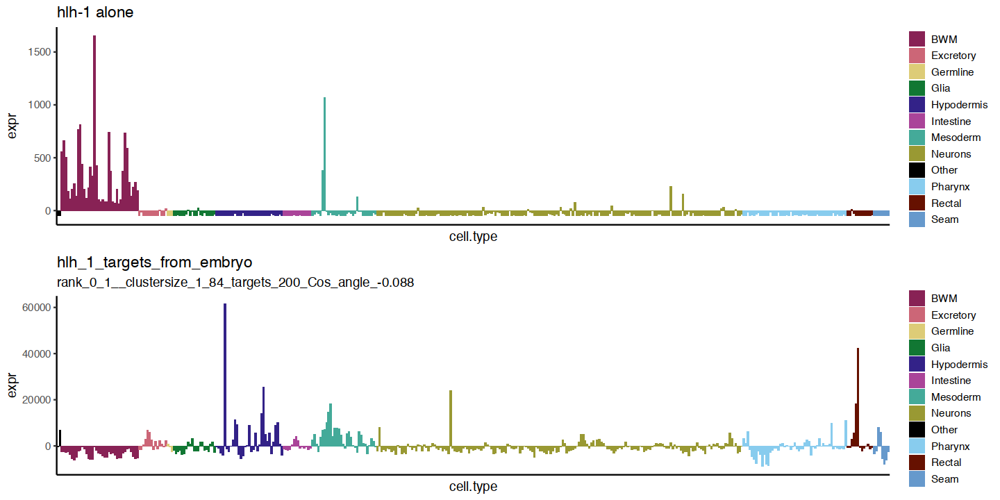

In [193]:
TF_agg_plot.random("hlh-1")

In [183]:
sum_mat = exp_matrix_mean_order[sample(1:nrow(exp_matrix_mean_order), 200), ]

In [146]:
dim(sum_mat)

[1] 200 409

# Make plots for each stage

In [194]:
BWM = (classes  %>% filter(broad_class == "BodyWallMuscle"))$cell.type.bin
meso = (classes  %>% filter(broad_class == "Mesoderm"))$cell.type.bin
Neurons = (classes  %>% filter(broad_class == "Neurons"))$cell.type.bin
Pharynx = (classes  %>% filter(broad_class == "Pharynx"))$cell.type.bin
Hypodermis = (classes  %>% filter(broad_class == "Hypodermis"))$cell.type.bin
Intestine = (classes  %>% filter(broad_class == "Intestine"))$cell.type.bin
Glia = (classes  %>% filter(broad_class == "Glia"))$cell.type.bin
Seam = (classes  %>% filter(broad_class == "Seam"))$cell.type.bin
Excretory = (classes  %>% filter(broad_class == "Excretory"))$cell.type.bin
Rectal = (classes  %>% filter(broad_class == "Rectal"))$cell.type.bin
Germline = (classes  %>% filter(broad_class == "Germline"))$cell.type.bin

In [196]:
reorder_column_names = (classes  %>% arrange(broad_class))$cell.type.bin

In [197]:
exp_matrix_mean_order = exp_matrix_mean[,c(reorder_column_names)] 

In [202]:
## make sure the peaks file has the ws285 names
worm_peaks_TF  %>% filter(TF == "znf-622")  %>%  head

,peakID,absDist,chromo.x,start.x,end.x,exp,score,strand.x,apexS.x,apexE.x,⋯,TranscriptLoc,Gene,GeneLoc,GeneExons,TranscriptNo,UniqueGeneTSSs,GeneTranscripts,rank,TF,group
,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
1,C16A3.4_OP345_L1larva_1chrI10025965:10026158,109,chrI,10025965,10026158,C16A3.4_OP345_L1larva_1,1000,.,10026077,10026081,⋯,5P,rae-1,5P,5,1,2,2,0.9370861,znf-622,85-240
2,C16A3.4_OP345_L1larva_1chrI10034907:10035303,289,chrI,10034907,10035303,C16A3.4_OP345_L1larva_1,946,.,10035103,10035107,⋯,5P,ncs-2,5P,3,1,1,1,0.3754139,znf-622,85-240
3,C16A3.4_OP345_L1larva_1chrI10121999:10122395,26,chrI,10121999,10122395,C16A3.4_OP345_L1larva_1,1000,.,10122195,10122199,⋯,5P,Y106G6D.5,5P,10,2,2,2,0.5823675,znf-622,85-240
4,C16A3.4_OP345_L1larva_1chrI10178327:10178515,594,chrI,10178327,10178515,C16A3.4_OP345_L1larva_1,1000,.,10178422,10178426,⋯,5P,C25A1.16,5P,3,1,1,1,0.9321192,znf-622,85-240
5,C16A3.4_OP345_L1larva_1chrI10185576:10185972,81,chrI,10185576,10185972,C16A3.4_OP345_L1larva_1,870,.,10185772,10185776,⋯,5P,rsa-1,5P,9,1,2,2,0.1771523,znf-622,31-84
6,C16A3.4_OP345_L1larva_1chrI10191003:10191151,171,chrI,10191003,10191151,C16A3.4_OP345_L1larva_1,1000,.,10191065,10191069,⋯,5P,dao-5,5P,5,2,2,2,0.6932947,znf-622,85-240


In [201]:
worm_emb_TFs = unique((worm_peaks_TF  %>% filter(grepl("emb", exp)))$TF)

In [ ]:
  #  theme(plot.title = element_text(hjust = 0.5, 
    #    size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))

In [241]:
# now have to chang the plot function to keep order
TF_agg_plot3 = function(gene){
    tf = gene
    # exp_matrix_mean_order = matrix
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & grepl("emb", exp)
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_mean_order  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean_order) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")

t_tf_values_row$cell.type = factor(t_tf_values_row$cell.type, levels = (c(reorder_column_names)))

# if(number_targets > 1){

    sub_mat = exp_matrix_mean_order[ rownames(exp_matrix_mean_order) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")
    
    tar$cell.type = factor(tar$cell.type, levels = (c(reorder_column_names)))

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_emb_targets[n, 1] = tfn
 #    vector_angle_emb_targets[n, 2] = angle
#    vector_angle_emb_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

   gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
        ggtitle(tf_title) +
           # labs(color = "Cell class") +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
         legend.title=element_blank()) +
    guides(color = guide_legend(title = "Cell class")) +
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "goldenrod1", "blue", 
#                              "blueviolet", "black", "cyan3", "chartreuse")) 

tar$cell.type = factor(tar$cell.type)
    title = paste(tfn, "targets_from_embryo", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
 geom_bar(stat="identity", ) + 
ggtitle(title, subtitle = agg_subtitle) +
        labs(color = "Cell class") +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
                 legend.title=element_blank())+
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "yellow", "blue", 
#                              "darkorchid1", "black", "cyan3", "chartreuse")) 

#    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    # print(gg_both)
    return(gg_both)
#dev.off()

#}
}

In [207]:
for(tf in worm_emb_TFs    )
         {
message(tf)

tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
#ub = "noHOT"

    file_name = paste(tfn, "aggreg_vs_TF_ordered_profile_2_noHOT_0", ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets_ordered_noHOT", file_name, sep = "/")

gg_both = TF_agg_plot3(tf)

pdf(file_name, width =10, height = 8)
print(gg_both)
dev.off()
}

ahr-1



[1] 35


B0310.2



[1] 51


bcl-11



[1] 90


bed-3



[1] 45


blmp-1



[1] 310


C38D4.7



[1] 51


ceh-13



[1] 29


ceh-14



[1] 248


ceh-18



[1] 699


ceh-19



[1] 114


ceh-2



[1] 187


ceh-22



[1] 31


ceh-24



[1] 12


ceh-30



[1] 45


ceh-31



[1] 832


ceh-34



[1] 414


ceh-36



[1] 656


ceh-39



[1] 588


ceh-43



[1] 129


ceh-45



[1] 113


ceh-48



[1] 633


ceh-5



[1] 601


ceh-51



[1] 245


ceh-6



[1] 95


ceh-83



[1] 3234


ceh-9



[1] 25


ces-1



[1] 2552


che-1



[1] 72


cnd-1



[1] 406


cog-1



[1] 174


dmd-4



[1] 1362


drap-1



[1] 373


dve-1



[1] 311


elt-1



[1] 550


elt-2



[1] 1233


elt-3



[1] 121


elt-4



[1] 152


ets-4



[1] 177


ets-7



[1] 82


eyg-1



[1] 38


fax-1



[1] 90


fkh-10



[1] 19


fkh-6



[1] 74


flh-1



[1] 18


gmeb-2



[1] 52


ham-2



[1] 589


hlh-1



[1] 849


hlh-13



[1] 32


hlh-15



[1] 20


hlh-30



[1] 568


hlh-6



[1] 351


hlh-8



[1] 238


hmbx-1



[1] 30


hmg-4



[1] 1021


hnd-1



[1] 87


K09A11.1



[1] 76


klf-2



[1] 271


lim-6



[1] 93


lin-11



[1] 33


lin-13



[1] 273


lin-32



[1] 236


lsy-2



[1] 979


M03D4.4



[1] 277


mab-5



[1] 101


madf-2



[1] 49


mec-3



[1] 290


med-1



[1] 84


mep-1



[1] 761


mls-2



[1] 469


nfya-1



[1] 1051


nhr-11



[1] 4


nhr-12



[1] 9


nhr-2



[1] 623


nhr-232



[1] 64


nhr-237



[1] 142


nhr-28



[1] 32


nhr-76



[1] 5


npax-4



[1] 9


odd-2



[1] 326


pag-3



[1] 64


pat-9



[1] 70


pax-1



[1] 128


pes-1



[1] 550


pha-2



[1] 65


pha-4



[1] 550


pop-1



[1] 272


pqm-1



[1] 104


pros-1



[1] 69


ref-1



[1] 171


ref-2



[1] 1643


rnt-1



[1] 442


scrt-1



[1] 395


sea-1



[1] 336


sem-2



[1] 100


snai-1



[1] 40


snpc-4



[1] 376


sox-2



[1] 135


sox-4



[1] 168


sptf-1



[1] 1495


syd-9



[1] 96


T22C8.4



[1] 825


T23F11.4



[1] 63


tab-1



[1] 527


tbx-11



[1] 270


tbx-2



[1] 511


tbx-37



[1] 237


tbx-7



[1] 109


tbx-8



[1] 22


tra-4



[1] 20


ttx-3



[1] 124


unc-120



[1] 839


unc-3



[1] 151


unc-39



[1] 17


unc-42



[1] 1267


unc-62



[1] 801


unc-86



[1] 47


Y22D7AL.16



[1] 30


zip-5



[1] 89


zip-8



[1] 710


ztf-11



[1] 45


ztf-16



[1] 33


ztf-23



[1] 714


ztf-29



[1] 323


## Figure 8 blmp-1

In [243]:
## formatting for figure 8
TF_agg_plot3 = function(gene){
    tf = gene
    # exp_matrix_mean_order = matrix
tfn = gsub("-", "_", tf)
# filter based on peak quality
ranklb = 0
rankub = 1
## set the cluster size range
lb = 1
ub = 84

    file_name = paste(tfn, "aggreg_vs_TF_profile", ub, ranklb, "pdf", sep = ".")
    file_name = paste("worm_agg_emb_graphs_emb_targets_noHOT", file_name, sep = "/")

target_set = unique((worm_peaks_TF  %>% 
                            filter(TF == tf & 
                                   rank >= ranklb & rank <= ub &
                                   nPeaks > lb & #nPeaks <= ub &
                                   !(Gene %in% c(gt240genes, gt84lte240genes)) 
                                  & Gene != tf 
                                   & grepl("emb", exp)
                                  ))$Gene)
            number_targets = length(target_set)
            print(number_targets)

tf_values = exp_matrix_mean_order  %>% as.data.frame  %>% filter(rownames(exp_matrix_mean_order) == tf)
t_tf_values = as.data.frame(t(tf_values))
t_tf_values_row = rownames_to_column(t_tf_values, var = "cell.type")
colnames(t_tf_values_row) <- c("cell.type", "expr")

t_tf_values_row$cell.type = factor(t_tf_values_row$cell.type, levels = (c(reorder_column_names)))

# if(number_targets > 1){

    sub_mat = exp_matrix_mean_order[ rownames(exp_matrix_mean_order) %in% target_set,  ]
agg_totals = t(as.matrix(colSums(sub_mat)))
rownames(agg_totals) = c("TF_agg")
ta = as.data.frame(t(agg_totals))
tar = rownames_to_column(ta, var = "cell.type")
colnames(tar) <- c("cell.type", "expr")
    
    tar$cell.type = factor(tar$cell.type, levels = (c(reorder_column_names)))

        compare = rbind(tf_values, agg_totals)
    angle = round(angleCosine(as.numeric(compare[1,]),as.numeric(compare[2,])), 4)
#    print(angle)
#    n = n+1
#   print(n)
 #   vector_angle_emb_targets[n, 1] = tfn
 #    vector_angle_emb_targets[n, 2] = angle
#    vector_angle_emb_targets[n, 3] =number_targets
        tf_title = paste(tf, "alone", sep = " ")
 #   tf_subtitle = paste ("max", tf_max, "tf_mean", tf_mean, "tf_entropy", tf_entropy,  sep = "_")

   gg_tf = ggplot(t_tf_values_row, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
  geom_bar(stat="identity",
          ) +
 #    scale_fill_manual(values=c("blue")) +
    theme_classic() +
       # ggtitle(tf_title) +
    labs(title=tf_title, x= "cell_type:time_bin", y = "Expression(tpm)") +
           # labs(color = "Cell class") +
    theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
         legend.title=element_blank(), plot.title = element_text(hjust = 0, size = 20),
         axis.title = element_text(size = 15), axis.text = element_text(size = 12)) +
  #  theme(plot.title = element_text(hjust = 0.5, 
    #    size = 30), axis.title = element_text(size = 25), axis.text = element_text(size = 21))
    guides(color = guide_legend(title = "Cell class")) +
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "goldenrod1", "blue", 
#                              "blueviolet", "black", "cyan3", "chartreuse")) 

tar$cell.type = factor(tar$cell.type)
    title_agg = paste(tfn, "targets_from_embryo", sep = "_")  
agg_subtitle = paste("rank", ranklb, rankub, "_clustersize", lb, ub, "targets", number_targets, "Cos_angle", angle, sep = "_" )    

    gg_agg = ggplot(tar, aes(x = cell.type, y = expr, fill = 
                                        ifelse(cell.type %in% Neurons, "Neurons", 
                                               ifelse(cell.type %in% meso, "Mesoderm", 
                                                ifelse(cell.type %in% Pharynx, "Pharynx", 
                                                       ifelse(cell.type %in% Hypodermis, "Hypodermis",
                                                              ifelse(cell.type %in% Seam, "Seam",
                                                                     ifelse(cell.type %in% Intestine, "Intestine",
                                                                            ifelse(cell.type %in% Glia, "Glia",
                                                                                   ifelse(cell.type %in% BWM, "BWM",
                                                                                          ifelse(cell.type %in% Excretory, "Excretory",
                                                                                                 ifelse(cell.type %in% Rectal, "Rectal",
                                                                                                        ifelse(cell.type %in% Germline, "Germline",
                                                                                                        
                                                                            "Other"))))))))))))) +
 geom_bar(stat="identity", ) + 
ggtitle(title_agg, subtitle = agg_subtitle) +
        labs(color = "Cell class", x= "cell_type:time_bin", y = "Expression(agg_tpm)") +
    # scale_fill_manual(values=c("blue")) +
theme_classic() +
theme(axis.text.x = element_blank(), axis.ticks.x=element_blank(), legend.key.size = unit(0.5, 'cm'),
                 legend.title=element_blank() , plot.title = element_text(hjust = 0, size = 20),
      plot.subtitle = element_text(hjust = 0, size = 15),
         axis.title = element_text(size = 15), axis.text = element_text(size = 12))+
scale_fill_manual(values = cbbPalette12)
#scale_fill_manual(values = c("red", "firebrick", "green", "yellow", "blue", 
#                              "darkorchid1", "black", "cyan3", "chartreuse")) 

#    pdf(file_name, width =10, height = )
    gg_both = plot_grid(gg_tf, gg_agg,              # Draw grid of plots
          ncol = 1,
          align = "v")
    # print(gg_both)
    return(gg_both)
#dev.off()

#}
}

In [247]:
options(repr.plot.width=10, repr.plot.height=8)

[1] 310


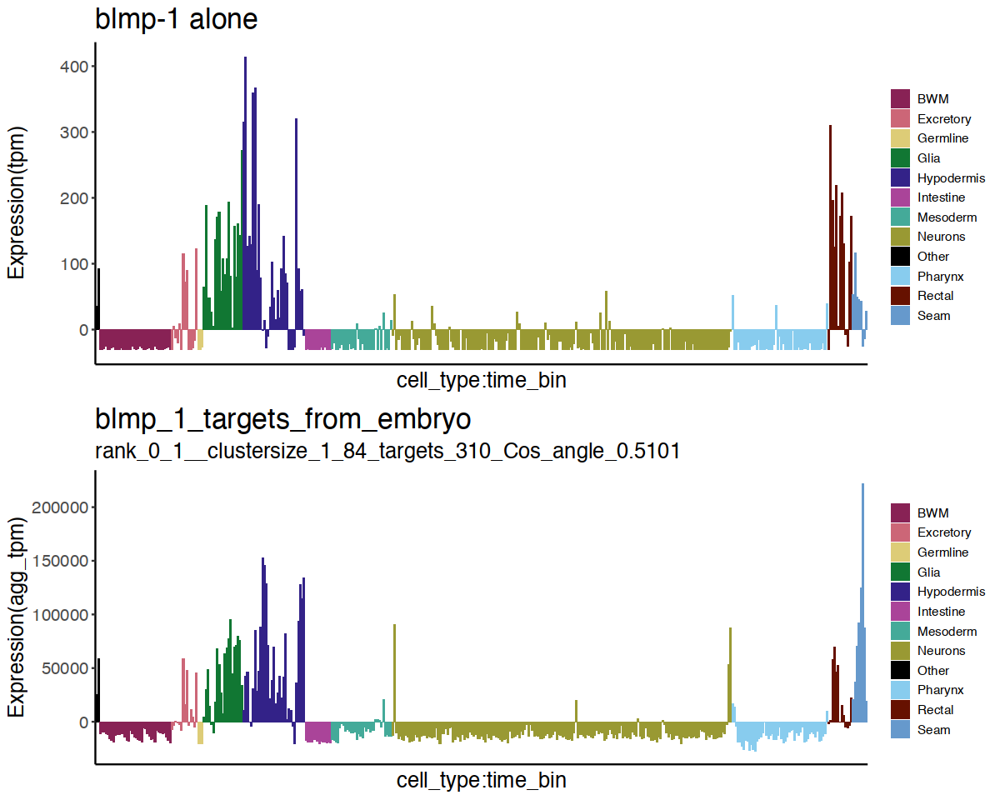

In [248]:
TF_agg_plot3("blmp-1")
#print(gg_both)

In [291]:
fig8a = TF_agg_plot3("blmp-1")

[1] 310


In [292]:
    pdf("figures/Figure_8a_worm_blmp_1_aggregate_plot.pdf", width = 10, height = 8)
print(fig8a)
dev.off()

png("figures/Figure_8a_worm_blmp_1_aggregate_plot.png", width = 1000, height = 800)
print(fig8a)
dev.off()

jpeg("figures/Figure_8a_worm_blmp_1_aggregate_plot.jpg", width = 1000, height = 800)
print(fig8a)
dev.off()

pdf 
  2

pdf 
  2

pdf 
  2

## Supplemental figure 6

[1] 849


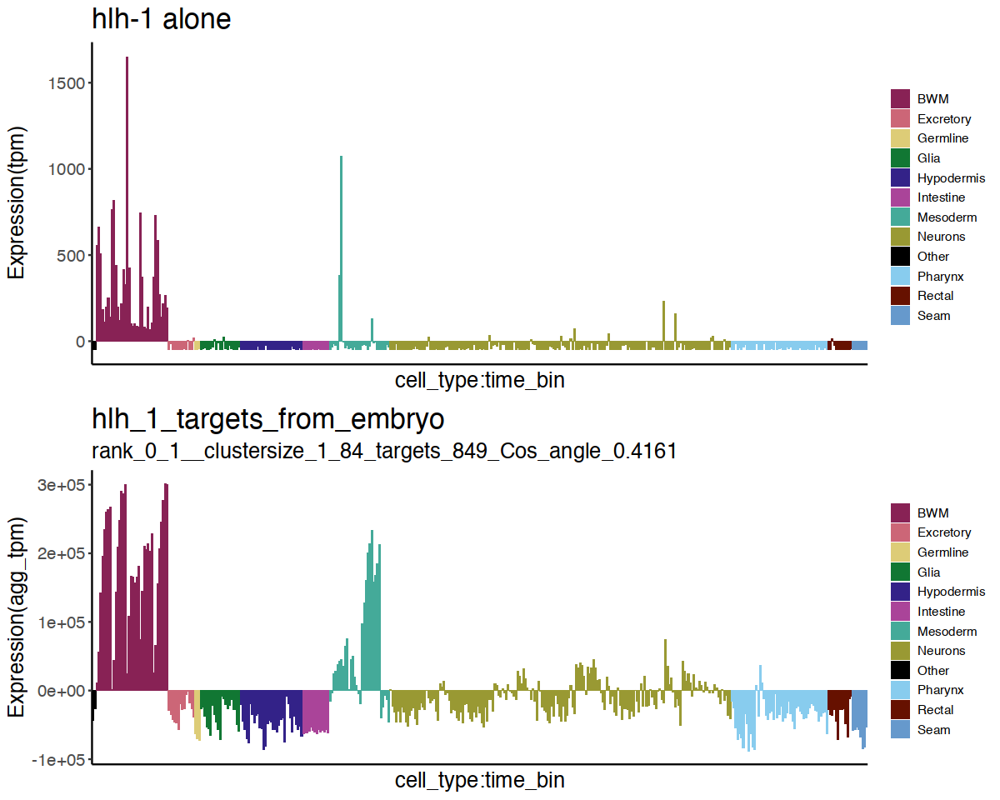

In [274]:
TF_agg_plot3("hlh-1")

In [293]:
supfig6a = TF_agg_plot3("hlh-1")

[1] 849


In [298]:
    pdf("figures/Supplemental_Figure_6a_worm_hlh_1_aggregate_plot.pdf", width = 10, height = 8)
print(supfig6a)
dev.off()

png("figures/Supplemental_Figure_6a_worm_hlh_1_aggregate_plot.png", width = 1000, height = 800)
print(supfig6a)
dev.off()

jpeg("figures/Supplemental_Figure_6a_worm_hlh_1_aggregate_plot.jpg", width = 1000, height = 800)
print(supfig6a)
dev.off()

pdf 
  2

pdf 
  2

pdf 
  2

[1] 238


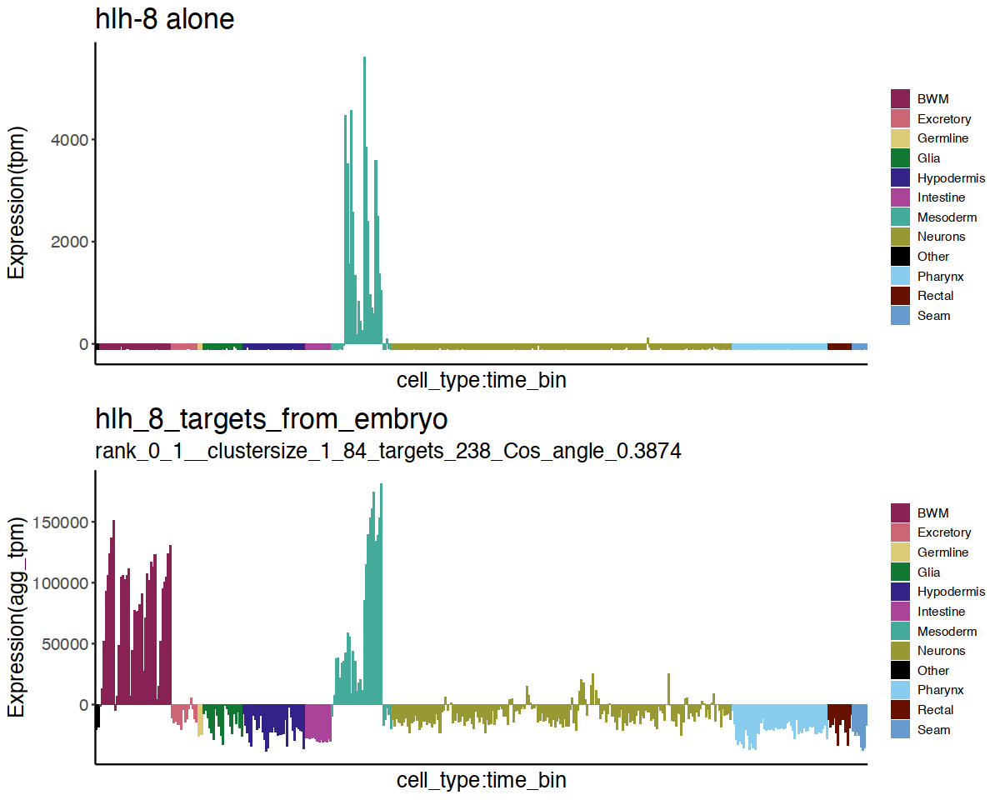

In [275]:
TF_agg_plot3("hlh-8")

In [295]:
supfig6b = TF_agg_plot3("hlh-8")

[1] 238


In [299]:
    pdf("figures/Supplemental_Figure_6b_worm_hlh_8_aggregate_plot.pdf", width = 10, height = 8)
print(supfig6b)
dev.off()

png("figures/Supplemental_Figure_6b_worm_hlh_8_aggregate_plot.png", width = 1000, height = 800)
print(supfig6b)
dev.off()

jpeg("figures/Supplemental_Figure_6b_worm_hlh_8_aggregate_plot.jpg", width = 1000, height = 800)
print(supfig6b)
dev.off()

pdf 
  2

pdf 
  2

pdf 
  2

In [281]:
hlh1_targets = unique((worm_peaks_TF  %>% filter( !(Gene %in% c(gt240genes, gt84lte240genes)) & TF == "hlh-1" &
                                        nPeaks > 1 & grepl("emb", exp) & Gene != "hlh-1"))$Gene)

In [282]:
length(hlh1_targets)

[1] 849

In [283]:
hlh8_targets = unique((worm_peaks_TF  %>% filter( !(Gene %in% c(gt240genes, gt84lte240genes)) & TF == "hlh-8" &
                                        nPeaks > 1 & grepl("emb", exp) & Gene != "hlh-8"))$Gene)

In [286]:
length(hlh8_targets)

[1] 238

In [290]:
intersect(hlh8_targets, hlh1_targets)  %>% sort

[1] "aly-1"       "anmt-2"      "aqp-2"       "bre-3"       "C01G6.2"    
  [6] "C02B10.5"    "C02B8.6"     "C04C11.1"    "C05D9.3"     "C13F10.1"   
 [11] "C18E3.3"     "C31H5.4"     "C34F6.5"     "C48D5.3"     "C48E7.6"    
 [16] "C53D5.1"     "C54E10.6"    "cas-1"       "cdgs-1"      "cgp-1"      
 [21] "chdp-1"      "cls-3"       "D2045.9"     "dhhc-8"      "dli-1"      
 [26] "egl-18"      "epi-1"       "etr-1"       "exc-9"       "F11A6.16"   
 [31] "F13B12.6"    "F35B3.7"     "F36F12.3"    "F41H10.3"    "F43B10.1"   
 [36] "F44E5.5"     "F54D5.24"    "far-1"       "fkb-5"       "hbl-1"      
 [41] "idpp-9"      "K02E2.11"    "K07E3.1"     "kal-1"       "klp-11"     
 [46] "lam-1"       "lam-2"       "let-268"     "lite-1"      "mab-20"     
 [51] "magu-2"      "mig-6"       "mlc-3"       "mlp-1"       "mog-5"      
 [56] "mup-2"       "nck-1"       "ncs-3"       "nhr-64"      "nstp-5"     
 [61] "ost-1"       "pals-33"     "pat-10"      "pqn-62"      "prmt-9"     
 [66] "ptp-5.1"     "R02E4.2"     "R02F11.3"    "rgs-4"       "rpn-3"      
 [71] "rps-23"      "sav-1"       "ssu-2"       "sup-9"       "T03E6.9"    
 [76] "T12D8.9"     "T13H5.1"     "T22C1.6"     "T28A11.22"   "tag-273"    
 [81] "tag-275"     "test-1"      "ttbk-7"      "ttr-6"       "txt-14"     
 [86] "unc-132"     "unc-22"      "unc-36"      "unc-5"       "unc-83"     
 [91] "unc-89"      "unc-95"      "W05B5.1"     "Y116A8C.9"   "Y116F11B.14"
 [96] "Y17G9B.5"    "Y20F4.4"     "Y41D4A.7"    "Y49A10A.2"   "Y67D8B.1"   
[101] "Y69A2AR.1"   "Y73F8A.26"   "Y82E9BR.20"  "zag-1"       "ZC190.4"    
[106] "zig-1"       "ZK131.11"    "ZK993.2"

In [302]:
worm_peaks_TF  %>% filter(TF == "hlh-1" & Gene == "ost-1")  %>% select(1:20)

peakID,absDist,chromo.x,start.x,end.x,exp,score,strand.x,apexS.x,apexE.x,color.x,cluster,target,targetDist,chromo.y,start.y,end.y,nPeaks,strand.y,apexS.y
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
hlh-1_OP64_mixedstage_embryonic_2chrIV1106016:1106352,1212,chrIV,1106016,1106352,hlh-1_OP64_mixedstage_embryonic_2,1000,.,1106182,1106186,"255,0,0",2_narrowPeak16488,C44B12.2a.1::5P,-1212,chrIV,1105935,1106416,5,.,1106059
hlh-1_OP64_mixedstage_embryonic_2chrIV1107292:1107628,64,chrIV,1107292,1107628,hlh-1_OP64_mixedstage_embryonic_2,1000,.,1107458,1107462,"0,0,255",3_narrowPeak13229,C44B12.2a.1::E1,64,chrIV,1107089,1107857,21,.,1107353
hlh-1_OP64_mixedstage_embryonic_2chrIV1108104:1108440,666,chrIV,1108104,1108440,hlh-1_OP64_mixedstage_embryonic_2,1000,.,1108270,1108274,"0,255,0",3_narrowPeak13230,C44B12.2b.1::I2,-666,chrIV,1107858,1108718,51,.,1108172


In [303]:
worm_peaks_TF  %>% filter(TF == "hlh-8" & Gene == "ost-1")  %>% select(1:20)

peakID,absDist,chromo.x,start.x,end.x,exp,score,strand.x,apexS.x,apexE.x,color.x,cluster,target,targetDist,chromo.y,start.y,end.y,nPeaks,strand.y,apexS.y
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
hlh-8_OP63_lateembryonic_1chrIV1108185:1108341,653,chrIV,1108185,1108341,hlh-8_OP63_lateembryonic_1,1000,.,1108283,1108287,"0,255,0",3_narrowPeak13230,C44B12.2b.1::I2,-653,chrIV,1107858,1108718,51,.,1108172


In [304]:
worm_peaks_TF  %>% filter(TF == "hlh-1" & Gene == "pat-10")  %>% select(1:20)
worm_peaks_TF  %>% filter(TF == "hlh-8" & Gene == "pat-10")  %>% select(1:20)

peakID,absDist,chromo.x,start.x,end.x,exp,score,strand.x,apexS.x,apexE.x,color.x,cluster,target,targetDist,chromo.y,start.y,end.y,nPeaks,strand.y,apexS.y
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
hlh-1_OP64_mixedstage_embryonic_2chrI5020094:5020430,96,chrI,5020094,5020430,hlh-1_OP64_mixedstage_embryonic_2,1000,.,5020260,5020264,"255,0,0",2_narrowPeak1956,F54C1.7.2::E1,96,chrI,5019907,5020620,31,.,5020238


peakID,absDist,chromo.x,start.x,end.x,exp,score,strand.x,apexS.x,apexE.x,color.x,cluster,target,targetDist,chromo.y,start.y,end.y,nPeaks,strand.y,apexS.y
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
hlh-8_OP63_lateembryonic_1chrI5020138:5020397,99,chrI,5020138,5020397,hlh-8_OP63_lateembryonic_1,1000,.,5020257,5020261,"255,0,0",2_narrowPeak1956,F54C1.7.2::E1,99,chrI,5019907,5020620,31,.,5020238


## Explore relationships between expression level and distribution of peaks between HOT and non HOT sites

In [306]:
load("data/worm_figure_7.RData")

In [309]:
ls()

[1] "a"                                   
  [2] "angleCosine"                         
  [3] "b"                                   
  [4] "BWM"                                 
  [5] "c"                                   
  [6] "cbbPalette12"                        
  [7] "cds_jp"                              
  [8] "celltype_expr"                       
  [9] "classes"                             
 [10] "cluster_nPeaks_genes"                
 [11] "complex_genes"                       
 [12] "complex_TF_genes"                    
 [13] "d"                                   
 [14] "df_genes"                            
 [15] "e"                                   
 [16] "entropy"                             
 [17] "Excretory"                           
 [18] "exp_matrix"                          
 [19] "exp_matrix_emb_mean"                 
 [20] "exp_matrix_L2"                       
 [21] "exp_matrix_L2_mean"                  
 [22] "exp_matrix_lineage"                  
 [23] "exp_matrix_lineage_mean"             
 [24] "exp_matrix_mean"                     
 [25] "exp_matrix_mean_order"               
 [26] "exp_matrix_YA"                       
 [27] "exp_matrix_YA_mean"                  
 [28] "expression_name_change"              
 [29] "f2a"                                 
 [30] "f5b"                                 
 [31] "fig7_function"                       
 [32] "fig8a"                               
 [33] "figure2a"                            
 [34] "Figure3_worm_violin"                 
 [35] "figure5b"                            
 [36] "file_name"                           
 [37] "g"                                   
 [38] "gen"                                 
 [39] "gen_exp"                             
 [40] "gene_clusters"                       
 [41] "gene_clusters_peaksum"               
 [42] "gene_entropies"                      
 [43] "gene_entropies_max_mean_median"      
 [44] "gene_entropies_max_mean_median_group"
 [45] "gene_max_mean_median"                
 [46] "genes_peaks"                         
 [47] "Germline"                            
 [48] "gg_both"                             
 [49] "Glia"                                
 [50] "gt1lte6genes"                        
 [51] "gt2_TFs"                             
 [52] "gt240genes"                          
 [53] "gt30lte84genes"                      
 [54] "gt6lte30genes"                       
 [55] "gt84lte240genes"                     
 [56] "hkg_285"                             
 [57] "hkg_noCluster"                       
 [58] "hlh1_targets"                        
 [59] "hlh8_targets"                        
 [60] "Hypodermis"                          
 [61] "Intestine"                           
 [62] "lb"                                  
 [63] "meso"                                
 [64] "Neurons"                             
 [65] "neutral_TFs"                         
 [66] "p"                                   
 [67] "peaks_by_cluster_size"               
 [68] "Pharynx"                             
 [69] "r"                                   
 [70] "ranklb"                              
 [71] "rankub"                              
 [72] "Rectal"                              
 [73] "reorder_column_names"                
 [74] "RNA_var_lets"                        
 [75] "Seam"                                
 [76] "sf5_function"                        
 [77] "sum_mat"                             
 [78] "supfig6a"                            
 [79] "supfig6b"                            
 [80] "t"                                   
 [81] "table2_function"                     
 [82] "target_numbers"                      
 [83] "temp"                                
 [84] "test_genes"                          
 [85] "tf"                                  
 [86] "TF_agg_plot.random"                  
 [87] "TF_agg_plot2"                        
 [88] "TF_agg_plot3"                        
 [89] "tfn"                               

In [310]:
worm_peaks_TF  %>% colnames

[1] "peakID"          "absDist"         "chromo.x"        "start.x"        
 [5] "end.x"           "exp"             "score"           "strand.x"       
 [9] "apexS.x"         "apexE.x"         "color.x"         "cluster"        
[13] "target"          "targetDist"      "chromo.y"        "start.y"        
[17] "end.y"           "nPeaks"          "strand.y"        "apexS.y"        
[21] "apexE.y"         "color.y"         "TranscriptCoord" "Transcript"     
[25] "TranscriptLoc"   "Gene"            "GeneLoc"         "GeneExons"      
[29] "TranscriptNo"    "UniqueGeneTSSs"  "GeneTranscripts" "rank"           
[33] "TF"              "group"

In [317]:
worm_peaks_TF  %>% filter(TF == "hlh-1" & !(group %in% c("85-240", "gt240")))

peakID,absDist,chromo.x,start.x,end.x,exp,score,strand.x,apexS.x,apexE.x,⋯,TranscriptLoc,Gene,GeneLoc,GeneExons,TranscriptNo,UniqueGeneTSSs,GeneTranscripts,rank,TF,group
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
hlh-1_OP64_mixedstage_embryonic_2chrI10037538:10037874,2890,chrI,10037538,10037874,hlh-1_OP64_mixedstage_embryonic_2,838,.,10037704,10037708,⋯,5P,ncs-2,5P,3,1,1,1,0.15665434,hlh-1,85-240
hlh-1_OP64_mixedstage_embryonic_2chrI10074750:10075086,76,chrI,10074750,10075086,hlh-1_OP64_mixedstage_embryonic_2,1000,.,10074916,10074920,⋯,5P,B0379.1,5P,6,1,1,1,0.83086876,hlh-1,7-30
hlh-1_OP64_mixedstage_embryonic_2chrI10145147:10145483,2010,chrI,10145147,10145483,hlh-1_OP64_mixedstage_embryonic_2,906,.,10145313,10145317,⋯,5P,F16C3.1,5P,7,1,1,1,0.26478743,hlh-1,7-30
hlh-1_OP64_mixedstage_embryonic_2chrI10190907:10191243,179,chrI,10190907,10191243,hlh-1_OP64_mixedstage_embryonic_2,806,.,10191073,10191077,⋯,5P,dao-5,5P,5,2,2,2,0.13632163,hlh-1,85-240
hlh-1_OP64_mixedstage_embryonic_2chrI10232590:10232926,628,chrI,10232590,10232926,hlh-1_OP64_mixedstage_embryonic_2,743,.,10232756,10232760,⋯,I1,csnk-1,I1,9,2,2,2,0.38678373,hlh-1,85-240
hlh-1_OP64_mixedstage_embryonic_2chrI10235207:10235543,1989,chrI,10235207,10235543,hlh-1_OP64_mixedstage_embryonic_2,1000,.,10235373,10235377,⋯,5P,csnk-1,5P,9,2,2,2,0.51756007,hlh-1,85-240
hlh-1_OP64_mixedstage_embryonic_2chrI10261325:10261661,757,chrI,10261325,10261661,hlh-1_OP64_mixedstage_embryonic_2,1000,.,10261491,10261495,⋯,I1,ZC247.2,I1,12,1,1,1,0.37292052,hlh-1,2-6
hlh-1_OP64_mixedstage_embryonic_2chrI10262245:10262336,73,chrI,10262245,10262336,hlh-1_OP64_mixedstage_embryonic_2,1000,.,10262321,10262325,⋯,5P,ZC247.2,5P,12,1,1,1,0.82763401,hlh-1,31-84
hlh-1_OP64_mixedstage_embryonic_2chrI10280572:10280908,1506,chrI,10280572,10280908,hlh-1_OP64_mixedstage_embryonic_2,899,.,10280738,10280742,⋯,5P,ZC247.1,5P,11,1,1,1,0.35351201,hlh-1,31-84


In [320]:
worm_peaks_TF  %>% count(cluster, group)  %>% count(group)

group,n
<fct>,<int>
1,17153
2-6,17913
7-30,11369
31-84,3823
85-240,2070
gt240,546


In [323]:
worm_peaks_TF  %>% filter(TF == "ceh-48") %>% dim
worm_peaks_TF  %>% filter(TF == "ceh-48" & !(group %in% c("85-240", "gt240")))  %>% dim
worm_peaks_TF  %>% filter(TF == "ceh-48" & (group %in% c("85-240", "gt240")))  %>% dim

[1] 1943   34

[1] 912  34

[1] 1031   34

In [325]:
gen = "hlh-8"
worm_peaks_TF  %>% filter(TF == gen) %>% dim
worm_peaks_TF  %>% filter(TF == gen & !(group %in% c("85-240", "gt240")))  %>% dim
worm_peaks_TF  %>% filter(TF == gen & (group %in% c("85-240", "gt240")))  %>% dim

[1] 1145   34

[1] 297  34

[1] 848  34

In [326]:
gen = "che-1"
worm_peaks_TF  %>% filter(TF == gen) %>% dim
worm_peaks_TF  %>% filter(TF == gen & !(group %in% c("85-240", "gt240")))  %>% dim
worm_peaks_TF  %>% filter(TF == gen & (group %in% c("85-240", "gt240")))  %>% dim

[1] 673  34

[1] 81 34

[1] 592  34

In [329]:
gen = "pqm-1"
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen) %>% dim
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen & !(group %in% c("85-240", "gt240")))  %>% dim
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen & (group %in% c("85-240", "gt240")))  %>% dim

[1] 746  34

[1] 113  34

[1] 633  34

In [330]:
gen = "elt-1"
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen) %>% dim
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen & !(group %in% c("85-240", "gt240")))  %>% dim
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen & (group %in% c("85-240", "gt240")))  %>% dim

[1] 1228   34

[1] 889  34

[1] 339  34

In [331]:
gen = "elt-3"
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen) %>% dim
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen & !(group %in% c("85-240", "gt240")))  %>% dim
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen & (group %in% c("85-240", "gt240")))  %>% dim

[1] 434  34

[1] 148  34

[1] 286  34

In [332]:
gen = "lsy-2"
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen) %>% dim
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen & !(group %in% c("85-240", "gt240")))  %>% dim
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen & (group %in% c("85-240", "gt240")))  %>% dim

[1] 3043   34

[1] 1337   34

[1] 1706   34

In [333]:
gen = "eyg-1"
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen) %>% dim
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen & !(group %in% c("85-240", "gt240")))  %>% dim
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen & (group %in% c("85-240", "gt240")))  %>% dim

[1] 487  34

[1] 34 34

[1] 453  34

In [340]:
gen = "pha-4"
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen) %>% dim
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen & !(group %in% c("85-240", "gt240")))  %>% dim
worm_peaks_TF  %>% filter(grepl("emb", exp) & TF == gen & (group %in% c("85-240", "gt240")))  %>% dim
gene_entropies_max_mean_median_group  %>% filter(gene == gen)

[1] 2060   34

[1] 716  34

[1] 1344   34

gene,Entropy,max_tpm,mean_tpm,median_tpm,group
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
pha-4,6.486409,1629,77.6511,9.4,31-84


In [363]:
nonHOT_peaks worm_peaks_TF  %>% filter(grepl("emb", exp) & !(group %in% c("85-240", "gt240"))) %>% group_by(TF)  %>% 
count(TF)


In [364]:
HOT_peaks = worm_peaks_TF  %>% filter(grepl("emb", exp) & (group %in% c("85-240", "gt240"))) %>% group_by(TF)  %>% 
count(TF)


In [365]:
all_peaks = worm_peaks_TF  %>% filter(grepl("emb", exp) ) %>% group_by(TF)  %>% 
count(TF)


In [371]:
all_peaks = all_peaks  %>% rename("all_peaks" = "n")

In [372]:
HOT_peaks = HOT_peaks  %>% rename("HOT_peaks" = "n")

In [373]:
nonHOT_peaks = nonHOT_peaks  %>% rename("nonHOT_peaks" = "n")

In [377]:
peak_nums = left_join(all_peaks, HOT_peaks, by = "TF")

In [379]:
peak_nums = left_join(peak_nums, nonHOT_peaks, by = "TF")

In [384]:
TF_peaks = left_join(peak_nums, gene_entropies_max_mean_median_group, by = c("TF" = "gene"))

In [385]:
head(TF_peaks )

TF,all_peaks,HOT_peaks,nonHOT_peaks,Entropy,max_tpm,mean_tpm,median_tpm,group,norm_ent
<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
B0310.2,418,340,78,5.527768,100.5,3.63912,0.0,7-30,0.6371364
C38D4.7,510,454,56,4.267320,200.0,2.70000,0.0,2-6,0.4918558
K09A11.1,578,491,87,7.414190,140.1,13.76333,5.6,gt240,0.8545674
M03D4.4,1428,1046,382,6.182171,981.8,54.54914,0.4,7-30,0.7125636
T22C8.4,2415,909,1506,5.270904,248.4,6.09022,0.0,1,0.6075299
T23F11.4,545,475,70,7.996937,402.8,77.36210,51.1,85-240,0.9217354


In [386]:
TF_peaks = TF_peaks  %>% mutate(fxn_of_HOT = HOT_peaks/2616)

In [387]:
TF_peaks = TF_peaks  %>% mutate(fxn_in_HOT = HOT_peaks/all_peaks)

In [388]:
TF_peaks  %>%  head

TF,all_peaks,HOT_peaks,nonHOT_peaks,Entropy,max_tpm,mean_tpm,median_tpm,group,norm_ent,fxn_of_HOT,fxn_in_HOT
<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>
B0310.2,418,340,78,5.527768,100.5,3.63912,0.0,7-30,0.6371364,0.1299694,0.8133971
C38D4.7,510,454,56,4.267320,200.0,2.70000,0.0,2-6,0.4918558,0.1735474,0.8901961
K09A11.1,578,491,87,7.414190,140.1,13.76333,5.6,gt240,0.8545674,0.1876911,0.8494810
M03D4.4,1428,1046,382,6.182171,981.8,54.54914,0.4,7-30,0.7125636,0.3998471,0.7324930
T22C8.4,2415,909,1506,5.270904,248.4,6.09022,0.0,1,0.6075299,0.3474771,0.3763975
T23F11.4,545,475,70,7.996937,402.8,77.36210,51.1,85-240,0.9217354,0.1815749,0.8715596


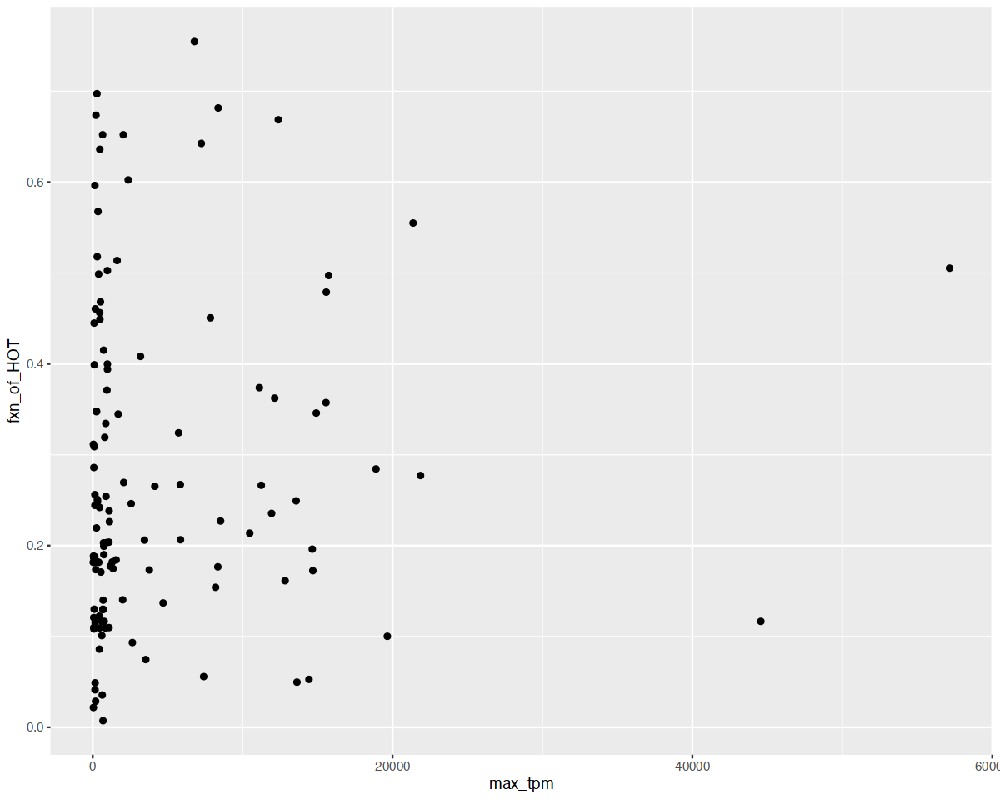

In [389]:
ggplot(TF_peaks, aes(x = max_tpm, y = fxn_of_HOT)) +
geom_point()

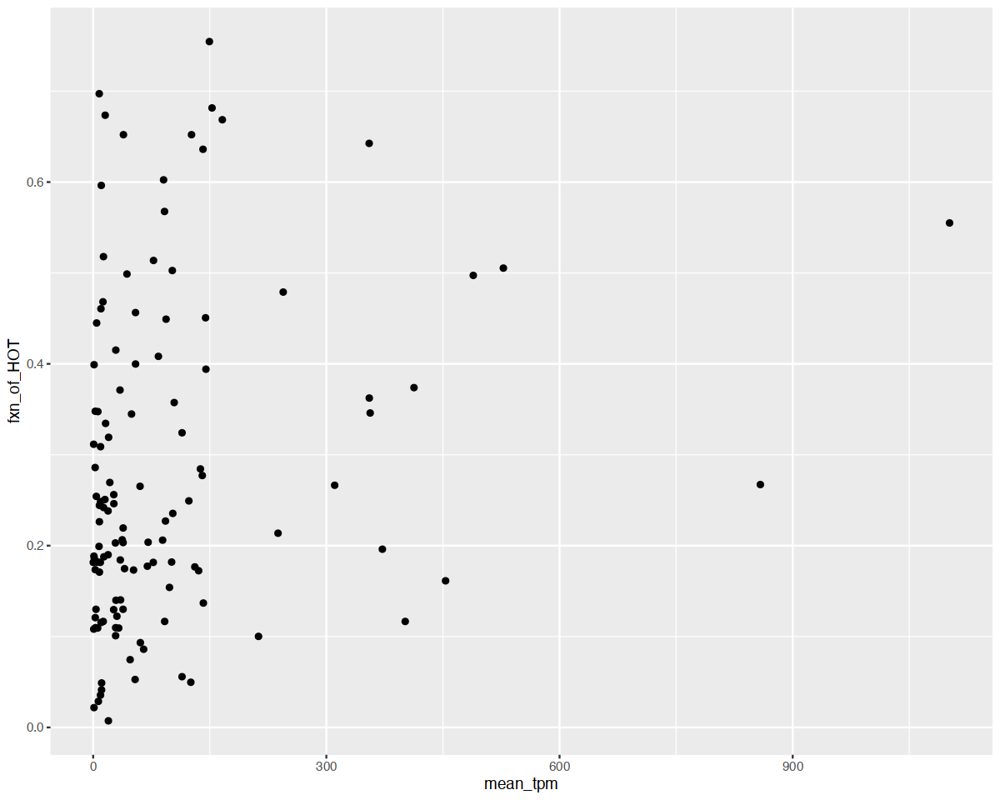

In [390]:
ggplot(TF_peaks, aes(x = mean_tpm, y = fxn_of_HOT)) +
geom_point()

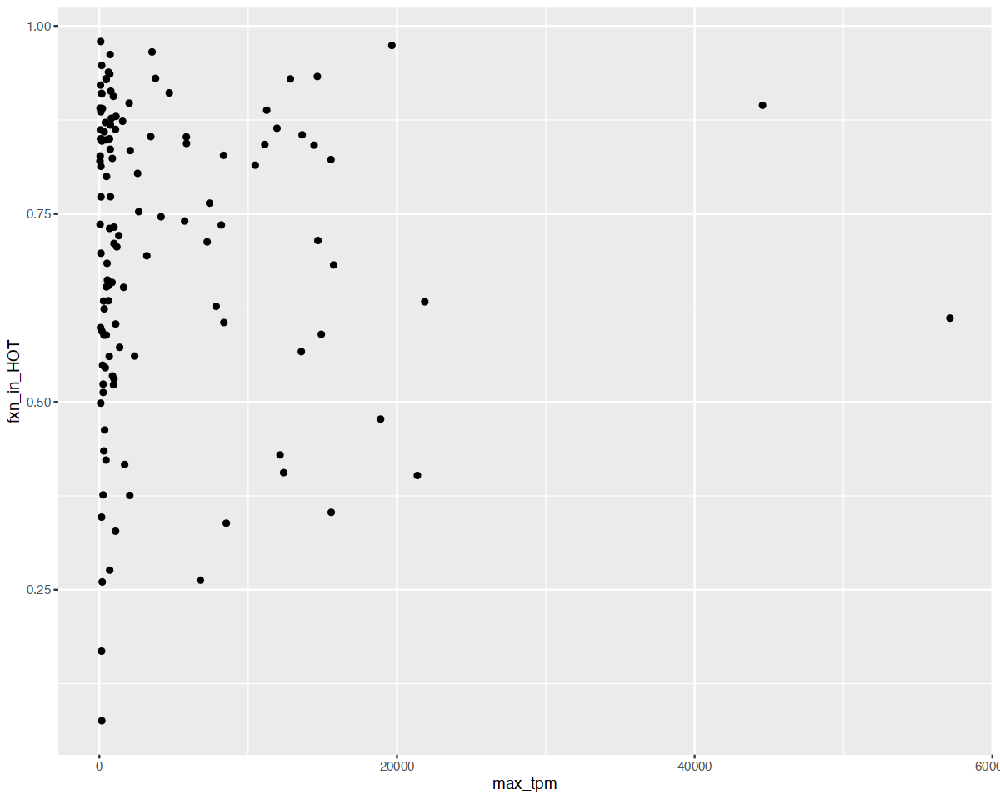

In [391]:
ggplot(TF_peaks, aes(x = max_tpm, y = fxn_in_HOT)) +
geom_point()

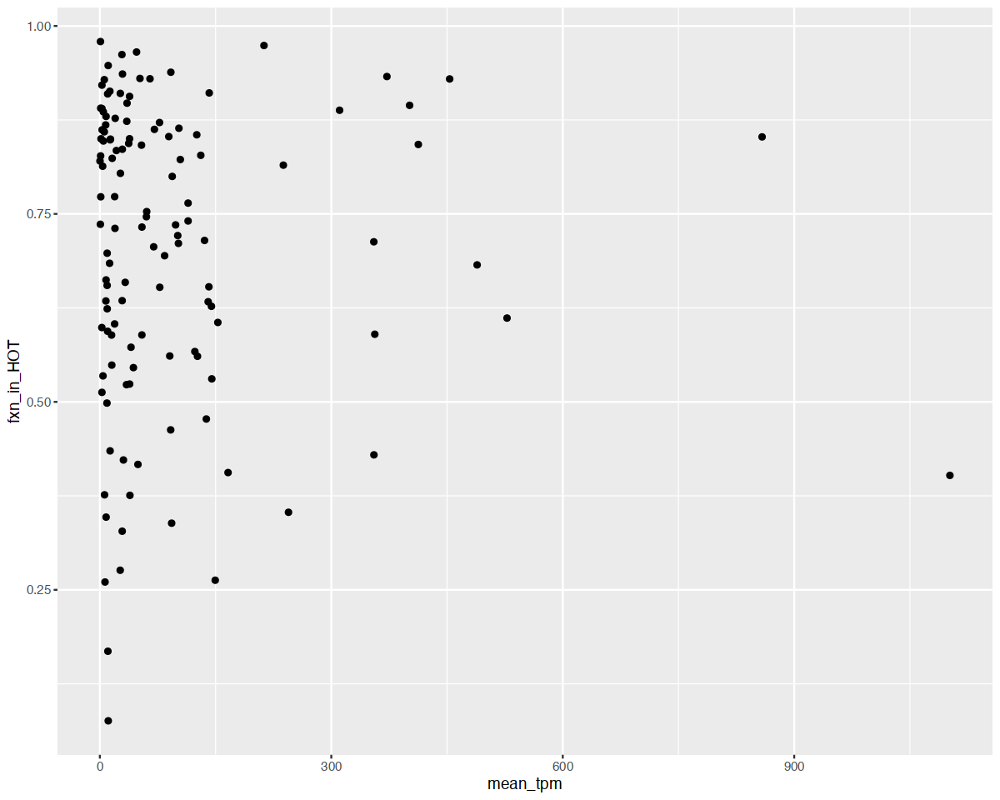

In [392]:
ggplot(TF_peaks, aes(x = mean_tpm, y = fxn_in_HOT)) +
geom_point()

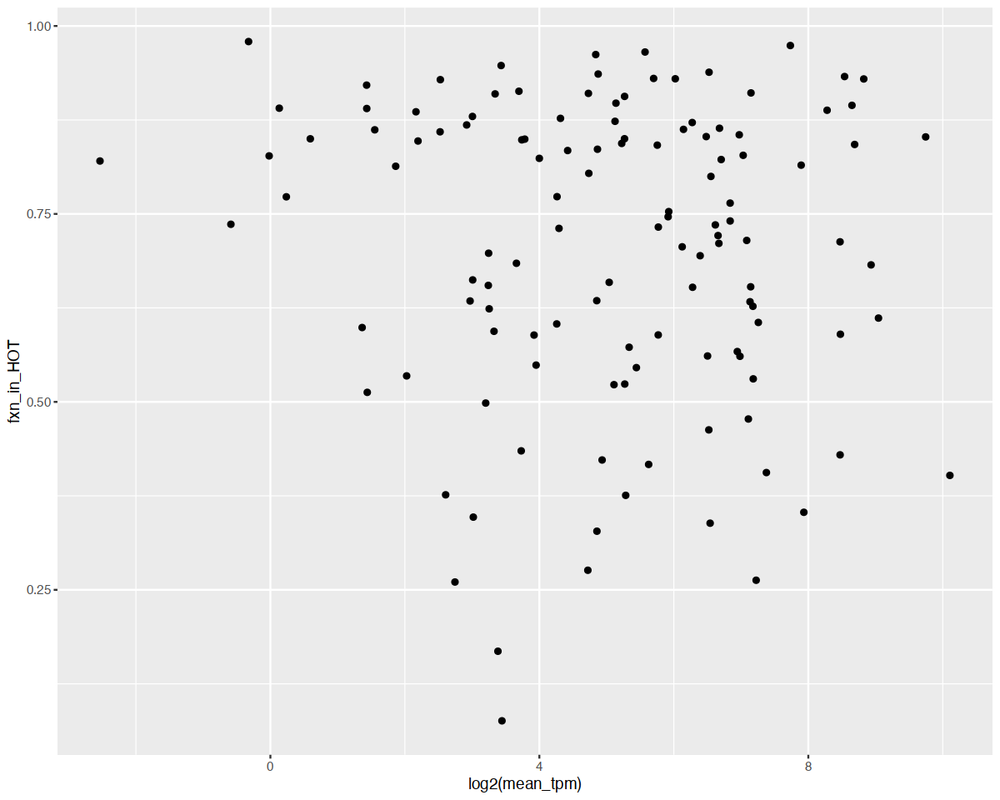

In [393]:
ggplot(TF_peaks, aes(x = log2(mean_tpm), y = fxn_in_HOT)) +
geom_point()

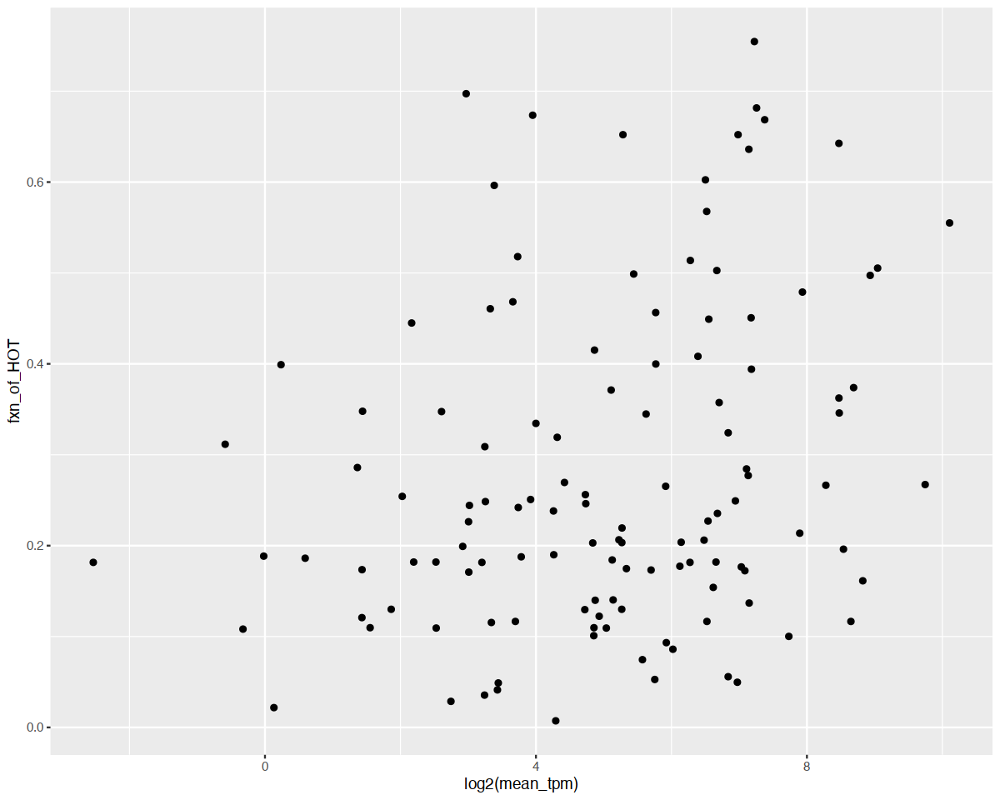

In [394]:
ggplot(TF_peaks, aes(x = log2(mean_tpm), y = fxn_of_HOT)) +
geom_point()

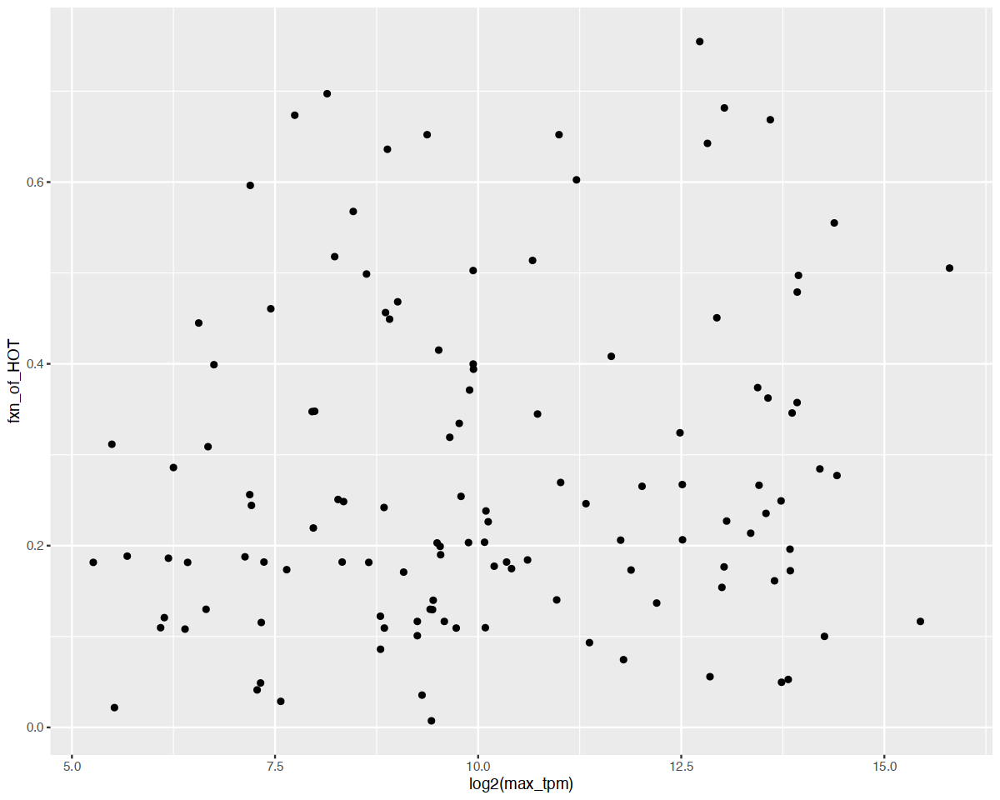

In [395]:
ggplot(TF_peaks, aes(x = log2(max_tpm), y = fxn_of_HOT)) +
geom_point()

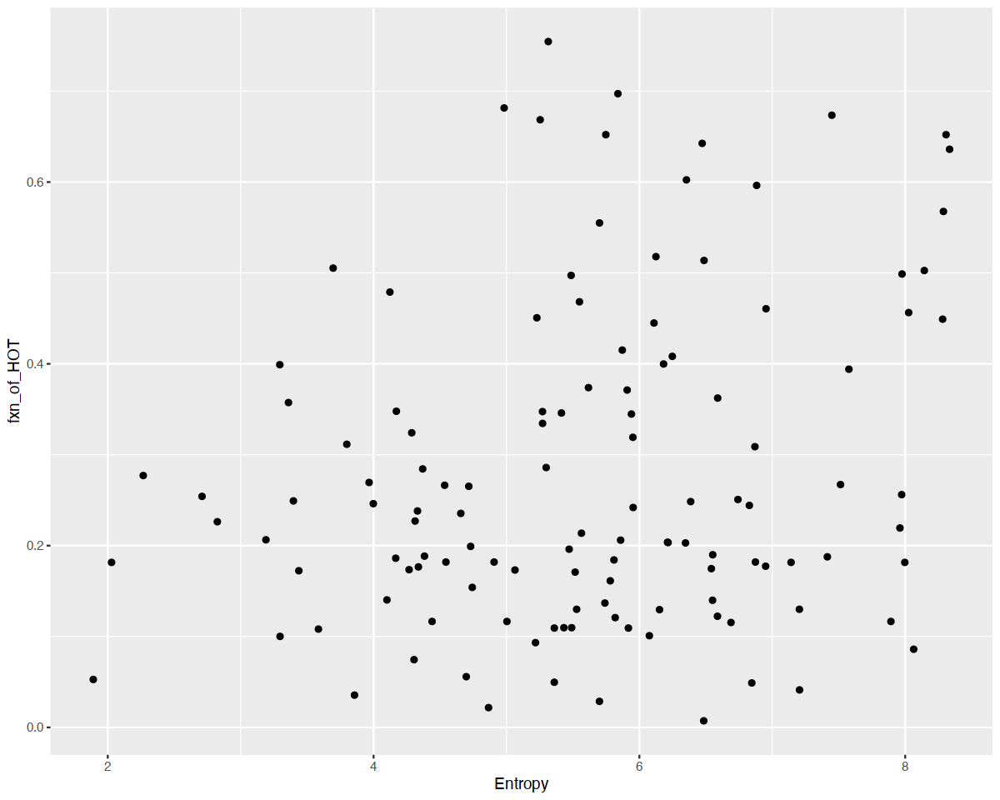

In [396]:
ggplot(TF_peaks, aes(x = Entropy, y = fxn_of_HOT)) +
geom_point()

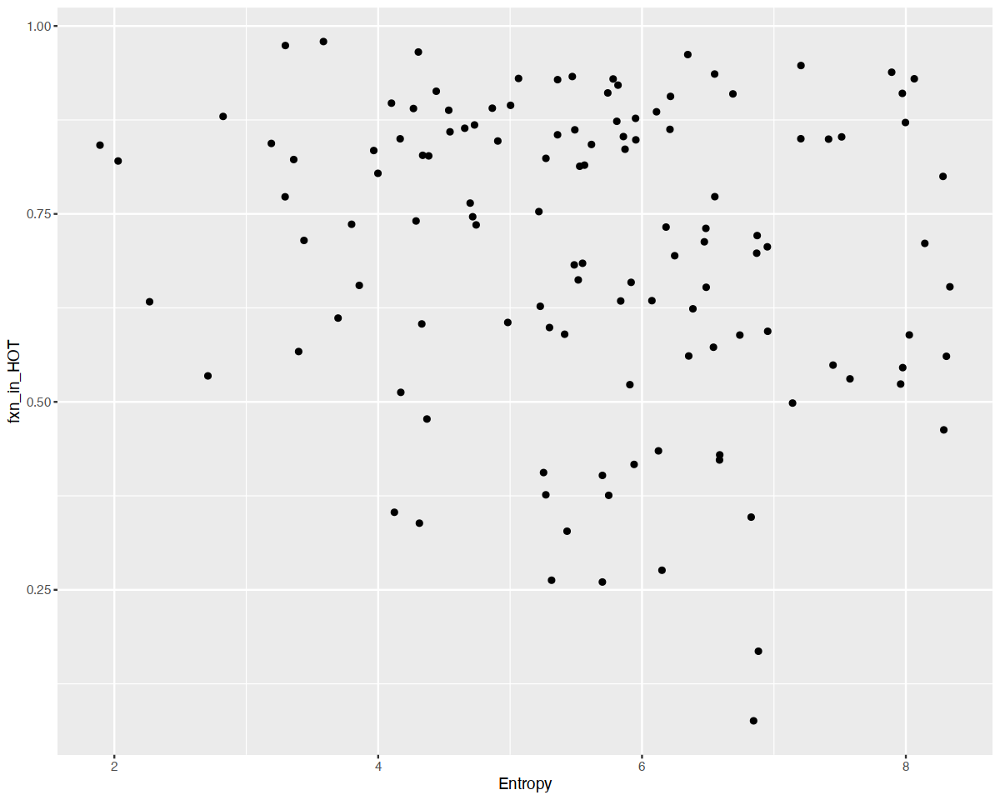

In [397]:
ggplot(TF_peaks, aes(x = Entropy, y = fxn_in_HOT)) +
geom_point()

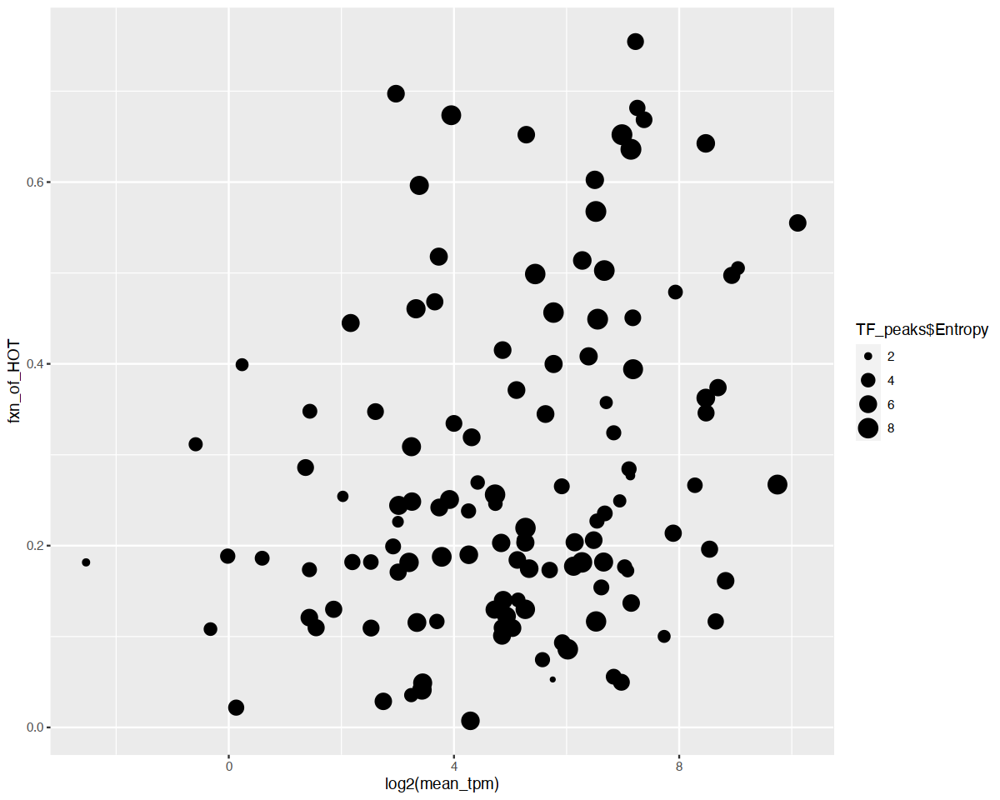

In [399]:
ggplot(TF_peaks, aes(x = log2(mean_tpm), y = fxn_of_HOT)) +
geom_point(aes(size = TF_peaks$Entropy))

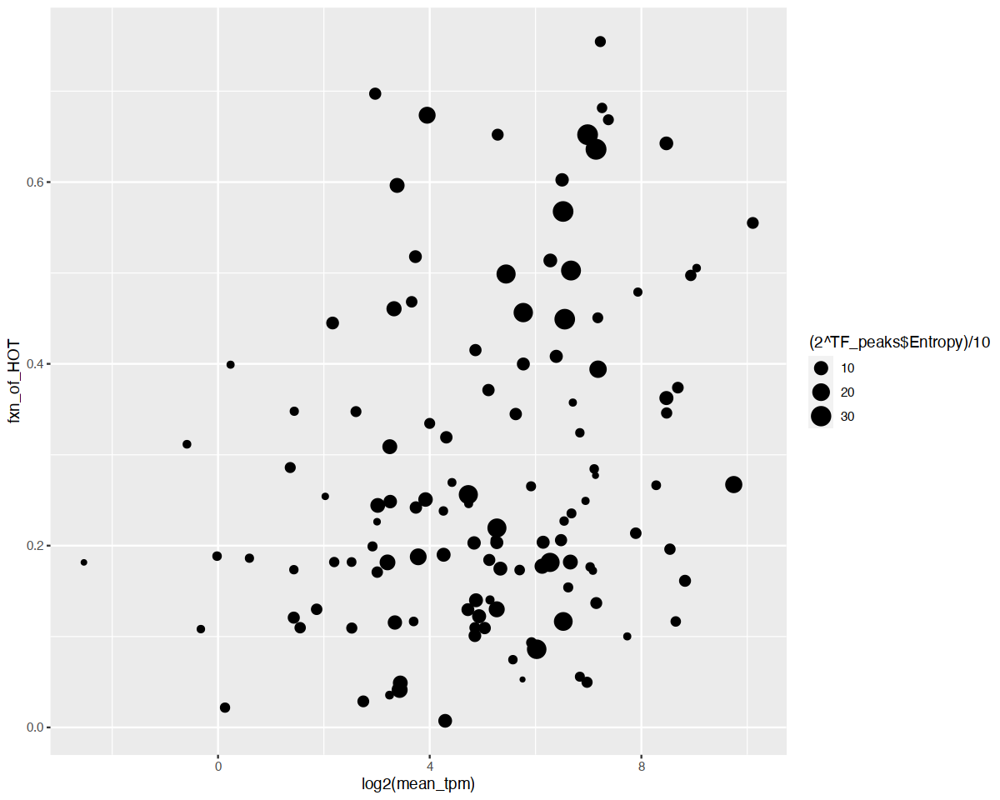

In [400]:
ggplot(TF_peaks, aes(x = log2(mean_tpm), y = fxn_of_HOT)) +
geom_point(aes(size = (2^TF_peaks$Entropy)/10))

Warning message:
“ggrepel: 36 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


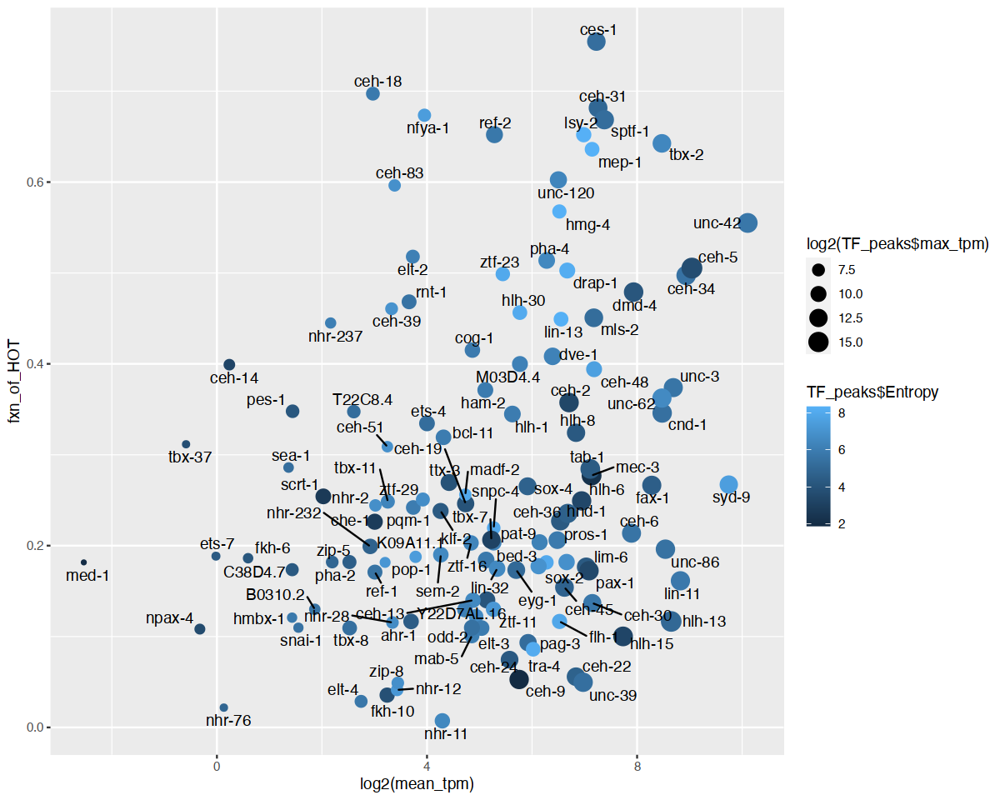

In [415]:
ggplot(TF_peaks, aes(x = log2(mean_tpm), y = fxn_of_HOT), label = TF) +
geom_point(aes(size = log2(TF_peaks$max_tpm), color = TF_peaks$Entropy)) +
geom_text_repel(label = TF_peaks$TF, hjust = 0.2, nudge_x = 0.05,)

Warning message:
“ggrepel: 32 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


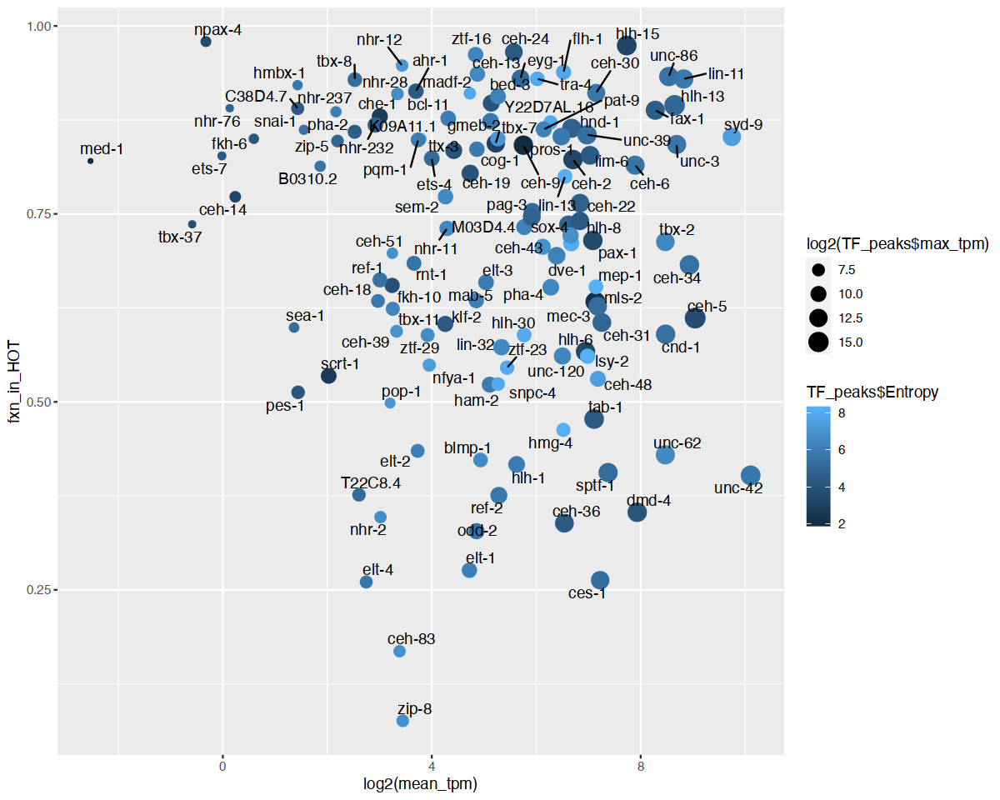

In [414]:
ggplot(TF_peaks, aes(x = log2(mean_tpm), y = fxn_in_HOT)) +
geom_point(aes(size = log2(TF_peaks$max_tpm), color = TF_peaks$Entropy))+
geom_text_repel(label = TF_peaks$TF)

Warning message:
“ggrepel: 37 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


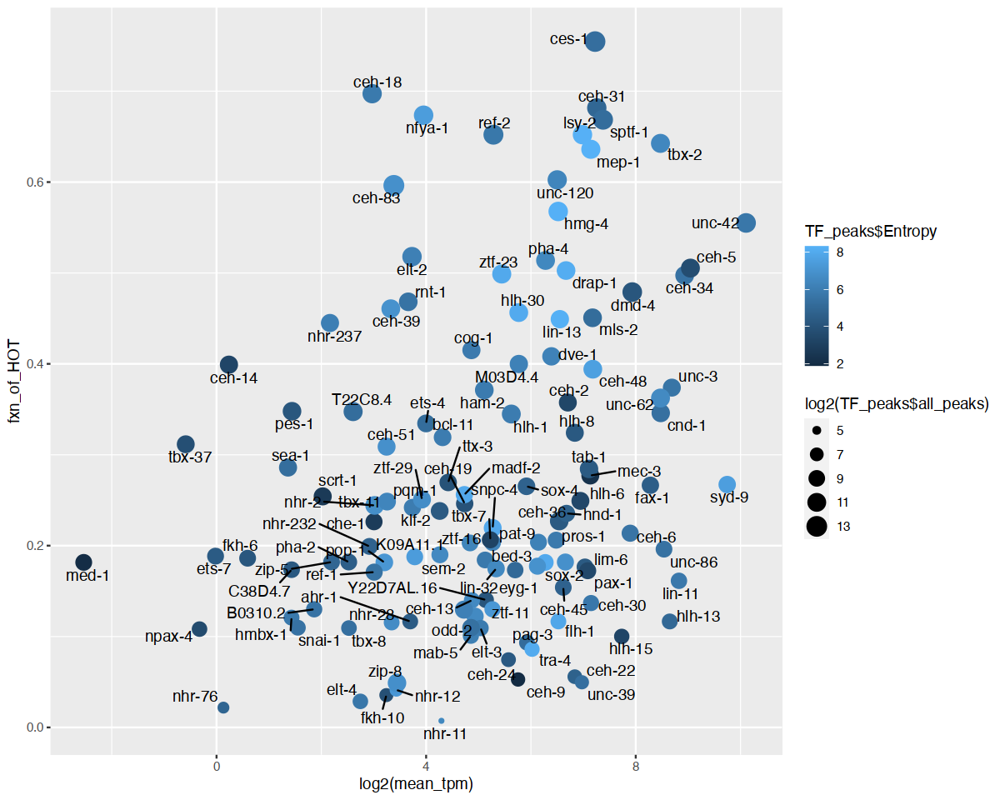

In [416]:
ggplot(TF_peaks, aes(x = log2(mean_tpm), y = fxn_of_HOT), label = TF) +
geom_point(aes(size = log2(TF_peaks$all_peaks), color = TF_peaks$Entropy)) +
geom_text_repel(label = TF_peaks$TF, hjust = 0.2, nudge_x = 0.05,)

Warning message:
“ggrepel: 31 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


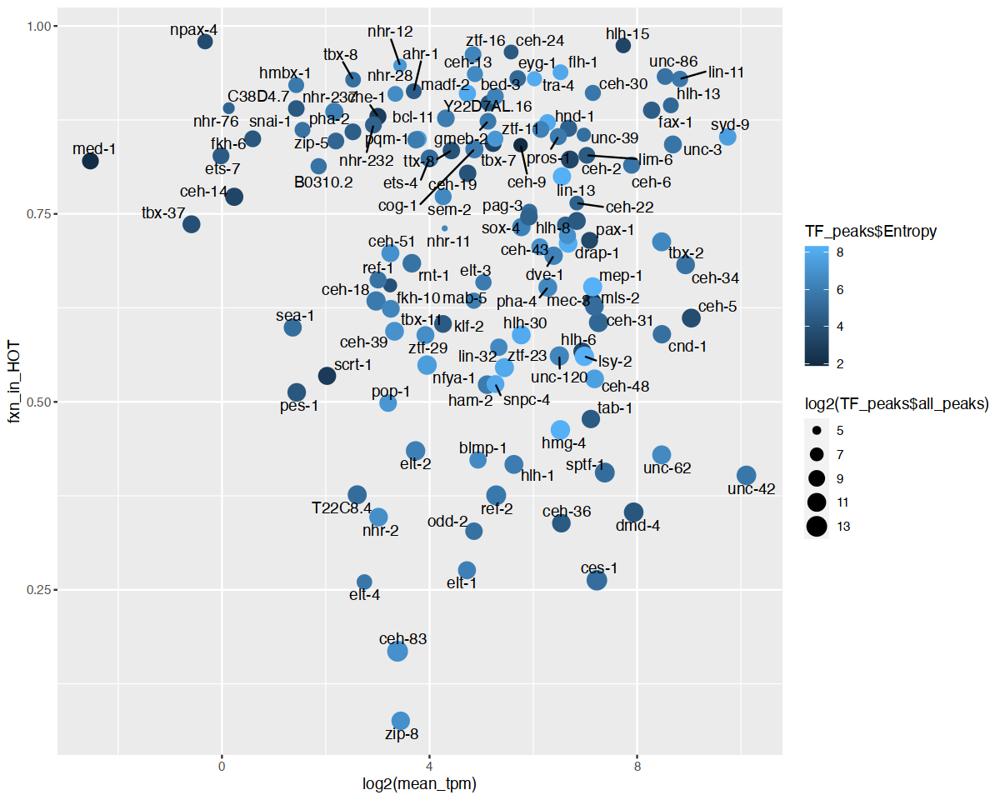

In [417]:
ggplot(TF_peaks, aes(x = log2(mean_tpm), y = fxn_in_HOT), label = TF) +
geom_point(aes(size = log2(TF_peaks$all_peaks), color = TF_peaks$Entropy)) +
geom_text_repel(label = TF_peaks$TF, hjust = 0.2, nudge_x = 0.05,)

In [419]:
nonHOT_peaks = worm_peaks_TF  %>% filter(grepl("emb", exp) & nPeaks < 85) %>% group_by(TF)  %>% 
count(TF)


In [422]:
HOT_peaks = worm_peaks_TF  %>% filter(grepl("emb", exp) &  nPeaks >= 85) %>% group_by(TF)  %>% 
count(TF)


In [423]:
all_peaks = worm_peaks_TF  %>% filter(grepl("emb", exp) ) %>% group_by(TF)  %>% 
count(TF)


In [424]:
all_peaks = all_peaks  %>% rename("all_peaks" = "n")

In [425]:
HOT_peaks = HOT_peaks  %>% rename("HOT_peaks" = "n")

In [426]:
nonHOT_peaks = nonHOT_peaks  %>% rename("nonHOT_peaks" = "n")

In [427]:
peak_nums = left_join(all_peaks, HOT_peaks, by = "TF")

In [428]:
peak_nums = left_join(peak_nums, nonHOT_peaks, by = "TF")

In [429]:
TF_peaks = left_join(peak_nums, gene_entropies_max_mean_median_group, by = c("TF" = "gene"))

In [431]:
head(TF_peaks )

TF,all_peaks,HOT_peaks,nonHOT_peaks,Entropy,max_tpm,mean_tpm,median_tpm,group,norm_ent,fxn_of_HOT
<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>
B0310.2,418,340,78,5.527768,100.5,3.63912,0.0,7-30,0.6371364,0.1299694
C38D4.7,510,454,56,4.267320,200.0,2.70000,0.0,2-6,0.4918558,0.1735474
K09A11.1,578,491,87,7.414190,140.1,13.76333,5.6,gt240,0.8545674,0.1876911
M03D4.4,1428,1046,382,6.182171,981.8,54.54914,0.4,7-30,0.7125636,0.3998471
T22C8.4,2415,909,1506,5.270904,248.4,6.09022,0.0,1,0.6075299,0.3474771
T23F11.4,545,475,70,7.996937,402.8,77.36210,51.1,85-240,0.9217354,0.1815749


In [430]:
TF_peaks = TF_peaks  %>% mutate(fxn_of_HOT = HOT_peaks/2616)

In [387]:
TF_peaks = TF_peaks  %>% mutate(fxn_in_HOT = HOT_peaks/all_peaks)

In [388]:
TF_peaks  %>%  head

TF,all_peaks,HOT_peaks,nonHOT_peaks,Entropy,max_tpm,mean_tpm,median_tpm,group,norm_ent,fxn_of_HOT,fxn_in_HOT
<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>
B0310.2,418,340,78,5.527768,100.5,3.63912,0.0,7-30,0.6371364,0.1299694,0.8133971
C38D4.7,510,454,56,4.267320,200.0,2.70000,0.0,2-6,0.4918558,0.1735474,0.8901961
K09A11.1,578,491,87,7.414190,140.1,13.76333,5.6,gt240,0.8545674,0.1876911,0.8494810
M03D4.4,1428,1046,382,6.182171,981.8,54.54914,0.4,7-30,0.7125636,0.3998471,0.7324930
T22C8.4,2415,909,1506,5.270904,248.4,6.09022,0.0,1,0.6075299,0.3474771,0.3763975
T23F11.4,545,475,70,7.996937,402.8,77.36210,51.1,85-240,0.9217354,0.1815749,0.8715596


Warning message:
“ggrepel: 65 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


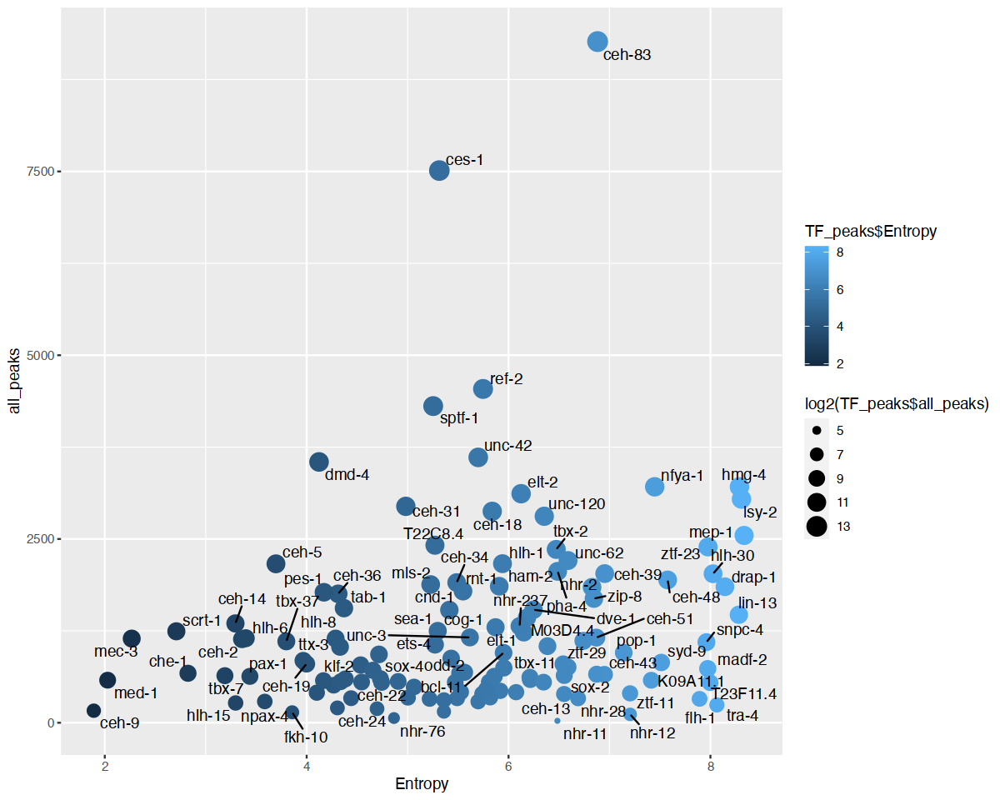

In [432]:
ggplot(TF_peaks, aes(x = Entropy, y = all_peaks), label = TF) +
geom_point(aes(size = log2(TF_peaks$all_peaks), color = TF_peaks$Entropy)) +
geom_text_repel(label = TF_peaks$TF, hjust = 0.2, nudge_x = 0.05,)

# Revised figures and Tables

In [ ]:
Occupancy = c("1", "2-6", "7-30", )